<a href="https://colab.research.google.com/github/Tomar-vaibhav/super_resolution/blob/main/SRGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
import cv2
import pickle
import numpy as np
from numpy.random import randint
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from keras.models import Sequential
from keras import layers,Model
from sklearn.model_selection import train_test_split
from keras.layers import Conv2D,PReLU,BatchNormalization,Flatten
from keras.layers import UpSampling2D,LeakyReLU,Dense,add,Input
from tqdm import tqdm

Creating high and low dimensional images

---



In [ ]:
dir='/content/drive/MyDrive/Flickr8k_Dataset/Flicker8k_Dataset'
des='/content/drive/MyDrive/srgan'

In [ ]:
for img in os.listdir(dir):
  path=os.path.join(dir,img)
  img_arr=cv2.imread(path)
  hr_img=cv2.resize(img_arr,(128,128))
  lr_img=cv2.resize(img_arr,(32,32))
  cv2.imwrite('/content/drive/MyDrive/srgan/hr_images/'+img,hr_img)
  cv2.imwrite('/content/drive/MyDrive/srgan/lr_images/'+img,lr_img)


In [ ]:
def res_block(ip):

    res_model = Conv2D(64, (3,3), padding = "same")(ip)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    res_model = PReLU(shared_axes = [1,2])(res_model)

    res_model = Conv2D(64, (3,3), padding = "same")(res_model)
    res_model = BatchNormalization(momentum = 0.5)(res_model)

    return add([ip,res_model])

In [ ]:
def upscale_block(ip):

    up_model = Conv2D(256, (3,3), padding="same")(ip)
    up_model = UpSampling2D( size = 2 )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)

    return up_model


In [ ]:
def create_gen(gen_ip, num_res_block):
    layers = Conv2D(64, (9,9), padding="same")(gen_ip)
    layers = PReLU(shared_axes=[1,2])(layers)

    temp = layers

    for i in range(num_res_block):
        layers = res_block(layers)

    layers = Conv2D(64, (3,3), padding="same")(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers,temp])

    layers = upscale_block(layers)
    layers = upscale_block(layers)

    op = Conv2D(3, (9,9), padding="same")(layers)

    return Model(inputs=gen_ip, outputs=op)


In [ ]:
def discriminator_block(ip, filters, strides=1, bn=True):

    disc_model = Conv2D(filters, (3,3), strides = strides, padding="same")(ip)

    if bn:
        disc_model = BatchNormalization( momentum=0.8 )(disc_model)

    disc_model = LeakyReLU( alpha=0.2 )(disc_model)

    return disc_model

In [ ]:
def create_disc(disc_ip):

    df = 64

    d1 = discriminator_block(disc_ip, df, bn=False)
    d2 = discriminator_block(d1, df, strides=2)
    d3 = discriminator_block(d2, df*2)
    d4 = discriminator_block(d3, df*2, strides=2)
    d5 = discriminator_block(d4, df*4)
    d6 = discriminator_block(d5, df*4, strides=2)
    d7 = discriminator_block(d6, df*8)
    d8 = discriminator_block(d7, df*8, strides=2)

    d8_5 = Flatten()(d8)
    d9 = Dense(df*16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation='sigmoid')(d10)

    return Model(disc_ip, validity)

In [ ]:
#VGG19
#We need VGG19 for the feature map obtained by the j-th convolution (after activation)
#before the i-th maxpooling layer within the VGG19 network.(as described in the paper)
#Let us pick the 3rd block, last conv layer.
#Build a pre-trained VGG19 model that outputs image features extracted at the
# third block of the model
# VGG architecture: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
from keras.applications import VGG19

def build_vgg(hr_shape):

    vgg = VGG19(weights="imagenet",include_top=False, input_shape=hr_shape)

    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)


In [ ]:
def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)

    gen_features = vgg(gen_img)

    disc_model.trainable = False
    validity = disc_model(gen_img)

    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])

In [ ]:
lr_list = os.listdir(des+"/lr_images")

lr_images = []
for img in lr_list:
    img_lr = cv2.imread(des+"/lr_images/" + img)
    img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
    lr_images.append(img_lr)


hr_list = os.listdir(des+"/hr_images")

hr_images = []
for img in hr_list:
    img_hr = cv2.imread(des+"/hr_images/" + img)
    img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
    hr_images.append(img_hr)

lr_images = np.array(lr_images)
hr_images = np.array(hr_images)

In [ ]:
len(lr_images)

8092

In [ ]:
import pickle
# Serialize and save lr_images
with open('/content/drive/My Drive/lr_images.pickle', 'wb') as file:
    pickle.dump(lr_images, file)

# Serialize and save hr_images
with open('/content/drive/My Drive/hr_images.pickle', 'wb') as file:
    pickle.dump(hr_images, file)



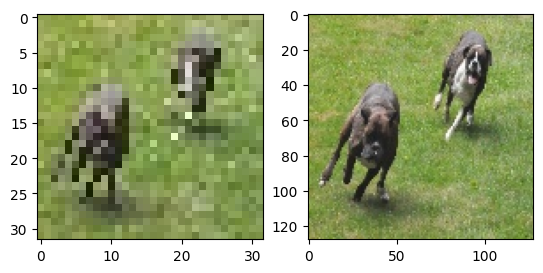

In [ ]:
import random
import numpy as np
image_number = random.randint(0, len(lr_images)-1)
# plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (32, 32, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (128, 128, 3)))
plt.show()

In [ ]:
#Scale values
lr_images = lr_images / 255.
hr_images = hr_images / 255.

In [ ]:
print(len(lr_images))
print(len(hr_images))

8092
8092


In [ ]:
#Split to train and test
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images,
                                                      test_size=0.33, random_state=42)


In [ ]:
hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

generator = create_gen(lr_ip, num_res_block = 16)
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 64)           15616     ['input_1[0][0]']             
                                                                                                  
 p_re_lu (PReLU)             (None, 32, 32, 64)           64        ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 32, 32, 64)           36928     ['p_re_lu[0][0]']             
                                                                                              

In [ ]:
discriminator = create_disc(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_37 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_38 (Conv2D)          (None, 64, 64, 64)        36928     
                                                                 
 batch_normalization_33 (Ba  (None, 64, 64, 64)        256       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                           

In [ ]:
vgg = build_vgg((128,128,3))
print(vgg.summary())
vgg.trainable = False


80134624/80134624 [==============================] - 1s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                            

In [ ]:
gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)
# 2 losses... adversarial loss and content (VGG) loss
#AdversariaL: is defined based on the probabilities of the discriminator over all training samples
# use binary_crossentropy

#Content: feature map obtained by the j-th convolution (after activation)
#before the i-th maxpooling layer within the VGG19 network.
# MSE between the feature representations of a reconstructed image
# and the reference image.
gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 model (Functional)          (None, 128, 128, 3)          2044291   ['input_1[0][0]']             
                                                                                                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 model_1 (Functional)        (None, 1)                    3824928   ['model[0][0]']               
                                                          1                                 

In [ ]:

#Create a list of images for LR and HR in batches from which a batch of images
#would be fetched during training.
batch_size = 1
train_lr_batches = []
train_hr_batches = []
for it in range(int(hr_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(hr_train[start_idx:end_idx])
    train_lr_batches.append(lr_train[start_idx:end_idx])


In [ ]:
epochs = 5
# Enumerate training over epochs
for e in range(epochs):

    fake_label = np.zeros((batch_size, 1)) # Assign a label of 0 to all fake (generated images)
    real_label = np.ones((batch_size,1)) # Assign a label of 1 to all real images.

    # Create empty lists to populate gen and disc losses.
    g_losses = []
    d_losses = []

    # Enumerate training over batches.
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b] # Fetch a batch of LR images for training
        hr_imgs = train_hr_batches[b] # Fetch a batch of HR images for training

        fake_imgs = generator.predict_on_batch(lr_imgs) # Fake images

        # First, train the discriminator on fake and real HR images.
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)

        # Now, train the generator by fixing discriminator as non-trainable
        discriminator.trainable = False

        # Average the discriminator loss, just for reporting purposes.
        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real)

        # Extract VGG features, to be used towards calculating loss
        image_features = vgg.predict(hr_imgs)

        # Train the generator via GAN.
        # Remember that we have 2 losses, adversarial loss and content (VGG) loss
        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])

        # Save losses to a list so we can average and report.
        d_losses.append(d_loss)
        g_losses.append(g_loss)

    # Convert the list of losses to an array to make it easy to average
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)

    # Calculate the average losses for generator and discriminator
    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)

    # Report the progress during training.
    print("epoch:", e+1 ,"g_loss:", g_loss, "d_loss:", d_loss)

    if (e+1) % 1 == 0: # Change the frequency for model saving, if needed
        # Save the generator after every epoch
        generator.save("gen_e_"+ str(e+1) +".h5")
        gan_model.save('gan_model.h5')  # Save the GAN model

        # Move the model to your Google Drive
        import shutil

        gan_model.save('gan_model.h5')

    # Define the destination path in your Google Drive
        destination_path = '/content/drive/My Drive/'

        # Check if the file already exists in the destination directory
        if os.path.exists(os.path.join(destination_path, 'gan_model.h5')):
            # Remove the existing model file
            os.remove(os.path.join(destination_path, 'gan_model.h5'))

        # Move the new model to your Google Drive (it may overwrite the existing one)
        shutil.move('gan_model.h5', os.path.join(destination_path, 'gan_model.h5'))


  0%|          | 0/5421 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 1/5421 [00:00<14:55,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 2/5421 [00:00<14:33,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 3/5421 [00:00<14:30,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 4/5421 [00:00<14:21,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 5/5421 [00:00<14:21,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 6/5421 [00:00<14:13,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 7/5421 [00:01<14:06,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 8/5421 [00:01<14:04,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 9/5421 [00:01<14:06,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 10/5421 [00:01<14:06,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 11/5421 [00:01<14:21,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 12/5421 [00:01<14:14,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 13/5421 [00:02<14:12,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 14/5421 [00:02<14:07,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 15/5421 [00:02<14:23,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 16/5421 [00:02<14:21,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 17/5421 [00:02<14:14,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 18/5421 [00:02<14:29,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 19/5421 [00:03<14:33,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 20/5421 [00:03<14:22,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 21/5421 [00:03<14:12,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 22/5421 [00:03<14:10,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 23/5421 [00:03<14:05,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 24/5421 [00:03<13:56,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 25/5421 [00:03<13:51,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 26/5421 [00:04<13:54,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 27/5421 [00:04<14:10,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 28/5421 [00:04<14:06,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 29/5421 [00:04<14:03,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 30/5421 [00:04<14:10,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 31/5421 [00:04<14:03,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 32/5421 [00:05<13:50,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 33/5421 [00:05<13:41,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 34/5421 [00:05<13:45,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 35/5421 [00:05<13:59,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 36/5421 [00:05<13:57,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 37/5421 [00:05<13:50,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 38/5421 [00:05<13:41,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/5421 [00:06<13:34,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 40/5421 [00:06<13:27,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 41/5421 [00:06<13:22,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 42/5421 [00:06<13:28,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 43/5421 [00:06<13:41,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 44/5421 [00:06<13:31,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 45/5421 [00:07<13:22,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 46/5421 [00:07<13:17,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 47/5421 [00:07<13:15,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 48/5421 [00:07<13:14,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 49/5421 [00:07<13:09,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 50/5421 [00:07<13:05,  6.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 51/5421 [00:07<13:18,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 52/5421 [00:08<13:18,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 53/5421 [00:08<13:14,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 54/5421 [00:08<13:11,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 55/5421 [00:08<13:03,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 56/5421 [00:08<13:19,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 57/5421 [00:08<13:06,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 58/5421 [00:08<13:00,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 59/5421 [00:09<13:20,  6.70it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 60/5421 [00:09<13:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 61/5421 [00:09<13:15,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 62/5421 [00:09<13:33,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 63/5421 [00:09<13:35,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 64/5421 [00:09<13:31,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 65/5421 [00:09<13:16,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 66/5421 [00:10<13:10,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 67/5421 [00:10<13:15,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 68/5421 [00:10<13:09,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 69/5421 [00:10<13:18,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 70/5421 [00:10<13:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 71/5421 [00:10<13:20,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 72/5421 [00:11<13:07,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 73/5421 [00:11<13:02,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 74/5421 [00:11<13:05,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 75/5421 [00:11<13:09,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 76/5421 [00:11<13:04,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 77/5421 [00:11<13:02,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 78/5421 [00:11<12:52,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 79/5421 [00:12<12:49,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 80/5421 [00:12<12:41,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 81/5421 [00:12<12:37,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 82/5421 [00:12<12:37,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 83/5421 [00:12<12:50,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/5421 [00:12<12:49,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 85/5421 [00:12<12:41,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 86/5421 [00:13<12:34,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 87/5421 [00:13<12:32,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 88/5421 [00:13<12:33,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 89/5421 [00:13<12:37,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 90/5421 [00:13<12:51,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 91/5421 [00:13<12:59,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 92/5421 [00:13<12:51,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 93/5421 [00:14<12:45,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 94/5421 [00:14<12:46,  6.95it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 95/5421 [00:14<13:06,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 96/5421 [00:14<13:19,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 97/5421 [00:14<13:15,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 98/5421 [00:14<13:26,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 99/5421 [00:14<13:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 100/5421 [00:15<14:06,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 101/5421 [00:15<14:02,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 102/5421 [00:15<13:36,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 103/5421 [00:15<13:17,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 104/5421 [00:15<13:10,  6.73it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 105/5421 [00:15<13:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 106/5421 [00:16<13:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 107/5421 [00:16<13:19,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 108/5421 [00:16<13:10,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 109/5421 [00:16<13:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 110/5421 [00:16<12:53,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 111/5421 [00:16<12:48,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 112/5421 [00:16<12:41,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 113/5421 [00:17<12:33,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 114/5421 [00:17<12:28,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 115/5421 [00:17<12:34,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 116/5421 [00:17<12:32,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 117/5421 [00:17<12:31,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 118/5421 [00:17<12:31,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 119/5421 [00:17<12:31,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 120/5421 [00:18<12:26,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 121/5421 [00:18<12:21,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 122/5421 [00:18<12:20,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 123/5421 [00:18<12:29,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 124/5421 [00:18<12:26,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 125/5421 [00:18<12:35,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 126/5421 [00:18<12:34,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 127/5421 [00:19<12:34,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 128/5421 [00:19<12:37,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 129/5421 [00:19<12:39,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 130/5421 [00:19<12:40,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 131/5421 [00:19<12:53,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 132/5421 [00:19<12:54,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 133/5421 [00:19<12:55,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 134/5421 [00:20<12:53,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 135/5421 [00:20<12:52,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 136/5421 [00:20<12:51,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 137/5421 [00:20<12:51,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 138/5421 [00:20<12:48,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 139/5421 [00:20<12:56,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 140/5421 [00:20<12:53,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 141/5421 [00:21<12:50,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 142/5421 [00:21<12:49,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 143/5421 [00:21<12:47,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 144/5421 [00:21<12:56,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 145/5421 [00:21<13:00,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 146/5421 [00:21<12:57,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 147/5421 [00:21<13:05,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 148/5421 [00:22<13:14,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 149/5421 [00:22<13:03,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 150/5421 [00:22<12:59,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 151/5421 [00:22<12:53,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 152/5421 [00:22<12:47,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 153/5421 [00:22<12:44,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 154/5421 [00:22<12:45,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 155/5421 [00:23<12:49,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 156/5421 [00:23<12:44,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 157/5421 [00:23<12:38,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 158/5421 [00:23<12:41,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 159/5421 [00:23<12:54,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 160/5421 [00:23<12:53,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 161/5421 [00:23<12:51,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 162/5421 [00:24<12:42,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 163/5421 [00:24<12:51,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 164/5421 [00:24<12:40,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 165/5421 [00:24<12:34,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 166/5421 [00:24<12:29,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 167/5421 [00:24<12:30,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 168/5421 [00:24<12:26,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 169/5421 [00:25<12:20,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 170/5421 [00:25<12:15,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 171/5421 [00:25<12:22,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 172/5421 [00:25<12:21,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 173/5421 [00:25<12:25,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 174/5421 [00:25<12:30,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 175/5421 [00:25<12:30,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 176/5421 [00:26<12:33,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 177/5421 [00:26<12:41,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 178/5421 [00:26<12:32,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 179/5421 [00:26<12:39,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 180/5421 [00:26<12:33,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 181/5421 [00:26<12:35,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 182/5421 [00:26<12:27,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 183/5421 [00:27<12:26,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 184/5421 [00:27<12:21,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 185/5421 [00:27<12:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 186/5421 [00:27<12:14,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 187/5421 [00:27<12:29,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 188/5421 [00:27<12:43,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 189/5421 [00:27<12:41,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 190/5421 [00:28<12:32,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 191/5421 [00:28<12:29,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 192/5421 [00:28<12:24,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 193/5421 [00:28<12:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 194/5421 [00:28<12:17,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 195/5421 [00:28<12:29,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 196/5421 [00:28<12:32,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 197/5421 [00:29<12:29,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 198/5421 [00:29<12:27,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 199/5421 [00:29<12:27,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 200/5421 [00:29<12:23,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 201/5421 [00:29<12:19,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 202/5421 [00:29<12:16,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 203/5421 [00:29<12:17,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 204/5421 [00:30<12:18,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 205/5421 [00:30<12:19,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 206/5421 [00:30<12:21,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 207/5421 [00:30<12:14,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 208/5421 [00:30<12:11,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 209/5421 [00:30<12:08,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 210/5421 [00:30<12:08,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 211/5421 [00:31<12:15,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 212/5421 [00:31<12:16,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 213/5421 [00:31<12:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 214/5421 [00:31<12:08,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 215/5421 [00:31<12:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 216/5421 [00:31<12:15,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 217/5421 [00:31<12:14,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 218/5421 [00:32<12:17,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 219/5421 [00:32<12:26,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 220/5421 [00:32<12:25,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 221/5421 [00:32<12:23,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 222/5421 [00:32<12:20,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 223/5421 [00:32<12:22,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 224/5421 [00:32<12:18,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 225/5421 [00:33<12:17,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 226/5421 [00:33<12:16,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 227/5421 [00:33<12:23,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 228/5421 [00:33<12:22,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 229/5421 [00:33<12:21,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 230/5421 [00:33<12:20,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 231/5421 [00:33<12:26,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 232/5421 [00:34<12:34,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 233/5421 [00:34<12:33,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 234/5421 [00:34<12:34,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 235/5421 [00:34<12:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 236/5421 [00:34<12:44,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 237/5421 [00:34<12:42,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 238/5421 [00:34<12:37,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 239/5421 [00:35<12:51,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 240/5421 [00:35<12:44,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 241/5421 [00:35<12:46,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 242/5421 [00:35<12:56,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 243/5421 [00:35<12:57,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 244/5421 [00:35<12:55,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 245/5421 [00:36<12:57,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 246/5421 [00:36<12:54,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 247/5421 [00:36<12:52,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 248/5421 [00:36<12:45,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 249/5421 [00:36<12:35,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 250/5421 [00:36<12:27,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 251/5421 [00:36<12:25,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 252/5421 [00:37<12:20,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 253/5421 [00:37<12:31,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 254/5421 [00:37<12:22,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 255/5421 [00:37<12:20,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 256/5421 [00:37<12:23,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 257/5421 [00:37<12:18,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 258/5421 [00:37<12:12,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 259/5421 [00:38<12:18,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 260/5421 [00:38<12:19,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 261/5421 [00:38<12:20,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 262/5421 [00:38<12:16,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 263/5421 [00:38<12:13,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 264/5421 [00:38<12:14,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 265/5421 [00:38<12:13,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 266/5421 [00:39<12:13,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 267/5421 [00:39<12:24,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 268/5421 [00:39<12:21,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 269/5421 [00:39<12:19,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 270/5421 [00:39<12:20,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 271/5421 [00:39<12:41,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 272/5421 [00:39<12:32,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 273/5421 [00:40<12:40,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 274/5421 [00:40<12:40,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 275/5421 [00:40<12:41,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 276/5421 [00:40<13:03,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 277/5421 [00:40<12:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 278/5421 [00:40<12:42,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 279/5421 [00:40<12:41,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 280/5421 [00:41<12:31,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 281/5421 [00:41<12:37,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 282/5421 [00:41<12:33,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 283/5421 [00:41<12:41,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 284/5421 [00:41<12:35,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 285/5421 [00:41<12:27,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 286/5421 [00:41<12:16,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 287/5421 [00:42<12:12,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 288/5421 [00:42<12:15,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 289/5421 [00:42<12:17,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 290/5421 [00:42<12:11,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 291/5421 [00:42<12:17,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 292/5421 [00:42<12:18,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 293/5421 [00:42<12:13,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 294/5421 [00:43<12:09,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 295/5421 [00:43<12:02,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 296/5421 [00:43<12:23,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 297/5421 [00:43<12:17,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 298/5421 [00:43<12:19,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 299/5421 [00:43<12:17,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 300/5421 [00:43<12:14,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 301/5421 [00:44<12:14,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 302/5421 [00:44<12:17,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 303/5421 [00:44<12:40,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 304/5421 [00:44<12:27,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 305/5421 [00:44<12:20,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 306/5421 [00:44<12:21,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 307/5421 [00:45<12:22,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 308/5421 [00:45<12:19,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 309/5421 [00:45<12:15,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 310/5421 [00:45<12:19,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 311/5421 [00:45<12:11,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 312/5421 [00:45<12:11,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 313/5421 [00:45<12:06,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 314/5421 [00:46<12:12,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 315/5421 [00:46<12:14,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 316/5421 [00:46<12:16,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 317/5421 [00:46<12:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 318/5421 [00:46<12:15,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 319/5421 [00:46<12:13,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 320/5421 [00:46<12:08,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 321/5421 [00:47<12:07,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 322/5421 [00:47<12:07,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 323/5421 [00:47<12:16,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 324/5421 [00:47<12:21,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 325/5421 [00:47<12:24,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 326/5421 [00:47<12:21,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 327/5421 [00:47<12:24,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 328/5421 [00:48<12:19,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 329/5421 [00:48<12:16,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 330/5421 [00:48<12:20,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 331/5421 [00:48<12:48,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 332/5421 [00:48<12:37,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 333/5421 [00:48<12:29,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 334/5421 [00:48<12:30,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 335/5421 [00:49<12:22,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 336/5421 [00:49<12:19,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 337/5421 [00:49<12:11,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 338/5421 [00:49<12:09,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 339/5421 [00:49<12:23,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 340/5421 [00:49<12:23,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 341/5421 [00:49<12:15,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 342/5421 [00:50<12:07,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 343/5421 [00:50<12:03,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 344/5421 [00:50<12:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 345/5421 [00:50<11:57,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 346/5421 [00:50<11:57,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 347/5421 [00:50<12:02,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 348/5421 [00:50<12:07,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 349/5421 [00:51<12:02,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 350/5421 [00:51<12:10,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 351/5421 [00:51<12:12,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 352/5421 [00:51<12:14,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 353/5421 [00:51<12:09,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 354/5421 [00:51<12:06,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 355/5421 [00:51<12:13,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 356/5421 [00:52<12:15,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 357/5421 [00:52<12:12,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 358/5421 [00:52<12:06,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 359/5421 [00:52<12:08,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 360/5421 [00:52<12:06,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 361/5421 [00:52<12:01,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 362/5421 [00:52<12:00,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 363/5421 [00:53<12:05,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 364/5421 [00:53<12:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 365/5421 [00:53<12:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 366/5421 [00:53<12:04,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 367/5421 [00:53<12:02,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 368/5421 [00:53<11:59,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 369/5421 [00:53<11:55,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 370/5421 [00:54<11:53,  7.08it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 371/5421 [00:54<12:07,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 372/5421 [00:54<12:04,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 373/5421 [00:54<12:02,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 374/5421 [00:54<11:59,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 375/5421 [00:54<11:58,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 376/5421 [00:54<11:51,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 377/5421 [00:55<11:54,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 378/5421 [00:55<11:55,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 379/5421 [00:55<12:03,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 380/5421 [00:55<12:01,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 381/5421 [00:55<12:13,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 382/5421 [00:55<12:19,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 383/5421 [00:55<12:12,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 384/5421 [00:56<12:07,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 385/5421 [00:56<12:08,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 386/5421 [00:56<12:07,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 387/5421 [00:56<12:11,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 388/5421 [00:56<12:07,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 389/5421 [00:56<12:01,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 390/5421 [00:56<11:57,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 391/5421 [00:57<11:52,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 392/5421 [00:57<11:48,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 393/5421 [00:57<11:46,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 394/5421 [00:57<11:44,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 395/5421 [00:57<12:02,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 396/5421 [00:57<11:54,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 397/5421 [00:57<11:49,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 398/5421 [00:58<11:49,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 399/5421 [00:58<11:51,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 400/5421 [00:58<12:03,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 401/5421 [00:58<12:03,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 402/5421 [00:58<12:06,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 403/5421 [00:58<12:11,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 404/5421 [00:58<12:10,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 405/5421 [00:59<12:10,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 406/5421 [00:59<12:09,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 407/5421 [00:59<12:08,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 408/5421 [00:59<12:01,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 409/5421 [00:59<12:10,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 410/5421 [00:59<12:09,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 411/5421 [00:59<12:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 412/5421 [01:00<12:00,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 413/5421 [01:00<11:56,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 414/5421 [01:00<11:56,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 415/5421 [01:00<11:54,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 416/5421 [01:00<11:55,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 417/5421 [01:00<11:54,  7.00it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 418/5421 [01:00<11:58,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 419/5421 [01:01<12:05,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 420/5421 [01:01<12:06,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 421/5421 [01:01<12:00,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 422/5421 [01:01<11:54,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 423/5421 [01:01<12:03,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 424/5421 [01:01<12:03,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 425/5421 [01:01<11:58,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 426/5421 [01:02<11:52,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 427/5421 [01:02<11:58,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 428/5421 [01:02<11:52,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 429/5421 [01:02<11:52,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 430/5421 [01:02<11:53,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 431/5421 [01:02<11:58,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 432/5421 [01:02<11:59,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 433/5421 [01:03<11:50,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 434/5421 [01:03<11:44,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 435/5421 [01:03<11:55,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 436/5421 [01:03<11:59,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 437/5421 [01:03<11:56,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 438/5421 [01:03<11:54,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 439/5421 [01:03<11:48,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 440/5421 [01:04<11:47,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 441/5421 [01:04<11:51,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 442/5421 [01:04<11:48,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 443/5421 [01:04<11:53,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 444/5421 [01:04<11:57,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 445/5421 [01:04<11:58,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 446/5421 [01:04<11:53,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 447/5421 [01:05<11:53,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 448/5421 [01:05<11:49,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 449/5421 [01:05<11:52,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 450/5421 [01:05<11:48,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 451/5421 [01:05<12:01,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 452/5421 [01:05<12:13,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 453/5421 [01:06<12:15,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 454/5421 [01:06<12:05,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 455/5421 [01:06<12:00,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 456/5421 [01:06<11:55,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 457/5421 [01:06<11:52,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 458/5421 [01:06<11:53,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 459/5421 [01:06<12:01,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 460/5421 [01:07<11:55,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 461/5421 [01:07<11:56,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 462/5421 [01:07<11:51,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 463/5421 [01:07<11:48,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 464/5421 [01:07<11:46,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 465/5421 [01:07<11:45,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 466/5421 [01:07<11:42,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 467/5421 [01:08<11:51,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 468/5421 [01:08<11:48,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 469/5421 [01:08<11:49,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 470/5421 [01:08<12:03,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 471/5421 [01:08<11:58,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 472/5421 [01:08<11:53,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 473/5421 [01:08<11:59,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 474/5421 [01:09<11:52,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 475/5421 [01:09<11:56,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 476/5421 [01:09<11:53,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 477/5421 [01:09<11:52,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 478/5421 [01:09<11:47,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 479/5421 [01:09<11:47,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 480/5421 [01:09<11:45,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 481/5421 [01:10<11:44,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 482/5421 [01:10<11:43,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 483/5421 [01:10<11:49,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 484/5421 [01:10<11:48,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 485/5421 [01:10<11:46,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 486/5421 [01:10<11:46,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 487/5421 [01:10<11:43,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 488/5421 [01:11<12:06,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 489/5421 [01:11<12:05,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 490/5421 [01:11<12:04,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 491/5421 [01:11<12:08,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 492/5421 [01:11<12:10,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 493/5421 [01:11<12:21,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 494/5421 [01:11<12:17,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 495/5421 [01:12<12:12,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 496/5421 [01:12<12:22,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 497/5421 [01:12<12:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 498/5421 [01:12<12:14,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 499/5421 [01:12<12:04,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 500/5421 [01:12<12:01,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 501/5421 [01:12<12:00,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 502/5421 [01:13<11:57,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 503/5421 [01:13<11:54,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 504/5421 [01:13<11:55,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 505/5421 [01:13<12:03,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 506/5421 [01:13<12:08,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 507/5421 [01:13<11:58,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 508/5421 [01:14<11:58,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 509/5421 [01:14<11:58,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 510/5421 [01:14<11:55,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 511/5421 [01:14<11:51,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 512/5421 [01:14<11:46,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 513/5421 [01:14<11:40,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 514/5421 [01:14<11:52,  6.89it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 515/5421 [01:15<11:54,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 516/5421 [01:15<12:04,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 517/5421 [01:15<11:54,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 518/5421 [01:15<11:49,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 519/5421 [01:15<11:52,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 520/5421 [01:15<11:46,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 521/5421 [01:15<11:58,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 522/5421 [01:16<12:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 523/5421 [01:16<11:55,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 524/5421 [01:16<11:52,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 525/5421 [01:16<11:48,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 526/5421 [01:16<11:44,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 527/5421 [01:16<11:40,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 528/5421 [01:16<11:38,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 529/5421 [01:17<11:38,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 530/5421 [01:17<12:01,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 531/5421 [01:17<11:50,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 532/5421 [01:17<11:43,  6.95it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 533/5421 [01:17<11:44,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 534/5421 [01:17<11:37,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 535/5421 [01:17<11:34,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 536/5421 [01:18<11:35,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 537/5421 [01:18<11:56,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 538/5421 [01:18<11:55,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 539/5421 [01:18<11:52,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 540/5421 [01:18<11:45,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 541/5421 [01:18<11:39,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 542/5421 [01:18<11:35,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 543/5421 [01:19<11:34,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 544/5421 [01:19<11:36,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 545/5421 [01:19<11:37,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 546/5421 [01:19<11:42,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 547/5421 [01:19<11:37,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 548/5421 [01:19<11:31,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 549/5421 [01:19<11:33,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 550/5421 [01:20<11:33,  7.02it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 551/5421 [01:20<11:39,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 552/5421 [01:20<11:34,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 553/5421 [01:20<11:31,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 554/5421 [01:20<11:33,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 555/5421 [01:20<11:36,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 556/5421 [01:20<11:31,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 557/5421 [01:21<11:31,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 558/5421 [01:21<11:36,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 559/5421 [01:21<11:31,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 560/5421 [01:21<11:43,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 561/5421 [01:21<11:47,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 562/5421 [01:21<11:51,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 563/5421 [01:21<11:41,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 564/5421 [01:22<11:39,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 565/5421 [01:22<11:38,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 566/5421 [01:22<11:40,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 567/5421 [01:22<11:39,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 568/5421 [01:22<11:38,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 569/5421 [01:22<11:32,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 570/5421 [01:22<11:36,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 571/5421 [01:23<11:39,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 572/5421 [01:23<11:36,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 573/5421 [01:23<11:39,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 574/5421 [01:23<11:30,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 575/5421 [01:23<11:27,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 576/5421 [01:23<11:37,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 577/5421 [01:23<11:37,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 578/5421 [01:24<11:42,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 579/5421 [01:24<11:43,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 580/5421 [01:24<11:36,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 581/5421 [01:24<11:32,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 582/5421 [01:24<11:35,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 583/5421 [01:24<11:59,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 584/5421 [01:24<12:00,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 585/5421 [01:25<11:54,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 586/5421 [01:25<11:51,  6.80it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 587/5421 [01:25<11:48,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 588/5421 [01:25<11:41,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 589/5421 [01:25<11:36,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 590/5421 [01:25<11:40,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 591/5421 [01:25<11:40,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 592/5421 [01:26<11:35,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 593/5421 [01:26<11:35,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 594/5421 [01:26<11:43,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 595/5421 [01:26<11:36,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 596/5421 [01:26<11:37,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 597/5421 [01:26<11:37,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 598/5421 [01:26<11:31,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 599/5421 [01:27<11:26,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 600/5421 [01:27<11:32,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 601/5421 [01:27<11:37,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 602/5421 [01:27<12:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 603/5421 [01:27<11:57,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 604/5421 [01:27<11:51,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 605/5421 [01:28<11:41,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 606/5421 [01:28<11:35,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 607/5421 [01:28<11:38,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 608/5421 [01:28<11:36,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 609/5421 [01:28<11:47,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 610/5421 [01:28<11:58,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 611/5421 [01:28<11:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 612/5421 [01:29<11:44,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 613/5421 [01:29<11:44,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 614/5421 [01:29<11:41,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 615/5421 [01:29<11:42,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 616/5421 [01:29<11:44,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 617/5421 [01:29<12:01,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 618/5421 [01:29<12:04,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 619/5421 [01:30<12:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 620/5421 [01:30<11:50,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 621/5421 [01:30<11:55,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 622/5421 [01:30<11:51,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 623/5421 [01:30<11:42,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 624/5421 [01:30<11:32,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 625/5421 [01:30<11:25,  7.00it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 626/5421 [01:31<11:37,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 627/5421 [01:31<11:31,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 628/5421 [01:31<11:31,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 629/5421 [01:31<11:26,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 630/5421 [01:31<11:27,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 631/5421 [01:31<11:26,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 632/5421 [01:31<11:26,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 633/5421 [01:32<11:22,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 634/5421 [01:32<11:33,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 635/5421 [01:32<11:31,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 636/5421 [01:32<11:25,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 637/5421 [01:32<11:31,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 638/5421 [01:32<11:29,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 639/5421 [01:32<11:27,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 640/5421 [01:33<11:20,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 641/5421 [01:33<11:16,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 642/5421 [01:33<11:22,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 643/5421 [01:33<11:24,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 644/5421 [01:33<11:22,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 645/5421 [01:33<11:19,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 646/5421 [01:33<11:26,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 647/5421 [01:34<11:29,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 648/5421 [01:34<11:29,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 649/5421 [01:34<11:23,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 650/5421 [01:34<11:34,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 651/5421 [01:34<11:35,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 652/5421 [01:34<11:29,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 653/5421 [01:34<11:28,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 654/5421 [01:35<11:19,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 655/5421 [01:35<11:20,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 656/5421 [01:35<11:16,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 657/5421 [01:35<11:12,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 658/5421 [01:35<11:20,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 659/5421 [01:35<11:17,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 660/5421 [01:35<11:16,  7.03it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 661/5421 [01:36<11:16,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 662/5421 [01:36<11:22,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 663/5421 [01:36<11:18,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 664/5421 [01:36<11:27,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 665/5421 [01:36<11:30,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 666/5421 [01:36<11:33,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 667/5421 [01:36<11:40,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 668/5421 [01:37<11:43,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 669/5421 [01:37<11:41,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 670/5421 [01:37<11:45,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 671/5421 [01:37<11:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 672/5421 [01:37<11:42,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 673/5421 [01:37<11:47,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 674/5421 [01:38<11:59,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 675/5421 [01:38<11:50,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 676/5421 [01:38<11:51,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 677/5421 [01:38<11:47,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 678/5421 [01:38<11:41,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 679/5421 [01:38<11:37,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 680/5421 [01:38<11:45,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 681/5421 [01:39<11:45,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 682/5421 [01:39<11:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 683/5421 [01:39<11:46,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 684/5421 [01:39<11:35,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 685/5421 [01:39<11:27,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 686/5421 [01:39<11:20,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 687/5421 [01:39<11:23,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 688/5421 [01:40<11:17,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 689/5421 [01:40<11:15,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 690/5421 [01:40<11:22,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 691/5421 [01:40<11:19,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 692/5421 [01:40<11:20,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 693/5421 [01:40<11:16,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 694/5421 [01:40<11:15,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 695/5421 [01:41<11:09,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 696/5421 [01:41<11:06,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 697/5421 [01:41<11:09,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 698/5421 [01:41<11:27,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 699/5421 [01:41<11:24,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 700/5421 [01:41<11:21,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 701/5421 [01:41<11:16,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 702/5421 [01:42<11:10,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 703/5421 [01:42<11:11,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 704/5421 [01:42<11:09,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 705/5421 [01:42<11:05,  7.08it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 706/5421 [01:42<11:27,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 707/5421 [01:42<11:33,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 708/5421 [01:42<11:24,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 709/5421 [01:43<11:15,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 710/5421 [01:43<11:09,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 711/5421 [01:43<11:11,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 712/5421 [01:43<11:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 713/5421 [01:43<11:01,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 714/5421 [01:43<11:20,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 715/5421 [01:43<11:15,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 716/5421 [01:44<11:16,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 717/5421 [01:44<11:13,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 718/5421 [01:44<11:12,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 719/5421 [01:44<11:11,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 720/5421 [01:44<11:06,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 721/5421 [01:44<11:19,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 722/5421 [01:44<11:22,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 723/5421 [01:45<11:13,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 724/5421 [01:45<11:08,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 725/5421 [01:45<11:05,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 726/5421 [01:45<11:05,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 727/5421 [01:45<11:11,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 728/5421 [01:45<11:07,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 729/5421 [01:45<11:17,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 730/5421 [01:46<11:21,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 731/5421 [01:46<11:16,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 732/5421 [01:46<11:11,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 733/5421 [01:46<11:08,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 734/5421 [01:46<11:03,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 735/5421 [01:46<10:59,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 736/5421 [01:46<11:01,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 737/5421 [01:47<11:02,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 738/5421 [01:47<11:30,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 739/5421 [01:47<11:22,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 740/5421 [01:47<11:13,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 741/5421 [01:47<11:13,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 742/5421 [01:47<11:19,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 743/5421 [01:47<11:15,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 744/5421 [01:48<11:07,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 745/5421 [01:48<11:15,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 746/5421 [01:48<11:17,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 747/5421 [01:48<11:18,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 748/5421 [01:48<11:23,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 749/5421 [01:48<11:26,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 750/5421 [01:48<11:16,  6.90it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 751/5421 [01:49<11:27,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 752/5421 [01:49<11:44,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 753/5421 [01:49<11:32,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 754/5421 [01:49<11:32,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 755/5421 [01:49<11:27,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 756/5421 [01:49<11:21,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 757/5421 [01:50<11:16,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 758/5421 [01:50<11:19,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 759/5421 [01:50<11:16,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 760/5421 [01:50<11:20,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 761/5421 [01:50<11:26,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 762/5421 [01:50<11:31,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 763/5421 [01:50<11:37,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 764/5421 [01:51<11:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 765/5421 [01:51<11:18,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 766/5421 [01:51<11:16,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 767/5421 [01:51<11:12,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 768/5421 [01:51<11:05,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 769/5421 [01:51<11:05,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 770/5421 [01:51<11:23,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 771/5421 [01:52<11:18,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 772/5421 [01:52<11:11,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 773/5421 [01:52<11:05,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 774/5421 [01:52<11:12,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 775/5421 [01:52<11:15,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 776/5421 [01:52<11:07,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 777/5421 [01:52<11:04,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 778/5421 [01:53<11:13,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 779/5421 [01:53<11:06,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 780/5421 [01:53<11:06,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 781/5421 [01:53<11:03,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 782/5421 [01:53<11:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 783/5421 [01:53<11:04,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 784/5421 [01:53<10:59,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 785/5421 [01:54<10:55,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 786/5421 [01:54<11:06,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 787/5421 [01:54<11:05,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 788/5421 [01:54<11:02,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 789/5421 [01:54<11:03,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 790/5421 [01:54<11:06,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 791/5421 [01:54<11:09,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 792/5421 [01:55<11:07,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 793/5421 [01:55<11:07,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 794/5421 [01:55<11:11,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 795/5421 [01:55<11:05,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 796/5421 [01:55<11:00,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 797/5421 [01:55<11:05,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 798/5421 [01:55<10:58,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 799/5421 [01:56<11:02,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 800/5421 [01:56<11:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 801/5421 [01:56<10:58,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 802/5421 [01:56<11:05,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 803/5421 [01:56<11:04,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 804/5421 [01:56<11:33,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 805/5421 [01:56<11:23,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 806/5421 [01:57<11:20,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 807/5421 [01:57<11:11,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 808/5421 [01:57<11:10,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 809/5421 [01:57<11:13,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 810/5421 [01:57<11:16,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 811/5421 [01:57<11:19,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 812/5421 [01:57<11:18,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 813/5421 [01:58<11:09,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 814/5421 [01:58<11:05,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 815/5421 [01:58<11:01,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 816/5421 [01:58<10:54,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 817/5421 [01:58<10:55,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 818/5421 [01:58<11:12,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 819/5421 [01:59<11:11,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 820/5421 [01:59<11:07,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 821/5421 [01:59<11:03,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 822/5421 [01:59<11:03,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 823/5421 [01:59<10:59,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 824/5421 [01:59<10:59,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 825/5421 [01:59<11:13,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 826/5421 [02:00<11:11,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 827/5421 [02:00<11:11,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 828/5421 [02:00<11:08,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 829/5421 [02:00<11:05,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 830/5421 [02:00<11:03,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 831/5421 [02:00<11:02,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 832/5421 [02:00<11:05,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 833/5421 [02:01<11:06,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 834/5421 [02:01<11:14,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 835/5421 [02:01<11:14,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 836/5421 [02:01<11:18,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 837/5421 [02:01<11:12,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 838/5421 [02:01<11:07,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 839/5421 [02:01<11:19,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 840/5421 [02:02<11:21,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 841/5421 [02:02<11:18,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 842/5421 [02:02<11:21,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 843/5421 [02:02<11:13,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 844/5421 [02:02<11:12,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 845/5421 [02:02<11:02,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 846/5421 [02:02<11:00,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 847/5421 [02:03<11:02,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 848/5421 [02:03<10:57,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 849/5421 [02:03<10:56,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 850/5421 [02:03<11:03,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 851/5421 [02:03<10:59,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 852/5421 [02:03<10:53,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 853/5421 [02:03<10:52,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 854/5421 [02:04<10:51,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 855/5421 [02:04<10:51,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 856/5421 [02:04<10:48,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 857/5421 [02:04<10:41,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 858/5421 [02:04<10:50,  7.02it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 859/5421 [02:04<11:04,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 860/5421 [02:04<11:02,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 861/5421 [02:05<10:52,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 862/5421 [02:05<10:52,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 863/5421 [02:05<10:46,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 864/5421 [02:05<10:39,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 865/5421 [02:05<10:39,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 866/5421 [02:05<10:55,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 867/5421 [02:05<10:53,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 868/5421 [02:06<10:52,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 869/5421 [02:06<10:49,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 870/5421 [02:06<10:46,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 871/5421 [02:06<10:50,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 872/5421 [02:06<10:46,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 873/5421 [02:06<10:58,  6.91it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 874/5421 [02:06<11:13,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 875/5421 [02:07<11:17,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 876/5421 [02:07<11:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 877/5421 [02:07<11:24,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 878/5421 [02:07<11:20,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 879/5421 [02:07<11:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 880/5421 [02:07<11:20,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 881/5421 [02:08<11:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 882/5421 [02:08<11:21,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 883/5421 [02:08<11:23,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 884/5421 [02:08<11:19,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 885/5421 [02:08<11:21,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 886/5421 [02:08<11:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 887/5421 [02:08<11:14,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 888/5421 [02:09<11:11,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 889/5421 [02:09<11:11,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 890/5421 [02:09<11:16,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 891/5421 [02:09<11:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 892/5421 [02:09<11:14,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 893/5421 [02:09<11:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 894/5421 [02:09<11:07,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 895/5421 [02:10<11:04,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 896/5421 [02:10<11:06,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 897/5421 [02:10<11:03,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 898/5421 [02:10<11:06,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 899/5421 [02:10<11:05,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 900/5421 [02:10<10:57,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 901/5421 [02:10<10:48,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 902/5421 [02:11<10:44,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 903/5421 [02:11<10:40,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 904/5421 [02:11<10:39,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 905/5421 [02:11<10:40,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 906/5421 [02:11<10:54,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 907/5421 [02:11<10:52,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 908/5421 [02:11<10:57,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 909/5421 [02:12<10:53,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 910/5421 [02:12<10:51,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 911/5421 [02:12<10:58,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 912/5421 [02:12<10:55,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 913/5421 [02:12<10:50,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 914/5421 [02:12<10:52,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 915/5421 [02:12<10:53,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 916/5421 [02:13<10:50,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 917/5421 [02:13<10:47,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 918/5421 [02:13<10:45,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 919/5421 [02:13<10:53,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 920/5421 [02:13<11:01,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 921/5421 [02:13<10:58,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 922/5421 [02:14<11:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 923/5421 [02:14<11:05,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 924/5421 [02:14<11:06,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 925/5421 [02:14<11:12,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 926/5421 [02:14<11:12,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 927/5421 [02:14<11:09,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 928/5421 [02:14<11:01,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 929/5421 [02:15<11:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 930/5421 [02:15<11:05,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 931/5421 [02:15<11:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 932/5421 [02:15<11:04,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 933/5421 [02:15<10:57,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 934/5421 [02:15<11:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 935/5421 [02:15<11:02,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 936/5421 [02:16<10:59,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 937/5421 [02:16<10:55,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 938/5421 [02:16<10:55,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 939/5421 [02:16<10:56,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 940/5421 [02:16<10:48,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 941/5421 [02:16<10:47,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 942/5421 [02:16<10:47,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 943/5421 [02:17<10:44,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 944/5421 [02:17<10:39,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 945/5421 [02:17<10:39,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 946/5421 [02:17<10:44,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 947/5421 [02:17<10:44,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 948/5421 [02:17<10:51,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 949/5421 [02:17<10:44,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 950/5421 [02:18<10:38,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 951/5421 [02:18<10:40,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 952/5421 [02:18<10:36,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 953/5421 [02:18<10:32,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 954/5421 [02:18<10:57,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 955/5421 [02:18<10:50,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 956/5421 [02:18<10:44,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 957/5421 [02:19<10:43,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 958/5421 [02:19<10:45,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 959/5421 [02:19<10:38,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 960/5421 [02:19<10:40,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 961/5421 [02:19<10:50,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 962/5421 [02:19<11:00,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 963/5421 [02:19<10:55,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 964/5421 [02:20<10:49,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 965/5421 [02:20<10:50,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 966/5421 [02:20<10:49,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 967/5421 [02:20<10:49,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 968/5421 [02:20<10:49,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 969/5421 [02:20<10:48,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 970/5421 [02:21<10:58,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 971/5421 [02:21<10:53,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 972/5421 [02:21<10:52,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 973/5421 [02:21<10:52,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 974/5421 [02:21<10:49,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 975/5421 [02:21<10:49,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 976/5421 [02:21<10:55,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 977/5421 [02:22<10:57,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 978/5421 [02:22<10:55,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 979/5421 [02:22<10:57,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 980/5421 [02:22<10:56,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 981/5421 [02:22<11:03,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 982/5421 [02:22<11:16,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 983/5421 [02:22<11:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 984/5421 [02:23<11:03,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 985/5421 [02:23<10:58,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 986/5421 [02:23<11:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 987/5421 [02:23<10:54,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 988/5421 [02:23<11:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 989/5421 [02:23<10:56,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 990/5421 [02:23<10:49,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 991/5421 [02:24<10:42,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 992/5421 [02:24<10:40,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 993/5421 [02:24<10:35,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 994/5421 [02:24<10:38,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 995/5421 [02:24<10:55,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 996/5421 [02:24<10:45,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 997/5421 [02:24<10:40,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 998/5421 [02:25<10:34,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 999/5421 [02:25<10:29,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1000/5421 [02:25<10:25,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1001/5421 [02:25<10:28,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 1002/5421 [02:25<11:03,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1003/5421 [02:25<11:04,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1004/5421 [02:26<11:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1005/5421 [02:26<11:01,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1006/5421 [02:26<11:04,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1007/5421 [02:26<11:00,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1008/5421 [02:26<10:57,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1009/5421 [02:26<11:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1010/5421 [02:26<11:13,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 1011/5421 [02:27<11:15,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1012/5421 [02:27<11:19,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 1013/5421 [02:27<11:20,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1014/5421 [02:27<11:19,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1015/5421 [02:27<11:22,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1016/5421 [02:27<11:13,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1017/5421 [02:27<11:03,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1018/5421 [02:28<11:10,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1019/5421 [02:28<11:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1020/5421 [02:28<11:05,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1021/5421 [02:28<10:53,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1022/5421 [02:28<10:53,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1023/5421 [02:28<10:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1024/5421 [02:29<10:44,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1025/5421 [02:29<10:40,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1026/5421 [02:29<10:51,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1027/5421 [02:29<10:45,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1028/5421 [02:29<10:43,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1029/5421 [02:29<10:39,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1030/5421 [02:29<10:55,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1031/5421 [02:30<10:47,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1032/5421 [02:30<10:53,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1033/5421 [02:30<10:47,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1034/5421 [02:30<10:49,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1035/5421 [02:30<10:52,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1036/5421 [02:30<10:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1037/5421 [02:30<10:56,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1038/5421 [02:31<10:47,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1039/5421 [02:31<10:49,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1040/5421 [02:31<10:43,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1041/5421 [02:31<10:35,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1042/5421 [02:31<10:39,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1043/5421 [02:31<10:39,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1044/5421 [02:31<10:36,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1045/5421 [02:32<10:35,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1046/5421 [02:32<10:38,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1047/5421 [02:32<10:33,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1048/5421 [02:32<10:29,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1049/5421 [02:32<10:27,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1050/5421 [02:32<10:40,  6.82it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1051/5421 [02:33<19:15,  3.78it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1052/5421 [02:33<16:51,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 1053/5421 [02:33<15:13,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1054/5421 [02:33<14:11,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1055/5421 [02:34<13:26,  5.42it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1056/5421 [02:34<12:54,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1057/5421 [02:34<12:32,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1058/5421 [02:34<12:08,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 1059/5421 [02:34<12:11,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1060/5421 [02:34<11:58,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1061/5421 [02:34<11:49,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1062/5421 [02:35<11:39,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1063/5421 [02:35<11:33,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1064/5421 [02:35<11:30,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1065/5421 [02:35<11:25,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1066/5421 [02:35<11:23,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1067/5421 [02:35<11:36,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1068/5421 [02:36<11:41,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1069/5421 [02:36<11:36,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1070/5421 [02:36<11:29,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1071/5421 [02:36<11:35,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1072/5421 [02:36<11:31,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1073/5421 [02:36<11:28,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1074/5421 [02:37<11:25,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1075/5421 [02:37<11:34,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1076/5421 [02:37<11:30,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1077/5421 [02:37<11:28,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1078/5421 [02:37<11:25,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1079/5421 [02:37<11:33,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1080/5421 [02:37<11:28,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1081/5421 [02:38<11:35,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1082/5421 [02:38<11:32,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1083/5421 [02:38<11:53,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1084/5421 [02:38<11:55,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 1085/5421 [02:38<11:53,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1086/5421 [02:38<11:50,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 1087/5421 [02:39<11:52,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 1088/5421 [02:39<11:47,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 1089/5421 [02:39<11:50,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1090/5421 [02:39<12:09,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1091/5421 [02:39<12:12,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1092/5421 [02:39<12:03,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 1093/5421 [02:40<11:57,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1094/5421 [02:40<11:50,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1095/5421 [02:40<11:52,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1096/5421 [02:40<11:50,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1097/5421 [02:40<11:41,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1098/5421 [02:40<11:35,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1099/5421 [02:41<11:45,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1100/5421 [02:41<11:37,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1101/5421 [02:41<11:35,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1102/5421 [02:41<11:23,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1103/5421 [02:41<11:14,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 1104/5421 [02:41<11:23,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1105/5421 [02:42<11:22,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1106/5421 [02:42<11:21,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1107/5421 [02:42<11:25,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1108/5421 [02:42<11:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1109/5421 [02:42<11:11,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1110/5421 [02:42<11:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1111/5421 [02:43<11:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1112/5421 [02:43<10:57,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1113/5421 [02:43<10:49,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1114/5421 [02:43<10:46,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1115/5421 [02:43<10:52,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1116/5421 [02:43<10:55,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1117/5421 [02:43<10:48,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1118/5421 [02:44<10:44,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1119/5421 [02:44<10:50,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1120/5421 [02:44<10:49,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1121/5421 [02:44<10:51,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1122/5421 [02:44<10:46,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1123/5421 [02:44<10:49,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1124/5421 [02:44<10:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1125/5421 [02:45<10:47,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 1126/5421 [02:45<10:53,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1127/5421 [02:45<10:47,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1128/5421 [02:45<10:41,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1129/5421 [02:45<10:44,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1130/5421 [02:45<10:39,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1131/5421 [02:46<10:53,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1132/5421 [02:46<10:48,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1133/5421 [02:46<10:46,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1134/5421 [02:46<10:43,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1135/5421 [02:46<10:39,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1136/5421 [02:46<10:41,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1137/5421 [02:46<10:43,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1138/5421 [02:47<10:43,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1139/5421 [02:47<10:51,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1140/5421 [02:47<10:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1141/5421 [02:47<10:35,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1142/5421 [02:47<10:34,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1143/5421 [02:47<10:29,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1144/5421 [02:47<10:22,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1145/5421 [02:48<10:16,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1146/5421 [02:48<10:15,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1147/5421 [02:48<10:34,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1148/5421 [02:48<10:32,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1149/5421 [02:48<10:31,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1150/5421 [02:48<10:22,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1151/5421 [02:48<10:25,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1152/5421 [02:49<10:22,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1153/5421 [02:49<10:22,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1154/5421 [02:49<10:21,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1155/5421 [02:49<10:28,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 1156/5421 [02:49<10:31,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1157/5421 [02:49<10:36,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1158/5421 [02:50<10:30,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1159/5421 [02:50<10:20,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1160/5421 [02:50<10:21,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1161/5421 [02:50<10:15,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1162/5421 [02:50<10:16,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1163/5421 [02:50<10:24,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1164/5421 [02:50<10:22,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1165/5421 [02:51<10:22,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1166/5421 [02:51<10:20,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1167/5421 [02:51<10:24,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1168/5421 [02:51<10:24,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1169/5421 [02:51<10:19,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1170/5421 [02:51<10:18,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1171/5421 [02:51<10:27,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1172/5421 [02:52<10:34,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1173/5421 [02:52<10:27,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1174/5421 [02:52<10:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1175/5421 [02:52<10:29,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1176/5421 [02:52<10:26,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1177/5421 [02:52<10:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1178/5421 [02:52<10:29,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1179/5421 [02:53<10:38,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1180/5421 [02:53<10:35,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1181/5421 [02:53<10:33,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1182/5421 [02:53<10:30,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1183/5421 [02:53<10:24,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1184/5421 [02:53<10:24,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1185/5421 [02:53<10:23,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1186/5421 [02:54<10:20,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1187/5421 [02:54<10:31,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1188/5421 [02:54<10:30,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1189/5421 [02:54<10:29,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1190/5421 [02:54<10:26,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1191/5421 [02:54<10:21,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1192/5421 [02:55<10:26,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1193/5421 [02:55<10:21,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1194/5421 [02:55<10:23,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1195/5421 [02:55<10:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1196/5421 [02:55<10:28,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1197/5421 [02:55<10:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1198/5421 [02:55<10:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1199/5421 [02:56<10:31,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1200/5421 [02:56<10:23,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1201/5421 [02:56<10:26,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1202/5421 [02:56<10:32,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1203/5421 [02:56<10:47,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1204/5421 [02:56<10:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1205/5421 [02:56<10:40,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1206/5421 [02:57<10:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1207/5421 [02:57<10:30,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1208/5421 [02:57<10:27,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1209/5421 [02:57<10:17,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1210/5421 [02:57<10:27,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1211/5421 [02:57<10:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1212/5421 [02:58<10:32,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1213/5421 [02:58<10:21,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1214/5421 [02:58<10:18,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1215/5421 [02:58<10:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1216/5421 [02:58<10:28,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1217/5421 [02:58<10:20,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1218/5421 [02:58<10:21,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1219/5421 [02:59<10:26,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1220/5421 [02:59<10:35,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1221/5421 [02:59<10:28,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1222/5421 [02:59<10:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1223/5421 [02:59<10:41,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1224/5421 [02:59<10:29,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1225/5421 [02:59<10:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1226/5421 [03:00<10:24,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 1227/5421 [03:00<10:27,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1228/5421 [03:00<10:16,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1229/5421 [03:00<10:11,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1230/5421 [03:00<10:05,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1231/5421 [03:00<10:06,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1232/5421 [03:00<10:02,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1233/5421 [03:01<09:58,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1234/5421 [03:01<10:08,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1235/5421 [03:01<10:14,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1236/5421 [03:01<10:10,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1237/5421 [03:01<10:07,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1238/5421 [03:01<10:02,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1239/5421 [03:01<10:06,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1240/5421 [03:02<10:02,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1241/5421 [03:02<10:01,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1242/5421 [03:02<09:57,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1243/5421 [03:02<10:03,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1244/5421 [03:02<10:05,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1245/5421 [03:02<10:06,  6.89it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1246/5421 [03:03<10:11,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1247/5421 [03:03<10:05,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1248/5421 [03:03<10:13,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1249/5421 [03:03<10:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1250/5421 [03:03<10:26,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1251/5421 [03:03<10:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1252/5421 [03:03<10:22,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1253/5421 [03:04<10:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1254/5421 [03:04<10:31,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1255/5421 [03:04<10:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1256/5421 [03:04<10:31,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1257/5421 [03:04<10:37,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1258/5421 [03:04<10:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1259/5421 [03:04<10:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1260/5421 [03:05<10:29,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1261/5421 [03:05<10:21,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1262/5421 [03:05<10:20,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1263/5421 [03:05<10:19,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1264/5421 [03:05<10:14,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1265/5421 [03:05<10:11,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1266/5421 [03:06<10:11,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1267/5421 [03:06<10:11,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1268/5421 [03:06<10:11,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1269/5421 [03:06<10:10,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1270/5421 [03:06<10:03,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1271/5421 [03:06<10:09,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1272/5421 [03:06<10:07,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1273/5421 [03:07<10:09,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1274/5421 [03:07<10:05,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1275/5421 [03:07<10:10,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1276/5421 [03:07<10:19,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1277/5421 [03:07<10:16,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1278/5421 [03:07<10:14,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1279/5421 [03:07<10:05,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1280/5421 [03:08<10:08,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1281/5421 [03:08<10:08,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1282/5421 [03:08<10:02,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1283/5421 [03:08<10:10,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1284/5421 [03:08<10:11,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1285/5421 [03:08<10:08,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1286/5421 [03:08<10:01,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1287/5421 [03:09<09:58,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1288/5421 [03:09<09:57,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1289/5421 [03:09<09:57,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1290/5421 [03:09<10:03,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1291/5421 [03:09<10:07,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1292/5421 [03:09<10:07,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1293/5421 [03:09<10:09,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1294/5421 [03:10<10:01,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1295/5421 [03:10<09:59,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1296/5421 [03:10<09:54,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1297/5421 [03:10<09:49,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1298/5421 [03:10<10:03,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1299/5421 [03:10<10:07,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1300/5421 [03:10<10:03,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1301/5421 [03:11<10:01,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1302/5421 [03:11<10:07,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1303/5421 [03:11<10:03,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1304/5421 [03:11<10:01,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1305/5421 [03:11<09:59,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1306/5421 [03:11<10:03,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1307/5421 [03:12<10:11,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1308/5421 [03:12<10:06,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1309/5421 [03:12<10:11,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1310/5421 [03:12<10:04,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1311/5421 [03:12<10:08,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1312/5421 [03:12<10:00,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1313/5421 [03:12<10:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1314/5421 [03:13<09:58,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1315/5421 [03:13<10:08,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1316/5421 [03:13<10:04,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1317/5421 [03:13<10:01,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1318/5421 [03:13<09:57,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1319/5421 [03:13<09:56,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1320/5421 [03:13<09:58,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1321/5421 [03:14<09:51,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1322/5421 [03:14<09:58,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1323/5421 [03:14<10:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1324/5421 [03:14<10:04,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1325/5421 [03:14<10:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1326/5421 [03:14<10:04,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1327/5421 [03:14<09:59,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1328/5421 [03:15<09:58,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1329/5421 [03:15<09:58,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1330/5421 [03:15<09:59,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1331/5421 [03:15<10:02,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1332/5421 [03:15<10:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1333/5421 [03:15<10:40,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1334/5421 [03:16<10:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1335/5421 [03:16<10:17,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1336/5421 [03:16<10:14,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1337/5421 [03:16<10:30,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1338/5421 [03:16<10:19,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1339/5421 [03:16<10:22,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1340/5421 [03:16<10:14,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1341/5421 [03:17<10:17,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 1342/5421 [03:17<10:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1343/5421 [03:17<10:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1344/5421 [03:17<10:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1345/5421 [03:17<10:06,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1346/5421 [03:17<10:09,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1347/5421 [03:17<10:31,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1348/5421 [03:18<10:19,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1349/5421 [03:18<10:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1350/5421 [03:18<10:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1351/5421 [03:18<10:01,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1352/5421 [03:18<10:02,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1353/5421 [03:18<09:56,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1354/5421 [03:19<10:02,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1355/5421 [03:19<10:06,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1356/5421 [03:19<10:02,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1357/5421 [03:19<10:01,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1358/5421 [03:19<09:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1359/5421 [03:19<09:53,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1360/5421 [03:19<09:52,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1361/5421 [03:20<09:49,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1362/5421 [03:20<09:49,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1363/5421 [03:20<09:59,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1364/5421 [03:20<09:58,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1365/5421 [03:20<09:50,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1366/5421 [03:20<09:55,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1367/5421 [03:20<09:57,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1368/5421 [03:21<09:57,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1369/5421 [03:21<09:52,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1370/5421 [03:21<09:50,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1371/5421 [03:21<10:05,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1372/5421 [03:21<10:00,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1373/5421 [03:21<09:53,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1374/5421 [03:21<09:49,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1375/5421 [03:22<09:46,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1376/5421 [03:22<09:50,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1377/5421 [03:22<09:54,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1378/5421 [03:22<09:51,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1379/5421 [03:22<09:55,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1380/5421 [03:22<09:59,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1381/5421 [03:22<09:53,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1382/5421 [03:23<09:50,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1383/5421 [03:23<09:47,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1384/5421 [03:23<09:48,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1385/5421 [03:23<09:44,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1386/5421 [03:23<09:44,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1387/5421 [03:23<09:47,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1388/5421 [03:23<09:49,  6.84it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1389/5421 [03:24<09:57,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1390/5421 [03:24<09:55,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1391/5421 [03:24<09:50,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1392/5421 [03:24<09:47,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1393/5421 [03:24<09:50,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1394/5421 [03:24<09:50,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1395/5421 [03:25<09:54,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1396/5421 [03:25<09:50,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1397/5421 [03:25<09:49,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1398/5421 [03:25<09:50,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1399/5421 [03:25<09:41,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1400/5421 [03:25<09:47,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1401/5421 [03:25<09:52,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1402/5421 [03:26<09:46,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1403/5421 [03:26<10:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1404/5421 [03:26<09:58,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1405/5421 [03:26<09:56,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1406/5421 [03:26<09:49,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1407/5421 [03:26<09:42,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1408/5421 [03:26<09:39,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1409/5421 [03:27<09:37,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1410/5421 [03:27<09:40,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1411/5421 [03:27<09:43,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1412/5421 [03:27<09:41,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1413/5421 [03:27<09:39,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1414/5421 [03:27<09:43,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1415/5421 [03:27<09:36,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1416/5421 [03:28<09:38,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1417/5421 [03:28<09:39,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1418/5421 [03:28<09:44,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1419/5421 [03:28<09:50,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1420/5421 [03:28<09:52,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1421/5421 [03:28<09:52,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1422/5421 [03:28<09:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1423/5421 [03:29<09:51,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1424/5421 [03:29<09:48,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1425/5421 [03:29<09:49,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1426/5421 [03:29<09:53,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1427/5421 [03:29<09:52,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1428/5421 [03:29<09:48,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1429/5421 [03:30<09:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1430/5421 [03:30<09:44,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1431/5421 [03:30<10:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1432/5421 [03:30<09:55,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1433/5421 [03:30<09:49,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1434/5421 [03:30<09:45,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1435/5421 [03:30<09:52,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1436/5421 [03:31<09:47,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1437/5421 [03:31<09:41,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1438/5421 [03:31<09:42,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1439/5421 [03:31<09:40,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1440/5421 [03:31<09:41,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1441/5421 [03:31<09:37,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1442/5421 [03:31<09:33,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1443/5421 [03:32<09:41,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1444/5421 [03:32<09:46,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1445/5421 [03:32<10:09,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1446/5421 [03:32<10:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1447/5421 [03:32<09:54,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1448/5421 [03:32<09:46,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1449/5421 [03:32<09:41,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1450/5421 [03:33<09:46,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1451/5421 [03:33<09:52,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1452/5421 [03:33<10:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1453/5421 [03:33<09:58,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1454/5421 [03:33<09:53,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1455/5421 [03:33<09:43,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1456/5421 [03:34<09:41,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1457/5421 [03:34<09:41,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1458/5421 [03:34<09:42,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1459/5421 [03:34<09:40,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1460/5421 [03:34<09:42,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1461/5421 [03:34<09:40,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1462/5421 [03:34<09:44,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1463/5421 [03:35<09:42,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1464/5421 [03:35<09:36,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1465/5421 [03:35<09:36,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1466/5421 [03:35<09:37,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1467/5421 [03:35<09:43,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1468/5421 [03:35<09:45,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1469/5421 [03:35<09:46,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1470/5421 [03:36<09:47,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1471/5421 [03:36<09:45,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1472/5421 [03:36<09:40,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1473/5421 [03:36<09:40,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1474/5421 [03:36<09:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1475/5421 [03:36<09:43,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1476/5421 [03:36<09:38,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1477/5421 [03:37<09:33,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1478/5421 [03:37<09:34,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1479/5421 [03:37<09:35,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1480/5421 [03:37<09:30,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1481/5421 [03:37<09:35,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1482/5421 [03:37<09:38,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1483/5421 [03:37<09:45,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1484/5421 [03:38<09:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1485/5421 [03:38<09:34,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1486/5421 [03:38<09:43,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1487/5421 [03:38<09:37,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1488/5421 [03:38<09:34,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1489/5421 [03:38<09:33,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1490/5421 [03:39<09:34,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1491/5421 [03:39<09:42,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1492/5421 [03:39<09:39,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1493/5421 [03:39<09:37,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1494/5421 [03:39<09:31,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1495/5421 [03:39<09:27,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1496/5421 [03:39<09:24,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1497/5421 [03:40<09:26,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1498/5421 [03:40<09:25,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1499/5421 [03:40<09:34,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1500/5421 [03:40<09:36,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1501/5421 [03:40<09:33,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1502/5421 [03:40<09:37,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1503/5421 [03:40<09:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1504/5421 [03:41<09:34,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1505/5421 [03:41<09:37,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1506/5421 [03:41<09:37,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1507/5421 [03:41<09:43,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1508/5421 [03:41<09:42,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1509/5421 [03:41<09:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1510/5421 [03:41<09:37,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1511/5421 [03:42<09:43,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1512/5421 [03:42<09:45,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1513/5421 [03:42<09:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1514/5421 [03:42<09:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1515/5421 [03:42<10:03,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1516/5421 [03:42<10:08,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1517/5421 [03:43<10:03,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1518/5421 [03:43<10:07,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1519/5421 [03:43<09:55,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1520/5421 [03:43<09:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1521/5421 [03:43<09:55,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1522/5421 [03:43<09:51,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1523/5421 [03:43<09:55,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1524/5421 [03:44<09:55,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1525/5421 [03:44<10:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1526/5421 [03:44<10:07,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1527/5421 [03:44<10:05,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1528/5421 [03:44<10:34,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1529/5421 [03:44<10:46,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1530/5421 [03:45<10:50,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1531/5421 [03:45<11:07,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1532/5421 [03:45<10:50,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1533/5421 [03:45<11:06,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1534/5421 [03:45<10:43,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1535/5421 [03:45<10:39,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1536/5421 [03:46<10:28,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1537/5421 [03:46<10:33,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1538/5421 [03:46<10:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1539/5421 [03:46<10:14,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1540/5421 [03:46<10:03,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1541/5421 [03:46<09:50,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1542/5421 [03:46<09:41,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1543/5421 [03:47<09:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1544/5421 [03:47<09:36,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1545/5421 [03:47<09:30,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1546/5421 [03:47<09:29,  6.81it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 1547/5421 [03:47<09:50,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1548/5421 [03:47<09:42,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1549/5421 [03:48<09:40,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1550/5421 [03:48<09:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1551/5421 [03:48<09:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1552/5421 [03:48<09:37,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1553/5421 [03:48<09:33,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1554/5421 [03:48<09:35,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1555/5421 [03:48<09:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1556/5421 [03:49<09:30,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1557/5421 [03:49<09:31,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1558/5421 [03:49<09:30,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1559/5421 [03:49<09:28,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1560/5421 [03:49<09:28,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1561/5421 [03:49<09:33,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1562/5421 [03:49<09:29,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1563/5421 [03:50<09:36,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1564/5421 [03:50<09:32,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1565/5421 [03:50<09:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1566/5421 [03:50<09:31,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1567/5421 [03:50<09:31,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1568/5421 [03:50<09:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1569/5421 [03:51<09:38,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1570/5421 [03:51<09:29,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1571/5421 [03:51<09:35,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1572/5421 [03:51<09:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1573/5421 [03:51<09:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1574/5421 [03:51<09:38,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1575/5421 [03:51<09:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1576/5421 [03:52<09:28,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1577/5421 [03:52<09:29,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1578/5421 [03:52<09:26,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1579/5421 [03:52<09:31,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1580/5421 [03:52<09:33,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1581/5421 [03:52<09:32,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1582/5421 [03:52<09:30,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1583/5421 [03:53<09:28,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1584/5421 [03:53<09:41,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1585/5421 [03:53<09:38,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1586/5421 [03:53<09:37,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 1587/5421 [03:53<09:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1588/5421 [03:53<09:51,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1589/5421 [03:54<09:46,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1590/5421 [03:54<09:42,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1591/5421 [03:54<09:42,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1592/5421 [03:54<09:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1593/5421 [03:54<09:35,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1594/5421 [03:54<09:36,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1595/5421 [03:54<09:42,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1596/5421 [03:55<09:48,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1597/5421 [03:55<09:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1598/5421 [03:55<09:39,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1599/5421 [03:55<09:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1600/5421 [03:55<09:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1601/5421 [03:55<09:31,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1602/5421 [03:55<09:26,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1603/5421 [03:56<09:35,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1604/5421 [03:56<09:30,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1605/5421 [03:56<09:24,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1606/5421 [03:56<09:22,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1607/5421 [03:56<09:23,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1608/5421 [03:56<09:22,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1609/5421 [03:56<09:20,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1610/5421 [03:57<09:21,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1611/5421 [03:57<09:24,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1612/5421 [03:57<09:24,  6.75it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 1613/5421 [03:57<09:54,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 1614/5421 [03:57<10:18,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1615/5421 [03:57<10:09,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1616/5421 [03:58<09:53,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1617/5421 [03:58<09:42,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1618/5421 [03:58<09:36,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1619/5421 [03:58<09:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1620/5421 [03:58<09:31,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1621/5421 [03:58<09:32,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1622/5421 [03:58<09:23,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1623/5421 [03:59<09:25,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1624/5421 [03:59<09:20,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1625/5421 [03:59<09:22,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1626/5421 [03:59<09:23,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1627/5421 [03:59<09:31,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1628/5421 [03:59<09:29,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1629/5421 [04:00<09:36,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1630/5421 [04:00<09:32,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1631/5421 [04:00<09:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1632/5421 [04:00<09:29,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1633/5421 [04:00<09:19,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1634/5421 [04:00<09:16,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1635/5421 [04:00<09:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1636/5421 [04:01<09:24,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1637/5421 [04:01<09:17,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1638/5421 [04:01<09:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1639/5421 [04:01<09:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1640/5421 [04:01<09:12,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1641/5421 [04:01<09:06,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1642/5421 [04:01<09:10,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1643/5421 [04:02<09:19,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1644/5421 [04:02<09:16,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1645/5421 [04:02<09:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1646/5421 [04:02<09:10,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1647/5421 [04:02<09:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1648/5421 [04:02<09:07,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1649/5421 [04:02<09:09,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1650/5421 [04:03<09:08,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1651/5421 [04:03<09:11,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1652/5421 [04:03<09:14,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1653/5421 [04:03<09:14,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1654/5421 [04:03<09:08,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1655/5421 [04:03<09:10,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1656/5421 [04:03<09:08,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1657/5421 [04:04<09:20,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1658/5421 [04:04<09:15,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1659/5421 [04:04<09:14,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1660/5421 [04:04<09:14,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1661/5421 [04:04<09:11,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1662/5421 [04:04<09:13,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1663/5421 [04:05<09:15,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1664/5421 [04:05<09:11,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1665/5421 [04:05<09:08,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1666/5421 [04:05<09:12,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1667/5421 [04:05<09:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1668/5421 [04:05<09:23,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1669/5421 [04:05<09:17,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1670/5421 [04:06<09:38,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1671/5421 [04:06<09:30,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1672/5421 [04:06<09:18,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1673/5421 [04:06<09:09,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1674/5421 [04:06<09:14,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1675/5421 [04:06<09:14,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1676/5421 [04:06<09:15,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1677/5421 [04:07<09:34,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1678/5421 [04:07<09:29,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1679/5421 [04:07<09:18,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1680/5421 [04:07<09:09,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1681/5421 [04:07<09:15,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1682/5421 [04:07<09:18,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1683/5421 [04:08<09:19,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1684/5421 [04:08<09:20,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1685/5421 [04:08<09:13,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1686/5421 [04:08<09:04,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1687/5421 [04:08<09:06,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1688/5421 [04:08<09:07,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1689/5421 [04:08<09:07,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1690/5421 [04:09<09:02,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1691/5421 [04:09<09:09,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1692/5421 [04:09<09:05,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1693/5421 [04:09<09:07,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1694/5421 [04:09<09:04,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1695/5421 [04:09<09:03,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1696/5421 [04:09<08:57,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1697/5421 [04:10<08:54,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1698/5421 [04:10<09:00,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1699/5421 [04:10<09:04,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1700/5421 [04:10<09:00,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1701/5421 [04:10<08:59,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1702/5421 [04:10<08:55,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1703/5421 [04:10<08:57,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1704/5421 [04:11<08:58,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1705/5421 [04:11<08:56,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1706/5421 [04:11<08:56,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1707/5421 [04:11<09:04,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1708/5421 [04:11<09:10,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1709/5421 [04:11<09:12,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1710/5421 [04:11<09:08,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1711/5421 [04:12<09:08,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1712/5421 [04:12<09:08,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1713/5421 [04:12<09:06,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1714/5421 [04:12<08:59,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1715/5421 [04:12<09:01,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1716/5421 [04:12<08:55,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1717/5421 [04:12<08:53,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1718/5421 [04:13<09:05,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1719/5421 [04:13<09:04,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1720/5421 [04:13<09:01,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1721/5421 [04:13<09:01,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1722/5421 [04:13<08:58,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1723/5421 [04:13<09:05,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1724/5421 [04:14<09:05,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1725/5421 [04:14<09:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1726/5421 [04:14<09:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1727/5421 [04:14<09:05,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1728/5421 [04:14<09:17,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1729/5421 [04:14<09:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1730/5421 [04:14<09:04,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1731/5421 [04:15<09:06,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1732/5421 [04:15<09:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1733/5421 [04:15<09:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1734/5421 [04:15<09:04,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1735/5421 [04:15<09:04,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1736/5421 [04:15<09:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1737/5421 [04:15<09:05,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1738/5421 [04:16<09:02,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1739/5421 [04:16<09:15,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1740/5421 [04:16<09:14,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1741/5421 [04:16<09:05,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1742/5421 [04:16<09:10,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1743/5421 [04:16<09:01,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1744/5421 [04:16<08:56,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1745/5421 [04:17<08:51,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1746/5421 [04:17<08:53,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1747/5421 [04:17<08:52,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1748/5421 [04:17<08:52,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1749/5421 [04:17<08:54,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1750/5421 [04:17<08:53,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1751/5421 [04:17<08:48,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1752/5421 [04:18<08:58,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1753/5421 [04:18<08:54,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1754/5421 [04:18<08:58,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1755/5421 [04:18<09:06,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1756/5421 [04:18<09:16,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1757/5421 [04:18<09:03,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1758/5421 [04:19<08:59,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1759/5421 [04:19<08:58,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1760/5421 [04:19<08:57,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1761/5421 [04:19<09:01,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1762/5421 [04:19<08:56,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1763/5421 [04:19<09:06,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1764/5421 [04:19<09:04,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1765/5421 [04:20<09:00,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1766/5421 [04:20<08:58,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1767/5421 [04:20<08:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1768/5421 [04:20<08:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1769/5421 [04:20<08:57,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1770/5421 [04:20<08:54,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1771/5421 [04:20<09:00,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1772/5421 [04:21<09:01,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1773/5421 [04:21<08:54,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1774/5421 [04:21<08:50,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1775/5421 [04:21<08:53,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1776/5421 [04:21<09:02,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1777/5421 [04:21<08:58,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1778/5421 [04:21<08:56,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1779/5421 [04:22<09:06,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1780/5421 [04:22<08:59,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1781/5421 [04:22<09:02,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1782/5421 [04:22<09:01,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1783/5421 [04:22<09:00,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1784/5421 [04:22<08:58,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1785/5421 [04:23<08:52,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1786/5421 [04:23<08:50,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1787/5421 [04:23<08:54,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1788/5421 [04:23<08:53,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1789/5421 [04:23<08:50,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1790/5421 [04:23<08:55,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1791/5421 [04:23<08:52,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1792/5421 [04:24<08:51,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1793/5421 [04:24<08:51,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1794/5421 [04:24<08:46,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1795/5421 [04:24<08:50,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1796/5421 [04:24<08:55,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1797/5421 [04:24<08:51,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1798/5421 [04:24<08:51,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1799/5421 [04:25<08:56,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1800/5421 [04:25<08:47,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1801/5421 [04:25<08:46,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1802/5421 [04:25<09:00,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1803/5421 [04:25<09:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1804/5421 [04:25<08:59,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1805/5421 [04:25<08:51,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1806/5421 [04:26<08:51,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1807/5421 [04:26<08:51,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1808/5421 [04:26<08:47,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1809/5421 [04:26<08:53,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1810/5421 [04:26<08:57,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1811/5421 [04:26<08:59,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1812/5421 [04:27<09:00,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1813/5421 [04:27<08:53,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1814/5421 [04:27<08:49,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1815/5421 [04:27<08:46,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1816/5421 [04:27<08:50,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1817/5421 [04:27<08:47,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1818/5421 [04:27<08:45,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1819/5421 [04:28<09:01,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1820/5421 [04:28<08:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1821/5421 [04:28<08:54,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1822/5421 [04:28<08:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1823/5421 [04:28<08:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1824/5421 [04:28<08:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1825/5421 [04:28<08:49,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1826/5421 [04:29<08:44,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1827/5421 [04:29<08:55,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1828/5421 [04:29<08:53,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1829/5421 [04:29<08:56,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1830/5421 [04:29<08:53,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1831/5421 [04:29<09:02,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1832/5421 [04:29<09:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1833/5421 [04:30<09:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1834/5421 [04:30<09:07,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1835/5421 [04:30<09:16,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1836/5421 [04:30<09:23,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1837/5421 [04:30<09:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1838/5421 [04:30<09:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1839/5421 [04:31<09:14,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1840/5421 [04:31<09:14,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1841/5421 [04:31<09:26,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1842/5421 [04:31<09:14,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1843/5421 [04:31<09:21,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1844/5421 [04:31<09:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1845/5421 [04:32<09:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1846/5421 [04:32<09:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1847/5421 [04:32<09:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1848/5421 [04:32<09:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1849/5421 [04:32<09:15,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1850/5421 [04:32<09:20,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1851/5421 [04:32<09:21,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1852/5421 [04:33<09:05,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1853/5421 [04:33<08:56,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1854/5421 [04:33<08:49,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1855/5421 [04:33<08:37,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1856/5421 [04:33<08:41,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1857/5421 [04:33<08:49,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1858/5421 [04:33<08:39,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1859/5421 [04:34<08:40,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1860/5421 [04:34<08:42,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1861/5421 [04:34<08:35,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1862/5421 [04:34<08:32,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1863/5421 [04:34<08:34,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1864/5421 [04:34<08:39,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1865/5421 [04:34<08:34,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1866/5421 [04:35<08:32,  6.94it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1867/5421 [04:35<08:37,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1868/5421 [04:35<08:36,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1869/5421 [04:35<08:33,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1870/5421 [04:35<08:30,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1871/5421 [04:35<08:25,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1872/5421 [04:35<08:23,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1873/5421 [04:36<08:22,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1874/5421 [04:36<08:22,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1875/5421 [04:36<08:27,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1876/5421 [04:36<08:29,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1877/5421 [04:36<08:25,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1878/5421 [04:36<08:23,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1879/5421 [04:36<08:32,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1880/5421 [04:37<08:28,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1881/5421 [04:37<08:25,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1882/5421 [04:37<08:26,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1883/5421 [04:37<08:29,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1884/5421 [04:37<08:39,  6.81it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1885/5421 [04:37<08:45,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1886/5421 [04:38<08:37,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1887/5421 [04:38<08:29,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1888/5421 [04:38<08:34,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1889/5421 [04:38<08:33,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1890/5421 [04:38<08:30,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1891/5421 [04:38<08:43,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1892/5421 [04:38<08:36,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1893/5421 [04:39<08:29,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1894/5421 [04:39<08:27,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1895/5421 [04:39<08:25,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1896/5421 [04:39<08:28,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1897/5421 [04:39<08:28,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1898/5421 [04:39<08:24,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1899/5421 [04:39<08:42,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1900/5421 [04:40<08:36,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1901/5421 [04:40<08:30,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1902/5421 [04:40<08:25,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1903/5421 [04:40<08:25,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1904/5421 [04:40<08:25,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1905/5421 [04:40<08:27,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1906/5421 [04:40<08:44,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1907/5421 [04:41<08:55,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1908/5421 [04:41<08:46,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1909/5421 [04:41<08:37,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1910/5421 [04:41<08:31,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1911/5421 [04:41<08:28,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1912/5421 [04:41<08:27,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1913/5421 [04:41<08:24,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1914/5421 [04:42<08:19,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1915/5421 [04:42<08:22,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1916/5421 [04:42<08:27,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1917/5421 [04:42<08:25,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1918/5421 [04:42<08:22,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1919/5421 [04:42<08:27,  6.90it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1920/5421 [04:42<08:35,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1921/5421 [04:43<08:35,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1922/5421 [04:43<08:40,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1923/5421 [04:43<08:44,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1924/5421 [04:43<08:39,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1925/5421 [04:43<08:47,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1926/5421 [04:43<08:38,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1927/5421 [04:43<08:37,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1928/5421 [04:44<08:37,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1929/5421 [04:44<08:34,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1930/5421 [04:44<08:31,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1931/5421 [04:44<08:43,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1932/5421 [04:44<08:39,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1933/5421 [04:44<08:39,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1934/5421 [04:45<08:40,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1935/5421 [04:45<08:37,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1936/5421 [04:45<08:42,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1937/5421 [04:45<08:34,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1938/5421 [04:45<08:30,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1939/5421 [04:45<08:38,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1940/5421 [04:45<08:37,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1941/5421 [04:46<08:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1942/5421 [04:46<08:37,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1943/5421 [04:46<08:35,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1944/5421 [04:46<08:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1945/5421 [04:46<08:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1946/5421 [04:46<08:43,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1947/5421 [04:46<08:45,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1948/5421 [04:47<08:43,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1949/5421 [04:47<08:44,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1950/5421 [04:47<08:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1951/5421 [04:47<08:37,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1952/5421 [04:47<08:44,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1953/5421 [04:47<08:51,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1954/5421 [04:48<08:59,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1955/5421 [04:48<09:01,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1956/5421 [04:48<08:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1957/5421 [04:48<08:45,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1958/5421 [04:48<08:37,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1959/5421 [04:48<08:29,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1960/5421 [04:48<08:26,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1961/5421 [04:49<08:27,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1962/5421 [04:49<08:29,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1963/5421 [04:49<08:28,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1964/5421 [04:49<08:26,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1965/5421 [04:49<08:24,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1966/5421 [04:49<08:24,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1967/5421 [04:49<08:24,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1968/5421 [04:50<08:23,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1969/5421 [04:50<08:22,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1970/5421 [04:50<08:31,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1971/5421 [04:50<08:32,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1972/5421 [04:50<08:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1973/5421 [04:50<08:35,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1974/5421 [04:50<08:33,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1975/5421 [04:51<08:33,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1976/5421 [04:51<08:31,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1977/5421 [04:51<08:29,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1978/5421 [04:51<08:33,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1979/5421 [04:51<08:32,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1980/5421 [04:51<08:31,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1981/5421 [04:52<08:29,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1982/5421 [04:52<08:27,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1983/5421 [04:52<08:25,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1984/5421 [04:52<08:25,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1985/5421 [04:52<08:29,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1986/5421 [04:52<08:32,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1987/5421 [04:52<08:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1988/5421 [04:53<08:33,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1989/5421 [04:53<08:33,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1990/5421 [04:53<08:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1991/5421 [04:53<08:39,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1992/5421 [04:53<08:32,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1993/5421 [04:53<08:32,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1994/5421 [04:53<08:33,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1995/5421 [04:54<08:31,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1996/5421 [04:54<08:34,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1997/5421 [04:54<08:27,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1998/5421 [04:54<08:21,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1999/5421 [04:54<08:22,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2000/5421 [04:54<08:24,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2001/5421 [04:55<08:21,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2002/5421 [04:55<08:33,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2003/5421 [04:55<08:31,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2004/5421 [04:55<08:38,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 2005/5421 [04:55<08:51,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2006/5421 [04:55<09:01,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2007/5421 [04:55<09:08,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2008/5421 [04:56<08:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2009/5421 [04:56<09:00,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2010/5421 [04:56<08:54,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2011/5421 [04:56<08:47,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2012/5421 [04:56<08:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2013/5421 [04:56<08:41,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2014/5421 [04:57<08:37,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2015/5421 [04:57<08:38,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2016/5421 [04:57<08:45,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2017/5421 [04:57<08:45,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2018/5421 [04:57<08:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2019/5421 [04:57<08:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2020/5421 [04:57<08:33,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2021/5421 [04:58<08:25,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2022/5421 [04:58<08:24,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2023/5421 [04:58<08:19,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2024/5421 [04:58<08:12,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2025/5421 [04:58<08:21,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2026/5421 [04:58<08:17,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2027/5421 [04:58<08:19,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2028/5421 [04:59<08:15,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2029/5421 [04:59<08:17,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2030/5421 [04:59<08:17,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2031/5421 [04:59<08:21,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2032/5421 [04:59<08:18,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2033/5421 [04:59<08:13,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2034/5421 [04:59<08:17,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2035/5421 [05:00<08:17,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2036/5421 [05:00<08:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2037/5421 [05:00<08:20,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2038/5421 [05:00<08:12,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2039/5421 [05:00<08:13,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2040/5421 [05:00<08:12,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2041/5421 [05:01<08:09,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2042/5421 [05:01<08:10,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2043/5421 [05:01<08:15,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2044/5421 [05:01<08:11,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2045/5421 [05:01<08:16,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2046/5421 [05:01<08:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2047/5421 [05:01<08:13,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2048/5421 [05:02<08:16,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2049/5421 [05:02<08:09,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2050/5421 [05:02<08:09,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2051/5421 [05:02<08:19,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2052/5421 [05:02<08:14,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2053/5421 [05:02<08:16,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2054/5421 [05:02<08:15,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2055/5421 [05:03<08:13,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2056/5421 [05:03<08:09,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2057/5421 [05:03<08:10,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2058/5421 [05:03<08:06,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2059/5421 [05:03<08:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2060/5421 [05:03<08:14,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2061/5421 [05:03<08:10,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2062/5421 [05:04<08:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2063/5421 [05:04<08:16,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2064/5421 [05:04<08:12,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2065/5421 [05:04<08:13,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2066/5421 [05:04<08:10,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2067/5421 [05:04<08:23,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2068/5421 [05:04<08:24,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2069/5421 [05:05<08:20,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2070/5421 [05:05<08:21,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2071/5421 [05:05<08:24,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2072/5421 [05:05<08:24,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2073/5421 [05:05<08:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2074/5421 [05:05<08:21,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2075/5421 [05:06<08:22,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2076/5421 [05:06<08:23,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2077/5421 [05:06<08:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2078/5421 [05:06<08:20,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2079/5421 [05:06<08:26,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2080/5421 [05:06<08:18,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2081/5421 [05:06<08:10,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2082/5421 [05:07<08:09,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2083/5421 [05:07<08:13,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2084/5421 [05:07<08:15,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2085/5421 [05:07<08:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2086/5421 [05:07<08:19,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2087/5421 [05:07<08:17,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2088/5421 [05:07<08:26,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2089/5421 [05:08<08:21,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2090/5421 [05:08<08:25,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2091/5421 [05:08<08:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2092/5421 [05:08<08:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2093/5421 [05:08<08:30,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2094/5421 [05:08<08:33,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2095/5421 [05:09<08:39,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2096/5421 [05:09<08:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2097/5421 [05:09<08:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2098/5421 [05:09<08:30,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2099/5421 [05:09<08:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2100/5421 [05:09<08:36,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2101/5421 [05:09<08:29,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2102/5421 [05:10<08:34,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2103/5421 [05:10<08:31,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2104/5421 [05:10<08:31,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2105/5421 [05:10<08:31,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2106/5421 [05:10<08:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2107/5421 [05:10<08:24,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2108/5421 [05:11<08:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2109/5421 [05:11<08:13,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2110/5421 [05:11<08:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2111/5421 [05:11<08:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2112/5421 [05:11<08:24,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2113/5421 [05:11<08:20,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2114/5421 [05:11<08:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2115/5421 [05:12<08:18,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2116/5421 [05:12<08:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2117/5421 [05:12<08:16,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2118/5421 [05:12<08:16,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2119/5421 [05:12<08:15,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2120/5421 [05:12<08:12,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2121/5421 [05:13<08:10,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2122/5421 [05:13<08:11,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2123/5421 [05:13<08:09,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2124/5421 [05:13<08:13,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2125/5421 [05:13<08:14,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2126/5421 [05:13<08:24,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2127/5421 [05:13<08:17,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2128/5421 [05:14<08:13,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2129/5421 [05:14<08:10,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2130/5421 [05:14<08:11,  6.69it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 2131/5421 [05:14<16:04,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 2132/5421 [05:15<14:05,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2133/5421 [05:15<12:31,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2134/5421 [05:15<11:22,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 2135/5421 [05:15<10:40,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2136/5421 [05:15<10:03,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2137/5421 [05:15<09:37,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2138/5421 [05:16<09:23,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2139/5421 [05:16<09:20,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2140/5421 [05:16<09:09,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2141/5421 [05:16<09:02,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2142/5421 [05:16<08:58,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2143/5421 [05:16<08:56,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2144/5421 [05:17<08:54,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2145/5421 [05:17<08:51,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2146/5421 [05:17<08:55,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2147/5421 [05:17<08:58,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2148/5421 [05:17<08:59,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2149/5421 [05:17<08:59,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2150/5421 [05:18<08:53,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2151/5421 [05:18<09:00,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2152/5421 [05:18<08:57,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2153/5421 [05:18<08:53,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2154/5421 [05:18<08:56,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2155/5421 [05:18<09:01,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2156/5421 [05:19<08:57,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2157/5421 [05:19<08:56,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2158/5421 [05:19<08:53,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2159/5421 [05:19<08:52,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2160/5421 [05:19<08:53,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2161/5421 [05:19<08:52,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2162/5421 [05:20<08:45,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2163/5421 [05:20<08:50,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2164/5421 [05:20<08:53,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2165/5421 [05:20<08:50,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2166/5421 [05:20<08:47,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2167/5421 [05:20<08:46,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2168/5421 [05:21<08:52,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2169/5421 [05:21<08:48,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2170/5421 [05:21<08:48,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2171/5421 [05:21<08:56,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2172/5421 [05:21<08:56,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 2173/5421 [05:21<08:49,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 2174/5421 [05:22<08:50,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 2175/5421 [05:22<08:44,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 2176/5421 [05:22<08:43,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 2177/5421 [05:22<08:45,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 2178/5421 [05:22<08:43,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2179/5421 [05:22<09:01,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 2180/5421 [05:22<08:55,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 2181/5421 [05:23<08:46,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 2182/5421 [05:23<08:51,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2183/5421 [05:23<08:43,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 2184/5421 [05:23<08:34,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 2185/5421 [05:23<08:28,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 2186/5421 [05:23<08:21,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 2187/5421 [05:24<08:33,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 2188/5421 [05:24<08:35,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 2189/5421 [05:24<08:28,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 2190/5421 [05:24<08:26,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2191/5421 [05:24<08:22,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2192/5421 [05:24<08:20,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2193/5421 [05:25<08:19,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2194/5421 [05:25<08:11,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2195/5421 [05:25<08:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2196/5421 [05:25<08:08,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2197/5421 [05:25<08:03,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2198/5421 [05:25<08:09,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 2199/5421 [05:25<08:06,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2200/5421 [05:26<07:59,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2201/5421 [05:26<08:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2202/5421 [05:26<08:12,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2203/5421 [05:26<08:16,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2204/5421 [05:26<08:09,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 2205/5421 [05:26<08:15,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2206/5421 [05:27<08:14,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2207/5421 [05:27<08:07,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2208/5421 [05:27<08:01,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2209/5421 [05:27<08:00,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2210/5421 [05:27<07:53,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2211/5421 [05:27<07:58,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2212/5421 [05:27<07:56,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2213/5421 [05:28<07:54,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2214/5421 [05:28<07:52,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2215/5421 [05:28<07:55,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2216/5421 [05:28<07:50,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2217/5421 [05:28<07:50,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2218/5421 [05:28<07:47,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2219/5421 [05:28<07:53,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2220/5421 [05:29<07:48,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2221/5421 [05:29<07:50,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2222/5421 [05:29<07:47,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2223/5421 [05:29<07:42,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2224/5421 [05:29<07:39,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2225/5421 [05:29<07:44,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2226/5421 [05:29<07:45,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2227/5421 [05:30<07:51,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2228/5421 [05:30<07:53,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2229/5421 [05:30<07:49,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2230/5421 [05:30<07:54,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2231/5421 [05:30<07:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2232/5421 [05:30<07:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2233/5421 [05:30<07:45,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2234/5421 [05:31<07:44,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2235/5421 [05:31<07:49,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2236/5421 [05:31<07:45,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2237/5421 [05:31<07:40,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2238/5421 [05:31<07:43,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2239/5421 [05:31<07:41,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2240/5421 [05:31<07:37,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2241/5421 [05:32<07:35,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2242/5421 [05:32<07:46,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2243/5421 [05:32<07:47,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2244/5421 [05:32<07:42,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2245/5421 [05:32<07:47,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2246/5421 [05:32<08:00,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2247/5421 [05:33<07:55,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2248/5421 [05:33<07:56,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2249/5421 [05:33<07:59,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 2250/5421 [05:33<08:08,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2251/5421 [05:33<08:19,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2252/5421 [05:33<08:14,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2253/5421 [05:33<08:00,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2254/5421 [05:34<08:01,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2255/5421 [05:34<08:06,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2256/5421 [05:34<07:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2257/5421 [05:34<07:50,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2258/5421 [05:34<08:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2259/5421 [05:34<08:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2260/5421 [05:35<08:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2261/5421 [05:35<07:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2262/5421 [05:35<07:56,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2263/5421 [05:35<08:01,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2264/5421 [05:35<07:50,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2265/5421 [05:35<07:46,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2266/5421 [05:35<07:46,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2267/5421 [05:36<07:51,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2268/5421 [05:36<07:57,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2269/5421 [05:36<07:57,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2270/5421 [05:36<07:52,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2271/5421 [05:36<07:54,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2272/5421 [05:36<07:44,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2273/5421 [05:36<07:40,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2274/5421 [05:37<07:38,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2275/5421 [05:37<07:41,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2276/5421 [05:37<07:35,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2277/5421 [05:37<07:41,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2278/5421 [05:37<07:45,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2279/5421 [05:37<07:44,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2280/5421 [05:37<07:40,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2281/5421 [05:38<07:46,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2282/5421 [05:38<07:48,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2283/5421 [05:38<07:50,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2284/5421 [05:38<07:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2285/5421 [05:38<07:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2286/5421 [05:38<07:40,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2287/5421 [05:39<07:37,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2288/5421 [05:39<07:39,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2289/5421 [05:39<07:33,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2290/5421 [05:39<07:33,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2291/5421 [05:39<07:33,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2292/5421 [05:39<07:34,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2293/5421 [05:39<07:38,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2294/5421 [05:40<07:38,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 2295/5421 [05:40<07:33,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2296/5421 [05:40<07:31,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2297/5421 [05:40<07:32,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2298/5421 [05:40<07:32,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2299/5421 [05:40<07:33,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2300/5421 [05:40<07:38,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2301/5421 [05:41<07:41,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2302/5421 [05:41<07:36,  6.84it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 2303/5421 [05:41<07:46,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2304/5421 [05:41<07:39,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 2305/5421 [05:41<07:35,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2306/5421 [05:41<07:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2307/5421 [05:41<07:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2308/5421 [05:42<07:38,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2309/5421 [05:42<07:37,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2310/5421 [05:42<07:38,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2311/5421 [05:42<07:34,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2312/5421 [05:42<07:28,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2313/5421 [05:42<07:30,  6.90it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2314/5421 [05:42<07:36,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2315/5421 [05:43<07:44,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2316/5421 [05:43<07:47,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2317/5421 [05:43<07:52,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2318/5421 [05:43<07:48,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2319/5421 [05:43<07:46,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2320/5421 [05:43<07:51,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2321/5421 [05:44<07:43,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2322/5421 [05:44<07:40,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2323/5421 [05:44<07:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2324/5421 [05:44<07:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2325/5421 [05:44<08:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2326/5421 [05:44<08:23,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 2327/5421 [05:44<08:27,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2328/5421 [05:45<08:47,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2329/5421 [05:45<08:42,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2330/5421 [05:45<08:32,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 2331/5421 [05:45<08:36,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2332/5421 [05:45<08:26,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2333/5421 [05:45<08:11,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2334/5421 [05:46<07:57,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2335/5421 [05:46<07:55,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2336/5421 [05:46<08:02,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2337/5421 [05:46<07:59,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2338/5421 [05:46<07:52,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2339/5421 [05:46<07:52,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2340/5421 [05:47<07:46,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2341/5421 [05:47<07:42,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2342/5421 [05:47<07:40,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 2343/5421 [05:47<07:48,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2344/5421 [05:47<07:42,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2345/5421 [05:47<07:44,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2346/5421 [05:47<07:39,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2347/5421 [05:48<07:35,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2348/5421 [05:48<07:30,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2349/5421 [05:48<07:30,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2350/5421 [05:48<07:30,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2351/5421 [05:48<07:32,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2352/5421 [05:48<07:30,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2353/5421 [05:48<07:25,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2354/5421 [05:49<07:24,  6.89it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2355/5421 [05:49<07:36,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2356/5421 [05:49<07:34,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2357/5421 [05:49<07:31,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2358/5421 [05:49<07:32,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2359/5421 [05:49<07:31,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 2360/5421 [05:49<07:26,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2361/5421 [05:50<07:26,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2362/5421 [05:50<07:22,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2363/5421 [05:50<07:23,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2364/5421 [05:50<07:20,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2365/5421 [05:50<07:26,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2366/5421 [05:50<07:24,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2367/5421 [05:51<07:25,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2368/5421 [05:51<07:27,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2369/5421 [05:51<07:23,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2370/5421 [05:51<07:23,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2371/5421 [05:51<07:32,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2372/5421 [05:51<07:29,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2373/5421 [05:51<07:24,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2374/5421 [05:52<07:28,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2375/5421 [05:52<07:23,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2376/5421 [05:52<07:25,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2377/5421 [05:52<07:21,  6.89it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2378/5421 [05:52<07:22,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2379/5421 [05:52<07:24,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2380/5421 [05:52<07:24,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2381/5421 [05:53<07:24,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2382/5421 [05:53<07:22,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2383/5421 [05:53<07:29,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2384/5421 [05:53<07:25,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2385/5421 [05:53<07:18,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2386/5421 [05:53<07:22,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2387/5421 [05:53<07:25,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2388/5421 [05:54<07:21,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2389/5421 [05:54<07:21,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2390/5421 [05:54<07:21,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2391/5421 [05:54<07:19,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2392/5421 [05:54<07:18,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2393/5421 [05:54<07:27,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2394/5421 [05:54<07:20,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2395/5421 [05:55<07:18,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2396/5421 [05:55<07:22,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2397/5421 [05:55<07:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2398/5421 [05:55<07:25,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2399/5421 [05:55<07:24,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2400/5421 [05:55<07:23,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2401/5421 [05:55<07:17,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2402/5421 [05:56<07:14,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2403/5421 [05:56<07:22,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2404/5421 [05:56<07:27,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2405/5421 [05:56<07:24,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2406/5421 [05:56<07:32,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2407/5421 [05:56<07:30,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2408/5421 [05:57<07:27,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2409/5421 [05:57<07:21,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2410/5421 [05:57<07:21,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2411/5421 [05:57<07:22,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2412/5421 [05:57<07:20,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2413/5421 [05:57<07:18,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2414/5421 [05:57<07:27,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2415/5421 [05:58<07:28,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2416/5421 [05:58<07:25,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2417/5421 [05:58<07:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2418/5421 [05:58<07:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2419/5421 [05:58<07:35,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2420/5421 [05:58<07:38,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2421/5421 [05:58<07:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2422/5421 [05:59<07:47,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2423/5421 [05:59<07:42,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2424/5421 [05:59<07:39,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2425/5421 [05:59<07:33,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2426/5421 [05:59<07:30,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 2427/5421 [05:59<07:37,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2428/5421 [06:00<07:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2429/5421 [06:00<07:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2430/5421 [06:00<07:31,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2431/5421 [06:00<07:25,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2432/5421 [06:00<07:20,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2433/5421 [06:00<07:18,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2434/5421 [06:00<07:24,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2435/5421 [06:01<07:25,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2436/5421 [06:01<07:28,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2437/5421 [06:01<07:22,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2438/5421 [06:01<07:22,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2439/5421 [06:01<07:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2440/5421 [06:01<07:29,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2441/5421 [06:01<07:24,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2442/5421 [06:02<07:16,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2443/5421 [06:02<07:22,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2444/5421 [06:02<07:18,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2445/5421 [06:02<07:13,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2446/5421 [06:02<07:14,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2447/5421 [06:02<07:22,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2448/5421 [06:02<07:21,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2449/5421 [06:03<07:17,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2450/5421 [06:03<07:18,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2451/5421 [06:03<07:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2452/5421 [06:03<07:19,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2453/5421 [06:03<07:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2454/5421 [06:03<07:17,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2455/5421 [06:04<07:12,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 2456/5421 [06:04<07:13,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2457/5421 [06:04<07:14,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2458/5421 [06:04<07:22,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2459/5421 [06:04<07:25,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2460/5421 [06:04<07:23,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2461/5421 [06:04<07:17,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2462/5421 [06:05<07:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2463/5421 [06:05<07:19,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2464/5421 [06:05<07:14,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2465/5421 [06:05<07:18,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2466/5421 [06:05<07:15,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2467/5421 [06:05<07:14,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2468/5421 [06:05<07:13,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2469/5421 [06:06<07:08,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2470/5421 [06:06<07:06,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2471/5421 [06:06<07:11,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2472/5421 [06:06<07:08,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2473/5421 [06:06<07:14,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2474/5421 [06:06<07:14,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2475/5421 [06:06<07:20,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2476/5421 [06:07<07:12,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2477/5421 [06:07<07:11,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2478/5421 [06:07<07:07,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2479/5421 [06:07<07:10,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2480/5421 [06:07<07:17,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2481/5421 [06:07<07:13,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2482/5421 [06:08<07:19,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2483/5421 [06:08<07:18,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2484/5421 [06:08<07:19,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2485/5421 [06:08<07:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2486/5421 [06:08<07:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2487/5421 [06:08<07:28,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2488/5421 [06:08<07:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2489/5421 [06:09<07:28,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2490/5421 [06:09<07:27,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2491/5421 [06:09<07:33,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2492/5421 [06:09<07:30,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2493/5421 [06:09<07:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2494/5421 [06:09<07:25,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2495/5421 [06:10<07:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2496/5421 [06:10<07:17,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2497/5421 [06:10<07:18,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2498/5421 [06:10<07:26,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2499/5421 [06:10<07:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2500/5421 [06:10<07:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2501/5421 [06:10<07:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2502/5421 [06:11<07:30,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2503/5421 [06:11<07:28,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2504/5421 [06:11<07:24,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2505/5421 [06:11<07:31,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2506/5421 [06:11<07:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2507/5421 [06:11<07:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2508/5421 [06:12<07:40,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2509/5421 [06:12<07:42,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 2510/5421 [06:12<07:38,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 2511/5421 [06:12<07:39,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2512/5421 [06:12<07:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2513/5421 [06:12<07:36,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2514/5421 [06:12<07:27,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2515/5421 [06:13<07:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2516/5421 [06:13<07:30,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2517/5421 [06:13<07:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2518/5421 [06:13<07:21,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2519/5421 [06:13<07:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2520/5421 [06:13<07:28,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2521/5421 [06:14<07:27,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2522/5421 [06:14<07:34,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2523/5421 [06:14<07:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2524/5421 [06:14<07:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2525/5421 [06:14<07:22,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2526/5421 [06:14<07:23,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2527/5421 [06:14<07:17,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2528/5421 [06:15<07:27,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2529/5421 [06:15<07:33,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2530/5421 [06:15<07:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2531/5421 [06:15<07:34,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2532/5421 [06:15<07:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2533/5421 [06:15<07:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2534/5421 [06:16<07:15,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2535/5421 [06:16<07:15,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2536/5421 [06:16<07:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2537/5421 [06:16<07:13,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2538/5421 [06:16<07:11,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2539/5421 [06:16<07:22,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2540/5421 [06:16<07:17,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2541/5421 [06:17<07:09,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2542/5421 [06:17<07:05,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2543/5421 [06:17<07:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2544/5421 [06:17<06:59,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2545/5421 [06:17<06:57,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2546/5421 [06:17<06:55,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2547/5421 [06:17<07:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2548/5421 [06:18<07:03,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2549/5421 [06:18<07:15,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2550/5421 [06:18<07:13,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2551/5421 [06:18<07:15,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2552/5421 [06:18<07:12,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2553/5421 [06:18<07:14,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2554/5421 [06:19<07:15,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2555/5421 [06:19<07:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2556/5421 [06:19<07:26,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2557/5421 [06:19<07:22,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2558/5421 [06:19<07:17,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2559/5421 [06:19<07:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2560/5421 [06:19<07:19,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2561/5421 [06:20<07:17,  6.54it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 2562/5421 [06:20<07:37,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2563/5421 [06:20<07:38,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2564/5421 [06:20<07:32,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2565/5421 [06:20<07:27,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2566/5421 [06:20<07:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2567/5421 [06:21<07:20,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2568/5421 [06:21<07:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2569/5421 [06:21<07:30,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2570/5421 [06:21<07:19,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2571/5421 [06:21<07:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2572/5421 [06:21<07:15,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2573/5421 [06:21<07:10,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2574/5421 [06:22<07:13,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2575/5421 [06:22<07:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2576/5421 [06:22<07:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2577/5421 [06:22<07:12,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2578/5421 [06:22<07:15,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2579/5421 [06:22<07:20,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2580/5421 [06:23<07:16,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2581/5421 [06:23<07:15,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2582/5421 [06:23<07:16,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2583/5421 [06:23<07:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2584/5421 [06:23<07:06,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2585/5421 [06:23<07:09,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2586/5421 [06:23<07:08,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2587/5421 [06:24<07:09,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2588/5421 [06:24<07:08,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2589/5421 [06:24<07:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2590/5421 [06:24<07:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2591/5421 [06:24<07:06,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2592/5421 [06:24<07:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2593/5421 [06:25<07:03,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2594/5421 [06:25<07:04,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2595/5421 [06:25<07:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2596/5421 [06:25<07:07,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2597/5421 [06:25<07:12,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2598/5421 [06:25<07:12,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2599/5421 [06:25<07:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2600/5421 [06:26<07:09,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2601/5421 [06:26<07:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2602/5421 [06:26<07:07,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2603/5421 [06:26<07:13,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2604/5421 [06:26<07:10,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2605/5421 [06:26<07:11,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2606/5421 [06:26<07:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2607/5421 [06:27<07:07,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2608/5421 [06:27<07:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2609/5421 [06:27<07:08,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2610/5421 [06:27<07:02,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2611/5421 [06:27<07:05,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2612/5421 [06:27<07:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2613/5421 [06:28<07:02,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2614/5421 [06:28<06:59,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2615/5421 [06:28<06:59,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2616/5421 [06:28<07:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2617/5421 [06:28<07:00,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2618/5421 [06:28<07:08,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2619/5421 [06:28<07:13,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2620/5421 [06:29<07:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2621/5421 [06:29<07:05,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2622/5421 [06:29<07:02,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2623/5421 [06:29<07:02,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2624/5421 [06:29<07:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2625/5421 [06:29<07:01,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2626/5421 [06:30<06:59,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2627/5421 [06:30<07:08,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2628/5421 [06:30<07:08,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2629/5421 [06:30<07:13,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2630/5421 [06:30<07:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2631/5421 [06:30<07:05,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2632/5421 [06:30<07:02,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2633/5421 [06:31<06:58,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2634/5421 [06:31<07:00,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2635/5421 [06:31<07:02,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2636/5421 [06:31<07:03,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2637/5421 [06:31<06:59,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2638/5421 [06:31<06:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2639/5421 [06:31<06:56,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2640/5421 [06:32<06:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2641/5421 [06:32<06:59,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2642/5421 [06:32<06:57,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2643/5421 [06:32<07:02,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2644/5421 [06:32<07:06,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2645/5421 [06:32<06:58,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2646/5421 [06:33<06:55,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2647/5421 [06:33<06:52,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2648/5421 [06:33<06:52,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2649/5421 [06:33<06:46,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2650/5421 [06:33<06:50,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2651/5421 [06:33<06:48,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2652/5421 [06:33<06:47,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2653/5421 [06:34<06:52,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2654/5421 [06:34<06:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2655/5421 [06:34<06:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2656/5421 [06:34<06:40,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2657/5421 [06:34<06:40,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2658/5421 [06:34<06:38,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2659/5421 [06:34<06:42,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2660/5421 [06:35<06:49,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2661/5421 [06:35<06:48,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2662/5421 [06:35<06:44,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2663/5421 [06:35<06:39,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2664/5421 [06:35<06:43,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2665/5421 [06:35<06:50,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2666/5421 [06:35<06:50,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2667/5421 [06:36<06:56,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2668/5421 [06:36<06:53,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2669/5421 [06:36<06:53,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2670/5421 [06:36<06:58,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2671/5421 [06:36<06:57,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2672/5421 [06:36<07:07,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2673/5421 [06:37<07:01,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2674/5421 [06:37<06:56,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2675/5421 [06:37<07:00,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 2676/5421 [06:37<06:58,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2677/5421 [06:37<06:57,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2678/5421 [06:37<06:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2679/5421 [06:37<06:53,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2680/5421 [06:38<06:44,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2681/5421 [06:38<06:44,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2682/5421 [06:38<06:39,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2683/5421 [06:38<06:49,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2684/5421 [06:38<06:52,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2685/5421 [06:38<06:42,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2686/5421 [06:38<06:41,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2687/5421 [06:39<06:37,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2688/5421 [06:39<06:38,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2689/5421 [06:39<06:35,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2690/5421 [06:39<06:34,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2691/5421 [06:39<06:40,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2692/5421 [06:39<06:45,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2693/5421 [06:40<06:49,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2694/5421 [06:40<06:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2695/5421 [06:40<06:45,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2696/5421 [06:40<06:42,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2697/5421 [06:40<06:44,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2698/5421 [06:40<06:40,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2699/5421 [06:40<06:38,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2700/5421 [06:41<06:36,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2701/5421 [06:41<06:31,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2702/5421 [06:41<06:31,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2703/5421 [06:41<06:26,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2704/5421 [06:41<06:26,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2705/5421 [06:41<06:28,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2706/5421 [06:41<06:27,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2707/5421 [06:42<06:29,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2708/5421 [06:42<06:36,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2709/5421 [06:42<06:31,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2710/5421 [06:42<06:30,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 2711/5421 [06:42<06:26,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2712/5421 [06:42<06:26,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2713/5421 [06:42<06:26,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2714/5421 [06:43<06:33,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2715/5421 [06:43<06:36,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2716/5421 [06:43<06:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2717/5421 [06:43<06:39,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2718/5421 [06:43<06:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2719/5421 [06:43<06:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2720/5421 [06:43<06:36,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2721/5421 [06:44<06:31,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2722/5421 [06:44<06:30,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2723/5421 [06:44<06:31,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2724/5421 [06:44<06:31,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2725/5421 [06:44<06:29,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2726/5421 [06:44<06:27,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 2727/5421 [06:44<06:23,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2728/5421 [06:45<06:23,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2729/5421 [06:45<06:28,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2730/5421 [06:45<06:27,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2731/5421 [06:45<06:33,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2732/5421 [06:45<06:29,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2733/5421 [06:45<06:27,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 2734/5421 [06:45<06:21,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2735/5421 [06:46<06:25,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2736/5421 [06:46<06:25,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2737/5421 [06:46<06:25,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2738/5421 [06:46<06:24,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2739/5421 [06:46<06:30,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2740/5421 [06:46<06:24,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2741/5421 [06:46<06:24,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 2742/5421 [06:47<06:20,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2743/5421 [06:47<06:27,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2744/5421 [06:47<06:24,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2745/5421 [06:47<06:24,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2746/5421 [06:47<06:29,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2747/5421 [06:47<06:32,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2748/5421 [06:47<06:41,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2749/5421 [06:48<06:37,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2750/5421 [06:48<06:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2751/5421 [06:48<06:47,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2752/5421 [06:48<06:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2753/5421 [06:48<06:44,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2754/5421 [06:48<06:55,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2755/5421 [06:49<06:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2756/5421 [06:49<06:44,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2757/5421 [06:49<06:40,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2758/5421 [06:49<06:43,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2759/5421 [06:49<06:36,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2760/5421 [06:49<06:33,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2761/5421 [06:49<06:37,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2762/5421 [06:50<06:36,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2763/5421 [06:50<06:39,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2764/5421 [06:50<06:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2765/5421 [06:50<06:33,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2766/5421 [06:50<06:31,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2767/5421 [06:50<06:25,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2768/5421 [06:50<06:24,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2769/5421 [06:51<06:21,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2770/5421 [06:51<06:23,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2771/5421 [06:51<06:24,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2772/5421 [06:51<06:24,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2773/5421 [06:51<06:24,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2774/5421 [06:51<06:21,  6.93it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 2775/5421 [06:51<06:28,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2776/5421 [06:52<06:26,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2777/5421 [06:52<06:26,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2778/5421 [06:52<06:21,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2779/5421 [06:52<06:23,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2780/5421 [06:52<06:23,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2781/5421 [06:52<06:22,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 2782/5421 [06:53<06:18,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2783/5421 [06:53<06:28,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2784/5421 [06:53<06:24,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2785/5421 [06:53<06:21,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2786/5421 [06:53<06:16,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2787/5421 [06:53<06:25,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2788/5421 [06:53<06:32,  6.71it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 2789/5421 [06:54<06:34,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2790/5421 [06:54<06:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2791/5421 [06:54<06:27,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2792/5421 [06:54<06:24,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2793/5421 [06:54<06:27,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2794/5421 [06:54<06:25,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2795/5421 [06:54<06:23,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 2796/5421 [06:55<06:32,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2797/5421 [06:55<06:24,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2798/5421 [06:55<06:22,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2799/5421 [06:55<06:20,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2800/5421 [06:55<06:22,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2801/5421 [06:55<06:21,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2802/5421 [06:55<06:18,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2803/5421 [06:56<06:26,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2804/5421 [06:56<06:24,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2805/5421 [06:56<06:19,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2806/5421 [06:56<06:19,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2807/5421 [06:56<06:26,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2808/5421 [06:56<06:25,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2809/5421 [06:56<06:20,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2810/5421 [06:57<06:18,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2811/5421 [06:57<06:21,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2812/5421 [06:57<06:23,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2813/5421 [06:57<06:17,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2814/5421 [06:57<06:13,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2815/5421 [06:57<06:14,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2816/5421 [06:57<06:12,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2817/5421 [06:58<06:12,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2818/5421 [06:58<06:11,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2819/5421 [06:58<06:19,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2820/5421 [06:58<06:15,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2821/5421 [06:58<06:13,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2822/5421 [06:58<06:15,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2823/5421 [06:58<06:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2824/5421 [06:59<06:22,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2825/5421 [06:59<06:27,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2826/5421 [06:59<06:24,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2827/5421 [06:59<06:32,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2828/5421 [06:59<06:27,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2829/5421 [06:59<06:23,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2830/5421 [07:00<06:16,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 2831/5421 [07:00<06:15,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2832/5421 [07:00<06:21,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2833/5421 [07:00<06:23,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2834/5421 [07:00<06:21,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2835/5421 [07:00<06:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2836/5421 [07:00<06:22,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2837/5421 [07:01<06:23,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2838/5421 [07:01<06:20,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2839/5421 [07:01<06:23,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2840/5421 [07:01<06:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2841/5421 [07:01<06:38,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2842/5421 [07:01<06:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2843/5421 [07:01<06:29,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2844/5421 [07:02<06:21,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2845/5421 [07:02<06:24,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2846/5421 [07:02<06:20,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2847/5421 [07:02<06:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2848/5421 [07:02<06:25,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 2849/5421 [07:02<06:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2850/5421 [07:03<06:15,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2851/5421 [07:03<06:18,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2852/5421 [07:03<06:14,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2853/5421 [07:03<06:15,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2854/5421 [07:03<06:21,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2855/5421 [07:03<06:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2856/5421 [07:03<06:28,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2857/5421 [07:04<06:26,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2858/5421 [07:04<06:29,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2859/5421 [07:04<06:40,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2860/5421 [07:04<06:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2861/5421 [07:04<06:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2862/5421 [07:04<06:22,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2863/5421 [07:04<06:23,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2864/5421 [07:05<06:17,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2865/5421 [07:05<06:18,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2866/5421 [07:05<06:19,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2867/5421 [07:05<06:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2868/5421 [07:05<06:23,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2869/5421 [07:05<06:30,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2870/5421 [07:06<06:26,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2871/5421 [07:06<06:18,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2872/5421 [07:06<06:13,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2873/5421 [07:06<06:06,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2874/5421 [07:06<06:03,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2875/5421 [07:06<06:08,  6.90it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2876/5421 [07:06<06:08,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2877/5421 [07:07<06:16,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2878/5421 [07:07<06:13,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2879/5421 [07:07<06:11,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2880/5421 [07:07<06:12,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2881/5421 [07:07<06:09,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2882/5421 [07:07<06:16,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2883/5421 [07:07<06:15,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2884/5421 [07:08<06:12,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2885/5421 [07:08<06:11,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2886/5421 [07:08<06:10,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2887/5421 [07:08<06:07,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 2888/5421 [07:08<06:09,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2889/5421 [07:08<06:05,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2890/5421 [07:08<06:07,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2891/5421 [07:09<06:08,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2892/5421 [07:09<06:10,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2893/5421 [07:09<06:15,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2894/5421 [07:09<06:10,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2895/5421 [07:09<06:07,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2896/5421 [07:09<06:11,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2897/5421 [07:09<06:05,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2898/5421 [07:10<06:14,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2899/5421 [07:10<06:12,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2900/5421 [07:10<06:11,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2901/5421 [07:10<06:04,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2902/5421 [07:10<06:15,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2903/5421 [07:10<06:15,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2904/5421 [07:10<06:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2905/5421 [07:11<06:13,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2906/5421 [07:11<06:11,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2907/5421 [07:11<06:15,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2908/5421 [07:11<06:08,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2909/5421 [07:11<06:11,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2910/5421 [07:11<06:10,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2911/5421 [07:12<06:07,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2912/5421 [07:12<06:14,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2913/5421 [07:12<06:17,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2914/5421 [07:12<06:14,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2915/5421 [07:12<06:17,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2916/5421 [07:12<06:21,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2917/5421 [07:12<06:18,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2918/5421 [07:13<06:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2919/5421 [07:13<06:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2920/5421 [07:13<06:17,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2921/5421 [07:13<06:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2922/5421 [07:13<06:18,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2923/5421 [07:13<06:25,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2924/5421 [07:14<06:28,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2925/5421 [07:14<06:22,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2926/5421 [07:14<06:28,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2927/5421 [07:14<06:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2928/5421 [07:14<06:35,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2929/5421 [07:14<06:29,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2930/5421 [07:14<06:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2931/5421 [07:15<06:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2932/5421 [07:15<06:13,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2933/5421 [07:15<06:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2934/5421 [07:15<06:05,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2935/5421 [07:15<06:04,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2936/5421 [07:15<06:05,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 2937/5421 [07:15<05:58,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2938/5421 [07:16<05:54,  6.99it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2939/5421 [07:16<05:58,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2940/5421 [07:16<05:59,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2941/5421 [07:16<06:05,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2942/5421 [07:16<06:00,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2943/5421 [07:16<05:57,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2944/5421 [07:16<05:54,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2945/5421 [07:17<06:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2946/5421 [07:17<06:08,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2947/5421 [07:17<06:05,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2948/5421 [07:17<06:00,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2949/5421 [07:17<06:00,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2950/5421 [07:17<05:55,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2951/5421 [07:17<05:57,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2952/5421 [07:18<05:54,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2953/5421 [07:18<05:56,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2954/5421 [07:18<05:52,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2955/5421 [07:18<05:56,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2956/5421 [07:18<05:58,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2957/5421 [07:18<05:59,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 2958/5421 [07:19<05:59,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2959/5421 [07:19<05:59,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2960/5421 [07:19<05:54,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2961/5421 [07:19<05:56,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2962/5421 [07:19<06:01,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2963/5421 [07:19<06:01,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2964/5421 [07:19<05:57,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2965/5421 [07:20<05:57,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2966/5421 [07:20<05:55,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2967/5421 [07:20<05:57,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2968/5421 [07:20<05:53,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2969/5421 [07:20<05:52,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2970/5421 [07:20<05:53,  6.94it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 2971/5421 [07:20<05:57,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2972/5421 [07:21<05:51,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2973/5421 [07:21<05:57,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2974/5421 [07:21<06:00,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2975/5421 [07:21<05:56,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2976/5421 [07:21<05:52,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2977/5421 [07:21<05:59,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2978/5421 [07:21<05:54,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2979/5421 [07:22<05:55,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2980/5421 [07:22<05:54,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2981/5421 [07:22<05:52,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2982/5421 [07:22<05:51,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2983/5421 [07:22<05:48,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2984/5421 [07:22<05:53,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2985/5421 [07:22<05:54,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2986/5421 [07:23<05:51,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2987/5421 [07:23<05:57,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2988/5421 [07:23<05:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2989/5421 [07:23<05:54,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2990/5421 [07:23<05:59,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2991/5421 [07:23<05:59,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2992/5421 [07:23<06:00,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2993/5421 [07:24<06:00,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2994/5421 [07:24<06:03,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2995/5421 [07:24<06:04,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2996/5421 [07:24<06:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2997/5421 [07:24<06:15,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2998/5421 [07:24<06:10,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2999/5421 [07:25<06:02,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3000/5421 [07:25<06:01,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3001/5421 [07:25<06:11,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3002/5421 [07:25<06:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3003/5421 [07:25<06:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3004/5421 [07:25<06:09,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3005/5421 [07:25<06:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3006/5421 [07:26<06:05,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3007/5421 [07:26<06:08,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3008/5421 [07:26<06:01,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3009/5421 [07:26<05:58,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3010/5421 [07:26<05:54,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3011/5421 [07:26<05:57,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3012/5421 [07:26<05:54,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3013/5421 [07:27<05:55,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3014/5421 [07:27<06:09,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3015/5421 [07:27<06:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3016/5421 [07:27<06:13,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3017/5421 [07:27<06:10,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3018/5421 [07:27<06:10,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3019/5421 [07:28<06:04,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3020/5421 [07:28<05:58,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3021/5421 [07:28<05:52,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3022/5421 [07:28<05:47,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3023/5421 [07:28<05:45,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3024/5421 [07:28<05:44,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3025/5421 [07:28<05:55,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3026/5421 [07:29<05:53,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3027/5421 [07:29<05:54,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3028/5421 [07:29<05:50,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3029/5421 [07:29<05:48,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3030/5421 [07:29<05:52,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3031/5421 [07:29<05:48,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3032/5421 [07:29<05:48,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3033/5421 [07:30<05:44,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3034/5421 [07:30<05:46,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3035/5421 [07:30<05:47,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3036/5421 [07:30<05:48,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3037/5421 [07:30<05:49,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3038/5421 [07:30<05:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3039/5421 [07:30<05:50,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3040/5421 [07:31<05:51,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3041/5421 [07:31<05:47,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3042/5421 [07:31<05:44,  6.90it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3043/5421 [07:31<05:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3044/5421 [07:31<05:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3045/5421 [07:31<05:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3046/5421 [07:31<05:46,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3047/5421 [07:32<05:48,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3048/5421 [07:32<05:50,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3049/5421 [07:32<05:47,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3050/5421 [07:32<05:46,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3051/5421 [07:32<05:46,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3052/5421 [07:32<05:45,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3053/5421 [07:33<05:41,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3054/5421 [07:33<05:39,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3055/5421 [07:33<05:36,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3056/5421 [07:33<05:42,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3057/5421 [07:33<05:41,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3058/5421 [07:33<05:45,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3059/5421 [07:33<05:53,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3060/5421 [07:34<05:51,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3061/5421 [07:34<05:58,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3062/5421 [07:34<05:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3063/5421 [07:34<05:51,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3064/5421 [07:34<05:52,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3065/5421 [07:34<05:53,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3066/5421 [07:34<05:49,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3067/5421 [07:35<05:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3068/5421 [07:35<05:59,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3069/5421 [07:35<05:54,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3070/5421 [07:35<05:51,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3071/5421 [07:35<05:52,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3072/5421 [07:35<05:50,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3073/5421 [07:35<05:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3074/5421 [07:36<05:45,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3075/5421 [07:36<05:52,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3076/5421 [07:36<05:46,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3077/5421 [07:36<05:43,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3078/5421 [07:36<05:43,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3079/5421 [07:36<05:46,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3080/5421 [07:37<05:46,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3081/5421 [07:37<05:46,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3082/5421 [07:37<05:43,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3083/5421 [07:37<05:44,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3084/5421 [07:37<05:44,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3085/5421 [07:37<05:43,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3086/5421 [07:37<05:47,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3087/5421 [07:38<05:44,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3088/5421 [07:38<05:44,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3089/5421 [07:38<05:43,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3090/5421 [07:38<05:47,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3091/5421 [07:38<05:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3092/5421 [07:38<06:01,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3093/5421 [07:38<05:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3094/5421 [07:39<05:52,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3095/5421 [07:39<05:50,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3096/5421 [07:39<05:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3097/5421 [07:39<05:50,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3098/5421 [07:39<05:44,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3099/5421 [07:39<05:47,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3100/5421 [07:40<05:51,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3101/5421 [07:40<05:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3102/5421 [07:40<05:47,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3103/5421 [07:40<05:42,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3104/5421 [07:40<05:37,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3105/5421 [07:40<05:39,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3106/5421 [07:40<05:48,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3107/5421 [07:41<05:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3108/5421 [07:41<05:47,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3109/5421 [07:41<05:40,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3110/5421 [07:41<05:36,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3111/5421 [07:41<05:39,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3112/5421 [07:41<05:39,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3113/5421 [07:41<05:35,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3114/5421 [07:42<05:35,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3115/5421 [07:42<05:38,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3116/5421 [07:42<05:40,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3117/5421 [07:42<05:37,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3118/5421 [07:42<05:34,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3119/5421 [07:42<05:36,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3120/5421 [07:42<05:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3121/5421 [07:43<05:37,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3122/5421 [07:43<05:42,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3123/5421 [07:43<05:39,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3124/5421 [07:43<05:37,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3125/5421 [07:43<05:35,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3126/5421 [07:43<05:33,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3127/5421 [07:44<05:40,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3128/5421 [07:44<05:41,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3129/5421 [07:44<05:44,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3130/5421 [07:44<05:41,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3131/5421 [07:44<05:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3132/5421 [07:44<05:49,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3133/5421 [07:44<05:46,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3134/5421 [07:45<05:51,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3135/5421 [07:45<05:46,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3136/5421 [07:45<05:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3137/5421 [07:45<05:43,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3138/5421 [07:45<05:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3139/5421 [07:45<05:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3140/5421 [07:45<05:39,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3141/5421 [07:46<05:34,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3142/5421 [07:46<05:33,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3143/5421 [07:46<05:32,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3144/5421 [07:46<05:35,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3145/5421 [07:46<05:33,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3146/5421 [07:46<05:38,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3147/5421 [07:47<05:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3148/5421 [07:47<05:39,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3149/5421 [07:47<05:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3150/5421 [07:47<05:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3151/5421 [07:47<05:45,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3152/5421 [07:47<05:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3153/5421 [07:47<05:39,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3154/5421 [07:48<05:42,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3155/5421 [07:48<05:41,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3156/5421 [07:48<05:43,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3157/5421 [07:48<05:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3158/5421 [07:48<05:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3159/5421 [07:48<05:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3160/5421 [07:48<05:35,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3161/5421 [07:49<05:33,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3162/5421 [07:49<05:35,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3163/5421 [07:49<05:34,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3164/5421 [07:49<05:31,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3165/5421 [07:49<05:30,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3166/5421 [07:49<05:29,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3167/5421 [07:49<05:27,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3168/5421 [07:50<05:24,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3169/5421 [07:50<05:27,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3170/5421 [07:50<05:36,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3171/5421 [07:50<05:32,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3172/5421 [07:50<05:34,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3173/5421 [07:50<05:31,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3174/5421 [07:51<05:30,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3175/5421 [07:51<05:27,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3176/5421 [07:51<05:27,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3177/5421 [07:51<05:36,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 3178/5421 [07:51<05:40,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 3179/5421 [07:51<05:38,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3180/5421 [07:51<05:37,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3181/5421 [07:52<05:38,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3182/5421 [07:52<05:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3183/5421 [07:52<05:43,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3184/5421 [07:52<05:38,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3185/5421 [07:52<05:39,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3186/5421 [07:52<05:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3187/5421 [07:52<05:36,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3188/5421 [07:53<05:37,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3189/5421 [07:53<05:44,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3190/5421 [07:53<05:39,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3191/5421 [07:53<05:41,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3192/5421 [07:53<05:36,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3193/5421 [07:53<05:30,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3194/5421 [07:54<05:30,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3195/5421 [07:54<05:28,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3196/5421 [07:54<05:24,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3197/5421 [07:54<05:23,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3198/5421 [07:54<05:21,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3199/5421 [07:54<05:20,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3200/5421 [07:54<05:19,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3201/5421 [07:55<05:17,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3202/5421 [07:55<05:21,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3203/5421 [07:55<05:19,  6.94it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3204/5421 [07:55<05:27,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3205/5421 [07:55<05:23,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3206/5421 [07:55<05:23,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3207/5421 [07:55<05:29,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 3208/5421 [07:56<05:36,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3209/5421 [07:56<05:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3210/5421 [07:56<05:30,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3211/5421 [07:56<05:31,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3212/5421 [07:56<05:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3213/5421 [07:56<05:26,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3214/5421 [07:56<05:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3215/5421 [07:57<05:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3216/5421 [07:57<05:23,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3217/5421 [07:57<05:23,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3218/5421 [07:57<05:26,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3219/5421 [07:57<05:23,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3220/5421 [07:57<05:18,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3221/5421 [07:57<05:15,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3222/5421 [07:58<05:14,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3223/5421 [07:58<05:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3224/5421 [07:58<05:18,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3225/5421 [07:58<05:25,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3226/5421 [07:58<05:26,  6.72it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3227/5421 [07:59<10:03,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3228/5421 [07:59<08:44,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3229/5421 [07:59<07:51,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3230/5421 [07:59<07:14,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3231/5421 [07:59<06:49,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 3232/5421 [08:00<06:28,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3233/5421 [08:00<06:13,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3234/5421 [08:00<06:04,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 3235/5421 [08:00<06:15,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3236/5421 [08:00<06:06,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3237/5421 [08:00<06:00,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3238/5421 [08:01<05:54,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3239/5421 [08:01<05:49,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3240/5421 [08:01<05:51,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3241/5421 [08:01<05:48,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3242/5421 [08:01<06:07,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3243/5421 [08:01<06:09,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3244/5421 [08:02<06:05,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3245/5421 [08:02<05:59,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3246/5421 [08:02<05:53,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 3247/5421 [08:02<05:48,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 3248/5421 [08:02<05:50,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 3249/5421 [08:02<05:55,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3250/5421 [08:03<05:50,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3251/5421 [08:03<05:54,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3252/5421 [08:03<05:50,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3253/5421 [08:03<05:49,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 3254/5421 [08:03<05:58,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3255/5421 [08:03<05:58,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3256/5421 [08:04<06:01,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 3257/5421 [08:04<05:59,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 3258/5421 [08:04<05:54,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3259/5421 [08:04<05:55,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3260/5421 [08:04<05:54,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3261/5421 [08:04<05:57,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 3262/5421 [08:05<06:03,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 3263/5421 [08:05<06:01,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3264/5421 [08:05<06:01,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 3265/5421 [08:05<05:57,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 3266/5421 [08:05<05:55,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 3267/5421 [08:05<05:56,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 3268/5421 [08:06<05:55,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 3269/5421 [08:06<05:53,  6.08it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 3270/5421 [08:06<05:56,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3271/5421 [08:06<05:52,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3272/5421 [08:06<05:55,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 3273/5421 [08:06<06:03,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 3274/5421 [08:06<05:56,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 3275/5421 [08:07<06:03,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3276/5421 [08:07<05:57,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 3277/5421 [08:07<05:51,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 3278/5421 [08:07<05:49,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 3279/5421 [08:07<05:46,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 3280/5421 [08:07<05:42,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 3281/5421 [08:08<05:44,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 3282/5421 [08:08<05:39,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 3283/5421 [08:08<05:46,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 3284/5421 [08:08<05:42,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3285/5421 [08:08<05:42,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 3286/5421 [08:08<05:37,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3287/5421 [08:09<05:37,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3288/5421 [08:09<05:35,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3289/5421 [08:09<05:31,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3290/5421 [08:09<05:28,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 3291/5421 [08:09<05:38,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3292/5421 [08:09<05:38,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3293/5421 [08:10<05:30,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3294/5421 [08:10<05:28,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3295/5421 [08:10<05:33,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3296/5421 [08:10<05:38,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3297/5421 [08:10<05:35,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3298/5421 [08:10<05:30,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3299/5421 [08:10<05:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3300/5421 [08:11<05:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3301/5421 [08:11<05:24,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3302/5421 [08:11<05:27,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3303/5421 [08:11<05:20,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3304/5421 [08:11<05:15,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3305/5421 [08:11<05:15,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3306/5421 [08:12<05:15,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3307/5421 [08:12<05:15,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3308/5421 [08:12<05:12,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3309/5421 [08:12<05:09,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3310/5421 [08:12<05:10,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3311/5421 [08:12<05:09,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3312/5421 [08:12<05:14,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3313/5421 [08:13<05:14,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3314/5421 [08:13<05:18,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3315/5421 [08:13<05:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3316/5421 [08:13<05:14,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3317/5421 [08:13<05:12,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3318/5421 [08:13<05:11,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3319/5421 [08:13<05:10,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3320/5421 [08:14<05:09,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3321/5421 [08:14<05:13,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3322/5421 [08:14<05:16,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3323/5421 [08:14<05:19,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3324/5421 [08:14<05:19,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3325/5421 [08:14<05:17,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3326/5421 [08:14<05:16,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3327/5421 [08:15<05:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3328/5421 [08:15<05:20,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3329/5421 [08:15<05:18,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3330/5421 [08:15<05:18,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3331/5421 [08:15<05:18,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3332/5421 [08:15<05:16,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3333/5421 [08:16<05:20,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3334/5421 [08:16<05:20,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3335/5421 [08:16<05:20,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3336/5421 [08:16<05:25,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3337/5421 [08:16<05:20,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3338/5421 [08:16<05:25,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3339/5421 [08:16<05:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3340/5421 [08:17<05:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3341/5421 [08:17<05:12,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3342/5421 [08:17<05:10,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3343/5421 [08:17<05:09,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3344/5421 [08:17<05:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3345/5421 [08:17<05:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3346/5421 [08:18<05:14,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3347/5421 [08:18<05:15,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3348/5421 [08:18<05:12,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3349/5421 [08:18<05:12,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3350/5421 [08:18<05:07,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3351/5421 [08:18<05:05,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3352/5421 [08:18<05:05,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3353/5421 [08:19<05:02,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3354/5421 [08:19<05:06,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3355/5421 [08:19<05:04,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3356/5421 [08:19<05:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3357/5421 [08:19<05:00,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3358/5421 [08:19<04:58,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3359/5421 [08:19<05:00,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3360/5421 [08:20<05:02,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3361/5421 [08:20<04:59,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3362/5421 [08:20<05:06,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3363/5421 [08:20<05:02,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3364/5421 [08:20<04:59,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3365/5421 [08:20<05:04,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3366/5421 [08:20<05:00,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3367/5421 [08:21<04:59,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3368/5421 [08:21<05:00,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3369/5421 [08:21<05:00,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3370/5421 [08:21<05:04,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3371/5421 [08:21<05:04,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3372/5421 [08:21<05:03,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3373/5421 [08:22<05:08,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3374/5421 [08:22<05:05,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3375/5421 [08:22<05:04,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3376/5421 [08:22<04:59,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 3377/5421 [08:22<05:02,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3378/5421 [08:22<05:05,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3379/5421 [08:22<05:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3380/5421 [08:23<05:04,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3381/5421 [08:23<04:59,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3382/5421 [08:23<04:57,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3383/5421 [08:23<05:00,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3384/5421 [08:23<04:57,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3385/5421 [08:23<05:01,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3386/5421 [08:23<05:03,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3387/5421 [08:24<05:09,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3388/5421 [08:24<05:07,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3389/5421 [08:24<05:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3390/5421 [08:24<04:59,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3391/5421 [08:24<05:04,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3392/5421 [08:24<05:01,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3393/5421 [08:24<04:59,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3394/5421 [08:25<05:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3395/5421 [08:25<05:04,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3396/5421 [08:25<04:59,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3397/5421 [08:25<04:57,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3398/5421 [08:25<04:54,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3399/5421 [08:25<04:55,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3400/5421 [08:26<04:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3401/5421 [08:26<04:59,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3402/5421 [08:26<05:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3403/5421 [08:26<05:08,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3404/5421 [08:26<05:03,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3405/5421 [08:26<05:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3406/5421 [08:26<04:59,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3407/5421 [08:27<04:57,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3408/5421 [08:27<04:55,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3409/5421 [08:27<05:00,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3410/5421 [08:27<05:01,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3411/5421 [08:27<05:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3412/5421 [08:27<05:06,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3413/5421 [08:27<05:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3414/5421 [08:28<05:01,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3415/5421 [08:28<05:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3416/5421 [08:28<05:09,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3417/5421 [08:28<05:06,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3418/5421 [08:28<05:05,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3419/5421 [08:28<05:03,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3420/5421 [08:29<05:00,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3421/5421 [08:29<04:57,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3422/5421 [08:29<05:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3423/5421 [08:29<05:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3424/5421 [08:29<04:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3425/5421 [08:29<04:57,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3426/5421 [08:29<05:00,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3427/5421 [08:30<05:02,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3428/5421 [08:30<05:00,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3429/5421 [08:30<04:58,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3430/5421 [08:30<04:54,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3431/5421 [08:30<04:51,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3432/5421 [08:30<04:52,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3433/5421 [08:30<04:51,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3434/5421 [08:31<04:55,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3435/5421 [08:31<04:52,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3436/5421 [08:31<04:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3437/5421 [08:31<04:52,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3438/5421 [08:31<04:52,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3439/5421 [08:31<04:56,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3440/5421 [08:32<04:53,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3441/5421 [08:32<04:52,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3442/5421 [08:32<05:01,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3443/5421 [08:32<05:00,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3444/5421 [08:32<04:55,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3445/5421 [08:32<04:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3446/5421 [08:32<05:00,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3447/5421 [08:33<04:55,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3448/5421 [08:33<04:52,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3449/5421 [08:33<04:52,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3450/5421 [08:33<04:57,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3451/5421 [08:33<04:55,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3452/5421 [08:33<04:53,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3453/5421 [08:33<04:52,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3454/5421 [08:34<04:48,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3455/5421 [08:34<04:58,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3456/5421 [08:34<05:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3457/5421 [08:34<04:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3458/5421 [08:34<04:54,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3459/5421 [08:34<04:51,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3460/5421 [08:35<04:47,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3461/5421 [08:35<04:42,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3462/5421 [08:35<04:43,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3463/5421 [08:35<04:51,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 3464/5421 [08:35<04:48,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3465/5421 [08:35<04:45,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3466/5421 [08:35<04:47,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3467/5421 [08:36<04:44,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3468/5421 [08:36<04:43,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3469/5421 [08:36<04:44,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3470/5421 [08:36<04:43,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3471/5421 [08:36<04:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3472/5421 [08:36<04:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3473/5421 [08:36<04:48,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3474/5421 [08:37<04:47,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3475/5421 [08:37<04:47,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3476/5421 [08:37<04:51,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3477/5421 [08:37<04:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3478/5421 [08:37<04:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3479/5421 [08:37<04:45,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3480/5421 [08:37<04:45,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3481/5421 [08:38<04:47,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3482/5421 [08:38<04:48,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3483/5421 [08:38<04:51,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3484/5421 [08:38<04:53,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3485/5421 [08:38<04:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3486/5421 [08:38<04:52,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3487/5421 [08:39<04:50,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3488/5421 [08:39<04:50,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3489/5421 [08:39<04:48,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3490/5421 [08:39<04:47,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3491/5421 [08:39<04:46,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3492/5421 [08:39<04:43,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3493/5421 [08:39<04:48,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3494/5421 [08:40<04:48,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3495/5421 [08:40<04:48,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3496/5421 [08:40<04:49,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3497/5421 [08:40<04:46,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3498/5421 [08:40<04:52,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3499/5421 [08:40<04:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3500/5421 [08:40<04:50,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3501/5421 [08:41<04:49,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3502/5421 [08:41<04:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3503/5421 [08:41<04:46,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3504/5421 [08:41<04:42,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3505/5421 [08:41<04:42,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3506/5421 [08:41<04:56,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3507/5421 [08:42<04:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3508/5421 [08:42<04:51,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3509/5421 [08:42<04:47,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3510/5421 [08:42<04:52,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 3511/5421 [08:42<04:48,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3512/5421 [08:42<04:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3513/5421 [08:42<04:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3514/5421 [08:43<04:46,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3515/5421 [08:43<04:43,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3516/5421 [08:43<04:40,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3517/5421 [08:43<04:42,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3518/5421 [08:43<04:40,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3519/5421 [08:43<04:39,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 3520/5421 [08:43<04:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3521/5421 [08:44<04:44,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3522/5421 [08:44<04:46,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3523/5421 [08:44<04:43,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3524/5421 [08:44<04:39,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3525/5421 [08:44<04:41,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3526/5421 [08:44<04:42,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3527/5421 [08:45<04:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3528/5421 [08:45<04:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3529/5421 [08:45<04:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3530/5421 [08:45<04:37,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3531/5421 [08:45<04:34,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3532/5421 [08:45<04:41,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3533/5421 [08:45<04:36,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3534/5421 [08:46<04:37,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3535/5421 [08:46<04:35,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3536/5421 [08:46<04:34,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3537/5421 [08:46<04:34,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3538/5421 [08:46<04:38,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3539/5421 [08:46<04:36,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3540/5421 [08:46<04:34,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3541/5421 [08:47<04:33,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3542/5421 [08:47<04:37,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3543/5421 [08:47<04:36,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 3544/5421 [08:47<04:41,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3545/5421 [08:47<04:37,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3546/5421 [08:47<04:40,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3547/5421 [08:47<04:36,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3548/5421 [08:48<04:36,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3549/5421 [08:48<04:35,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3550/5421 [08:48<04:36,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3551/5421 [08:48<04:31,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3552/5421 [08:48<04:32,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3553/5421 [08:48<04:29,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3554/5421 [08:48<04:31,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3555/5421 [08:49<04:31,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3556/5421 [08:49<04:35,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3557/5421 [08:49<04:33,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3558/5421 [08:49<04:30,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3559/5421 [08:49<04:31,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3560/5421 [08:49<04:29,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3561/5421 [08:49<04:27,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3562/5421 [08:50<04:28,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3563/5421 [08:50<04:29,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3564/5421 [08:50<04:33,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3565/5421 [08:50<04:29,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3566/5421 [08:50<04:29,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3567/5421 [08:50<04:28,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3568/5421 [08:51<04:29,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3569/5421 [08:51<04:29,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3570/5421 [08:51<04:35,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3571/5421 [08:51<04:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3572/5421 [08:51<04:43,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3573/5421 [08:51<04:40,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3574/5421 [08:51<04:40,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3575/5421 [08:52<04:39,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3576/5421 [08:52<04:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3577/5421 [08:52<04:40,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3578/5421 [08:52<04:42,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3579/5421 [08:52<04:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3580/5421 [08:52<04:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3581/5421 [08:53<04:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3582/5421 [08:53<04:41,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3583/5421 [08:53<04:35,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3584/5421 [08:53<04:40,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3585/5421 [08:53<04:36,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3586/5421 [08:53<04:36,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3587/5421 [08:53<04:45,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3588/5421 [08:54<04:47,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3589/5421 [08:54<04:46,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3590/5421 [08:54<04:42,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3591/5421 [08:54<04:38,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3592/5421 [08:54<04:45,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3593/5421 [08:54<04:42,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3594/5421 [08:54<04:41,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3595/5421 [08:55<04:37,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3596/5421 [08:55<04:37,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3597/5421 [08:55<04:34,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3598/5421 [08:55<04:32,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3599/5421 [08:55<04:32,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3600/5421 [08:55<04:27,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3601/5421 [08:56<04:26,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3602/5421 [08:56<04:27,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3603/5421 [08:56<04:27,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3604/5421 [08:56<04:24,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3605/5421 [08:56<04:27,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3606/5421 [08:56<04:25,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3607/5421 [08:56<04:24,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3608/5421 [08:57<04:24,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3609/5421 [08:57<04:22,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3610/5421 [08:57<04:30,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3611/5421 [08:57<04:32,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3612/5421 [08:57<04:36,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3613/5421 [08:57<04:34,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3614/5421 [08:57<04:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3615/5421 [08:58<04:29,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3616/5421 [08:58<04:26,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3617/5421 [08:58<04:26,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3618/5421 [08:58<04:28,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3619/5421 [08:58<04:27,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3620/5421 [08:58<04:26,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3621/5421 [08:58<04:24,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3622/5421 [08:59<04:24,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3623/5421 [08:59<04:21,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3624/5421 [08:59<04:19,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3625/5421 [08:59<04:27,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3626/5421 [08:59<04:28,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3627/5421 [08:59<04:29,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3628/5421 [09:00<04:30,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3629/5421 [09:00<04:30,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3630/5421 [09:00<04:26,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3631/5421 [09:00<04:24,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3632/5421 [09:00<04:18,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3633/5421 [09:00<04:21,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3634/5421 [09:00<04:27,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3635/5421 [09:01<04:23,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3636/5421 [09:01<04:27,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 3637/5421 [09:01<04:23,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3638/5421 [09:01<04:23,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3639/5421 [09:01<04:21,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3640/5421 [09:01<04:22,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3641/5421 [09:01<04:19,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3642/5421 [09:02<04:20,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3643/5421 [09:02<04:18,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3644/5421 [09:02<04:22,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3645/5421 [09:02<04:20,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3646/5421 [09:02<04:20,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3647/5421 [09:02<04:19,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3648/5421 [09:02<04:19,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3649/5421 [09:03<04:22,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3650/5421 [09:03<04:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3651/5421 [09:03<04:32,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3652/5421 [09:03<04:31,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3653/5421 [09:03<04:28,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3654/5421 [09:03<04:29,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3655/5421 [09:04<04:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3656/5421 [09:04<04:33,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3657/5421 [09:04<04:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3658/5421 [09:04<04:36,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3659/5421 [09:04<04:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3660/5421 [09:04<04:35,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3661/5421 [09:04<04:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3662/5421 [09:05<04:28,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3663/5421 [09:05<04:24,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3664/5421 [09:05<04:24,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3665/5421 [09:05<04:23,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3666/5421 [09:05<04:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3667/5421 [09:05<04:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3668/5421 [09:06<04:24,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3669/5421 [09:06<04:26,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3670/5421 [09:06<04:23,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3671/5421 [09:06<04:25,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3672/5421 [09:06<04:25,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3673/5421 [09:06<04:26,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3674/5421 [09:06<04:32,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3675/5421 [09:07<04:33,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3676/5421 [09:07<04:34,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3677/5421 [09:07<04:31,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3678/5421 [09:07<04:24,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3679/5421 [09:07<04:23,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3680/5421 [09:07<04:19,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3681/5421 [09:08<04:19,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3682/5421 [09:08<04:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3683/5421 [09:08<04:26,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3684/5421 [09:08<04:25,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3685/5421 [09:08<04:25,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3686/5421 [09:08<04:20,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3687/5421 [09:08<04:18,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3688/5421 [09:09<04:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3689/5421 [09:09<04:31,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3690/5421 [09:09<04:30,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3691/5421 [09:09<04:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3692/5421 [09:09<04:28,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3693/5421 [09:09<04:27,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3694/5421 [09:10<04:23,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3695/5421 [09:10<04:20,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3696/5421 [09:10<04:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3697/5421 [09:10<04:18,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3698/5421 [09:10<04:21,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3699/5421 [09:10<04:19,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3700/5421 [09:10<04:14,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3701/5421 [09:11<04:14,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3702/5421 [09:11<04:15,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3703/5421 [09:11<04:11,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3704/5421 [09:11<04:10,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3705/5421 [09:11<04:12,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3706/5421 [09:11<04:14,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3707/5421 [09:11<04:11,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3708/5421 [09:12<04:10,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3709/5421 [09:12<04:13,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3710/5421 [09:12<04:13,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3711/5421 [09:12<04:11,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3712/5421 [09:12<04:18,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3713/5421 [09:12<04:19,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3714/5421 [09:13<04:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3715/5421 [09:13<04:16,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3716/5421 [09:13<04:13,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3717/5421 [09:13<04:12,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3718/5421 [09:13<04:09,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3719/5421 [09:13<04:09,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3720/5421 [09:13<04:10,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3721/5421 [09:14<04:09,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3722/5421 [09:14<04:14,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3723/5421 [09:14<04:14,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3724/5421 [09:14<04:15,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3725/5421 [09:14<04:19,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3726/5421 [09:14<04:16,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3727/5421 [09:14<04:17,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3728/5421 [09:15<04:17,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3729/5421 [09:15<04:17,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3730/5421 [09:15<04:17,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3731/5421 [09:15<04:16,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3732/5421 [09:15<04:13,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3733/5421 [09:15<04:09,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3734/5421 [09:15<04:08,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3735/5421 [09:16<04:10,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3736/5421 [09:16<04:08,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3737/5421 [09:16<04:10,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3738/5421 [09:16<04:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3739/5421 [09:16<04:12,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3740/5421 [09:16<04:08,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3741/5421 [09:17<04:07,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3742/5421 [09:17<04:06,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3743/5421 [09:17<04:07,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3744/5421 [09:17<04:10,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3745/5421 [09:17<04:12,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3746/5421 [09:17<04:17,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3747/5421 [09:17<04:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3748/5421 [09:18<04:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3749/5421 [09:18<04:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3750/5421 [09:18<04:13,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3751/5421 [09:18<04:14,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3752/5421 [09:18<04:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3753/5421 [09:18<04:11,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3754/5421 [09:19<04:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3755/5421 [09:19<04:21,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3756/5421 [09:19<04:22,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3757/5421 [09:19<04:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3758/5421 [09:19<04:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3759/5421 [09:19<04:07,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3760/5421 [09:19<04:09,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3761/5421 [09:20<04:07,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3762/5421 [09:20<04:06,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3763/5421 [09:20<04:03,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3764/5421 [09:20<04:02,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3765/5421 [09:20<04:01,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3766/5421 [09:20<04:00,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3767/5421 [09:20<03:59,  6.92it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3768/5421 [09:21<03:59,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3769/5421 [09:21<03:58,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3770/5421 [09:21<03:59,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3771/5421 [09:21<03:59,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3772/5421 [09:21<03:59,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3773/5421 [09:21<03:59,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3774/5421 [09:21<03:56,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3775/5421 [09:22<03:56,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3776/5421 [09:22<03:56,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3777/5421 [09:22<03:56,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3778/5421 [09:22<03:59,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3779/5421 [09:22<03:59,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3780/5421 [09:22<04:00,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3781/5421 [09:22<04:00,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3782/5421 [09:23<03:59,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3783/5421 [09:23<03:59,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3784/5421 [09:23<04:00,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3785/5421 [09:23<04:02,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3786/5421 [09:23<04:06,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3787/5421 [09:23<04:03,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3788/5421 [09:24<04:01,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3789/5421 [09:24<04:01,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3790/5421 [09:24<04:02,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3791/5421 [09:24<04:00,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3792/5421 [09:24<03:59,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3793/5421 [09:24<03:59,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3794/5421 [09:24<04:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3795/5421 [09:25<04:03,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3796/5421 [09:25<04:01,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3797/5421 [09:25<03:57,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3798/5421 [09:25<03:57,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3799/5421 [09:25<03:58,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3800/5421 [09:25<03:57,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3801/5421 [09:25<03:55,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3802/5421 [09:26<03:57,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3803/5421 [09:26<03:59,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3804/5421 [09:26<03:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3805/5421 [09:26<03:53,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3806/5421 [09:26<03:58,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3807/5421 [09:26<03:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3808/5421 [09:26<03:57,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3809/5421 [09:27<04:00,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3810/5421 [09:27<04:00,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3811/5421 [09:27<03:59,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3812/5421 [09:27<03:57,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3813/5421 [09:27<03:58,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3814/5421 [09:27<03:56,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3815/5421 [09:27<03:57,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3816/5421 [09:28<03:58,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3817/5421 [09:28<03:57,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3818/5421 [09:28<03:59,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3819/5421 [09:28<03:54,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3820/5421 [09:28<03:53,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3821/5421 [09:28<03:53,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3822/5421 [09:29<03:51,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3823/5421 [09:29<03:53,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3824/5421 [09:29<04:00,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3825/5421 [09:29<03:56,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3826/5421 [09:29<03:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3827/5421 [09:29<03:56,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3828/5421 [09:29<03:57,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3829/5421 [09:30<03:59,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3830/5421 [09:30<03:56,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3831/5421 [09:30<03:54,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3832/5421 [09:30<03:55,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3833/5421 [09:30<03:54,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3834/5421 [09:30<03:55,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3835/5421 [09:30<03:54,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3836/5421 [09:31<03:57,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3837/5421 [09:31<03:58,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3838/5421 [09:31<04:05,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3839/5421 [09:31<04:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3840/5421 [09:31<04:00,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3841/5421 [09:31<03:59,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3842/5421 [09:32<04:04,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 3843/5421 [09:32<04:02,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3844/5421 [09:32<04:03,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3845/5421 [09:32<03:57,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3846/5421 [09:32<03:55,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3847/5421 [09:32<03:56,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3848/5421 [09:32<03:56,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3849/5421 [09:33<03:51,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3850/5421 [09:33<03:53,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3851/5421 [09:33<03:51,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3852/5421 [09:33<03:49,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3853/5421 [09:33<03:46,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3854/5421 [09:33<03:46,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3855/5421 [09:33<03:49,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3856/5421 [09:34<03:49,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3857/5421 [09:34<03:55,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3858/5421 [09:34<03:56,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3859/5421 [09:34<03:54,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3860/5421 [09:34<03:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3861/5421 [09:34<03:51,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3862/5421 [09:35<03:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3863/5421 [09:35<03:50,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3864/5421 [09:35<03:48,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3865/5421 [09:35<03:49,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3866/5421 [09:35<03:50,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3867/5421 [09:35<03:49,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3868/5421 [09:35<03:55,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3869/5421 [09:36<03:50,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3870/5421 [09:36<03:50,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3871/5421 [09:36<03:47,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3872/5421 [09:36<03:44,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3873/5421 [09:36<03:45,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3874/5421 [09:36<03:47,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3875/5421 [09:36<03:48,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3876/5421 [09:37<03:45,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3877/5421 [09:37<03:47,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3878/5421 [09:37<03:47,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3879/5421 [09:37<03:44,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3880/5421 [09:37<03:41,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3881/5421 [09:37<03:46,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3882/5421 [09:37<03:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3883/5421 [09:38<03:48,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3884/5421 [09:38<03:46,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3885/5421 [09:38<03:45,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3886/5421 [09:38<03:43,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3887/5421 [09:38<03:41,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3888/5421 [09:38<03:42,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3889/5421 [09:38<03:45,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3890/5421 [09:39<03:46,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3891/5421 [09:39<03:47,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3892/5421 [09:39<03:44,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3893/5421 [09:39<03:49,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3894/5421 [09:39<03:52,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3895/5421 [09:39<03:52,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3896/5421 [09:40<03:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3897/5421 [09:40<03:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3898/5421 [09:40<03:50,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3899/5421 [09:40<03:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3900/5421 [09:40<03:48,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3901/5421 [09:40<03:50,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3902/5421 [09:40<03:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3903/5421 [09:41<03:54,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3904/5421 [09:41<03:52,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 3905/5421 [09:41<03:53,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3906/5421 [09:41<03:54,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3907/5421 [09:41<03:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3908/5421 [09:41<03:49,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3909/5421 [09:42<03:56,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3910/5421 [09:42<03:50,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3911/5421 [09:42<03:47,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3912/5421 [09:42<03:46,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3913/5421 [09:42<03:47,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3914/5421 [09:42<03:48,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3915/5421 [09:42<03:46,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3916/5421 [09:43<03:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3917/5421 [09:43<03:45,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3918/5421 [09:43<03:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3919/5421 [09:43<03:46,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3920/5421 [09:43<03:45,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3921/5421 [09:43<03:51,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3922/5421 [09:43<03:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3923/5421 [09:44<03:49,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3924/5421 [09:44<03:45,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3925/5421 [09:44<03:43,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3926/5421 [09:44<03:44,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3927/5421 [09:44<03:45,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3928/5421 [09:44<03:42,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3929/5421 [09:45<03:41,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3930/5421 [09:45<03:40,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3931/5421 [09:45<03:40,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3932/5421 [09:45<03:35,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3933/5421 [09:45<03:34,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3934/5421 [09:45<03:33,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3935/5421 [09:45<03:32,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3936/5421 [09:46<03:38,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3937/5421 [09:46<03:38,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3938/5421 [09:46<03:37,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3939/5421 [09:46<03:37,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3940/5421 [09:46<03:39,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3941/5421 [09:46<03:38,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3942/5421 [09:46<03:38,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3943/5421 [09:47<03:37,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 3944/5421 [09:47<03:34,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3945/5421 [09:47<03:36,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3946/5421 [09:47<03:37,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3947/5421 [09:47<03:35,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3948/5421 [09:47<03:37,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3949/5421 [09:47<03:34,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3950/5421 [09:48<03:33,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3951/5421 [09:48<03:35,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3952/5421 [09:48<03:32,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3953/5421 [09:48<03:34,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3954/5421 [09:48<03:35,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3955/5421 [09:48<03:32,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3956/5421 [09:48<03:32,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3957/5421 [09:49<03:34,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3958/5421 [09:49<03:34,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3959/5421 [09:49<03:32,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3960/5421 [09:49<03:31,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3961/5421 [09:49<03:33,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3962/5421 [09:49<03:36,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3963/5421 [09:49<03:36,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3964/5421 [09:50<03:36,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3965/5421 [09:50<03:34,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3966/5421 [09:50<03:34,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3967/5421 [09:50<03:34,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3968/5421 [09:50<03:33,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3969/5421 [09:50<03:33,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3970/5421 [09:51<03:32,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3971/5421 [09:51<03:31,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3972/5421 [09:51<03:30,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3973/5421 [09:51<03:30,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3974/5421 [09:51<03:35,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3975/5421 [09:51<03:34,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3976/5421 [09:51<03:31,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3977/5421 [09:52<03:32,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3978/5421 [09:52<03:34,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3979/5421 [09:52<03:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3980/5421 [09:52<03:33,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3981/5421 [09:52<03:39,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3982/5421 [09:52<03:36,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3983/5421 [09:52<03:36,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3984/5421 [09:53<03:33,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3985/5421 [09:53<03:34,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3986/5421 [09:53<03:36,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3987/5421 [09:53<03:34,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3988/5421 [09:53<03:41,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3989/5421 [09:53<03:41,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3990/5421 [09:54<03:40,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3991/5421 [09:54<03:41,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3992/5421 [09:54<03:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3993/5421 [09:54<03:38,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3994/5421 [09:54<03:37,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3995/5421 [09:54<03:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3996/5421 [09:54<03:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3997/5421 [09:55<03:36,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 3998/5421 [09:55<03:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 3999/5421 [09:55<03:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4000/5421 [09:55<03:40,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4001/5421 [09:55<03:41,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4002/5421 [09:55<03:40,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4003/5421 [09:56<03:44,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4004/5421 [09:56<03:37,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4005/5421 [09:56<03:40,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4006/5421 [09:56<03:37,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4007/5421 [09:56<03:33,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4008/5421 [09:56<03:33,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4009/5421 [09:56<03:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4010/5421 [09:57<03:35,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4011/5421 [09:57<03:40,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4012/5421 [09:57<03:39,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4013/5421 [09:57<03:35,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4014/5421 [09:57<03:33,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4015/5421 [09:57<03:30,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4016/5421 [09:58<03:32,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4017/5421 [09:58<03:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4018/5421 [09:58<03:31,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4019/5421 [09:58<03:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4020/5421 [09:58<03:28,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4021/5421 [09:58<03:27,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4022/5421 [09:58<03:27,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4023/5421 [09:59<03:26,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4024/5421 [09:59<03:25,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4025/5421 [09:59<03:26,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4026/5421 [09:59<03:26,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4027/5421 [09:59<03:30,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4028/5421 [09:59<03:30,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4029/5421 [09:59<03:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4030/5421 [10:00<03:27,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4031/5421 [10:00<03:28,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4032/5421 [10:00<03:27,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4033/5421 [10:00<03:27,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4034/5421 [10:00<03:31,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4035/5421 [10:00<03:28,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4036/5421 [10:01<03:26,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4037/5421 [10:01<03:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4038/5421 [10:01<03:26,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4039/5421 [10:01<03:28,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4040/5421 [10:01<03:27,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4041/5421 [10:01<03:28,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4042/5421 [10:01<03:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4043/5421 [10:02<03:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4044/5421 [10:02<03:24,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4045/5421 [10:02<03:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4046/5421 [10:02<03:22,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4047/5421 [10:02<03:22,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4048/5421 [10:02<03:25,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4049/5421 [10:02<03:25,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4050/5421 [10:03<03:30,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4051/5421 [10:03<03:29,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4052/5421 [10:03<03:32,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4053/5421 [10:03<03:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4054/5421 [10:03<03:28,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4055/5421 [10:03<03:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4056/5421 [10:04<03:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4057/5421 [10:04<03:29,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4058/5421 [10:04<03:29,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4059/5421 [10:04<03:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4060/5421 [10:04<03:26,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4061/5421 [10:04<03:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4062/5421 [10:04<03:24,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4063/5421 [10:05<03:21,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4064/5421 [10:05<03:23,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4065/5421 [10:05<03:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4066/5421 [10:05<03:34,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4067/5421 [10:05<03:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4068/5421 [10:05<03:25,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4069/5421 [10:06<03:22,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4070/5421 [10:06<03:20,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4071/5421 [10:06<03:20,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4072/5421 [10:06<03:19,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4073/5421 [10:06<03:27,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4074/5421 [10:06<03:26,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4075/5421 [10:06<03:23,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4076/5421 [10:07<03:20,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4077/5421 [10:07<03:20,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4078/5421 [10:07<03:21,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4079/5421 [10:07<03:21,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4080/5421 [10:07<03:18,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4081/5421 [10:07<03:22,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4082/5421 [10:07<03:26,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4083/5421 [10:08<03:29,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4084/5421 [10:08<03:26,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4085/5421 [10:08<03:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4086/5421 [10:08<03:28,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4087/5421 [10:08<03:26,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4088/5421 [10:08<03:22,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4089/5421 [10:09<03:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4090/5421 [10:09<03:22,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4091/5421 [10:09<03:20,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4092/5421 [10:09<03:20,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4093/5421 [10:09<03:29,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4094/5421 [10:09<03:25,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4095/5421 [10:09<03:26,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4096/5421 [10:10<03:27,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4097/5421 [10:10<03:26,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4098/5421 [10:10<03:22,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4099/5421 [10:10<03:20,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4100/5421 [10:10<03:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4101/5421 [10:10<03:18,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4102/5421 [10:11<03:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4103/5421 [10:11<03:17,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 4104/5421 [10:11<03:16,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4105/5421 [10:11<03:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4106/5421 [10:11<03:18,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4107/5421 [10:11<03:15,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4108/5421 [10:11<03:17,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4109/5421 [10:12<03:17,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4110/5421 [10:12<03:16,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4111/5421 [10:12<03:14,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4112/5421 [10:12<03:15,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4113/5421 [10:12<03:19,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4114/5421 [10:12<03:19,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4115/5421 [10:12<03:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4116/5421 [10:13<03:15,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4117/5421 [10:13<03:18,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4118/5421 [10:13<03:18,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4119/5421 [10:13<03:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4120/5421 [10:13<03:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4121/5421 [10:13<03:14,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4122/5421 [10:14<03:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4123/5421 [10:14<03:18,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4124/5421 [10:14<03:16,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4125/5421 [10:14<03:14,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4126/5421 [10:14<03:16,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4127/5421 [10:14<03:24,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4128/5421 [10:14<03:24,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 4129/5421 [10:15<03:26,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 4130/5421 [10:15<03:25,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4131/5421 [10:15<03:27,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 4132/5421 [10:15<03:25,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 4133/5421 [10:15<03:27,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4134/5421 [10:15<03:23,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4135/5421 [10:16<03:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4136/5421 [10:16<03:18,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4137/5421 [10:16<03:19,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4138/5421 [10:16<03:19,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4139/5421 [10:16<03:15,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4140/5421 [10:16<03:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4141/5421 [10:17<03:19,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4142/5421 [10:17<03:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4143/5421 [10:17<03:18,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4144/5421 [10:17<03:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4145/5421 [10:17<03:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4146/5421 [10:17<03:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4147/5421 [10:17<03:14,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4148/5421 [10:18<03:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4149/5421 [10:18<03:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4150/5421 [10:18<03:13,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4151/5421 [10:18<03:10,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4152/5421 [10:18<03:09,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4153/5421 [10:18<03:16,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4154/5421 [10:19<03:18,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4155/5421 [10:19<03:20,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4156/5421 [10:19<03:20,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4157/5421 [10:19<03:15,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4158/5421 [10:19<03:14,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4159/5421 [10:19<03:14,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4160/5421 [10:19<03:15,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 4161/5421 [10:20<03:18,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4162/5421 [10:20<03:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4163/5421 [10:20<03:15,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4164/5421 [10:20<03:15,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4165/5421 [10:20<03:17,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4166/5421 [10:20<03:17,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 4167/5421 [10:21<03:12,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4168/5421 [10:21<03:13,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4169/5421 [10:21<03:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4170/5421 [10:21<03:09,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4171/5421 [10:21<03:07,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4172/5421 [10:21<03:05,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4173/5421 [10:21<03:08,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4174/5421 [10:22<03:08,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4175/5421 [10:22<03:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4176/5421 [10:22<03:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4177/5421 [10:22<03:10,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 4178/5421 [10:22<03:13,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4179/5421 [10:22<03:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4180/5421 [10:23<03:10,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4181/5421 [10:23<03:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4182/5421 [10:23<03:05,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4183/5421 [10:23<03:04,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4184/5421 [10:23<03:02,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4185/5421 [10:23<03:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4186/5421 [10:23<03:03,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4187/5421 [10:24<03:03,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4188/5421 [10:24<03:05,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4189/5421 [10:24<03:03,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4190/5421 [10:24<03:02,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4191/5421 [10:24<03:01,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4192/5421 [10:24<03:00,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4193/5421 [10:24<03:02,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4194/5421 [10:25<03:03,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4195/5421 [10:25<03:02,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4196/5421 [10:25<03:02,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4197/5421 [10:25<03:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4198/5421 [10:25<03:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4199/5421 [10:25<03:08,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4200/5421 [10:25<03:07,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4201/5421 [10:26<03:07,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4202/5421 [10:26<03:04,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4203/5421 [10:26<03:06,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4204/5421 [10:26<03:05,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4205/5421 [10:26<03:03,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4206/5421 [10:26<03:01,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4207/5421 [10:27<02:58,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4208/5421 [10:27<02:59,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4209/5421 [10:27<03:00,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4210/5421 [10:27<02:59,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4211/5421 [10:27<02:58,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4212/5421 [10:27<02:59,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4213/5421 [10:27<03:00,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4214/5421 [10:28<03:01,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4215/5421 [10:28<03:01,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4216/5421 [10:28<02:59,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4217/5421 [10:28<03:02,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4218/5421 [10:28<03:01,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4219/5421 [10:28<03:00,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4220/5421 [10:28<02:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4221/5421 [10:29<03:02,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4222/5421 [10:29<03:02,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4223/5421 [10:29<03:00,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4224/5421 [10:29<03:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4225/5421 [10:29<03:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4226/5421 [10:29<03:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4227/5421 [10:30<03:02,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4228/5421 [10:30<03:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4229/5421 [10:30<03:01,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4230/5421 [10:30<03:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4231/5421 [10:30<03:04,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4232/5421 [10:30<03:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4233/5421 [10:30<03:03,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4234/5421 [10:31<03:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4235/5421 [10:31<02:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4236/5421 [10:31<02:58,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4237/5421 [10:31<02:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4238/5421 [10:31<02:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4239/5421 [10:31<03:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4240/5421 [10:32<03:00,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4241/5421 [10:32<02:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4242/5421 [10:32<03:00,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4243/5421 [10:32<03:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4244/5421 [10:32<03:05,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4245/5421 [10:32<03:02,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4246/5421 [10:32<02:57,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4247/5421 [10:33<03:00,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4248/5421 [10:33<03:01,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4249/5421 [10:33<02:59,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4250/5421 [10:33<03:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4251/5421 [10:33<02:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4252/5421 [10:33<02:57,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4253/5421 [10:34<03:00,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4254/5421 [10:34<03:02,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4255/5421 [10:34<03:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4256/5421 [10:34<03:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4257/5421 [10:34<03:00,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4258/5421 [10:34<02:59,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4259/5421 [10:34<02:59,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4260/5421 [10:35<03:00,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4261/5421 [10:35<03:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4262/5421 [10:35<02:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4263/5421 [10:35<02:54,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4264/5421 [10:35<02:56,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4265/5421 [10:35<02:57,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4266/5421 [10:36<02:56,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4267/5421 [10:36<02:53,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4268/5421 [10:36<02:52,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4269/5421 [10:36<02:50,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4270/5421 [10:36<02:51,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4271/5421 [10:36<02:51,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4272/5421 [10:36<02:51,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4273/5421 [10:37<02:54,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4274/5421 [10:37<02:54,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4275/5421 [10:37<02:54,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4276/5421 [10:37<02:53,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4277/5421 [10:37<02:53,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4278/5421 [10:37<02:52,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4279/5421 [10:38<02:53,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4280/5421 [10:38<02:51,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4281/5421 [10:38<02:50,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4282/5421 [10:38<02:50,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4283/5421 [10:38<02:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4284/5421 [10:38<02:50,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4285/5421 [10:38<02:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4286/5421 [10:39<02:47,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4287/5421 [10:39<02:52,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4288/5421 [10:39<02:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4289/5421 [10:39<02:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4290/5421 [10:39<02:52,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4291/5421 [10:39<02:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4292/5421 [10:39<02:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4293/5421 [10:40<02:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4294/5421 [10:40<02:52,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4295/5421 [10:40<02:51,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4296/5421 [10:40<02:51,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4297/5421 [10:40<02:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4298/5421 [10:40<02:49,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4299/5421 [10:41<02:51,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4300/5421 [10:41<02:49,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4301/5421 [10:41<02:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4302/5421 [10:41<02:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4303/5421 [10:41<02:47,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4304/5421 [10:41<02:49,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4305/5421 [10:42<05:09,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4306/5421 [10:42<04:31,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4307/5421 [10:42<04:03,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4308/5421 [10:42<03:43,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4309/5421 [10:43<03:32,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 4310/5421 [10:43<03:24,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4311/5421 [10:43<03:16,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4312/5421 [10:43<03:13,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 4313/5421 [10:43<03:13,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4314/5421 [10:43<03:09,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4315/5421 [10:44<03:07,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4316/5421 [10:44<03:08,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 4317/5421 [10:44<03:07,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 4318/5421 [10:44<03:07,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4319/5421 [10:44<03:05,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4320/5421 [10:44<03:07,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 4321/5421 [10:45<03:12,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4322/5421 [10:45<03:10,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4323/5421 [10:45<03:07,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4324/5421 [10:45<03:09,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4325/5421 [10:45<03:06,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4326/5421 [10:45<03:03,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4327/5421 [10:46<03:05,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 4328/5421 [10:46<03:06,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4329/5421 [10:46<03:04,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4330/5421 [10:46<03:02,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4331/5421 [10:46<03:01,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4332/5421 [10:46<03:01,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4333/5421 [10:47<02:58,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 4334/5421 [10:47<02:59,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4335/5421 [10:47<03:01,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4336/5421 [10:47<03:05,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 4337/5421 [10:47<03:01,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4338/5421 [10:47<02:57,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 4339/5421 [10:48<02:54,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 4340/5421 [10:48<02:53,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4341/5421 [10:48<02:51,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4342/5421 [10:48<02:56,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4343/5421 [10:48<02:55,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4344/5421 [10:48<02:56,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4345/5421 [10:49<02:54,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 4346/5421 [10:49<02:53,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4347/5421 [10:49<02:52,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4348/5421 [10:49<02:50,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4349/5421 [10:49<02:47,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4350/5421 [10:49<02:49,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4351/5421 [10:49<02:47,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4352/5421 [10:50<02:46,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4353/5421 [10:50<02:47,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4354/5421 [10:50<02:47,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4355/5421 [10:50<02:46,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4356/5421 [10:50<02:48,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4357/5421 [10:50<02:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4358/5421 [10:51<02:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4359/5421 [10:51<02:42,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4360/5421 [10:51<02:47,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4361/5421 [10:51<02:44,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4362/5421 [10:51<02:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4363/5421 [10:51<02:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4364/5421 [10:51<02:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4365/5421 [10:52<02:41,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4366/5421 [10:52<02:39,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4367/5421 [10:52<02:39,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4368/5421 [10:52<02:40,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4369/5421 [10:52<02:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4370/5421 [10:52<02:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4371/5421 [10:53<02:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4372/5421 [10:53<02:39,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4373/5421 [10:53<02:40,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4374/5421 [10:53<02:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4375/5421 [10:53<02:41,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4376/5421 [10:53<02:45,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4377/5421 [10:53<02:45,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4378/5421 [10:54<02:42,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4379/5421 [10:54<02:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4380/5421 [10:54<02:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4381/5421 [10:54<02:35,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4382/5421 [10:54<02:36,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4383/5421 [10:54<02:35,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4384/5421 [10:55<02:37,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4385/5421 [10:55<02:37,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4386/5421 [10:55<02:34,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4387/5421 [10:55<02:35,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4388/5421 [10:55<02:38,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4389/5421 [10:55<02:37,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4390/5421 [10:55<02:37,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4391/5421 [10:56<02:38,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4392/5421 [10:56<02:40,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4393/5421 [10:56<02:37,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4394/5421 [10:56<02:34,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4395/5421 [10:56<02:35,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4396/5421 [10:56<02:35,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4397/5421 [10:56<02:33,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4398/5421 [10:57<02:31,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4399/5421 [10:57<02:34,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4400/5421 [10:57<02:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4401/5421 [10:57<02:37,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4402/5421 [10:57<02:39,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4403/5421 [10:57<02:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4404/5421 [10:58<02:35,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4405/5421 [10:58<02:38,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4406/5421 [10:58<02:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4407/5421 [10:58<02:34,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4408/5421 [10:58<02:38,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4409/5421 [10:58<02:38,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4410/5421 [10:59<02:37,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4411/5421 [10:59<02:35,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4412/5421 [10:59<02:33,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4413/5421 [10:59<02:35,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4414/5421 [10:59<02:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4415/5421 [10:59<02:39,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4416/5421 [10:59<02:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4417/5421 [11:00<02:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4418/5421 [11:00<02:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4419/5421 [11:00<02:30,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4420/5421 [11:00<02:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4421/5421 [11:00<02:29,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4422/5421 [11:00<02:27,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4423/5421 [11:00<02:26,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4424/5421 [11:01<02:35,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4425/5421 [11:01<02:32,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4426/5421 [11:01<02:31,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4427/5421 [11:01<02:28,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4428/5421 [11:01<02:26,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4429/5421 [11:01<02:26,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4430/5421 [11:02<02:27,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4431/5421 [11:02<02:27,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4432/5421 [11:02<02:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4433/5421 [11:02<02:31,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4434/5421 [11:02<02:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4435/5421 [11:02<02:29,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4436/5421 [11:02<02:27,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4437/5421 [11:03<02:25,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4438/5421 [11:03<02:25,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4439/5421 [11:03<02:26,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4440/5421 [11:03<02:29,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4441/5421 [11:03<02:27,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4442/5421 [11:03<02:27,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4443/5421 [11:03<02:26,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4444/5421 [11:04<02:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4445/5421 [11:04<02:25,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4446/5421 [11:04<02:26,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4447/5421 [11:04<02:27,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4448/5421 [11:04<02:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4449/5421 [11:04<02:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4450/5421 [11:05<02:39,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4451/5421 [11:05<02:33,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4452/5421 [11:05<02:29,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4453/5421 [11:05<02:26,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4454/5421 [11:05<02:24,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4455/5421 [11:05<02:22,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4456/5421 [11:05<02:24,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4457/5421 [11:06<02:23,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4458/5421 [11:06<02:23,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4459/5421 [11:06<02:24,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4460/5421 [11:06<02:25,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4461/5421 [11:06<02:23,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4462/5421 [11:06<02:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4463/5421 [11:07<02:23,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4464/5421 [11:07<02:24,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4465/5421 [11:07<02:23,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4466/5421 [11:07<02:22,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4467/5421 [11:07<02:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4468/5421 [11:07<02:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4469/5421 [11:07<02:25,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4470/5421 [11:08<02:25,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4471/5421 [11:08<02:24,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 4472/5421 [11:08<02:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4473/5421 [11:08<02:30,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4474/5421 [11:08<02:28,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4475/5421 [11:08<02:24,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4476/5421 [11:09<02:22,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4477/5421 [11:09<02:24,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4478/5421 [11:09<02:24,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4479/5421 [11:09<02:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4480/5421 [11:09<02:24,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4481/5421 [11:09<02:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4482/5421 [11:09<02:26,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4483/5421 [11:10<02:26,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4484/5421 [11:10<02:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4485/5421 [11:10<02:24,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4486/5421 [11:10<02:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4487/5421 [11:10<02:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4488/5421 [11:10<02:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4489/5421 [11:11<02:28,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4490/5421 [11:11<02:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4491/5421 [11:11<02:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4492/5421 [11:11<02:22,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4493/5421 [11:11<02:23,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4494/5421 [11:11<02:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4495/5421 [11:11<02:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4496/5421 [11:12<02:25,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4497/5421 [11:12<02:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4498/5421 [11:12<02:25,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4499/5421 [11:12<02:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4500/5421 [11:12<02:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4501/5421 [11:12<02:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4502/5421 [11:13<02:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4503/5421 [11:13<02:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4504/5421 [11:13<02:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4505/5421 [11:13<02:19,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4506/5421 [11:13<02:22,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4507/5421 [11:13<02:22,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4508/5421 [11:13<02:20,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4509/5421 [11:14<02:20,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4510/5421 [11:14<02:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4511/5421 [11:14<02:21,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4512/5421 [11:14<02:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4513/5421 [11:14<02:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4514/5421 [11:14<02:21,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4515/5421 [11:15<02:20,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4516/5421 [11:15<02:17,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4517/5421 [11:15<02:18,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4518/5421 [11:15<02:16,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4519/5421 [11:15<02:16,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4520/5421 [11:15<02:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4521/5421 [11:15<02:20,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4522/5421 [11:16<02:22,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4523/5421 [11:16<02:21,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4524/5421 [11:16<02:20,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4525/5421 [11:16<02:18,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4526/5421 [11:16<02:16,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4527/5421 [11:16<02:15,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 4528/5421 [11:17<02:17,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 4529/5421 [11:17<02:16,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4530/5421 [11:17<02:14,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4531/5421 [11:17<02:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4532/5421 [11:17<02:13,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4533/5421 [11:17<02:12,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4534/5421 [11:17<02:11,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4535/5421 [11:18<02:12,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4536/5421 [11:18<02:12,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4537/5421 [11:18<02:11,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4538/5421 [11:18<02:13,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4539/5421 [11:18<02:12,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4540/5421 [11:18<02:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4541/5421 [11:19<02:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4542/5421 [11:19<02:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4543/5421 [11:19<02:12,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4544/5421 [11:19<02:14,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4545/5421 [11:19<02:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4546/5421 [11:19<02:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4547/5421 [11:19<02:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4548/5421 [11:20<02:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4549/5421 [11:20<02:10,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4550/5421 [11:20<02:10,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4551/5421 [11:20<02:10,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4552/5421 [11:20<02:14,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4553/5421 [11:20<02:15,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4554/5421 [11:21<02:16,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 4555/5421 [11:21<02:16,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 4556/5421 [11:21<02:16,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4557/5421 [11:21<02:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4558/5421 [11:21<02:12,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4559/5421 [11:21<02:10,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4560/5421 [11:21<02:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4561/5421 [11:22<02:12,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4562/5421 [11:22<02:11,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4563/5421 [11:22<02:19,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4564/5421 [11:22<02:22,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4565/5421 [11:22<02:18,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4566/5421 [11:22<02:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4567/5421 [11:23<02:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4568/5421 [11:23<02:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4569/5421 [11:23<02:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4570/5421 [11:23<02:14,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4571/5421 [11:23<02:11,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4572/5421 [11:23<02:11,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4573/5421 [11:23<02:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4574/5421 [11:24<02:10,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4575/5421 [11:24<02:09,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4576/5421 [11:24<02:10,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 4577/5421 [11:24<02:11,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4578/5421 [11:24<02:08,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4579/5421 [11:24<02:07,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4580/5421 [11:25<02:06,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4581/5421 [11:25<02:04,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4582/5421 [11:25<02:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4583/5421 [11:25<02:03,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 4584/5421 [11:25<02:05,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4585/5421 [11:25<02:03,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4586/5421 [11:25<02:04,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4587/5421 [11:26<02:02,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4588/5421 [11:26<02:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4589/5421 [11:26<02:04,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4590/5421 [11:26<02:04,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4591/5421 [11:26<02:04,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4592/5421 [11:26<02:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4593/5421 [11:26<02:03,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4594/5421 [11:27<02:02,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4595/5421 [11:27<02:01,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4596/5421 [11:27<02:04,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4597/5421 [11:27<02:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4598/5421 [11:27<02:03,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4599/5421 [11:27<02:02,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4600/5421 [11:28<02:03,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4601/5421 [11:28<02:01,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4602/5421 [11:28<02:00,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4603/5421 [11:28<01:59,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4604/5421 [11:28<02:00,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4605/5421 [11:28<01:59,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4606/5421 [11:28<01:57,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4607/5421 [11:29<01:57,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4608/5421 [11:29<01:58,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4609/5421 [11:29<01:58,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4610/5421 [11:29<01:57,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4611/5421 [11:29<01:58,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4612/5421 [11:29<01:58,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4613/5421 [11:29<02:00,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4614/5421 [11:30<01:58,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4615/5421 [11:30<01:59,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4616/5421 [11:30<02:00,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4617/5421 [11:30<02:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4618/5421 [11:30<02:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4619/5421 [11:30<02:01,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4620/5421 [11:30<02:00,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4621/5421 [11:31<01:58,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4622/5421 [11:31<01:56,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4623/5421 [11:31<01:56,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4624/5421 [11:31<01:58,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 4625/5421 [11:31<02:00,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4626/5421 [11:31<01:59,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4627/5421 [11:31<01:57,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4628/5421 [11:32<01:56,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4629/5421 [11:32<01:56,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4630/5421 [11:32<01:56,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4631/5421 [11:32<01:55,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4632/5421 [11:32<01:57,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4633/5421 [11:32<01:57,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4634/5421 [11:33<01:58,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4635/5421 [11:33<01:57,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4636/5421 [11:33<01:57,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4637/5421 [11:33<01:56,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4638/5421 [11:33<01:55,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4639/5421 [11:33<01:55,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4640/5421 [11:33<01:55,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4641/5421 [11:34<01:56,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4642/5421 [11:34<01:56,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4643/5421 [11:34<01:55,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4644/5421 [11:34<01:54,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4645/5421 [11:34<01:54,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4646/5421 [11:34<01:55,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4647/5421 [11:34<01:55,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4648/5421 [11:35<01:55,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4649/5421 [11:35<01:55,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4650/5421 [11:35<01:54,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4651/5421 [11:35<01:54,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4652/5421 [11:35<01:54,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4653/5421 [11:35<01:54,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4654/5421 [11:36<01:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4655/5421 [11:36<01:52,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4656/5421 [11:36<01:52,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4657/5421 [11:36<01:53,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4658/5421 [11:36<01:54,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4659/5421 [11:36<01:56,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4660/5421 [11:36<01:57,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4661/5421 [11:37<01:55,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4662/5421 [11:37<01:56,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4663/5421 [11:37<01:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4664/5421 [11:37<01:57,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4665/5421 [11:37<01:55,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4666/5421 [11:37<01:53,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4667/5421 [11:37<01:52,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4668/5421 [11:38<01:50,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4669/5421 [11:38<01:54,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4670/5421 [11:38<01:52,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4671/5421 [11:38<01:51,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4672/5421 [11:38<01:51,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4673/5421 [11:38<01:50,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4674/5421 [11:39<01:51,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4675/5421 [11:39<01:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4676/5421 [11:39<01:49,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4677/5421 [11:39<01:49,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4678/5421 [11:39<01:49,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4679/5421 [11:39<01:49,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4680/5421 [11:39<01:49,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4681/5421 [11:40<01:50,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4682/5421 [11:40<01:48,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4683/5421 [11:40<01:48,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4684/5421 [11:40<01:48,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4685/5421 [11:40<01:48,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4686/5421 [11:40<01:47,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4687/5421 [11:40<01:48,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4688/5421 [11:41<01:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4689/5421 [11:41<01:48,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4690/5421 [11:41<01:48,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4691/5421 [11:41<01:51,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4692/5421 [11:41<01:51,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4693/5421 [11:41<01:50,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4694/5421 [11:41<01:48,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4695/5421 [11:42<01:47,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4696/5421 [11:42<01:48,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4697/5421 [11:42<01:48,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4698/5421 [11:42<01:48,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4699/5421 [11:42<01:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4700/5421 [11:42<01:48,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4701/5421 [11:43<01:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4702/5421 [11:43<01:46,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4703/5421 [11:43<01:45,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4704/5421 [11:43<01:46,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4705/5421 [11:43<01:46,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4706/5421 [11:43<01:47,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4707/5421 [11:43<01:47,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4708/5421 [11:44<01:47,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4709/5421 [11:44<01:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4710/5421 [11:44<01:46,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4711/5421 [11:44<01:47,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4712/5421 [11:44<01:47,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4713/5421 [11:44<01:47,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4714/5421 [11:44<01:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4715/5421 [11:45<01:47,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4716/5421 [11:45<01:46,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4717/5421 [11:45<01:45,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4718/5421 [11:45<01:46,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4719/5421 [11:45<01:44,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4720/5421 [11:45<01:49,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4721/5421 [11:46<01:50,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4722/5421 [11:46<01:50,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4723/5421 [11:46<01:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4724/5421 [11:46<01:48,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4725/5421 [11:46<01:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4726/5421 [11:46<01:47,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4727/5421 [11:46<01:46,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4728/5421 [11:47<01:46,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4729/5421 [11:47<01:47,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4730/5421 [11:47<01:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4731/5421 [11:47<01:48,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4732/5421 [11:47<01:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4733/5421 [11:47<01:49,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4734/5421 [11:48<01:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4735/5421 [11:48<01:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4736/5421 [11:48<01:44,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4737/5421 [11:48<01:44,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4738/5421 [11:48<01:46,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4739/5421 [11:48<01:45,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4740/5421 [11:49<01:44,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4741/5421 [11:49<01:43,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4742/5421 [11:49<01:44,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4743/5421 [11:49<01:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4744/5421 [11:49<01:48,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4745/5421 [11:49<01:46,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4746/5421 [11:49<01:46,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4747/5421 [11:50<01:44,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4748/5421 [11:50<01:42,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4749/5421 [11:50<01:41,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4750/5421 [11:50<01:41,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4751/5421 [11:50<01:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4752/5421 [11:50<01:41,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4753/5421 [11:50<01:40,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4754/5421 [11:51<01:39,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4755/5421 [11:51<01:40,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4756/5421 [11:51<01:40,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4757/5421 [11:51<01:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4758/5421 [11:51<01:39,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4759/5421 [11:51<01:37,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4760/5421 [11:52<01:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4761/5421 [11:52<01:38,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4762/5421 [11:52<01:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4763/5421 [11:52<01:38,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4764/5421 [11:52<01:38,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4765/5421 [11:52<01:36,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4766/5421 [11:52<01:37,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4767/5421 [11:53<01:39,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4768/5421 [11:53<01:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4769/5421 [11:53<01:40,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4770/5421 [11:53<01:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4771/5421 [11:53<01:38,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4772/5421 [11:53<01:37,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4773/5421 [11:54<01:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4774/5421 [11:54<01:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4775/5421 [11:54<01:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4776/5421 [11:54<01:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4777/5421 [11:54<01:42,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4778/5421 [11:54<01:40,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4779/5421 [11:54<01:38,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4780/5421 [11:55<01:38,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4781/5421 [11:55<01:38,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4782/5421 [11:55<01:37,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4783/5421 [11:55<01:37,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4784/5421 [11:55<01:37,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4785/5421 [11:55<01:36,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4786/5421 [11:56<01:35,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4787/5421 [11:56<01:38,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4788/5421 [11:56<01:36,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4789/5421 [11:56<01:35,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4790/5421 [11:56<01:35,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4791/5421 [11:56<01:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4792/5421 [11:56<01:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4793/5421 [11:57<01:35,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4794/5421 [11:57<01:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4795/5421 [11:57<01:34,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4796/5421 [11:57<01:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4797/5421 [11:57<01:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4798/5421 [11:57<01:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4799/5421 [11:57<01:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4800/5421 [11:58<01:33,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4801/5421 [11:58<01:33,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4802/5421 [11:58<01:33,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4803/5421 [11:58<01:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4804/5421 [11:58<01:34,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4805/5421 [11:58<01:32,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4806/5421 [11:59<01:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4807/5421 [11:59<01:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4808/5421 [11:59<01:34,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4809/5421 [11:59<01:37,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4810/5421 [11:59<01:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4811/5421 [11:59<01:35,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4812/5421 [11:59<01:36,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4813/5421 [12:00<01:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4814/5421 [12:00<01:36,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4815/5421 [12:00<01:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4816/5421 [12:00<01:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4817/5421 [12:00<01:32,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4818/5421 [12:00<01:31,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4819/5421 [12:01<01:30,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4820/5421 [12:01<01:32,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4821/5421 [12:01<01:31,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4822/5421 [12:01<01:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4823/5421 [12:01<01:33,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4824/5421 [12:01<01:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4825/5421 [12:02<01:34,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4826/5421 [12:02<01:31,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4827/5421 [12:02<01:31,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4828/5421 [12:02<01:30,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4829/5421 [12:02<01:28,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4830/5421 [12:02<01:30,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4831/5421 [12:02<01:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4832/5421 [12:03<01:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4833/5421 [12:03<01:28,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4834/5421 [12:03<01:27,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4835/5421 [12:03<01:27,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4836/5421 [12:03<01:27,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4837/5421 [12:03<01:25,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4838/5421 [12:03<01:25,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4839/5421 [12:04<01:25,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4840/5421 [12:04<01:27,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4841/5421 [12:04<01:27,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4842/5421 [12:04<01:26,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4843/5421 [12:04<01:26,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4844/5421 [12:04<01:25,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4845/5421 [12:04<01:25,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4846/5421 [12:05<01:26,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4847/5421 [12:05<01:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4848/5421 [12:05<01:26,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4849/5421 [12:05<01:26,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4850/5421 [12:05<01:25,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4851/5421 [12:05<01:24,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4852/5421 [12:06<01:24,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4853/5421 [12:06<01:24,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4854/5421 [12:06<01:23,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4855/5421 [12:06<01:25,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4856/5421 [12:06<01:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4857/5421 [12:06<01:25,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4858/5421 [12:06<01:24,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4859/5421 [12:07<01:23,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4860/5421 [12:07<01:23,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4861/5421 [12:07<01:23,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4862/5421 [12:07<01:22,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4863/5421 [12:07<01:22,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4864/5421 [12:07<01:23,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4865/5421 [12:07<01:22,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4866/5421 [12:08<01:22,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4867/5421 [12:08<01:22,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4868/5421 [12:08<01:22,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4869/5421 [12:08<01:22,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4870/5421 [12:08<01:22,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4871/5421 [12:08<01:22,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4872/5421 [12:09<01:22,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4873/5421 [12:09<01:23,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4874/5421 [12:09<01:24,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4875/5421 [12:09<01:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4876/5421 [12:09<01:24,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4877/5421 [12:09<01:23,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4878/5421 [12:09<01:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4879/5421 [12:10<01:23,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4880/5421 [12:10<01:24,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4881/5421 [12:10<01:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4882/5421 [12:10<01:23,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4883/5421 [12:10<01:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4884/5421 [12:10<01:22,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4885/5421 [12:11<01:20,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4886/5421 [12:11<01:21,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4887/5421 [12:11<01:21,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4888/5421 [12:11<01:22,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4889/5421 [12:11<01:21,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4890/5421 [12:11<01:21,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4891/5421 [12:11<01:22,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4892/5421 [12:12<01:21,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4893/5421 [12:12<01:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4894/5421 [12:12<01:23,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4895/5421 [12:12<01:22,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4896/5421 [12:12<01:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4897/5421 [12:12<01:21,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4898/5421 [12:13<01:20,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4899/5421 [12:13<01:21,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4900/5421 [12:13<01:20,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4901/5421 [12:13<01:19,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4902/5421 [12:13<01:18,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4903/5421 [12:13<01:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4904/5421 [12:13<01:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4905/5421 [12:14<01:20,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4906/5421 [12:14<01:19,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4907/5421 [12:14<01:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4908/5421 [12:14<01:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4909/5421 [12:14<01:17,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4910/5421 [12:14<01:16,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4911/5421 [12:15<01:15,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4912/5421 [12:15<01:14,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4913/5421 [12:15<01:14,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4914/5421 [12:15<01:14,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4915/5421 [12:15<01:13,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4916/5421 [12:15<01:13,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4917/5421 [12:15<01:14,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4918/5421 [12:16<01:13,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4919/5421 [12:16<01:13,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4920/5421 [12:16<01:14,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4921/5421 [12:16<01:13,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4922/5421 [12:16<01:13,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4923/5421 [12:16<01:16,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4924/5421 [12:16<01:14,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4925/5421 [12:17<01:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4926/5421 [12:17<01:15,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4927/5421 [12:17<01:15,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4928/5421 [12:17<01:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4929/5421 [12:17<01:15,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4930/5421 [12:17<01:13,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4931/5421 [12:18<01:12,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4932/5421 [12:18<01:12,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4933/5421 [12:18<01:12,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4934/5421 [12:18<01:13,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4935/5421 [12:18<01:13,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4936/5421 [12:18<01:14,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4937/5421 [12:18<01:13,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4938/5421 [12:19<01:12,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4939/5421 [12:19<01:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4940/5421 [12:19<01:11,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4941/5421 [12:19<01:10,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4942/5421 [12:19<01:11,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4943/5421 [12:19<01:10,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4944/5421 [12:19<01:11,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4945/5421 [12:20<01:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4946/5421 [12:20<01:11,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4947/5421 [12:20<01:10,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4948/5421 [12:20<01:09,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4949/5421 [12:20<01:10,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4950/5421 [12:20<01:10,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4951/5421 [12:21<01:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4952/5421 [12:21<01:11,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4953/5421 [12:21<01:10,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4954/5421 [12:21<01:10,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4955/5421 [12:21<01:09,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4956/5421 [12:21<01:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4957/5421 [12:21<01:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4958/5421 [12:22<01:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4959/5421 [12:22<01:11,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4960/5421 [12:22<01:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4961/5421 [12:22<01:11,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4962/5421 [12:22<01:11,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4963/5421 [12:22<01:10,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4964/5421 [12:22<01:08,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4965/5421 [12:23<01:07,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4966/5421 [12:23<01:08,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4967/5421 [12:23<01:07,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4968/5421 [12:23<01:06,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4969/5421 [12:23<01:06,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4970/5421 [12:23<01:06,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4971/5421 [12:24<01:05,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4972/5421 [12:24<01:04,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4973/5421 [12:24<01:05,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4974/5421 [12:24<01:04,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4975/5421 [12:24<01:05,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4976/5421 [12:24<01:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4977/5421 [12:24<01:07,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4978/5421 [12:25<01:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4979/5421 [12:25<01:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4980/5421 [12:25<01:08,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4981/5421 [12:25<01:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4982/5421 [12:25<01:07,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4983/5421 [12:25<01:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4984/5421 [12:25<01:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4985/5421 [12:26<01:05,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4986/5421 [12:26<01:05,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4987/5421 [12:26<01:04,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4988/5421 [12:26<01:03,  6.81it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 4989/5421 [12:26<01:05,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4990/5421 [12:26<01:05,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4991/5421 [12:27<01:04,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4992/5421 [12:27<01:05,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4993/5421 [12:27<01:08,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4994/5421 [12:27<01:07,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4995/5421 [12:27<01:05,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4996/5421 [12:27<01:05,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4997/5421 [12:27<01:04,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4998/5421 [12:28<01:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4999/5421 [12:28<01:02,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5000/5421 [12:28<01:03,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5001/5421 [12:28<01:02,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5002/5421 [12:28<01:01,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5003/5421 [12:28<01:02,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5004/5421 [12:29<01:01,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5005/5421 [12:29<01:01,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5006/5421 [12:29<01:00,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5007/5421 [12:29<01:00,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5008/5421 [12:29<01:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5009/5421 [12:29<01:00,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5010/5421 [12:29<01:00,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5011/5421 [12:30<01:00,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5012/5421 [12:30<00:59,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5013/5421 [12:30<00:58,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5014/5421 [12:30<00:59,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5015/5421 [12:30<00:58,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5016/5421 [12:30<00:59,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5017/5421 [12:30<00:59,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5018/5421 [12:31<00:58,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5019/5421 [12:31<00:59,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5020/5421 [12:31<00:59,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5021/5421 [12:31<00:59,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5022/5421 [12:31<00:58,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5023/5421 [12:31<00:58,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5024/5421 [12:31<00:59,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5025/5421 [12:32<00:58,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5026/5421 [12:32<01:00,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5027/5421 [12:32<00:59,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5028/5421 [12:32<00:58,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5029/5421 [12:32<00:57,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5030/5421 [12:32<00:59,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5031/5421 [12:32<00:58,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5032/5421 [12:33<00:58,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5033/5421 [12:33<00:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5034/5421 [12:33<00:58,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5035/5421 [12:33<00:58,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5036/5421 [12:33<00:57,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5037/5421 [12:33<00:57,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5038/5421 [12:34<00:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5039/5421 [12:34<00:56,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5040/5421 [12:34<00:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5041/5421 [12:34<00:57,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5042/5421 [12:34<00:57,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5043/5421 [12:34<00:57,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5044/5421 [12:34<00:56,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5045/5421 [12:35<00:56,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5046/5421 [12:35<00:55,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5047/5421 [12:35<00:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5048/5421 [12:35<00:55,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5049/5421 [12:35<00:55,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5050/5421 [12:35<00:55,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5051/5421 [12:35<00:54,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5052/5421 [12:36<00:54,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5053/5421 [12:36<00:54,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5054/5421 [12:36<00:54,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5055/5421 [12:36<00:54,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5056/5421 [12:36<00:54,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5057/5421 [12:36<00:53,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5058/5421 [12:37<00:53,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5059/5421 [12:37<00:53,  6.81it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5060/5421 [12:37<00:53,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5061/5421 [12:37<00:52,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5062/5421 [12:37<00:53,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5063/5421 [12:37<00:52,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5064/5421 [12:37<00:53,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5065/5421 [12:38<00:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5066/5421 [12:38<00:52,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5067/5421 [12:38<00:52,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5068/5421 [12:38<00:52,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5069/5421 [12:38<00:52,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5070/5421 [12:38<00:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5071/5421 [12:38<00:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5072/5421 [12:39<00:53,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5073/5421 [12:39<00:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5074/5421 [12:39<00:53,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5075/5421 [12:39<00:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5076/5421 [12:39<00:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5077/5421 [12:39<00:52,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5078/5421 [12:40<00:52,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5079/5421 [12:40<00:51,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5080/5421 [12:40<00:52,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5081/5421 [12:40<00:51,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5082/5421 [12:40<00:51,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5083/5421 [12:40<00:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5084/5421 [12:40<00:51,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5085/5421 [12:41<00:51,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5086/5421 [12:41<00:50,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5087/5421 [12:41<00:49,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5088/5421 [12:41<00:49,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5089/5421 [12:41<00:49,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5090/5421 [12:41<00:50,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5091/5421 [12:42<00:49,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5092/5421 [12:42<00:49,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5093/5421 [12:42<00:48,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5094/5421 [12:42<00:49,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5095/5421 [12:42<00:48,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5096/5421 [12:42<00:49,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5097/5421 [12:42<00:49,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5098/5421 [12:43<00:48,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5099/5421 [12:43<00:47,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5100/5421 [12:43<00:47,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5101/5421 [12:43<00:47,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5102/5421 [12:43<00:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5103/5421 [12:43<00:47,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5104/5421 [12:43<00:47,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5105/5421 [12:44<00:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5106/5421 [12:44<00:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5107/5421 [12:44<00:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5108/5421 [12:44<00:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5109/5421 [12:44<00:45,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5110/5421 [12:44<00:45,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5111/5421 [12:44<00:46,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5112/5421 [12:45<00:46,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5113/5421 [12:45<00:45,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5114/5421 [12:45<00:45,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5115/5421 [12:45<00:45,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5116/5421 [12:45<00:45,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5117/5421 [12:45<00:44,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5118/5421 [12:46<00:44,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5119/5421 [12:46<00:44,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5120/5421 [12:46<00:44,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5121/5421 [12:46<00:44,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5122/5421 [12:46<00:44,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5123/5421 [12:46<00:44,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5124/5421 [12:46<00:43,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5125/5421 [12:47<00:43,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5126/5421 [12:47<00:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5127/5421 [12:47<00:43,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5128/5421 [12:47<00:43,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5129/5421 [12:47<00:43,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5130/5421 [12:47<00:43,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5131/5421 [12:47<00:42,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5132/5421 [12:48<00:42,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5133/5421 [12:48<00:41,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5134/5421 [12:48<00:42,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5135/5421 [12:48<00:41,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 5136/5421 [12:48<00:42,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5137/5421 [12:48<00:42,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5138/5421 [12:48<00:41,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5139/5421 [12:49<00:41,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5140/5421 [12:49<00:41,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5141/5421 [12:49<00:41,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5142/5421 [12:49<00:40,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5143/5421 [12:49<00:41,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5144/5421 [12:49<00:41,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5145/5421 [12:50<00:42,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5146/5421 [12:50<00:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5147/5421 [12:50<00:41,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5148/5421 [12:50<00:41,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5149/5421 [12:50<00:40,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5150/5421 [12:50<00:39,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5151/5421 [12:50<00:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5152/5421 [12:51<00:40,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5153/5421 [12:51<00:40,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5154/5421 [12:51<00:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5155/5421 [12:51<00:39,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5156/5421 [12:51<00:39,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5157/5421 [12:51<00:39,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5158/5421 [12:51<00:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5159/5421 [12:52<00:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5160/5421 [12:52<00:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5161/5421 [12:52<00:39,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5162/5421 [12:52<00:38,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5163/5421 [12:52<00:38,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5164/5421 [12:52<00:38,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5165/5421 [12:53<00:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5166/5421 [12:53<00:37,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5167/5421 [12:53<00:37,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5168/5421 [12:53<00:37,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5169/5421 [12:53<00:37,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5170/5421 [12:53<00:37,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5171/5421 [12:53<00:36,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5172/5421 [12:54<00:36,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5173/5421 [12:54<00:36,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5174/5421 [12:54<00:36,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5175/5421 [12:54<00:36,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5176/5421 [12:54<00:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5177/5421 [12:54<00:36,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5178/5421 [12:54<00:36,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5179/5421 [12:55<00:36,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5180/5421 [12:55<00:35,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5181/5421 [12:55<00:35,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5182/5421 [12:55<00:35,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5183/5421 [12:55<00:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5184/5421 [12:55<00:36,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5185/5421 [12:56<00:35,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5186/5421 [12:56<00:35,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5187/5421 [12:56<00:34,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5188/5421 [12:56<00:34,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5189/5421 [12:56<00:34,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5190/5421 [12:56<00:34,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5191/5421 [12:56<00:34,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5192/5421 [12:57<00:35,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5193/5421 [12:57<00:34,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5194/5421 [12:57<00:35,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5195/5421 [12:57<00:34,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5196/5421 [12:57<00:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5197/5421 [12:57<00:33,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5198/5421 [12:57<00:33,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5199/5421 [12:58<00:32,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 5200/5421 [12:58<00:33,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5201/5421 [12:58<00:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5202/5421 [12:58<00:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5203/5421 [12:58<00:33,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5204/5421 [12:58<00:33,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5205/5421 [12:59<00:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5206/5421 [12:59<00:33,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5207/5421 [12:59<00:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5208/5421 [12:59<00:32,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5209/5421 [12:59<00:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5210/5421 [12:59<00:32,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5211/5421 [12:59<00:32,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5212/5421 [13:00<00:31,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5213/5421 [13:00<00:32,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5214/5421 [13:00<00:31,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5215/5421 [13:00<00:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5216/5421 [13:00<00:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5217/5421 [13:00<00:31,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5218/5421 [13:01<00:30,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5219/5421 [13:01<00:30,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5220/5421 [13:01<00:29,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5221/5421 [13:01<00:29,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5222/5421 [13:01<00:29,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5223/5421 [13:01<00:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5224/5421 [13:01<00:29,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5225/5421 [13:02<00:28,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5226/5421 [13:02<00:28,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5227/5421 [13:02<00:28,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5228/5421 [13:02<00:28,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5229/5421 [13:02<00:30,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5230/5421 [13:02<00:29,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5231/5421 [13:02<00:29,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5232/5421 [13:03<00:29,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5233/5421 [13:03<00:29,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5234/5421 [13:03<00:28,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5235/5421 [13:03<00:28,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5236/5421 [13:03<00:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5237/5421 [13:03<00:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5238/5421 [13:04<00:27,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5239/5421 [13:04<00:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5240/5421 [13:04<00:27,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5241/5421 [13:04<00:27,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5242/5421 [13:04<00:26,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5243/5421 [13:04<00:26,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5244/5421 [13:04<00:26,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5245/5421 [13:05<00:25,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5246/5421 [13:05<00:25,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5247/5421 [13:05<00:25,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5248/5421 [13:05<00:25,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5249/5421 [13:05<00:25,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5250/5421 [13:05<00:25,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5251/5421 [13:05<00:24,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5252/5421 [13:06<00:24,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5253/5421 [13:06<00:24,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5254/5421 [13:06<00:24,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5255/5421 [13:06<00:25,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5256/5421 [13:06<00:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5257/5421 [13:06<00:24,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5258/5421 [13:07<00:24,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5259/5421 [13:07<00:24,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5260/5421 [13:07<00:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5261/5421 [13:07<00:24,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5262/5421 [13:07<00:23,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5263/5421 [13:07<00:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5264/5421 [13:07<00:24,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5265/5421 [13:08<00:23,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5266/5421 [13:08<00:23,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5267/5421 [13:08<00:23,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5268/5421 [13:08<00:22,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5269/5421 [13:08<00:22,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5270/5421 [13:08<00:22,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5271/5421 [13:08<00:22,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5272/5421 [13:09<00:22,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5273/5421 [13:09<00:22,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5274/5421 [13:09<00:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5275/5421 [13:09<00:21,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5276/5421 [13:09<00:21,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5277/5421 [13:09<00:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5278/5421 [13:10<00:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5279/5421 [13:10<00:21,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5280/5421 [13:10<00:21,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5281/5421 [13:10<00:20,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5282/5421 [13:10<00:20,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5283/5421 [13:10<00:20,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5284/5421 [13:10<00:20,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5285/5421 [13:11<00:20,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5286/5421 [13:11<00:20,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5287/5421 [13:11<00:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5288/5421 [13:11<00:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5289/5421 [13:11<00:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5290/5421 [13:11<00:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5291/5421 [13:11<00:19,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5292/5421 [13:12<00:19,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5293/5421 [13:12<00:18,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5294/5421 [13:12<00:18,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5295/5421 [13:12<00:19,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5296/5421 [13:12<00:18,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5297/5421 [13:12<00:18,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5298/5421 [13:13<00:18,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5299/5421 [13:13<00:18,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5300/5421 [13:13<00:18,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5301/5421 [13:13<00:17,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5302/5421 [13:13<00:17,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5303/5421 [13:13<00:17,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5304/5421 [13:13<00:17,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5305/5421 [13:14<00:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5306/5421 [13:14<00:16,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5307/5421 [13:14<00:16,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5308/5421 [13:14<00:16,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5309/5421 [13:14<00:17,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5310/5421 [13:14<00:17,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5311/5421 [13:14<00:16,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5312/5421 [13:15<00:16,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5313/5421 [13:15<00:16,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5314/5421 [13:15<00:15,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5315/5421 [13:15<00:15,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5316/5421 [13:15<00:16,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5317/5421 [13:15<00:16,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5318/5421 [13:16<00:15,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5319/5421 [13:16<00:15,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5320/5421 [13:16<00:15,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5321/5421 [13:16<00:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5322/5421 [13:16<00:15,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5323/5421 [13:16<00:14,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5324/5421 [13:16<00:14,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5325/5421 [13:17<00:14,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5326/5421 [13:17<00:14,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5327/5421 [13:17<00:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5328/5421 [13:17<00:14,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5329/5421 [13:17<00:13,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5330/5421 [13:17<00:13,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5331/5421 [13:18<00:13,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5332/5421 [13:18<00:13,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5333/5421 [13:18<00:13,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5334/5421 [13:18<00:12,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5335/5421 [13:18<00:12,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5336/5421 [13:18<00:12,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5337/5421 [13:18<00:12,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5338/5421 [13:19<00:12,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5339/5421 [13:19<00:11,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5340/5421 [13:19<00:11,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5341/5421 [13:19<00:11,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5342/5421 [13:19<00:11,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5343/5421 [13:19<00:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5344/5421 [13:19<00:11,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5345/5421 [13:20<00:11,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5346/5421 [13:20<00:11,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5347/5421 [13:20<00:11,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5348/5421 [13:20<00:10,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5349/5421 [13:20<00:10,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5350/5421 [13:20<00:10,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5351/5421 [13:21<00:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5352/5421 [13:21<00:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5353/5421 [13:21<00:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5354/5421 [13:21<00:10,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5355/5421 [13:21<00:10,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5356/5421 [13:21<00:09,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5357/5421 [13:21<00:09,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5358/5421 [13:22<00:09,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5359/5421 [13:22<00:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5360/5421 [13:22<00:09,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5361/5421 [13:22<00:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5362/5421 [13:22<00:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5363/5421 [13:22<00:08,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5364/5421 [13:22<00:08,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5365/5421 [13:23<00:08,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5366/5421 [13:23<00:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5367/5421 [13:23<00:08,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5368/5421 [13:23<00:08,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5369/5421 [13:23<00:07,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5370/5421 [13:23<00:07,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5371/5421 [13:24<00:07,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5372/5421 [13:24<00:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5373/5421 [13:24<00:07,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5374/5421 [13:24<00:06,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5375/5421 [13:24<00:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5376/5421 [13:24<00:06,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5377/5421 [13:24<00:06,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5378/5421 [13:25<00:06,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5379/5421 [13:25<00:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5380/5421 [13:25<00:06,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5381/5421 [13:25<00:06,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5382/5421 [13:25<00:05,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5383/5421 [13:25<00:05,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5384/5421 [13:26<00:09,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5385/5421 [13:26<00:08,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5386/5421 [13:26<00:07,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5387/5421 [13:26<00:06,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5388/5421 [13:27<00:06,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5389/5421 [13:27<00:05,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 5390/5421 [13:27<00:05,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5391/5421 [13:27<00:05,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 5392/5421 [13:27<00:05,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5393/5421 [13:27<00:04,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5394/5421 [13:28<00:04,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5395/5421 [13:28<00:04,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5396/5421 [13:28<00:04,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 5397/5421 [13:28<00:03,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5398/5421 [13:28<00:03,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5399/5421 [13:28<00:03,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5400/5421 [13:29<00:03,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5401/5421 [13:29<00:03,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 5402/5421 [13:29<00:03,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5403/5421 [13:29<00:03,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5404/5421 [13:29<00:02,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5405/5421 [13:29<00:02,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5406/5421 [13:30<00:02,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5407/5421 [13:30<00:02,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5408/5421 [13:30<00:02,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5409/5421 [13:30<00:01,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5410/5421 [13:30<00:01,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5411/5421 [13:30<00:01,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5412/5421 [13:31<00:01,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5413/5421 [13:31<00:01,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 5414/5421 [13:31<00:01,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5415/5421 [13:31<00:00,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5416/5421 [13:31<00:00,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5417/5421 [13:31<00:00,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5418/5421 [13:32<00:00,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5419/5421 [13:32<00:00,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 5420/5421 [13:32<00:00,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


100%|██████████| 5421/5421 [13:32<00:00,  6.67it/s]


epoch: 1 g_loss: 55.97626564190894 d_loss: [0.0659633  0.99880096]


  0%|          | 0/5421 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 1/5421 [00:00<14:47,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 2/5421 [00:00<14:53,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/5421 [00:00<14:50,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 4/5421 [00:00<15:22,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/5421 [00:00<15:42,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 6/5421 [00:01<15:35,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/5421 [00:01<15:13,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 8/5421 [00:01<15:02,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 9/5421 [00:01<15:20,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 10/5421 [00:01<15:44,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 11/5421 [00:01<15:32,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 12/5421 [00:02<15:15,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 13/5421 [00:02<14:51,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 14/5421 [00:02<14:36,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 15/5421 [00:02<14:24,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 16/5421 [00:02<14:44,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 17/5421 [00:02<14:43,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 18/5421 [00:02<14:33,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 19/5421 [00:03<14:25,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 20/5421 [00:03<14:19,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 21/5421 [00:03<14:18,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 22/5421 [00:03<14:33,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 23/5421 [00:03<14:54,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 24/5421 [00:03<14:55,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 25/5421 [00:04<15:17,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 26/5421 [00:04<15:15,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 27/5421 [00:04<15:12,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 28/5421 [00:04<14:58,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 29/5421 [00:04<14:57,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 30/5421 [00:04<14:45,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 31/5421 [00:05<14:42,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 32/5421 [00:05<14:50,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 33/5421 [00:05<15:06,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 34/5421 [00:05<15:06,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 35/5421 [00:05<15:09,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 36/5421 [00:05<14:53,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 37/5421 [00:06<14:54,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 38/5421 [00:06<15:08,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/5421 [00:06<14:55,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 40/5421 [00:06<14:39,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 41/5421 [00:06<15:30,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 42/5421 [00:06<15:05,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 43/5421 [00:07<15:33,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 44/5421 [00:07<15:05,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 45/5421 [00:07<14:56,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 46/5421 [00:07<14:46,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 47/5421 [00:07<14:31,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 48/5421 [00:07<14:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 49/5421 [00:08<14:29,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 50/5421 [00:08<14:46,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 51/5421 [00:08<14:44,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 52/5421 [00:08<14:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 53/5421 [00:08<14:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 54/5421 [00:08<14:11,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 55/5421 [00:09<14:07,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 56/5421 [00:09<13:56,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 57/5421 [00:09<14:11,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 58/5421 [00:09<14:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 59/5421 [00:09<14:06,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 60/5421 [00:09<14:27,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 61/5421 [00:10<14:10,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 62/5421 [00:10<14:02,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 63/5421 [00:10<13:54,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 64/5421 [00:10<13:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 65/5421 [00:10<13:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 66/5421 [00:10<13:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 67/5421 [00:10<13:48,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 68/5421 [00:11<13:38,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 69/5421 [00:11<14:01,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 70/5421 [00:11<13:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 71/5421 [00:11<13:55,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 72/5421 [00:11<14:07,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 73/5421 [00:11<14:31,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 74/5421 [00:12<14:10,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 75/5421 [00:12<13:59,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 76/5421 [00:12<13:48,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 77/5421 [00:12<13:52,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 78/5421 [00:12<14:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 79/5421 [00:12<14:00,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 80/5421 [00:13<14:07,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 81/5421 [00:13<14:03,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 82/5421 [00:13<14:04,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 83/5421 [00:13<14:08,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/5421 [00:13<14:03,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 85/5421 [00:13<13:56,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 86/5421 [00:13<13:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 87/5421 [00:14<13:59,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 88/5421 [00:14<13:45,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 89/5421 [00:14<13:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 90/5421 [00:14<13:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 91/5421 [00:14<13:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 92/5421 [00:14<13:43,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 93/5421 [00:15<13:27,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 94/5421 [00:15<13:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 95/5421 [00:15<13:23,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 96/5421 [00:15<13:21,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 97/5421 [00:15<13:22,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 98/5421 [00:15<13:42,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 99/5421 [00:15<13:28,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 100/5421 [00:16<13:33,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 101/5421 [00:16<13:22,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 102/5421 [00:16<13:10,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 103/5421 [00:16<13:12,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 104/5421 [00:16<13:01,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 105/5421 [00:16<13:09,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 106/5421 [00:16<13:10,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 107/5421 [00:17<13:05,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 108/5421 [00:17<13:20,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 109/5421 [00:17<13:17,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 110/5421 [00:17<13:07,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 111/5421 [00:17<12:53,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 112/5421 [00:17<13:07,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 113/5421 [00:18<13:24,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 114/5421 [00:18<13:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 115/5421 [00:18<13:10,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 116/5421 [00:18<13:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 117/5421 [00:18<13:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 118/5421 [00:18<13:26,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 119/5421 [00:18<13:43,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 120/5421 [00:19<13:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 121/5421 [00:19<13:41,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 122/5421 [00:19<13:43,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 123/5421 [00:19<13:37,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 124/5421 [00:19<13:32,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 125/5421 [00:19<13:17,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 126/5421 [00:20<13:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 127/5421 [00:20<13:07,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 128/5421 [00:20<13:06,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 129/5421 [00:20<13:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 130/5421 [00:20<13:02,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 131/5421 [00:20<12:56,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 132/5421 [00:20<12:55,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 133/5421 [00:21<12:53,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 134/5421 [00:21<12:47,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 135/5421 [00:21<12:45,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 136/5421 [00:21<12:56,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 137/5421 [00:21<12:58,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 138/5421 [00:21<13:07,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 139/5421 [00:21<13:01,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 140/5421 [00:22<12:54,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 141/5421 [00:22<12:46,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 142/5421 [00:22<12:48,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 143/5421 [00:22<13:17,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 144/5421 [00:22<13:31,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 145/5421 [00:22<13:23,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 146/5421 [00:22<13:07,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 147/5421 [00:23<13:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 148/5421 [00:23<12:52,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 149/5421 [00:23<12:58,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 150/5421 [00:23<12:55,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 151/5421 [00:23<13:02,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 152/5421 [00:23<13:08,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 153/5421 [00:24<13:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 154/5421 [00:24<13:08,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 155/5421 [00:24<13:09,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 156/5421 [00:24<13:05,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 157/5421 [00:24<12:59,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 158/5421 [00:24<12:58,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 159/5421 [00:24<13:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 160/5421 [00:25<12:53,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 161/5421 [00:25<13:04,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 162/5421 [00:25<12:56,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 163/5421 [00:25<12:53,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 164/5421 [00:25<13:22,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 165/5421 [00:25<13:14,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 166/5421 [00:25<13:06,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 167/5421 [00:26<12:57,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 168/5421 [00:26<12:56,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 169/5421 [00:26<13:07,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 170/5421 [00:26<12:58,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 171/5421 [00:26<12:48,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 172/5421 [00:26<12:49,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 173/5421 [00:26<12:46,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 174/5421 [00:27<12:38,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 175/5421 [00:27<12:48,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 176/5421 [00:27<12:46,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 177/5421 [00:27<12:56,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 178/5421 [00:27<12:49,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 179/5421 [00:27<13:00,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 180/5421 [00:28<12:58,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 181/5421 [00:28<12:50,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 182/5421 [00:28<13:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 183/5421 [00:28<13:06,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 184/5421 [00:28<13:18,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 185/5421 [00:28<13:15,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 186/5421 [00:28<13:15,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 187/5421 [00:29<13:02,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 188/5421 [00:29<13:10,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 189/5421 [00:29<13:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 190/5421 [00:29<13:00,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 191/5421 [00:29<12:53,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 192/5421 [00:29<13:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 193/5421 [00:29<13:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 194/5421 [00:30<13:25,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 195/5421 [00:30<13:07,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 196/5421 [00:30<13:08,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 197/5421 [00:30<13:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 198/5421 [00:30<13:20,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 199/5421 [00:30<13:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 200/5421 [00:31<13:00,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 201/5421 [00:31<13:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 202/5421 [00:31<13:15,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 203/5421 [00:31<13:32,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 204/5421 [00:31<13:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 205/5421 [00:31<13:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 206/5421 [00:31<13:31,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 207/5421 [00:32<13:40,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 208/5421 [00:32<13:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 209/5421 [00:32<13:44,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 210/5421 [00:32<13:33,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 211/5421 [00:32<13:19,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 212/5421 [00:32<13:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 213/5421 [00:33<12:57,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 214/5421 [00:33<12:59,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 215/5421 [00:33<13:17,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 216/5421 [00:33<13:10,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 217/5421 [00:33<13:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 218/5421 [00:33<13:02,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 219/5421 [00:33<13:01,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 220/5421 [00:34<12:52,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 221/5421 [00:34<12:44,  6.80it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 222/5421 [00:34<13:13,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 223/5421 [00:34<12:57,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 224/5421 [00:34<12:56,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 225/5421 [00:34<13:12,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 226/5421 [00:34<13:06,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 227/5421 [00:35<12:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 228/5421 [00:35<12:51,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 229/5421 [00:35<12:49,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 230/5421 [00:35<12:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 231/5421 [00:35<12:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 232/5421 [00:35<13:04,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 233/5421 [00:36<13:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 234/5421 [00:36<13:04,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 235/5421 [00:36<13:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 236/5421 [00:36<13:03,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 237/5421 [00:36<12:59,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 238/5421 [00:36<13:03,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 239/5421 [00:36<13:00,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 240/5421 [00:37<13:02,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 241/5421 [00:37<13:07,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 242/5421 [00:37<13:15,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 243/5421 [00:37<13:13,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 244/5421 [00:37<13:01,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 245/5421 [00:37<13:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 246/5421 [00:38<13:12,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 247/5421 [00:38<13:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 248/5421 [00:38<12:50,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 249/5421 [00:38<12:52,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 250/5421 [00:38<12:51,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 251/5421 [00:38<12:48,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 252/5421 [00:38<12:41,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 253/5421 [00:39<12:34,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 254/5421 [00:39<12:34,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 255/5421 [00:39<12:41,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 256/5421 [00:39<12:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 257/5421 [00:39<12:46,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 258/5421 [00:39<13:39,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 259/5421 [00:39<13:23,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 260/5421 [00:40<13:04,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 261/5421 [00:40<12:57,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 262/5421 [00:40<12:54,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 263/5421 [00:40<12:57,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 264/5421 [00:40<12:51,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 265/5421 [00:40<13:04,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 266/5421 [00:41<13:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 267/5421 [00:41<12:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 268/5421 [00:41<12:43,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 269/5421 [00:41<12:41,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 270/5421 [00:41<12:54,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 271/5421 [00:41<12:44,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 272/5421 [00:41<12:41,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 273/5421 [00:42<12:52,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 274/5421 [00:42<12:51,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 275/5421 [00:42<12:59,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 276/5421 [00:42<12:43,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 277/5421 [00:42<12:57,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 278/5421 [00:42<12:55,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 279/5421 [00:42<12:48,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 280/5421 [00:43<12:45,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 281/5421 [00:43<12:52,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 282/5421 [00:43<13:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 283/5421 [00:43<12:51,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 284/5421 [00:43<12:45,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 285/5421 [00:43<12:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 286/5421 [00:44<12:58,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 287/5421 [00:44<12:57,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 288/5421 [00:44<13:12,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 289/5421 [00:44<13:17,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 290/5421 [00:44<13:06,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 291/5421 [00:44<13:01,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 292/5421 [00:44<13:00,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 293/5421 [00:45<12:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 294/5421 [00:45<12:50,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 295/5421 [00:45<12:58,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 296/5421 [00:45<12:50,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 297/5421 [00:45<12:44,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 298/5421 [00:45<12:39,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 299/5421 [00:45<12:37,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 300/5421 [00:46<12:36,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 301/5421 [00:46<12:29,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 302/5421 [00:46<12:30,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 303/5421 [00:46<12:29,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 304/5421 [00:46<12:25,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 305/5421 [00:46<12:46,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 306/5421 [00:47<12:47,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 307/5421 [00:47<12:39,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 308/5421 [00:47<12:36,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 309/5421 [00:47<12:30,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 310/5421 [00:47<12:39,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 311/5421 [00:47<12:29,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 312/5421 [00:47<12:40,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 313/5421 [00:48<13:07,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 314/5421 [00:48<12:58,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 315/5421 [00:48<12:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 316/5421 [00:48<12:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 317/5421 [00:48<12:34,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 318/5421 [00:48<12:36,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 319/5421 [00:48<12:34,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 320/5421 [00:49<12:42,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 321/5421 [00:49<12:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 322/5421 [00:49<12:52,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 323/5421 [00:49<12:41,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 324/5421 [00:49<12:38,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 325/5421 [00:49<12:37,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 326/5421 [00:49<12:36,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 327/5421 [00:50<12:36,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 328/5421 [00:50<12:38,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 329/5421 [00:50<12:40,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 330/5421 [00:50<12:43,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 331/5421 [00:50<12:35,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 332/5421 [00:50<12:31,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 333/5421 [00:51<12:27,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 334/5421 [00:51<12:23,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 335/5421 [00:51<12:25,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 336/5421 [00:51<12:26,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 337/5421 [00:51<12:27,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 338/5421 [00:51<12:32,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 339/5421 [00:51<12:29,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 340/5421 [00:52<12:29,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 341/5421 [00:52<12:26,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 342/5421 [00:52<12:27,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 343/5421 [00:52<12:33,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 344/5421 [00:52<12:30,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 345/5421 [00:52<12:35,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 346/5421 [00:52<12:37,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 347/5421 [00:53<12:45,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 348/5421 [00:53<12:32,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 349/5421 [00:53<12:24,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 350/5421 [00:53<12:33,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 351/5421 [00:53<12:26,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 352/5421 [00:53<12:28,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 353/5421 [00:53<12:36,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 354/5421 [00:54<12:37,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 355/5421 [00:54<12:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 356/5421 [00:54<12:37,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 357/5421 [00:54<13:01,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 358/5421 [00:54<13:02,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 359/5421 [00:54<13:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 360/5421 [00:55<12:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 361/5421 [00:55<13:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 362/5421 [00:55<13:05,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 363/5421 [00:55<12:52,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 364/5421 [00:55<12:43,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 365/5421 [00:55<12:40,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 366/5421 [00:55<12:36,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 367/5421 [00:56<12:52,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 368/5421 [00:56<12:53,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 369/5421 [00:56<12:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 370/5421 [00:56<13:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 371/5421 [00:56<12:57,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 372/5421 [00:56<12:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 373/5421 [00:57<12:52,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 374/5421 [00:57<12:50,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 375/5421 [00:57<12:42,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 376/5421 [00:57<12:30,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 377/5421 [00:57<12:38,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 378/5421 [00:57<12:40,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 379/5421 [00:57<12:28,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 380/5421 [00:58<12:21,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 381/5421 [00:58<12:19,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 382/5421 [00:58<12:16,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 383/5421 [00:58<12:20,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 384/5421 [00:58<12:21,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 385/5421 [00:58<12:26,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 386/5421 [00:58<12:23,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 387/5421 [00:59<12:27,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 388/5421 [00:59<12:27,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 389/5421 [00:59<12:29,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 390/5421 [00:59<12:34,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 391/5421 [00:59<12:38,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 392/5421 [00:59<12:35,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 393/5421 [01:00<12:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 394/5421 [01:00<12:43,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 395/5421 [01:00<13:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 396/5421 [01:00<13:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 397/5421 [01:00<12:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 398/5421 [01:00<12:56,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 399/5421 [01:00<12:53,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 400/5421 [01:01<12:40,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 401/5421 [01:01<12:51,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 402/5421 [01:01<12:59,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 403/5421 [01:01<12:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 404/5421 [01:01<12:44,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 405/5421 [01:01<13:00,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 406/5421 [01:02<13:23,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 407/5421 [01:02<13:16,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 408/5421 [01:02<13:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 409/5421 [01:02<13:27,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 410/5421 [01:02<13:07,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 411/5421 [01:02<12:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 412/5421 [01:02<12:40,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 413/5421 [01:03<12:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 414/5421 [01:03<12:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 415/5421 [01:03<12:54,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 416/5421 [01:03<12:52,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 417/5421 [01:03<12:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 418/5421 [01:03<12:59,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 419/5421 [01:04<12:54,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 420/5421 [01:04<12:38,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 421/5421 [01:04<12:43,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 422/5421 [01:04<12:33,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 423/5421 [01:04<12:50,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 424/5421 [01:04<12:42,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 425/5421 [01:04<12:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 426/5421 [01:05<12:56,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 427/5421 [01:05<12:58,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 428/5421 [01:05<12:55,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 429/5421 [01:05<12:44,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 430/5421 [01:05<12:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 431/5421 [01:05<12:44,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 432/5421 [01:06<12:36,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 433/5421 [01:06<12:38,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 434/5421 [01:06<12:41,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 435/5421 [01:06<12:37,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 436/5421 [01:06<12:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 437/5421 [01:06<12:20,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 438/5421 [01:06<12:20,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 439/5421 [01:07<12:37,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 440/5421 [01:07<12:43,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 441/5421 [01:07<13:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 442/5421 [01:07<13:04,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 443/5421 [01:07<12:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 444/5421 [01:07<12:51,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 445/5421 [01:08<12:36,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 446/5421 [01:08<12:51,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 447/5421 [01:08<12:40,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 448/5421 [01:08<12:41,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 449/5421 [01:08<12:44,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 450/5421 [01:08<12:39,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 451/5421 [01:08<12:28,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 452/5421 [01:09<12:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 453/5421 [01:09<12:16,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 454/5421 [01:09<12:23,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 455/5421 [01:09<12:24,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 456/5421 [01:09<12:20,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 457/5421 [01:09<12:29,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 458/5421 [01:10<12:26,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 459/5421 [01:10<12:17,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 460/5421 [01:10<12:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 461/5421 [01:10<12:24,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 462/5421 [01:10<12:26,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 463/5421 [01:10<12:18,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 464/5421 [01:10<12:28,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 465/5421 [01:11<12:35,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 466/5421 [01:11<12:43,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 467/5421 [01:11<12:51,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 468/5421 [01:11<12:50,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 469/5421 [01:11<12:58,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 470/5421 [01:11<12:51,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 471/5421 [01:12<12:36,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 472/5421 [01:12<12:51,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 473/5421 [01:12<13:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 474/5421 [01:12<13:01,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 475/5421 [01:12<12:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 476/5421 [01:12<12:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 477/5421 [01:12<12:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 478/5421 [01:13<12:24,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 479/5421 [01:13<12:16,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 480/5421 [01:13<12:23,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 481/5421 [01:13<12:28,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 482/5421 [01:13<12:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 483/5421 [01:13<12:48,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 484/5421 [01:14<12:38,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 485/5421 [01:14<12:30,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 486/5421 [01:14<12:24,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 487/5421 [01:14<12:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 488/5421 [01:14<12:33,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 489/5421 [01:14<12:35,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 490/5421 [01:14<12:37,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 491/5421 [01:15<12:20,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 492/5421 [01:15<12:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 493/5421 [01:15<12:31,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 494/5421 [01:15<12:23,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 495/5421 [01:15<12:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 496/5421 [01:15<12:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 497/5421 [01:15<12:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 498/5421 [01:16<12:35,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 499/5421 [01:16<12:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 500/5421 [01:16<12:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 501/5421 [01:16<12:20,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 502/5421 [01:16<12:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 503/5421 [01:16<12:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 504/5421 [01:17<12:19,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 505/5421 [01:17<12:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 506/5421 [01:17<12:42,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 507/5421 [01:17<12:40,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 508/5421 [01:17<12:37,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 509/5421 [01:17<12:42,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 510/5421 [01:17<12:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 511/5421 [01:18<12:18,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 512/5421 [01:18<12:14,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 513/5421 [01:18<12:26,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 514/5421 [01:18<12:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 515/5421 [01:18<12:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 516/5421 [01:18<12:13,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 517/5421 [01:19<12:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 518/5421 [01:19<12:06,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 519/5421 [01:19<12:17,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 520/5421 [01:19<12:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 521/5421 [01:19<12:17,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 522/5421 [01:19<12:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 523/5421 [01:19<12:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 524/5421 [01:20<12:18,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 525/5421 [01:20<12:17,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 526/5421 [01:20<12:26,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 527/5421 [01:20<12:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 528/5421 [01:20<12:32,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 529/5421 [01:20<12:37,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 530/5421 [01:21<12:36,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 531/5421 [01:21<12:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 532/5421 [01:21<12:34,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 533/5421 [01:21<12:28,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 534/5421 [01:21<12:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 535/5421 [01:21<12:23,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 536/5421 [01:21<12:18,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 537/5421 [01:22<12:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 538/5421 [01:22<12:20,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 539/5421 [01:22<12:20,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 540/5421 [01:22<12:20,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 541/5421 [01:22<12:15,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 542/5421 [01:22<12:03,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 543/5421 [01:22<11:54,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 544/5421 [01:23<12:10,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 545/5421 [01:23<12:13,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 546/5421 [01:23<12:14,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 547/5421 [01:23<12:08,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 548/5421 [01:23<11:59,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 549/5421 [01:23<11:54,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 550/5421 [01:23<11:56,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 551/5421 [01:24<11:53,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 552/5421 [01:24<11:54,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 553/5421 [01:24<11:57,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 554/5421 [01:24<11:55,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 555/5421 [01:24<12:14,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 556/5421 [01:24<12:15,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 557/5421 [01:25<12:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 558/5421 [01:25<12:14,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 559/5421 [01:25<12:01,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 560/5421 [01:25<12:00,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 561/5421 [01:25<12:09,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 562/5421 [01:25<12:10,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 563/5421 [01:25<12:07,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 564/5421 [01:26<12:18,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 565/5421 [01:26<12:06,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 566/5421 [01:26<12:02,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 567/5421 [01:26<11:55,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 568/5421 [01:26<11:51,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 569/5421 [01:26<11:55,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 570/5421 [01:26<11:57,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 571/5421 [01:27<12:07,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 572/5421 [01:27<12:07,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 573/5421 [01:27<12:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 574/5421 [01:27<12:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 575/5421 [01:27<12:08,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 576/5421 [01:27<12:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 577/5421 [01:28<12:13,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 578/5421 [01:28<12:17,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 579/5421 [01:28<12:15,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 580/5421 [01:28<12:13,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 581/5421 [01:28<12:11,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 582/5421 [01:28<12:00,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 583/5421 [01:28<12:05,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 584/5421 [01:29<11:58,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 585/5421 [01:29<12:08,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 586/5421 [01:29<12:34,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 587/5421 [01:29<12:39,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 588/5421 [01:29<12:39,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 589/5421 [01:29<12:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 590/5421 [01:30<12:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 591/5421 [01:30<12:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 592/5421 [01:30<12:12,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 593/5421 [01:30<12:20,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 594/5421 [01:30<12:13,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 595/5421 [01:30<12:07,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 596/5421 [01:30<12:08,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 597/5421 [01:31<12:21,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 598/5421 [01:31<12:15,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 599/5421 [01:31<12:10,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 600/5421 [01:31<12:02,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 601/5421 [01:31<12:10,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 602/5421 [01:31<12:13,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 603/5421 [01:32<12:16,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 604/5421 [01:32<12:28,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 605/5421 [01:32<12:32,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 606/5421 [01:32<12:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 607/5421 [01:32<12:28,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 608/5421 [01:32<12:28,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 609/5421 [01:32<12:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 610/5421 [01:33<12:40,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 611/5421 [01:33<12:27,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 612/5421 [01:33<12:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 613/5421 [01:33<12:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 614/5421 [01:33<12:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 615/5421 [01:33<12:13,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 616/5421 [01:34<12:17,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 617/5421 [01:34<12:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 618/5421 [01:34<12:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 619/5421 [01:34<12:23,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 620/5421 [01:34<12:31,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 621/5421 [01:34<12:19,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 622/5421 [01:34<12:24,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 623/5421 [01:35<12:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 624/5421 [01:35<12:12,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 625/5421 [01:35<12:13,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 626/5421 [01:35<12:05,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 627/5421 [01:35<11:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 628/5421 [01:35<12:13,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 629/5421 [01:36<12:16,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 630/5421 [01:36<12:06,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 631/5421 [01:36<12:05,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 632/5421 [01:36<12:06,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 633/5421 [01:36<12:07,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 634/5421 [01:36<12:06,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 635/5421 [01:36<12:09,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 636/5421 [01:37<12:09,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 637/5421 [01:37<12:03,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 638/5421 [01:37<12:10,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 639/5421 [01:37<12:02,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 640/5421 [01:37<12:04,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 641/5421 [01:37<12:14,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 642/5421 [01:38<12:16,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 643/5421 [01:38<12:22,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 644/5421 [01:38<12:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 645/5421 [01:38<12:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 646/5421 [01:38<12:48,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 647/5421 [01:38<12:29,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 648/5421 [01:38<12:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 649/5421 [01:39<12:18,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 650/5421 [01:39<12:04,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 651/5421 [01:39<12:10,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 652/5421 [01:39<11:58,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 653/5421 [01:39<11:51,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 654/5421 [01:39<12:12,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 655/5421 [01:40<12:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 656/5421 [01:40<12:28,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 657/5421 [01:40<12:34,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 658/5421 [01:40<12:22,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 659/5421 [01:40<12:14,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 660/5421 [01:40<12:01,  6.60it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 661/5421 [01:40<12:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 662/5421 [01:41<12:15,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 663/5421 [01:41<12:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 664/5421 [01:41<12:00,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 665/5421 [01:41<12:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 666/5421 [01:41<12:02,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 667/5421 [01:41<12:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 668/5421 [01:42<12:22,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 669/5421 [01:42<12:21,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 670/5421 [01:42<12:34,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 671/5421 [01:42<12:16,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 672/5421 [01:42<12:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 673/5421 [01:42<12:33,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 674/5421 [01:42<12:18,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 675/5421 [01:43<12:11,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 676/5421 [01:43<12:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 677/5421 [01:43<12:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 678/5421 [01:43<12:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 679/5421 [01:43<11:53,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 680/5421 [01:43<11:45,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 681/5421 [01:44<11:53,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 682/5421 [01:44<11:54,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 683/5421 [01:44<11:47,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 684/5421 [01:44<11:45,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 685/5421 [01:44<11:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 686/5421 [01:44<11:46,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 687/5421 [01:44<11:58,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 688/5421 [01:45<12:10,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 689/5421 [01:45<12:38,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 690/5421 [01:45<12:51,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 691/5421 [01:45<12:41,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 692/5421 [01:45<12:17,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 693/5421 [01:45<12:10,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 694/5421 [01:46<11:58,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 695/5421 [01:46<11:55,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 696/5421 [01:46<11:55,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 697/5421 [01:46<12:07,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 698/5421 [01:46<12:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 699/5421 [01:46<11:57,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 700/5421 [01:46<12:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 701/5421 [01:47<12:34,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 702/5421 [01:47<12:37,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 703/5421 [01:47<12:30,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 704/5421 [01:47<12:12,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 705/5421 [01:47<12:13,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 706/5421 [01:47<12:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 707/5421 [01:48<11:58,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 708/5421 [01:48<12:05,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 709/5421 [01:48<12:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 710/5421 [01:48<11:55,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 711/5421 [01:48<12:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 712/5421 [01:48<11:48,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 713/5421 [01:48<11:53,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 714/5421 [01:49<11:46,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 715/5421 [01:49<11:43,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 716/5421 [01:49<11:38,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 717/5421 [01:49<11:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 718/5421 [01:49<11:48,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 719/5421 [01:49<11:43,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 720/5421 [01:49<11:54,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 721/5421 [01:50<12:05,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 722/5421 [01:50<11:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 723/5421 [01:50<11:54,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 724/5421 [01:50<11:44,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 725/5421 [01:50<11:38,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 726/5421 [01:50<11:40,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 727/5421 [01:51<12:02,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 728/5421 [01:51<11:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 729/5421 [01:51<12:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 730/5421 [01:51<12:13,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 731/5421 [01:51<12:00,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 732/5421 [01:51<11:48,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 733/5421 [01:51<11:49,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 734/5421 [01:52<11:51,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 735/5421 [01:52<11:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 736/5421 [01:52<11:39,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 737/5421 [01:52<11:45,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 738/5421 [01:52<11:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 739/5421 [01:52<11:59,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 740/5421 [01:53<11:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 741/5421 [01:53<11:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 742/5421 [01:53<12:10,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 743/5421 [01:53<11:59,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 744/5421 [01:53<11:51,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 745/5421 [01:53<11:44,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 746/5421 [01:53<11:33,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 747/5421 [01:54<11:36,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 748/5421 [01:54<11:43,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 749/5421 [01:54<11:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 750/5421 [01:54<11:53,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 751/5421 [01:54<11:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 752/5421 [01:54<12:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 753/5421 [01:55<12:06,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 754/5421 [01:55<11:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 755/5421 [01:55<11:54,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 756/5421 [01:55<11:47,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 757/5421 [01:55<11:42,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 758/5421 [01:55<11:45,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 759/5421 [01:55<11:57,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 760/5421 [01:56<11:51,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 761/5421 [01:56<12:02,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 762/5421 [01:56<11:59,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 763/5421 [01:56<11:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 764/5421 [01:56<11:42,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 765/5421 [01:56<11:49,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 766/5421 [01:57<11:46,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 767/5421 [01:57<11:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 768/5421 [01:57<11:50,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 769/5421 [01:57<12:08,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 770/5421 [01:57<11:49,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 771/5421 [01:57<11:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 772/5421 [01:57<11:54,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 773/5421 [01:58<11:51,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 774/5421 [01:58<11:47,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 775/5421 [01:58<11:51,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 776/5421 [01:58<11:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 777/5421 [01:58<11:40,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 778/5421 [01:58<11:54,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 779/5421 [01:58<11:50,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 780/5421 [01:59<12:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 781/5421 [01:59<12:13,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 782/5421 [01:59<12:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 783/5421 [01:59<12:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 784/5421 [01:59<12:05,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 785/5421 [01:59<11:59,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 786/5421 [02:00<11:55,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 787/5421 [02:00<11:46,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 788/5421 [02:00<11:49,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 789/5421 [02:00<11:52,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 790/5421 [02:00<11:45,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 791/5421 [02:00<11:37,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 792/5421 [02:00<11:42,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 793/5421 [02:01<11:45,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 794/5421 [02:01<11:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 795/5421 [02:01<11:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 796/5421 [02:01<11:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 797/5421 [02:01<11:46,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 798/5421 [02:01<11:52,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 799/5421 [02:02<11:51,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 800/5421 [02:02<11:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 801/5421 [02:02<11:52,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 802/5421 [02:02<11:43,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 803/5421 [02:02<11:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 804/5421 [02:02<11:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 805/5421 [02:02<11:34,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 806/5421 [02:03<11:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 807/5421 [02:03<11:38,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 808/5421 [02:03<11:48,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 809/5421 [02:03<12:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 810/5421 [02:03<11:50,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 811/5421 [02:03<11:51,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 812/5421 [02:04<11:41,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 813/5421 [02:04<11:34,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 814/5421 [02:04<11:31,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 815/5421 [02:04<11:26,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 816/5421 [02:04<11:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 817/5421 [02:04<11:48,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 818/5421 [02:04<11:45,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 819/5421 [02:05<11:39,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 820/5421 [02:05<11:45,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 821/5421 [02:05<11:41,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 822/5421 [02:05<11:30,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 823/5421 [02:05<11:26,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 824/5421 [02:05<11:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 825/5421 [02:06<11:46,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 826/5421 [02:06<11:48,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 827/5421 [02:06<11:46,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 828/5421 [02:06<11:42,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 829/5421 [02:06<11:32,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 830/5421 [02:06<11:31,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 831/5421 [02:06<11:28,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 832/5421 [02:07<11:28,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 833/5421 [02:07<11:25,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 834/5421 [02:07<11:34,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 835/5421 [02:07<11:37,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 836/5421 [02:07<11:33,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 837/5421 [02:07<11:38,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 838/5421 [02:08<11:42,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 839/5421 [02:08<11:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 840/5421 [02:08<11:43,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 841/5421 [02:08<11:30,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 842/5421 [02:08<11:59,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 843/5421 [02:08<11:56,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 844/5421 [02:08<11:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 845/5421 [02:09<11:35,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 846/5421 [02:09<11:34,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 847/5421 [02:09<11:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 848/5421 [02:09<11:37,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 849/5421 [02:09<11:47,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 850/5421 [02:09<11:46,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 851/5421 [02:10<11:45,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 852/5421 [02:10<11:38,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 853/5421 [02:10<11:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 854/5421 [02:10<11:35,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 855/5421 [02:10<11:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 856/5421 [02:10<11:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 857/5421 [02:10<11:31,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 858/5421 [02:11<11:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 859/5421 [02:11<11:24,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 860/5421 [02:11<11:29,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 861/5421 [02:11<11:19,  6.71it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 862/5421 [02:11<11:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 863/5421 [02:11<11:36,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 864/5421 [02:11<11:37,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 865/5421 [02:12<11:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 866/5421 [02:12<11:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 867/5421 [02:12<11:27,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 868/5421 [02:12<11:23,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 869/5421 [02:12<11:28,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 870/5421 [02:12<11:26,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 871/5421 [02:13<11:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 872/5421 [02:13<11:19,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 873/5421 [02:13<11:19,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 874/5421 [02:13<11:22,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 875/5421 [02:13<11:20,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 876/5421 [02:13<11:32,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 877/5421 [02:13<11:34,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 878/5421 [02:14<11:24,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 879/5421 [02:14<11:18,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 880/5421 [02:14<11:23,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 881/5421 [02:14<11:21,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 882/5421 [02:14<11:37,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 883/5421 [02:14<11:33,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 884/5421 [02:14<11:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 885/5421 [02:15<11:20,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 886/5421 [02:15<11:18,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 887/5421 [02:15<11:05,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 888/5421 [02:15<11:12,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 889/5421 [02:15<11:13,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 890/5421 [02:15<11:14,  6.72it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 891/5421 [02:16<11:41,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 892/5421 [02:16<11:29,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 893/5421 [02:16<11:20,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 894/5421 [02:16<11:21,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 895/5421 [02:16<11:21,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 896/5421 [02:16<11:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 897/5421 [02:16<11:52,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 898/5421 [02:17<11:38,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 899/5421 [02:17<11:33,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 900/5421 [02:17<11:23,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 901/5421 [02:17<11:09,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 902/5421 [02:17<11:15,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 903/5421 [02:17<11:20,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 904/5421 [02:18<11:19,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 905/5421 [02:18<11:26,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 906/5421 [02:18<11:19,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 907/5421 [02:18<11:52,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 908/5421 [02:18<11:42,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 909/5421 [02:18<11:38,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 910/5421 [02:18<11:34,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 911/5421 [02:19<11:32,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 912/5421 [02:19<11:29,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 913/5421 [02:19<11:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 914/5421 [02:19<11:36,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 915/5421 [02:19<11:24,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 916/5421 [02:19<11:27,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 917/5421 [02:20<11:23,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 918/5421 [02:20<11:30,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 919/5421 [02:20<11:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 920/5421 [02:20<11:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 921/5421 [02:20<11:38,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 922/5421 [02:20<11:33,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 923/5421 [02:20<11:29,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 924/5421 [02:21<11:42,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 925/5421 [02:21<11:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 926/5421 [02:21<11:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 927/5421 [02:21<11:28,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 928/5421 [02:21<11:31,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 929/5421 [02:21<11:32,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 930/5421 [02:22<11:27,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 931/5421 [02:22<11:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 932/5421 [02:22<11:16,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 933/5421 [02:22<11:36,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 934/5421 [02:22<11:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 935/5421 [02:22<11:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 936/5421 [02:22<11:20,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 937/5421 [02:23<11:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 938/5421 [02:23<11:13,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 939/5421 [02:23<11:24,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 940/5421 [02:23<11:14,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 941/5421 [02:23<11:21,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 942/5421 [02:23<11:22,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 943/5421 [02:24<11:40,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 944/5421 [02:24<11:27,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 945/5421 [02:24<11:28,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 946/5421 [02:24<11:37,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 947/5421 [02:24<11:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 948/5421 [02:24<11:29,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 949/5421 [02:24<11:21,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 950/5421 [02:25<11:18,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 951/5421 [02:25<11:09,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 952/5421 [02:25<11:11,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 953/5421 [02:25<11:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 954/5421 [02:25<11:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 955/5421 [02:25<11:20,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 956/5421 [02:25<11:19,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 957/5421 [02:26<11:13,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 958/5421 [02:26<11:12,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 959/5421 [02:26<11:14,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 960/5421 [02:26<11:05,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 961/5421 [02:26<11:21,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 962/5421 [02:26<11:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 963/5421 [02:27<11:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 964/5421 [02:27<11:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 965/5421 [02:27<11:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 966/5421 [02:27<11:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 967/5421 [02:27<11:24,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 968/5421 [02:27<11:18,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 969/5421 [02:27<11:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 970/5421 [02:28<11:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 971/5421 [02:28<11:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 972/5421 [02:28<11:04,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 973/5421 [02:28<11:01,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 974/5421 [02:28<11:03,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 975/5421 [02:28<11:05,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 976/5421 [02:29<10:58,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 977/5421 [02:29<11:01,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 978/5421 [02:29<11:07,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 979/5421 [02:29<11:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 980/5421 [02:29<10:59,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 981/5421 [02:29<10:57,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 982/5421 [02:29<10:59,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 983/5421 [02:30<11:05,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 984/5421 [02:30<11:03,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 985/5421 [02:30<11:06,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 986/5421 [02:30<11:08,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 987/5421 [02:30<11:01,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 988/5421 [02:30<10:55,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 989/5421 [02:30<11:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 990/5421 [02:31<11:01,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 991/5421 [02:31<10:59,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 992/5421 [02:31<10:51,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 993/5421 [02:31<10:54,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 994/5421 [02:31<10:59,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 995/5421 [02:31<11:03,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 996/5421 [02:32<11:00,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 997/5421 [02:32<10:55,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 998/5421 [02:32<11:04,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 999/5421 [02:32<10:57,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1000/5421 [02:32<10:54,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1001/5421 [02:32<10:57,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 1002/5421 [02:32<10:48,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1003/5421 [02:33<10:44,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1004/5421 [02:33<10:48,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1005/5421 [02:33<10:43,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1006/5421 [02:33<10:44,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1007/5421 [02:33<10:54,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1008/5421 [02:33<10:52,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1009/5421 [02:33<11:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1010/5421 [02:34<11:01,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1011/5421 [02:34<11:00,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 1012/5421 [02:34<11:03,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1013/5421 [02:34<10:53,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1014/5421 [02:34<11:04,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1015/5421 [02:34<11:17,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1016/5421 [02:34<11:05,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1017/5421 [02:35<11:30,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1018/5421 [02:35<20:08,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1019/5421 [02:35<18:03,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1020/5421 [02:36<16:02,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1021/5421 [02:36<14:51,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1022/5421 [02:36<13:59,  5.24it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1023/5421 [02:36<13:30,  5.43it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1024/5421 [02:36<12:58,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1025/5421 [02:36<12:42,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1026/5421 [02:37<12:42,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 1027/5421 [02:37<12:31,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1028/5421 [02:37<12:21,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1029/5421 [02:37<12:08,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1030/5421 [02:37<12:01,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1031/5421 [02:37<11:59,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1032/5421 [02:37<11:47,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1033/5421 [02:38<11:46,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1034/5421 [02:38<12:01,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1035/5421 [02:38<11:48,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 1036/5421 [02:38<11:55,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1037/5421 [02:38<11:59,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1038/5421 [02:38<12:09,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1039/5421 [02:39<11:59,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1040/5421 [02:39<12:03,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1041/5421 [02:39<12:10,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1042/5421 [02:39<12:19,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1043/5421 [02:39<12:03,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1044/5421 [02:39<11:53,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1045/5421 [02:40<11:50,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1046/5421 [02:40<11:50,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1047/5421 [02:40<11:50,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 1048/5421 [02:40<11:48,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1049/5421 [02:40<11:55,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1050/5421 [02:40<11:51,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1051/5421 [02:41<11:48,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1052/5421 [02:41<11:47,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1053/5421 [02:41<11:49,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1054/5421 [02:41<11:59,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1055/5421 [02:41<12:00,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1056/5421 [02:41<11:54,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1057/5421 [02:42<11:59,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1058/5421 [02:42<11:55,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1059/5421 [02:42<12:09,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1060/5421 [02:42<11:58,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1061/5421 [02:42<11:49,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1062/5421 [02:42<11:44,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1063/5421 [02:43<11:42,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 1064/5421 [02:43<11:41,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1065/5421 [02:43<11:57,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1066/5421 [02:43<11:55,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1067/5421 [02:43<11:51,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1068/5421 [02:43<12:00,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1069/5421 [02:44<11:49,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1070/5421 [02:44<11:43,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1071/5421 [02:44<11:45,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1072/5421 [02:44<11:37,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1073/5421 [02:44<11:37,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1074/5421 [02:44<11:33,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 1075/5421 [02:45<11:31,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1076/5421 [02:45<11:31,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1077/5421 [02:45<11:29,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1078/5421 [02:45<11:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 1079/5421 [02:45<11:31,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 1080/5421 [02:45<11:23,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1081/5421 [02:45<11:23,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1082/5421 [02:46<11:16,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1083/5421 [02:46<11:11,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1084/5421 [02:46<11:10,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1085/5421 [02:46<11:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1086/5421 [02:46<11:07,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1087/5421 [02:46<11:07,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1088/5421 [02:47<11:12,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1089/5421 [02:47<11:24,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1090/5421 [02:47<11:22,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 1091/5421 [02:47<11:37,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 1092/5421 [02:47<11:44,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1093/5421 [02:47<11:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1094/5421 [02:48<11:39,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1095/5421 [02:48<11:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1096/5421 [02:48<11:18,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1097/5421 [02:48<11:55,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1098/5421 [02:48<11:43,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1099/5421 [02:48<11:35,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1100/5421 [02:48<11:22,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1101/5421 [02:49<11:14,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1102/5421 [02:49<11:05,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1103/5421 [02:49<11:14,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1104/5421 [02:49<11:03,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1105/5421 [02:49<11:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1106/5421 [02:49<11:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1107/5421 [02:50<11:10,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1108/5421 [02:50<11:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1109/5421 [02:50<10:54,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1110/5421 [02:50<10:48,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1111/5421 [02:50<10:42,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1112/5421 [02:50<10:35,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1113/5421 [02:50<11:01,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1114/5421 [02:51<10:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1115/5421 [02:51<10:57,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1116/5421 [02:51<10:47,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1117/5421 [02:51<10:57,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1118/5421 [02:51<10:51,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1119/5421 [02:51<11:00,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1120/5421 [02:52<11:14,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1121/5421 [02:52<11:11,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1122/5421 [02:52<11:02,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1123/5421 [02:52<11:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1124/5421 [02:52<11:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1125/5421 [02:52<10:55,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1126/5421 [02:52<11:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1127/5421 [02:53<10:50,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1128/5421 [02:53<10:49,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1129/5421 [02:53<11:02,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1130/5421 [02:53<10:55,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1131/5421 [02:53<10:51,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1132/5421 [02:53<10:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1133/5421 [02:54<10:42,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1134/5421 [02:54<10:39,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1135/5421 [02:54<10:47,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1136/5421 [02:54<10:44,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1137/5421 [02:54<10:56,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1138/5421 [02:54<10:51,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1139/5421 [02:54<10:40,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1140/5421 [02:55<10:33,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1141/5421 [02:55<10:27,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1142/5421 [02:55<10:25,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1143/5421 [02:55<10:30,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1144/5421 [02:55<10:30,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1145/5421 [02:55<11:01,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1146/5421 [02:55<10:50,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1147/5421 [02:56<10:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1148/5421 [02:56<10:33,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1149/5421 [02:56<10:27,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1150/5421 [02:56<10:27,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1151/5421 [02:56<10:32,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1152/5421 [02:56<10:33,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1153/5421 [02:56<10:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1154/5421 [02:57<10:34,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1155/5421 [02:57<10:32,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1156/5421 [02:57<10:25,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1157/5421 [02:57<10:20,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1158/5421 [02:57<10:35,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1159/5421 [02:57<10:48,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1160/5421 [02:58<10:43,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1161/5421 [02:58<11:04,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1162/5421 [02:58<10:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1163/5421 [02:58<10:44,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1164/5421 [02:58<10:43,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1165/5421 [02:58<10:44,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1166/5421 [02:58<10:38,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1167/5421 [02:59<10:29,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1168/5421 [02:59<10:24,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1169/5421 [02:59<10:38,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1170/5421 [02:59<10:33,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1171/5421 [02:59<10:31,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1172/5421 [02:59<10:36,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1173/5421 [03:00<10:45,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1174/5421 [03:00<10:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1175/5421 [03:00<10:45,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1176/5421 [03:00<10:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1177/5421 [03:00<10:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1178/5421 [03:00<10:44,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1179/5421 [03:00<10:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1180/5421 [03:01<10:38,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1181/5421 [03:01<10:30,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1182/5421 [03:01<10:29,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1183/5421 [03:01<10:27,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1184/5421 [03:01<10:25,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1185/5421 [03:01<10:30,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1186/5421 [03:01<10:23,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1187/5421 [03:02<10:36,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1188/5421 [03:02<10:28,  6.73it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 1189/5421 [03:02<10:35,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1190/5421 [03:02<10:24,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1191/5421 [03:02<10:35,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1192/5421 [03:02<10:28,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1193/5421 [03:02<10:29,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1194/5421 [03:03<10:28,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1195/5421 [03:03<10:33,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1196/5421 [03:03<10:36,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1197/5421 [03:03<10:47,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1198/5421 [03:03<10:45,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1199/5421 [03:03<10:47,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1200/5421 [03:04<10:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1201/5421 [03:04<10:55,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1202/5421 [03:04<10:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1203/5421 [03:04<10:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1204/5421 [03:04<10:35,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1205/5421 [03:04<10:28,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1206/5421 [03:04<10:30,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1207/5421 [03:05<10:31,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1208/5421 [03:05<11:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1209/5421 [03:05<11:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1210/5421 [03:05<10:47,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1211/5421 [03:05<10:40,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1212/5421 [03:05<10:34,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1213/5421 [03:06<10:35,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1214/5421 [03:06<10:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1215/5421 [03:06<10:21,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1216/5421 [03:06<10:22,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1217/5421 [03:06<10:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1218/5421 [03:06<10:33,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1219/5421 [03:06<10:35,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1220/5421 [03:07<10:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1221/5421 [03:07<10:25,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1222/5421 [03:07<10:36,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1223/5421 [03:07<10:34,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1224/5421 [03:07<10:24,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1225/5421 [03:07<10:34,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1226/5421 [03:07<10:30,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1227/5421 [03:08<10:37,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1228/5421 [03:08<10:28,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1229/5421 [03:08<10:45,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1230/5421 [03:08<10:32,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1231/5421 [03:08<10:24,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1232/5421 [03:08<10:19,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1233/5421 [03:09<10:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1234/5421 [03:09<10:21,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1235/5421 [03:09<10:18,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1236/5421 [03:09<10:14,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1237/5421 [03:09<10:23,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1238/5421 [03:09<10:20,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1239/5421 [03:09<10:29,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1240/5421 [03:10<10:23,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1241/5421 [03:10<10:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1242/5421 [03:10<10:15,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1243/5421 [03:10<10:11,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1244/5421 [03:10<10:10,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1245/5421 [03:10<10:17,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1246/5421 [03:10<10:17,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1247/5421 [03:11<10:15,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1248/5421 [03:11<10:16,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 1249/5421 [03:11<10:18,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1250/5421 [03:11<10:14,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1251/5421 [03:11<10:13,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1252/5421 [03:11<10:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1253/5421 [03:12<10:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1254/5421 [03:12<10:41,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1255/5421 [03:12<10:37,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1256/5421 [03:12<10:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1257/5421 [03:12<10:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1258/5421 [03:12<10:28,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1259/5421 [03:12<10:44,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1260/5421 [03:13<10:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1261/5421 [03:13<10:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1262/5421 [03:13<10:25,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1263/5421 [03:13<10:16,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1264/5421 [03:13<10:23,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1265/5421 [03:13<10:30,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1266/5421 [03:13<10:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1267/5421 [03:14<10:25,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1268/5421 [03:14<10:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1269/5421 [03:14<10:42,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1270/5421 [03:14<10:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1271/5421 [03:14<10:26,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1272/5421 [03:14<10:20,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1273/5421 [03:15<10:48,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1274/5421 [03:15<10:59,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1275/5421 [03:15<10:57,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 1276/5421 [03:15<10:45,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1277/5421 [03:15<10:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1278/5421 [03:15<10:37,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1279/5421 [03:15<10:41,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1280/5421 [03:16<10:39,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 1281/5421 [03:16<10:56,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1282/5421 [03:16<10:52,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1283/5421 [03:16<10:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1284/5421 [03:16<10:47,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 1285/5421 [03:16<10:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1286/5421 [03:17<10:32,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1287/5421 [03:17<10:24,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1288/5421 [03:17<10:25,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1289/5421 [03:17<10:26,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1290/5421 [03:17<10:18,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1291/5421 [03:17<10:25,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1292/5421 [03:17<10:20,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1293/5421 [03:18<10:24,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1294/5421 [03:18<10:26,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1295/5421 [03:18<10:16,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1296/5421 [03:18<10:09,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1297/5421 [03:18<10:10,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1298/5421 [03:18<10:24,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 1299/5421 [03:19<10:36,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1300/5421 [03:19<10:36,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 1301/5421 [03:19<10:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1302/5421 [03:19<10:21,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1303/5421 [03:19<10:24,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1304/5421 [03:19<10:14,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1305/5421 [03:19<10:21,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1306/5421 [03:20<10:22,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1307/5421 [03:20<10:27,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1308/5421 [03:20<10:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1309/5421 [03:20<10:05,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1310/5421 [03:20<10:02,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1311/5421 [03:20<10:04,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1312/5421 [03:20<10:01,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1313/5421 [03:21<10:12,  6.71it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 1314/5421 [03:21<10:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1315/5421 [03:21<10:26,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1316/5421 [03:21<10:18,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1317/5421 [03:21<10:13,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1318/5421 [03:21<10:12,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1319/5421 [03:22<10:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1320/5421 [03:22<10:13,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1321/5421 [03:22<10:15,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1322/5421 [03:22<10:12,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1323/5421 [03:22<10:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1324/5421 [03:22<10:04,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1325/5421 [03:22<10:02,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1326/5421 [03:23<10:05,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1327/5421 [03:23<10:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1328/5421 [03:23<10:33,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 1329/5421 [03:23<10:43,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1330/5421 [03:23<10:30,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1331/5421 [03:23<10:27,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1332/5421 [03:24<10:14,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1333/5421 [03:24<10:21,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1334/5421 [03:24<10:21,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 1335/5421 [03:24<10:18,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1336/5421 [03:24<10:21,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 1337/5421 [03:24<10:24,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1338/5421 [03:24<10:20,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1339/5421 [03:25<10:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1340/5421 [03:25<10:23,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1341/5421 [03:25<10:30,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1342/5421 [03:25<10:36,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1343/5421 [03:25<10:21,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 1344/5421 [03:25<10:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1345/5421 [03:26<10:29,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1346/5421 [03:26<10:20,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 1347/5421 [03:26<10:19,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 1348/5421 [03:26<10:24,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1349/5421 [03:26<10:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1350/5421 [03:26<10:30,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1351/5421 [03:26<10:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1352/5421 [03:27<10:18,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1353/5421 [03:27<10:32,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1354/5421 [03:27<10:27,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 1355/5421 [03:27<10:14,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 1356/5421 [03:27<10:06,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1357/5421 [03:27<10:05,  6.71it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 1358/5421 [03:27<10:14,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1359/5421 [03:28<10:08,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 1360/5421 [03:28<10:20,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1361/5421 [03:28<10:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1362/5421 [03:28<10:22,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1363/5421 [03:28<10:12,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1364/5421 [03:28<10:10,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1365/5421 [03:29<10:05,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1366/5421 [03:29<10:11,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1367/5421 [03:29<10:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1368/5421 [03:29<10:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1369/5421 [03:29<10:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1370/5421 [03:29<10:13,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1371/5421 [03:29<10:09,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 1372/5421 [03:30<10:09,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1373/5421 [03:30<10:05,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1374/5421 [03:30<10:07,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1375/5421 [03:30<10:07,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1376/5421 [03:30<09:56,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1377/5421 [03:30<10:05,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1378/5421 [03:30<10:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1379/5421 [03:31<10:05,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1380/5421 [03:31<10:14,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1381/5421 [03:31<10:09,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1382/5421 [03:31<10:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1383/5421 [03:31<10:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1384/5421 [03:31<10:13,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1385/5421 [03:32<10:12,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1386/5421 [03:32<10:02,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1387/5421 [03:32<09:58,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1388/5421 [03:32<09:55,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1389/5421 [03:32<09:49,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1390/5421 [03:32<10:06,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1391/5421 [03:32<10:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1392/5421 [03:33<10:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1393/5421 [03:33<10:10,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1394/5421 [03:33<10:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1395/5421 [03:33<09:58,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1396/5421 [03:33<09:51,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1397/5421 [03:33<09:47,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1398/5421 [03:33<09:41,  6.91it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 1399/5421 [03:34<09:45,  6.87it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 1400/5421 [03:34<09:46,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1401/5421 [03:34<09:49,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1402/5421 [03:34<09:51,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1403/5421 [03:34<09:49,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1404/5421 [03:34<09:46,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1405/5421 [03:34<09:50,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1406/5421 [03:35<09:47,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1407/5421 [03:35<09:51,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1408/5421 [03:35<09:56,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1409/5421 [03:35<10:05,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1410/5421 [03:35<09:56,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 1411/5421 [03:35<09:56,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1412/5421 [03:36<09:47,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1413/5421 [03:36<09:46,  6.84it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1414/5421 [03:36<09:59,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1415/5421 [03:36<10:05,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1416/5421 [03:36<09:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1417/5421 [03:36<09:57,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1418/5421 [03:36<10:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1419/5421 [03:37<09:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1420/5421 [03:37<09:55,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1421/5421 [03:37<10:03,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1422/5421 [03:37<10:07,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1423/5421 [03:37<09:59,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 1424/5421 [03:37<10:03,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1425/5421 [03:38<10:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1426/5421 [03:38<10:15,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1427/5421 [03:38<10:11,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1428/5421 [03:38<10:05,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1429/5421 [03:38<10:04,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1430/5421 [03:38<09:54,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1431/5421 [03:38<10:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1432/5421 [03:39<10:08,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1433/5421 [03:39<10:02,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1434/5421 [03:39<10:05,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1435/5421 [03:39<10:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1436/5421 [03:39<10:06,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1437/5421 [03:39<10:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1438/5421 [03:39<10:01,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1439/5421 [03:40<10:03,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1440/5421 [03:40<09:54,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1441/5421 [03:40<10:13,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1442/5421 [03:40<10:07,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1443/5421 [03:40<10:08,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1444/5421 [03:40<10:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1445/5421 [03:41<10:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1446/5421 [03:41<09:57,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1447/5421 [03:41<09:50,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1448/5421 [03:41<09:43,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1449/5421 [03:41<09:54,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1450/5421 [03:41<09:50,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 1451/5421 [03:41<09:56,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1452/5421 [03:42<09:47,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1453/5421 [03:42<09:51,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1454/5421 [03:42<09:56,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1455/5421 [03:42<09:56,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1456/5421 [03:42<10:06,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1457/5421 [03:42<10:30,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1458/5421 [03:43<10:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1459/5421 [03:43<10:06,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1460/5421 [03:43<10:07,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1461/5421 [03:43<09:56,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1462/5421 [03:43<10:07,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1463/5421 [03:43<10:17,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1464/5421 [03:43<10:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1465/5421 [03:44<10:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1466/5421 [03:44<10:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1467/5421 [03:44<10:11,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1468/5421 [03:44<09:57,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1469/5421 [03:44<09:53,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1470/5421 [03:44<09:48,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1471/5421 [03:44<09:45,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1472/5421 [03:45<09:49,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1473/5421 [03:45<09:56,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1474/5421 [03:45<09:46,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1475/5421 [03:45<10:01,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1476/5421 [03:45<09:52,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1477/5421 [03:45<09:49,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1478/5421 [03:46<09:55,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 1479/5421 [03:46<09:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1480/5421 [03:46<10:01,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1481/5421 [03:46<09:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1482/5421 [03:46<10:07,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1483/5421 [03:46<09:54,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1484/5421 [03:46<09:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1485/5421 [03:47<09:41,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1486/5421 [03:47<09:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1487/5421 [03:47<09:48,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 1488/5421 [03:47<09:52,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1489/5421 [03:47<09:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1490/5421 [03:47<09:51,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1491/5421 [03:47<09:45,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1492/5421 [03:48<09:37,  6.80it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 1493/5421 [03:48<09:37,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1494/5421 [03:48<09:40,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1495/5421 [03:48<09:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1496/5421 [03:48<09:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1497/5421 [03:48<09:49,  6.66it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1498/5421 [03:49<09:59,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1499/5421 [03:49<09:49,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1500/5421 [03:49<09:44,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1501/5421 [03:49<09:47,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1502/5421 [03:49<09:44,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1503/5421 [03:49<09:55,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1504/5421 [03:49<09:55,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1505/5421 [03:50<09:52,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1506/5421 [03:50<09:45,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1507/5421 [03:50<09:47,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1508/5421 [03:50<09:45,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1509/5421 [03:50<09:49,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1510/5421 [03:50<09:42,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1511/5421 [03:50<09:44,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1512/5421 [03:51<09:48,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1513/5421 [03:51<09:48,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1514/5421 [03:51<09:38,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1515/5421 [03:51<09:31,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1516/5421 [03:51<09:36,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1517/5421 [03:51<09:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1518/5421 [03:52<10:05,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1519/5421 [03:52<09:49,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1520/5421 [03:52<10:04,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1521/5421 [03:52<10:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1522/5421 [03:52<10:16,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1523/5421 [03:52<10:02,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1524/5421 [03:52<09:55,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1525/5421 [03:53<09:59,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1526/5421 [03:53<09:47,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1527/5421 [03:53<09:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1528/5421 [03:53<09:51,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1529/5421 [03:53<09:47,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1530/5421 [03:53<09:50,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1531/5421 [03:54<09:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1532/5421 [03:54<09:50,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1533/5421 [03:54<09:45,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1534/5421 [03:54<09:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1535/5421 [03:54<09:38,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1536/5421 [03:54<09:58,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1537/5421 [03:54<09:53,  6.54it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 1538/5421 [03:55<10:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1539/5421 [03:55<09:46,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1540/5421 [03:55<09:39,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1541/5421 [03:55<09:32,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1542/5421 [03:55<09:30,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1543/5421 [03:55<09:30,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1544/5421 [03:55<09:46,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 1545/5421 [03:56<09:40,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 1546/5421 [03:56<09:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1547/5421 [03:56<09:41,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 1548/5421 [03:56<09:49,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1549/5421 [03:56<09:41,  6.66it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 1550/5421 [03:56<10:02,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1551/5421 [03:57<09:54,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 1552/5421 [03:57<09:51,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1553/5421 [03:57<09:56,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 1554/5421 [03:57<09:48,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 1555/5421 [03:57<09:47,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 1556/5421 [03:57<09:42,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 1557/5421 [03:57<09:34,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 1558/5421 [03:58<09:29,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1559/5421 [03:58<09:25,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1560/5421 [03:58<09:38,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1561/5421 [03:58<09:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1562/5421 [03:58<09:41,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1563/5421 [03:58<09:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1564/5421 [03:59<09:41,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1565/5421 [03:59<09:49,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1566/5421 [03:59<09:45,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1567/5421 [03:59<09:40,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1568/5421 [03:59<09:53,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1569/5421 [03:59<09:48,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1570/5421 [03:59<09:47,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1571/5421 [04:00<09:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1572/5421 [04:00<09:45,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1573/5421 [04:00<09:35,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1574/5421 [04:00<09:37,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1575/5421 [04:00<09:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1576/5421 [04:00<09:51,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 1577/5421 [04:00<09:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1578/5421 [04:01<09:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1579/5421 [04:01<09:31,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1580/5421 [04:01<09:42,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1581/5421 [04:01<09:40,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1582/5421 [04:01<09:32,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1583/5421 [04:01<09:37,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 1584/5421 [04:02<09:43,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1585/5421 [04:02<09:38,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1586/5421 [04:02<09:43,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1587/5421 [04:02<09:46,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1588/5421 [04:02<09:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1589/5421 [04:02<09:42,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1590/5421 [04:02<09:39,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1591/5421 [04:03<09:34,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1592/5421 [04:03<09:45,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1593/5421 [04:03<09:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1594/5421 [04:03<09:41,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1595/5421 [04:03<09:30,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1596/5421 [04:03<09:28,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1597/5421 [04:03<09:18,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1598/5421 [04:04<09:21,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1599/5421 [04:04<09:32,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1600/5421 [04:04<09:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1601/5421 [04:04<09:39,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1602/5421 [04:04<09:37,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1603/5421 [04:04<09:33,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1604/5421 [04:05<09:45,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1605/5421 [04:05<09:37,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1606/5421 [04:05<09:46,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1607/5421 [04:05<09:41,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1608/5421 [04:05<09:55,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1609/5421 [04:05<09:46,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1610/5421 [04:05<09:57,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1611/5421 [04:06<09:47,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1612/5421 [04:06<09:42,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1613/5421 [04:06<09:39,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1614/5421 [04:06<09:30,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1615/5421 [04:06<09:24,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1616/5421 [04:06<09:32,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 1617/5421 [04:07<09:47,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1618/5421 [04:07<09:36,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1619/5421 [04:07<09:42,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1620/5421 [04:07<09:34,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1621/5421 [04:07<09:25,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1622/5421 [04:07<09:22,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1623/5421 [04:07<09:21,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1624/5421 [04:08<09:28,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1625/5421 [04:08<09:24,  6.73it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1626/5421 [04:08<09:30,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1627/5421 [04:08<09:22,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1628/5421 [04:08<09:17,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1629/5421 [04:08<09:15,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1630/5421 [04:08<09:12,  6.86it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1631/5421 [04:09<09:12,  6.87it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 1632/5421 [04:09<09:24,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1633/5421 [04:09<09:39,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1634/5421 [04:09<09:29,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1635/5421 [04:09<09:35,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1636/5421 [04:09<09:28,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1637/5421 [04:10<09:23,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1638/5421 [04:10<09:17,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1639/5421 [04:10<09:18,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1640/5421 [04:10<09:26,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1641/5421 [04:10<09:33,  6.59it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1642/5421 [04:10<09:39,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1643/5421 [04:10<09:32,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1644/5421 [04:11<09:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1645/5421 [04:11<09:23,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1646/5421 [04:11<09:20,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1647/5421 [04:11<09:18,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1648/5421 [04:11<09:28,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1649/5421 [04:11<09:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1650/5421 [04:11<09:26,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1651/5421 [04:12<09:22,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1652/5421 [04:12<09:17,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1653/5421 [04:12<09:32,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1654/5421 [04:12<09:29,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1655/5421 [04:12<09:21,  6.70it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1656/5421 [04:12<09:40,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1657/5421 [04:13<09:30,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1658/5421 [04:13<09:28,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1659/5421 [04:13<09:27,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1660/5421 [04:13<09:30,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1661/5421 [04:13<09:25,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1662/5421 [04:13<09:21,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1663/5421 [04:13<09:38,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1664/5421 [04:14<09:38,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1665/5421 [04:14<09:36,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1666/5421 [04:14<09:32,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1667/5421 [04:14<09:36,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1668/5421 [04:14<09:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1669/5421 [04:14<09:31,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1670/5421 [04:15<09:27,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1671/5421 [04:15<09:25,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1672/5421 [04:15<09:28,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1673/5421 [04:15<09:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1674/5421 [04:15<09:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1675/5421 [04:15<09:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1676/5421 [04:15<09:26,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1677/5421 [04:16<09:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1678/5421 [04:16<09:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1679/5421 [04:16<09:39,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1680/5421 [04:16<09:51,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1681/5421 [04:16<09:45,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1682/5421 [04:16<10:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1683/5421 [04:17<10:05,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1684/5421 [04:17<09:58,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1685/5421 [04:17<09:49,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1686/5421 [04:17<09:43,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1687/5421 [04:17<09:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1688/5421 [04:17<09:38,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1689/5421 [04:17<09:42,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1690/5421 [04:18<09:43,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1691/5421 [04:18<09:35,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1692/5421 [04:18<09:38,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1693/5421 [04:18<09:32,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1694/5421 [04:18<09:35,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1695/5421 [04:18<09:33,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1696/5421 [04:19<09:50,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1697/5421 [04:19<09:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1698/5421 [04:19<09:47,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1699/5421 [04:19<09:38,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1700/5421 [04:19<09:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1701/5421 [04:19<09:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1702/5421 [04:19<09:32,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1703/5421 [04:20<09:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1704/5421 [04:20<09:27,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1705/5421 [04:20<09:23,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1706/5421 [04:20<09:20,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1707/5421 [04:20<09:15,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1708/5421 [04:20<09:16,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1709/5421 [04:21<09:14,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1710/5421 [04:21<09:21,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1711/5421 [04:21<09:17,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1712/5421 [04:21<09:19,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1713/5421 [04:21<09:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1714/5421 [04:21<09:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1715/5421 [04:21<09:30,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1716/5421 [04:22<09:35,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1717/5421 [04:22<09:28,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1718/5421 [04:22<09:22,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1719/5421 [04:22<09:19,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1720/5421 [04:22<09:34,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1721/5421 [04:22<09:30,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1722/5421 [04:23<09:26,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1723/5421 [04:23<09:21,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1724/5421 [04:23<09:23,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1725/5421 [04:23<09:20,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1726/5421 [04:23<09:26,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1727/5421 [04:23<09:34,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1728/5421 [04:23<09:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1729/5421 [04:24<09:55,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1730/5421 [04:24<09:45,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1731/5421 [04:24<09:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1732/5421 [04:24<09:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1733/5421 [04:24<09:52,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1734/5421 [04:24<10:02,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1735/5421 [04:25<09:44,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1736/5421 [04:25<09:48,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1737/5421 [04:25<09:38,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1738/5421 [04:25<09:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1739/5421 [04:25<09:23,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1740/5421 [04:25<09:21,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1741/5421 [04:26<09:25,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1742/5421 [04:26<09:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1743/5421 [04:26<09:32,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1744/5421 [04:26<09:37,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1745/5421 [04:26<09:29,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1746/5421 [04:26<09:40,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1747/5421 [04:26<09:35,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1748/5421 [04:27<09:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1749/5421 [04:27<09:29,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1750/5421 [04:27<09:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1751/5421 [04:27<09:16,  6.60it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1752/5421 [04:27<09:33,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1753/5421 [04:27<09:42,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1754/5421 [04:28<09:40,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1755/5421 [04:28<09:31,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1756/5421 [04:28<09:25,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1757/5421 [04:28<09:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1758/5421 [04:28<09:36,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1759/5421 [04:28<09:51,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1760/5421 [04:28<09:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1761/5421 [04:29<09:49,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1762/5421 [04:29<09:51,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1763/5421 [04:29<09:50,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1764/5421 [04:29<09:47,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1765/5421 [04:29<09:37,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1766/5421 [04:29<09:25,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1767/5421 [04:30<09:30,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1768/5421 [04:30<09:51,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1769/5421 [04:30<09:50,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1770/5421 [04:30<09:48,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1771/5421 [04:30<09:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1772/5421 [04:30<09:47,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1773/5421 [04:31<09:35,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1774/5421 [04:31<09:41,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1775/5421 [04:31<09:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1776/5421 [04:31<09:42,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1777/5421 [04:31<09:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1778/5421 [04:31<09:51,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1779/5421 [04:32<10:02,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1780/5421 [04:32<10:10,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1781/5421 [04:32<10:07,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1782/5421 [04:32<09:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1783/5421 [04:32<09:42,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1784/5421 [04:32<09:55,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1785/5421 [04:33<09:48,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1786/5421 [04:33<09:38,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1787/5421 [04:33<09:31,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1788/5421 [04:33<09:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1789/5421 [04:33<09:21,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1790/5421 [04:33<09:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1791/5421 [04:33<09:21,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1792/5421 [04:34<09:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1793/5421 [04:34<09:30,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1794/5421 [04:34<09:37,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1795/5421 [04:34<09:29,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1796/5421 [04:34<09:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1797/5421 [04:34<09:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1798/5421 [04:35<09:20,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1799/5421 [04:35<09:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1800/5421 [04:35<09:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1801/5421 [04:35<09:11,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1802/5421 [04:35<09:09,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1803/5421 [04:35<09:04,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1804/5421 [04:35<09:07,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1805/5421 [04:36<09:14,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1806/5421 [04:36<09:07,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1807/5421 [04:36<09:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1808/5421 [04:36<09:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1809/5421 [04:36<09:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1810/5421 [04:36<09:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1811/5421 [04:37<09:12,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1812/5421 [04:37<09:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1813/5421 [04:37<09:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1814/5421 [04:37<09:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1815/5421 [04:37<09:13,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1816/5421 [04:37<09:20,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1817/5421 [04:37<09:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1818/5421 [04:38<09:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1819/5421 [04:38<09:32,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1820/5421 [04:38<09:27,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1821/5421 [04:38<09:28,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1822/5421 [04:38<09:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1823/5421 [04:38<09:19,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1824/5421 [04:39<09:23,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1825/5421 [04:39<09:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1826/5421 [04:39<09:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1827/5421 [04:39<09:13,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1828/5421 [04:39<09:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1829/5421 [04:39<09:34,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1830/5421 [04:40<09:38,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1831/5421 [04:40<09:26,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1832/5421 [04:40<09:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1833/5421 [04:40<09:23,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1834/5421 [04:40<09:30,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1835/5421 [04:40<09:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1836/5421 [04:40<09:27,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1837/5421 [04:41<09:20,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1838/5421 [04:41<09:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1839/5421 [04:41<09:15,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1840/5421 [04:41<09:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1841/5421 [04:41<09:17,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1842/5421 [04:41<09:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1843/5421 [04:42<09:18,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1844/5421 [04:42<09:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1845/5421 [04:42<09:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1846/5421 [04:42<09:29,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1847/5421 [04:42<09:21,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1848/5421 [04:42<09:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1849/5421 [04:42<09:18,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1850/5421 [04:43<09:25,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1851/5421 [04:43<09:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1852/5421 [04:43<09:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1853/5421 [04:43<09:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1854/5421 [04:43<09:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1855/5421 [04:43<09:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1856/5421 [04:44<09:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1857/5421 [04:44<09:12,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1858/5421 [04:44<09:12,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1859/5421 [04:44<09:05,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1860/5421 [04:44<09:06,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1861/5421 [04:44<08:59,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1862/5421 [04:44<08:49,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1863/5421 [04:45<08:51,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1864/5421 [04:45<08:44,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1865/5421 [04:45<08:47,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1866/5421 [04:45<09:01,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1867/5421 [04:45<08:51,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1868/5421 [04:45<08:46,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1869/5421 [04:46<08:42,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1870/5421 [04:46<08:50,  6.70it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1871/5421 [04:46<08:49,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1872/5421 [04:46<08:46,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1873/5421 [04:46<08:47,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1874/5421 [04:46<08:43,  6.77it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1875/5421 [04:46<08:41,  6.80it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1876/5421 [04:47<08:46,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1877/5421 [04:47<08:43,  6.77it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1878/5421 [04:47<08:47,  6.72it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 1879/5421 [04:47<08:43,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1880/5421 [04:47<08:48,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1881/5421 [04:47<08:49,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1882/5421 [04:47<08:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1883/5421 [04:48<08:50,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1884/5421 [04:48<08:42,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1885/5421 [04:48<08:41,  6.78it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1886/5421 [04:48<08:40,  6.80it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1887/5421 [04:48<08:37,  6.83it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 1888/5421 [04:48<08:38,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1889/5421 [04:48<08:39,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1890/5421 [04:49<08:36,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1891/5421 [04:49<08:38,  6.81it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1892/5421 [04:49<08:55,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1893/5421 [04:49<08:44,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1894/5421 [04:49<08:37,  6.81it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1895/5421 [04:49<08:42,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1896/5421 [04:50<08:41,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1897/5421 [04:50<08:40,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1898/5421 [04:50<08:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1899/5421 [04:50<08:41,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1900/5421 [04:50<08:42,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1901/5421 [04:50<08:48,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1902/5421 [04:50<08:47,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1903/5421 [04:51<08:44,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1904/5421 [04:51<08:46,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1905/5421 [04:51<08:42,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1906/5421 [04:51<08:39,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1907/5421 [04:51<08:35,  6.82it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1908/5421 [04:51<08:36,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1909/5421 [04:51<08:39,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1910/5421 [04:52<08:36,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1911/5421 [04:52<08:42,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1912/5421 [04:52<08:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1913/5421 [04:52<08:47,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1914/5421 [04:52<08:45,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1915/5421 [04:52<08:45,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1916/5421 [04:53<08:48,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1917/5421 [04:53<08:55,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1918/5421 [04:53<09:06,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1919/5421 [04:53<08:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1920/5421 [04:53<08:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1921/5421 [04:53<08:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1922/5421 [04:53<08:54,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1923/5421 [04:54<08:53,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1924/5421 [04:54<08:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1925/5421 [04:54<08:59,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1926/5421 [04:54<09:02,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1927/5421 [04:54<08:56,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1928/5421 [04:54<08:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1929/5421 [04:55<08:53,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1930/5421 [04:55<08:57,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1931/5421 [04:55<08:50,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1932/5421 [04:55<09:01,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1933/5421 [04:55<09:04,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1934/5421 [04:55<08:56,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1935/5421 [04:55<08:49,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1936/5421 [04:56<08:53,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1937/5421 [04:56<08:49,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1938/5421 [04:56<08:44,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1939/5421 [04:56<08:46,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1940/5421 [04:56<08:44,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1941/5421 [04:56<08:40,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1942/5421 [04:56<08:39,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1943/5421 [04:57<08:39,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1944/5421 [04:57<08:42,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1945/5421 [04:57<08:39,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1946/5421 [04:57<08:32,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1947/5421 [04:57<08:27,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1948/5421 [04:57<08:29,  6.82it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1949/5421 [04:58<08:39,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1950/5421 [04:58<08:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1951/5421 [04:58<08:43,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1952/5421 [04:58<08:43,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1953/5421 [04:58<08:49,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1954/5421 [04:58<08:48,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1955/5421 [04:58<08:42,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1956/5421 [04:59<08:35,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1957/5421 [04:59<08:30,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1958/5421 [04:59<08:31,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1959/5421 [04:59<08:31,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1960/5421 [04:59<08:30,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1961/5421 [04:59<08:27,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1962/5421 [04:59<08:29,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1963/5421 [05:00<08:27,  6.81it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1964/5421 [05:00<08:28,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1965/5421 [05:00<08:28,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1966/5421 [05:00<08:25,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1967/5421 [05:00<08:35,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1968/5421 [05:00<08:40,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1969/5421 [05:00<08:33,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1970/5421 [05:01<08:30,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1971/5421 [05:01<08:26,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1972/5421 [05:01<08:24,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1973/5421 [05:01<08:29,  6.76it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1974/5421 [05:01<09:12,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1975/5421 [05:01<08:58,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1976/5421 [05:02<08:54,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1977/5421 [05:02<08:47,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1978/5421 [05:02<08:45,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1979/5421 [05:02<08:36,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1980/5421 [05:02<08:32,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1981/5421 [05:02<08:26,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1982/5421 [05:02<08:36,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1983/5421 [05:03<08:36,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1984/5421 [05:03<08:41,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1985/5421 [05:03<08:38,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1986/5421 [05:03<08:35,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1987/5421 [05:03<08:37,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1988/5421 [05:03<08:33,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1989/5421 [05:04<08:34,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1990/5421 [05:04<08:34,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1991/5421 [05:04<08:36,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1992/5421 [05:04<08:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1993/5421 [05:04<08:29,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1994/5421 [05:04<08:40,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1995/5421 [05:04<08:35,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1996/5421 [05:05<08:29,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1997/5421 [05:05<08:30,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1998/5421 [05:05<08:43,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1999/5421 [05:05<08:51,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2000/5421 [05:05<08:53,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2001/5421 [05:05<09:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2002/5421 [05:06<08:57,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2003/5421 [05:06<08:54,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2004/5421 [05:06<09:04,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2005/5421 [05:06<08:55,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2006/5421 [05:06<09:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2007/5421 [05:06<09:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2008/5421 [05:06<09:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2009/5421 [05:07<09:14,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2010/5421 [05:07<09:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2011/5421 [05:07<08:59,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2012/5421 [05:07<08:49,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2013/5421 [05:07<08:45,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2014/5421 [05:07<08:41,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2015/5421 [05:08<08:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2016/5421 [05:08<08:43,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2017/5421 [05:08<08:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2018/5421 [05:08<08:39,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2019/5421 [05:08<08:34,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 2020/5421 [05:08<08:31,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2021/5421 [05:08<08:30,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2022/5421 [05:09<08:30,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2023/5421 [05:09<08:27,  6.70it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 2024/5421 [05:09<08:40,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2025/5421 [05:09<08:44,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2026/5421 [05:09<08:39,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2027/5421 [05:09<08:31,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2028/5421 [05:10<08:22,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2029/5421 [05:10<08:32,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2030/5421 [05:10<08:41,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2031/5421 [05:10<08:35,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2032/5421 [05:10<08:44,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2033/5421 [05:10<08:34,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2034/5421 [05:10<08:30,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2035/5421 [05:11<08:25,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2036/5421 [05:11<08:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2037/5421 [05:11<08:23,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2038/5421 [05:11<08:18,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2039/5421 [05:11<08:14,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2040/5421 [05:11<08:17,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2041/5421 [05:11<08:21,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2042/5421 [05:12<08:21,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2043/5421 [05:12<08:15,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2044/5421 [05:12<08:16,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2045/5421 [05:12<08:16,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2046/5421 [05:12<08:13,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2047/5421 [05:12<08:12,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2048/5421 [05:12<08:21,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2049/5421 [05:13<08:16,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2050/5421 [05:13<08:17,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2051/5421 [05:13<08:13,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2052/5421 [05:13<08:12,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2053/5421 [05:13<08:10,  6.87it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 2054/5421 [05:13<08:14,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2055/5421 [05:14<08:19,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2056/5421 [05:14<08:25,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2057/5421 [05:14<08:23,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2058/5421 [05:14<08:19,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2059/5421 [05:14<08:22,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2060/5421 [05:14<08:19,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2061/5421 [05:14<08:22,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2062/5421 [05:15<08:19,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2063/5421 [05:15<08:23,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2064/5421 [05:15<08:23,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2065/5421 [05:15<08:21,  6.70it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2066/5421 [05:15<08:23,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2067/5421 [05:15<08:23,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2068/5421 [05:15<08:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2069/5421 [05:16<08:34,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2070/5421 [05:16<08:28,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2071/5421 [05:16<08:26,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2072/5421 [05:16<08:34,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2073/5421 [05:16<08:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2074/5421 [05:16<08:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2075/5421 [05:17<08:35,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2076/5421 [05:17<08:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2077/5421 [05:17<08:29,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2078/5421 [05:17<08:28,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2079/5421 [05:17<08:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2080/5421 [05:17<08:42,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2081/5421 [05:17<08:35,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2082/5421 [05:18<08:40,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2083/5421 [05:18<08:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2084/5421 [05:18<08:33,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2085/5421 [05:18<08:34,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2086/5421 [05:18<08:28,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2087/5421 [05:18<08:30,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 2088/5421 [05:19<16:03,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 2089/5421 [05:19<14:13,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 2090/5421 [05:19<12:43,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 2091/5421 [05:20<11:40,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 2092/5421 [05:20<11:10,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 2093/5421 [05:20<10:39,  5.20it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 2094/5421 [05:20<10:15,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 2095/5421 [05:20<09:56,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 2096/5421 [05:20<09:52,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 2097/5421 [05:21<09:52,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 2098/5421 [05:21<09:47,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 2099/5421 [05:21<09:31,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 2100/5421 [05:21<09:23,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2101/5421 [05:21<09:08,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2102/5421 [05:21<09:02,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2103/5421 [05:22<09:09,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2104/5421 [05:22<09:15,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2105/5421 [05:22<09:11,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2106/5421 [05:22<09:01,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2107/5421 [05:22<09:03,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 2108/5421 [05:22<08:58,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2109/5421 [05:23<08:56,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 2110/5421 [05:23<08:58,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 2111/5421 [05:23<09:17,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2112/5421 [05:23<09:21,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2113/5421 [05:23<09:14,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 2114/5421 [05:23<09:16,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2115/5421 [05:24<09:22,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2116/5421 [05:24<09:18,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2117/5421 [05:24<09:13,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2118/5421 [05:24<09:06,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2119/5421 [05:24<09:11,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 2120/5421 [05:24<09:23,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2121/5421 [05:25<09:16,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2122/5421 [05:25<09:09,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 2123/5421 [05:25<09:07,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2124/5421 [05:25<09:01,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 2125/5421 [05:25<09:04,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2126/5421 [05:25<09:00,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2127/5421 [05:26<09:02,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2128/5421 [05:26<08:55,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2129/5421 [05:26<08:55,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2130/5421 [05:26<08:52,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2131/5421 [05:26<08:48,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2132/5421 [05:26<08:48,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2133/5421 [05:26<08:44,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 2134/5421 [05:27<08:48,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2135/5421 [05:27<08:48,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2136/5421 [05:27<08:56,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2137/5421 [05:27<08:46,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2138/5421 [05:27<08:43,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 2139/5421 [05:27<08:38,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 2140/5421 [05:28<08:42,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 2141/5421 [05:28<08:33,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2142/5421 [05:28<08:30,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 2143/5421 [05:28<08:40,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 2144/5421 [05:28<08:38,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 2145/5421 [05:28<09:03,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 2146/5421 [05:29<08:51,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2147/5421 [05:29<08:51,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2148/5421 [05:29<09:13,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 2149/5421 [05:29<08:57,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2150/5421 [05:29<08:47,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2151/5421 [05:29<08:49,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 2152/5421 [05:30<08:40,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 2153/5421 [05:30<08:34,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 2154/5421 [05:30<08:39,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2155/5421 [05:30<08:37,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2156/5421 [05:30<08:30,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2157/5421 [05:30<08:30,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 2158/5421 [05:30<08:42,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2159/5421 [05:31<08:43,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2160/5421 [05:31<08:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2161/5421 [05:31<08:41,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2162/5421 [05:31<08:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2163/5421 [05:31<08:33,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2164/5421 [05:31<08:31,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2165/5421 [05:32<08:34,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2166/5421 [05:32<08:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2167/5421 [05:32<08:45,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2168/5421 [05:32<08:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2169/5421 [05:32<08:33,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2170/5421 [05:32<08:34,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 2171/5421 [05:33<08:30,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 2172/5421 [05:33<08:25,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 2173/5421 [05:33<08:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2174/5421 [05:33<08:14,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2175/5421 [05:33<08:16,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2176/5421 [05:33<08:10,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2177/5421 [05:33<08:10,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2178/5421 [05:34<08:11,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2179/5421 [05:34<08:09,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2180/5421 [05:34<08:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2181/5421 [05:34<08:20,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2182/5421 [05:34<08:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2183/5421 [05:34<08:11,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2184/5421 [05:35<08:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2185/5421 [05:35<08:01,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2186/5421 [05:35<07:57,  6.77it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 2187/5421 [05:35<08:10,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2188/5421 [05:35<08:06,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2189/5421 [05:35<08:02,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2190/5421 [05:35<08:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2191/5421 [05:36<08:08,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2192/5421 [05:36<08:06,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2193/5421 [05:36<08:01,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2194/5421 [05:36<07:59,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2195/5421 [05:36<07:52,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2196/5421 [05:36<07:58,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2197/5421 [05:36<08:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2198/5421 [05:37<08:00,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2199/5421 [05:37<08:04,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2200/5421 [05:37<08:02,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2201/5421 [05:37<08:01,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2202/5421 [05:37<08:00,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2203/5421 [05:37<07:57,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2204/5421 [05:37<07:59,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2205/5421 [05:38<08:02,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2206/5421 [05:38<07:58,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 2207/5421 [05:38<08:02,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2208/5421 [05:38<08:05,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2209/5421 [05:38<08:06,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2210/5421 [05:38<08:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2211/5421 [05:39<08:15,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2212/5421 [05:39<08:18,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2213/5421 [05:39<08:13,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2214/5421 [05:39<08:07,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 2215/5421 [05:39<08:11,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 2216/5421 [05:39<08:14,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2217/5421 [05:39<08:04,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2218/5421 [05:40<07:57,  6.71it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 2219/5421 [05:40<07:58,  6.69it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 2220/5421 [05:40<08:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2221/5421 [05:40<08:06,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 2222/5421 [05:40<08:02,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2223/5421 [05:40<08:02,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2224/5421 [05:41<07:57,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2225/5421 [05:41<08:02,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2226/5421 [05:41<08:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2227/5421 [05:41<07:56,  6.71it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 2228/5421 [05:41<07:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2229/5421 [05:41<08:03,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2230/5421 [05:41<08:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2231/5421 [05:42<08:04,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 2232/5421 [05:42<08:01,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 2233/5421 [05:42<08:01,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 2234/5421 [05:42<08:08,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2235/5421 [05:42<08:05,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2236/5421 [05:42<08:05,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 2237/5421 [05:43<08:11,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 2238/5421 [05:43<08:19,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2239/5421 [05:43<08:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2240/5421 [05:43<08:10,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2241/5421 [05:43<08:09,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 2242/5421 [05:43<08:21,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2243/5421 [05:43<08:12,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 2244/5421 [05:44<08:06,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 2245/5421 [05:44<08:04,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 2246/5421 [05:44<08:16,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2247/5421 [05:44<08:18,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 2248/5421 [05:44<08:17,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 2249/5421 [05:44<08:15,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2250/5421 [05:45<08:07,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2251/5421 [05:45<08:07,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 2252/5421 [05:45<08:09,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 2253/5421 [05:45<08:06,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2254/5421 [05:45<08:02,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2255/5421 [05:45<08:06,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2256/5421 [05:45<08:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2257/5421 [05:46<08:17,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2258/5421 [05:46<08:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2259/5421 [05:46<08:16,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2260/5421 [05:46<08:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2261/5421 [05:46<08:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2262/5421 [05:46<08:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2263/5421 [05:47<08:24,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2264/5421 [05:47<08:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2265/5421 [05:47<08:16,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2266/5421 [05:47<08:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2267/5421 [05:47<08:18,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2268/5421 [05:47<08:11,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2269/5421 [05:48<08:14,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2270/5421 [05:48<08:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2271/5421 [05:48<08:06,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2272/5421 [05:48<08:03,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 2273/5421 [05:48<07:56,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2274/5421 [05:48<07:50,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2275/5421 [05:48<07:53,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 2276/5421 [05:49<07:49,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2277/5421 [05:49<07:44,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2278/5421 [05:49<07:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2279/5421 [05:49<08:08,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2280/5421 [05:49<08:01,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2281/5421 [05:49<08:08,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2282/5421 [05:49<07:59,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2283/5421 [05:50<07:58,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2284/5421 [05:50<07:54,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2285/5421 [05:50<07:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2286/5421 [05:50<07:49,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2287/5421 [05:50<07:52,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2288/5421 [05:50<07:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2289/5421 [05:51<07:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2290/5421 [05:51<07:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2291/5421 [05:51<07:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2292/5421 [05:51<07:55,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2293/5421 [05:51<07:50,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2294/5421 [05:51<07:42,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2295/5421 [05:51<07:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2296/5421 [05:52<07:49,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2297/5421 [05:52<07:48,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2298/5421 [05:52<07:51,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2299/5421 [05:52<07:53,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2300/5421 [05:52<07:51,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2301/5421 [05:52<08:06,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2302/5421 [05:53<08:10,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2303/5421 [05:53<08:02,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2304/5421 [05:53<08:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2305/5421 [05:53<08:10,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2306/5421 [05:53<07:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2307/5421 [05:53<07:54,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2308/5421 [05:53<07:57,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2309/5421 [05:54<08:06,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 2310/5421 [05:54<08:10,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2311/5421 [05:54<08:28,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2312/5421 [05:54<08:26,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2313/5421 [05:54<08:19,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2314/5421 [05:54<08:38,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2315/5421 [05:55<08:48,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2316/5421 [05:55<08:30,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2317/5421 [05:55<08:19,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2318/5421 [05:55<08:24,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2319/5421 [05:55<08:22,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 2320/5421 [05:55<08:24,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2321/5421 [05:56<08:15,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2322/5421 [05:56<08:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2323/5421 [05:56<08:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2324/5421 [05:56<07:59,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2325/5421 [05:56<07:52,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2326/5421 [05:56<07:48,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2327/5421 [05:56<08:07,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2328/5421 [05:57<08:04,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 2329/5421 [05:57<07:59,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2330/5421 [05:57<07:51,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2331/5421 [05:57<07:45,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2332/5421 [05:57<07:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2333/5421 [05:57<07:41,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2334/5421 [05:58<07:38,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2335/5421 [05:58<07:41,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2336/5421 [05:58<07:41,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2337/5421 [05:58<07:39,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2338/5421 [05:58<07:37,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2339/5421 [05:58<07:32,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2340/5421 [05:58<07:34,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2341/5421 [05:59<07:35,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2342/5421 [05:59<07:36,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2343/5421 [05:59<07:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2344/5421 [05:59<07:41,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2345/5421 [05:59<07:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2346/5421 [05:59<07:36,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2347/5421 [05:59<07:37,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2348/5421 [06:00<07:38,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2349/5421 [06:00<07:37,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2350/5421 [06:00<07:33,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2351/5421 [06:00<07:32,  6.79it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 2352/5421 [06:00<07:38,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2353/5421 [06:00<07:33,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2354/5421 [06:00<07:30,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2355/5421 [06:01<07:32,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2356/5421 [06:01<07:29,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2357/5421 [06:01<07:29,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2358/5421 [06:01<07:31,  6.79it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 2359/5421 [06:01<07:33,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 2360/5421 [06:01<07:28,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 2361/5421 [06:02<07:37,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 2362/5421 [06:02<07:40,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2363/5421 [06:02<07:35,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 2364/5421 [06:02<07:34,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2365/5421 [06:02<07:32,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2366/5421 [06:02<07:32,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2367/5421 [06:02<07:31,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2368/5421 [06:03<07:40,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 2369/5421 [06:03<07:43,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2370/5421 [06:03<07:45,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2371/5421 [06:03<07:41,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2372/5421 [06:03<07:40,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2373/5421 [06:03<07:41,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2374/5421 [06:03<07:43,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2375/5421 [06:04<07:45,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2376/5421 [06:04<07:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2377/5421 [06:04<07:47,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2378/5421 [06:04<07:41,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2379/5421 [06:04<07:52,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2380/5421 [06:04<07:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2381/5421 [06:05<07:35,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2382/5421 [06:05<07:37,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2383/5421 [06:05<07:34,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2384/5421 [06:05<07:28,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2385/5421 [06:05<07:25,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2386/5421 [06:05<07:21,  6.88it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 2387/5421 [06:05<07:30,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2388/5421 [06:06<07:26,  6.79it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 2389/5421 [06:06<07:28,  6.75it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 2390/5421 [06:06<07:30,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2391/5421 [06:06<07:30,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2392/5421 [06:06<07:26,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2393/5421 [06:06<07:25,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2394/5421 [06:06<07:21,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2395/5421 [06:07<07:20,  6.87it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2396/5421 [06:07<07:31,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2397/5421 [06:07<07:32,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2398/5421 [06:07<07:28,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2399/5421 [06:07<07:34,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2400/5421 [06:07<07:34,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2401/5421 [06:08<07:32,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2402/5421 [06:08<07:42,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2403/5421 [06:08<07:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2404/5421 [06:08<07:39,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2405/5421 [06:08<07:42,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2406/5421 [06:08<07:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2407/5421 [06:08<07:33,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2408/5421 [06:09<07:32,  6.66it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 2409/5421 [06:09<07:48,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 2410/5421 [06:09<08:03,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 2411/5421 [06:09<07:57,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2412/5421 [06:09<08:06,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2413/5421 [06:09<08:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2414/5421 [06:10<07:49,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2415/5421 [06:10<07:43,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2416/5421 [06:10<07:47,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2417/5421 [06:10<07:39,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2418/5421 [06:10<07:36,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2419/5421 [06:10<07:32,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2420/5421 [06:10<07:38,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2421/5421 [06:11<07:46,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2422/5421 [06:11<07:42,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2423/5421 [06:11<07:41,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2424/5421 [06:11<07:36,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2425/5421 [06:11<07:30,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2426/5421 [06:11<07:28,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2427/5421 [06:12<07:25,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2428/5421 [06:12<07:22,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2429/5421 [06:12<07:18,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2430/5421 [06:12<07:16,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2431/5421 [06:12<07:23,  6.75it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 2432/5421 [06:12<07:33,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2433/5421 [06:12<07:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2434/5421 [06:13<07:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2435/5421 [06:13<07:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2436/5421 [06:13<07:30,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 2437/5421 [06:13<07:36,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2438/5421 [06:13<07:29,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 2439/5421 [06:13<07:33,  6.57it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 2440/5421 [06:13<07:36,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2441/5421 [06:14<07:33,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2442/5421 [06:14<07:26,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2443/5421 [06:14<07:30,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2444/5421 [06:14<07:28,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2445/5421 [06:14<07:28,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2446/5421 [06:14<07:25,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 2447/5421 [06:15<07:28,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2448/5421 [06:15<07:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2449/5421 [06:15<07:23,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2450/5421 [06:15<07:18,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2451/5421 [06:15<07:16,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2452/5421 [06:15<07:15,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2453/5421 [06:15<07:21,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2454/5421 [06:16<07:22,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2455/5421 [06:16<07:25,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 2456/5421 [06:16<07:25,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2457/5421 [06:16<07:19,  6.74it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 2458/5421 [06:16<07:19,  6.75it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 2459/5421 [06:16<07:20,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2460/5421 [06:16<07:21,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 2461/5421 [06:17<07:17,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2462/5421 [06:17<07:27,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2463/5421 [06:17<07:35,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2464/5421 [06:17<07:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2465/5421 [06:17<07:35,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2466/5421 [06:17<07:27,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2467/5421 [06:18<07:23,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2468/5421 [06:18<07:26,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2469/5421 [06:18<07:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2470/5421 [06:18<07:23,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2471/5421 [06:18<07:26,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2472/5421 [06:18<07:23,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2473/5421 [06:18<07:26,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2474/5421 [06:19<07:19,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2475/5421 [06:19<07:17,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2476/5421 [06:19<07:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2477/5421 [06:19<07:23,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2478/5421 [06:19<07:21,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2479/5421 [06:19<07:30,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2480/5421 [06:20<07:37,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2481/5421 [06:20<07:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2482/5421 [06:20<07:32,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2483/5421 [06:20<07:28,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2484/5421 [06:20<07:27,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2485/5421 [06:20<07:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2486/5421 [06:20<07:39,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2487/5421 [06:21<07:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2488/5421 [06:21<07:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2489/5421 [06:21<07:24,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2490/5421 [06:21<07:23,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2491/5421 [06:21<07:17,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2492/5421 [06:21<07:18,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2493/5421 [06:21<07:16,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2494/5421 [06:22<07:18,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2495/5421 [06:22<07:25,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2496/5421 [06:22<07:19,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 2497/5421 [06:22<07:20,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 2498/5421 [06:22<07:16,  6.70it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 2499/5421 [06:22<07:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2500/5421 [06:23<07:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2501/5421 [06:23<07:24,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2502/5421 [06:23<07:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2503/5421 [06:23<07:28,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2504/5421 [06:23<07:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2505/5421 [06:23<07:17,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2506/5421 [06:23<07:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2507/5421 [06:24<07:13,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 2508/5421 [06:24<07:11,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2509/5421 [06:24<07:11,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2510/5421 [06:24<07:11,  6.75it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 2511/5421 [06:24<07:19,  6.62it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 2512/5421 [06:24<07:28,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 2513/5421 [06:25<07:23,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 2514/5421 [06:25<07:15,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2515/5421 [06:25<07:12,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2516/5421 [06:25<07:16,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2517/5421 [06:25<07:31,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2518/5421 [06:25<07:23,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2519/5421 [06:25<07:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2520/5421 [06:26<07:18,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2521/5421 [06:26<07:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2522/5421 [06:26<07:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2523/5421 [06:26<07:18,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2524/5421 [06:26<07:16,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2525/5421 [06:26<07:19,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2526/5421 [06:26<07:14,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2527/5421 [06:27<07:13,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2528/5421 [06:27<07:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2529/5421 [06:27<07:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2530/5421 [06:27<07:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2531/5421 [06:27<07:16,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2532/5421 [06:27<07:14,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2533/5421 [06:28<07:10,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2534/5421 [06:28<07:11,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2535/5421 [06:28<07:12,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2536/5421 [06:28<07:10,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2537/5421 [06:28<07:10,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2538/5421 [06:28<07:23,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2539/5421 [06:28<07:14,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2540/5421 [06:29<07:08,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2541/5421 [06:29<07:09,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2542/5421 [06:29<07:05,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2543/5421 [06:29<07:04,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2544/5421 [06:29<07:13,  6.64it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 2545/5421 [06:29<07:22,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2546/5421 [06:29<07:19,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2547/5421 [06:30<07:11,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2548/5421 [06:30<07:05,  6.75it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2549/5421 [06:30<07:06,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2550/5421 [06:30<07:05,  6.75it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2551/5421 [06:30<07:09,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2552/5421 [06:30<07:06,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2553/5421 [06:31<07:02,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2554/5421 [06:31<07:03,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2555/5421 [06:31<07:18,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2556/5421 [06:31<07:11,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2557/5421 [06:31<07:12,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2558/5421 [06:31<07:17,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2559/5421 [06:31<07:26,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2560/5421 [06:32<07:19,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2561/5421 [06:32<07:16,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2562/5421 [06:32<07:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2563/5421 [06:32<07:24,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2564/5421 [06:32<07:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2565/5421 [06:32<07:20,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2566/5421 [06:33<07:15,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2567/5421 [06:33<07:18,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 2568/5421 [06:33<07:36,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2569/5421 [06:33<07:26,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2570/5421 [06:33<07:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2571/5421 [06:33<07:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2572/5421 [06:33<07:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2573/5421 [06:34<07:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2574/5421 [06:34<07:15,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2575/5421 [06:34<07:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2576/5421 [06:34<07:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2577/5421 [06:34<07:12,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2578/5421 [06:34<07:12,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2579/5421 [06:35<07:05,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2580/5421 [06:35<06:58,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2581/5421 [06:35<06:56,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2582/5421 [06:35<06:56,  6.82it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 2583/5421 [06:35<06:59,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2584/5421 [06:35<06:55,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2585/5421 [06:35<07:12,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2586/5421 [06:36<07:06,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2587/5421 [06:36<07:03,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2588/5421 [06:36<07:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2589/5421 [06:36<07:07,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2590/5421 [06:36<06:59,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2591/5421 [06:36<07:13,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2592/5421 [06:36<07:14,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2593/5421 [06:37<07:08,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2594/5421 [06:37<07:01,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2595/5421 [06:37<06:57,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2596/5421 [06:37<06:54,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2597/5421 [06:37<06:50,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2598/5421 [06:37<06:51,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2599/5421 [06:37<06:58,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2600/5421 [06:38<06:53,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2601/5421 [06:38<06:49,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2602/5421 [06:38<06:47,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2603/5421 [06:38<06:46,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2604/5421 [06:38<06:52,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2605/5421 [06:38<06:55,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2606/5421 [06:39<07:03,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2607/5421 [06:39<07:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2608/5421 [06:39<07:07,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2609/5421 [06:39<07:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2610/5421 [06:39<07:02,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2611/5421 [06:39<07:01,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2612/5421 [06:39<07:08,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2613/5421 [06:40<07:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2614/5421 [06:40<07:12,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2615/5421 [06:40<07:31,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2616/5421 [06:40<07:22,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2617/5421 [06:40<07:12,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2618/5421 [06:40<07:05,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2619/5421 [06:41<07:10,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2620/5421 [06:41<07:03,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2621/5421 [06:41<07:01,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2622/5421 [06:41<06:56,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2623/5421 [06:41<06:57,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2624/5421 [06:41<06:55,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2625/5421 [06:41<06:56,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2626/5421 [06:42<07:09,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2627/5421 [06:42<07:05,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2628/5421 [06:42<06:57,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2629/5421 [06:42<06:51,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2630/5421 [06:42<06:48,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2631/5421 [06:42<06:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2632/5421 [06:42<06:52,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2633/5421 [06:43<06:59,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2634/5421 [06:43<06:53,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2635/5421 [06:43<07:04,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2636/5421 [06:43<06:57,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2637/5421 [06:43<06:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2638/5421 [06:43<06:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2639/5421 [06:43<06:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2640/5421 [06:44<06:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2641/5421 [06:44<06:47,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2642/5421 [06:44<06:48,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2643/5421 [06:44<06:47,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2644/5421 [06:44<06:50,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2645/5421 [06:44<06:48,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2646/5421 [06:45<06:49,  6.77it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 2647/5421 [06:45<07:05,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2648/5421 [06:45<07:04,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 2649/5421 [06:45<07:03,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 2650/5421 [06:45<06:59,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2651/5421 [06:45<06:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2652/5421 [06:45<07:03,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2653/5421 [06:46<07:02,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2654/5421 [06:46<07:04,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2655/5421 [06:46<07:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2656/5421 [06:46<07:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2657/5421 [06:46<07:14,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2658/5421 [06:46<07:21,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2659/5421 [06:47<07:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2660/5421 [06:47<07:26,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2661/5421 [06:47<07:12,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2662/5421 [06:47<07:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2663/5421 [06:47<07:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2664/5421 [06:47<07:09,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2665/5421 [06:47<07:01,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2666/5421 [06:48<06:59,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2667/5421 [06:48<06:54,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2668/5421 [06:48<06:53,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2669/5421 [06:48<06:51,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2670/5421 [06:48<06:48,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2671/5421 [06:48<06:56,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 2672/5421 [06:49<06:53,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 2673/5421 [06:49<06:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2674/5421 [06:49<07:00,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2675/5421 [06:49<06:59,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2676/5421 [06:49<06:51,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2677/5421 [06:49<06:48,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2678/5421 [06:49<07:02,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2679/5421 [06:50<07:03,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2680/5421 [06:50<07:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2681/5421 [06:50<07:11,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2682/5421 [06:50<07:15,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2683/5421 [06:50<07:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2684/5421 [06:50<07:02,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2685/5421 [06:51<06:58,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2686/5421 [06:51<06:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2687/5421 [06:51<07:04,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2688/5421 [06:51<07:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2689/5421 [06:51<06:58,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2690/5421 [06:51<06:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2691/5421 [06:51<06:46,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2692/5421 [06:52<06:47,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2693/5421 [06:52<06:46,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2694/5421 [06:52<06:46,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2695/5421 [06:52<06:47,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2696/5421 [06:52<06:52,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2697/5421 [06:52<06:50,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 2698/5421 [06:52<06:44,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2699/5421 [06:53<06:45,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2700/5421 [06:53<06:40,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2701/5421 [06:53<06:40,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2702/5421 [06:53<06:38,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2703/5421 [06:53<06:42,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2704/5421 [06:53<06:41,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2705/5421 [06:54<06:38,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2706/5421 [06:54<06:36,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2707/5421 [06:54<06:37,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2708/5421 [06:54<06:37,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2709/5421 [06:54<06:37,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2710/5421 [06:54<06:40,  6.77it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 2711/5421 [06:54<06:49,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 2712/5421 [06:55<06:52,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2713/5421 [06:55<06:59,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2714/5421 [06:55<06:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2715/5421 [06:55<06:47,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2716/5421 [06:55<06:40,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2717/5421 [06:55<06:40,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2718/5421 [06:55<06:36,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2719/5421 [06:56<06:45,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2720/5421 [06:56<06:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2721/5421 [06:56<06:49,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2722/5421 [06:56<06:42,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2723/5421 [06:56<06:37,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2724/5421 [06:56<06:50,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2725/5421 [06:57<06:49,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2726/5421 [06:57<06:50,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 2727/5421 [06:57<06:54,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2728/5421 [06:57<06:47,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2729/5421 [06:57<06:43,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2730/5421 [06:57<06:47,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2731/5421 [06:57<06:57,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 2732/5421 [06:58<06:58,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 2733/5421 [06:58<06:53,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2734/5421 [06:58<06:49,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 2735/5421 [06:58<06:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2736/5421 [06:58<06:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2737/5421 [06:58<06:48,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 2738/5421 [06:59<06:49,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2739/5421 [06:59<06:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2740/5421 [06:59<06:46,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2741/5421 [06:59<06:46,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2742/5421 [06:59<06:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2743/5421 [06:59<06:46,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2744/5421 [06:59<06:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2745/5421 [07:00<06:46,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2746/5421 [07:00<06:40,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2747/5421 [07:00<06:38,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2748/5421 [07:00<06:38,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2749/5421 [07:00<06:31,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2750/5421 [07:00<06:32,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2751/5421 [07:00<06:34,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2752/5421 [07:01<06:32,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2753/5421 [07:01<06:29,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2754/5421 [07:01<06:33,  6.77it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 2755/5421 [07:01<06:42,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 2756/5421 [07:01<06:40,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2757/5421 [07:01<06:36,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2758/5421 [07:02<06:41,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2759/5421 [07:02<06:41,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2760/5421 [07:02<06:41,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2761/5421 [07:02<06:41,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2762/5421 [07:02<06:37,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2763/5421 [07:02<06:42,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2764/5421 [07:02<06:37,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2765/5421 [07:03<06:28,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2766/5421 [07:03<06:31,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2767/5421 [07:03<06:38,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2768/5421 [07:03<06:37,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2769/5421 [07:03<06:35,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2770/5421 [07:03<06:31,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2771/5421 [07:03<06:27,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 2772/5421 [07:04<06:31,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 2773/5421 [07:04<06:34,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2774/5421 [07:04<06:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2775/5421 [07:04<06:42,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2776/5421 [07:04<06:37,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2777/5421 [07:04<06:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2778/5421 [07:04<06:43,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2779/5421 [07:05<06:42,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2780/5421 [07:05<06:36,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2781/5421 [07:05<06:37,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2782/5421 [07:05<06:34,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2783/5421 [07:05<06:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2784/5421 [07:05<06:35,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2785/5421 [07:06<06:31,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2786/5421 [07:06<06:28,  6.78it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 2787/5421 [07:06<06:37,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2788/5421 [07:06<06:37,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 2789/5421 [07:06<06:38,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2790/5421 [07:06<06:32,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2791/5421 [07:06<06:36,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2792/5421 [07:07<06:31,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2793/5421 [07:07<06:29,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2794/5421 [07:07<06:26,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2795/5421 [07:07<06:28,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2796/5421 [07:07<06:27,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2797/5421 [07:07<06:30,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2798/5421 [07:07<06:29,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2799/5421 [07:08<06:31,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2800/5421 [07:08<06:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2801/5421 [07:08<06:29,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2802/5421 [07:08<06:25,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2803/5421 [07:08<06:22,  6.84it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2804/5421 [07:08<06:23,  6.83it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 2805/5421 [07:09<06:26,  6.77it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2806/5421 [07:09<06:30,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2807/5421 [07:09<06:41,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2808/5421 [07:09<06:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2809/5421 [07:09<06:52,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2810/5421 [07:09<06:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2811/5421 [07:09<06:54,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2812/5421 [07:10<06:47,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2813/5421 [07:10<06:43,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2814/5421 [07:10<06:51,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2815/5421 [07:10<06:57,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2816/5421 [07:10<06:56,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2817/5421 [07:10<06:44,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2818/5421 [07:11<06:38,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2819/5421 [07:11<06:35,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2820/5421 [07:11<06:41,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2821/5421 [07:11<06:38,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2822/5421 [07:11<06:41,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 2823/5421 [07:11<06:59,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2824/5421 [07:11<06:50,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 2825/5421 [07:12<06:49,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2826/5421 [07:12<06:47,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2827/5421 [07:12<06:39,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2828/5421 [07:12<06:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2829/5421 [07:12<06:35,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2830/5421 [07:12<06:38,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2831/5421 [07:13<06:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2832/5421 [07:13<06:40,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2833/5421 [07:13<06:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2834/5421 [07:13<06:29,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2835/5421 [07:13<06:25,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2836/5421 [07:13<06:29,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2837/5421 [07:13<06:34,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2838/5421 [07:14<06:26,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2839/5421 [07:14<06:26,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 2840/5421 [07:14<06:32,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2841/5421 [07:14<06:30,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2842/5421 [07:14<06:35,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2843/5421 [07:14<06:29,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2844/5421 [07:15<06:31,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2845/5421 [07:15<06:24,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2846/5421 [07:15<06:23,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2847/5421 [07:15<06:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2848/5421 [07:15<06:29,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2849/5421 [07:15<06:36,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2850/5421 [07:15<06:31,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2851/5421 [07:16<06:25,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2852/5421 [07:16<06:22,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2853/5421 [07:16<06:23,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2854/5421 [07:16<06:23,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2855/5421 [07:16<06:26,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2856/5421 [07:16<06:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2857/5421 [07:16<06:24,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2858/5421 [07:17<06:21,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 2859/5421 [07:17<06:26,  6.63it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 2860/5421 [07:17<06:27,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2861/5421 [07:17<06:23,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 2862/5421 [07:17<06:22,  6.69it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 2863/5421 [07:17<06:24,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2864/5421 [07:18<06:21,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2865/5421 [07:18<06:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2866/5421 [07:18<06:19,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2867/5421 [07:18<06:16,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2868/5421 [07:18<06:20,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2869/5421 [07:18<06:18,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2870/5421 [07:18<06:23,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2871/5421 [07:19<06:23,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2872/5421 [07:19<06:18,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2873/5421 [07:19<06:18,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2874/5421 [07:19<06:18,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2875/5421 [07:19<06:16,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2876/5421 [07:19<06:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2877/5421 [07:19<06:19,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2878/5421 [07:20<06:16,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2879/5421 [07:20<06:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2880/5421 [07:20<06:14,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2881/5421 [07:20<06:11,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2882/5421 [07:20<06:16,  6.74it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2883/5421 [07:20<06:17,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2884/5421 [07:21<06:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2885/5421 [07:21<06:15,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2886/5421 [07:21<06:16,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2887/5421 [07:21<06:27,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 2888/5421 [07:21<06:25,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2889/5421 [07:21<06:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2890/5421 [07:21<06:20,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 2891/5421 [07:22<06:19,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2892/5421 [07:22<06:23,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2893/5421 [07:22<06:18,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2894/5421 [07:22<06:31,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2895/5421 [07:22<06:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2896/5421 [07:22<06:42,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2897/5421 [07:23<06:31,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2898/5421 [07:23<06:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2899/5421 [07:23<06:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2900/5421 [07:23<06:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2901/5421 [07:23<06:19,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2902/5421 [07:23<06:17,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2903/5421 [07:23<06:18,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 2904/5421 [07:24<06:19,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2905/5421 [07:24<06:28,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 2906/5421 [07:24<06:31,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2907/5421 [07:24<06:26,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2908/5421 [07:24<06:23,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 2909/5421 [07:24<06:19,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 2910/5421 [07:24<06:17,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 2911/5421 [07:25<06:16,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 2912/5421 [07:25<06:10,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2913/5421 [07:25<06:09,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2914/5421 [07:25<06:11,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2915/5421 [07:25<06:06,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2916/5421 [07:25<06:04,  6.88it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2917/5421 [07:25<06:14,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2918/5421 [07:26<06:11,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2919/5421 [07:26<06:13,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2920/5421 [07:26<06:13,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2921/5421 [07:26<06:09,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2922/5421 [07:26<06:07,  6.81it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2923/5421 [07:26<06:05,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2924/5421 [07:27<06:04,  6.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2925/5421 [07:27<06:02,  6.88it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2926/5421 [07:27<06:01,  6.91it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 2927/5421 [07:27<06:13,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2928/5421 [07:27<06:10,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2929/5421 [07:27<06:06,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2930/5421 [07:27<06:10,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2931/5421 [07:28<06:05,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2932/5421 [07:28<06:06,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2933/5421 [07:28<06:10,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2934/5421 [07:28<06:06,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2935/5421 [07:28<06:11,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2936/5421 [07:28<06:23,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2937/5421 [07:28<06:20,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2938/5421 [07:29<06:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2939/5421 [07:29<06:25,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2940/5421 [07:29<06:17,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2941/5421 [07:29<06:15,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2942/5421 [07:29<06:22,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2943/5421 [07:29<06:22,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2944/5421 [07:30<06:12,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2945/5421 [07:30<06:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2946/5421 [07:30<06:04,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2947/5421 [07:30<06:03,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2948/5421 [07:30<06:01,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2949/5421 [07:30<06:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2950/5421 [07:30<06:05,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2951/5421 [07:31<06:15,  6.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2952/5421 [07:31<06:20,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2953/5421 [07:31<06:12,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2954/5421 [07:31<06:06,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2955/5421 [07:31<06:04,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2956/5421 [07:31<06:07,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2957/5421 [07:31<06:05,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2958/5421 [07:32<06:11,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2959/5421 [07:32<06:08,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2960/5421 [07:32<06:07,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2961/5421 [07:32<06:04,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2962/5421 [07:32<06:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2963/5421 [07:32<06:04,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2964/5421 [07:33<06:01,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2965/5421 [07:33<05:58,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2966/5421 [07:33<05:56,  6.89it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 2967/5421 [07:33<06:08,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 2968/5421 [07:33<06:19,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2969/5421 [07:33<06:19,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2970/5421 [07:33<06:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2971/5421 [07:34<06:10,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2972/5421 [07:34<06:03,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2973/5421 [07:34<06:02,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2974/5421 [07:34<05:59,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2975/5421 [07:34<06:06,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 2976/5421 [07:34<06:07,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2977/5421 [07:34<06:00,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2978/5421 [07:35<06:08,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2979/5421 [07:35<06:15,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2980/5421 [07:35<06:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2981/5421 [07:35<06:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2982/5421 [07:35<06:11,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 2983/5421 [07:35<06:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2984/5421 [07:36<06:12,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2985/5421 [07:36<06:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2986/5421 [07:36<06:11,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2987/5421 [07:36<06:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2988/5421 [07:36<06:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2989/5421 [07:36<06:08,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2990/5421 [07:36<06:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2991/5421 [07:37<06:09,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2992/5421 [07:37<06:08,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2993/5421 [07:37<06:06,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2994/5421 [07:37<06:12,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2995/5421 [07:37<06:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2996/5421 [07:37<06:14,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2997/5421 [07:38<06:09,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2998/5421 [07:38<06:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2999/5421 [07:38<06:01,  6.71it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 3000/5421 [07:38<05:59,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3001/5421 [07:38<05:56,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3002/5421 [07:38<05:53,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3003/5421 [07:38<05:59,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3004/5421 [07:39<05:59,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3005/5421 [07:39<05:59,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3006/5421 [07:39<06:02,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3007/5421 [07:39<06:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3008/5421 [07:39<05:59,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3009/5421 [07:39<05:59,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3010/5421 [07:39<05:56,  6.76it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 3011/5421 [07:40<05:55,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3012/5421 [07:40<05:58,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3013/5421 [07:40<05:57,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3014/5421 [07:40<05:55,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3015/5421 [07:40<06:06,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3016/5421 [07:40<06:01,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3017/5421 [07:40<05:54,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3018/5421 [07:41<05:53,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3019/5421 [07:41<05:51,  6.83it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 3020/5421 [07:41<05:52,  6.82it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 3021/5421 [07:41<05:53,  6.79it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 3022/5421 [07:41<05:52,  6.80it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 3023/5421 [07:41<06:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3024/5421 [07:42<06:01,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3025/5421 [07:42<06:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3026/5421 [07:42<05:59,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3027/5421 [07:42<05:55,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3028/5421 [07:42<05:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3029/5421 [07:42<05:50,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3030/5421 [07:42<05:48,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3031/5421 [07:43<05:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3032/5421 [07:43<05:54,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3033/5421 [07:43<05:53,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3034/5421 [07:43<06:10,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3035/5421 [07:43<06:05,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3036/5421 [07:43<06:00,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3037/5421 [07:43<05:54,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3038/5421 [07:44<05:51,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3039/5421 [07:44<05:52,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3040/5421 [07:44<05:50,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3041/5421 [07:44<05:54,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3042/5421 [07:44<05:50,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3043/5421 [07:44<05:47,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3044/5421 [07:45<05:54,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3045/5421 [07:45<05:50,  6.78it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 3046/5421 [07:45<05:48,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3047/5421 [07:45<05:59,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3048/5421 [07:45<05:53,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3049/5421 [07:45<05:53,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3050/5421 [07:45<05:50,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 3051/5421 [07:46<05:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3052/5421 [07:46<05:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3053/5421 [07:46<05:49,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3054/5421 [07:46<05:57,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3055/5421 [07:46<06:01,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3056/5421 [07:46<05:57,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3057/5421 [07:46<05:54,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3058/5421 [07:47<05:57,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 3059/5421 [07:47<05:57,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 3060/5421 [07:47<05:58,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 3061/5421 [07:47<05:58,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 3062/5421 [07:47<05:55,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3063/5421 [07:47<06:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3064/5421 [07:48<06:04,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3065/5421 [07:48<06:03,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3066/5421 [07:48<06:03,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3067/5421 [07:48<06:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3068/5421 [07:48<06:12,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3069/5421 [07:48<06:05,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3070/5421 [07:48<06:00,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3071/5421 [07:49<06:00,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3072/5421 [07:49<05:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3073/5421 [07:49<06:03,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3074/5421 [07:49<06:06,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3075/5421 [07:49<05:59,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3076/5421 [07:49<05:55,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3077/5421 [07:50<05:51,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3078/5421 [07:50<05:47,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3079/5421 [07:50<05:54,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3080/5421 [07:50<05:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3081/5421 [07:50<05:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3082/5421 [07:50<05:51,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3083/5421 [07:50<05:48,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3084/5421 [07:51<05:51,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3085/5421 [07:51<05:51,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3086/5421 [07:51<05:52,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3087/5421 [07:51<05:55,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3088/5421 [07:51<05:51,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3089/5421 [07:51<05:51,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3090/5421 [07:51<05:54,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3091/5421 [07:52<05:52,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3092/5421 [07:52<05:55,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3093/5421 [07:52<05:54,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3094/5421 [07:52<05:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3095/5421 [07:52<06:19,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3096/5421 [07:52<06:10,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3097/5421 [07:53<06:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3098/5421 [07:53<06:01,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3099/5421 [07:53<05:53,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3100/5421 [07:53<05:51,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3101/5421 [07:53<05:46,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3102/5421 [07:53<05:46,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3103/5421 [07:53<05:49,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3104/5421 [07:54<05:42,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3105/5421 [07:54<05:40,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3106/5421 [07:54<05:39,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3107/5421 [07:54<05:41,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3108/5421 [07:54<05:40,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3109/5421 [07:54<05:36,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3110/5421 [07:54<05:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3111/5421 [07:55<05:41,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3112/5421 [07:55<05:41,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3113/5421 [07:55<05:39,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3114/5421 [07:55<05:40,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3115/5421 [07:55<05:35,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3116/5421 [07:55<05:33,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3117/5421 [07:56<05:33,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3118/5421 [07:56<05:38,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3119/5421 [07:56<05:40,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3120/5421 [07:56<05:40,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3121/5421 [07:56<05:39,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3122/5421 [07:56<05:42,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3123/5421 [07:56<05:43,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3124/5421 [07:57<05:48,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3125/5421 [07:57<05:46,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3126/5421 [07:57<06:01,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3127/5421 [07:57<05:56,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3128/5421 [07:57<05:52,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3129/5421 [07:57<05:47,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3130/5421 [07:57<05:45,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3131/5421 [07:58<05:42,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3132/5421 [07:58<05:42,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3133/5421 [07:58<05:44,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3134/5421 [07:58<05:41,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3135/5421 [07:58<05:41,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3136/5421 [07:58<05:43,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3137/5421 [07:59<05:39,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3138/5421 [07:59<05:39,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3139/5421 [07:59<05:38,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3140/5421 [07:59<05:43,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3141/5421 [07:59<05:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3142/5421 [07:59<05:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3143/5421 [07:59<05:55,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3144/5421 [08:00<05:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3145/5421 [08:00<05:47,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3146/5421 [08:00<05:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3147/5421 [08:00<05:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3148/5421 [08:00<05:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3149/5421 [08:00<05:38,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3150/5421 [08:00<05:36,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3151/5421 [08:01<05:43,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3152/5421 [08:01<05:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3153/5421 [08:01<05:42,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3154/5421 [08:01<05:41,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3155/5421 [08:01<05:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3156/5421 [08:01<05:51,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3157/5421 [08:02<05:47,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3158/5421 [08:02<05:37,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3159/5421 [08:02<05:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3160/5421 [08:02<05:37,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3161/5421 [08:02<05:36,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3162/5421 [08:02<05:41,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3163/5421 [08:02<05:36,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3164/5421 [08:03<05:33,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3165/5421 [08:03<05:34,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3166/5421 [08:03<05:35,  6.72it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3167/5421 [08:03<10:15,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 3168/5421 [08:04<09:01,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 3169/5421 [08:04<08:11,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3170/5421 [08:04<07:39,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 3171/5421 [08:04<07:10,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 3172/5421 [08:04<06:49,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 3173/5421 [08:04<06:45,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 3174/5421 [08:05<06:44,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 3175/5421 [08:05<06:35,  5.68it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 3176/5421 [08:05<06:30,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 3177/5421 [08:05<06:33,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 3178/5421 [08:05<06:24,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 3179/5421 [08:05<06:17,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 3180/5421 [08:06<06:11,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 3181/5421 [08:06<06:06,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 3182/5421 [08:06<06:05,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 3183/5421 [08:06<06:07,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 3184/5421 [08:06<06:04,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 3185/5421 [08:06<06:04,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 3186/5421 [08:07<06:08,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 3187/5421 [08:07<06:06,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3188/5421 [08:07<06:04,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3189/5421 [08:07<06:04,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3190/5421 [08:07<06:05,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3191/5421 [08:07<06:15,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3192/5421 [08:08<06:13,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 3193/5421 [08:08<06:06,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 3194/5421 [08:08<06:02,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3195/5421 [08:08<06:01,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 3196/5421 [08:08<06:02,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 3197/5421 [08:08<06:02,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3198/5421 [08:09<06:07,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 3199/5421 [08:09<06:15,  5.91it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 3200/5421 [08:09<06:16,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3201/5421 [08:09<06:16,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3202/5421 [08:09<06:10,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3203/5421 [08:09<06:07,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3204/5421 [08:10<06:05,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3205/5421 [08:10<06:01,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3206/5421 [08:10<06:06,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3207/5421 [08:10<06:21,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 3208/5421 [08:10<06:14,  5.92it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 3209/5421 [08:10<06:19,  5.83it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3210/5421 [08:11<06:14,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 3211/5421 [08:11<06:11,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3212/5421 [08:11<06:11,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3213/5421 [08:11<06:06,  6.02it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 3214/5421 [08:11<06:04,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 3215/5421 [08:11<06:07,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3216/5421 [08:12<06:10,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3217/5421 [08:12<06:11,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 3218/5421 [08:12<06:13,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3219/5421 [08:12<06:14,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 3220/5421 [08:12<06:29,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 3221/5421 [08:12<06:25,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 3222/5421 [08:13<06:19,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 3223/5421 [08:13<06:13,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 3224/5421 [08:13<06:08,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 3225/5421 [08:13<06:04,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 3226/5421 [08:13<05:57,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 3227/5421 [08:13<05:53,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3228/5421 [08:14<05:48,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3229/5421 [08:14<05:45,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3230/5421 [08:14<05:53,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3231/5421 [08:14<05:56,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 3232/5421 [08:14<05:51,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3233/5421 [08:14<05:49,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 3234/5421 [08:15<05:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3235/5421 [08:15<05:39,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3236/5421 [08:15<05:34,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3237/5421 [08:15<05:32,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3238/5421 [08:15<05:34,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 3239/5421 [08:15<05:37,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3240/5421 [08:15<05:37,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3241/5421 [08:16<05:37,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3242/5421 [08:16<05:33,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3243/5421 [08:16<05:32,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3244/5421 [08:16<05:33,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3245/5421 [08:16<05:30,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3246/5421 [08:16<05:27,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 3247/5421 [08:17<05:36,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 3248/5421 [08:17<05:49,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3249/5421 [08:17<05:42,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3250/5421 [08:17<05:35,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3251/5421 [08:17<05:34,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3252/5421 [08:17<05:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3253/5421 [08:17<05:28,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3254/5421 [08:18<05:24,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3255/5421 [08:18<05:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3256/5421 [08:18<05:29,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 3257/5421 [08:18<05:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3258/5421 [08:18<05:33,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3259/5421 [08:18<05:32,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3260/5421 [08:19<05:28,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3261/5421 [08:19<05:26,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3262/5421 [08:19<05:26,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 3263/5421 [08:19<05:33,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3264/5421 [08:19<05:30,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3265/5421 [08:19<05:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3266/5421 [08:19<05:26,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3267/5421 [08:20<05:26,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3268/5421 [08:20<05:27,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3269/5421 [08:20<05:26,  6.60it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 3270/5421 [08:20<05:24,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 3271/5421 [08:20<05:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3272/5421 [08:20<05:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3273/5421 [08:21<05:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3274/5421 [08:21<05:21,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3275/5421 [08:21<05:18,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3276/5421 [08:21<05:21,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3277/5421 [08:21<05:21,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3278/5421 [08:21<05:25,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3279/5421 [08:21<05:27,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3280/5421 [08:22<05:28,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3281/5421 [08:22<05:33,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3282/5421 [08:22<05:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3283/5421 [08:22<05:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3284/5421 [08:22<05:23,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3285/5421 [08:22<05:20,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3286/5421 [08:23<05:26,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 3287/5421 [08:23<05:31,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3288/5421 [08:23<05:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3289/5421 [08:23<05:38,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3290/5421 [08:23<05:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3291/5421 [08:23<05:29,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3292/5421 [08:23<05:29,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 3293/5421 [08:24<05:25,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3294/5421 [08:24<05:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3295/5421 [08:24<05:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3296/5421 [08:24<05:25,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3297/5421 [08:24<05:25,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3298/5421 [08:24<05:30,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3299/5421 [08:25<05:28,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3300/5421 [08:25<05:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3301/5421 [08:25<05:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3302/5421 [08:25<05:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3303/5421 [08:25<05:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3304/5421 [08:25<05:23,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3305/5421 [08:25<05:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3306/5421 [08:26<05:25,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3307/5421 [08:26<05:20,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3308/5421 [08:26<05:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3309/5421 [08:26<05:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3310/5421 [08:26<05:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3311/5421 [08:26<05:22,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3312/5421 [08:27<05:23,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3313/5421 [08:27<05:18,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3314/5421 [08:27<05:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3315/5421 [08:27<05:10,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3316/5421 [08:27<05:07,  6.85it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 3317/5421 [08:27<05:23,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3318/5421 [08:27<05:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3319/5421 [08:28<05:35,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3320/5421 [08:28<05:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3321/5421 [08:28<05:30,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3322/5421 [08:28<05:27,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3323/5421 [08:28<05:19,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3324/5421 [08:28<05:21,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3325/5421 [08:29<05:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3326/5421 [08:29<05:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3327/5421 [08:29<05:20,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3328/5421 [08:29<05:29,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 3329/5421 [08:29<05:27,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 3330/5421 [08:29<05:24,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 3331/5421 [08:29<05:28,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3332/5421 [08:30<05:22,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3333/5421 [08:30<05:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3334/5421 [08:30<05:17,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3335/5421 [08:30<05:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3336/5421 [08:30<05:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3337/5421 [08:30<05:19,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3338/5421 [08:31<05:25,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3339/5421 [08:31<05:23,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3340/5421 [08:31<05:20,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3341/5421 [08:31<05:20,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3342/5421 [08:31<05:20,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 3343/5421 [08:31<05:21,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 3344/5421 [08:31<05:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3345/5421 [08:32<05:16,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3346/5421 [08:32<05:13,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3347/5421 [08:32<05:09,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3348/5421 [08:32<05:08,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3349/5421 [08:32<05:06,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3350/5421 [08:32<05:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3351/5421 [08:32<05:11,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3352/5421 [08:33<05:12,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3353/5421 [08:33<05:08,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3354/5421 [08:33<05:07,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3355/5421 [08:33<05:05,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3356/5421 [08:33<05:04,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3357/5421 [08:33<05:04,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3358/5421 [08:34<05:03,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3359/5421 [08:34<05:06,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3360/5421 [08:34<05:05,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3361/5421 [08:34<05:03,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3362/5421 [08:34<05:04,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3363/5421 [08:34<05:02,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3364/5421 [08:34<05:03,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3365/5421 [08:35<05:04,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3366/5421 [08:35<05:06,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3367/5421 [08:35<05:13,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3368/5421 [08:35<05:10,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3369/5421 [08:35<05:08,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3370/5421 [08:35<05:08,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3371/5421 [08:35<05:08,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3372/5421 [08:36<05:06,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3373/5421 [08:36<05:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3374/5421 [08:36<05:07,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3375/5421 [08:36<05:08,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3376/5421 [08:36<05:06,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3377/5421 [08:36<05:05,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 3378/5421 [08:37<05:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3379/5421 [08:37<05:15,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3380/5421 [08:37<05:15,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3381/5421 [08:37<05:14,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3382/5421 [08:37<05:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3383/5421 [08:37<05:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3384/5421 [08:37<05:18,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3385/5421 [08:38<05:21,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3386/5421 [08:38<05:27,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3387/5421 [08:38<05:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3388/5421 [08:38<05:21,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3389/5421 [08:38<05:21,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3390/5421 [08:38<05:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3391/5421 [08:39<05:23,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3392/5421 [08:39<05:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3393/5421 [08:39<05:19,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3394/5421 [08:39<05:12,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3395/5421 [08:39<05:10,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 3396/5421 [08:39<05:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3397/5421 [08:40<05:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3398/5421 [08:40<05:11,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3399/5421 [08:40<05:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3400/5421 [08:40<05:06,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3401/5421 [08:40<05:09,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3402/5421 [08:40<05:13,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3403/5421 [08:40<05:16,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3404/5421 [08:41<05:12,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3405/5421 [08:41<05:06,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3406/5421 [08:41<05:02,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 3407/5421 [08:41<05:10,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 3408/5421 [08:41<05:06,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 3409/5421 [08:41<05:09,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3410/5421 [08:41<05:06,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3411/5421 [08:42<05:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3412/5421 [08:42<05:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3413/5421 [08:42<05:12,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3414/5421 [08:42<05:06,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3415/5421 [08:42<05:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3416/5421 [08:42<05:07,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3417/5421 [08:43<05:08,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3418/5421 [08:43<05:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3419/5421 [08:43<05:04,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3420/5421 [08:43<05:04,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3421/5421 [08:43<05:01,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3422/5421 [08:43<05:00,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3423/5421 [08:43<05:01,  6.63it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 3424/5421 [08:44<05:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3425/5421 [08:44<04:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3426/5421 [08:44<05:06,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3427/5421 [08:44<05:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3428/5421 [08:44<05:03,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3429/5421 [08:44<05:00,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3430/5421 [08:45<04:57,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3431/5421 [08:45<04:57,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 3432/5421 [08:45<04:56,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3433/5421 [08:45<04:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3434/5421 [08:45<04:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3435/5421 [08:45<05:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3436/5421 [08:45<05:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3437/5421 [08:46<05:06,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3438/5421 [08:46<05:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3439/5421 [08:46<05:03,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3440/5421 [08:46<05:08,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 3441/5421 [08:46<05:08,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3442/5421 [08:46<05:17,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3443/5421 [08:47<05:11,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3444/5421 [08:47<05:05,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3445/5421 [08:47<05:00,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3446/5421 [08:47<05:00,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3447/5421 [08:47<05:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3448/5421 [08:47<05:11,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 3449/5421 [08:47<05:13,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3450/5421 [08:48<05:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3451/5421 [08:48<05:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3452/5421 [08:48<05:06,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 3453/5421 [08:48<05:04,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3454/5421 [08:48<05:00,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3455/5421 [08:48<05:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3456/5421 [08:49<05:06,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3457/5421 [08:49<05:13,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3458/5421 [08:49<05:11,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3459/5421 [08:49<05:11,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3460/5421 [08:49<05:03,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3461/5421 [08:49<05:02,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3462/5421 [08:49<05:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3463/5421 [08:50<05:07,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3464/5421 [08:50<05:02,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3465/5421 [08:50<05:04,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3466/5421 [08:50<05:09,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3467/5421 [08:50<05:10,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 3468/5421 [08:50<05:12,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3469/5421 [08:51<05:14,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3470/5421 [08:51<05:05,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 3471/5421 [08:51<05:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3472/5421 [08:51<05:07,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3473/5421 [08:51<05:03,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3474/5421 [08:51<05:01,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3475/5421 [08:52<05:03,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3476/5421 [08:52<04:59,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3477/5421 [08:52<04:57,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3478/5421 [08:52<05:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3479/5421 [08:52<05:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3480/5421 [08:52<05:01,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3481/5421 [08:52<04:56,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3482/5421 [08:53<04:55,  6.56it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 3483/5421 [08:53<04:51,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3484/5421 [08:53<04:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3485/5421 [08:53<04:57,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3486/5421 [08:53<04:52,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3487/5421 [08:53<04:56,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3488/5421 [08:54<04:51,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3489/5421 [08:54<04:55,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3490/5421 [08:54<04:53,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3491/5421 [08:54<04:55,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3492/5421 [08:54<04:51,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3493/5421 [08:54<04:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3494/5421 [08:54<04:48,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 3495/5421 [08:55<04:50,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3496/5421 [08:55<04:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3497/5421 [08:55<04:51,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3498/5421 [08:55<04:48,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3499/5421 [08:55<04:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3500/5421 [08:55<04:59,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3501/5421 [08:56<04:55,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3502/5421 [08:56<05:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3503/5421 [08:56<05:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3504/5421 [08:56<04:55,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3505/5421 [08:56<04:59,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 3506/5421 [08:56<04:58,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3507/5421 [08:56<04:52,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3508/5421 [08:57<04:51,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3509/5421 [08:57<04:59,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3510/5421 [08:57<04:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3511/5421 [08:57<04:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3512/5421 [08:57<04:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3513/5421 [08:57<04:43,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3514/5421 [08:57<04:39,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3515/5421 [08:58<04:38,  6.84it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 3516/5421 [08:58<04:40,  6.80it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 3517/5421 [08:58<04:38,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3518/5421 [08:58<04:39,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3519/5421 [08:58<04:42,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3520/5421 [08:58<04:44,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3521/5421 [08:59<04:43,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3522/5421 [08:59<04:42,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3523/5421 [08:59<04:41,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3524/5421 [08:59<04:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3525/5421 [08:59<04:46,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3526/5421 [08:59<04:49,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 3527/5421 [08:59<04:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3528/5421 [09:00<04:45,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3529/5421 [09:00<04:43,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3530/5421 [09:00<04:40,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3531/5421 [09:00<04:39,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3532/5421 [09:00<04:39,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3533/5421 [09:00<04:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3534/5421 [09:00<04:45,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3535/5421 [09:01<04:44,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3536/5421 [09:01<04:45,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3537/5421 [09:01<04:45,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 3538/5421 [09:01<04:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3539/5421 [09:01<04:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3540/5421 [09:01<04:40,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3541/5421 [09:02<04:43,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3542/5421 [09:02<04:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3543/5421 [09:02<04:50,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 3544/5421 [09:02<04:56,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 3545/5421 [09:02<05:01,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3546/5421 [09:02<04:55,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 3547/5421 [09:02<04:52,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 3548/5421 [09:03<04:57,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3549/5421 [09:03<04:49,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3550/5421 [09:03<04:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3551/5421 [09:03<04:48,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3552/5421 [09:03<04:55,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3553/5421 [09:03<04:54,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3554/5421 [09:04<04:50,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3555/5421 [09:04<04:52,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3556/5421 [09:04<04:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3557/5421 [09:04<04:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3558/5421 [09:04<04:44,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3559/5421 [09:04<04:48,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3560/5421 [09:04<04:43,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3561/5421 [09:05<04:38,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3562/5421 [09:05<04:33,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3563/5421 [09:05<04:35,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3564/5421 [09:05<04:35,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3565/5421 [09:05<04:35,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3566/5421 [09:05<04:33,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3567/5421 [09:06<04:36,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3568/5421 [09:06<04:35,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3569/5421 [09:06<04:36,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3570/5421 [09:06<04:33,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3571/5421 [09:06<04:32,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3572/5421 [09:06<04:29,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3573/5421 [09:06<04:35,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3574/5421 [09:07<04:39,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3575/5421 [09:07<04:40,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3576/5421 [09:07<04:37,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3577/5421 [09:07<04:34,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3578/5421 [09:07<04:34,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3579/5421 [09:07<04:31,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3580/5421 [09:07<04:28,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3581/5421 [09:08<04:35,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3582/5421 [09:08<04:35,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3583/5421 [09:08<04:37,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3584/5421 [09:08<04:38,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3585/5421 [09:08<04:35,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3586/5421 [09:08<04:39,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3587/5421 [09:09<04:36,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 3588/5421 [09:09<04:30,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3589/5421 [09:09<04:32,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3590/5421 [09:09<04:28,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3591/5421 [09:09<04:29,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3592/5421 [09:09<04:35,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3593/5421 [09:09<04:40,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 3594/5421 [09:10<04:40,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3595/5421 [09:10<04:36,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3596/5421 [09:10<04:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3597/5421 [09:10<04:31,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 3598/5421 [09:10<04:36,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3599/5421 [09:10<04:35,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3600/5421 [09:10<04:31,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 3601/5421 [09:11<04:29,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3602/5421 [09:11<04:27,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3603/5421 [09:11<04:34,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3604/5421 [09:11<04:38,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3605/5421 [09:11<04:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3606/5421 [09:11<04:32,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3607/5421 [09:12<04:31,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3608/5421 [09:12<04:29,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3609/5421 [09:12<04:27,  6.78it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 3610/5421 [09:12<04:31,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3611/5421 [09:12<04:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3612/5421 [09:12<04:32,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3613/5421 [09:12<04:32,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3614/5421 [09:13<04:29,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3615/5421 [09:13<04:30,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3616/5421 [09:13<04:30,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3617/5421 [09:13<04:31,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3618/5421 [09:13<04:26,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3619/5421 [09:13<04:28,  6.71it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 3620/5421 [09:13<04:29,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3621/5421 [09:14<04:34,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3622/5421 [09:14<04:31,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3623/5421 [09:14<04:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3624/5421 [09:14<04:33,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3625/5421 [09:14<04:31,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3626/5421 [09:14<04:31,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3627/5421 [09:15<04:28,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3628/5421 [09:15<04:25,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3629/5421 [09:15<04:21,  6.84it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 3630/5421 [09:15<04:29,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3631/5421 [09:15<04:33,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3632/5421 [09:15<04:32,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3633/5421 [09:15<04:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3634/5421 [09:16<04:33,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3635/5421 [09:16<04:27,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3636/5421 [09:16<04:24,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3637/5421 [09:16<04:27,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3638/5421 [09:16<04:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3639/5421 [09:16<04:31,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3640/5421 [09:16<04:30,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3641/5421 [09:17<04:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3642/5421 [09:17<04:22,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3643/5421 [09:17<04:19,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3644/5421 [09:17<04:19,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3645/5421 [09:17<04:26,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3646/5421 [09:17<04:25,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3647/5421 [09:18<04:22,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3648/5421 [09:18<04:21,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3649/5421 [09:18<04:21,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3650/5421 [09:18<04:19,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3651/5421 [09:18<04:18,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3652/5421 [09:18<04:18,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3653/5421 [09:18<04:29,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3654/5421 [09:19<04:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3655/5421 [09:19<04:26,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3656/5421 [09:19<04:27,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3657/5421 [09:19<04:23,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3658/5421 [09:19<04:20,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3659/5421 [09:19<04:19,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3660/5421 [09:19<04:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3661/5421 [09:20<04:26,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3662/5421 [09:20<04:21,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3663/5421 [09:20<04:23,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3664/5421 [09:20<04:19,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3665/5421 [09:20<04:19,  6.77it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 3666/5421 [09:20<04:20,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3667/5421 [09:20<04:19,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3668/5421 [09:21<04:20,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3669/5421 [09:21<04:18,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3670/5421 [09:21<04:14,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3671/5421 [09:21<04:22,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3672/5421 [09:21<04:23,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3673/5421 [09:21<04:20,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3674/5421 [09:22<04:19,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3675/5421 [09:22<04:20,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3676/5421 [09:22<04:19,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 3677/5421 [09:22<04:15,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3678/5421 [09:22<04:14,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3679/5421 [09:22<04:17,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3680/5421 [09:22<04:18,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3681/5421 [09:23<04:17,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3682/5421 [09:23<04:14,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3683/5421 [09:23<04:14,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3684/5421 [09:23<04:13,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3685/5421 [09:23<04:10,  6.93it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 3686/5421 [09:23<04:16,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3687/5421 [09:23<04:23,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3688/5421 [09:24<04:26,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3689/5421 [09:24<04:24,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3690/5421 [09:24<04:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3691/5421 [09:24<04:22,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3692/5421 [09:24<04:19,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3693/5421 [09:24<04:22,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3694/5421 [09:25<04:20,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3695/5421 [09:25<04:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3696/5421 [09:25<04:22,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3697/5421 [09:25<04:24,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3698/5421 [09:25<04:22,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3699/5421 [09:25<04:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3700/5421 [09:25<04:21,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3701/5421 [09:26<04:20,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3702/5421 [09:26<04:17,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3703/5421 [09:26<04:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3704/5421 [09:26<04:15,  6.72it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 3705/5421 [09:26<04:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3706/5421 [09:26<04:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3707/5421 [09:26<04:21,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3708/5421 [09:27<04:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3709/5421 [09:27<04:19,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3710/5421 [09:27<04:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3711/5421 [09:27<04:23,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3712/5421 [09:27<04:18,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3713/5421 [09:27<04:17,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 3714/5421 [09:28<04:17,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 3715/5421 [09:28<04:19,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3716/5421 [09:28<04:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3717/5421 [09:28<04:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3718/5421 [09:28<04:14,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3719/5421 [09:28<04:13,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3720/5421 [09:28<04:22,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3721/5421 [09:29<04:22,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 3722/5421 [09:29<04:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3723/5421 [09:29<04:22,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3724/5421 [09:29<04:19,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3725/5421 [09:29<04:14,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3726/5421 [09:29<04:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3727/5421 [09:30<04:19,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3728/5421 [09:30<04:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3729/5421 [09:30<04:20,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3730/5421 [09:30<04:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3731/5421 [09:30<04:15,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3732/5421 [09:30<04:11,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3733/5421 [09:30<04:08,  6.80it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 3734/5421 [09:31<04:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3735/5421 [09:31<04:15,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3736/5421 [09:31<04:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3737/5421 [09:31<04:11,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3738/5421 [09:31<04:07,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3739/5421 [09:31<04:05,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3740/5421 [09:31<04:05,  6.86it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 3741/5421 [09:32<04:08,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3742/5421 [09:32<04:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3743/5421 [09:32<04:13,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3744/5421 [09:32<04:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3745/5421 [09:32<04:04,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3746/5421 [09:32<04:09,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3747/5421 [09:33<04:09,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3748/5421 [09:33<04:08,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3749/5421 [09:33<04:05,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3750/5421 [09:33<04:05,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3751/5421 [09:33<04:06,  6.77it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 3752/5421 [09:33<04:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3753/5421 [09:33<04:12,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3754/5421 [09:34<04:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3755/5421 [09:34<04:11,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3756/5421 [09:34<04:16,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3757/5421 [09:34<04:14,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3758/5421 [09:34<04:10,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 3759/5421 [09:34<04:10,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3760/5421 [09:34<04:08,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3761/5421 [09:35<04:05,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3762/5421 [09:35<04:02,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3763/5421 [09:35<04:03,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3764/5421 [09:35<04:04,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3765/5421 [09:35<04:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3766/5421 [09:35<04:01,  6.87it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3767/5421 [09:35<04:01,  6.84it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 3768/5421 [09:36<04:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3769/5421 [09:36<04:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3770/5421 [09:36<04:01,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3771/5421 [09:36<04:05,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3772/5421 [09:36<04:02,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3773/5421 [09:36<04:05,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3774/5421 [09:37<04:06,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3775/5421 [09:37<04:08,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3776/5421 [09:37<04:08,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3777/5421 [09:37<04:05,  6.69it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 3778/5421 [09:37<04:06,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3779/5421 [09:37<04:02,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3780/5421 [09:37<04:00,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3781/5421 [09:38<03:56,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3782/5421 [09:38<04:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3783/5421 [09:38<04:01,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3784/5421 [09:38<04:01,  6.78it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 3785/5421 [09:38<04:03,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3786/5421 [09:38<04:01,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3787/5421 [09:38<04:02,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3788/5421 [09:39<04:02,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3789/5421 [09:39<04:05,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3790/5421 [09:39<04:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3791/5421 [09:39<04:19,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3792/5421 [09:39<04:15,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 3793/5421 [09:39<04:20,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 3794/5421 [09:40<04:17,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3795/5421 [09:40<04:10,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3796/5421 [09:40<04:04,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3797/5421 [09:40<04:04,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3798/5421 [09:40<04:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3799/5421 [09:40<04:06,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3800/5421 [09:40<04:10,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 3801/5421 [09:41<04:13,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3802/5421 [09:41<04:11,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3803/5421 [09:41<04:10,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3804/5421 [09:41<04:09,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3805/5421 [09:41<04:07,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3806/5421 [09:41<04:04,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3807/5421 [09:42<04:04,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3808/5421 [09:42<04:05,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3809/5421 [09:42<04:12,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3810/5421 [09:42<04:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3811/5421 [09:42<04:04,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3812/5421 [09:42<03:59,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3813/5421 [09:42<04:06,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3814/5421 [09:43<04:03,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3815/5421 [09:43<04:07,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 3816/5421 [09:43<04:03,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 3817/5421 [09:43<04:03,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3818/5421 [09:43<04:08,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3819/5421 [09:43<04:02,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3820/5421 [09:44<04:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3821/5421 [09:44<04:02,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3822/5421 [09:44<04:01,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3823/5421 [09:44<04:02,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 3824/5421 [09:44<04:01,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 3825/5421 [09:44<04:01,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3826/5421 [09:44<04:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3827/5421 [09:45<03:57,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3828/5421 [09:45<03:54,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3829/5421 [09:45<04:00,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3830/5421 [09:45<04:01,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3831/5421 [09:45<04:00,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3832/5421 [09:45<03:57,  6.69it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3833/5421 [09:45<04:04,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 3834/5421 [09:46<04:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3835/5421 [09:46<04:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3836/5421 [09:46<04:01,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3837/5421 [09:46<04:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3838/5421 [09:46<03:58,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3839/5421 [09:46<03:59,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3840/5421 [09:47<03:57,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3841/5421 [09:47<04:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3842/5421 [09:47<03:55,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3843/5421 [09:47<03:54,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3844/5421 [09:47<03:54,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3845/5421 [09:47<03:53,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3846/5421 [09:47<03:57,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3847/5421 [09:48<03:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3848/5421 [09:48<03:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3849/5421 [09:48<03:59,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3850/5421 [09:48<03:59,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3851/5421 [09:48<03:58,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3852/5421 [09:48<03:59,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3853/5421 [09:49<03:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3854/5421 [09:49<03:52,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3855/5421 [09:49<03:56,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3856/5421 [09:49<03:59,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3857/5421 [09:49<03:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3858/5421 [09:49<03:54,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3859/5421 [09:49<03:54,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 3860/5421 [09:50<03:53,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3861/5421 [09:50<03:56,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3862/5421 [09:50<04:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3863/5421 [09:50<04:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3864/5421 [09:50<03:58,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3865/5421 [09:50<03:58,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3866/5421 [09:50<03:57,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3867/5421 [09:51<04:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3868/5421 [09:51<04:02,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 3869/5421 [09:51<04:08,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3870/5421 [09:51<04:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3871/5421 [09:51<04:08,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 3872/5421 [09:51<04:08,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 3873/5421 [09:52<04:02,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3874/5421 [09:52<04:00,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3875/5421 [09:52<03:54,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3876/5421 [09:52<03:58,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3877/5421 [09:52<03:58,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3878/5421 [09:52<03:56,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3879/5421 [09:53<03:59,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3880/5421 [09:53<03:56,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3881/5421 [09:53<03:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3882/5421 [09:53<03:52,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3883/5421 [09:53<03:57,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3884/5421 [09:53<04:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3885/5421 [09:53<04:02,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3886/5421 [09:54<04:04,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3887/5421 [09:54<04:04,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3888/5421 [09:54<04:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3889/5421 [09:54<03:55,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 3890/5421 [09:54<03:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3891/5421 [09:54<03:57,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3892/5421 [09:55<03:58,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3893/5421 [09:55<03:53,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3894/5421 [09:55<03:49,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3895/5421 [09:55<03:49,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3896/5421 [09:55<03:49,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3897/5421 [09:55<03:48,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3898/5421 [09:55<03:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3899/5421 [09:56<03:49,  6.63it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 3900/5421 [09:56<03:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3901/5421 [09:56<03:52,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3902/5421 [09:56<03:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3903/5421 [09:56<03:53,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3904/5421 [09:56<03:51,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3905/5421 [09:57<03:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3906/5421 [09:57<03:51,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3907/5421 [09:57<03:49,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 3908/5421 [09:57<03:50,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3909/5421 [09:57<03:55,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 3910/5421 [09:57<03:53,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 3911/5421 [09:57<03:56,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3912/5421 [09:58<03:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3913/5421 [09:58<03:52,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3914/5421 [09:58<03:47,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3915/5421 [09:58<03:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3916/5421 [09:58<03:59,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3917/5421 [09:58<03:56,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3918/5421 [09:59<03:54,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 3919/5421 [09:59<03:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3920/5421 [09:59<03:49,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3921/5421 [09:59<03:46,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3922/5421 [09:59<03:42,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3923/5421 [09:59<03:42,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3924/5421 [09:59<03:44,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3925/5421 [10:00<03:42,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 3926/5421 [10:00<03:46,  6.59it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 3927/5421 [10:00<03:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3928/5421 [10:00<03:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3929/5421 [10:00<03:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3930/5421 [10:00<03:51,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3931/5421 [10:01<03:50,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3932/5421 [10:01<03:49,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3933/5421 [10:01<03:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3934/5421 [10:01<03:51,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 3935/5421 [10:01<03:52,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 3936/5421 [10:01<03:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3937/5421 [10:01<03:49,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3938/5421 [10:02<03:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3939/5421 [10:02<03:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3940/5421 [10:02<03:45,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3941/5421 [10:02<03:46,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3942/5421 [10:02<03:49,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3943/5421 [10:02<03:49,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 3944/5421 [10:03<03:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3945/5421 [10:03<03:46,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3946/5421 [10:03<03:44,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3947/5421 [10:03<03:47,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 3948/5421 [10:03<03:47,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3949/5421 [10:03<03:54,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3950/5421 [10:03<03:50,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3951/5421 [10:04<03:51,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3952/5421 [10:04<03:50,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3953/5421 [10:04<03:51,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 3954/5421 [10:04<03:45,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3955/5421 [10:04<03:45,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3956/5421 [10:04<03:43,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3957/5421 [10:05<03:39,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3958/5421 [10:05<03:37,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3959/5421 [10:05<03:36,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3960/5421 [10:05<03:34,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3961/5421 [10:05<03:41,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3962/5421 [10:05<03:38,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3963/5421 [10:05<03:40,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3964/5421 [10:06<03:40,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3965/5421 [10:06<03:42,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 3966/5421 [10:06<03:45,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 3967/5421 [10:06<03:45,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3968/5421 [10:06<03:42,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3969/5421 [10:06<03:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3970/5421 [10:06<03:37,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3971/5421 [10:07<03:35,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3972/5421 [10:07<03:36,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3973/5421 [10:07<03:34,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3974/5421 [10:07<03:33,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3975/5421 [10:07<03:33,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3976/5421 [10:07<03:32,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3977/5421 [10:08<03:31,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3978/5421 [10:08<03:34,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3979/5421 [10:08<03:33,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3980/5421 [10:08<03:30,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3981/5421 [10:08<03:32,  6.76it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 3982/5421 [10:08<03:32,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3983/5421 [10:08<03:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3984/5421 [10:09<03:35,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3985/5421 [10:09<03:35,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3986/5421 [10:09<03:33,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3987/5421 [10:09<03:34,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3988/5421 [10:09<03:33,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3989/5421 [10:09<03:35,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3990/5421 [10:09<03:32,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3991/5421 [10:10<03:32,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3992/5421 [10:10<03:31,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3993/5421 [10:10<03:32,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3994/5421 [10:10<03:39,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3995/5421 [10:10<03:36,  6.60it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 3996/5421 [10:10<03:39,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 3997/5421 [10:11<03:35,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 3998/5421 [10:11<03:32,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 3999/5421 [10:11<03:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4000/5421 [10:11<03:32,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4001/5421 [10:11<03:33,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4002/5421 [10:11<03:32,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4003/5421 [10:11<03:34,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 4004/5421 [10:12<03:35,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 4005/5421 [10:12<03:37,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4006/5421 [10:12<03:34,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4007/5421 [10:12<03:33,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4008/5421 [10:12<03:30,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4009/5421 [10:12<03:30,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4010/5421 [10:12<03:34,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4011/5421 [10:13<03:34,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4012/5421 [10:13<03:32,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 4013/5421 [10:13<03:32,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4014/5421 [10:13<03:33,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4015/5421 [10:13<03:40,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4016/5421 [10:13<03:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4017/5421 [10:14<03:41,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4018/5421 [10:14<03:38,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4019/5421 [10:14<03:40,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4020/5421 [10:14<03:36,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4021/5421 [10:14<03:36,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4022/5421 [10:14<03:34,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 4023/5421 [10:14<03:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4024/5421 [10:15<03:35,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4025/5421 [10:15<03:34,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4026/5421 [10:15<03:31,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4027/5421 [10:15<03:27,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4028/5421 [10:15<03:27,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4029/5421 [10:15<03:29,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4030/5421 [10:16<03:27,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4031/5421 [10:16<03:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4032/5421 [10:16<03:44,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4033/5421 [10:16<03:38,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 4034/5421 [10:16<03:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4035/5421 [10:16<03:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4036/5421 [10:16<03:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4037/5421 [10:17<03:34,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4038/5421 [10:17<03:36,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4039/5421 [10:17<03:38,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4040/5421 [10:17<03:35,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 4041/5421 [10:17<03:31,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 4042/5421 [10:17<03:32,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4043/5421 [10:18<03:29,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4044/5421 [10:18<03:27,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4045/5421 [10:18<03:24,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4046/5421 [10:18<03:26,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4047/5421 [10:18<03:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4048/5421 [10:18<03:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4049/5421 [10:18<03:26,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4050/5421 [10:19<03:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4051/5421 [10:19<03:27,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4052/5421 [10:19<03:26,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4053/5421 [10:19<03:25,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4054/5421 [10:19<03:25,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4055/5421 [10:19<03:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4056/5421 [10:20<03:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4057/5421 [10:20<03:25,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4058/5421 [10:20<03:21,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4059/5421 [10:20<03:20,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4060/5421 [10:20<03:20,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4061/5421 [10:20<03:19,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4062/5421 [10:20<03:20,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4063/5421 [10:21<03:24,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4064/5421 [10:21<03:24,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4065/5421 [10:21<03:28,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 4066/5421 [10:21<03:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4067/5421 [10:21<03:24,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4068/5421 [10:21<03:23,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4069/5421 [10:21<03:19,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4070/5421 [10:22<03:21,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4071/5421 [10:22<03:21,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4072/5421 [10:22<03:22,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4073/5421 [10:22<03:19,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4074/5421 [10:22<03:19,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4075/5421 [10:22<03:23,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4076/5421 [10:23<03:22,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4077/5421 [10:23<03:23,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4078/5421 [10:23<03:29,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4079/5421 [10:23<03:29,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4080/5421 [10:23<03:28,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4081/5421 [10:23<03:31,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4082/5421 [10:23<03:29,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4083/5421 [10:24<03:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4084/5421 [10:24<03:24,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4085/5421 [10:24<03:26,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4086/5421 [10:24<03:24,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4087/5421 [10:24<03:23,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4088/5421 [10:24<03:22,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4089/5421 [10:25<03:20,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4090/5421 [10:25<03:18,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4091/5421 [10:25<03:17,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4092/5421 [10:25<03:19,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4093/5421 [10:25<03:20,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4094/5421 [10:25<03:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4095/5421 [10:25<03:19,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4096/5421 [10:26<03:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4097/5421 [10:26<03:18,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4098/5421 [10:26<03:18,  6.65it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 4099/5421 [10:26<03:20,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4100/5421 [10:26<03:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4101/5421 [10:26<03:18,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4102/5421 [10:26<03:16,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4103/5421 [10:27<03:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4104/5421 [10:27<03:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4105/5421 [10:27<03:16,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4106/5421 [10:27<03:13,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4107/5421 [10:27<03:14,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4108/5421 [10:27<03:14,  6.77it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 4109/5421 [10:28<03:19,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4110/5421 [10:28<03:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4111/5421 [10:28<03:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4112/5421 [10:28<03:18,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4113/5421 [10:28<03:18,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4114/5421 [10:28<03:18,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4115/5421 [10:28<03:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4116/5421 [10:29<03:16,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4117/5421 [10:29<03:13,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4118/5421 [10:29<03:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4119/5421 [10:29<03:19,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4120/5421 [10:29<03:16,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4121/5421 [10:29<03:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4122/5421 [10:29<03:16,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4123/5421 [10:30<03:15,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4124/5421 [10:30<03:12,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4125/5421 [10:30<03:11,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4126/5421 [10:30<03:13,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4127/5421 [10:30<03:15,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 4128/5421 [10:30<03:18,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 4129/5421 [10:31<03:18,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4130/5421 [10:31<03:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4131/5421 [10:31<03:18,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4132/5421 [10:31<03:19,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4133/5421 [10:31<03:19,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4134/5421 [10:31<03:16,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4135/5421 [10:31<03:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4136/5421 [10:32<03:12,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4137/5421 [10:32<03:13,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4138/5421 [10:32<03:15,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4139/5421 [10:32<03:11,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4140/5421 [10:32<03:12,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4141/5421 [10:32<03:15,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4142/5421 [10:33<03:14,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 4143/5421 [10:33<03:15,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4144/5421 [10:33<03:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4145/5421 [10:33<03:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4146/5421 [10:33<03:10,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4147/5421 [10:33<03:12,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4148/5421 [10:33<03:14,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4149/5421 [10:34<03:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4150/5421 [10:34<03:10,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4151/5421 [10:34<03:12,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4152/5421 [10:34<03:13,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4153/5421 [10:34<03:10,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4154/5421 [10:34<03:07,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4155/5421 [10:34<03:05,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4156/5421 [10:35<03:09,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4157/5421 [10:35<03:10,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4158/5421 [10:35<03:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4159/5421 [10:35<03:13,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4160/5421 [10:35<03:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4161/5421 [10:35<03:08,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4162/5421 [10:36<03:07,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4163/5421 [10:36<03:06,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4164/5421 [10:36<03:07,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4165/5421 [10:36<03:09,  6.63it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4166/5421 [10:36<03:10,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4167/5421 [10:36<03:18,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4168/5421 [10:36<03:16,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4169/5421 [10:37<03:16,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4170/5421 [10:37<03:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4171/5421 [10:37<03:08,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4172/5421 [10:37<03:18,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4173/5421 [10:37<03:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4174/5421 [10:37<03:10,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4175/5421 [10:38<03:07,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4176/5421 [10:38<03:07,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4177/5421 [10:38<03:05,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4178/5421 [10:38<03:03,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4179/5421 [10:38<03:08,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4180/5421 [10:38<03:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4181/5421 [10:38<03:05,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4182/5421 [10:39<03:03,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4183/5421 [10:39<03:04,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4184/5421 [10:39<03:05,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4185/5421 [10:39<03:03,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4186/5421 [10:39<03:04,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4187/5421 [10:39<03:05,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4188/5421 [10:39<03:07,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4189/5421 [10:40<03:11,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4190/5421 [10:40<03:07,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4191/5421 [10:40<03:07,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4192/5421 [10:40<03:06,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4193/5421 [10:40<03:05,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4194/5421 [10:40<03:03,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4195/5421 [10:41<03:00,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4196/5421 [10:41<03:00,  6.77it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4197/5421 [10:41<03:13,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 4198/5421 [10:41<03:13,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4199/5421 [10:41<03:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4200/5421 [10:41<03:14,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4201/5421 [10:41<03:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4202/5421 [10:42<03:05,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4203/5421 [10:42<03:02,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4204/5421 [10:42<03:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4205/5421 [10:42<03:06,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4206/5421 [10:42<03:05,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4207/5421 [10:42<03:05,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4208/5421 [10:43<03:03,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4209/5421 [10:43<03:02,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4210/5421 [10:43<03:00,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4211/5421 [10:43<03:03,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4212/5421 [10:43<03:02,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4213/5421 [10:43<03:04,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4214/5421 [10:43<03:02,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4215/5421 [10:44<03:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4216/5421 [10:44<03:07,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4217/5421 [10:44<03:04,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4218/5421 [10:44<03:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4219/5421 [10:44<03:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4220/5421 [10:44<03:04,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4221/5421 [10:45<03:04,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4222/5421 [10:45<02:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4223/5421 [10:45<03:01,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4224/5421 [10:45<03:02,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4225/5421 [10:45<03:01,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4226/5421 [10:45<03:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4227/5421 [10:45<03:06,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4228/5421 [10:46<03:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4229/5421 [10:46<03:01,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 4230/5421 [10:46<03:03,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4231/5421 [10:46<03:01,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4232/5421 [10:46<03:00,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4233/5421 [10:46<03:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4234/5421 [10:46<02:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4235/5421 [10:47<02:58,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4236/5421 [10:47<02:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4237/5421 [10:47<02:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4238/5421 [10:47<02:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4239/5421 [10:47<03:02,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4240/5421 [10:47<03:05,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4241/5421 [10:48<03:02,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4242/5421 [10:48<02:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4243/5421 [10:48<02:55,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4244/5421 [10:48<02:54,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4245/5421 [10:48<02:53,  6.77it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 4246/5421 [10:48<02:54,  6.71it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 4247/5421 [10:49<05:27,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4248/5421 [10:49<04:44,  4.13it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4249/5421 [10:49<04:13,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4250/5421 [10:49<03:54,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 4251/5421 [10:50<03:40,  5.30it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4252/5421 [10:50<03:32,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4253/5421 [10:50<03:23,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4254/5421 [10:50<03:17,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 4255/5421 [10:50<03:17,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 4256/5421 [10:50<03:14,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 4257/5421 [10:51<03:14,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4258/5421 [10:51<03:11,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 4259/5421 [10:51<03:10,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 4260/5421 [10:51<03:12,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 4261/5421 [10:51<03:12,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 4262/5421 [10:51<03:14,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 4263/5421 [10:52<03:15,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4264/5421 [10:52<03:11,  6.03it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 4265/5421 [10:52<03:12,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4266/5421 [10:52<03:11,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4267/5421 [10:52<03:09,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4268/5421 [10:52<03:06,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 4269/5421 [10:52<03:07,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4270/5421 [10:53<03:07,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4271/5421 [10:53<03:07,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 4272/5421 [10:53<03:11,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4273/5421 [10:53<03:09,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4274/5421 [10:53<03:08,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4275/5421 [10:53<03:04,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4276/5421 [10:54<03:04,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 4277/5421 [10:54<03:06,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4278/5421 [10:54<03:06,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 4279/5421 [10:54<03:07,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4280/5421 [10:54<03:07,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4281/5421 [10:54<03:07,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4282/5421 [10:55<03:11,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4283/5421 [10:55<03:10,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4284/5421 [10:55<03:07,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4285/5421 [10:55<03:11,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4286/5421 [10:55<03:09,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 4287/5421 [10:55<03:12,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4288/5421 [10:56<03:08,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4289/5421 [10:56<03:07,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4290/5421 [10:56<03:10,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4291/5421 [10:56<03:12,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4292/5421 [10:56<03:12,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 4293/5421 [10:56<03:11,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4294/5421 [10:57<03:11,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 4295/5421 [10:57<03:11,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4296/5421 [10:57<03:09,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4297/5421 [10:57<03:06,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4298/5421 [10:57<03:04,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4299/5421 [10:57<03:05,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 4300/5421 [10:58<03:01,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 4301/5421 [10:58<03:01,  6.16it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 4302/5421 [10:58<03:03,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4303/5421 [10:58<03:09,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 4304/5421 [10:58<03:06,  6.00it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 4305/5421 [10:58<03:04,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4306/5421 [10:59<03:02,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4307/5421 [10:59<02:59,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4308/5421 [10:59<02:57,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 4309/5421 [10:59<02:56,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 4310/5421 [10:59<03:01,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4311/5421 [10:59<02:59,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 4312/5421 [11:00<02:56,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4313/5421 [11:00<02:53,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4314/5421 [11:00<02:54,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4315/5421 [11:00<02:51,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4316/5421 [11:00<02:49,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4317/5421 [11:00<02:48,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4318/5421 [11:00<02:50,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4319/5421 [11:01<02:52,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4320/5421 [11:01<02:50,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4321/5421 [11:01<02:53,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4322/5421 [11:01<02:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4323/5421 [11:01<02:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4324/5421 [11:01<02:53,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4325/5421 [11:02<02:55,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 4326/5421 [11:02<02:57,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4327/5421 [11:02<02:56,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4328/5421 [11:02<02:57,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 4329/5421 [11:02<02:54,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4330/5421 [11:02<02:57,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4331/5421 [11:03<02:52,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4332/5421 [11:03<02:48,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 4333/5421 [11:03<02:48,  6.46it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 4334/5421 [11:03<02:53,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4335/5421 [11:03<02:54,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4336/5421 [11:03<02:50,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4337/5421 [11:04<02:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4338/5421 [11:04<02:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4339/5421 [11:04<02:49,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4340/5421 [11:04<02:46,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4341/5421 [11:04<02:46,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4342/5421 [11:04<02:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4343/5421 [11:04<02:48,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4344/5421 [11:05<02:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4345/5421 [11:05<02:47,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 4346/5421 [11:05<02:46,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4347/5421 [11:05<02:44,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4348/5421 [11:05<02:41,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4349/5421 [11:05<02:41,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4350/5421 [11:06<02:44,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4351/5421 [11:06<02:43,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4352/5421 [11:06<02:42,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4353/5421 [11:06<02:39,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4354/5421 [11:06<02:43,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4355/5421 [11:06<02:43,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 4356/5421 [11:06<02:47,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4357/5421 [11:07<02:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4358/5421 [11:07<02:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4359/5421 [11:07<02:48,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4360/5421 [11:07<02:45,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 4361/5421 [11:07<02:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4362/5421 [11:07<02:43,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4363/5421 [11:08<02:45,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4364/5421 [11:08<02:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4365/5421 [11:08<02:44,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 4366/5421 [11:08<02:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4367/5421 [11:08<02:41,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4368/5421 [11:08<02:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4369/5421 [11:08<02:40,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 4370/5421 [11:09<02:44,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 4371/5421 [11:09<02:42,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4372/5421 [11:09<02:43,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4373/5421 [11:09<02:39,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4374/5421 [11:09<02:41,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4375/5421 [11:09<02:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4376/5421 [11:10<02:42,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4377/5421 [11:10<02:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4378/5421 [11:10<02:41,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4379/5421 [11:10<02:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4380/5421 [11:10<02:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4381/5421 [11:10<02:40,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4382/5421 [11:10<02:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4383/5421 [11:11<02:39,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4384/5421 [11:11<02:38,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 4385/5421 [11:11<02:40,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4386/5421 [11:11<02:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4387/5421 [11:11<02:37,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4388/5421 [11:11<02:35,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4389/5421 [11:12<02:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4390/5421 [11:12<02:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4391/5421 [11:12<02:35,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4392/5421 [11:12<02:32,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4393/5421 [11:12<02:31,  6.77it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 4394/5421 [11:12<02:34,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4395/5421 [11:12<02:34,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4396/5421 [11:13<02:31,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4397/5421 [11:13<02:33,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4398/5421 [11:13<02:35,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4399/5421 [11:13<02:34,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4400/5421 [11:13<02:33,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4401/5421 [11:13<02:32,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4402/5421 [11:13<02:33,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4403/5421 [11:14<02:32,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4404/5421 [11:14<02:31,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4405/5421 [11:14<02:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4406/5421 [11:14<02:32,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4407/5421 [11:14<02:32,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4408/5421 [11:14<02:31,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 4409/5421 [11:15<02:31,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4410/5421 [11:15<02:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4411/5421 [11:15<02:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4412/5421 [11:15<02:32,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4413/5421 [11:15<02:30,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4414/5421 [11:15<02:31,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4415/5421 [11:15<02:29,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4416/5421 [11:16<02:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4417/5421 [11:16<02:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4418/5421 [11:16<02:30,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4419/5421 [11:16<02:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4420/5421 [11:16<02:28,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4421/5421 [11:16<02:28,  6.74it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4422/5421 [11:16<02:36,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4423/5421 [11:17<02:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4424/5421 [11:17<02:33,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4425/5421 [11:17<02:30,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4426/5421 [11:17<02:29,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 4427/5421 [11:17<02:27,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4428/5421 [11:17<02:27,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4429/5421 [11:18<02:25,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4430/5421 [11:18<02:31,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4431/5421 [11:18<02:29,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 4432/5421 [11:18<02:28,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4433/5421 [11:18<02:25,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4434/5421 [11:18<02:24,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4435/5421 [11:18<02:26,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4436/5421 [11:19<02:25,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4437/5421 [11:19<02:27,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4438/5421 [11:19<02:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4439/5421 [11:19<02:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4440/5421 [11:19<02:30,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4441/5421 [11:19<02:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4442/5421 [11:19<02:31,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4443/5421 [11:20<02:29,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4444/5421 [11:20<02:27,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4445/5421 [11:20<02:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4446/5421 [11:20<02:29,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 4447/5421 [11:20<02:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4448/5421 [11:20<02:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4449/5421 [11:21<02:28,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4450/5421 [11:21<02:27,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4451/5421 [11:21<02:29,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4452/5421 [11:21<02:28,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4453/5421 [11:21<02:27,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4454/5421 [11:21<02:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4455/5421 [11:21<02:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4456/5421 [11:22<02:25,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4457/5421 [11:22<02:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4458/5421 [11:22<02:29,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4459/5421 [11:22<02:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4460/5421 [11:22<02:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4461/5421 [11:22<02:25,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4462/5421 [11:23<02:23,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4463/5421 [11:23<02:22,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4464/5421 [11:23<02:23,  6.68it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4465/5421 [11:23<02:26,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4466/5421 [11:23<02:22,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4467/5421 [11:23<02:21,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4468/5421 [11:23<02:20,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4469/5421 [11:24<02:23,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4470/5421 [11:24<02:28,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4471/5421 [11:24<02:31,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4472/5421 [11:24<02:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4473/5421 [11:24<02:25,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4474/5421 [11:24<02:23,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4475/5421 [11:25<02:24,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4476/5421 [11:25<02:22,  6.64it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 4477/5421 [11:25<02:22,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 4478/5421 [11:25<02:24,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4479/5421 [11:25<02:22,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4480/5421 [11:25<02:19,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4481/5421 [11:25<02:22,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4482/5421 [11:26<02:21,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4483/5421 [11:26<02:19,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4484/5421 [11:26<02:18,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4485/5421 [11:26<02:17,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4486/5421 [11:26<02:20,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4487/5421 [11:26<02:19,  6.71it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 4488/5421 [11:26<02:20,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4489/5421 [11:27<02:18,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4490/5421 [11:27<02:20,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4491/5421 [11:27<02:20,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4492/5421 [11:27<02:19,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4493/5421 [11:27<02:18,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4494/5421 [11:27<02:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4495/5421 [11:28<02:19,  6.63it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 4496/5421 [11:28<02:18,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4497/5421 [11:28<02:19,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4498/5421 [11:28<02:18,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4499/5421 [11:28<02:15,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4500/5421 [11:28<02:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4501/5421 [11:28<02:18,  6.65it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 4502/5421 [11:29<02:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4503/5421 [11:29<02:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4504/5421 [11:29<02:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4505/5421 [11:29<02:22,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 4506/5421 [11:29<02:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4507/5421 [11:29<02:22,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4508/5421 [11:29<02:18,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4509/5421 [11:30<02:17,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4510/5421 [11:30<02:20,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4511/5421 [11:30<02:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4512/5421 [11:30<02:17,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4513/5421 [11:30<02:18,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4514/5421 [11:30<02:17,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4515/5421 [11:31<02:20,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4516/5421 [11:31<02:19,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4517/5421 [11:31<02:19,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4518/5421 [11:31<02:18,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4519/5421 [11:31<02:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4520/5421 [11:31<02:17,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4521/5421 [11:31<02:17,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4522/5421 [11:32<02:15,  6.62it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 4523/5421 [11:32<02:16,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4524/5421 [11:32<02:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4525/5421 [11:32<02:13,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4526/5421 [11:32<02:15,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4527/5421 [11:32<02:16,  6.55it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 4528/5421 [11:33<02:23,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4529/5421 [11:33<02:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4530/5421 [11:33<02:19,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4531/5421 [11:33<02:15,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4532/5421 [11:33<02:13,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4533/5421 [11:33<02:14,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4534/5421 [11:33<02:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4535/5421 [11:34<02:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4536/5421 [11:34<02:21,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4537/5421 [11:34<02:20,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4538/5421 [11:34<02:16,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4539/5421 [11:34<02:13,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4540/5421 [11:34<02:13,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4541/5421 [11:35<02:12,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 4542/5421 [11:35<02:12,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4543/5421 [11:35<02:10,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4544/5421 [11:35<02:11,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4545/5421 [11:35<02:11,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 4546/5421 [11:35<02:09,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4547/5421 [11:35<02:11,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4548/5421 [11:36<02:13,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4549/5421 [11:36<02:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4550/5421 [11:36<02:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4551/5421 [11:36<02:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4552/5421 [11:36<02:11,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4553/5421 [11:36<02:11,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4554/5421 [11:37<02:10,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4555/5421 [11:37<02:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4556/5421 [11:37<02:08,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4557/5421 [11:37<02:10,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4558/5421 [11:37<02:08,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4559/5421 [11:37<02:08,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 4560/5421 [11:37<02:10,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4561/5421 [11:38<02:08,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4562/5421 [11:38<02:06,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4563/5421 [11:38<02:07,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4564/5421 [11:38<02:07,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4565/5421 [11:38<02:07,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4566/5421 [11:38<02:07,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 4567/5421 [11:38<02:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4568/5421 [11:39<02:10,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4569/5421 [11:39<02:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4570/5421 [11:39<02:11,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4571/5421 [11:39<02:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4572/5421 [11:39<02:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4573/5421 [11:39<02:12,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 4574/5421 [11:40<02:13,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 4575/5421 [11:40<02:13,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4576/5421 [11:40<02:12,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4577/5421 [11:40<02:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4578/5421 [11:40<02:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4579/5421 [11:40<02:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4580/5421 [11:40<02:05,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4581/5421 [11:41<02:06,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4582/5421 [11:41<02:06,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4583/5421 [11:41<02:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4584/5421 [11:41<02:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4585/5421 [11:41<02:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4586/5421 [11:41<02:09,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 4587/5421 [11:42<02:11,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4588/5421 [11:42<02:08,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4589/5421 [11:42<02:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4590/5421 [11:42<02:06,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4591/5421 [11:42<02:05,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4592/5421 [11:42<02:04,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4593/5421 [11:42<02:03,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4594/5421 [11:43<02:04,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4595/5421 [11:43<02:03,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4596/5421 [11:43<02:03,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 4597/5421 [11:43<02:08,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4598/5421 [11:43<02:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4599/5421 [11:43<02:07,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4600/5421 [11:44<02:04,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4601/5421 [11:44<02:05,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 4602/5421 [11:44<02:06,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4603/5421 [11:44<02:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4604/5421 [11:44<02:02,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4605/5421 [11:44<02:04,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 4606/5421 [11:44<02:06,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4607/5421 [11:45<02:12,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4608/5421 [11:45<02:08,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4609/5421 [11:45<02:06,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4610/5421 [11:45<02:03,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4611/5421 [11:45<02:01,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4612/5421 [11:45<02:01,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4613/5421 [11:46<02:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4614/5421 [11:46<02:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4615/5421 [11:46<02:01,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4616/5421 [11:46<02:06,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4617/5421 [11:46<02:04,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4618/5421 [11:46<02:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4619/5421 [11:46<02:01,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 4620/5421 [11:47<02:00,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4621/5421 [11:47<01:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4622/5421 [11:47<01:59,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4623/5421 [11:47<02:01,  6.59it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 4624/5421 [11:47<02:01,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4625/5421 [11:47<02:00,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4626/5421 [11:47<01:58,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4627/5421 [11:48<02:01,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4628/5421 [11:48<02:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4629/5421 [11:48<01:58,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4630/5421 [11:48<01:58,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4631/5421 [11:48<01:57,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4632/5421 [11:48<01:56,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4633/5421 [11:49<01:55,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4634/5421 [11:49<01:56,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4635/5421 [11:49<01:56,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4636/5421 [11:49<01:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4637/5421 [11:49<01:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4638/5421 [11:49<01:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4639/5421 [11:49<01:59,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4640/5421 [11:50<01:59,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4641/5421 [11:50<01:57,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4642/5421 [11:50<01:55,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4643/5421 [11:50<01:55,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4644/5421 [11:50<01:54,  6.78it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 4645/5421 [11:50<01:55,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4646/5421 [11:50<01:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4647/5421 [11:51<01:54,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4648/5421 [11:51<01:54,  6.75it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 4649/5421 [11:51<01:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4650/5421 [11:51<01:53,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4651/5421 [11:51<01:54,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4652/5421 [11:51<01:55,  6.66it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 4653/5421 [11:52<01:55,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4654/5421 [11:52<01:55,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4655/5421 [11:52<01:54,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4656/5421 [11:52<01:54,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4657/5421 [11:52<01:54,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 4658/5421 [11:52<01:54,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4659/5421 [11:52<01:53,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 4660/5421 [11:53<01:53,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4661/5421 [11:53<01:52,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4662/5421 [11:53<01:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4663/5421 [11:53<01:54,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4664/5421 [11:53<01:53,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4665/5421 [11:53<01:52,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4666/5421 [11:53<01:52,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4667/5421 [11:54<01:51,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 4668/5421 [11:54<01:51,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4669/5421 [11:54<01:49,  6.84it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 4670/5421 [11:54<01:52,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4671/5421 [11:54<01:52,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4672/5421 [11:54<01:51,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4673/5421 [11:55<01:51,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4674/5421 [11:55<01:49,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4675/5421 [11:55<01:49,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4676/5421 [11:55<01:50,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4677/5421 [11:55<01:49,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4678/5421 [11:55<01:52,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4679/5421 [11:55<01:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4680/5421 [11:56<01:52,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4681/5421 [11:56<01:52,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4682/5421 [11:56<01:52,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4683/5421 [11:56<01:53,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4684/5421 [11:56<01:51,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4685/5421 [11:56<01:52,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4686/5421 [11:56<01:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4687/5421 [11:57<01:51,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 4688/5421 [11:57<01:54,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4689/5421 [11:57<01:51,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4690/5421 [11:57<01:53,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4691/5421 [11:57<01:51,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4692/5421 [11:57<01:50,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4693/5421 [11:58<01:48,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4694/5421 [11:58<01:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4695/5421 [11:58<01:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4696/5421 [11:58<01:47,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4697/5421 [11:58<01:48,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4698/5421 [11:58<01:49,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4699/5421 [11:58<01:48,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4700/5421 [11:59<01:48,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4701/5421 [11:59<01:47,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4702/5421 [11:59<01:48,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4703/5421 [11:59<01:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4704/5421 [11:59<01:49,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4705/5421 [11:59<01:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4706/5421 [11:59<01:47,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4707/5421 [12:00<01:46,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 4708/5421 [12:00<01:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4709/5421 [12:00<01:45,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4710/5421 [12:00<01:45,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4711/5421 [12:00<01:45,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4712/5421 [12:00<01:45,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4713/5421 [12:01<01:46,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4714/5421 [12:01<01:49,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4715/5421 [12:01<01:48,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4716/5421 [12:01<01:47,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4717/5421 [12:01<01:46,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4718/5421 [12:01<01:45,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4719/5421 [12:01<01:46,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4720/5421 [12:02<01:46,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 4721/5421 [12:02<01:45,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4722/5421 [12:02<01:44,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4723/5421 [12:02<01:43,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4724/5421 [12:02<01:42,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4725/5421 [12:02<01:42,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4726/5421 [12:02<01:42,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4727/5421 [12:03<01:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4728/5421 [12:03<01:44,  6.63it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 4729/5421 [12:03<01:47,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4730/5421 [12:03<01:47,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4731/5421 [12:03<01:45,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4732/5421 [12:03<01:44,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4733/5421 [12:04<01:43,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4734/5421 [12:04<01:45,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4735/5421 [12:04<01:45,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 4736/5421 [12:04<01:44,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4737/5421 [12:04<01:43,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4738/5421 [12:04<01:43,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4739/5421 [12:04<01:42,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4740/5421 [12:05<01:41,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4741/5421 [12:05<01:40,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4742/5421 [12:05<01:41,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4743/5421 [12:05<01:41,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4744/5421 [12:05<01:40,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4745/5421 [12:05<01:40,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4746/5421 [12:06<01:39,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4747/5421 [12:06<01:39,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4748/5421 [12:06<01:39,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4749/5421 [12:06<01:39,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4750/5421 [12:06<01:40,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4751/5421 [12:06<01:39,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4752/5421 [12:06<01:40,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4753/5421 [12:07<01:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4754/5421 [12:07<01:40,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4755/5421 [12:07<01:39,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4756/5421 [12:07<01:39,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4757/5421 [12:07<01:37,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4758/5421 [12:07<01:37,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4759/5421 [12:07<01:37,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4760/5421 [12:08<01:37,  6.76it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 4761/5421 [12:08<01:39,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4762/5421 [12:08<01:39,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4763/5421 [12:08<01:38,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4764/5421 [12:08<01:43,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4765/5421 [12:08<01:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4766/5421 [12:09<01:42,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4767/5421 [12:09<01:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4768/5421 [12:09<01:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4769/5421 [12:09<01:38,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4770/5421 [12:09<01:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4771/5421 [12:09<01:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4772/5421 [12:09<01:40,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4773/5421 [12:10<01:39,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4774/5421 [12:10<01:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4775/5421 [12:10<01:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4776/5421 [12:10<01:38,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4777/5421 [12:10<01:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4778/5421 [12:10<01:37,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4779/5421 [12:11<01:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4780/5421 [12:11<01:38,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4781/5421 [12:11<01:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4782/5421 [12:11<01:37,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4783/5421 [12:11<01:39,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4784/5421 [12:11<01:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4785/5421 [12:11<01:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4786/5421 [12:12<01:38,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4787/5421 [12:12<01:38,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4788/5421 [12:12<01:37,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4789/5421 [12:12<01:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4790/5421 [12:12<01:37,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4791/5421 [12:12<01:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4792/5421 [12:13<01:35,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4793/5421 [12:13<01:35,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4794/5421 [12:13<01:38,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4795/5421 [12:13<01:36,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4796/5421 [12:13<01:36,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4797/5421 [12:13<01:37,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 4798/5421 [12:13<01:37,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4799/5421 [12:14<01:35,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4800/5421 [12:14<01:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4801/5421 [12:14<01:37,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4802/5421 [12:14<01:36,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4803/5421 [12:14<01:35,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4804/5421 [12:14<01:37,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4805/5421 [12:15<01:34,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 4806/5421 [12:15<01:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4807/5421 [12:15<01:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4808/5421 [12:15<01:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4809/5421 [12:15<01:35,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 4810/5421 [12:15<01:34,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4811/5421 [12:15<01:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4812/5421 [12:16<01:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4813/5421 [12:16<01:33,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 4814/5421 [12:16<01:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4815/5421 [12:16<01:36,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4816/5421 [12:16<01:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4817/5421 [12:16<01:36,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 4818/5421 [12:17<01:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4819/5421 [12:17<01:34,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4820/5421 [12:17<01:32,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4821/5421 [12:17<01:32,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 4822/5421 [12:17<01:32,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 4823/5421 [12:17<01:38,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 4824/5421 [12:18<01:35,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4825/5421 [12:18<01:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4826/5421 [12:18<01:32,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4827/5421 [12:18<01:31,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4828/5421 [12:18<01:33,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4829/5421 [12:18<01:31,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 4830/5421 [12:18<01:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4831/5421 [12:19<01:31,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4832/5421 [12:19<01:29,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4833/5421 [12:19<01:29,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 4834/5421 [12:19<01:30,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4835/5421 [12:19<01:28,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4836/5421 [12:19<01:27,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4837/5421 [12:20<01:30,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4838/5421 [12:20<01:31,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4839/5421 [12:20<01:30,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4840/5421 [12:20<01:29,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4841/5421 [12:20<01:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4842/5421 [12:20<01:27,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4843/5421 [12:20<01:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4844/5421 [12:21<01:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4845/5421 [12:21<01:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4846/5421 [12:21<01:27,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4847/5421 [12:21<01:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4848/5421 [12:21<01:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4849/5421 [12:21<01:28,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4850/5421 [12:22<01:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4851/5421 [12:22<01:25,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4852/5421 [12:22<01:27,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4853/5421 [12:22<01:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4854/5421 [12:22<01:26,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4855/5421 [12:22<01:27,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4856/5421 [12:22<01:27,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 4857/5421 [12:23<01:27,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4858/5421 [12:23<01:28,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4859/5421 [12:23<01:26,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4860/5421 [12:23<01:26,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 4861/5421 [12:23<01:27,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4862/5421 [12:23<01:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4863/5421 [12:24<01:27,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4864/5421 [12:24<01:26,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4865/5421 [12:24<01:25,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4866/5421 [12:24<01:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4867/5421 [12:24<01:23,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4868/5421 [12:24<01:24,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4869/5421 [12:24<01:23,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4870/5421 [12:25<01:23,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4871/5421 [12:25<01:21,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4872/5421 [12:25<01:24,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 4873/5421 [12:25<01:23,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4874/5421 [12:25<01:22,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4875/5421 [12:25<01:21,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 4876/5421 [12:26<01:25,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4877/5421 [12:26<01:26,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4878/5421 [12:26<01:26,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4879/5421 [12:26<01:25,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4880/5421 [12:26<01:24,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4881/5421 [12:26<01:22,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4882/5421 [12:26<01:22,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4883/5421 [12:27<01:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4884/5421 [12:27<01:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4885/5421 [12:27<01:20,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4886/5421 [12:27<01:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4887/5421 [12:27<01:20,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4888/5421 [12:27<01:20,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4889/5421 [12:27<01:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4890/5421 [12:28<01:21,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4891/5421 [12:28<01:19,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4892/5421 [12:28<01:20,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4893/5421 [12:28<01:20,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4894/5421 [12:28<01:19,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4895/5421 [12:28<01:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4896/5421 [12:29<01:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4897/5421 [12:29<01:18,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4898/5421 [12:29<01:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4899/5421 [12:29<01:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4900/5421 [12:29<01:19,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 4901/5421 [12:29<01:19,  6.56it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 4902/5421 [12:29<01:21,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4903/5421 [12:30<01:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4904/5421 [12:30<01:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4905/5421 [12:30<01:18,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4906/5421 [12:30<01:22,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4907/5421 [12:30<01:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4908/5421 [12:30<01:18,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4909/5421 [12:31<01:18,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 4910/5421 [12:31<01:18,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4911/5421 [12:31<01:17,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4912/5421 [12:31<01:19,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4913/5421 [12:31<01:18,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4914/5421 [12:31<01:18,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4915/5421 [12:31<01:17,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4916/5421 [12:32<01:15,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4917/5421 [12:32<01:14,  6.73it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 4918/5421 [12:32<01:15,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4919/5421 [12:32<01:13,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4920/5421 [12:32<01:13,  6.80it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 4921/5421 [12:32<01:13,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4922/5421 [12:33<01:14,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4923/5421 [12:33<01:13,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4924/5421 [12:33<01:14,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4925/5421 [12:33<01:14,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 4926/5421 [12:33<01:15,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4927/5421 [12:33<01:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4928/5421 [12:33<01:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4929/5421 [12:34<01:15,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4930/5421 [12:34<01:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4931/5421 [12:34<01:15,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4932/5421 [12:34<01:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4933/5421 [12:34<01:15,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4934/5421 [12:34<01:16,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 4935/5421 [12:35<01:17,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4936/5421 [12:35<01:15,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4937/5421 [12:35<01:14,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4938/5421 [12:35<01:15,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 4939/5421 [12:35<01:17,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4940/5421 [12:35<01:14,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4941/5421 [12:35<01:14,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4942/5421 [12:36<01:15,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 4943/5421 [12:36<01:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4944/5421 [12:36<01:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4945/5421 [12:36<01:16,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4946/5421 [12:36<01:14,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4947/5421 [12:36<01:13,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4948/5421 [12:37<01:12,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4949/5421 [12:37<01:12,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4950/5421 [12:37<01:12,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 4951/5421 [12:37<01:13,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4952/5421 [12:37<01:13,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4953/5421 [12:37<01:11,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 4954/5421 [12:37<01:10,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4955/5421 [12:38<01:09,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4956/5421 [12:38<01:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4957/5421 [12:38<01:10,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 4958/5421 [12:38<01:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4959/5421 [12:38<01:10,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 4960/5421 [12:38<01:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4961/5421 [12:39<01:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4962/5421 [12:39<01:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4963/5421 [12:39<01:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4964/5421 [12:39<01:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4965/5421 [12:39<01:08,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4966/5421 [12:39<01:08,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 4967/5421 [12:39<01:08,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4968/5421 [12:40<01:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4969/5421 [12:40<01:08,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4970/5421 [12:40<01:08,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4971/5421 [12:40<01:07,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4972/5421 [12:40<01:06,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4973/5421 [12:40<01:07,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 4974/5421 [12:40<01:07,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4975/5421 [12:41<01:07,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4976/5421 [12:41<01:07,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4977/5421 [12:41<01:07,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4978/5421 [12:41<01:07,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4979/5421 [12:41<01:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4980/5421 [12:41<01:05,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4981/5421 [12:42<01:05,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4982/5421 [12:42<01:06,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4983/5421 [12:42<01:06,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4984/5421 [12:42<01:05,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4985/5421 [12:42<01:05,  6.63it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 4986/5421 [12:42<01:06,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4987/5421 [12:42<01:05,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4988/5421 [12:43<01:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4989/5421 [12:43<01:05,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4990/5421 [12:43<01:06,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4991/5421 [12:43<01:05,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4992/5421 [12:43<01:04,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4993/5421 [12:43<01:05,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 4994/5421 [12:44<01:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4995/5421 [12:44<01:04,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4996/5421 [12:44<01:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4997/5421 [12:44<01:05,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 4998/5421 [12:44<01:07,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4999/5421 [12:44<01:06,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5000/5421 [12:44<01:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5001/5421 [12:45<01:03,  6.60it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 5002/5421 [12:45<01:04,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5003/5421 [12:45<01:03,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5004/5421 [12:45<01:04,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 5005/5421 [12:45<01:03,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5006/5421 [12:45<01:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5007/5421 [12:46<01:03,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5008/5421 [12:46<01:02,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5009/5421 [12:46<01:01,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5010/5421 [12:46<01:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5011/5421 [12:46<01:02,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5012/5421 [12:46<01:05,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5013/5421 [12:46<01:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5014/5421 [12:47<01:05,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5015/5421 [12:47<01:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5016/5421 [12:47<01:04,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5017/5421 [12:47<01:02,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5018/5421 [12:47<01:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5019/5421 [12:47<01:00,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5020/5421 [12:48<01:01,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5021/5421 [12:48<01:00,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5022/5421 [12:48<01:00,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5023/5421 [12:48<01:01,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5024/5421 [12:48<01:03,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5025/5421 [12:48<01:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5026/5421 [12:48<01:00,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5027/5421 [12:49<01:01,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5028/5421 [12:49<01:00,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5029/5421 [12:49<01:00,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5030/5421 [12:49<00:59,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5031/5421 [12:49<00:59,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5032/5421 [12:49<00:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5033/5421 [12:50<00:58,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5034/5421 [12:50<00:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5035/5421 [12:50<00:57,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5036/5421 [12:50<00:59,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 5037/5421 [12:50<00:59,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5038/5421 [12:50<00:59,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5039/5421 [12:50<00:58,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5040/5421 [12:51<00:59,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5041/5421 [12:51<00:58,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5042/5421 [12:51<00:57,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5043/5421 [12:51<00:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5044/5421 [12:51<00:59,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 5045/5421 [12:51<00:58,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5046/5421 [12:52<00:59,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5047/5421 [12:52<00:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5048/5421 [12:52<00:57,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5049/5421 [12:52<00:56,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5050/5421 [12:52<00:56,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5051/5421 [12:52<00:57,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5052/5421 [12:52<00:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5053/5421 [12:53<00:56,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5054/5421 [12:53<00:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5055/5421 [12:53<00:56,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5056/5421 [12:53<00:55,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5057/5421 [12:53<00:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5058/5421 [12:53<00:55,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5059/5421 [12:54<00:55,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5060/5421 [12:54<00:54,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5061/5421 [12:54<00:53,  6.68it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 5062/5421 [12:54<00:55,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5063/5421 [12:54<00:55,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5064/5421 [12:54<00:54,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 5065/5421 [12:54<00:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5066/5421 [12:55<00:54,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5067/5421 [12:55<00:53,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5068/5421 [12:55<00:53,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 5069/5421 [12:55<00:54,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5070/5421 [12:55<00:53,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5071/5421 [12:55<00:53,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5072/5421 [12:56<00:53,  6.49it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 5073/5421 [12:56<00:53,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5074/5421 [12:56<00:52,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5075/5421 [12:56<00:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5076/5421 [12:56<00:51,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5077/5421 [12:56<00:51,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5078/5421 [12:56<00:52,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5079/5421 [12:57<00:52,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5080/5421 [12:57<00:52,  6.50it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 5081/5421 [12:57<00:52,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5082/5421 [12:57<00:51,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5083/5421 [12:57<00:50,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5084/5421 [12:57<00:51,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5085/5421 [12:57<00:50,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5086/5421 [12:58<00:50,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5087/5421 [12:58<00:50,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 5088/5421 [12:58<00:50,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5089/5421 [12:58<00:50,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5090/5421 [12:58<00:50,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5091/5421 [12:58<00:50,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5092/5421 [12:59<00:51,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 5093/5421 [12:59<00:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5094/5421 [12:59<00:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5095/5421 [12:59<00:51,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 5096/5421 [12:59<00:51,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5097/5421 [12:59<00:50,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5098/5421 [12:59<00:49,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5099/5421 [13:00<00:49,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5100/5421 [13:00<00:49,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5101/5421 [13:00<00:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5102/5421 [13:00<00:50,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5103/5421 [13:00<00:49,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5104/5421 [13:00<00:50,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5105/5421 [13:01<00:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5106/5421 [13:01<00:48,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5107/5421 [13:01<00:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5108/5421 [13:01<00:47,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5109/5421 [13:01<00:46,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5110/5421 [13:01<00:47,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5111/5421 [13:02<00:47,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5112/5421 [13:02<00:46,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 5113/5421 [13:02<00:45,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5114/5421 [13:02<00:46,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5115/5421 [13:02<00:45,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5116/5421 [13:02<00:46,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 5117/5421 [13:02<00:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5118/5421 [13:03<00:46,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 5119/5421 [13:03<00:46,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5120/5421 [13:03<00:45,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5121/5421 [13:03<00:45,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5122/5421 [13:03<00:45,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5123/5421 [13:03<00:45,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 5124/5421 [13:03<00:45,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5125/5421 [13:04<00:44,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5126/5421 [13:04<00:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5127/5421 [13:04<00:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5128/5421 [13:04<00:44,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 5129/5421 [13:04<00:43,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5130/5421 [13:04<00:43,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5131/5421 [13:05<00:42,  6.77it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 5132/5421 [13:05<00:42,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5133/5421 [13:05<00:43,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5134/5421 [13:05<00:43,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5135/5421 [13:05<00:42,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5136/5421 [13:05<00:42,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5137/5421 [13:05<00:41,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5138/5421 [13:06<00:42,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5139/5421 [13:06<00:41,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5140/5421 [13:06<00:41,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5141/5421 [13:06<00:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5142/5421 [13:06<00:41,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5143/5421 [13:06<00:41,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5144/5421 [13:06<00:41,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5145/5421 [13:07<00:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5146/5421 [13:07<00:41,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5147/5421 [13:07<00:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5148/5421 [13:07<00:40,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5149/5421 [13:07<00:40,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5150/5421 [13:07<00:40,  6.69it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 5151/5421 [13:08<00:40,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5152/5421 [13:08<00:40,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5153/5421 [13:08<00:39,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5154/5421 [13:08<00:39,  6.75it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 5155/5421 [13:08<00:39,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5156/5421 [13:08<00:40,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5157/5421 [13:08<00:39,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5158/5421 [13:09<00:39,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5159/5421 [13:09<00:39,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5160/5421 [13:09<00:39,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5161/5421 [13:09<00:38,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 5162/5421 [13:09<00:38,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5163/5421 [13:09<00:38,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5164/5421 [13:09<00:38,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 5165/5421 [13:10<00:38,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 5166/5421 [13:10<00:38,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 5167/5421 [13:10<00:38,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5168/5421 [13:10<00:38,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5169/5421 [13:10<00:37,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5170/5421 [13:10<00:37,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5171/5421 [13:10<00:37,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5172/5421 [13:11<00:36,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5173/5421 [13:11<00:36,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5174/5421 [13:11<00:37,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5175/5421 [13:11<00:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5176/5421 [13:11<00:37,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5177/5421 [13:11<00:37,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5178/5421 [13:12<00:38,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5179/5421 [13:12<00:37,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5180/5421 [13:12<00:36,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5181/5421 [13:12<00:36,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5182/5421 [13:12<00:36,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5183/5421 [13:12<00:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5184/5421 [13:12<00:36,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5185/5421 [13:13<00:35,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5186/5421 [13:13<00:35,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5187/5421 [13:13<00:35,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5188/5421 [13:13<00:34,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5189/5421 [13:13<00:35,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5190/5421 [13:13<00:35,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5191/5421 [13:14<00:36,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 5192/5421 [13:14<00:35,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5193/5421 [13:14<00:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5194/5421 [13:14<00:34,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5195/5421 [13:14<00:33,  6.66it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 5196/5421 [13:14<00:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5197/5421 [13:14<00:34,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5198/5421 [13:15<00:33,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5199/5421 [13:15<00:33,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5200/5421 [13:15<00:33,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5201/5421 [13:15<00:33,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5202/5421 [13:15<00:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5203/5421 [13:15<00:32,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5204/5421 [13:16<00:32,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5205/5421 [13:16<00:32,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5206/5421 [13:16<00:32,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5207/5421 [13:16<00:32,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5208/5421 [13:16<00:31,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5209/5421 [13:16<00:31,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5210/5421 [13:16<00:31,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5211/5421 [13:17<00:31,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5212/5421 [13:17<00:31,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5213/5421 [13:17<00:30,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5214/5421 [13:17<00:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5215/5421 [13:17<00:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5216/5421 [13:17<00:30,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5217/5421 [13:17<00:30,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5218/5421 [13:18<00:30,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5219/5421 [13:18<00:31,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5220/5421 [13:18<00:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5221/5421 [13:18<00:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5222/5421 [13:18<00:30,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 5223/5421 [13:18<00:30,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5224/5421 [13:19<00:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5225/5421 [13:19<00:29,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 5226/5421 [13:19<00:29,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5227/5421 [13:19<00:29,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5228/5421 [13:19<00:28,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5229/5421 [13:19<00:28,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 5230/5421 [13:19<00:28,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5231/5421 [13:20<00:28,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5232/5421 [13:20<00:28,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5233/5421 [13:20<00:27,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5234/5421 [13:20<00:27,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5235/5421 [13:20<00:27,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5236/5421 [13:20<00:26,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5237/5421 [13:20<00:27,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5238/5421 [13:21<00:27,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5239/5421 [13:21<00:26,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5240/5421 [13:21<00:26,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5241/5421 [13:21<00:26,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5242/5421 [13:21<00:26,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5243/5421 [13:21<00:26,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5244/5421 [13:22<00:26,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5245/5421 [13:22<00:25,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5246/5421 [13:22<00:26,  6.73it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 5247/5421 [13:22<00:26,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5248/5421 [13:22<00:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5249/5421 [13:22<00:25,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5250/5421 [13:22<00:25,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5251/5421 [13:23<00:25,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5252/5421 [13:23<00:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5253/5421 [13:23<00:25,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5254/5421 [13:23<00:25,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5255/5421 [13:23<00:25,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5256/5421 [13:23<00:24,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5257/5421 [13:23<00:24,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5258/5421 [13:24<00:24,  6.65it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 5259/5421 [13:24<00:25,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 5260/5421 [13:24<00:26,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5261/5421 [13:24<00:25,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5262/5421 [13:24<00:24,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5263/5421 [13:24<00:24,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5264/5421 [13:25<00:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5265/5421 [13:25<00:24,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5266/5421 [13:25<00:24,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5267/5421 [13:25<00:23,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5268/5421 [13:25<00:23,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5269/5421 [13:25<00:23,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5270/5421 [13:25<00:22,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 5271/5421 [13:26<00:22,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5272/5421 [13:26<00:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5273/5421 [13:26<00:22,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5274/5421 [13:26<00:22,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5275/5421 [13:26<00:22,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5276/5421 [13:26<00:22,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5277/5421 [13:27<00:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5278/5421 [13:27<00:21,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5279/5421 [13:27<00:21,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5280/5421 [13:27<00:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5281/5421 [13:27<00:21,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5282/5421 [13:27<00:21,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5283/5421 [13:27<00:21,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5284/5421 [13:28<00:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5285/5421 [13:28<00:20,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5286/5421 [13:28<00:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5287/5421 [13:28<00:20,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5288/5421 [13:28<00:19,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5289/5421 [13:28<00:20,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5290/5421 [13:29<00:19,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5291/5421 [13:29<00:19,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5292/5421 [13:29<00:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5293/5421 [13:29<00:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5294/5421 [13:29<00:19,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5295/5421 [13:29<00:19,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 5296/5421 [13:29<00:19,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5297/5421 [13:30<00:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5298/5421 [13:30<00:18,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5299/5421 [13:30<00:18,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 5300/5421 [13:30<00:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5301/5421 [13:30<00:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5302/5421 [13:30<00:18,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 5303/5421 [13:31<00:18,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5304/5421 [13:31<00:18,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 5305/5421 [13:31<00:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5306/5421 [13:31<00:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5307/5421 [13:31<00:17,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5308/5421 [13:31<00:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5309/5421 [13:31<00:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5310/5421 [13:32<00:17,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5311/5421 [13:32<00:17,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5312/5421 [13:32<00:17,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5313/5421 [13:32<00:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5314/5421 [13:32<00:16,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5315/5421 [13:32<00:16,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5316/5421 [13:33<00:16,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5317/5421 [13:33<00:15,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5318/5421 [13:33<00:15,  6.53it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 5319/5421 [13:33<00:28,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5320/5421 [13:34<00:24,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5321/5421 [13:34<00:21,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5322/5421 [13:34<00:20,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5323/5421 [13:34<00:18,  5.19it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 5324/5421 [13:34<00:17,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 5325/5421 [13:34<00:17,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5326/5421 [13:35<00:16,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5327/5421 [13:35<00:16,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5328/5421 [13:35<00:15,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5329/5421 [13:35<00:15,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5330/5421 [13:35<00:15,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5331/5421 [13:35<00:15,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5332/5421 [13:36<00:14,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5333/5421 [13:36<00:14,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 5334/5421 [13:36<00:14,  5.95it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 5335/5421 [13:36<00:14,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 5336/5421 [13:36<00:14,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 5337/5421 [13:36<00:14,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 5338/5421 [13:37<00:14,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 5339/5421 [13:37<00:13,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 5340/5421 [13:37<00:13,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 5341/5421 [13:37<00:13,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 5342/5421 [13:37<00:13,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 5343/5421 [13:37<00:13,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 5344/5421 [13:38<00:12,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 5345/5421 [13:38<00:12,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 5346/5421 [13:38<00:12,  6.00it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 5347/5421 [13:38<00:12,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 5348/5421 [13:38<00:12,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 5349/5421 [13:38<00:11,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 5350/5421 [13:39<00:12,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 5351/5421 [13:39<00:11,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 5352/5421 [13:39<00:11,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 5353/5421 [13:39<00:11,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5354/5421 [13:39<00:11,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5355/5421 [13:39<00:11,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5356/5421 [13:40<00:10,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5357/5421 [13:40<00:10,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 5358/5421 [13:40<00:10,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5359/5421 [13:40<00:10,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5360/5421 [13:40<00:10,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 5361/5421 [13:40<00:09,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 5362/5421 [13:41<00:09,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5363/5421 [13:41<00:09,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5364/5421 [13:41<00:09,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 5365/5421 [13:41<00:09,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5366/5421 [13:41<00:09,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5367/5421 [13:41<00:09,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5368/5421 [13:42<00:08,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5369/5421 [13:42<00:08,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 5370/5421 [13:42<00:08,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5371/5421 [13:42<00:08,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5372/5421 [13:42<00:08,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5373/5421 [13:42<00:08,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5374/5421 [13:43<00:07,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5375/5421 [13:43<00:07,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5376/5421 [13:43<00:07,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5377/5421 [13:43<00:07,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5378/5421 [13:43<00:07,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5379/5421 [13:43<00:06,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5380/5421 [13:44<00:06,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5381/5421 [13:44<00:06,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5382/5421 [13:44<00:06,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5383/5421 [13:44<00:06,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5384/5421 [13:44<00:05,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5385/5421 [13:44<00:05,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5386/5421 [13:45<00:05,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5387/5421 [13:45<00:05,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5388/5421 [13:45<00:05,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 5389/5421 [13:45<00:05,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5390/5421 [13:45<00:04,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5391/5421 [13:45<00:04,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 5392/5421 [13:46<00:04,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5393/5421 [13:46<00:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5394/5421 [13:46<00:04,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5395/5421 [13:46<00:03,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5396/5421 [13:46<00:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5397/5421 [13:46<00:03,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5398/5421 [13:46<00:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5399/5421 [13:47<00:03,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5400/5421 [13:47<00:03,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 5401/5421 [13:47<00:03,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5402/5421 [13:47<00:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5403/5421 [13:47<00:02,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5404/5421 [13:47<00:02,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5405/5421 [13:48<00:02,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5406/5421 [13:48<00:02,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5407/5421 [13:48<00:02,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5408/5421 [13:48<00:02,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5409/5421 [13:48<00:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5410/5421 [13:48<00:01,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5411/5421 [13:49<00:01,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5412/5421 [13:49<00:01,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 5413/5421 [13:49<00:01,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5414/5421 [13:49<00:01,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5415/5421 [13:49<00:00,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 5416/5421 [13:49<00:00,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5417/5421 [13:50<00:00,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5418/5421 [13:50<00:00,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5419/5421 [13:50<00:00,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 5420/5421 [13:50<00:00,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 5421/5421 [13:50<00:00,  6.53it/s]


epoch: 2 g_loss: 51.626801616744 d_loss: [0.21743557 0.99741745]


  0%|          | 0/5421 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/5421 [00:00<14:43,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/5421 [00:00<15:22,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/5421 [00:00<15:27,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/5421 [00:00<15:01,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/5421 [00:00<14:30,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/5421 [00:00<14:25,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 7/5421 [00:01<14:37,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/5421 [00:01<14:27,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 9/5421 [00:01<14:23,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 10/5421 [00:01<14:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/5421 [00:01<14:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 12/5421 [00:01<14:26,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/5421 [00:02<14:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 14/5421 [00:02<14:29,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 15/5421 [00:02<14:42,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 16/5421 [00:02<14:27,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 17/5421 [00:02<14:07,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 18/5421 [00:02<13:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 19/5421 [00:03<13:48,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 20/5421 [00:03<13:54,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 21/5421 [00:03<14:00,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 22/5421 [00:03<14:02,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 23/5421 [00:03<14:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 24/5421 [00:03<13:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 25/5421 [00:03<13:54,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 26/5421 [00:04<13:54,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 27/5421 [00:04<14:14,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 28/5421 [00:04<13:59,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 29/5421 [00:04<14:00,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 30/5421 [00:04<14:15,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 31/5421 [00:04<14:22,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 32/5421 [00:05<14:07,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 33/5421 [00:05<13:59,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 34/5421 [00:05<14:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 35/5421 [00:05<13:58,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 36/5421 [00:05<14:04,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 37/5421 [00:05<14:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/5421 [00:06<13:50,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/5421 [00:06<13:59,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 40/5421 [00:06<14:38,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 41/5421 [00:06<14:44,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 42/5421 [00:06<14:31,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 43/5421 [00:06<14:31,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 44/5421 [00:06<14:18,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 45/5421 [00:07<14:00,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 46/5421 [00:07<13:51,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 47/5421 [00:07<13:56,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 48/5421 [00:07<14:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 49/5421 [00:07<13:49,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 50/5421 [00:07<13:44,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 51/5421 [00:08<13:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 52/5421 [00:08<13:30,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 53/5421 [00:08<13:43,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 54/5421 [00:08<13:39,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 55/5421 [00:08<13:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 56/5421 [00:08<13:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 57/5421 [00:08<13:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 58/5421 [00:09<13:57,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 59/5421 [00:09<13:48,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 60/5421 [00:09<13:29,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 61/5421 [00:09<13:41,  6.53it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 62/5421 [00:09<13:44,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 63/5421 [00:09<13:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 64/5421 [00:10<13:35,  6.57it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 65/5421 [00:10<13:45,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 66/5421 [00:10<13:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 67/5421 [00:10<13:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 68/5421 [00:10<13:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 69/5421 [00:10<13:29,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 70/5421 [00:10<13:22,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 71/5421 [00:11<13:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 72/5421 [00:11<13:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 73/5421 [00:11<13:45,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 74/5421 [00:11<13:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 75/5421 [00:11<13:39,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 76/5421 [00:11<13:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 77/5421 [00:12<13:26,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 78/5421 [00:12<13:08,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 79/5421 [00:12<13:15,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 80/5421 [00:12<13:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 81/5421 [00:12<13:23,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 82/5421 [00:12<13:09,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 83/5421 [00:12<13:01,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/5421 [00:13<13:09,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 85/5421 [00:13<13:15,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 86/5421 [00:13<13:14,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 87/5421 [00:13<13:53,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 88/5421 [00:13<13:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 89/5421 [00:13<13:45,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 90/5421 [00:13<13:30,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 91/5421 [00:14<13:46,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 92/5421 [00:14<13:35,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 93/5421 [00:14<13:19,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 94/5421 [00:14<13:34,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 95/5421 [00:14<13:43,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 96/5421 [00:14<13:44,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 97/5421 [00:15<13:35,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 98/5421 [00:15<13:41,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 99/5421 [00:15<13:29,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 100/5421 [00:15<13:12,  6.72it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 101/5421 [00:15<13:31,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 102/5421 [00:15<13:33,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 103/5421 [00:15<13:46,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 104/5421 [00:16<13:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 105/5421 [00:16<13:18,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 106/5421 [00:16<13:10,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 107/5421 [00:16<13:16,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 108/5421 [00:16<13:14,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 109/5421 [00:16<13:03,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 110/5421 [00:17<13:08,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 111/5421 [00:17<13:15,  6.67it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 112/5421 [00:17<13:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 113/5421 [00:17<13:24,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 114/5421 [00:17<13:14,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 115/5421 [00:17<13:13,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 116/5421 [00:17<13:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 117/5421 [00:18<13:06,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 118/5421 [00:18<12:53,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 119/5421 [00:18<13:02,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 120/5421 [00:18<13:00,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 121/5421 [00:18<12:50,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 122/5421 [00:18<13:04,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 123/5421 [00:18<13:06,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 124/5421 [00:19<13:10,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 125/5421 [00:19<13:01,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 126/5421 [00:19<13:10,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 127/5421 [00:19<13:29,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 128/5421 [00:19<13:17,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 129/5421 [00:19<13:04,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 130/5421 [00:19<13:01,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 131/5421 [00:20<13:02,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 132/5421 [00:20<12:52,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 133/5421 [00:20<13:06,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 134/5421 [00:20<13:04,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 135/5421 [00:20<13:05,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 136/5421 [00:20<13:05,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 137/5421 [00:21<13:20,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 138/5421 [00:21<13:07,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 139/5421 [00:21<13:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 140/5421 [00:21<13:15,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 141/5421 [00:21<13:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 142/5421 [00:21<13:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 143/5421 [00:21<13:44,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 144/5421 [00:22<13:44,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 145/5421 [00:22<14:18,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 146/5421 [00:22<13:47,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 147/5421 [00:22<13:48,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 148/5421 [00:22<13:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 149/5421 [00:22<13:18,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 150/5421 [00:23<14:06,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 151/5421 [00:23<13:52,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 152/5421 [00:23<13:29,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 153/5421 [00:23<13:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 154/5421 [00:23<13:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 155/5421 [00:23<14:09,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 156/5421 [00:24<13:55,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 157/5421 [00:24<13:25,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 158/5421 [00:24<13:12,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 159/5421 [00:24<13:05,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 160/5421 [00:24<13:14,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 161/5421 [00:24<13:36,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 162/5421 [00:24<13:32,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 163/5421 [00:25<13:23,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 164/5421 [00:25<13:07,  6.68it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 165/5421 [00:25<13:13,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 166/5421 [00:25<13:13,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 167/5421 [00:25<13:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 168/5421 [00:25<13:22,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 169/5421 [00:25<13:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 170/5421 [00:26<13:13,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 171/5421 [00:26<12:59,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 172/5421 [00:26<12:56,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 173/5421 [00:26<12:59,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 174/5421 [00:26<12:54,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 175/5421 [00:26<13:10,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 176/5421 [00:27<13:08,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 177/5421 [00:27<13:19,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 178/5421 [00:27<13:20,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 179/5421 [00:27<13:31,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 180/5421 [00:27<13:21,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 181/5421 [00:27<13:15,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 182/5421 [00:27<13:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 183/5421 [00:28<13:09,  6.63it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 184/5421 [00:28<13:15,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 185/5421 [00:28<13:00,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 186/5421 [00:28<13:11,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 187/5421 [00:28<13:18,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 188/5421 [00:28<13:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 189/5421 [00:28<13:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 190/5421 [00:29<13:07,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 191/5421 [00:29<13:06,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 192/5421 [00:29<13:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 193/5421 [00:29<13:09,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 194/5421 [00:29<13:04,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 195/5421 [00:29<12:55,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 196/5421 [00:30<12:52,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 197/5421 [00:30<13:00,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 198/5421 [00:30<12:57,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 199/5421 [00:30<13:09,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 200/5421 [00:30<13:07,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 201/5421 [00:30<12:58,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 202/5421 [00:30<13:00,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 203/5421 [00:31<12:46,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 204/5421 [00:31<12:42,  6.84it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 205/5421 [00:31<12:47,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 206/5421 [00:31<12:47,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 207/5421 [00:31<12:47,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 208/5421 [00:31<13:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 209/5421 [00:31<13:15,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 210/5421 [00:32<13:00,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 211/5421 [00:32<13:15,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 212/5421 [00:32<13:39,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 213/5421 [00:32<13:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 214/5421 [00:32<13:13,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 215/5421 [00:32<13:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 216/5421 [00:33<13:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 217/5421 [00:33<13:14,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 218/5421 [00:33<13:22,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 219/5421 [00:33<13:22,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 220/5421 [00:33<13:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 221/5421 [00:33<13:13,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 222/5421 [00:33<13:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 223/5421 [00:34<13:52,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 224/5421 [00:34<13:37,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 225/5421 [00:34<13:29,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 226/5421 [00:34<13:37,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 227/5421 [00:34<13:25,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 228/5421 [00:34<13:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 229/5421 [00:35<13:12,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 230/5421 [00:35<13:28,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 231/5421 [00:35<13:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 232/5421 [00:35<14:18,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 233/5421 [00:35<14:01,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 234/5421 [00:35<14:01,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 235/5421 [00:36<14:18,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 236/5421 [00:36<13:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 237/5421 [00:36<13:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 238/5421 [00:36<13:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 239/5421 [00:36<13:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 240/5421 [00:36<13:36,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 241/5421 [00:36<13:28,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 242/5421 [00:37<13:09,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 243/5421 [00:37<13:04,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 244/5421 [00:37<12:52,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 245/5421 [00:37<12:42,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 246/5421 [00:37<12:46,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 247/5421 [00:37<12:52,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 248/5421 [00:38<12:48,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 249/5421 [00:38<13:05,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 250/5421 [00:38<13:06,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 251/5421 [00:38<12:56,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 252/5421 [00:38<13:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 253/5421 [00:38<13:08,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 254/5421 [00:38<13:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 255/5421 [00:39<14:00,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 256/5421 [00:39<13:53,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 257/5421 [00:39<13:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 258/5421 [00:39<13:42,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 259/5421 [00:39<13:33,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 260/5421 [00:39<13:15,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 261/5421 [00:40<13:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 262/5421 [00:40<13:00,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 263/5421 [00:40<13:01,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 264/5421 [00:40<12:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 265/5421 [00:40<12:59,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 266/5421 [00:40<12:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 267/5421 [00:40<12:50,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 268/5421 [00:41<12:45,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 269/5421 [00:41<12:57,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 270/5421 [00:41<12:59,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 271/5421 [00:41<13:06,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 272/5421 [00:41<13:02,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 273/5421 [00:41<12:54,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 274/5421 [00:42<12:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 275/5421 [00:42<12:42,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 276/5421 [00:42<12:33,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 277/5421 [00:42<12:40,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 278/5421 [00:42<12:32,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 279/5421 [00:42<12:34,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 280/5421 [00:42<12:26,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 281/5421 [00:43<12:28,  6.87it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 282/5421 [00:43<12:29,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 283/5421 [00:43<12:34,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 284/5421 [00:43<12:25,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 285/5421 [00:43<12:34,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 286/5421 [00:43<12:41,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 287/5421 [00:43<12:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 288/5421 [00:44<12:54,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 289/5421 [00:44<12:53,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 290/5421 [00:44<12:45,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 291/5421 [00:44<12:36,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 292/5421 [00:44<12:34,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 293/5421 [00:44<12:42,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 294/5421 [00:44<12:51,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 295/5421 [00:45<12:48,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 296/5421 [00:45<12:47,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 297/5421 [00:45<12:39,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 298/5421 [00:45<12:28,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 299/5421 [00:45<12:32,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 300/5421 [00:45<12:38,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 301/5421 [00:45<12:35,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 302/5421 [00:46<12:49,  6.65it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 303/5421 [00:46<13:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 304/5421 [00:46<13:13,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 305/5421 [00:46<13:15,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 306/5421 [00:46<13:10,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 307/5421 [00:46<13:26,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 308/5421 [00:47<13:10,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 309/5421 [00:47<13:01,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 310/5421 [00:47<12:57,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 311/5421 [00:47<13:01,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 312/5421 [00:47<12:50,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 313/5421 [00:47<13:03,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 314/5421 [00:47<12:49,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 315/5421 [00:48<12:50,  6.63it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 316/5421 [00:48<12:53,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 317/5421 [00:48<12:59,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 318/5421 [00:48<12:45,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 319/5421 [00:48<12:53,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 320/5421 [00:48<12:45,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 321/5421 [00:49<12:45,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 322/5421 [00:49<12:41,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 323/5421 [00:49<12:24,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 324/5421 [00:49<12:30,  6.79it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 325/5421 [00:49<12:37,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 326/5421 [00:49<12:29,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 327/5421 [00:49<12:35,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 328/5421 [00:50<12:40,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 329/5421 [00:50<12:34,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 330/5421 [00:50<12:26,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 331/5421 [00:50<12:41,  6.69it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 332/5421 [00:50<12:46,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 333/5421 [00:50<12:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 334/5421 [00:50<12:48,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 335/5421 [00:51<13:11,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 336/5421 [00:51<13:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 337/5421 [00:51<12:50,  6.60it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 338/5421 [00:51<12:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 339/5421 [00:51<12:45,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 340/5421 [00:51<12:33,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 341/5421 [00:52<12:41,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 342/5421 [00:52<12:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 343/5421 [00:52<12:37,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 344/5421 [00:52<12:42,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 345/5421 [00:52<12:42,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 346/5421 [00:52<12:37,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 347/5421 [00:52<12:26,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 348/5421 [00:53<12:26,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 349/5421 [00:53<12:29,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 350/5421 [00:53<12:20,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 351/5421 [00:53<12:34,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 352/5421 [00:53<12:31,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 353/5421 [00:53<12:40,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 354/5421 [00:53<12:44,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 355/5421 [00:54<12:49,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 356/5421 [00:54<12:47,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 357/5421 [00:54<12:32,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 358/5421 [00:54<12:26,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 359/5421 [00:54<12:33,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 360/5421 [00:54<12:18,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 361/5421 [00:55<12:26,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 362/5421 [00:55<12:21,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 363/5421 [00:55<12:12,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 364/5421 [00:55<12:20,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 365/5421 [00:55<12:17,  6.85it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 366/5421 [00:55<12:28,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 367/5421 [00:55<12:34,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 368/5421 [00:56<12:31,  6.72it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 369/5421 [00:56<12:35,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 370/5421 [00:56<12:32,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 371/5421 [00:56<12:41,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 372/5421 [00:56<12:35,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 373/5421 [00:56<12:31,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 374/5421 [00:56<12:24,  6.77it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 375/5421 [00:57<12:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 376/5421 [00:57<12:26,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 377/5421 [00:57<12:14,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 378/5421 [00:57<12:27,  6.74it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 379/5421 [00:57<12:27,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 380/5421 [00:57<12:14,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 381/5421 [00:57<12:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 382/5421 [00:58<12:42,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 383/5421 [00:58<12:44,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 384/5421 [00:58<12:32,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 385/5421 [00:58<13:03,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 386/5421 [00:58<12:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 387/5421 [00:58<12:57,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 388/5421 [00:59<12:47,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 389/5421 [00:59<12:39,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 390/5421 [00:59<12:24,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 391/5421 [00:59<12:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 392/5421 [00:59<12:42,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 393/5421 [00:59<12:35,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 394/5421 [00:59<12:42,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 395/5421 [01:00<12:45,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 396/5421 [01:00<12:42,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 397/5421 [01:00<12:26,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 398/5421 [01:00<12:25,  6.74it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 399/5421 [01:00<12:52,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 400/5421 [01:00<12:49,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 401/5421 [01:01<13:02,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 402/5421 [01:01<12:48,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 403/5421 [01:01<13:02,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 404/5421 [01:01<12:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 405/5421 [01:01<12:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 406/5421 [01:01<12:44,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 407/5421 [01:01<12:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 408/5421 [01:02<12:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 409/5421 [01:02<12:55,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 410/5421 [01:02<13:01,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 411/5421 [01:02<12:44,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 412/5421 [01:02<12:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 413/5421 [01:02<12:46,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 414/5421 [01:03<13:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 415/5421 [01:03<12:54,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 416/5421 [01:03<12:54,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 417/5421 [01:03<12:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 418/5421 [01:03<12:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 419/5421 [01:03<12:42,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 420/5421 [01:03<12:45,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 421/5421 [01:04<12:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 422/5421 [01:04<12:32,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 423/5421 [01:04<12:59,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 424/5421 [01:04<12:52,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 425/5421 [01:04<12:42,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 426/5421 [01:04<12:41,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 427/5421 [01:05<12:47,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 428/5421 [01:05<12:55,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 429/5421 [01:05<12:47,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 430/5421 [01:05<12:49,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 431/5421 [01:05<13:06,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 432/5421 [01:05<12:53,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 433/5421 [01:05<12:58,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 434/5421 [01:06<12:35,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 435/5421 [01:06<12:43,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 436/5421 [01:06<12:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 437/5421 [01:06<12:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 438/5421 [01:06<12:28,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 439/5421 [01:06<13:02,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 440/5421 [01:07<12:58,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 441/5421 [01:07<13:00,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 442/5421 [01:07<12:43,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 443/5421 [01:07<12:27,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 444/5421 [01:07<12:17,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 445/5421 [01:07<12:16,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 446/5421 [01:07<12:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 447/5421 [01:08<12:49,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 448/5421 [01:08<12:42,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 449/5421 [01:08<12:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 450/5421 [01:08<12:21,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 451/5421 [01:08<12:23,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 452/5421 [01:08<12:09,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 453/5421 [01:08<12:29,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 454/5421 [01:09<12:23,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 455/5421 [01:09<12:39,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 456/5421 [01:09<12:19,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 457/5421 [01:09<12:13,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 458/5421 [01:09<12:10,  6.79it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 459/5421 [01:09<12:20,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 460/5421 [01:10<12:29,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 461/5421 [01:10<12:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 462/5421 [01:10<12:16,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 463/5421 [01:10<12:29,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 464/5421 [01:10<12:30,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 465/5421 [01:10<12:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 466/5421 [01:10<12:14,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 467/5421 [01:11<12:10,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 468/5421 [01:11<12:17,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 469/5421 [01:11<12:30,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 470/5421 [01:11<12:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 471/5421 [01:11<12:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 472/5421 [01:11<12:27,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 473/5421 [01:11<12:36,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 474/5421 [01:12<13:05,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 475/5421 [01:12<13:04,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 476/5421 [01:12<12:42,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 477/5421 [01:12<12:39,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 478/5421 [01:12<12:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 479/5421 [01:12<13:00,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 480/5421 [01:13<12:55,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 481/5421 [01:13<12:56,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 482/5421 [01:13<12:49,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 483/5421 [01:13<12:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 484/5421 [01:13<12:31,  6.57it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 485/5421 [01:13<12:30,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 486/5421 [01:13<12:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 487/5421 [01:14<12:27,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 488/5421 [01:14<12:25,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 489/5421 [01:14<12:25,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 490/5421 [01:14<12:33,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 491/5421 [01:14<12:22,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 492/5421 [01:14<12:14,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 493/5421 [01:15<12:07,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 494/5421 [01:15<12:17,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 495/5421 [01:15<12:19,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 496/5421 [01:15<12:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 497/5421 [01:15<11:59,  6.84it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 498/5421 [01:15<12:03,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 499/5421 [01:15<12:31,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 500/5421 [01:16<12:21,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 501/5421 [01:16<12:21,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 502/5421 [01:16<12:42,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 503/5421 [01:16<12:29,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 504/5421 [01:16<12:24,  6.60it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 505/5421 [01:16<12:23,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 506/5421 [01:17<12:18,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 507/5421 [01:17<12:23,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 508/5421 [01:17<12:22,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 509/5421 [01:17<12:05,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 510/5421 [01:17<12:22,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 511/5421 [01:17<12:33,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 512/5421 [01:17<12:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 513/5421 [01:18<12:21,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 514/5421 [01:18<12:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 515/5421 [01:18<12:11,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 516/5421 [01:18<12:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 517/5421 [01:18<12:03,  6.78it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 518/5421 [01:18<12:19,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 519/5421 [01:18<12:16,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 520/5421 [01:19<12:01,  6.79it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 521/5421 [01:19<11:59,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 522/5421 [01:19<11:55,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 523/5421 [01:19<12:03,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 524/5421 [01:19<11:55,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 525/5421 [01:19<11:45,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 526/5421 [01:19<12:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 527/5421 [01:20<12:09,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 528/5421 [01:20<12:03,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 529/5421 [01:20<11:54,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 530/5421 [01:20<12:00,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 531/5421 [01:20<11:55,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 532/5421 [01:20<11:46,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 533/5421 [01:21<11:55,  6.83it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 534/5421 [01:21<12:06,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 535/5421 [01:21<12:06,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 536/5421 [01:21<12:03,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 537/5421 [01:21<11:57,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 538/5421 [01:21<11:54,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 539/5421 [01:21<12:03,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 540/5421 [01:22<12:01,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 541/5421 [01:22<12:13,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 542/5421 [01:22<12:05,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 543/5421 [01:22<12:06,  6.71it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 544/5421 [01:22<12:22,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 545/5421 [01:22<12:11,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 546/5421 [01:22<12:03,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 547/5421 [01:23<12:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 548/5421 [01:23<12:15,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 549/5421 [01:23<12:01,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 550/5421 [01:23<12:04,  6.72it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 551/5421 [01:23<12:15,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 552/5421 [01:23<12:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 553/5421 [01:24<12:26,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 554/5421 [01:24<12:19,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 555/5421 [01:24<12:12,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 556/5421 [01:24<12:05,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 557/5421 [01:24<12:02,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 558/5421 [01:24<11:57,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 559/5421 [01:24<12:08,  6.67it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 560/5421 [01:25<12:28,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 561/5421 [01:25<12:14,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 562/5421 [01:25<12:14,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 563/5421 [01:25<12:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 564/5421 [01:25<12:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 565/5421 [01:25<12:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 566/5421 [01:25<12:39,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 567/5421 [01:26<12:38,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 568/5421 [01:26<12:29,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 569/5421 [01:26<12:27,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 570/5421 [01:26<12:19,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 571/5421 [01:26<12:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 572/5421 [01:26<12:23,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 573/5421 [01:27<12:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 574/5421 [01:27<12:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 575/5421 [01:27<12:31,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 576/5421 [01:27<12:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 577/5421 [01:27<12:13,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 578/5421 [01:27<11:58,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 579/5421 [01:27<12:00,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 580/5421 [01:28<12:01,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 581/5421 [01:28<11:59,  6.73it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 582/5421 [01:28<12:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 583/5421 [01:28<12:37,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 584/5421 [01:28<12:19,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 585/5421 [01:28<12:23,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 586/5421 [01:29<12:34,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 587/5421 [01:29<12:59,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 588/5421 [01:29<12:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 589/5421 [01:29<12:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 590/5421 [01:29<12:34,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 591/5421 [01:29<12:38,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 592/5421 [01:29<12:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 593/5421 [01:30<12:30,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 594/5421 [01:30<12:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 595/5421 [01:30<12:20,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 596/5421 [01:30<12:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 597/5421 [01:30<11:58,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 598/5421 [01:30<12:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 599/5421 [01:31<11:56,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 600/5421 [01:31<12:07,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 601/5421 [01:31<12:07,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 602/5421 [01:31<11:58,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 603/5421 [01:31<11:58,  6.71it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 604/5421 [01:31<12:01,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 605/5421 [01:31<11:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 606/5421 [01:32<11:56,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 607/5421 [01:32<12:01,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 608/5421 [01:32<12:08,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 609/5421 [01:32<12:11,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 610/5421 [01:32<12:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 611/5421 [01:32<11:53,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 612/5421 [01:32<11:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 613/5421 [01:33<11:52,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 614/5421 [01:33<12:14,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 615/5421 [01:33<12:05,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 616/5421 [01:33<12:03,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 617/5421 [01:33<12:11,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 618/5421 [01:33<12:10,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 619/5421 [01:34<12:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 620/5421 [01:34<12:15,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 621/5421 [01:34<12:07,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 622/5421 [01:34<12:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 623/5421 [01:34<12:11,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 624/5421 [01:34<12:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 625/5421 [01:34<11:57,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 626/5421 [01:35<11:50,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 627/5421 [01:35<11:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 628/5421 [01:35<11:53,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 629/5421 [01:35<11:46,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 630/5421 [01:35<11:54,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 631/5421 [01:35<12:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 632/5421 [01:36<12:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 633/5421 [01:36<12:05,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 634/5421 [01:36<12:06,  6.59it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 635/5421 [01:36<12:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 636/5421 [01:36<12:21,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 637/5421 [01:36<12:14,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 638/5421 [01:36<12:26,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 639/5421 [01:37<12:25,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 640/5421 [01:37<12:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 641/5421 [01:37<12:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 642/5421 [01:37<12:42,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 643/5421 [01:37<12:40,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 644/5421 [01:37<12:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 645/5421 [01:38<12:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 646/5421 [01:38<12:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 647/5421 [01:38<12:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 648/5421 [01:38<12:21,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 649/5421 [01:38<12:34,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 650/5421 [01:38<12:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 651/5421 [01:38<12:28,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 652/5421 [01:39<12:27,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 653/5421 [01:39<12:20,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 654/5421 [01:39<12:30,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 655/5421 [01:39<12:23,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 656/5421 [01:39<12:29,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 657/5421 [01:39<12:19,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 658/5421 [01:40<12:22,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 659/5421 [01:40<12:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 660/5421 [01:40<12:21,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 661/5421 [01:40<12:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 662/5421 [01:40<12:36,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 663/5421 [01:40<12:40,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 664/5421 [01:41<12:36,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 665/5421 [01:41<12:34,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 666/5421 [01:41<12:17,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 667/5421 [01:41<12:18,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 668/5421 [01:41<12:15,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 669/5421 [01:41<12:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 670/5421 [01:41<12:11,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 671/5421 [01:42<12:16,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 672/5421 [01:42<12:06,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 673/5421 [01:42<12:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 674/5421 [01:42<11:57,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 675/5421 [01:42<11:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 676/5421 [01:42<11:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 677/5421 [01:43<12:13,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 678/5421 [01:43<12:15,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 679/5421 [01:43<12:05,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 680/5421 [01:43<12:01,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 681/5421 [01:43<11:58,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 682/5421 [01:43<11:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 683/5421 [01:43<12:16,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 684/5421 [01:44<12:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 685/5421 [01:44<11:58,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 686/5421 [01:44<12:14,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 687/5421 [01:44<12:03,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 688/5421 [01:44<12:17,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 689/5421 [01:44<12:15,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 690/5421 [01:45<12:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 691/5421 [01:45<12:11,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 692/5421 [01:45<12:05,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 693/5421 [01:45<12:04,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 694/5421 [01:45<12:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 695/5421 [01:45<12:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 696/5421 [01:45<12:36,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 697/5421 [01:46<12:29,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 698/5421 [01:46<12:15,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 699/5421 [01:46<12:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 700/5421 [01:46<12:23,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 701/5421 [01:46<12:27,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 702/5421 [01:46<12:37,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 703/5421 [01:47<12:33,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 704/5421 [01:47<12:24,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 705/5421 [01:47<12:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 706/5421 [01:47<12:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 707/5421 [01:47<11:56,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 708/5421 [01:47<11:58,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 709/5421 [01:47<11:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 710/5421 [01:48<11:57,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 711/5421 [01:48<12:09,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 712/5421 [01:48<12:07,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 713/5421 [01:48<12:30,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 714/5421 [01:48<12:42,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 715/5421 [01:48<12:22,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 716/5421 [01:49<12:20,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 717/5421 [01:49<12:31,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 718/5421 [01:49<12:53,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 719/5421 [01:49<12:37,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 720/5421 [01:49<12:38,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 721/5421 [01:49<12:31,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 722/5421 [01:50<12:19,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 723/5421 [01:50<12:15,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 724/5421 [01:50<12:08,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 725/5421 [01:50<12:02,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 726/5421 [01:50<12:24,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 727/5421 [01:50<12:25,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 728/5421 [01:51<12:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 729/5421 [01:51<12:22,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 730/5421 [01:51<12:05,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 731/5421 [01:51<12:13,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 732/5421 [01:51<12:21,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 733/5421 [01:51<12:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 734/5421 [01:51<12:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 735/5421 [01:52<12:23,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 736/5421 [01:52<12:12,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 737/5421 [01:52<11:57,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 738/5421 [01:52<11:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 739/5421 [01:52<11:54,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 740/5421 [01:52<11:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 741/5421 [01:53<11:44,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 742/5421 [01:53<12:12,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 743/5421 [01:53<12:18,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 744/5421 [01:53<12:01,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 745/5421 [01:53<12:05,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 746/5421 [01:53<12:06,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 747/5421 [01:53<12:09,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 748/5421 [01:54<11:52,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 749/5421 [01:54<11:54,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 750/5421 [01:54<12:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 751/5421 [01:54<11:57,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 752/5421 [01:54<11:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 753/5421 [01:54<11:50,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 754/5421 [01:55<11:53,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 755/5421 [01:55<11:42,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 756/5421 [01:55<11:38,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 757/5421 [01:55<11:41,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 758/5421 [01:55<11:43,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 759/5421 [01:55<11:48,  6.58it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 760/5421 [01:55<11:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 761/5421 [01:56<11:50,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 762/5421 [01:56<11:37,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 763/5421 [01:56<11:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 764/5421 [01:56<11:58,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 765/5421 [01:56<11:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 766/5421 [01:56<11:54,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 767/5421 [01:56<12:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 768/5421 [01:57<11:50,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 769/5421 [01:57<12:07,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 770/5421 [01:57<12:04,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 771/5421 [01:57<11:58,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 772/5421 [01:57<11:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 773/5421 [01:57<12:17,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 774/5421 [01:58<12:38,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 775/5421 [01:58<12:18,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 776/5421 [01:58<11:55,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 777/5421 [01:58<11:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 778/5421 [01:58<11:53,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 779/5421 [01:58<11:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 780/5421 [01:58<11:28,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 781/5421 [01:59<11:44,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 782/5421 [01:59<11:38,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 783/5421 [01:59<11:34,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 784/5421 [01:59<11:35,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 785/5421 [01:59<11:19,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 786/5421 [01:59<11:18,  6.83it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 787/5421 [02:00<11:27,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 788/5421 [02:00<11:21,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 789/5421 [02:00<11:27,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 790/5421 [02:00<11:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 791/5421 [02:00<11:23,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 792/5421 [02:00<11:26,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 793/5421 [02:00<11:23,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 794/5421 [02:01<11:24,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 795/5421 [02:01<11:28,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 796/5421 [02:01<11:31,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 797/5421 [02:01<11:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 798/5421 [02:01<11:48,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 799/5421 [02:01<12:03,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 800/5421 [02:02<11:55,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 801/5421 [02:02<11:56,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 802/5421 [02:02<11:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 803/5421 [02:02<11:57,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 804/5421 [02:02<11:55,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 805/5421 [02:02<11:58,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 806/5421 [02:02<12:07,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 807/5421 [02:03<12:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 808/5421 [02:03<12:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 809/5421 [02:03<12:02,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 810/5421 [02:03<12:18,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 811/5421 [02:03<12:06,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 812/5421 [02:03<11:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 813/5421 [02:04<11:46,  6.53it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 814/5421 [02:04<11:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 815/5421 [02:04<11:49,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 816/5421 [02:04<11:44,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 817/5421 [02:04<11:45,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 818/5421 [02:04<11:38,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 819/5421 [02:04<11:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 820/5421 [02:05<11:41,  6.56it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 821/5421 [02:05<11:50,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 822/5421 [02:05<11:43,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 823/5421 [02:05<11:54,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 824/5421 [02:05<11:50,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 825/5421 [02:05<11:42,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 826/5421 [02:06<11:47,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 827/5421 [02:06<11:51,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 828/5421 [02:06<11:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 829/5421 [02:06<12:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 830/5421 [02:06<12:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 831/5421 [02:06<12:13,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 832/5421 [02:06<12:03,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 833/5421 [02:07<11:47,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 834/5421 [02:07<11:56,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 835/5421 [02:07<11:48,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 836/5421 [02:07<11:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 837/5421 [02:07<11:33,  6.61it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 838/5421 [02:07<11:45,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 839/5421 [02:08<11:43,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 840/5421 [02:08<11:48,  6.47it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 841/5421 [02:08<11:54,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 842/5421 [02:08<11:37,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 843/5421 [02:08<11:40,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 844/5421 [02:08<11:38,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 845/5421 [02:08<11:48,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 846/5421 [02:09<11:55,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 847/5421 [02:09<12:02,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 848/5421 [02:09<11:56,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 849/5421 [02:09<11:35,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 850/5421 [02:09<11:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 851/5421 [02:09<11:50,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 852/5421 [02:10<11:52,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 853/5421 [02:10<11:36,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 854/5421 [02:10<11:43,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 855/5421 [02:10<11:37,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 856/5421 [02:10<11:40,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 857/5421 [02:10<11:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 858/5421 [02:10<11:25,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 859/5421 [02:11<11:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 860/5421 [02:11<11:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 861/5421 [02:11<11:43,  6.48it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 862/5421 [02:11<11:53,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 863/5421 [02:11<11:32,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 864/5421 [02:11<11:37,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 865/5421 [02:12<11:32,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 866/5421 [02:12<11:18,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 867/5421 [02:12<11:33,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 868/5421 [02:12<11:40,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 869/5421 [02:12<11:41,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 870/5421 [02:12<11:37,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 871/5421 [02:12<11:46,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 872/5421 [02:13<11:30,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 873/5421 [02:13<11:26,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 874/5421 [02:13<11:21,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 875/5421 [02:13<11:10,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 876/5421 [02:13<11:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 877/5421 [02:13<11:27,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 878/5421 [02:14<11:41,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 879/5421 [02:14<11:47,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 880/5421 [02:14<12:01,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 881/5421 [02:14<11:56,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 882/5421 [02:14<11:34,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 883/5421 [02:14<11:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 884/5421 [02:14<11:38,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 885/5421 [02:15<11:45,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 886/5421 [02:15<11:34,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 887/5421 [02:15<11:35,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 888/5421 [02:15<11:40,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 889/5421 [02:15<11:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 890/5421 [02:15<11:26,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 891/5421 [02:16<11:37,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 892/5421 [02:16<11:46,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 893/5421 [02:16<11:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 894/5421 [02:16<11:47,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 895/5421 [02:16<11:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 896/5421 [02:16<11:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 897/5421 [02:16<11:22,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 898/5421 [02:17<11:20,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 899/5421 [02:17<11:16,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 900/5421 [02:17<11:20,  6.64it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 901/5421 [02:17<11:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 902/5421 [02:17<11:26,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 903/5421 [02:17<11:46,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 904/5421 [02:18<11:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 905/5421 [02:18<11:28,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 906/5421 [02:18<11:14,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 907/5421 [02:18<11:10,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 908/5421 [02:18<11:16,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 909/5421 [02:18<11:04,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 910/5421 [02:18<11:13,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 911/5421 [02:19<11:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 912/5421 [02:19<11:06,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 913/5421 [02:19<11:12,  6.71it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 914/5421 [02:19<11:33,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 915/5421 [02:19<11:18,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 916/5421 [02:19<11:14,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 917/5421 [02:19<11:32,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 918/5421 [02:20<11:24,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 919/5421 [02:20<11:25,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 920/5421 [02:20<11:15,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 921/5421 [02:20<11:36,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 922/5421 [02:20<11:22,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 923/5421 [02:20<11:17,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 924/5421 [02:21<11:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 925/5421 [02:21<11:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 926/5421 [02:21<11:19,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 927/5421 [02:21<20:14,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 928/5421 [02:22<17:43,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 929/5421 [02:22<16:05,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 930/5421 [02:22<14:58,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 931/5421 [02:22<14:16,  5.24it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 932/5421 [02:22<13:28,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 933/5421 [02:22<12:59,  5.76it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 934/5421 [02:23<13:03,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 935/5421 [02:23<13:05,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 936/5421 [02:23<12:42,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 937/5421 [02:23<12:43,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 938/5421 [02:23<12:34,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 939/5421 [02:23<12:36,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 940/5421 [02:24<12:30,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 941/5421 [02:24<12:21,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 942/5421 [02:24<12:29,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 943/5421 [02:24<12:29,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 944/5421 [02:24<12:22,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 945/5421 [02:24<12:04,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 946/5421 [02:25<12:15,  6.08it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 947/5421 [02:25<12:10,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 948/5421 [02:25<12:06,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 949/5421 [02:25<11:57,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 950/5421 [02:25<12:04,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 951/5421 [02:25<12:07,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 952/5421 [02:25<12:07,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 953/5421 [02:26<12:00,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 954/5421 [02:26<12:15,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 955/5421 [02:26<12:21,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 956/5421 [02:26<12:30,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 957/5421 [02:26<12:24,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 958/5421 [02:26<12:31,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 959/5421 [02:27<12:19,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 960/5421 [02:27<12:09,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 961/5421 [02:27<12:05,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 962/5421 [02:27<12:09,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 963/5421 [02:27<12:33,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 964/5421 [02:27<12:14,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 965/5421 [02:28<12:36,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 966/5421 [02:28<12:49,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 967/5421 [02:28<12:32,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 968/5421 [02:28<12:19,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 969/5421 [02:28<12:14,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 970/5421 [02:28<12:09,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 971/5421 [02:29<11:59,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 972/5421 [02:29<11:58,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 973/5421 [02:29<11:44,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 974/5421 [02:29<11:57,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 975/5421 [02:29<11:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 976/5421 [02:29<11:46,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 977/5421 [02:30<12:09,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 978/5421 [02:30<12:07,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 979/5421 [02:30<12:35,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 980/5421 [02:30<12:34,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 981/5421 [02:30<12:09,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 982/5421 [02:30<12:08,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 983/5421 [02:31<11:59,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 984/5421 [02:31<11:49,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 985/5421 [02:31<11:36,  6.37it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 986/5421 [02:31<11:42,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 987/5421 [02:31<11:39,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 988/5421 [02:31<11:30,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 989/5421 [02:32<11:28,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 990/5421 [02:32<11:36,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 991/5421 [02:32<11:29,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 992/5421 [02:32<11:34,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 993/5421 [02:32<11:26,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 994/5421 [02:32<11:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 995/5421 [02:32<11:13,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 996/5421 [02:33<11:26,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 997/5421 [02:33<11:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 998/5421 [02:33<11:23,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 999/5421 [02:33<11:22,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 1000/5421 [02:33<11:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 1001/5421 [02:33<11:18,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 1002/5421 [02:34<11:20,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1003/5421 [02:34<11:11,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1004/5421 [02:34<11:14,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 1005/5421 [02:34<11:09,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 1006/5421 [02:34<11:25,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1007/5421 [02:34<11:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1008/5421 [02:34<11:13,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1009/5421 [02:35<11:16,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 1010/5421 [02:35<11:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1011/5421 [02:35<10:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1012/5421 [02:35<11:11,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 1013/5421 [02:35<11:03,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1014/5421 [02:35<11:08,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1015/5421 [02:35<11:00,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1016/5421 [02:36<11:06,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 1017/5421 [02:36<10:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1018/5421 [02:36<10:50,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1019/5421 [02:36<10:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1020/5421 [02:36<10:50,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1021/5421 [02:36<10:44,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1022/5421 [02:37<11:09,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1023/5421 [02:37<11:06,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1024/5421 [02:37<10:53,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1025/5421 [02:37<10:54,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1026/5421 [02:37<10:53,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1027/5421 [02:37<10:52,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1028/5421 [02:37<10:53,  6.72it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 1029/5421 [02:38<11:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1030/5421 [02:38<11:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1031/5421 [02:38<11:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1032/5421 [02:38<11:16,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1033/5421 [02:38<11:19,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1034/5421 [02:38<11:31,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1035/5421 [02:39<12:00,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1036/5421 [02:39<11:47,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1037/5421 [02:39<11:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1038/5421 [02:39<11:34,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 1039/5421 [02:39<11:42,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1040/5421 [02:39<11:39,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1041/5421 [02:39<11:21,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1042/5421 [02:40<11:18,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 1043/5421 [02:40<11:23,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1044/5421 [02:40<11:21,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1045/5421 [02:40<11:23,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1046/5421 [02:40<11:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1047/5421 [02:40<11:19,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1048/5421 [02:41<11:18,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1049/5421 [02:41<11:23,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1050/5421 [02:41<11:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1051/5421 [02:41<11:02,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1052/5421 [02:41<11:00,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1053/5421 [02:41<11:00,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1054/5421 [02:41<11:02,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1055/5421 [02:42<11:12,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1056/5421 [02:42<11:15,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1057/5421 [02:42<11:00,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1058/5421 [02:42<10:59,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1059/5421 [02:42<10:50,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1060/5421 [02:42<10:53,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1061/5421 [02:43<10:54,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1062/5421 [02:43<11:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1063/5421 [02:43<11:09,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1064/5421 [02:43<11:01,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1065/5421 [02:43<10:54,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1066/5421 [02:43<10:47,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1067/5421 [02:43<11:15,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1068/5421 [02:44<11:14,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1069/5421 [02:44<11:07,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 1070/5421 [02:44<11:13,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1071/5421 [02:44<10:54,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1072/5421 [02:44<10:53,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1073/5421 [02:44<10:44,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1074/5421 [02:45<10:43,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1075/5421 [02:45<10:55,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1076/5421 [02:45<11:03,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1077/5421 [02:45<11:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1078/5421 [02:45<11:00,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1079/5421 [02:45<10:56,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 1080/5421 [02:45<10:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1081/5421 [02:46<10:44,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1082/5421 [02:46<10:44,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1083/5421 [02:46<10:39,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1084/5421 [02:46<10:44,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1085/5421 [02:46<10:37,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1086/5421 [02:46<10:41,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1087/5421 [02:46<11:16,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1088/5421 [02:47<11:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1089/5421 [02:47<11:26,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1090/5421 [02:47<11:27,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1091/5421 [02:47<11:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1092/5421 [02:47<10:59,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1093/5421 [02:47<10:50,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1094/5421 [02:48<11:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1095/5421 [02:48<11:30,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1096/5421 [02:48<11:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1097/5421 [02:48<11:08,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1098/5421 [02:48<10:59,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 1099/5421 [02:48<10:53,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1100/5421 [02:48<10:46,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1101/5421 [02:49<10:36,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1102/5421 [02:49<10:50,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1103/5421 [02:49<10:47,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1104/5421 [02:49<10:37,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1105/5421 [02:49<10:32,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 1106/5421 [02:49<10:21,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1107/5421 [02:49<10:27,  6.88it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1108/5421 [02:50<10:39,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1109/5421 [02:50<10:27,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1110/5421 [02:50<10:41,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1111/5421 [02:50<10:43,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1112/5421 [02:50<10:51,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1113/5421 [02:50<10:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1114/5421 [02:51<10:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1115/5421 [02:51<10:56,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1116/5421 [02:51<11:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1117/5421 [02:51<11:10,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1118/5421 [02:51<11:05,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1119/5421 [02:51<11:06,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1120/5421 [02:51<10:55,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 1121/5421 [02:52<10:47,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1122/5421 [02:52<10:46,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1123/5421 [02:52<10:39,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1124/5421 [02:52<10:40,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1125/5421 [02:52<10:36,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1126/5421 [02:52<10:36,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1127/5421 [02:53<10:43,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1128/5421 [02:53<10:41,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1129/5421 [02:53<10:52,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1130/5421 [02:53<10:53,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1131/5421 [02:53<10:55,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1132/5421 [02:53<10:46,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1133/5421 [02:53<10:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1134/5421 [02:54<11:10,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1135/5421 [02:54<10:55,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1136/5421 [02:54<11:33,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1137/5421 [02:54<11:22,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1138/5421 [02:54<11:02,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1139/5421 [02:54<10:48,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1140/5421 [02:55<10:41,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1141/5421 [02:55<10:36,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1142/5421 [02:55<10:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1143/5421 [02:55<10:43,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1144/5421 [02:55<10:35,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1145/5421 [02:55<10:37,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1146/5421 [02:55<10:36,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1147/5421 [02:56<10:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1148/5421 [02:56<11:07,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1149/5421 [02:56<11:02,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1150/5421 [02:56<11:11,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1151/5421 [02:56<11:05,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 1152/5421 [02:56<11:07,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1153/5421 [02:57<10:58,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1154/5421 [02:57<10:44,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 1155/5421 [02:57<10:50,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1156/5421 [02:57<10:32,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1157/5421 [02:57<10:35,  6.71it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 1158/5421 [02:57<10:37,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1159/5421 [02:57<10:26,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1160/5421 [02:58<10:28,  6.78it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 1161/5421 [02:58<10:30,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1162/5421 [02:58<10:23,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1163/5421 [02:58<10:29,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1164/5421 [02:58<10:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1165/5421 [02:58<10:23,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1166/5421 [02:58<10:41,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 1167/5421 [02:59<10:39,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1168/5421 [02:59<10:30,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1169/5421 [02:59<10:33,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1170/5421 [02:59<10:31,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1171/5421 [02:59<10:21,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1172/5421 [02:59<10:21,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1173/5421 [02:59<10:30,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1174/5421 [03:00<10:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1175/5421 [03:00<10:33,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1176/5421 [03:00<10:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1177/5421 [03:00<10:19,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1178/5421 [03:00<10:19,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1179/5421 [03:00<10:22,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1180/5421 [03:00<10:20,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1181/5421 [03:01<10:23,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1182/5421 [03:01<10:22,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1183/5421 [03:01<10:27,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1184/5421 [03:01<10:26,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1185/5421 [03:01<10:27,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1186/5421 [03:01<10:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1187/5421 [03:02<10:28,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1188/5421 [03:02<10:25,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1189/5421 [03:02<10:31,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1190/5421 [03:02<10:39,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1191/5421 [03:02<10:43,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1192/5421 [03:02<10:34,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1193/5421 [03:02<10:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1194/5421 [03:03<10:33,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1195/5421 [03:03<10:43,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1196/5421 [03:03<10:35,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1197/5421 [03:03<10:29,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1198/5421 [03:03<10:31,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1199/5421 [03:03<10:40,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 1200/5421 [03:04<10:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1201/5421 [03:04<10:47,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1202/5421 [03:04<10:41,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1203/5421 [03:04<10:39,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1204/5421 [03:04<10:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1205/5421 [03:04<10:38,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 1206/5421 [03:04<10:50,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1207/5421 [03:05<10:53,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1208/5421 [03:05<10:36,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 1209/5421 [03:05<10:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1210/5421 [03:05<10:27,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1211/5421 [03:05<10:29,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1212/5421 [03:05<10:29,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1213/5421 [03:05<10:26,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1214/5421 [03:06<10:41,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1215/5421 [03:06<10:33,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1216/5421 [03:06<10:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1217/5421 [03:06<10:27,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1218/5421 [03:06<10:23,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1219/5421 [03:06<10:22,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1220/5421 [03:07<10:18,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1221/5421 [03:07<10:29,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1222/5421 [03:07<10:40,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1223/5421 [03:07<10:34,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1224/5421 [03:07<10:56,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1225/5421 [03:07<10:43,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1226/5421 [03:07<10:44,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1227/5421 [03:08<10:33,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1228/5421 [03:08<10:44,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1229/5421 [03:08<10:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1230/5421 [03:08<10:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1231/5421 [03:08<10:36,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1232/5421 [03:08<10:37,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1233/5421 [03:08<10:30,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1234/5421 [03:09<10:41,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1235/5421 [03:09<10:46,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 1236/5421 [03:09<10:57,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1237/5421 [03:09<10:55,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1238/5421 [03:09<11:01,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1239/5421 [03:09<11:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1240/5421 [03:10<10:53,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1241/5421 [03:10<10:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1242/5421 [03:10<10:50,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1243/5421 [03:10<10:36,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1244/5421 [03:10<10:42,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 1245/5421 [03:10<10:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1246/5421 [03:11<10:44,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1247/5421 [03:11<10:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1248/5421 [03:11<10:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1249/5421 [03:11<10:40,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1250/5421 [03:11<10:25,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1251/5421 [03:11<10:32,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1252/5421 [03:11<10:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1253/5421 [03:12<10:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1254/5421 [03:12<10:42,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1255/5421 [03:12<10:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1256/5421 [03:12<10:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1257/5421 [03:12<10:46,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1258/5421 [03:12<10:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1259/5421 [03:12<10:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1260/5421 [03:13<10:36,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1261/5421 [03:13<10:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1262/5421 [03:13<10:28,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 1263/5421 [03:13<10:23,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1264/5421 [03:13<10:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1265/5421 [03:13<10:26,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1266/5421 [03:14<10:22,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1267/5421 [03:14<10:17,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1268/5421 [03:14<10:21,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 1269/5421 [03:14<10:23,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1270/5421 [03:14<10:21,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1271/5421 [03:14<10:21,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1272/5421 [03:14<10:17,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1273/5421 [03:15<10:12,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1274/5421 [03:15<10:16,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1275/5421 [03:15<10:26,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1276/5421 [03:15<10:10,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1277/5421 [03:15<10:17,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 1278/5421 [03:15<10:16,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1279/5421 [03:15<10:12,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1280/5421 [03:16<10:05,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1281/5421 [03:16<10:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1282/5421 [03:16<10:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1283/5421 [03:16<10:17,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1284/5421 [03:16<10:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1285/5421 [03:16<10:18,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1286/5421 [03:17<10:32,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 1287/5421 [03:17<10:43,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1288/5421 [03:17<10:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1289/5421 [03:17<10:20,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 1290/5421 [03:17<10:18,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1291/5421 [03:17<10:16,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 1292/5421 [03:17<10:19,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1293/5421 [03:18<10:38,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1294/5421 [03:18<10:55,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1295/5421 [03:18<10:46,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1296/5421 [03:18<10:40,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1297/5421 [03:18<10:32,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1298/5421 [03:18<10:18,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1299/5421 [03:19<10:20,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1300/5421 [03:19<10:17,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1301/5421 [03:19<10:05,  6.81it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1302/5421 [03:19<10:06,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1303/5421 [03:19<10:03,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1304/5421 [03:19<10:00,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1305/5421 [03:19<09:57,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1306/5421 [03:20<10:06,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1307/5421 [03:20<09:58,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1308/5421 [03:20<10:06,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1309/5421 [03:20<10:03,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1310/5421 [03:20<10:10,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1311/5421 [03:20<10:16,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 1312/5421 [03:20<10:44,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1313/5421 [03:21<10:40,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1314/5421 [03:21<10:37,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1315/5421 [03:21<10:45,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1316/5421 [03:21<10:34,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1317/5421 [03:21<10:19,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1318/5421 [03:21<10:22,  6.59it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 1319/5421 [03:22<10:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1320/5421 [03:22<10:20,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1321/5421 [03:22<10:24,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1322/5421 [03:22<10:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1323/5421 [03:22<10:05,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1324/5421 [03:22<10:06,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1325/5421 [03:22<10:16,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1326/5421 [03:23<10:11,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1327/5421 [03:23<10:20,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1328/5421 [03:23<10:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1329/5421 [03:23<10:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1330/5421 [03:23<10:12,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1331/5421 [03:23<10:07,  6.73it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 1332/5421 [03:23<10:24,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1333/5421 [03:24<10:11,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1334/5421 [03:24<10:16,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1335/5421 [03:24<10:17,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1336/5421 [03:24<10:19,  6.60it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 1337/5421 [03:24<10:23,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1338/5421 [03:24<10:06,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1339/5421 [03:25<10:15,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1340/5421 [03:25<10:47,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1341/5421 [03:25<10:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1342/5421 [03:25<10:32,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 1343/5421 [03:25<10:30,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1344/5421 [03:25<10:14,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1345/5421 [03:25<10:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1346/5421 [03:26<10:31,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1347/5421 [03:26<10:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1348/5421 [03:26<10:07,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1349/5421 [03:26<10:05,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1350/5421 [03:26<10:12,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1351/5421 [03:26<10:02,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1352/5421 [03:27<09:59,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1353/5421 [03:27<10:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1354/5421 [03:27<10:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1355/5421 [03:27<10:06,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 1356/5421 [03:27<09:53,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1357/5421 [03:27<10:06,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 1358/5421 [03:27<10:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1359/5421 [03:28<10:17,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1360/5421 [03:28<10:16,  6.59it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 1361/5421 [03:28<10:09,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1362/5421 [03:28<10:02,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1363/5421 [03:28<10:08,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1364/5421 [03:28<10:07,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1365/5421 [03:28<09:57,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1366/5421 [03:29<10:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1367/5421 [03:29<10:17,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1368/5421 [03:29<10:13,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1369/5421 [03:29<10:18,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 1370/5421 [03:29<10:17,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1371/5421 [03:29<10:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1372/5421 [03:30<10:24,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1373/5421 [03:30<10:27,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1374/5421 [03:30<10:54,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1375/5421 [03:30<10:40,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1376/5421 [03:30<10:52,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1377/5421 [03:30<10:53,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1378/5421 [03:31<10:52,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1379/5421 [03:31<10:49,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1380/5421 [03:31<10:46,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1381/5421 [03:31<10:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1382/5421 [03:31<10:23,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1383/5421 [03:31<10:26,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1384/5421 [03:31<10:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1385/5421 [03:32<10:09,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1386/5421 [03:32<10:20,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 1387/5421 [03:32<10:10,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1388/5421 [03:32<10:02,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1389/5421 [03:32<10:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1390/5421 [03:32<10:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1391/5421 [03:32<10:08,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1392/5421 [03:33<09:58,  6.73it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 1393/5421 [03:33<10:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1394/5421 [03:33<10:07,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1395/5421 [03:33<09:59,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1396/5421 [03:33<10:03,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1397/5421 [03:33<10:02,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1398/5421 [03:34<10:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1399/5421 [03:34<10:10,  6.59it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 1400/5421 [03:34<10:20,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1401/5421 [03:34<10:22,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1402/5421 [03:34<10:22,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 1403/5421 [03:34<10:12,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1404/5421 [03:34<10:20,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1405/5421 [03:35<10:20,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 1406/5421 [03:35<10:31,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1407/5421 [03:35<10:18,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1408/5421 [03:35<10:04,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1409/5421 [03:35<10:14,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1410/5421 [03:35<10:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1411/5421 [03:36<10:12,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1412/5421 [03:36<10:20,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1413/5421 [03:36<10:04,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1414/5421 [03:36<10:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1415/5421 [03:36<10:22,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1416/5421 [03:36<10:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1417/5421 [03:36<10:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1418/5421 [03:37<10:13,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1419/5421 [03:37<10:07,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1420/5421 [03:37<09:55,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1421/5421 [03:37<09:56,  6.71it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 1422/5421 [03:37<10:05,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1423/5421 [03:37<09:57,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1424/5421 [03:38<10:00,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1425/5421 [03:38<09:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1426/5421 [03:38<09:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1427/5421 [03:38<09:49,  6.78it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 1428/5421 [03:38<09:52,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1429/5421 [03:38<09:46,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1430/5421 [03:38<10:02,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1431/5421 [03:39<09:57,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1432/5421 [03:39<09:52,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1433/5421 [03:39<10:01,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1434/5421 [03:39<10:05,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1435/5421 [03:39<09:57,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1436/5421 [03:39<10:11,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1437/5421 [03:39<10:03,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1438/5421 [03:40<10:05,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1439/5421 [03:40<10:08,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1440/5421 [03:40<10:02,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1441/5421 [03:40<09:52,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1442/5421 [03:40<10:13,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1443/5421 [03:40<10:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1444/5421 [03:41<10:04,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1445/5421 [03:41<09:55,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 1446/5421 [03:41<10:04,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1447/5421 [03:41<10:08,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1448/5421 [03:41<09:57,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1449/5421 [03:41<10:17,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1450/5421 [03:41<10:16,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1451/5421 [03:42<10:02,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1452/5421 [03:42<10:14,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1453/5421 [03:42<10:04,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1454/5421 [03:42<10:10,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1455/5421 [03:42<10:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1456/5421 [03:42<09:58,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1457/5421 [03:43<09:54,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1458/5421 [03:43<09:49,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1459/5421 [03:43<09:45,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1460/5421 [03:43<10:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1461/5421 [03:43<10:04,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1462/5421 [03:43<10:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1463/5421 [03:43<10:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1464/5421 [03:44<10:15,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1465/5421 [03:44<10:00,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1466/5421 [03:44<09:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1467/5421 [03:44<09:47,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1468/5421 [03:44<09:55,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1469/5421 [03:44<09:51,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1470/5421 [03:44<10:09,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1471/5421 [03:45<10:07,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1472/5421 [03:45<10:05,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1473/5421 [03:45<09:52,  6.67it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1474/5421 [03:45<10:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1475/5421 [03:45<10:04,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1476/5421 [03:45<09:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1477/5421 [03:46<10:06,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1478/5421 [03:46<09:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1479/5421 [03:46<10:02,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1480/5421 [03:46<10:05,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1481/5421 [03:46<09:49,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1482/5421 [03:46<09:49,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1483/5421 [03:46<09:42,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1484/5421 [03:47<09:37,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1485/5421 [03:47<09:52,  6.65it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 1486/5421 [03:47<10:05,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1487/5421 [03:47<10:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1488/5421 [03:47<10:05,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 1489/5421 [03:47<10:06,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1490/5421 [03:48<09:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1491/5421 [03:48<09:52,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1492/5421 [03:48<09:44,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1493/5421 [03:48<09:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1494/5421 [03:48<09:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1495/5421 [03:48<09:52,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1496/5421 [03:48<09:47,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1497/5421 [03:49<09:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1498/5421 [03:49<09:54,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1499/5421 [03:49<09:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1500/5421 [03:49<09:50,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1501/5421 [03:49<10:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1502/5421 [03:49<09:55,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1503/5421 [03:49<09:57,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1504/5421 [03:50<10:00,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1505/5421 [03:50<09:44,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1506/5421 [03:50<09:45,  6.68it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1507/5421 [03:50<09:41,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1508/5421 [03:50<09:31,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1509/5421 [03:50<09:47,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1510/5421 [03:51<09:52,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1511/5421 [03:51<09:51,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1512/5421 [03:51<09:40,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1513/5421 [03:51<09:49,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1514/5421 [03:51<09:40,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1515/5421 [03:51<09:44,  6.69it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1516/5421 [03:51<09:41,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1517/5421 [03:52<09:37,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1518/5421 [03:52<09:42,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1519/5421 [03:52<09:38,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1520/5421 [03:52<09:42,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1521/5421 [03:52<09:43,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1522/5421 [03:52<09:43,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1523/5421 [03:52<09:34,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1524/5421 [03:53<09:56,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1525/5421 [03:53<10:11,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1526/5421 [03:53<09:51,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1527/5421 [03:53<10:08,  6.40it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 1528/5421 [03:53<10:39,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1529/5421 [03:53<10:36,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1530/5421 [03:54<10:18,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1531/5421 [03:54<10:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1532/5421 [03:54<10:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1533/5421 [03:54<10:04,  6.43it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 1534/5421 [03:54<10:18,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1535/5421 [03:54<09:55,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1536/5421 [03:55<10:10,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1537/5421 [03:55<10:05,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1538/5421 [03:55<09:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1539/5421 [03:55<09:56,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1540/5421 [03:55<09:51,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1541/5421 [03:55<09:59,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1542/5421 [03:55<10:15,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1543/5421 [03:56<10:17,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1544/5421 [03:56<10:04,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1545/5421 [03:56<09:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 1546/5421 [03:56<09:45,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1547/5421 [03:56<09:51,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1548/5421 [03:56<09:51,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1549/5421 [03:57<09:46,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1550/5421 [03:57<09:50,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1551/5421 [03:57<09:44,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1552/5421 [03:57<09:30,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1553/5421 [03:57<09:37,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1554/5421 [03:57<09:45,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1555/5421 [03:57<09:45,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 1556/5421 [03:58<10:00,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1557/5421 [03:58<09:54,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1558/5421 [03:58<09:37,  6.69it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 1559/5421 [03:58<09:44,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1560/5421 [03:58<09:33,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1561/5421 [03:58<09:34,  6.72it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1562/5421 [03:58<09:35,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1563/5421 [03:59<09:37,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1564/5421 [03:59<09:47,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 1565/5421 [03:59<10:03,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1566/5421 [03:59<09:48,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1567/5421 [03:59<09:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1568/5421 [03:59<09:51,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1569/5421 [04:00<09:48,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1570/5421 [04:00<09:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1571/5421 [04:00<09:32,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1572/5421 [04:00<09:41,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1573/5421 [04:00<09:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1574/5421 [04:00<09:36,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1575/5421 [04:00<09:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1576/5421 [04:01<09:37,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1577/5421 [04:01<09:40,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1578/5421 [04:01<09:35,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1579/5421 [04:01<09:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1580/5421 [04:01<09:45,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1581/5421 [04:01<09:39,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1582/5421 [04:02<09:46,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1583/5421 [04:02<09:38,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1584/5421 [04:02<09:25,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1585/5421 [04:02<09:30,  6.73it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1586/5421 [04:02<09:36,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1587/5421 [04:02<09:26,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1588/5421 [04:02<09:30,  6.71it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1589/5421 [04:03<09:48,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1590/5421 [04:03<09:41,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1591/5421 [04:03<09:41,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1592/5421 [04:03<09:34,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1593/5421 [04:03<09:23,  6.80it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1594/5421 [04:03<09:29,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1595/5421 [04:03<09:30,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1596/5421 [04:04<09:24,  6.78it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 1597/5421 [04:04<09:30,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1598/5421 [04:04<09:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1599/5421 [04:04<09:23,  6.78it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1600/5421 [04:04<09:22,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1601/5421 [04:04<09:18,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1602/5421 [04:04<09:28,  6.71it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1603/5421 [04:05<09:26,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1604/5421 [04:05<09:22,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1605/5421 [04:05<09:20,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1606/5421 [04:05<09:16,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1607/5421 [04:05<09:14,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1608/5421 [04:05<09:08,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1609/5421 [04:06<09:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1610/5421 [04:06<09:39,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 1611/5421 [04:06<10:01,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 1612/5421 [04:06<09:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1613/5421 [04:06<10:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1614/5421 [04:06<10:03,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 1615/5421 [04:06<09:52,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1616/5421 [04:07<09:36,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1617/5421 [04:07<09:48,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1618/5421 [04:07<09:40,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1619/5421 [04:07<09:39,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1620/5421 [04:07<09:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1621/5421 [04:07<09:35,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1622/5421 [04:08<09:29,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1623/5421 [04:08<09:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1624/5421 [04:08<09:30,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1625/5421 [04:08<09:32,  6.63it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1626/5421 [04:08<09:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1627/5421 [04:08<09:31,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1628/5421 [04:08<09:38,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1629/5421 [04:09<09:47,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 1630/5421 [04:09<09:45,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1631/5421 [04:09<09:36,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1632/5421 [04:09<09:28,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1633/5421 [04:09<09:34,  6.59it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 1634/5421 [04:09<09:39,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1635/5421 [04:09<09:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1636/5421 [04:10<09:39,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1637/5421 [04:10<09:41,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1638/5421 [04:10<09:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1639/5421 [04:10<09:44,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1640/5421 [04:10<09:38,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1641/5421 [04:10<09:31,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 1642/5421 [04:11<09:29,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1643/5421 [04:11<09:19,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1644/5421 [04:11<09:27,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1645/5421 [04:11<09:40,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1646/5421 [04:11<09:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1647/5421 [04:11<09:26,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1648/5421 [04:11<09:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1649/5421 [04:12<09:27,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1650/5421 [04:12<09:38,  6.51it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1651/5421 [04:12<09:45,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1652/5421 [04:12<09:55,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1653/5421 [04:12<10:00,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1654/5421 [04:12<09:50,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1655/5421 [04:13<09:37,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1656/5421 [04:13<09:39,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1657/5421 [04:13<09:46,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1658/5421 [04:13<09:42,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1659/5421 [04:13<09:42,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1660/5421 [04:13<09:46,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1661/5421 [04:13<09:50,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1662/5421 [04:14<10:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1663/5421 [04:14<09:49,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1664/5421 [04:14<09:45,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1665/5421 [04:14<09:45,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1666/5421 [04:14<09:27,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1667/5421 [04:14<09:30,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1668/5421 [04:15<09:37,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1669/5421 [04:15<09:23,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1670/5421 [04:15<09:33,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1671/5421 [04:15<09:25,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1672/5421 [04:15<09:16,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1673/5421 [04:15<09:13,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1674/5421 [04:15<09:26,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1675/5421 [04:16<09:15,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1676/5421 [04:16<09:30,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1677/5421 [04:16<09:28,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1678/5421 [04:16<09:20,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1679/5421 [04:16<09:26,  6.61it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1680/5421 [04:16<09:36,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1681/5421 [04:17<09:34,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1682/5421 [04:17<09:40,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1683/5421 [04:17<09:29,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1684/5421 [04:17<09:44,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1685/5421 [04:17<09:35,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1686/5421 [04:17<09:28,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1687/5421 [04:17<09:21,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1688/5421 [04:18<09:17,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1689/5421 [04:18<09:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1690/5421 [04:18<09:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1691/5421 [04:18<09:23,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1692/5421 [04:18<09:20,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1693/5421 [04:18<09:33,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1694/5421 [04:19<09:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1695/5421 [04:19<09:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1696/5421 [04:19<09:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1697/5421 [04:19<09:54,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1698/5421 [04:19<09:47,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1699/5421 [04:19<09:35,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1700/5421 [04:19<09:38,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1701/5421 [04:20<09:42,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1702/5421 [04:20<09:34,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1703/5421 [04:20<09:38,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1704/5421 [04:20<09:39,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1705/5421 [04:20<09:41,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1706/5421 [04:20<09:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1707/5421 [04:21<09:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1708/5421 [04:21<09:50,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1709/5421 [04:21<09:41,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1710/5421 [04:21<09:52,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1711/5421 [04:21<09:44,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1712/5421 [04:21<09:30,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1713/5421 [04:21<09:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1714/5421 [04:22<09:16,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1715/5421 [04:22<09:32,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1716/5421 [04:22<09:33,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1717/5421 [04:22<09:23,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1718/5421 [04:22<09:36,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1719/5421 [04:22<09:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1720/5421 [04:23<09:22,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1721/5421 [04:23<09:32,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1722/5421 [04:23<09:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1723/5421 [04:23<09:22,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1724/5421 [04:23<09:26,  6.53it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1725/5421 [04:23<09:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1726/5421 [04:23<09:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1727/5421 [04:24<09:23,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1728/5421 [04:24<09:20,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1729/5421 [04:24<09:25,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1730/5421 [04:24<09:20,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1731/5421 [04:24<09:18,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1732/5421 [04:24<09:29,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1733/5421 [04:25<09:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1734/5421 [04:25<09:18,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1735/5421 [04:25<09:16,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1736/5421 [04:25<09:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1737/5421 [04:25<09:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1738/5421 [04:25<09:04,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1739/5421 [04:25<09:17,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1740/5421 [04:26<09:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1741/5421 [04:26<09:11,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1742/5421 [04:26<09:22,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1743/5421 [04:26<09:32,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1744/5421 [04:26<09:31,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1745/5421 [04:26<09:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1746/5421 [04:27<09:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1747/5421 [04:27<09:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1748/5421 [04:27<09:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1749/5421 [04:27<09:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1750/5421 [04:27<09:33,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1751/5421 [04:27<09:48,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1752/5421 [04:27<09:34,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1753/5421 [04:28<09:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1754/5421 [04:28<09:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1755/5421 [04:28<09:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1756/5421 [04:28<09:49,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1757/5421 [04:28<09:51,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1758/5421 [04:28<09:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1759/5421 [04:29<09:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1760/5421 [04:29<09:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1761/5421 [04:29<09:15,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1762/5421 [04:29<09:23,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1763/5421 [04:29<09:37,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1764/5421 [04:29<09:25,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1765/5421 [04:30<09:29,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1766/5421 [04:30<09:28,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1767/5421 [04:30<09:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1768/5421 [04:30<09:16,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1769/5421 [04:30<09:16,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1770/5421 [04:30<09:08,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1771/5421 [04:30<09:22,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1772/5421 [04:31<09:24,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1773/5421 [04:31<09:30,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1774/5421 [04:31<09:27,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1775/5421 [04:31<09:37,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1776/5421 [04:31<09:34,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1777/5421 [04:31<09:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1778/5421 [04:32<09:22,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1779/5421 [04:32<09:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1780/5421 [04:32<09:47,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1781/5421 [04:32<09:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1782/5421 [04:32<09:40,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1783/5421 [04:32<09:37,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1784/5421 [04:33<09:45,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1785/5421 [04:33<09:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1786/5421 [04:33<09:36,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1787/5421 [04:33<09:38,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1788/5421 [04:33<09:39,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1789/5421 [04:33<09:41,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1790/5421 [04:33<09:45,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1791/5421 [04:34<09:29,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1792/5421 [04:34<09:28,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1793/5421 [04:34<09:24,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1794/5421 [04:34<09:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1795/5421 [04:34<09:43,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1796/5421 [04:34<09:41,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1797/5421 [04:35<09:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1798/5421 [04:35<09:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1799/5421 [04:35<09:13,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1800/5421 [04:35<09:06,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1801/5421 [04:35<09:01,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1802/5421 [04:35<09:12,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1803/5421 [04:35<09:05,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1804/5421 [04:36<09:13,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1805/5421 [04:36<09:08,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1806/5421 [04:36<09:02,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1807/5421 [04:36<09:11,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1808/5421 [04:36<09:12,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1809/5421 [04:36<09:04,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1810/5421 [04:37<09:09,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1811/5421 [04:37<09:05,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1812/5421 [04:37<09:01,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1813/5421 [04:37<09:07,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1814/5421 [04:37<09:04,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1815/5421 [04:37<09:06,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1816/5421 [04:37<09:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1817/5421 [04:38<09:06,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1818/5421 [04:38<09:07,  6.59it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 1819/5421 [04:38<09:21,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1820/5421 [04:38<09:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1821/5421 [04:38<09:17,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1822/5421 [04:38<09:14,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1823/5421 [04:38<09:02,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1824/5421 [04:39<09:14,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1825/5421 [04:39<09:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1826/5421 [04:39<09:22,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1827/5421 [04:39<09:14,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1828/5421 [04:39<09:09,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1829/5421 [04:39<09:16,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1830/5421 [04:40<09:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1831/5421 [04:40<09:07,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1832/5421 [04:40<09:03,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1833/5421 [04:40<09:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1834/5421 [04:40<08:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1835/5421 [04:40<08:56,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1836/5421 [04:40<09:01,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1837/5421 [04:41<08:52,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1838/5421 [04:41<09:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1839/5421 [04:41<09:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1840/5421 [04:41<09:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1841/5421 [04:41<09:11,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1842/5421 [04:41<09:14,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1843/5421 [04:42<09:03,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1844/5421 [04:42<09:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1845/5421 [04:42<09:14,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1846/5421 [04:42<09:06,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1847/5421 [04:42<09:06,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1848/5421 [04:42<09:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1849/5421 [04:42<09:07,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1850/5421 [04:43<09:07,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1851/5421 [04:43<09:14,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1852/5421 [04:43<09:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1853/5421 [04:43<09:04,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1854/5421 [04:43<09:16,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1855/5421 [04:43<09:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1856/5421 [04:44<09:22,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1857/5421 [04:44<09:31,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1858/5421 [04:44<09:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1859/5421 [04:44<09:25,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1860/5421 [04:44<09:34,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1861/5421 [04:44<09:21,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1862/5421 [04:45<09:24,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1863/5421 [04:45<09:13,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1864/5421 [04:45<09:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1865/5421 [04:45<09:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1866/5421 [04:45<09:13,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1867/5421 [04:45<09:02,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1868/5421 [04:45<09:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1869/5421 [04:46<09:01,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1870/5421 [04:46<09:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1871/5421 [04:46<09:01,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1872/5421 [04:46<09:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1873/5421 [04:46<09:07,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1874/5421 [04:46<09:18,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1875/5421 [04:47<09:26,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1876/5421 [04:47<09:23,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1877/5421 [04:47<09:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1878/5421 [04:47<09:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1879/5421 [04:47<09:21,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1880/5421 [04:47<09:26,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1881/5421 [04:47<09:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1882/5421 [04:48<09:14,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1883/5421 [04:48<09:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1884/5421 [04:48<09:11,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1885/5421 [04:48<09:02,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1886/5421 [04:48<08:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1887/5421 [04:48<08:56,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1888/5421 [04:49<08:53,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1889/5421 [04:49<08:49,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1890/5421 [04:49<08:44,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1891/5421 [04:49<08:42,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1892/5421 [04:49<08:40,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1893/5421 [04:49<08:37,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1894/5421 [04:49<08:34,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1895/5421 [04:50<08:37,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1896/5421 [04:50<08:33,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1897/5421 [04:50<08:40,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1898/5421 [04:50<08:49,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1899/5421 [04:50<09:06,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1900/5421 [04:50<08:59,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1901/5421 [04:50<08:53,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1902/5421 [04:51<08:43,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1903/5421 [04:51<08:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1904/5421 [04:51<08:49,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1905/5421 [04:51<08:51,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1906/5421 [04:51<09:12,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1907/5421 [04:51<08:59,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1908/5421 [04:52<08:59,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1909/5421 [04:52<08:48,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1910/5421 [04:52<08:44,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1911/5421 [04:52<08:39,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1912/5421 [04:52<08:54,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1913/5421 [04:52<09:01,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1914/5421 [04:52<08:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1915/5421 [04:53<09:08,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1916/5421 [04:53<09:07,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1917/5421 [04:53<09:08,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1918/5421 [04:53<08:57,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1919/5421 [04:53<08:53,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1920/5421 [04:53<08:43,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1921/5421 [04:54<08:56,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1922/5421 [04:54<09:03,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1923/5421 [04:54<08:54,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1924/5421 [04:54<09:01,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 1925/5421 [04:54<09:07,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1926/5421 [04:54<08:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1927/5421 [04:54<09:02,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1928/5421 [04:55<09:15,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1929/5421 [04:55<08:56,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1930/5421 [04:55<08:53,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1931/5421 [04:55<08:49,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1932/5421 [04:55<08:42,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1933/5421 [04:55<08:49,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1934/5421 [04:56<08:53,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1935/5421 [04:56<08:44,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1936/5421 [04:56<09:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1937/5421 [04:56<09:02,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1938/5421 [04:56<08:57,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1939/5421 [04:56<08:49,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1940/5421 [04:56<09:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1941/5421 [04:57<08:53,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1942/5421 [04:57<08:56,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1943/5421 [04:57<08:42,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1944/5421 [04:57<08:45,  6.62it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1945/5421 [04:57<08:47,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1946/5421 [04:57<08:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1947/5421 [04:58<08:49,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1948/5421 [04:58<09:03,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1949/5421 [04:58<08:54,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1950/5421 [04:58<08:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1951/5421 [04:58<08:50,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1952/5421 [04:58<08:38,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1953/5421 [04:58<08:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1954/5421 [04:59<08:46,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1955/5421 [04:59<08:50,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1956/5421 [04:59<08:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1957/5421 [04:59<08:55,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1958/5421 [04:59<08:53,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1959/5421 [04:59<08:56,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1960/5421 [05:00<09:00,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1961/5421 [05:00<08:46,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1962/5421 [05:00<08:48,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1963/5421 [05:00<08:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1964/5421 [05:00<09:05,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1965/5421 [05:00<08:55,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1966/5421 [05:00<08:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1967/5421 [05:01<08:47,  6.55it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 1968/5421 [05:01<08:52,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1969/5421 [05:01<08:36,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1970/5421 [05:01<08:33,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1971/5421 [05:01<08:24,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1972/5421 [05:01<08:39,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1973/5421 [05:01<08:44,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1974/5421 [05:02<08:34,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1975/5421 [05:02<09:00,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1976/5421 [05:02<08:56,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1977/5421 [05:02<08:43,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1978/5421 [05:02<09:00,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1979/5421 [05:02<08:51,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1980/5421 [05:03<08:47,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1981/5421 [05:03<08:47,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1982/5421 [05:03<08:50,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1983/5421 [05:03<08:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1984/5421 [05:03<08:30,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1985/5421 [05:03<08:22,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1986/5421 [05:03<08:39,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1987/5421 [05:04<08:40,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1988/5421 [05:04<08:41,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1989/5421 [05:04<08:34,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1990/5421 [05:04<08:29,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1991/5421 [05:04<08:27,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1992/5421 [05:04<08:22,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1993/5421 [05:05<08:33,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1994/5421 [05:05<08:25,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1995/5421 [05:05<08:36,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1996/5421 [05:05<08:55,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1997/5421 [05:05<08:54,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1998/5421 [05:05<08:51,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1999/5421 [05:05<08:51,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2000/5421 [05:06<08:36,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2001/5421 [05:06<08:37,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2002/5421 [05:06<08:39,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2003/5421 [05:06<08:36,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2004/5421 [05:06<08:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2005/5421 [05:06<08:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2006/5421 [05:06<08:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2007/5421 [05:07<08:37,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2008/5421 [05:07<08:48,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2009/5421 [05:07<09:08,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2010/5421 [05:07<08:50,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 2011/5421 [05:07<08:44,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2012/5421 [05:07<08:37,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2013/5421 [05:08<15:59,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2014/5421 [05:08<14:01,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 2015/5421 [05:08<12:28,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2016/5421 [05:08<11:31,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 2017/5421 [05:09<10:51,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2018/5421 [05:09<10:15,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2019/5421 [05:09<10:01,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 2020/5421 [05:09<10:04,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2021/5421 [05:09<09:41,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 2022/5421 [05:09<09:39,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2023/5421 [05:10<09:33,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2024/5421 [05:10<09:31,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2025/5421 [05:10<09:29,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2026/5421 [05:10<09:29,  5.96it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 2027/5421 [05:10<09:24,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2028/5421 [05:11<09:40,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2029/5421 [05:11<09:42,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2030/5421 [05:11<09:35,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2031/5421 [05:11<09:30,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2032/5421 [05:11<09:30,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2033/5421 [05:11<09:20,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 2034/5421 [05:11<09:22,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2035/5421 [05:12<09:22,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2036/5421 [05:12<09:23,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2037/5421 [05:12<09:20,  6.03it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 2038/5421 [05:12<09:25,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2039/5421 [05:12<09:26,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2040/5421 [05:12<09:18,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2041/5421 [05:13<09:19,  6.04it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 2042/5421 [05:13<09:24,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2043/5421 [05:13<09:20,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2044/5421 [05:13<09:23,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2045/5421 [05:13<09:16,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2046/5421 [05:13<09:11,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2047/5421 [05:14<09:03,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2048/5421 [05:14<09:10,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2049/5421 [05:14<09:10,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2050/5421 [05:14<09:06,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2051/5421 [05:14<09:15,  6.07it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 2052/5421 [05:14<09:19,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2053/5421 [05:15<09:05,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 2054/5421 [05:15<09:23,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2055/5421 [05:15<09:19,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 2056/5421 [05:15<09:21,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2057/5421 [05:15<09:17,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2058/5421 [05:15<09:26,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 2059/5421 [05:16<09:30,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2060/5421 [05:16<09:25,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2061/5421 [05:16<09:32,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2062/5421 [05:16<09:33,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2063/5421 [05:16<09:39,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2064/5421 [05:17<09:47,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2065/5421 [05:17<09:33,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2066/5421 [05:17<09:29,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 2067/5421 [05:17<09:15,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2068/5421 [05:17<09:23,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 2069/5421 [05:17<09:11,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2070/5421 [05:17<08:55,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 2071/5421 [05:18<08:55,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2072/5421 [05:18<08:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2073/5421 [05:18<08:44,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2074/5421 [05:18<08:36,  6.48it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 2075/5421 [05:18<08:42,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2076/5421 [05:18<08:49,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2077/5421 [05:19<08:46,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2078/5421 [05:19<08:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2079/5421 [05:19<08:38,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2080/5421 [05:19<08:44,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 2081/5421 [05:19<08:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2082/5421 [05:19<08:44,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2083/5421 [05:20<08:35,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2084/5421 [05:20<08:39,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2085/5421 [05:20<08:27,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2086/5421 [05:20<08:40,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2087/5421 [05:20<08:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2088/5421 [05:20<08:42,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2089/5421 [05:20<08:34,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2090/5421 [05:21<08:36,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2091/5421 [05:21<08:41,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2092/5421 [05:21<08:37,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2093/5421 [05:21<08:40,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2094/5421 [05:21<08:39,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2095/5421 [05:21<08:35,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2096/5421 [05:22<08:40,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 2097/5421 [05:22<08:36,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2098/5421 [05:22<08:26,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2099/5421 [05:22<08:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2100/5421 [05:22<08:42,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2101/5421 [05:22<08:35,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2102/5421 [05:22<08:32,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2103/5421 [05:23<08:25,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2104/5421 [05:23<08:17,  6.66it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 2105/5421 [05:23<08:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2106/5421 [05:23<08:24,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2107/5421 [05:23<08:32,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 2108/5421 [05:23<08:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2109/5421 [05:24<08:22,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2110/5421 [05:24<08:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2111/5421 [05:24<08:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2112/5421 [05:24<08:18,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2113/5421 [05:24<08:26,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2114/5421 [05:24<08:22,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2115/5421 [05:24<08:24,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2116/5421 [05:25<08:22,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2117/5421 [05:25<08:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2118/5421 [05:25<08:21,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2119/5421 [05:25<08:21,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2120/5421 [05:25<08:15,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2121/5421 [05:25<08:13,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2122/5421 [05:25<08:12,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2123/5421 [05:26<08:08,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2124/5421 [05:26<08:22,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2125/5421 [05:26<08:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2126/5421 [05:26<08:22,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2127/5421 [05:26<08:28,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2128/5421 [05:26<08:23,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2129/5421 [05:27<08:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2130/5421 [05:27<08:24,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 2131/5421 [05:27<08:26,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2132/5421 [05:27<08:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2133/5421 [05:27<08:22,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2134/5421 [05:27<08:19,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2135/5421 [05:27<08:10,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2136/5421 [05:28<08:26,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2137/5421 [05:28<08:13,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2138/5421 [05:28<08:14,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2139/5421 [05:28<08:11,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2140/5421 [05:28<08:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2141/5421 [05:28<08:12,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2142/5421 [05:29<08:18,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2143/5421 [05:29<08:18,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2144/5421 [05:29<08:17,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 2145/5421 [05:29<08:11,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2146/5421 [05:29<08:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2147/5421 [05:29<08:00,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2148/5421 [05:29<08:07,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2149/5421 [05:30<08:03,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2150/5421 [05:30<08:05,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2151/5421 [05:30<08:04,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2152/5421 [05:30<08:10,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2153/5421 [05:30<08:13,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2154/5421 [05:30<08:03,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2155/5421 [05:30<08:02,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2156/5421 [05:31<08:08,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2157/5421 [05:31<08:03,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2158/5421 [05:31<08:06,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2159/5421 [05:31<08:10,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 2160/5421 [05:31<08:06,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2161/5421 [05:31<08:03,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2162/5421 [05:32<08:08,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2163/5421 [05:32<08:06,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2164/5421 [05:32<08:06,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2165/5421 [05:32<08:11,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2166/5421 [05:32<08:10,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2167/5421 [05:32<08:04,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2168/5421 [05:32<08:11,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2169/5421 [05:33<08:10,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2170/5421 [05:33<08:04,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2171/5421 [05:33<08:09,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2172/5421 [05:33<08:18,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2173/5421 [05:33<08:11,  6.60it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 2174/5421 [05:33<08:15,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2175/5421 [05:33<08:22,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2176/5421 [05:34<08:19,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 2177/5421 [05:34<08:23,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2178/5421 [05:34<08:11,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2179/5421 [05:34<08:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2180/5421 [05:34<08:28,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2181/5421 [05:34<08:33,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2182/5421 [05:35<08:37,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 2183/5421 [05:35<08:43,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2184/5421 [05:35<08:24,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2185/5421 [05:35<08:34,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2186/5421 [05:35<08:29,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2187/5421 [05:35<08:12,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 2188/5421 [05:36<08:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2189/5421 [05:36<08:20,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 2190/5421 [05:36<08:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2191/5421 [05:36<08:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2192/5421 [05:36<08:01,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2193/5421 [05:36<07:57,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2194/5421 [05:36<08:00,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2195/5421 [05:37<07:55,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2196/5421 [05:37<07:58,  6.74it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 2197/5421 [05:37<08:10,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2198/5421 [05:37<08:02,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2199/5421 [05:37<08:06,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2200/5421 [05:37<08:09,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2201/5421 [05:37<08:04,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 2202/5421 [05:38<08:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2203/5421 [05:38<08:17,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2204/5421 [05:38<08:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2205/5421 [05:38<08:07,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2206/5421 [05:38<08:00,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2207/5421 [05:38<07:50,  6.83it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 2208/5421 [05:38<07:51,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2209/5421 [05:39<07:46,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2210/5421 [05:39<07:48,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2211/5421 [05:39<07:47,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2212/5421 [05:39<07:47,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2213/5421 [05:39<07:54,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2214/5421 [05:39<07:43,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2215/5421 [05:40<08:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2216/5421 [05:40<08:14,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2217/5421 [05:40<08:04,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2218/5421 [05:40<08:06,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2219/5421 [05:40<08:06,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2220/5421 [05:40<08:02,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2221/5421 [05:40<08:06,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2222/5421 [05:41<08:08,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2223/5421 [05:41<08:14,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2224/5421 [05:41<08:16,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2225/5421 [05:41<08:15,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2226/5421 [05:41<08:21,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 2227/5421 [05:41<08:17,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2228/5421 [05:42<08:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2229/5421 [05:42<08:08,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 2230/5421 [05:42<08:10,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2231/5421 [05:42<07:58,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2232/5421 [05:42<08:16,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2233/5421 [05:42<08:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2234/5421 [05:42<08:00,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2235/5421 [05:43<08:13,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2236/5421 [05:43<08:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2237/5421 [05:43<08:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2238/5421 [05:43<08:15,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2239/5421 [05:43<08:12,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2240/5421 [05:43<08:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2241/5421 [05:44<08:09,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2242/5421 [05:44<08:16,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2243/5421 [05:44<08:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2244/5421 [05:44<08:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2245/5421 [05:44<07:57,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2246/5421 [05:44<07:59,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2247/5421 [05:44<07:56,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2248/5421 [05:45<07:49,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2249/5421 [05:45<07:46,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2250/5421 [05:45<07:45,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2251/5421 [05:45<07:41,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2252/5421 [05:45<07:48,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2253/5421 [05:45<07:43,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2254/5421 [05:45<07:55,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2255/5421 [05:46<08:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2256/5421 [05:46<08:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2257/5421 [05:46<08:28,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2258/5421 [05:46<08:17,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2259/5421 [05:46<08:12,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2260/5421 [05:46<08:21,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2261/5421 [05:47<08:11,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2262/5421 [05:47<08:25,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2263/5421 [05:47<08:22,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2264/5421 [05:47<08:11,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2265/5421 [05:47<08:08,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2266/5421 [05:47<08:07,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2267/5421 [05:48<07:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2268/5421 [05:48<07:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2269/5421 [05:48<08:00,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2270/5421 [05:48<08:07,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2271/5421 [05:48<08:05,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2272/5421 [05:48<07:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2273/5421 [05:48<07:53,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2274/5421 [05:49<07:54,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2275/5421 [05:49<07:46,  6.74it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 2276/5421 [05:49<08:00,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2277/5421 [05:49<07:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2278/5421 [05:49<07:53,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 2279/5421 [05:49<07:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2280/5421 [05:49<07:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2281/5421 [05:50<07:54,  6.61it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 2282/5421 [05:50<07:58,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2283/5421 [05:50<07:52,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2284/5421 [05:50<08:03,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 2285/5421 [05:50<07:55,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2286/5421 [05:50<07:41,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2287/5421 [05:51<07:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2288/5421 [05:51<07:48,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2289/5421 [05:51<07:48,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2290/5421 [05:51<07:50,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2291/5421 [05:51<07:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2292/5421 [05:51<07:48,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 2293/5421 [05:51<07:46,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2294/5421 [05:52<08:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2295/5421 [05:52<07:48,  6.67it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 2296/5421 [05:52<07:56,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2297/5421 [05:52<07:55,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2298/5421 [05:52<07:59,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 2299/5421 [05:52<07:55,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2300/5421 [05:53<07:51,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2301/5421 [05:53<07:56,  6.55it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 2302/5421 [05:53<07:57,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2303/5421 [05:53<07:44,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2304/5421 [05:53<08:04,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2305/5421 [05:53<07:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2306/5421 [05:53<07:49,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2307/5421 [05:54<07:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2308/5421 [05:54<08:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2309/5421 [05:54<08:03,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 2310/5421 [05:54<08:04,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2311/5421 [05:54<08:00,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2312/5421 [05:54<07:56,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2313/5421 [05:54<07:51,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2314/5421 [05:55<07:42,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2315/5421 [05:55<07:43,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2316/5421 [05:55<07:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2317/5421 [05:55<07:50,  6.59it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 2318/5421 [05:55<07:57,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2319/5421 [05:55<07:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2320/5421 [05:56<07:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2321/5421 [05:56<07:49,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2322/5421 [05:56<07:40,  6.73it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 2323/5421 [05:56<07:42,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2324/5421 [05:56<07:40,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2325/5421 [05:56<07:41,  6.72it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 2326/5421 [05:56<07:50,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2327/5421 [05:57<07:43,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2328/5421 [05:57<07:48,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2329/5421 [05:57<07:45,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2330/5421 [05:57<07:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2331/5421 [05:57<07:59,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2332/5421 [05:57<07:49,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2333/5421 [05:58<07:49,  6.57it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 2334/5421 [05:58<07:46,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2335/5421 [05:58<07:40,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2336/5421 [05:58<07:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2337/5421 [05:58<07:57,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2338/5421 [05:58<07:58,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2339/5421 [05:58<08:10,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 2340/5421 [05:59<08:05,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2341/5421 [05:59<08:10,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2342/5421 [05:59<08:09,  6.28it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 2343/5421 [05:59<08:10,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2344/5421 [05:59<07:53,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2345/5421 [05:59<08:06,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2346/5421 [06:00<08:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2347/5421 [06:00<07:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2348/5421 [06:00<08:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2349/5421 [06:00<08:04,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 2350/5421 [06:00<08:03,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2351/5421 [06:00<07:56,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 2352/5421 [06:01<08:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2353/5421 [06:01<07:55,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2354/5421 [06:01<07:44,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2355/5421 [06:01<07:41,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2356/5421 [06:01<07:38,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 2357/5421 [06:01<07:36,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2358/5421 [06:01<07:29,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2359/5421 [06:02<07:34,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2360/5421 [06:02<07:31,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2361/5421 [06:02<07:40,  6.65it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 2362/5421 [06:02<07:42,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2363/5421 [06:02<07:35,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2364/5421 [06:02<07:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2365/5421 [06:02<07:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2366/5421 [06:03<07:39,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2367/5421 [06:03<07:39,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2368/5421 [06:03<07:28,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2369/5421 [06:03<07:33,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2370/5421 [06:03<07:34,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2371/5421 [06:03<07:29,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2372/5421 [06:03<07:40,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2373/5421 [06:04<07:38,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2374/5421 [06:04<07:30,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2375/5421 [06:04<07:31,  6.74it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 2376/5421 [06:04<07:32,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2377/5421 [06:04<07:26,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2378/5421 [06:04<07:30,  6.75it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 2379/5421 [06:05<07:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2380/5421 [06:05<07:46,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 2381/5421 [06:05<08:04,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2382/5421 [06:05<07:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2383/5421 [06:05<07:55,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 2384/5421 [06:05<07:50,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2385/5421 [06:05<07:40,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2386/5421 [06:06<07:41,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2387/5421 [06:06<07:37,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2388/5421 [06:06<07:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2389/5421 [06:06<07:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2390/5421 [06:06<07:34,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2391/5421 [06:06<07:37,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2392/5421 [06:07<07:30,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2393/5421 [06:07<07:28,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2394/5421 [06:07<07:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2395/5421 [06:07<07:30,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2396/5421 [06:07<07:32,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2397/5421 [06:07<07:27,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2398/5421 [06:07<07:33,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2399/5421 [06:08<07:29,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2400/5421 [06:08<07:24,  6.80it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 2401/5421 [06:08<07:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2402/5421 [06:08<07:33,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2403/5421 [06:08<07:44,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2404/5421 [06:08<08:00,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2405/5421 [06:08<07:45,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2406/5421 [06:09<07:39,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 2407/5421 [06:09<07:41,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2408/5421 [06:09<07:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2409/5421 [06:09<07:44,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2410/5421 [06:09<07:37,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2411/5421 [06:09<07:44,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2412/5421 [06:10<07:51,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2413/5421 [06:10<07:38,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2414/5421 [06:10<07:32,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2415/5421 [06:10<07:25,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2416/5421 [06:10<07:31,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2417/5421 [06:10<07:26,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2418/5421 [06:10<07:21,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2419/5421 [06:11<07:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2420/5421 [06:11<07:48,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 2421/5421 [06:11<07:44,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2422/5421 [06:11<07:49,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2423/5421 [06:11<07:45,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2424/5421 [06:11<07:35,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 2425/5421 [06:12<07:40,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2426/5421 [06:12<07:36,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2427/5421 [06:12<07:40,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 2428/5421 [06:12<07:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2429/5421 [06:12<07:32,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2430/5421 [06:12<07:39,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2431/5421 [06:12<07:52,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2432/5421 [06:13<07:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2433/5421 [06:13<07:58,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 2434/5421 [06:13<07:57,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2435/5421 [06:13<07:49,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2436/5421 [06:13<07:51,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 2437/5421 [06:13<07:45,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2438/5421 [06:14<07:46,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2439/5421 [06:14<07:43,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2440/5421 [06:14<07:39,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2441/5421 [06:14<07:31,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2442/5421 [06:14<07:40,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2443/5421 [06:14<07:42,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2444/5421 [06:15<07:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2445/5421 [06:15<07:58,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2446/5421 [06:15<07:46,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2447/5421 [06:15<07:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2448/5421 [06:15<07:32,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2449/5421 [06:15<07:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2450/5421 [06:15<07:23,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2451/5421 [06:16<07:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2452/5421 [06:16<07:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2453/5421 [06:16<07:25,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 2454/5421 [06:16<07:27,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2455/5421 [06:16<07:19,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2456/5421 [06:16<07:39,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 2457/5421 [06:16<07:42,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2458/5421 [06:17<07:38,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2459/5421 [06:17<07:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2460/5421 [06:17<07:36,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2461/5421 [06:17<07:28,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2462/5421 [06:17<07:37,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2463/5421 [06:17<07:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2464/5421 [06:18<07:27,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2465/5421 [06:18<07:28,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2466/5421 [06:18<07:22,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2467/5421 [06:18<07:29,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2468/5421 [06:18<07:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2469/5421 [06:18<07:26,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2470/5421 [06:18<07:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2471/5421 [06:19<07:22,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2472/5421 [06:19<07:28,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2473/5421 [06:19<07:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2474/5421 [06:19<07:22,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2475/5421 [06:19<07:21,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 2476/5421 [06:19<07:28,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2477/5421 [06:20<07:28,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2478/5421 [06:20<07:36,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2479/5421 [06:20<07:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2480/5421 [06:20<07:26,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2481/5421 [06:20<07:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2482/5421 [06:20<07:25,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2483/5421 [06:20<07:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2484/5421 [06:21<07:48,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2485/5421 [06:21<07:38,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2486/5421 [06:21<07:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2487/5421 [06:21<07:34,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2488/5421 [06:21<07:28,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2489/5421 [06:21<07:25,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2490/5421 [06:22<07:20,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2491/5421 [06:22<07:29,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2492/5421 [06:22<07:32,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2493/5421 [06:22<07:24,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2494/5421 [06:22<07:29,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 2495/5421 [06:22<07:32,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2496/5421 [06:22<07:24,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2497/5421 [06:23<07:24,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2498/5421 [06:23<07:29,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2499/5421 [06:23<07:21,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2500/5421 [06:23<07:29,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2501/5421 [06:23<07:42,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2502/5421 [06:23<07:40,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 2503/5421 [06:24<07:40,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 2504/5421 [06:24<07:48,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2505/5421 [06:24<07:48,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 2506/5421 [06:24<07:47,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2507/5421 [06:24<07:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2508/5421 [06:24<07:42,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 2509/5421 [06:25<07:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2510/5421 [06:25<07:39,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2511/5421 [06:25<07:39,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 2512/5421 [06:25<07:36,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2513/5421 [06:25<07:25,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2514/5421 [06:25<07:36,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 2515/5421 [06:25<07:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 2516/5421 [06:26<07:30,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2517/5421 [06:26<07:29,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2518/5421 [06:26<07:33,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2519/5421 [06:26<07:23,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2520/5421 [06:26<07:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2521/5421 [06:26<07:26,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2522/5421 [06:26<07:18,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 2523/5421 [06:27<07:30,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2524/5421 [06:27<07:25,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 2525/5421 [06:27<07:29,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2526/5421 [06:27<07:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2527/5421 [06:27<07:22,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2528/5421 [06:27<07:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2529/5421 [06:28<07:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2530/5421 [06:28<07:20,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2531/5421 [06:28<07:24,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2532/5421 [06:28<07:28,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2533/5421 [06:28<07:32,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2534/5421 [06:28<07:27,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2535/5421 [06:28<07:18,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 2536/5421 [06:29<07:18,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2537/5421 [06:29<07:10,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2538/5421 [06:29<07:27,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2539/5421 [06:29<07:16,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2540/5421 [06:29<07:24,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2541/5421 [06:29<07:20,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2542/5421 [06:30<07:14,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2543/5421 [06:30<07:18,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2544/5421 [06:30<07:14,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2545/5421 [06:30<07:14,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2546/5421 [06:30<07:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2547/5421 [06:30<07:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2548/5421 [06:30<07:20,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2549/5421 [06:31<07:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2550/5421 [06:31<07:22,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2551/5421 [06:31<07:25,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2552/5421 [06:31<07:32,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2553/5421 [06:31<07:22,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2554/5421 [06:31<07:29,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 2555/5421 [06:32<07:37,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2556/5421 [06:32<07:42,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2557/5421 [06:32<07:39,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 2558/5421 [06:32<07:31,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2559/5421 [06:32<07:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2560/5421 [06:32<07:21,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2561/5421 [06:33<07:24,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2562/5421 [06:33<07:27,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 2563/5421 [06:33<07:30,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2564/5421 [06:33<07:32,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2565/5421 [06:33<07:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2566/5421 [06:33<07:23,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2567/5421 [06:33<07:32,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2568/5421 [06:34<07:31,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2569/5421 [06:34<07:25,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2570/5421 [06:34<07:23,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2571/5421 [06:34<07:17,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2572/5421 [06:34<07:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2573/5421 [06:34<07:13,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2574/5421 [06:35<07:15,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2575/5421 [06:35<07:29,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2576/5421 [06:35<07:15,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 2577/5421 [06:35<07:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2578/5421 [06:35<07:10,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2579/5421 [06:35<07:08,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2580/5421 [06:35<07:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2581/5421 [06:36<07:18,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2582/5421 [06:36<07:21,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2583/5421 [06:36<07:27,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2584/5421 [06:36<07:20,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2585/5421 [06:36<07:17,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2586/5421 [06:36<07:10,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2587/5421 [06:37<07:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2588/5421 [06:37<07:25,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2589/5421 [06:37<07:22,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2590/5421 [06:37<07:14,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 2591/5421 [06:37<07:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2592/5421 [06:37<07:06,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2593/5421 [06:37<07:10,  6.57it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 2594/5421 [06:38<07:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2595/5421 [06:38<07:09,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 2596/5421 [06:38<07:14,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2597/5421 [06:38<07:12,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2598/5421 [06:38<07:15,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 2599/5421 [06:38<07:18,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2600/5421 [06:39<07:30,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2601/5421 [06:39<07:41,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2602/5421 [06:39<07:35,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2603/5421 [06:39<07:19,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2604/5421 [06:39<07:34,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2605/5421 [06:39<07:45,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2606/5421 [06:40<07:37,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2607/5421 [06:40<07:33,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2608/5421 [06:40<07:21,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2609/5421 [06:40<07:26,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 2610/5421 [06:40<07:20,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2611/5421 [06:40<07:04,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2612/5421 [06:40<07:13,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2613/5421 [06:41<07:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2614/5421 [06:41<07:10,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 2615/5421 [06:41<07:12,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2616/5421 [06:41<07:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2617/5421 [06:41<07:24,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 2618/5421 [06:41<07:23,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2619/5421 [06:42<07:28,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2620/5421 [06:42<07:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2621/5421 [06:42<07:10,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2622/5421 [06:42<06:58,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2623/5421 [06:42<06:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2624/5421 [06:42<06:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2625/5421 [06:42<07:04,  6.58it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 2626/5421 [06:43<07:02,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2627/5421 [06:43<06:55,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2628/5421 [06:43<07:09,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2629/5421 [06:43<07:10,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2630/5421 [06:43<07:01,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2631/5421 [06:43<06:56,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2632/5421 [06:44<06:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2633/5421 [06:44<07:06,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 2634/5421 [06:44<07:10,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2635/5421 [06:44<07:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2636/5421 [06:44<07:12,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2637/5421 [06:44<07:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2638/5421 [06:44<06:58,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2639/5421 [06:45<06:55,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2640/5421 [06:45<07:04,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2641/5421 [06:45<07:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2642/5421 [06:45<07:06,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2643/5421 [06:45<07:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2644/5421 [06:45<07:14,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2645/5421 [06:46<07:17,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 2646/5421 [06:46<07:18,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2647/5421 [06:46<07:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2648/5421 [06:46<07:15,  6.37it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 2649/5421 [06:46<07:18,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2650/5421 [06:46<07:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2651/5421 [06:46<07:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2652/5421 [06:47<07:25,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2653/5421 [06:47<07:27,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 2654/5421 [06:47<07:29,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2655/5421 [06:47<07:14,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2656/5421 [06:47<07:22,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 2657/5421 [06:47<07:17,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2658/5421 [06:48<07:05,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2659/5421 [06:48<07:04,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 2660/5421 [06:48<07:11,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2661/5421 [06:48<07:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2662/5421 [06:48<07:12,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2663/5421 [06:48<07:32,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2664/5421 [06:49<07:14,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 2665/5421 [06:49<07:07,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2666/5421 [06:49<07:06,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2667/5421 [06:49<06:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2668/5421 [06:49<07:04,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2669/5421 [06:49<06:55,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2670/5421 [06:49<07:02,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2671/5421 [06:50<07:04,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2672/5421 [06:50<06:58,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2673/5421 [06:50<06:54,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2674/5421 [06:50<06:51,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2675/5421 [06:50<06:54,  6.62it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 2676/5421 [06:50<06:55,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2677/5421 [06:50<06:50,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2678/5421 [06:51<06:48,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2679/5421 [06:51<06:53,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2680/5421 [06:51<06:47,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2681/5421 [06:51<06:47,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2682/5421 [06:51<06:42,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2683/5421 [06:51<06:52,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2684/5421 [06:52<06:49,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2685/5421 [06:52<06:51,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2686/5421 [06:52<06:56,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2687/5421 [06:52<06:56,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2688/5421 [06:52<06:52,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 2689/5421 [06:52<06:50,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2690/5421 [06:52<06:45,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2691/5421 [06:53<06:58,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 2692/5421 [06:53<06:57,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2693/5421 [06:53<06:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2694/5421 [06:53<06:52,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2695/5421 [06:53<06:54,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2696/5421 [06:53<06:46,  6.71it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 2697/5421 [06:54<07:11,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2698/5421 [06:54<07:18,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2699/5421 [06:54<07:06,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2700/5421 [06:54<07:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2701/5421 [06:54<07:14,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2702/5421 [06:54<07:07,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2703/5421 [06:54<06:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2704/5421 [06:55<06:53,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2705/5421 [06:55<06:53,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2706/5421 [06:55<06:46,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2707/5421 [06:55<06:54,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2708/5421 [06:55<06:51,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2709/5421 [06:55<06:42,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2710/5421 [06:56<06:43,  6.72it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 2711/5421 [06:56<06:46,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2712/5421 [06:56<06:41,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2713/5421 [06:56<06:44,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2714/5421 [06:56<06:42,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2715/5421 [06:56<06:42,  6.72it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 2716/5421 [06:56<06:46,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2717/5421 [06:57<06:43,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2718/5421 [06:57<06:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2719/5421 [06:57<06:47,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2720/5421 [06:57<06:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2721/5421 [06:57<06:52,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2722/5421 [06:57<06:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2723/5421 [06:57<06:54,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2724/5421 [06:58<06:48,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2725/5421 [06:58<06:43,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2726/5421 [06:58<06:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2727/5421 [06:58<06:47,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2728/5421 [06:58<06:43,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2729/5421 [06:58<06:45,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2730/5421 [06:59<06:40,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2731/5421 [06:59<06:48,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 2732/5421 [06:59<06:43,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2733/5421 [06:59<06:41,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2734/5421 [06:59<06:56,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2735/5421 [06:59<06:49,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2736/5421 [06:59<06:41,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2737/5421 [07:00<06:50,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2738/5421 [07:00<06:55,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2739/5421 [07:00<06:48,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2740/5421 [07:00<06:54,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2741/5421 [07:00<06:45,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2742/5421 [07:00<06:46,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2743/5421 [07:01<06:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2744/5421 [07:01<06:42,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2745/5421 [07:01<06:52,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 2746/5421 [07:01<06:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2747/5421 [07:01<06:54,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2748/5421 [07:01<07:01,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 2749/5421 [07:01<06:55,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2750/5421 [07:02<06:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2751/5421 [07:02<06:46,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2752/5421 [07:02<06:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2753/5421 [07:02<06:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2754/5421 [07:02<06:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2755/5421 [07:02<06:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2756/5421 [07:03<06:46,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2757/5421 [07:03<06:42,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2758/5421 [07:03<06:40,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2759/5421 [07:03<06:48,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2760/5421 [07:03<06:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2761/5421 [07:03<06:37,  6.69it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 2762/5421 [07:03<06:42,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2763/5421 [07:04<06:42,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 2764/5421 [07:04<06:45,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2765/5421 [07:04<06:48,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2766/5421 [07:04<06:39,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 2767/5421 [07:04<06:37,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2768/5421 [07:04<06:30,  6.79it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 2769/5421 [07:04<06:30,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2770/5421 [07:05<06:25,  6.88it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 2771/5421 [07:05<06:30,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2772/5421 [07:05<06:29,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2773/5421 [07:05<06:34,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2774/5421 [07:05<06:29,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2775/5421 [07:05<06:31,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 2776/5421 [07:05<06:29,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2777/5421 [07:06<06:23,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2778/5421 [07:06<06:29,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2779/5421 [07:06<06:41,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2780/5421 [07:06<06:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2781/5421 [07:06<06:41,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2782/5421 [07:06<06:39,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2783/5421 [07:07<06:33,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2784/5421 [07:07<06:33,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2785/5421 [07:07<06:31,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2786/5421 [07:07<06:43,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2787/5421 [07:07<06:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2788/5421 [07:07<06:44,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2789/5421 [07:07<06:42,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2790/5421 [07:08<06:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2791/5421 [07:08<06:36,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2792/5421 [07:08<06:51,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2793/5421 [07:08<06:47,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2794/5421 [07:08<06:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2795/5421 [07:08<06:35,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2796/5421 [07:09<06:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2797/5421 [07:09<06:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2798/5421 [07:09<06:27,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2799/5421 [07:09<06:34,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2800/5421 [07:09<06:25,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2801/5421 [07:09<06:35,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2802/5421 [07:09<06:33,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2803/5421 [07:10<06:35,  6.62it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 2804/5421 [07:10<06:41,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2805/5421 [07:10<06:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2806/5421 [07:10<06:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2807/5421 [07:10<06:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2808/5421 [07:10<06:28,  6.72it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 2809/5421 [07:10<06:34,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2810/5421 [07:11<06:29,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2811/5421 [07:11<06:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2812/5421 [07:11<06:35,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2813/5421 [07:11<06:30,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 2814/5421 [07:11<06:29,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2815/5421 [07:11<06:24,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2816/5421 [07:12<06:35,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2817/5421 [07:12<06:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2818/5421 [07:12<06:31,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2819/5421 [07:12<06:44,  6.43it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 2820/5421 [07:12<06:45,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2821/5421 [07:12<06:34,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2822/5421 [07:12<06:37,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2823/5421 [07:13<06:35,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2824/5421 [07:13<06:36,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2825/5421 [07:13<06:38,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2826/5421 [07:13<06:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2827/5421 [07:13<06:41,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2828/5421 [07:13<06:46,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2829/5421 [07:14<06:39,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2830/5421 [07:14<06:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2831/5421 [07:14<06:33,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2832/5421 [07:14<06:38,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2833/5421 [07:14<06:34,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2834/5421 [07:14<06:32,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2835/5421 [07:14<06:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2836/5421 [07:15<06:36,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 2837/5421 [07:15<06:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2838/5421 [07:15<06:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2839/5421 [07:15<06:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2840/5421 [07:15<06:41,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2841/5421 [07:15<06:34,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2842/5421 [07:16<06:31,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2843/5421 [07:16<06:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2844/5421 [07:16<06:37,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2845/5421 [07:16<06:36,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2846/5421 [07:16<06:37,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2847/5421 [07:16<06:41,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2848/5421 [07:16<06:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2849/5421 [07:17<06:38,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2850/5421 [07:17<06:37,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2851/5421 [07:17<06:33,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2852/5421 [07:17<06:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2853/5421 [07:17<06:25,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2854/5421 [07:17<06:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2855/5421 [07:17<06:26,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2856/5421 [07:18<06:20,  6.74it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 2857/5421 [07:18<06:24,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2858/5421 [07:18<06:19,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2859/5421 [07:18<06:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2860/5421 [07:18<06:33,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2861/5421 [07:18<06:25,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2862/5421 [07:19<06:23,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2863/5421 [07:19<06:16,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2864/5421 [07:19<06:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2865/5421 [07:19<06:21,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2866/5421 [07:19<06:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2867/5421 [07:19<06:32,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2868/5421 [07:19<06:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2869/5421 [07:20<06:30,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2870/5421 [07:20<06:31,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2871/5421 [07:20<06:21,  6.68it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 2872/5421 [07:20<06:25,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2873/5421 [07:20<06:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2874/5421 [07:20<06:20,  6.69it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2875/5421 [07:21<06:25,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2876/5421 [07:21<06:18,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2877/5421 [07:21<06:19,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2878/5421 [07:21<06:34,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2879/5421 [07:21<06:37,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2880/5421 [07:21<06:30,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2881/5421 [07:21<06:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2882/5421 [07:22<06:32,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2883/5421 [07:22<06:30,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2884/5421 [07:22<06:30,  6.50it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 2885/5421 [07:22<06:33,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2886/5421 [07:22<06:23,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2887/5421 [07:22<06:23,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2888/5421 [07:23<06:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2889/5421 [07:23<06:19,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2890/5421 [07:23<06:22,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2891/5421 [07:23<06:24,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2892/5421 [07:23<06:21,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2893/5421 [07:23<06:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2894/5421 [07:23<06:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2895/5421 [07:24<06:19,  6.65it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 2896/5421 [07:24<06:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2897/5421 [07:24<06:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2898/5421 [07:24<06:18,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2899/5421 [07:24<06:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2900/5421 [07:24<06:24,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2901/5421 [07:24<06:30,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 2902/5421 [07:25<06:29,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2903/5421 [07:25<06:19,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2904/5421 [07:25<06:25,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 2905/5421 [07:25<06:29,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2906/5421 [07:25<06:19,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 2907/5421 [07:25<06:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2908/5421 [07:26<06:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 2909/5421 [07:26<06:29,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2910/5421 [07:26<06:30,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2911/5421 [07:26<06:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2912/5421 [07:26<06:26,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2913/5421 [07:26<06:28,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2914/5421 [07:26<06:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2915/5421 [07:27<06:27,  6.47it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 2916/5421 [07:27<06:37,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2917/5421 [07:27<06:24,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2918/5421 [07:27<06:29,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2919/5421 [07:27<06:27,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2920/5421 [07:27<06:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2921/5421 [07:28<06:16,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2922/5421 [07:28<06:25,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2923/5421 [07:28<06:34,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2924/5421 [07:28<06:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2925/5421 [07:28<06:19,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2926/5421 [07:28<06:13,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2927/5421 [07:28<06:10,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2928/5421 [07:29<06:14,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2929/5421 [07:29<06:08,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2930/5421 [07:29<06:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2931/5421 [07:29<06:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2932/5421 [07:29<06:18,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2933/5421 [07:29<06:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2934/5421 [07:30<06:08,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2935/5421 [07:30<06:14,  6.64it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 2936/5421 [07:30<06:27,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2937/5421 [07:30<06:25,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2938/5421 [07:30<06:27,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2939/5421 [07:30<06:29,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2940/5421 [07:30<06:22,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2941/5421 [07:31<06:19,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2942/5421 [07:31<06:12,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2943/5421 [07:31<06:17,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2944/5421 [07:31<06:24,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2945/5421 [07:31<06:15,  6.59it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 2946/5421 [07:31<06:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2947/5421 [07:32<06:13,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2948/5421 [07:32<06:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2949/5421 [07:32<06:11,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2950/5421 [07:32<06:04,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2951/5421 [07:32<06:03,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2952/5421 [07:32<06:05,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2953/5421 [07:32<06:08,  6.69it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2954/5421 [07:33<06:15,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 2955/5421 [07:33<06:15,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2956/5421 [07:33<06:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2957/5421 [07:33<06:19,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2958/5421 [07:33<06:15,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2959/5421 [07:33<06:13,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2960/5421 [07:33<06:09,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2961/5421 [07:34<06:12,  6.60it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2962/5421 [07:34<06:17,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2963/5421 [07:34<06:12,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2964/5421 [07:34<06:12,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2965/5421 [07:34<06:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2966/5421 [07:34<06:06,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2967/5421 [07:35<06:16,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2968/5421 [07:35<06:06,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 2969/5421 [07:35<06:04,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2970/5421 [07:35<06:05,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2971/5421 [07:35<06:12,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2972/5421 [07:35<06:10,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2973/5421 [07:35<06:03,  6.73it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 2974/5421 [07:36<06:03,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2975/5421 [07:36<05:59,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2976/5421 [07:36<06:05,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2977/5421 [07:36<06:10,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2978/5421 [07:36<06:03,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2979/5421 [07:36<06:05,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2980/5421 [07:36<06:06,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2981/5421 [07:37<06:09,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 2982/5421 [07:37<06:05,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2983/5421 [07:37<05:58,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2984/5421 [07:37<06:04,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2985/5421 [07:37<06:02,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2986/5421 [07:37<05:55,  6.85it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 2987/5421 [07:38<06:00,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2988/5421 [07:38<05:55,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2989/5421 [07:38<06:04,  6.67it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 2990/5421 [07:38<06:00,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2991/5421 [07:38<06:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2992/5421 [07:38<06:04,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2993/5421 [07:38<06:00,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2994/5421 [07:39<06:13,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2995/5421 [07:39<06:19,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2996/5421 [07:39<06:13,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2997/5421 [07:39<06:24,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2998/5421 [07:39<06:13,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2999/5421 [07:39<06:05,  6.63it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 3000/5421 [07:40<06:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3001/5421 [07:40<06:01,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3002/5421 [07:40<06:08,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3003/5421 [07:40<06:19,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3004/5421 [07:40<06:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3005/5421 [07:40<06:20,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3006/5421 [07:40<06:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3007/5421 [07:41<06:14,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3008/5421 [07:41<06:07,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3009/5421 [07:41<06:01,  6.68it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 3010/5421 [07:41<06:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3011/5421 [07:41<06:03,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3012/5421 [07:41<06:07,  6.56it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 3013/5421 [07:41<06:06,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3014/5421 [07:42<05:58,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3015/5421 [07:42<06:06,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3016/5421 [07:42<06:16,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3017/5421 [07:42<06:07,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3018/5421 [07:42<06:05,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3019/5421 [07:42<06:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3020/5421 [07:43<06:24,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3021/5421 [07:43<06:21,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 3022/5421 [07:43<06:13,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3023/5421 [07:43<06:03,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3024/5421 [07:43<06:06,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3025/5421 [07:43<06:05,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3026/5421 [07:43<05:57,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3027/5421 [07:44<06:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3028/5421 [07:44<05:57,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3029/5421 [07:44<06:03,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3030/5421 [07:44<06:04,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3031/5421 [07:44<05:56,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3032/5421 [07:44<05:53,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3033/5421 [07:45<05:57,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3034/5421 [07:45<05:58,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3035/5421 [07:45<06:09,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3036/5421 [07:45<06:02,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3037/5421 [07:45<06:06,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 3038/5421 [07:45<06:12,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3039/5421 [07:45<06:04,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3040/5421 [07:46<06:04,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3041/5421 [07:46<05:55,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3042/5421 [07:46<06:01,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3043/5421 [07:46<06:10,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3044/5421 [07:46<05:59,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3045/5421 [07:46<06:04,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3046/5421 [07:47<06:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3047/5421 [07:47<06:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3048/5421 [07:47<06:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3049/5421 [07:47<06:12,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 3050/5421 [07:47<06:07,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3051/5421 [07:47<06:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3052/5421 [07:47<06:12,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3053/5421 [07:48<06:09,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3054/5421 [07:48<05:58,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3055/5421 [07:48<05:56,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3056/5421 [07:48<06:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3057/5421 [07:48<05:58,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3058/5421 [07:48<05:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3059/5421 [07:49<05:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3060/5421 [07:49<06:04,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 3061/5421 [07:49<06:03,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 3062/5421 [07:49<05:56,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3063/5421 [07:49<05:53,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3064/5421 [07:49<05:47,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3065/5421 [07:49<05:56,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3066/5421 [07:50<05:59,  6.56it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 3067/5421 [07:50<06:04,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3068/5421 [07:50<05:58,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3069/5421 [07:50<05:52,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3070/5421 [07:50<05:54,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3071/5421 [07:50<06:05,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3072/5421 [07:51<06:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3073/5421 [07:51<05:59,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3074/5421 [07:51<05:52,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3075/5421 [07:51<06:00,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3076/5421 [07:51<05:59,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3077/5421 [07:51<06:02,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3078/5421 [07:51<05:57,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3079/5421 [07:52<06:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3080/5421 [07:52<05:54,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 3081/5421 [07:52<05:48,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3082/5421 [07:52<05:47,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3083/5421 [07:52<05:56,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3084/5421 [07:53<10:41,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3085/5421 [07:53<09:32,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 3086/5421 [07:53<08:35,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3087/5421 [07:53<07:48,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3088/5421 [07:53<07:22,  5.27it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 3089/5421 [07:54<07:01,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3090/5421 [07:54<06:40,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3091/5421 [07:54<06:45,  5.75it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 3092/5421 [07:54<06:46,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3093/5421 [07:54<06:34,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3094/5421 [07:54<06:31,  5.94it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 3095/5421 [07:55<06:33,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3096/5421 [07:55<06:32,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3097/5421 [07:55<06:42,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3098/5421 [07:55<06:35,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3099/5421 [07:55<06:23,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3100/5421 [07:55<06:23,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3101/5421 [07:56<06:14,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3102/5421 [07:56<06:20,  6.09it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 3103/5421 [07:56<06:33,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3104/5421 [07:56<06:24,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3105/5421 [07:56<06:21,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 3106/5421 [07:56<06:25,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3107/5421 [07:57<06:16,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3108/5421 [07:57<06:24,  6.02it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 3109/5421 [07:57<06:23,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3110/5421 [07:57<06:15,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 3111/5421 [07:57<06:23,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 3112/5421 [07:57<06:20,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3113/5421 [07:58<06:12,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3114/5421 [07:58<06:13,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 3115/5421 [07:58<06:17,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3116/5421 [07:58<06:21,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3117/5421 [07:58<06:21,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3118/5421 [07:58<06:17,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3119/5421 [07:59<06:12,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 3120/5421 [07:59<06:17,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3121/5421 [07:59<06:15,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3122/5421 [07:59<06:21,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 3123/5421 [07:59<06:22,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3124/5421 [07:59<06:17,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3125/5421 [08:00<06:20,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 3126/5421 [08:00<06:22,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3127/5421 [08:00<06:14,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 3128/5421 [08:00<06:17,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3129/5421 [08:00<06:23,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3130/5421 [08:00<06:14,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3131/5421 [08:01<06:28,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3132/5421 [08:01<06:31,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3133/5421 [08:01<06:19,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3134/5421 [08:01<06:18,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3135/5421 [08:01<06:09,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3136/5421 [08:01<06:12,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 3137/5421 [08:02<06:15,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3138/5421 [08:02<06:07,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3139/5421 [08:02<06:14,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 3140/5421 [08:02<06:14,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3141/5421 [08:02<06:06,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3142/5421 [08:02<06:08,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3143/5421 [08:02<06:12,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3144/5421 [08:03<06:02,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3145/5421 [08:03<05:57,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3146/5421 [08:03<05:52,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3147/5421 [08:03<05:57,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3148/5421 [08:03<06:07,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3149/5421 [08:03<06:10,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3150/5421 [08:04<06:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3151/5421 [08:04<06:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3152/5421 [08:04<06:08,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3153/5421 [08:04<06:02,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3154/5421 [08:04<05:55,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3155/5421 [08:04<05:52,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3156/5421 [08:05<05:53,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3157/5421 [08:05<05:54,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3158/5421 [08:05<05:48,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 3159/5421 [08:05<05:52,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3160/5421 [08:05<05:43,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3161/5421 [08:05<05:43,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3162/5421 [08:05<05:42,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3163/5421 [08:06<05:49,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3164/5421 [08:06<05:48,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3165/5421 [08:06<05:50,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3166/5421 [08:06<05:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3167/5421 [08:06<05:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3168/5421 [08:06<05:45,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3169/5421 [08:07<05:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3170/5421 [08:07<05:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3171/5421 [08:07<05:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3172/5421 [08:07<05:41,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3173/5421 [08:07<05:45,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3174/5421 [08:07<05:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3175/5421 [08:07<05:39,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3176/5421 [08:08<05:44,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3177/5421 [08:08<05:38,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 3178/5421 [08:08<05:38,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3179/5421 [08:08<05:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3180/5421 [08:08<05:43,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3181/5421 [08:08<05:44,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3182/5421 [08:09<05:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3183/5421 [08:09<05:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3184/5421 [08:09<05:36,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3185/5421 [08:09<05:39,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3186/5421 [08:09<05:38,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3187/5421 [08:09<05:45,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3188/5421 [08:09<05:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3189/5421 [08:10<05:39,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3190/5421 [08:10<05:44,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3191/5421 [08:10<05:34,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3192/5421 [08:10<05:47,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3193/5421 [08:10<05:52,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3194/5421 [08:10<05:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3195/5421 [08:11<05:50,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 3196/5421 [08:11<05:52,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3197/5421 [08:11<05:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3198/5421 [08:11<05:46,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3199/5421 [08:11<05:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3200/5421 [08:11<05:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3201/5421 [08:11<05:36,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3202/5421 [08:12<05:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3203/5421 [08:12<05:48,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3204/5421 [08:12<05:41,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 3205/5421 [08:12<05:41,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3206/5421 [08:12<05:32,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3207/5421 [08:12<05:32,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3208/5421 [08:12<05:32,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3209/5421 [08:13<05:28,  6.74it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 3210/5421 [08:13<05:37,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3211/5421 [08:13<05:36,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3212/5421 [08:13<05:36,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3213/5421 [08:13<05:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3214/5421 [08:13<05:31,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3215/5421 [08:14<05:29,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3216/5421 [08:14<05:35,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3217/5421 [08:14<05:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3218/5421 [08:14<05:34,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3219/5421 [08:14<05:35,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 3220/5421 [08:14<05:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3221/5421 [08:14<05:38,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3222/5421 [08:15<05:39,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3223/5421 [08:15<05:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3224/5421 [08:15<05:32,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 3225/5421 [08:15<05:35,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3226/5421 [08:15<05:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3227/5421 [08:15<05:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3228/5421 [08:16<05:57,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3229/5421 [08:16<05:54,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 3230/5421 [08:16<05:52,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3231/5421 [08:16<05:46,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3232/5421 [08:16<05:51,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3233/5421 [08:16<05:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3234/5421 [08:17<05:46,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3235/5421 [08:17<05:55,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3236/5421 [08:17<05:46,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3237/5421 [08:17<05:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3238/5421 [08:17<05:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3239/5421 [08:17<05:25,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3240/5421 [08:17<05:26,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3241/5421 [08:18<05:27,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3242/5421 [08:18<05:34,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3243/5421 [08:18<05:44,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3244/5421 [08:18<05:39,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3245/5421 [08:18<05:39,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3246/5421 [08:18<05:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3247/5421 [08:19<05:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3248/5421 [08:19<05:33,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3249/5421 [08:19<05:26,  6.66it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 3250/5421 [08:19<05:33,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3251/5421 [08:19<05:29,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3252/5421 [08:19<05:27,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3253/5421 [08:19<05:21,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3254/5421 [08:20<05:25,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3255/5421 [08:20<05:19,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3256/5421 [08:20<05:23,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 3257/5421 [08:20<05:24,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3258/5421 [08:20<05:18,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3259/5421 [08:20<05:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3260/5421 [08:20<05:20,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3261/5421 [08:21<05:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3262/5421 [08:21<05:54,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3263/5421 [08:21<05:41,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3264/5421 [08:21<05:39,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3265/5421 [08:21<05:30,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3266/5421 [08:21<05:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3267/5421 [08:22<05:39,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3268/5421 [08:22<05:31,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3269/5421 [08:22<05:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3270/5421 [08:22<05:22,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3271/5421 [08:22<05:19,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3272/5421 [08:22<05:14,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3273/5421 [08:22<05:28,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3274/5421 [08:23<05:31,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3275/5421 [08:23<05:26,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3276/5421 [08:23<05:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3277/5421 [08:23<05:22,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3278/5421 [08:23<05:23,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3279/5421 [08:23<05:23,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3280/5421 [08:24<05:20,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3281/5421 [08:24<05:23,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3282/5421 [08:24<05:17,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3283/5421 [08:24<05:26,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3284/5421 [08:24<05:26,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3285/5421 [08:24<05:20,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3286/5421 [08:24<05:21,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3287/5421 [08:25<05:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3288/5421 [08:25<05:26,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3289/5421 [08:25<05:27,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3290/5421 [08:25<05:27,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3291/5421 [08:25<05:27,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3292/5421 [08:25<05:23,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3293/5421 [08:26<05:21,  6.61it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 3294/5421 [08:26<05:30,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3295/5421 [08:26<05:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3296/5421 [08:26<05:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3297/5421 [08:26<05:16,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3298/5421 [08:26<05:19,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3299/5421 [08:26<05:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3300/5421 [08:27<05:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3301/5421 [08:27<05:26,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3302/5421 [08:27<05:18,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3303/5421 [08:27<05:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3304/5421 [08:27<05:20,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3305/5421 [08:27<05:15,  6.70it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 3306/5421 [08:28<05:18,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3307/5421 [08:28<05:24,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3308/5421 [08:28<05:23,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3309/5421 [08:28<05:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3310/5421 [08:28<05:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3311/5421 [08:28<05:27,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3312/5421 [08:28<05:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3313/5421 [08:29<05:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3314/5421 [08:29<05:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3315/5421 [08:29<05:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3316/5421 [08:29<05:28,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3317/5421 [08:29<05:22,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 3318/5421 [08:29<05:21,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3319/5421 [08:29<05:17,  6.62it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 3320/5421 [08:30<05:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3321/5421 [08:30<05:27,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3322/5421 [08:30<05:29,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 3323/5421 [08:30<05:36,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3324/5421 [08:30<05:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3325/5421 [08:30<05:46,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3326/5421 [08:31<05:40,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3327/5421 [08:31<05:40,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3328/5421 [08:31<05:33,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3329/5421 [08:31<05:22,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3330/5421 [08:31<05:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3331/5421 [08:31<05:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3332/5421 [08:32<05:27,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 3333/5421 [08:32<05:29,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3334/5421 [08:32<05:22,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3335/5421 [08:32<05:27,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3336/5421 [08:32<05:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3337/5421 [08:32<05:14,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3338/5421 [08:32<05:18,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3339/5421 [08:33<05:17,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3340/5421 [08:33<05:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3341/5421 [08:33<05:19,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3342/5421 [08:33<05:18,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3343/5421 [08:33<05:20,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3344/5421 [08:33<05:18,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 3345/5421 [08:34<05:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3346/5421 [08:34<05:21,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3347/5421 [08:34<05:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3348/5421 [08:34<05:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3349/5421 [08:34<05:25,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 3350/5421 [08:34<05:23,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3351/5421 [08:35<05:15,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 3352/5421 [08:35<05:13,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3353/5421 [08:35<05:09,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3354/5421 [08:35<05:13,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3355/5421 [08:35<05:20,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3356/5421 [08:35<05:23,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3357/5421 [08:35<05:24,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3358/5421 [08:36<05:16,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 3359/5421 [08:36<05:21,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3360/5421 [08:36<05:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3361/5421 [08:36<05:17,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3362/5421 [08:36<05:15,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3363/5421 [08:36<05:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3364/5421 [08:37<05:19,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 3365/5421 [08:37<05:23,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3366/5421 [08:37<05:24,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3367/5421 [08:37<05:23,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3368/5421 [08:37<05:22,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3369/5421 [08:37<05:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3370/5421 [08:37<05:22,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3371/5421 [08:38<05:19,  6.41it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 3372/5421 [08:38<05:26,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3373/5421 [08:38<05:21,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3374/5421 [08:38<05:19,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3375/5421 [08:38<05:16,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3376/5421 [08:38<05:12,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 3377/5421 [08:39<05:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3378/5421 [08:39<05:12,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 3379/5421 [08:39<05:21,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3380/5421 [08:39<05:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3381/5421 [08:39<05:19,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 3382/5421 [08:39<05:16,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3383/5421 [08:39<05:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3384/5421 [08:40<05:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3385/5421 [08:40<05:08,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3386/5421 [08:40<05:14,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3387/5421 [08:40<05:22,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 3388/5421 [08:40<05:21,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3389/5421 [08:40<05:22,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3390/5421 [08:41<05:19,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3391/5421 [08:41<05:26,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3392/5421 [08:41<05:25,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3393/5421 [08:41<05:22,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3394/5421 [08:41<06:20,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3395/5421 [08:41<06:10,  5.47it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 3396/5421 [08:42<06:06,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3397/5421 [08:42<05:44,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3398/5421 [08:42<05:35,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3399/5421 [08:42<05:41,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3400/5421 [08:42<05:47,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3401/5421 [08:42<05:39,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3402/5421 [08:43<05:27,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3403/5421 [08:43<05:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3404/5421 [08:43<05:27,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3405/5421 [08:43<05:35,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3406/5421 [08:43<05:36,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3407/5421 [08:43<05:25,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3408/5421 [08:44<05:26,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3409/5421 [08:44<05:20,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3410/5421 [08:44<05:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3411/5421 [08:44<05:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3412/5421 [08:44<05:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3413/5421 [08:44<05:16,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3414/5421 [08:45<05:15,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3415/5421 [08:45<05:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3416/5421 [08:45<05:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3417/5421 [08:45<05:05,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3418/5421 [08:45<05:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3419/5421 [08:45<05:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3420/5421 [08:45<05:21,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3421/5421 [08:46<05:21,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3422/5421 [08:46<05:14,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3423/5421 [08:46<05:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3424/5421 [08:46<05:19,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 3425/5421 [08:46<05:09,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3426/5421 [08:46<05:11,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3427/5421 [08:47<05:11,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 3428/5421 [08:47<05:15,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 3429/5421 [08:47<05:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3430/5421 [08:47<05:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3431/5421 [08:47<05:15,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3432/5421 [08:47<05:08,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3433/5421 [08:48<05:09,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 3434/5421 [08:48<05:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3435/5421 [08:48<05:08,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3436/5421 [08:48<05:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3437/5421 [08:48<05:22,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3438/5421 [08:48<05:12,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3439/5421 [08:48<05:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3440/5421 [08:49<05:03,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3441/5421 [08:49<05:11,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3442/5421 [08:49<05:12,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3443/5421 [08:49<05:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 3444/5421 [08:49<05:13,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3445/5421 [08:49<05:14,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3446/5421 [08:50<05:08,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 3447/5421 [08:50<05:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3448/5421 [08:50<05:04,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3449/5421 [08:50<05:03,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 3450/5421 [08:50<05:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3451/5421 [08:50<05:12,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 3452/5421 [08:51<05:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3453/5421 [08:51<05:10,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3454/5421 [08:51<05:06,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3455/5421 [08:51<05:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3456/5421 [08:51<05:03,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 3457/5421 [08:51<05:04,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3458/5421 [08:51<05:00,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3459/5421 [08:52<05:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3460/5421 [08:52<05:05,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3461/5421 [08:52<05:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3462/5421 [08:52<05:01,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3463/5421 [08:52<05:01,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 3464/5421 [08:52<05:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3465/5421 [08:53<05:12,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3466/5421 [08:53<05:08,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 3467/5421 [08:53<05:15,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3468/5421 [08:53<05:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3469/5421 [08:53<05:07,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3470/5421 [08:53<05:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3471/5421 [08:54<05:18,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3472/5421 [08:54<05:11,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3473/5421 [08:54<05:16,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3474/5421 [08:54<05:15,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3475/5421 [08:54<05:22,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3476/5421 [08:54<05:19,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3477/5421 [08:54<05:17,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3478/5421 [08:55<05:06,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3479/5421 [08:55<05:01,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3480/5421 [08:55<04:56,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3481/5421 [08:55<04:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3482/5421 [08:55<04:55,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3483/5421 [08:55<04:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3484/5421 [08:56<05:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3485/5421 [08:56<04:55,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 3486/5421 [08:56<04:54,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3487/5421 [08:56<04:51,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3488/5421 [08:56<04:55,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3489/5421 [08:56<04:55,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3490/5421 [08:56<04:48,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3491/5421 [08:57<04:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3492/5421 [08:57<04:44,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3493/5421 [08:57<04:43,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3494/5421 [08:57<04:39,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3495/5421 [08:57<04:53,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3496/5421 [08:57<04:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3497/5421 [08:57<04:46,  6.72it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 3498/5421 [08:58<04:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3499/5421 [08:58<04:44,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3500/5421 [08:58<04:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3501/5421 [08:58<04:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3502/5421 [08:58<04:47,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 3503/5421 [08:58<04:59,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3504/5421 [08:59<04:55,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3505/5421 [08:59<04:56,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3506/5421 [08:59<04:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3507/5421 [08:59<04:49,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3508/5421 [08:59<04:56,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3509/5421 [08:59<04:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3510/5421 [08:59<04:54,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 3511/5421 [09:00<04:53,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3512/5421 [09:00<04:47,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3513/5421 [09:00<04:46,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3514/5421 [09:00<04:48,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3515/5421 [09:00<04:50,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 3516/5421 [09:00<04:52,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3517/5421 [09:01<04:48,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3518/5421 [09:01<04:53,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3519/5421 [09:01<04:45,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3520/5421 [09:01<04:49,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3521/5421 [09:01<04:47,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3522/5421 [09:01<04:42,  6.72it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 3523/5421 [09:01<04:50,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3524/5421 [09:02<04:44,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3525/5421 [09:02<04:50,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3526/5421 [09:02<04:43,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3527/5421 [09:02<04:48,  6.57it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 3528/5421 [09:02<04:53,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3529/5421 [09:02<04:46,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 3530/5421 [09:03<04:54,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3531/5421 [09:03<04:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3532/5421 [09:03<04:53,  6.43it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 3533/5421 [09:03<04:56,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3534/5421 [09:03<04:47,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3535/5421 [09:03<04:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3536/5421 [09:03<04:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3537/5421 [09:04<04:48,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 3538/5421 [09:04<04:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3539/5421 [09:04<04:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 3540/5421 [09:04<04:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3541/5421 [09:04<04:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3542/5421 [09:04<04:53,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 3543/5421 [09:05<05:04,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3544/5421 [09:05<04:57,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3545/5421 [09:05<04:51,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3546/5421 [09:05<04:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3547/5421 [09:05<04:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3548/5421 [09:05<04:45,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3549/5421 [09:05<04:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3550/5421 [09:06<04:45,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3551/5421 [09:06<04:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3552/5421 [09:06<04:52,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 3553/5421 [09:06<05:06,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3554/5421 [09:06<04:55,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 3555/5421 [09:06<04:59,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3556/5421 [09:07<04:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3557/5421 [09:07<04:46,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3558/5421 [09:07<04:48,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3559/5421 [09:07<04:42,  6.59it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 3560/5421 [09:07<04:48,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3561/5421 [09:07<04:42,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 3562/5421 [09:07<04:40,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3563/5421 [09:08<04:49,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3564/5421 [09:08<04:51,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3565/5421 [09:08<05:00,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3566/5421 [09:08<04:53,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 3567/5421 [09:08<05:00,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3568/5421 [09:08<04:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3569/5421 [09:09<04:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3570/5421 [09:09<04:53,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3571/5421 [09:09<04:49,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 3572/5421 [09:09<04:46,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3573/5421 [09:09<04:37,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3574/5421 [09:09<04:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3575/5421 [09:10<04:42,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3576/5421 [09:10<04:38,  6.62it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 3577/5421 [09:10<04:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3578/5421 [09:10<04:32,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3579/5421 [09:10<04:36,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3580/5421 [09:10<04:32,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3581/5421 [09:10<04:32,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3582/5421 [09:11<04:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3583/5421 [09:11<04:31,  6.76it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 3584/5421 [09:11<04:36,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3585/5421 [09:11<04:33,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3586/5421 [09:11<04:38,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3587/5421 [09:11<04:40,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3588/5421 [09:11<04:35,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3589/5421 [09:12<04:34,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3590/5421 [09:12<04:38,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3591/5421 [09:12<04:40,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 3592/5421 [09:12<04:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3593/5421 [09:12<04:32,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3594/5421 [09:12<04:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3595/5421 [09:13<04:39,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 3596/5421 [09:13<04:40,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3597/5421 [09:13<04:42,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3598/5421 [09:13<04:37,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3599/5421 [09:13<04:39,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3600/5421 [09:13<04:32,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3601/5421 [09:13<04:37,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 3602/5421 [09:14<04:39,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3603/5421 [09:14<04:45,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3604/5421 [09:14<04:46,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3605/5421 [09:14<04:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3606/5421 [09:14<04:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3607/5421 [09:14<04:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3608/5421 [09:15<04:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3609/5421 [09:15<04:37,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3610/5421 [09:15<04:33,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3611/5421 [09:15<04:31,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3612/5421 [09:15<04:28,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3613/5421 [09:15<04:24,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3614/5421 [09:15<04:34,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3615/5421 [09:16<04:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3616/5421 [09:16<04:32,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3617/5421 [09:16<04:35,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3618/5421 [09:16<04:31,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 3619/5421 [09:16<04:32,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3620/5421 [09:16<04:28,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3621/5421 [09:16<04:31,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3622/5421 [09:17<04:27,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3623/5421 [09:17<04:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3624/5421 [09:17<04:34,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3625/5421 [09:17<04:29,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3626/5421 [09:17<04:28,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3627/5421 [09:17<04:30,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3628/5421 [09:18<04:33,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3629/5421 [09:18<04:26,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3630/5421 [09:18<04:24,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3631/5421 [09:18<04:21,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3632/5421 [09:18<04:26,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3633/5421 [09:18<04:30,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3634/5421 [09:18<04:27,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3635/5421 [09:19<04:28,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3636/5421 [09:19<04:27,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3637/5421 [09:19<04:27,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3638/5421 [09:19<04:27,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3639/5421 [09:19<04:22,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3640/5421 [09:19<04:28,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3641/5421 [09:19<04:23,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 3642/5421 [09:20<04:25,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3643/5421 [09:20<04:29,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3644/5421 [09:20<04:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3645/5421 [09:20<04:34,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3646/5421 [09:20<04:34,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 3647/5421 [09:20<04:43,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3648/5421 [09:21<04:37,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 3649/5421 [09:21<04:39,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3650/5421 [09:21<04:29,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3651/5421 [09:21<04:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3652/5421 [09:21<04:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3653/5421 [09:21<04:23,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3654/5421 [09:21<04:19,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3655/5421 [09:22<04:22,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3656/5421 [09:22<04:25,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3657/5421 [09:22<04:22,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 3658/5421 [09:22<04:21,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3659/5421 [09:22<04:20,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3660/5421 [09:22<04:25,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3661/5421 [09:23<04:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3662/5421 [09:23<04:20,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3663/5421 [09:23<04:20,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3664/5421 [09:23<04:18,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3665/5421 [09:23<04:21,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3666/5421 [09:23<04:19,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3667/5421 [09:23<04:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3668/5421 [09:24<04:26,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3669/5421 [09:24<04:25,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3670/5421 [09:24<04:27,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3671/5421 [09:24<04:25,  6.58it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 3672/5421 [09:24<04:33,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3673/5421 [09:24<04:25,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3674/5421 [09:24<04:26,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3675/5421 [09:25<04:23,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3676/5421 [09:25<04:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3677/5421 [09:25<04:27,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3678/5421 [09:25<04:22,  6.63it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 3679/5421 [09:25<04:26,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3680/5421 [09:25<04:23,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3681/5421 [09:26<04:25,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3682/5421 [09:26<04:23,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3683/5421 [09:26<04:25,  6.55it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 3684/5421 [09:26<04:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3685/5421 [09:26<04:22,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3686/5421 [09:26<04:26,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3687/5421 [09:26<04:24,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3688/5421 [09:27<04:21,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3689/5421 [09:27<04:19,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3690/5421 [09:27<04:24,  6.55it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 3691/5421 [09:27<04:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3692/5421 [09:27<04:24,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3693/5421 [09:27<04:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3694/5421 [09:28<04:28,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3695/5421 [09:28<04:24,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 3696/5421 [09:28<04:22,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3697/5421 [09:28<04:20,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3698/5421 [09:28<04:24,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3699/5421 [09:28<04:24,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3700/5421 [09:28<04:21,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 3701/5421 [09:29<04:20,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3702/5421 [09:29<04:16,  6.71it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 3703/5421 [09:29<04:15,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3704/5421 [09:29<04:12,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3705/5421 [09:29<04:17,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3706/5421 [09:29<04:15,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3707/5421 [09:29<04:13,  6.75it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 3708/5421 [09:30<04:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3709/5421 [09:30<04:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3710/5421 [09:30<04:22,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3711/5421 [09:30<04:24,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3712/5421 [09:30<04:19,  6.59it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 3713/5421 [09:30<04:21,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3714/5421 [09:31<04:16,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3715/5421 [09:31<04:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3716/5421 [09:31<04:17,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3717/5421 [09:31<04:21,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3718/5421 [09:31<04:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3719/5421 [09:31<04:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3720/5421 [09:31<04:20,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3721/5421 [09:32<04:23,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3722/5421 [09:32<04:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3723/5421 [09:32<04:23,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 3724/5421 [09:32<04:27,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3725/5421 [09:32<04:25,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3726/5421 [09:32<04:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3727/5421 [09:33<04:20,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3728/5421 [09:33<04:16,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3729/5421 [09:33<04:17,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3730/5421 [09:33<04:15,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 3731/5421 [09:33<04:27,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3732/5421 [09:33<04:18,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 3733/5421 [09:34<04:16,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3734/5421 [09:34<04:11,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3735/5421 [09:34<04:15,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3736/5421 [09:34<04:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3737/5421 [09:34<04:14,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3738/5421 [09:34<04:13,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3739/5421 [09:34<04:12,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 3740/5421 [09:35<04:11,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3741/5421 [09:35<04:08,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3742/5421 [09:35<04:17,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3743/5421 [09:35<04:16,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3744/5421 [09:35<04:11,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 3745/5421 [09:35<04:15,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3746/5421 [09:35<04:11,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3747/5421 [09:36<04:20,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3748/5421 [09:36<04:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3749/5421 [09:36<04:16,  6.52it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 3750/5421 [09:36<04:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3751/5421 [09:36<04:19,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 3752/5421 [09:36<04:16,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3753/5421 [09:37<04:12,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3754/5421 [09:37<04:10,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3755/5421 [09:37<04:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3756/5421 [09:37<04:10,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3757/5421 [09:37<04:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3758/5421 [09:37<04:07,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3759/5421 [09:37<04:08,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3760/5421 [09:38<04:14,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3761/5421 [09:38<04:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3762/5421 [09:38<04:08,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3763/5421 [09:38<04:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3764/5421 [09:38<04:12,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3765/5421 [09:38<04:19,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3766/5421 [09:39<04:13,  6.52it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 3767/5421 [09:39<04:17,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3768/5421 [09:39<04:09,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 3769/5421 [09:39<04:09,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3770/5421 [09:39<04:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3771/5421 [09:39<04:20,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3772/5421 [09:39<04:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3773/5421 [09:40<04:14,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3774/5421 [09:40<04:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3775/5421 [09:40<04:07,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3776/5421 [09:40<04:10,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3777/5421 [09:40<04:06,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3778/5421 [09:40<04:05,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3779/5421 [09:40<04:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3780/5421 [09:41<04:04,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3781/5421 [09:41<04:06,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3782/5421 [09:41<04:03,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3783/5421 [09:41<04:03,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3784/5421 [09:41<03:59,  6.85it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 3785/5421 [09:41<04:06,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3786/5421 [09:42<04:02,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3787/5421 [09:42<04:05,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3788/5421 [09:42<04:00,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3789/5421 [09:42<04:03,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3790/5421 [09:42<04:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3791/5421 [09:42<04:06,  6.62it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 3792/5421 [09:42<04:13,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3793/5421 [09:43<04:05,  6.63it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 3794/5421 [09:43<04:06,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3795/5421 [09:43<04:03,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3796/5421 [09:43<04:08,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3797/5421 [09:43<04:09,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3798/5421 [09:43<04:05,  6.62it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 3799/5421 [09:43<04:05,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3800/5421 [09:44<04:07,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3801/5421 [09:44<04:08,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3802/5421 [09:44<04:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3803/5421 [09:44<04:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3804/5421 [09:44<04:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3805/5421 [09:44<04:06,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3806/5421 [09:45<04:07,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3807/5421 [09:45<04:10,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3808/5421 [09:45<04:08,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3809/5421 [09:45<04:02,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3810/5421 [09:45<04:04,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3811/5421 [09:45<04:09,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3812/5421 [09:45<04:04,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3813/5421 [09:46<04:08,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3814/5421 [09:46<04:01,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3815/5421 [09:46<04:05,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3816/5421 [09:46<04:02,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 3817/5421 [09:46<03:58,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3818/5421 [09:46<04:01,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3819/5421 [09:47<04:05,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3820/5421 [09:47<04:00,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 3821/5421 [09:47<04:04,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3822/5421 [09:47<03:58,  6.70it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3823/5421 [09:47<03:59,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3824/5421 [09:47<03:55,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3825/5421 [09:47<03:57,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3826/5421 [09:48<03:55,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3827/5421 [09:48<03:56,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3828/5421 [09:48<04:04,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3829/5421 [09:48<04:02,  6.55it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 3830/5421 [09:48<04:06,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3831/5421 [09:48<04:03,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3832/5421 [09:49<04:06,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3833/5421 [09:49<04:02,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3834/5421 [09:49<04:04,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 3835/5421 [09:49<04:06,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3836/5421 [09:49<04:03,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3837/5421 [09:49<04:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3838/5421 [09:49<03:58,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3839/5421 [09:50<04:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3840/5421 [09:50<04:00,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3841/5421 [09:50<03:56,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3842/5421 [09:50<03:56,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3843/5421 [09:50<03:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3844/5421 [09:50<04:00,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3845/5421 [09:50<03:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3846/5421 [09:51<04:02,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3847/5421 [09:51<04:03,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3848/5421 [09:51<03:59,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3849/5421 [09:51<03:58,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3850/5421 [09:51<03:54,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3851/5421 [09:51<03:59,  6.56it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 3852/5421 [09:52<04:06,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3853/5421 [09:52<04:04,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3854/5421 [09:52<04:04,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3855/5421 [09:52<04:08,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3856/5421 [09:52<04:02,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3857/5421 [09:52<03:59,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3858/5421 [09:52<03:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3859/5421 [09:53<04:03,  6.41it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 3860/5421 [09:53<04:06,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3861/5421 [09:53<03:58,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3862/5421 [09:53<03:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3863/5421 [09:53<04:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3864/5421 [09:53<04:05,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3865/5421 [09:54<04:04,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3866/5421 [09:54<04:04,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 3867/5421 [09:54<04:07,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 3868/5421 [09:54<04:05,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3869/5421 [09:54<03:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3870/5421 [09:54<04:02,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3871/5421 [09:55<03:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3872/5421 [09:55<03:54,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3873/5421 [09:55<03:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3874/5421 [09:55<03:52,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 3875/5421 [09:55<03:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3876/5421 [09:55<03:52,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3877/5421 [09:55<03:54,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3878/5421 [09:56<03:51,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3879/5421 [09:56<03:59,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3880/5421 [09:56<04:00,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3881/5421 [09:56<04:00,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3882/5421 [09:56<03:59,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3883/5421 [09:56<03:57,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3884/5421 [09:57<03:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3885/5421 [09:57<03:52,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3886/5421 [09:57<03:54,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3887/5421 [09:57<03:50,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3888/5421 [09:57<03:55,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3889/5421 [09:57<04:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3890/5421 [09:57<03:56,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 3891/5421 [09:58<04:03,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3892/5421 [09:58<03:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3893/5421 [09:58<03:59,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3894/5421 [09:58<03:58,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3895/5421 [09:58<03:53,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3896/5421 [09:58<03:52,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3897/5421 [09:59<03:48,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3898/5421 [09:59<03:50,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3899/5421 [09:59<03:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3900/5421 [09:59<03:57,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3901/5421 [09:59<04:01,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3902/5421 [09:59<04:00,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 3903/5421 [09:59<03:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3904/5421 [10:00<03:56,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3905/5421 [10:00<03:59,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3906/5421 [10:00<03:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3907/5421 [10:00<03:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3908/5421 [10:00<04:00,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3909/5421 [10:00<04:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3910/5421 [10:01<04:00,  6.29it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 3911/5421 [10:01<04:08,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3912/5421 [10:01<04:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3913/5421 [10:01<04:07,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3914/5421 [10:01<04:06,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3915/5421 [10:01<04:09,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3916/5421 [10:02<04:03,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3917/5421 [10:02<04:07,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3918/5421 [10:02<04:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3919/5421 [10:02<03:56,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3920/5421 [10:02<03:55,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3921/5421 [10:02<03:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3922/5421 [10:02<03:52,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3923/5421 [10:03<03:55,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3924/5421 [10:03<03:52,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3925/5421 [10:03<03:55,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3926/5421 [10:03<03:50,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3927/5421 [10:03<03:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3928/5421 [10:03<03:50,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3929/5421 [10:04<03:47,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 3930/5421 [10:04<03:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3931/5421 [10:04<03:51,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 3932/5421 [10:04<03:57,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3933/5421 [10:04<03:54,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3934/5421 [10:04<03:54,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3935/5421 [10:05<03:52,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3936/5421 [10:05<03:48,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 3937/5421 [10:05<03:47,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3938/5421 [10:05<03:42,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3939/5421 [10:05<03:46,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3940/5421 [10:05<03:47,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3941/5421 [10:05<03:45,  6.56it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 3942/5421 [10:06<03:50,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3943/5421 [10:06<03:45,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3944/5421 [10:06<03:56,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3945/5421 [10:06<03:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3946/5421 [10:06<03:53,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3947/5421 [10:06<03:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3948/5421 [10:07<03:55,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3949/5421 [10:07<03:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3950/5421 [10:07<03:52,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3951/5421 [10:07<03:48,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3952/5421 [10:07<03:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3953/5421 [10:07<03:44,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 3954/5421 [10:07<03:47,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 3955/5421 [10:08<03:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3956/5421 [10:08<03:47,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3957/5421 [10:08<03:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3958/5421 [10:08<03:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3959/5421 [10:08<03:54,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3960/5421 [10:08<03:54,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3961/5421 [10:09<03:50,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3962/5421 [10:09<03:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3963/5421 [10:09<03:56,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3964/5421 [10:09<03:56,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3965/5421 [10:09<03:53,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3966/5421 [10:09<03:47,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3967/5421 [10:10<03:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3968/5421 [10:10<03:49,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3969/5421 [10:10<03:57,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 3970/5421 [10:10<03:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3971/5421 [10:10<03:52,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3972/5421 [10:10<03:54,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3973/5421 [10:11<03:52,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3974/5421 [10:11<03:56,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3975/5421 [10:11<03:52,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3976/5421 [10:11<03:54,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3977/5421 [10:11<03:51,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3978/5421 [10:11<03:47,  6.34it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 3979/5421 [10:11<03:52,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3980/5421 [10:12<03:48,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3981/5421 [10:12<03:53,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3982/5421 [10:12<03:53,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3983/5421 [10:12<03:47,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3984/5421 [10:12<03:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3985/5421 [10:12<03:42,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3986/5421 [10:13<03:44,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3987/5421 [10:13<03:44,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3988/5421 [10:13<03:48,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 3989/5421 [10:13<03:54,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3990/5421 [10:13<03:47,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3991/5421 [10:13<03:47,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3992/5421 [10:14<03:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3993/5421 [10:14<03:49,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 3994/5421 [10:14<03:49,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3995/5421 [10:14<03:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3996/5421 [10:14<03:50,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3997/5421 [10:14<03:45,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 3998/5421 [10:14<03:39,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 3999/5421 [10:15<03:39,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4000/5421 [10:15<03:33,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4001/5421 [10:15<03:35,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4002/5421 [10:15<03:35,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4003/5421 [10:15<03:32,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4004/5421 [10:15<03:30,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4005/5421 [10:16<03:29,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4006/5421 [10:16<03:30,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4007/5421 [10:16<03:27,  6.82it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 4008/5421 [10:16<03:33,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4009/5421 [10:16<03:30,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4010/5421 [10:16<03:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4011/5421 [10:16<03:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4012/5421 [10:17<03:30,  6.68it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 4013/5421 [10:17<03:32,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4014/5421 [10:17<03:27,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4015/5421 [10:17<03:27,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4016/5421 [10:17<03:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4017/5421 [10:17<03:27,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 4018/5421 [10:17<03:34,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4019/5421 [10:18<03:30,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4020/5421 [10:18<03:35,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4021/5421 [10:18<03:31,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4022/5421 [10:18<03:27,  6.73it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 4023/5421 [10:18<03:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4024/5421 [10:18<03:29,  6.68it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 4025/5421 [10:19<03:32,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4026/5421 [10:19<03:32,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4027/5421 [10:19<03:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4028/5421 [10:19<03:33,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4029/5421 [10:19<03:30,  6.60it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 4030/5421 [10:19<03:38,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4031/5421 [10:19<03:38,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 4032/5421 [10:20<03:38,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4033/5421 [10:20<03:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4034/5421 [10:20<03:37,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4035/5421 [10:20<03:33,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4036/5421 [10:20<03:31,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4037/5421 [10:20<03:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4038/5421 [10:21<03:27,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 4039/5421 [10:21<03:32,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4040/5421 [10:21<03:31,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4041/5421 [10:21<03:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4042/5421 [10:21<03:38,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4043/5421 [10:21<03:39,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 4044/5421 [10:22<03:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4045/5421 [10:22<03:34,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4046/5421 [10:22<03:37,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4047/5421 [10:22<03:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4048/5421 [10:22<03:37,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4049/5421 [10:22<03:34,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4050/5421 [10:22<03:33,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 4051/5421 [10:23<03:36,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4052/5421 [10:23<03:32,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4053/5421 [10:23<03:32,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4054/5421 [10:23<03:34,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4055/5421 [10:23<03:28,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 4056/5421 [10:23<03:29,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4057/5421 [10:24<03:25,  6.62it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 4058/5421 [10:24<03:29,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4059/5421 [10:24<03:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4060/5421 [10:24<03:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4061/5421 [10:24<03:26,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4062/5421 [10:24<03:22,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 4063/5421 [10:24<03:23,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4064/5421 [10:25<03:19,  6.80it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 4065/5421 [10:25<03:20,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4066/5421 [10:25<03:18,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4067/5421 [10:25<03:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4068/5421 [10:25<03:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4069/5421 [10:25<03:20,  6.73it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 4070/5421 [10:25<03:28,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4071/5421 [10:26<03:28,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4072/5421 [10:26<03:24,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4073/5421 [10:26<03:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4074/5421 [10:26<03:29,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 4075/5421 [10:26<03:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4076/5421 [10:26<03:23,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4077/5421 [10:27<03:23,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4078/5421 [10:27<03:25,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4079/5421 [10:27<03:22,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4080/5421 [10:27<03:21,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 4081/5421 [10:27<03:18,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4082/5421 [10:27<03:18,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4083/5421 [10:27<03:18,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 4084/5421 [10:28<03:18,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4085/5421 [10:28<03:17,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4086/5421 [10:28<03:25,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4087/5421 [10:28<03:23,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4088/5421 [10:28<03:26,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 4089/5421 [10:28<03:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4090/5421 [10:28<03:23,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4091/5421 [10:29<03:24,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4092/5421 [10:29<03:21,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4093/5421 [10:29<03:17,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4094/5421 [10:29<03:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4095/5421 [10:29<03:16,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4096/5421 [10:29<03:19,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4097/5421 [10:30<03:17,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4098/5421 [10:30<03:16,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4099/5421 [10:30<03:17,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4100/5421 [10:30<03:16,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4101/5421 [10:30<03:17,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4102/5421 [10:30<03:14,  6.80it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 4103/5421 [10:30<03:17,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4104/5421 [10:31<03:15,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4105/5421 [10:31<03:19,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4106/5421 [10:31<03:18,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4107/5421 [10:31<03:21,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4108/5421 [10:31<03:20,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4109/5421 [10:31<03:16,  6.66it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 4110/5421 [10:32<03:19,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4111/5421 [10:32<03:16,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4112/5421 [10:32<03:13,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4113/5421 [10:32<03:11,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4114/5421 [10:32<03:13,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4115/5421 [10:32<03:10,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4116/5421 [10:32<03:14,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4117/5421 [10:33<03:14,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4118/5421 [10:33<03:16,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4119/5421 [10:33<03:15,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4120/5421 [10:33<03:12,  6.77it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 4121/5421 [10:33<03:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4122/5421 [10:33<03:22,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4123/5421 [10:33<03:23,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4124/5421 [10:34<03:19,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4125/5421 [10:34<03:21,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4126/5421 [10:34<03:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4127/5421 [10:34<03:17,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 4128/5421 [10:34<03:15,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4129/5421 [10:34<03:13,  6.67it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 4130/5421 [10:35<03:15,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4131/5421 [10:35<03:11,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4132/5421 [10:35<03:17,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4133/5421 [10:35<03:14,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4134/5421 [10:35<03:16,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4135/5421 [10:35<03:16,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4136/5421 [10:35<03:15,  6.58it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 4137/5421 [10:36<03:23,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4138/5421 [10:36<03:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4139/5421 [10:36<03:17,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4140/5421 [10:36<03:14,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4141/5421 [10:36<03:14,  6.57it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 4142/5421 [10:36<03:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4143/5421 [10:37<03:13,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4144/5421 [10:37<03:17,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4145/5421 [10:37<03:18,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4146/5421 [10:37<03:14,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4147/5421 [10:37<03:14,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4148/5421 [10:37<03:11,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4149/5421 [10:37<03:15,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4150/5421 [10:38<03:12,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4151/5421 [10:38<03:14,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 4152/5421 [10:38<03:19,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 4153/5421 [10:38<03:13,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4154/5421 [10:38<03:12,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4155/5421 [10:39<05:42,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4156/5421 [10:39<04:58,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4157/5421 [10:39<04:34,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 4158/5421 [10:39<04:13,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4159/5421 [10:39<03:56,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4160/5421 [10:40<03:52,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4161/5421 [10:40<03:46,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4162/5421 [10:40<03:38,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4163/5421 [10:40<03:34,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4164/5421 [10:40<03:32,  5.92it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 4165/5421 [10:40<03:32,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4166/5421 [10:41<03:27,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4167/5421 [10:41<03:29,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 4168/5421 [10:41<03:29,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4169/5421 [10:41<03:26,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4170/5421 [10:41<03:32,  5.88it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 4171/5421 [10:41<03:32,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4172/5421 [10:42<03:26,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4173/5421 [10:42<03:28,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4174/5421 [10:42<03:33,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4175/5421 [10:42<03:28,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 4176/5421 [10:42<03:25,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4177/5421 [10:42<03:22,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4178/5421 [10:43<03:26,  6.02it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 4179/5421 [10:43<03:26,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4180/5421 [10:43<03:22,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4181/5421 [10:43<03:22,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4182/5421 [10:43<03:27,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4183/5421 [10:43<03:22,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 4184/5421 [10:44<03:24,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4185/5421 [10:44<03:18,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4186/5421 [10:44<03:22,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4187/5421 [10:44<03:21,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4188/5421 [10:44<03:17,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4189/5421 [10:44<03:14,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4190/5421 [10:44<03:13,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4191/5421 [10:45<03:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4192/5421 [10:45<03:17,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 4193/5421 [10:45<03:13,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4194/5421 [10:45<03:48,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4195/5421 [10:45<03:40,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4196/5421 [10:46<03:29,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4197/5421 [10:46<03:23,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4198/5421 [10:46<03:20,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4199/5421 [10:46<03:22,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 4200/5421 [10:46<03:25,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4201/5421 [10:46<03:21,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4202/5421 [10:47<03:22,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4203/5421 [10:47<03:20,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4204/5421 [10:47<03:17,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 4205/5421 [10:47<03:14,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4206/5421 [10:47<03:10,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4207/5421 [10:47<03:10,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4208/5421 [10:47<03:11,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4209/5421 [10:48<03:08,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 4210/5421 [10:48<03:13,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 4211/5421 [10:48<03:18,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4212/5421 [10:48<03:16,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4213/5421 [10:48<03:20,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4214/5421 [10:48<03:12,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4215/5421 [10:49<03:09,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4216/5421 [10:49<03:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4217/5421 [10:49<03:06,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4218/5421 [10:49<03:15,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4219/5421 [10:49<03:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4220/5421 [10:49<03:06,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4221/5421 [10:50<03:02,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 4222/5421 [10:50<03:01,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4223/5421 [10:50<02:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4224/5421 [10:50<03:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4225/5421 [10:50<03:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4226/5421 [10:50<03:00,  6.60it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 4227/5421 [10:50<03:04,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4228/5421 [10:51<02:59,  6.64it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 4229/5421 [10:51<03:02,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4230/5421 [10:51<02:58,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4231/5421 [10:51<03:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4232/5421 [10:51<03:02,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4233/5421 [10:51<02:59,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4234/5421 [10:51<03:02,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4235/5421 [10:52<03:03,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4236/5421 [10:52<03:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4237/5421 [10:52<03:03,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4238/5421 [10:52<02:59,  6.58it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 4239/5421 [10:52<03:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4240/5421 [10:52<02:56,  6.70it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 4241/5421 [10:53<02:58,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4242/5421 [10:53<02:57,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4243/5421 [10:53<03:03,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4244/5421 [10:53<03:00,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4245/5421 [10:53<02:57,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4246/5421 [10:53<02:55,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4247/5421 [10:53<02:53,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4248/5421 [10:54<02:57,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4249/5421 [10:54<02:54,  6.70it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 4250/5421 [10:54<02:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4251/5421 [10:54<02:56,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4252/5421 [10:54<02:57,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 4253/5421 [10:54<02:52,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4254/5421 [10:55<02:55,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4255/5421 [10:55<02:54,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4256/5421 [10:55<02:52,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4257/5421 [10:55<02:55,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4258/5421 [10:55<02:58,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 4259/5421 [10:55<02:59,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4260/5421 [10:55<02:59,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4261/5421 [10:56<03:01,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4262/5421 [10:56<02:55,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4263/5421 [10:56<02:56,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4264/5421 [10:56<02:58,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4265/5421 [10:56<02:54,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 4266/5421 [10:56<02:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4267/5421 [10:56<02:52,  6.71it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 4268/5421 [10:57<02:52,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 4269/5421 [10:57<02:51,  6.71it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 4270/5421 [10:57<02:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4271/5421 [10:57<02:50,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4272/5421 [10:57<02:55,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4273/5421 [10:57<02:57,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4274/5421 [10:58<03:01,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 4275/5421 [10:58<03:02,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4276/5421 [10:58<02:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4277/5421 [10:58<02:59,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4278/5421 [10:58<02:55,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4279/5421 [10:58<02:56,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4280/5421 [10:58<02:52,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4281/5421 [10:59<02:58,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4282/5421 [10:59<03:02,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4283/5421 [10:59<02:57,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4284/5421 [10:59<02:57,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4285/5421 [10:59<02:54,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 4286/5421 [10:59<02:58,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4287/5421 [11:00<02:54,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4288/5421 [11:00<02:55,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4289/5421 [11:00<02:52,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 4290/5421 [11:00<02:55,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4291/5421 [11:00<02:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4292/5421 [11:00<02:53,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4293/5421 [11:00<02:50,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4294/5421 [11:01<02:54,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4295/5421 [11:01<02:54,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4296/5421 [11:01<02:57,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4297/5421 [11:01<02:58,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4298/5421 [11:01<02:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4299/5421 [11:01<02:53,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4300/5421 [11:02<02:50,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4301/5421 [11:02<02:50,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4302/5421 [11:02<02:46,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 4303/5421 [11:02<02:45,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4304/5421 [11:02<02:46,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4305/5421 [11:02<02:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4306/5421 [11:02<02:53,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4307/5421 [11:03<02:50,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4308/5421 [11:03<02:47,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 4309/5421 [11:03<02:51,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4310/5421 [11:03<02:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4311/5421 [11:03<02:47,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4312/5421 [11:03<02:47,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4313/5421 [11:04<02:44,  6.72it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 4314/5421 [11:04<02:49,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4315/5421 [11:04<02:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4316/5421 [11:04<02:48,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4317/5421 [11:04<02:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4318/5421 [11:04<02:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4319/5421 [11:04<02:51,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4320/5421 [11:05<02:51,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 4321/5421 [11:05<02:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4322/5421 [11:05<02:49,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4323/5421 [11:05<02:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4324/5421 [11:05<02:44,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4325/5421 [11:05<02:43,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4326/5421 [11:06<02:42,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4327/5421 [11:06<02:48,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4328/5421 [11:06<02:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4329/5421 [11:06<02:49,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4330/5421 [11:06<02:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4331/5421 [11:06<02:50,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4332/5421 [11:06<02:46,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4333/5421 [11:07<02:45,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4334/5421 [11:07<02:42,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4335/5421 [11:07<02:45,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4336/5421 [11:07<02:43,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4337/5421 [11:07<02:41,  6.70it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 4338/5421 [11:07<02:48,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4339/5421 [11:08<02:45,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 4340/5421 [11:08<02:46,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4341/5421 [11:08<02:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4342/5421 [11:08<02:46,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4343/5421 [11:08<02:45,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4344/5421 [11:08<02:42,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4345/5421 [11:08<02:42,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4346/5421 [11:09<02:41,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4347/5421 [11:09<02:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4348/5421 [11:09<02:38,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4349/5421 [11:09<02:39,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4350/5421 [11:09<02:41,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4351/5421 [11:09<02:40,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4352/5421 [11:09<02:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4353/5421 [11:10<02:38,  6.74it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 4354/5421 [11:10<02:41,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4355/5421 [11:10<02:38,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4356/5421 [11:10<02:37,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4357/5421 [11:10<02:35,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4358/5421 [11:10<02:37,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4359/5421 [11:11<02:43,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4360/5421 [11:11<02:43,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 4361/5421 [11:11<02:49,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4362/5421 [11:11<02:46,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 4363/5421 [11:11<02:47,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4364/5421 [11:11<02:43,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 4365/5421 [11:11<02:47,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4366/5421 [11:12<02:43,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4367/5421 [11:12<02:48,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4368/5421 [11:12<02:45,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4369/5421 [11:12<02:42,  6.47it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 4370/5421 [11:12<02:51,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4371/5421 [11:12<02:45,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 4372/5421 [11:13<02:45,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4373/5421 [11:13<02:40,  6.51it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 4374/5421 [11:13<02:41,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4375/5421 [11:13<02:45,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 4376/5421 [11:13<02:44,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4377/5421 [11:13<02:38,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4378/5421 [11:14<02:40,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4379/5421 [11:14<02:39,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4380/5421 [11:14<02:38,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4381/5421 [11:14<02:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4382/5421 [11:14<02:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4383/5421 [11:14<02:36,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4384/5421 [11:14<02:40,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4385/5421 [11:15<02:41,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4386/5421 [11:15<02:43,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4387/5421 [11:15<02:43,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4388/5421 [11:15<02:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4389/5421 [11:15<02:38,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4390/5421 [11:15<02:36,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4391/5421 [11:16<02:39,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4392/5421 [11:16<02:40,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4393/5421 [11:16<02:40,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4394/5421 [11:16<02:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4395/5421 [11:16<02:39,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4396/5421 [11:16<02:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4397/5421 [11:16<02:36,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4398/5421 [11:17<02:42,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4399/5421 [11:17<02:43,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4400/5421 [11:17<02:41,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 4401/5421 [11:17<02:42,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4402/5421 [11:17<02:47,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4403/5421 [11:17<02:44,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4404/5421 [11:18<02:41,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4405/5421 [11:18<02:37,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4406/5421 [11:18<02:37,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4407/5421 [11:18<02:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4408/5421 [11:18<02:32,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4409/5421 [11:18<02:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4410/5421 [11:18<02:36,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4411/5421 [11:19<02:36,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4412/5421 [11:19<02:31,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4413/5421 [11:19<02:30,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4414/5421 [11:19<02:29,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4415/5421 [11:19<02:32,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4416/5421 [11:19<02:29,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 4417/5421 [11:20<02:36,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4418/5421 [11:20<02:36,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4419/5421 [11:20<02:37,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4420/5421 [11:20<02:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4421/5421 [11:20<02:32,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4422/5421 [11:20<02:30,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4423/5421 [11:20<02:27,  6.75it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4424/5421 [11:21<02:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4425/5421 [11:21<02:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4426/5421 [11:21<02:35,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4427/5421 [11:21<02:33,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4428/5421 [11:21<02:34,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4429/5421 [11:21<02:31,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4430/5421 [11:22<02:30,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4431/5421 [11:22<02:34,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4432/5421 [11:22<02:29,  6.61it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 4433/5421 [11:22<02:31,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4434/5421 [11:22<02:29,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4435/5421 [11:22<02:32,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4436/5421 [11:22<02:28,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4437/5421 [11:23<02:27,  6.65it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 4438/5421 [11:23<02:30,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4439/5421 [11:23<02:31,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4440/5421 [11:23<02:31,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4441/5421 [11:23<02:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4442/5421 [11:23<02:30,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4443/5421 [11:24<02:28,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4444/5421 [11:24<02:30,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4445/5421 [11:24<02:26,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 4446/5421 [11:24<02:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4447/5421 [11:24<02:24,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4448/5421 [11:24<02:28,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4449/5421 [11:24<02:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4450/5421 [11:25<02:27,  6.59it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 4451/5421 [11:25<02:30,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4452/5421 [11:25<02:26,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4453/5421 [11:25<02:28,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4454/5421 [11:25<02:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4455/5421 [11:25<02:27,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4456/5421 [11:26<02:26,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4457/5421 [11:26<02:28,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4458/5421 [11:26<02:28,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4459/5421 [11:26<02:26,  6.58it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 4460/5421 [11:26<02:27,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4461/5421 [11:26<02:23,  6.67it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 4462/5421 [11:26<02:26,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4463/5421 [11:27<02:24,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4464/5421 [11:27<02:26,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4465/5421 [11:27<02:26,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4466/5421 [11:27<02:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4467/5421 [11:27<02:25,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4468/5421 [11:27<02:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4469/5421 [11:27<02:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4470/5421 [11:28<02:22,  6.68it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 4471/5421 [11:28<02:24,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4472/5421 [11:28<02:21,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4473/5421 [11:28<02:21,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4474/5421 [11:28<02:19,  6.78it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 4475/5421 [11:28<02:19,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4476/5421 [11:29<02:18,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4477/5421 [11:29<02:21,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4478/5421 [11:29<02:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4479/5421 [11:29<02:21,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4480/5421 [11:29<02:21,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4481/5421 [11:29<02:18,  6.81it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 4482/5421 [11:29<02:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4483/5421 [11:30<02:20,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4484/5421 [11:30<02:22,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4485/5421 [11:30<02:19,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4486/5421 [11:30<02:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4487/5421 [11:30<02:22,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4488/5421 [11:30<02:19,  6.69it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 4489/5421 [11:30<02:22,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4490/5421 [11:31<02:21,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4491/5421 [11:31<02:20,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4492/5421 [11:31<02:18,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4493/5421 [11:31<02:20,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4494/5421 [11:31<02:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4495/5421 [11:31<02:18,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4496/5421 [11:32<02:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4497/5421 [11:32<02:24,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4498/5421 [11:32<02:24,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4499/5421 [11:32<02:24,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4500/5421 [11:32<02:25,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4501/5421 [11:32<02:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4502/5421 [11:32<02:19,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4503/5421 [11:33<02:21,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4504/5421 [11:33<02:21,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4505/5421 [11:33<02:20,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4506/5421 [11:33<02:23,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4507/5421 [11:33<02:23,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4508/5421 [11:33<02:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4509/5421 [11:34<02:19,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4510/5421 [11:34<02:16,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4511/5421 [11:34<02:17,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4512/5421 [11:34<02:18,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4513/5421 [11:34<02:15,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4514/5421 [11:34<02:17,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4515/5421 [11:34<02:14,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4516/5421 [11:35<02:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4517/5421 [11:35<02:13,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4518/5421 [11:35<02:18,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4519/5421 [11:35<02:15,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 4520/5421 [11:35<02:14,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4521/5421 [11:35<02:14,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4522/5421 [11:36<02:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4523/5421 [11:36<02:23,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4524/5421 [11:36<02:19,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4525/5421 [11:36<02:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4526/5421 [11:36<02:19,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4527/5421 [11:36<02:21,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4528/5421 [11:36<02:18,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4529/5421 [11:37<02:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4530/5421 [11:37<02:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4531/5421 [11:37<02:19,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4532/5421 [11:37<02:20,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4533/5421 [11:37<02:17,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4534/5421 [11:37<02:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4535/5421 [11:38<02:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4536/5421 [11:38<02:15,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4537/5421 [11:38<02:16,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4538/5421 [11:38<02:17,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4539/5421 [11:38<02:15,  6.53it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 4540/5421 [11:38<02:13,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4541/5421 [11:38<02:10,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4542/5421 [11:39<02:10,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4543/5421 [11:39<02:08,  6.85it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 4544/5421 [11:39<02:11,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4545/5421 [11:39<02:08,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4546/5421 [11:39<02:15,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4547/5421 [11:39<02:12,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4548/5421 [11:40<02:12,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4549/5421 [11:40<02:14,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4550/5421 [11:40<02:12,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4551/5421 [11:40<02:15,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4552/5421 [11:40<02:13,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4553/5421 [11:40<02:15,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4554/5421 [11:40<02:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4555/5421 [11:41<02:12,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4556/5421 [11:41<02:11,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4557/5421 [11:41<02:09,  6.69it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 4558/5421 [11:41<02:09,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4559/5421 [11:41<02:07,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4560/5421 [11:41<02:06,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4561/5421 [11:41<02:05,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4562/5421 [11:42<02:09,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4563/5421 [11:42<02:07,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4564/5421 [11:42<02:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4565/5421 [11:42<02:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4566/5421 [11:42<02:14,  6.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 4567/5421 [11:42<02:13,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4568/5421 [11:43<02:10,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4569/5421 [11:43<02:11,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4570/5421 [11:43<02:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4571/5421 [11:43<02:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4572/5421 [11:43<02:11,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4573/5421 [11:43<02:07,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4574/5421 [11:43<02:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4575/5421 [11:44<02:06,  6.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 4576/5421 [11:44<02:07,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4577/5421 [11:44<02:04,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4578/5421 [11:44<02:06,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4579/5421 [11:44<02:05,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4580/5421 [11:44<02:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4581/5421 [11:45<02:07,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4582/5421 [11:45<02:04,  6.76it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 4583/5421 [11:45<02:06,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4584/5421 [11:45<02:03,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4585/5421 [11:45<02:03,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4586/5421 [11:45<02:03,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4587/5421 [11:45<02:04,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4588/5421 [11:46<02:02,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4589/5421 [11:46<02:02,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4590/5421 [11:46<02:00,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4591/5421 [11:46<02:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4592/5421 [11:46<02:02,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4593/5421 [11:46<02:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4594/5421 [11:46<02:09,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4595/5421 [11:47<02:07,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 4596/5421 [11:47<02:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4597/5421 [11:47<02:03,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4598/5421 [11:47<02:05,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4599/5421 [11:47<02:04,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4600/5421 [11:47<02:02,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4601/5421 [11:48<02:05,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4602/5421 [11:48<02:04,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4603/5421 [11:48<02:05,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4604/5421 [11:48<02:05,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4605/5421 [11:48<02:08,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4606/5421 [11:48<02:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4607/5421 [11:48<02:07,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4608/5421 [11:49<02:06,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4609/5421 [11:49<02:07,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 4610/5421 [11:49<02:07,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4611/5421 [11:49<02:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4612/5421 [11:49<02:02,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4613/5421 [11:49<01:59,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4614/5421 [11:50<02:03,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4615/5421 [11:50<02:03,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4616/5421 [11:50<02:04,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 4617/5421 [11:50<02:03,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4618/5421 [11:50<02:06,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4619/5421 [11:50<02:06,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4620/5421 [11:50<02:04,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4621/5421 [11:51<02:05,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4622/5421 [11:51<02:02,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 4623/5421 [11:51<02:07,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4624/5421 [11:51<02:03,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4625/5421 [11:51<02:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4626/5421 [11:51<02:02,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4627/5421 [11:52<02:06,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4628/5421 [11:52<02:01,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4629/5421 [11:52<02:02,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4630/5421 [11:52<02:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4631/5421 [11:52<02:01,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 4632/5421 [11:52<02:06,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4633/5421 [11:53<02:03,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4634/5421 [11:53<02:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4635/5421 [11:53<02:02,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4636/5421 [11:53<02:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4637/5421 [11:53<02:03,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4638/5421 [11:53<02:00,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 4639/5421 [11:53<02:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4640/5421 [11:54<01:59,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4641/5421 [11:54<02:00,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4642/5421 [11:54<02:01,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4643/5421 [11:54<01:59,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4644/5421 [11:54<01:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4645/5421 [11:54<01:56,  6.68it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 4646/5421 [11:55<02:00,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4647/5421 [11:55<01:57,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 4648/5421 [11:55<01:56,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4649/5421 [11:55<01:54,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4650/5421 [11:55<01:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4651/5421 [11:55<01:55,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4652/5421 [11:55<01:57,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4653/5421 [11:56<01:57,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4654/5421 [11:56<01:54,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4655/5421 [11:56<01:56,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4656/5421 [11:56<01:57,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4657/5421 [11:56<01:58,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4658/5421 [11:56<01:56,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 4659/5421 [11:56<01:55,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4660/5421 [11:57<01:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4661/5421 [11:57<01:56,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4662/5421 [11:57<01:53,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4663/5421 [11:57<01:54,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4664/5421 [11:57<01:53,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4665/5421 [11:57<01:51,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 4666/5421 [11:58<01:55,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4667/5421 [11:58<01:53,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4668/5421 [11:58<01:52,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4669/5421 [11:58<01:50,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4670/5421 [11:58<01:50,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 4671/5421 [11:58<01:50,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4672/5421 [11:58<01:49,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4673/5421 [11:59<01:50,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 4674/5421 [11:59<01:51,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4675/5421 [11:59<01:50,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4676/5421 [11:59<01:49,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4677/5421 [11:59<01:50,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4678/5421 [11:59<01:48,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4679/5421 [11:59<01:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4680/5421 [12:00<01:48,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4681/5421 [12:00<01:49,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4682/5421 [12:00<01:48,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4683/5421 [12:00<01:51,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4684/5421 [12:00<01:49,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4685/5421 [12:00<01:50,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4686/5421 [12:01<01:53,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4687/5421 [12:01<01:52,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4688/5421 [12:01<01:52,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4689/5421 [12:01<01:50,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4690/5421 [12:01<01:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4691/5421 [12:01<01:50,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4692/5421 [12:01<01:52,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4693/5421 [12:02<01:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4694/5421 [12:02<01:52,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4695/5421 [12:02<01:49,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4696/5421 [12:02<01:53,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4697/5421 [12:02<01:51,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4698/5421 [12:02<01:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4699/5421 [12:03<01:55,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4700/5421 [12:03<01:52,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4701/5421 [12:03<01:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4702/5421 [12:03<01:51,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4703/5421 [12:03<01:53,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4704/5421 [12:03<01:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4705/5421 [12:03<01:48,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 4706/5421 [12:04<01:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4707/5421 [12:04<01:48,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4708/5421 [12:04<01:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4709/5421 [12:04<01:49,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4710/5421 [12:04<01:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4711/5421 [12:04<01:46,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4712/5421 [12:05<01:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4713/5421 [12:05<01:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4714/5421 [12:05<01:47,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4715/5421 [12:05<01:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4716/5421 [12:05<01:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4717/5421 [12:05<01:46,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4718/5421 [12:05<01:48,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4719/5421 [12:06<01:45,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4720/5421 [12:06<01:45,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4721/5421 [12:06<01:43,  6.75it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 4722/5421 [12:06<01:45,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4723/5421 [12:06<01:44,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4724/5421 [12:06<01:43,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4725/5421 [12:06<01:41,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4726/5421 [12:07<01:44,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4727/5421 [12:07<01:45,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4728/5421 [12:07<01:43,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4729/5421 [12:07<01:44,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4730/5421 [12:07<01:43,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 4731/5421 [12:07<01:43,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4732/5421 [12:08<01:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4733/5421 [12:08<01:42,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4734/5421 [12:08<01:41,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4735/5421 [12:08<01:42,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4736/5421 [12:08<01:43,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4737/5421 [12:08<01:41,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4738/5421 [12:08<01:43,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4739/5421 [12:09<01:41,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4740/5421 [12:09<01:44,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4741/5421 [12:09<01:41,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 4742/5421 [12:09<01:41,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4743/5421 [12:09<01:40,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 4744/5421 [12:09<01:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4745/5421 [12:09<01:39,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4746/5421 [12:10<01:43,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4747/5421 [12:10<01:44,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4748/5421 [12:10<01:42,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4749/5421 [12:10<01:42,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4750/5421 [12:10<01:40,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 4751/5421 [12:10<01:39,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4752/5421 [12:11<01:39,  6.76it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 4753/5421 [12:11<01:42,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4754/5421 [12:11<01:40,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4755/5421 [12:11<01:42,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4756/5421 [12:11<01:39,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4757/5421 [12:11<01:42,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4758/5421 [12:11<01:41,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4759/5421 [12:12<01:38,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4760/5421 [12:12<01:39,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4761/5421 [12:12<01:37,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4762/5421 [12:12<01:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4763/5421 [12:12<01:37,  6.72it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 4764/5421 [12:12<01:38,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4765/5421 [12:12<01:37,  6.75it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 4766/5421 [12:13<01:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4767/5421 [12:13<01:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4768/5421 [12:13<01:39,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4769/5421 [12:13<01:38,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4770/5421 [12:13<01:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4771/5421 [12:13<01:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4772/5421 [12:14<01:38,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4773/5421 [12:14<01:36,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4774/5421 [12:14<01:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4775/5421 [12:14<01:36,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4776/5421 [12:14<01:37,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4777/5421 [12:14<01:36,  6.69it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 4778/5421 [12:14<01:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4779/5421 [12:15<01:36,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4780/5421 [12:15<01:36,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4781/5421 [12:15<01:34,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4782/5421 [12:15<01:34,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4783/5421 [12:15<01:36,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4784/5421 [12:15<01:37,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4785/5421 [12:16<01:36,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4786/5421 [12:16<01:39,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4787/5421 [12:16<01:37,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4788/5421 [12:16<01:37,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4789/5421 [12:16<01:36,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4790/5421 [12:16<01:34,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 4791/5421 [12:16<01:33,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4792/5421 [12:17<01:32,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4793/5421 [12:17<01:32,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4794/5421 [12:17<01:33,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4795/5421 [12:17<01:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4796/5421 [12:17<01:35,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4797/5421 [12:17<01:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4798/5421 [12:17<01:36,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4799/5421 [12:18<01:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4800/5421 [12:18<01:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4801/5421 [12:18<01:35,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 4802/5421 [12:18<01:37,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4803/5421 [12:18<01:35,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 4804/5421 [12:18<01:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4805/5421 [12:19<01:34,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4806/5421 [12:19<01:35,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4807/5421 [12:19<01:33,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 4808/5421 [12:19<01:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4809/5421 [12:19<01:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4810/5421 [12:19<01:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4811/5421 [12:19<01:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4812/5421 [12:20<01:32,  6.57it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 4813/5421 [12:20<01:31,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4814/5421 [12:20<01:29,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 4815/5421 [12:20<01:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4816/5421 [12:20<01:30,  6.70it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 4817/5421 [12:20<01:32,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4818/5421 [12:21<01:31,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4819/5421 [12:21<01:31,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4820/5421 [12:21<01:29,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4821/5421 [12:21<01:30,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4822/5421 [12:21<01:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4823/5421 [12:21<01:30,  6.63it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 4824/5421 [12:21<01:30,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4825/5421 [12:22<01:30,  6.61it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 4826/5421 [12:22<01:31,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4827/5421 [12:22<01:28,  6.69it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 4828/5421 [12:22<01:32,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4829/5421 [12:22<01:30,  6.54it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 4830/5421 [12:22<01:31,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4831/5421 [12:23<01:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4832/5421 [12:23<01:30,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4833/5421 [12:23<01:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4834/5421 [12:23<01:30,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4835/5421 [12:23<01:29,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4836/5421 [12:23<01:27,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4837/5421 [12:23<01:29,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4838/5421 [12:24<01:27,  6.66it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 4839/5421 [12:24<01:27,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4840/5421 [12:24<01:26,  6.75it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 4841/5421 [12:24<01:28,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4842/5421 [12:24<01:27,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4843/5421 [12:24<01:28,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4844/5421 [12:25<01:29,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4845/5421 [12:25<01:27,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4846/5421 [12:25<01:25,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4847/5421 [12:25<01:26,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4848/5421 [12:25<01:25,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4849/5421 [12:25<01:24,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4850/5421 [12:25<01:25,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4851/5421 [12:26<01:24,  6.77it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 4852/5421 [12:26<01:27,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4853/5421 [12:26<01:25,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4854/5421 [12:26<01:27,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4855/5421 [12:26<01:27,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4856/5421 [12:26<01:30,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4857/5421 [12:26<01:29,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4858/5421 [12:27<01:29,  6.29it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 4859/5421 [12:27<01:33,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4860/5421 [12:27<01:30,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4861/5421 [12:27<01:30,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4862/5421 [12:27<01:28,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4863/5421 [12:27<01:29,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4864/5421 [12:28<01:28,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4865/5421 [12:28<01:27,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 4866/5421 [12:28<01:28,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4867/5421 [12:28<01:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4868/5421 [12:28<01:26,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4869/5421 [12:28<01:23,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 4870/5421 [12:29<01:25,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4871/5421 [12:29<01:24,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4872/5421 [12:29<01:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4873/5421 [12:29<01:22,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4874/5421 [12:29<01:27,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4875/5421 [12:29<01:24,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4876/5421 [12:29<01:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4877/5421 [12:30<01:23,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4878/5421 [12:30<01:25,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4879/5421 [12:30<01:23,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4880/5421 [12:30<01:22,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4881/5421 [12:30<01:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4882/5421 [12:30<01:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4883/5421 [12:31<01:24,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4884/5421 [12:31<01:22,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 4885/5421 [12:31<01:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4886/5421 [12:31<01:21,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4887/5421 [12:31<01:24,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4888/5421 [12:31<01:24,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4889/5421 [12:32<01:24,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4890/5421 [12:32<01:23,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4891/5421 [12:32<01:24,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4892/5421 [12:32<01:22,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4893/5421 [12:32<01:20,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4894/5421 [12:32<01:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4895/5421 [12:32<01:21,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 4896/5421 [12:33<01:23,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4897/5421 [12:33<01:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4898/5421 [12:33<01:21,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4899/5421 [12:33<01:18,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 4900/5421 [12:33<01:17,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4901/5421 [12:33<01:16,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4902/5421 [12:34<01:21,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4903/5421 [12:34<01:22,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4904/5421 [12:34<01:22,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4905/5421 [12:34<01:20,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4906/5421 [12:34<01:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4907/5421 [12:34<01:23,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4908/5421 [12:34<01:20,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 4909/5421 [12:35<01:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4910/5421 [12:35<01:18,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 4911/5421 [12:35<01:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4912/5421 [12:35<01:16,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4913/5421 [12:35<01:15,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4914/5421 [12:35<01:16,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4915/5421 [12:36<01:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4916/5421 [12:36<01:16,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 4917/5421 [12:36<01:16,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4918/5421 [12:36<01:16,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4919/5421 [12:36<01:16,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4920/5421 [12:36<01:16,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4921/5421 [12:36<01:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4922/5421 [12:37<01:17,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4923/5421 [12:37<01:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4924/5421 [12:37<01:18,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4925/5421 [12:37<01:16,  6.49it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 4926/5421 [12:37<01:16,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4927/5421 [12:37<01:16,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4928/5421 [12:38<01:15,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4929/5421 [12:38<01:13,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 4930/5421 [12:38<01:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4931/5421 [12:38<01:14,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4932/5421 [12:38<01:17,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4933/5421 [12:38<01:17,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4934/5421 [12:38<01:14,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4935/5421 [12:39<01:15,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4936/5421 [12:39<01:14,  6.50it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 4937/5421 [12:39<01:15,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4938/5421 [12:39<01:14,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4939/5421 [12:39<01:17,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4940/5421 [12:39<01:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4941/5421 [12:40<01:14,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4942/5421 [12:40<01:15,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4943/5421 [12:40<01:13,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4944/5421 [12:40<01:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 4945/5421 [12:40<01:14,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 4946/5421 [12:40<01:13,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4947/5421 [12:40<01:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4948/5421 [12:41<01:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4949/5421 [12:41<01:13,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4950/5421 [12:41<01:13,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 4951/5421 [12:41<01:13,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4952/5421 [12:41<01:12,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4953/5421 [12:41<01:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4954/5421 [12:42<01:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4955/5421 [12:42<01:10,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4956/5421 [12:42<01:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4957/5421 [12:42<01:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4958/5421 [12:42<01:11,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4959/5421 [12:42<01:12,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4960/5421 [12:42<01:11,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4961/5421 [12:43<01:10,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4962/5421 [12:43<01:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4963/5421 [12:43<01:08,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4964/5421 [12:43<01:10,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4965/5421 [12:43<01:08,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4966/5421 [12:43<01:09,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4967/5421 [12:44<01:08,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4968/5421 [12:44<01:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4969/5421 [12:44<01:08,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4970/5421 [12:44<01:11,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4971/5421 [12:44<01:09,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4972/5421 [12:44<01:11,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4973/5421 [12:44<01:10,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4974/5421 [12:45<01:09,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4975/5421 [12:45<01:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4976/5421 [12:45<01:07,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4977/5421 [12:45<01:08,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4978/5421 [12:45<01:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4979/5421 [12:45<01:07,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4980/5421 [12:46<01:05,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4981/5421 [12:46<01:06,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4982/5421 [12:46<01:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4983/5421 [12:46<01:05,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4984/5421 [12:46<01:05,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4985/5421 [12:46<01:06,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 4986/5421 [12:46<01:07,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4987/5421 [12:47<01:08,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4988/5421 [12:47<01:07,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 4989/5421 [12:47<01:08,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4990/5421 [12:47<01:09,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 4991/5421 [12:47<01:07,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4992/5421 [12:47<01:05,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4993/5421 [12:48<01:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4994/5421 [12:48<01:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4995/5421 [12:48<01:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4996/5421 [12:48<01:06,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4997/5421 [12:48<01:05,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 4998/5421 [12:48<01:06,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4999/5421 [12:49<01:05,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5000/5421 [12:49<01:06,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5001/5421 [12:49<01:05,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5002/5421 [12:49<01:05,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5003/5421 [12:49<01:05,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5004/5421 [12:49<01:03,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 5005/5421 [12:49<01:04,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5006/5421 [12:50<01:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5007/5421 [12:50<01:04,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5008/5421 [12:50<01:02,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5009/5421 [12:50<01:05,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5010/5421 [12:50<01:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5011/5421 [12:50<01:03,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5012/5421 [12:51<01:03,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 5013/5421 [12:51<01:03,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 5014/5421 [12:51<01:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5015/5421 [12:51<01:03,  6.43it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 5016/5421 [12:51<01:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5017/5421 [12:51<01:03,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5018/5421 [12:51<01:03,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5019/5421 [12:52<01:03,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5020/5421 [12:52<01:04,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5021/5421 [12:52<01:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5022/5421 [12:52<01:02,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5023/5421 [12:52<01:02,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5024/5421 [12:52<01:02,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5025/5421 [12:53<01:05,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5026/5421 [12:53<01:05,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 5027/5421 [12:53<01:04,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5028/5421 [12:53<01:04,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 5029/5421 [12:53<01:03,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5030/5421 [12:53<01:01,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 5031/5421 [12:54<01:01,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5032/5421 [12:54<01:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5033/5421 [12:54<01:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5034/5421 [12:54<00:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5035/5421 [12:54<01:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5036/5421 [12:54<01:01,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5037/5421 [12:54<01:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5038/5421 [12:55<01:00,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5039/5421 [12:55<00:59,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 5040/5421 [12:55<00:59,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5041/5421 [12:55<00:59,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 5042/5421 [12:55<00:59,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5043/5421 [12:55<00:57,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5044/5421 [12:56<00:57,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5045/5421 [12:56<00:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5046/5421 [12:56<00:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5047/5421 [12:56<00:55,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5048/5421 [12:56<00:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5049/5421 [12:56<00:58,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5050/5421 [12:56<00:58,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5051/5421 [12:57<00:57,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5052/5421 [12:57<00:57,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5053/5421 [12:57<00:58,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5054/5421 [12:57<00:56,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 5055/5421 [12:57<00:57,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5056/5421 [12:57<00:56,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5057/5421 [12:58<00:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5058/5421 [12:58<00:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5059/5421 [12:58<00:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5060/5421 [12:58<00:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5061/5421 [12:58<00:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5062/5421 [12:58<00:54,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5063/5421 [12:59<00:56,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5064/5421 [12:59<00:55,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5065/5421 [12:59<00:54,  6.48it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 5066/5421 [12:59<00:56,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5067/5421 [12:59<00:55,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 5068/5421 [12:59<00:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5069/5421 [12:59<00:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5070/5421 [13:00<00:54,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5071/5421 [13:00<00:53,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5072/5421 [13:00<00:53,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5073/5421 [13:00<00:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5074/5421 [13:00<00:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5075/5421 [13:00<00:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5076/5421 [13:01<00:53,  6.51it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 5077/5421 [13:01<00:54,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5078/5421 [13:01<00:52,  6.53it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 5079/5421 [13:01<00:53,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5080/5421 [13:01<00:53,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5081/5421 [13:01<00:54,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5082/5421 [13:01<00:54,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5083/5421 [13:02<00:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5084/5421 [13:02<00:54,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5085/5421 [13:02<00:52,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 5086/5421 [13:02<00:53,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5087/5421 [13:02<00:52,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5088/5421 [13:02<00:51,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5089/5421 [13:03<00:51,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 5090/5421 [13:03<00:51,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5091/5421 [13:03<00:50,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5092/5421 [13:03<00:50,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5093/5421 [13:03<00:49,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5094/5421 [13:03<00:50,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 5095/5421 [13:03<00:51,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5096/5421 [13:04<00:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5097/5421 [13:04<00:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5098/5421 [13:04<00:50,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 5099/5421 [13:04<00:50,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5100/5421 [13:04<00:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5101/5421 [13:04<00:50,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5102/5421 [13:05<00:51,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5103/5421 [13:05<00:49,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5104/5421 [13:05<00:49,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5105/5421 [13:05<00:48,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5106/5421 [13:05<00:49,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5107/5421 [13:05<00:48,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5108/5421 [13:06<00:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5109/5421 [13:06<00:48,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 5110/5421 [13:06<00:48,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5111/5421 [13:06<00:47,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5112/5421 [13:06<00:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5113/5421 [13:06<00:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5114/5421 [13:06<00:48,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5115/5421 [13:07<00:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5116/5421 [13:07<00:46,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 5117/5421 [13:07<00:47,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5118/5421 [13:07<00:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5119/5421 [13:07<00:46,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5120/5421 [13:07<00:45,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5121/5421 [13:08<00:46,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5122/5421 [13:08<00:45,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5123/5421 [13:08<00:47,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5124/5421 [13:08<00:46,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5125/5421 [13:08<00:44,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5126/5421 [13:08<00:47,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5127/5421 [13:08<00:46,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5128/5421 [13:09<00:47,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5129/5421 [13:09<00:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5130/5421 [13:09<00:45,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5131/5421 [13:09<00:44,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5132/5421 [13:09<00:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5133/5421 [13:09<00:43,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5134/5421 [13:10<00:44,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5135/5421 [13:10<00:44,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5136/5421 [13:10<00:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5137/5421 [13:10<00:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5138/5421 [13:10<00:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5139/5421 [13:10<00:44,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5140/5421 [13:11<00:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5141/5421 [13:11<00:43,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5142/5421 [13:11<00:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5143/5421 [13:11<00:42,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5144/5421 [13:11<00:41,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5145/5421 [13:11<00:42,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5146/5421 [13:11<00:41,  6.58it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 5147/5421 [13:12<00:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5148/5421 [13:12<00:40,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5149/5421 [13:12<00:40,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5150/5421 [13:12<00:39,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5151/5421 [13:12<00:39,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5152/5421 [13:12<00:39,  6.89it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 5153/5421 [13:12<00:41,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5154/5421 [13:13<00:40,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5155/5421 [13:13<00:41,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 5156/5421 [13:13<00:40,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5157/5421 [13:13<00:39,  6.61it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 5158/5421 [13:13<00:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5159/5421 [13:13<00:40,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5160/5421 [13:14<00:40,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5161/5421 [13:14<00:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5162/5421 [13:14<00:39,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5163/5421 [13:14<00:39,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5164/5421 [13:14<00:38,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 5165/5421 [13:14<00:38,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5166/5421 [13:14<00:37,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5167/5421 [13:15<00:38,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5168/5421 [13:15<00:38,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5169/5421 [13:15<00:37,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5170/5421 [13:15<00:38,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5171/5421 [13:15<00:37,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5172/5421 [13:15<00:37,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5173/5421 [13:15<00:36,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 5174/5421 [13:16<00:36,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5175/5421 [13:16<00:37,  6.62it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 5176/5421 [13:16<00:37,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5177/5421 [13:16<00:37,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 5178/5421 [13:16<00:37,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5179/5421 [13:16<00:36,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5180/5421 [13:17<00:37,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5181/5421 [13:17<00:36,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 5182/5421 [13:17<00:36,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5183/5421 [13:17<00:35,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5184/5421 [13:17<00:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5185/5421 [13:17<00:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5186/5421 [13:17<00:36,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5187/5421 [13:18<00:35,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5188/5421 [13:18<00:35,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5189/5421 [13:18<00:34,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5190/5421 [13:18<00:35,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5191/5421 [13:18<00:34,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5192/5421 [13:18<00:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5193/5421 [13:19<00:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5194/5421 [13:19<00:35,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5195/5421 [13:19<00:33,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5196/5421 [13:19<00:34,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5197/5421 [13:19<00:33,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5198/5421 [13:19<00:32,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 5199/5421 [13:19<00:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5200/5421 [13:20<00:33,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 5201/5421 [13:20<00:34,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5202/5421 [13:20<00:33,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 5203/5421 [13:20<00:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5204/5421 [13:20<00:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5205/5421 [13:20<00:31,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5206/5421 [13:20<00:31,  6.79it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 5207/5421 [13:21<00:31,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5208/5421 [13:21<00:31,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5209/5421 [13:21<00:32,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5210/5421 [13:21<00:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5211/5421 [13:21<00:32,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5212/5421 [13:21<00:32,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5213/5421 [13:22<00:32,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 5214/5421 [13:22<00:32,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5215/5421 [13:22<00:31,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5216/5421 [13:22<00:31,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5217/5421 [13:22<00:30,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 5218/5421 [13:22<00:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5219/5421 [13:22<00:30,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 5220/5421 [13:23<00:31,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 5221/5421 [13:23<00:32,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 5222/5421 [13:23<00:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 5223/5421 [13:23<00:31,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 5224/5421 [13:23<00:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 5225/5421 [13:23<00:30,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5226/5421 [13:24<00:30,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5227/5421 [13:24<00:30,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5228/5421 [13:24<00:29,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5229/5421 [13:24<00:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 5230/5421 [13:24<00:28,  6.74it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5231/5421 [13:24<00:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 5232/5421 [13:24<00:28,  6.70it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5233/5421 [13:25<00:50,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 5234/5421 [13:25<00:45,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5235/5421 [13:25<00:41,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5236/5421 [13:26<00:38,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5237/5421 [13:26<00:35,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5238/5421 [13:26<00:33,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5239/5421 [13:26<00:32,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5240/5421 [13:26<00:31,  5.68it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 5241/5421 [13:26<00:31,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5242/5421 [13:27<00:30,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5243/5421 [13:27<00:29,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5244/5421 [13:27<00:28,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5245/5421 [13:27<00:29,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5246/5421 [13:27<00:29,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5247/5421 [13:27<00:28,  6.13it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 5248/5421 [13:28<00:28,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5249/5421 [13:28<00:28,  6.01it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 5250/5421 [13:28<00:28,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5251/5421 [13:28<00:27,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 5252/5421 [13:28<00:28,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5253/5421 [13:28<00:27,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5254/5421 [13:29<00:27,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5255/5421 [13:29<00:27,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5256/5421 [13:29<00:27,  6.03it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 5257/5421 [13:29<00:27,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5258/5421 [13:29<00:26,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 5259/5421 [13:29<00:27,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5260/5421 [13:30<00:27,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5261/5421 [13:30<00:26,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5262/5421 [13:30<00:26,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 5263/5421 [13:30<00:26,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 5264/5421 [13:30<00:27,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5265/5421 [13:30<00:26,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5266/5421 [13:31<00:26,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5267/5421 [13:31<00:27,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5268/5421 [13:31<00:26,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5269/5421 [13:31<00:26,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5270/5421 [13:31<00:26,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5271/5421 [13:31<00:25,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5272/5421 [13:32<00:25,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5273/5421 [13:32<00:24,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 5274/5421 [13:32<00:24,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5275/5421 [13:32<00:23,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5276/5421 [13:32<00:23,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5277/5421 [13:32<00:23,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5278/5421 [13:33<00:23,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5279/5421 [13:33<00:23,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5280/5421 [13:33<00:23,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 5281/5421 [13:33<00:23,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5282/5421 [13:33<00:22,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5283/5421 [13:33<00:22,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5284/5421 [13:34<00:22,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5285/5421 [13:34<00:22,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5286/5421 [13:34<00:22,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5287/5421 [13:34<00:21,  6.20it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 5288/5421 [13:34<00:21,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5289/5421 [13:34<00:21,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5290/5421 [13:35<00:21,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5291/5421 [13:35<00:21,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5292/5421 [13:35<00:20,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 5293/5421 [13:35<00:20,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 5294/5421 [13:35<00:20,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 5295/5421 [13:35<00:19,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5296/5421 [13:35<00:19,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 5297/5421 [13:36<00:19,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5298/5421 [13:36<00:19,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5299/5421 [13:36<00:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5300/5421 [13:36<00:19,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5301/5421 [13:36<00:18,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5302/5421 [13:36<00:18,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5303/5421 [13:37<00:18,  6.53it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 5304/5421 [13:37<00:18,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 5305/5421 [13:37<00:18,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5306/5421 [13:37<00:18,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5307/5421 [13:37<00:17,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5308/5421 [13:37<00:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5309/5421 [13:38<00:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5310/5421 [13:38<00:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5311/5421 [13:38<00:17,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5312/5421 [13:38<00:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5313/5421 [13:38<00:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5314/5421 [13:38<00:16,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5315/5421 [13:38<00:16,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5316/5421 [13:39<00:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5317/5421 [13:39<00:16,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5318/5421 [13:39<00:16,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5319/5421 [13:39<00:15,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 5320/5421 [13:39<00:15,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5321/5421 [13:39<00:15,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 5322/5421 [13:40<00:15,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5323/5421 [13:40<00:14,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5324/5421 [13:40<00:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5325/5421 [13:40<00:14,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5326/5421 [13:40<00:14,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5327/5421 [13:40<00:14,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5328/5421 [13:40<00:14,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5329/5421 [13:41<00:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5330/5421 [13:41<00:14,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5331/5421 [13:41<00:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5332/5421 [13:41<00:14,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 5333/5421 [13:41<00:14,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5334/5421 [13:41<00:13,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5335/5421 [13:42<00:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5336/5421 [13:42<00:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5337/5421 [13:42<00:13,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5338/5421 [13:42<00:13,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5339/5421 [13:42<00:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 5340/5421 [13:42<00:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5341/5421 [13:43<00:12,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5342/5421 [13:43<00:11,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5343/5421 [13:43<00:11,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5344/5421 [13:43<00:12,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5345/5421 [13:43<00:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5346/5421 [13:43<00:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5347/5421 [13:43<00:11,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5348/5421 [13:44<00:11,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 5349/5421 [13:44<00:11,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5350/5421 [13:44<00:10,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5351/5421 [13:44<00:11,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5352/5421 [13:44<00:10,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 5353/5421 [13:44<00:10,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5354/5421 [13:45<00:10,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5355/5421 [13:45<00:09,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5356/5421 [13:45<00:09,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5357/5421 [13:45<00:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5358/5421 [13:45<00:09,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 5359/5421 [13:45<00:09,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5360/5421 [13:45<00:09,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5361/5421 [13:46<00:09,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5362/5421 [13:46<00:08,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5363/5421 [13:46<00:08,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5364/5421 [13:46<00:08,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5365/5421 [13:46<00:08,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5366/5421 [13:46<00:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5367/5421 [13:47<00:08,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5368/5421 [13:47<00:07,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5369/5421 [13:47<00:07,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5370/5421 [13:47<00:07,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5371/5421 [13:47<00:07,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5372/5421 [13:47<00:07,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5373/5421 [13:47<00:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5374/5421 [13:48<00:07,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5375/5421 [13:48<00:07,  6.41it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 5376/5421 [13:48<00:07,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5377/5421 [13:48<00:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5378/5421 [13:48<00:06,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5379/5421 [13:48<00:06,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5380/5421 [13:49<00:06,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5381/5421 [13:49<00:05,  6.69it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 5382/5421 [13:49<00:05,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5383/5421 [13:49<00:05,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5384/5421 [13:49<00:05,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5385/5421 [13:49<00:05,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5386/5421 [13:49<00:05,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5387/5421 [13:50<00:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5388/5421 [13:50<00:05,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5389/5421 [13:50<00:04,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5390/5421 [13:50<00:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5391/5421 [13:50<00:04,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5392/5421 [13:50<00:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5393/5421 [13:51<00:04,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5394/5421 [13:51<00:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5395/5421 [13:51<00:04,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5396/5421 [13:51<00:03,  6.43it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 5397/5421 [13:51<00:03,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5398/5421 [13:51<00:03,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 5399/5421 [13:51<00:03,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5400/5421 [13:52<00:03,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5401/5421 [13:52<00:03,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5402/5421 [13:52<00:02,  6.66it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 5403/5421 [13:52<00:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5404/5421 [13:52<00:02,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 5405/5421 [13:52<00:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5406/5421 [13:53<00:02,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5407/5421 [13:53<00:02,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5408/5421 [13:53<00:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5409/5421 [13:53<00:01,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5410/5421 [13:53<00:01,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5411/5421 [13:53<00:01,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5412/5421 [13:53<00:01,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5413/5421 [13:54<00:01,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5414/5421 [13:54<00:01,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 5415/5421 [13:54<00:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5416/5421 [13:54<00:00,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5417/5421 [13:54<00:00,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 5418/5421 [13:54<00:00,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5419/5421 [13:55<00:00,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 5420/5421 [13:55<00:00,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 5421/5421 [13:55<00:00,  6.49it/s]


epoch: 3 g_loss: 61.084721783566046 d_loss: [0.14030173 0.99732522]


  0%|          | 0/5421 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/5421 [00:00<14:53,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/5421 [00:00<13:58,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 3/5421 [00:00<14:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 4/5421 [00:00<13:59,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 5/5421 [00:00<13:55,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 6/5421 [00:00<13:35,  6.64it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 7/5421 [00:01<13:40,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/5421 [00:01<13:28,  6.70it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 9/5421 [00:01<13:38,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 10/5421 [00:01<13:29,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 11/5421 [00:01<14:22,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/5421 [00:01<14:08,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 13/5421 [00:02<14:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 14/5421 [00:02<14:20,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 15/5421 [00:02<14:46,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 16/5421 [00:02<14:46,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 17/5421 [00:02<14:34,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 18/5421 [00:02<14:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 19/5421 [00:02<14:09,  6.36it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 20/5421 [00:03<14:12,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 21/5421 [00:03<14:04,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 22/5421 [00:03<14:15,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 23/5421 [00:03<14:06,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 24/5421 [00:03<14:18,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 25/5421 [00:03<14:15,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 26/5421 [00:04<13:55,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 27/5421 [00:04<14:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 28/5421 [00:04<13:46,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 29/5421 [00:04<13:49,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 30/5421 [00:04<13:35,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 31/5421 [00:04<13:26,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 32/5421 [00:04<13:13,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 33/5421 [00:05<13:36,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 34/5421 [00:05<13:17,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 35/5421 [00:05<13:47,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 36/5421 [00:05<13:25,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 37/5421 [00:05<13:48,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 38/5421 [00:05<13:56,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 39/5421 [00:06<13:36,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 40/5421 [00:06<13:30,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/5421 [00:06<13:29,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 42/5421 [00:06<13:58,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 43/5421 [00:06<14:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 44/5421 [00:06<14:37,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 45/5421 [00:06<14:15,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 46/5421 [00:07<13:56,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 47/5421 [00:07<14:10,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 48/5421 [00:07<14:08,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 49/5421 [00:07<14:15,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 50/5421 [00:07<13:43,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 51/5421 [00:07<14:07,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 52/5421 [00:08<13:52,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 53/5421 [00:08<13:48,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 54/5421 [00:08<13:37,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 55/5421 [00:08<13:35,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 56/5421 [00:08<13:38,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 57/5421 [00:08<13:32,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 58/5421 [00:09<14:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 59/5421 [00:09<14:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 60/5421 [00:09<13:57,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 61/5421 [00:09<14:01,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 62/5421 [00:09<14:22,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 63/5421 [00:09<14:37,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 64/5421 [00:09<14:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 65/5421 [00:10<14:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 66/5421 [00:10<14:12,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 67/5421 [00:10<14:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 68/5421 [00:10<13:59,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 69/5421 [00:10<14:08,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 70/5421 [00:10<14:12,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 71/5421 [00:11<13:51,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 72/5421 [00:11<13:39,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 73/5421 [00:11<13:19,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 74/5421 [00:11<13:17,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 75/5421 [00:11<13:16,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▏         | 76/5421 [00:11<13:25,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 77/5421 [00:11<13:10,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 78/5421 [00:12<13:16,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 79/5421 [00:12<13:00,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 80/5421 [00:12<13:11,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 81/5421 [00:12<13:02,  6.82it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 82/5421 [00:12<13:12,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 83/5421 [00:12<13:13,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/5421 [00:13<13:25,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 85/5421 [00:13<13:08,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 86/5421 [00:13<13:25,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 87/5421 [00:13<13:36,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 88/5421 [00:13<13:46,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 89/5421 [00:13<13:39,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 90/5421 [00:13<13:26,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 91/5421 [00:14<13:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 92/5421 [00:14<13:36,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 93/5421 [00:14<13:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 94/5421 [00:14<13:12,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 95/5421 [00:14<13:11,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 96/5421 [00:14<13:03,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 97/5421 [00:14<13:17,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 98/5421 [00:15<13:05,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 99/5421 [00:15<13:24,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 100/5421 [00:15<13:11,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 101/5421 [00:15<13:43,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 102/5421 [00:15<13:52,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 103/5421 [00:15<13:31,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 104/5421 [00:16<13:38,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 105/5421 [00:16<13:21,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 106/5421 [00:16<13:14,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 107/5421 [00:16<13:18,  6.65it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 108/5421 [00:16<13:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 109/5421 [00:16<13:12,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 110/5421 [00:16<13:24,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 111/5421 [00:17<13:08,  6.73it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 112/5421 [00:17<13:09,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 113/5421 [00:17<13:06,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 114/5421 [00:17<13:18,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 115/5421 [00:17<13:23,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 116/5421 [00:17<13:33,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 117/5421 [00:18<13:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 118/5421 [00:18<13:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 119/5421 [00:18<13:20,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 120/5421 [00:18<13:08,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 121/5421 [00:18<13:30,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 122/5421 [00:18<13:28,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 123/5421 [00:18<13:27,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 124/5421 [00:19<13:29,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 125/5421 [00:19<13:18,  6.63it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 126/5421 [00:19<13:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 127/5421 [00:19<13:23,  6.59it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 128/5421 [00:19<13:28,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 129/5421 [00:19<13:29,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 130/5421 [00:19<13:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 131/5421 [00:20<13:17,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 132/5421 [00:20<13:11,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 133/5421 [00:20<13:03,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 134/5421 [00:20<13:14,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 135/5421 [00:20<13:01,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 136/5421 [00:20<13:12,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 137/5421 [00:21<12:56,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 138/5421 [00:21<13:26,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 139/5421 [00:21<13:45,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 140/5421 [00:21<13:42,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 141/5421 [00:21<13:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 142/5421 [00:21<14:10,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 143/5421 [00:21<13:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 144/5421 [00:22<13:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 145/5421 [00:22<13:54,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 146/5421 [00:22<13:32,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 147/5421 [00:22<13:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 148/5421 [00:22<13:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 149/5421 [00:22<14:14,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 150/5421 [00:23<14:06,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 151/5421 [00:23<13:51,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 152/5421 [00:23<13:38,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 153/5421 [00:23<13:44,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 154/5421 [00:23<13:23,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 155/5421 [00:23<13:47,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 156/5421 [00:24<13:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 157/5421 [00:24<13:30,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 158/5421 [00:24<13:08,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 159/5421 [00:24<13:38,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 160/5421 [00:24<13:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 161/5421 [00:24<13:25,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 162/5421 [00:24<13:25,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 163/5421 [00:25<13:24,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 164/5421 [00:25<13:24,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 165/5421 [00:25<13:02,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 166/5421 [00:25<13:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 167/5421 [00:25<12:53,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 168/5421 [00:25<12:55,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 169/5421 [00:25<12:45,  6.86it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 170/5421 [00:26<12:54,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 171/5421 [00:26<12:55,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 172/5421 [00:26<13:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 173/5421 [00:26<13:05,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 174/5421 [00:26<13:23,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 175/5421 [00:26<13:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 176/5421 [00:27<13:26,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 177/5421 [00:27<13:27,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 178/5421 [00:27<13:16,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 179/5421 [00:27<13:48,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 180/5421 [00:27<13:22,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 181/5421 [00:27<13:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 182/5421 [00:27<13:23,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 183/5421 [00:28<13:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 184/5421 [00:28<13:24,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 185/5421 [00:28<13:48,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 186/5421 [00:28<13:28,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 187/5421 [00:28<13:51,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 188/5421 [00:28<13:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 189/5421 [00:29<13:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 190/5421 [00:29<13:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 191/5421 [00:29<13:42,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 192/5421 [00:29<14:01,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 193/5421 [00:29<13:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 194/5421 [00:29<14:09,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 195/5421 [00:30<13:53,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 196/5421 [00:30<13:41,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 197/5421 [00:30<13:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 198/5421 [00:30<13:14,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 199/5421 [00:30<13:00,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 200/5421 [00:30<13:20,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 201/5421 [00:30<13:30,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 202/5421 [00:31<13:56,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 203/5421 [00:31<13:49,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 204/5421 [00:31<13:53,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 205/5421 [00:31<13:35,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 206/5421 [00:31<13:12,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 207/5421 [00:31<13:32,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 208/5421 [00:32<13:09,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 209/5421 [00:32<13:14,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 210/5421 [00:32<13:30,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 211/5421 [00:32<13:26,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 212/5421 [00:32<13:32,  6.41it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 213/5421 [00:32<13:28,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 214/5421 [00:32<13:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 215/5421 [00:33<13:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 216/5421 [00:33<13:31,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 217/5421 [00:33<13:49,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 218/5421 [00:33<13:21,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 219/5421 [00:33<13:43,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 220/5421 [00:33<13:21,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 221/5421 [00:34<13:38,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 222/5421 [00:34<13:49,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 223/5421 [00:34<13:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 224/5421 [00:34<13:26,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 225/5421 [00:34<13:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 226/5421 [00:34<13:27,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 227/5421 [00:34<13:27,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 228/5421 [00:35<13:51,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 229/5421 [00:35<13:26,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 230/5421 [00:35<13:24,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 231/5421 [00:35<13:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 232/5421 [00:35<13:17,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 233/5421 [00:35<13:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 234/5421 [00:36<13:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 235/5421 [00:36<13:07,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 236/5421 [00:36<13:17,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 237/5421 [00:36<12:57,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 238/5421 [00:36<13:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 239/5421 [00:36<13:17,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 240/5421 [00:36<13:06,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 241/5421 [00:37<13:04,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 242/5421 [00:37<12:46,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 243/5421 [00:37<13:14,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 244/5421 [00:37<12:58,  6.65it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 245/5421 [00:37<13:08,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 246/5421 [00:37<13:03,  6.61it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 247/5421 [00:38<13:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 248/5421 [00:38<12:52,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 249/5421 [00:38<12:52,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 250/5421 [00:38<12:43,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 251/5421 [00:38<13:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 252/5421 [00:38<13:06,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 253/5421 [00:38<13:28,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 254/5421 [00:39<13:36,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 255/5421 [00:39<13:16,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 256/5421 [00:39<13:32,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 257/5421 [00:39<13:14,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 258/5421 [00:39<13:14,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 259/5421 [00:39<13:22,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 260/5421 [00:40<13:21,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 261/5421 [00:40<13:08,  6.55it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 262/5421 [00:40<13:20,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 263/5421 [00:40<12:56,  6.64it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 264/5421 [00:40<13:37,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 265/5421 [00:40<13:05,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 266/5421 [00:40<12:56,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 267/5421 [00:41<12:50,  6.69it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 268/5421 [00:41<13:14,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 269/5421 [00:41<13:05,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 270/5421 [00:41<13:10,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 271/5421 [00:41<13:18,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 272/5421 [00:41<13:12,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 273/5421 [00:42<12:51,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 274/5421 [00:42<13:04,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 275/5421 [00:42<13:16,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 276/5421 [00:42<13:18,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 277/5421 [00:42<12:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 278/5421 [00:42<13:10,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 279/5421 [00:42<13:02,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 280/5421 [00:43<12:46,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 281/5421 [00:43<12:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 282/5421 [00:43<12:40,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 283/5421 [00:43<12:38,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 284/5421 [00:43<12:58,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 285/5421 [00:43<13:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 286/5421 [00:43<12:55,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 287/5421 [00:44<13:06,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 288/5421 [00:44<12:53,  6.64it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 289/5421 [00:44<12:59,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 290/5421 [00:44<12:55,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 291/5421 [00:44<13:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 292/5421 [00:44<12:50,  6.66it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 293/5421 [00:45<13:08,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 294/5421 [00:45<12:53,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 295/5421 [00:45<13:09,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 296/5421 [00:45<12:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 297/5421 [00:45<13:15,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 298/5421 [00:45<12:50,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 299/5421 [00:45<13:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 300/5421 [00:46<13:03,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 301/5421 [00:46<13:16,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 302/5421 [00:46<13:17,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 303/5421 [00:46<13:03,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 304/5421 [00:46<12:49,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 305/5421 [00:46<13:28,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 306/5421 [00:47<13:33,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 307/5421 [00:47<13:39,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 308/5421 [00:47<13:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 309/5421 [00:47<13:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 310/5421 [00:47<13:25,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 311/5421 [00:47<13:08,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 312/5421 [00:47<12:56,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 313/5421 [00:48<12:45,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 314/5421 [00:48<12:55,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 315/5421 [00:48<13:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 316/5421 [00:48<13:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 317/5421 [00:48<12:56,  6.58it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 318/5421 [00:48<13:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 319/5421 [00:49<13:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 320/5421 [00:49<13:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 321/5421 [00:49<13:17,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 322/5421 [00:49<13:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 323/5421 [00:49<13:08,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 324/5421 [00:49<13:13,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 325/5421 [00:50<12:55,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 326/5421 [00:50<13:29,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 327/5421 [00:50<13:23,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 328/5421 [00:50<13:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 329/5421 [00:50<13:09,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 330/5421 [00:50<12:55,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 331/5421 [00:50<13:04,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 332/5421 [00:51<12:56,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 333/5421 [00:51<13:10,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 334/5421 [00:51<12:54,  6.57it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 335/5421 [00:51<13:14,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 336/5421 [00:51<12:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 337/5421 [00:51<12:57,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 338/5421 [00:52<12:40,  6.68it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 339/5421 [00:52<12:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 340/5421 [00:52<12:36,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 341/5421 [00:52<12:33,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 342/5421 [00:52<12:27,  6.80it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 343/5421 [00:52<12:30,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 344/5421 [00:52<12:18,  6.87it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 345/5421 [00:53<12:33,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 346/5421 [00:53<12:56,  6.53it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 347/5421 [00:53<13:06,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 348/5421 [00:53<13:06,  6.45it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 349/5421 [00:53<13:20,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 350/5421 [00:53<12:53,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 351/5421 [00:53<13:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 352/5421 [00:54<12:43,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 353/5421 [00:54<12:41,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 354/5421 [00:54<12:32,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 355/5421 [00:54<12:47,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 356/5421 [00:54<12:37,  6.69it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 357/5421 [00:54<12:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 358/5421 [00:55<12:36,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 359/5421 [00:55<12:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 360/5421 [00:55<12:40,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 361/5421 [00:55<12:55,  6.53it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 362/5421 [00:55<13:00,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 363/5421 [00:55<12:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 364/5421 [00:55<12:43,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 365/5421 [00:56<12:32,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 366/5421 [00:56<12:24,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 367/5421 [00:56<12:48,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 368/5421 [00:56<12:49,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 369/5421 [00:56<12:40,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 370/5421 [00:56<12:41,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 371/5421 [00:56<12:40,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 372/5421 [00:57<13:08,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 373/5421 [00:57<12:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 374/5421 [00:57<12:50,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 375/5421 [00:57<12:34,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 376/5421 [00:57<12:55,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 377/5421 [00:57<12:40,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 378/5421 [00:58<12:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 379/5421 [00:58<12:49,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 380/5421 [00:58<12:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 381/5421 [00:58<12:35,  6.67it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 382/5421 [00:58<13:08,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 383/5421 [00:58<13:04,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 384/5421 [00:59<13:39,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 385/5421 [00:59<13:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 386/5421 [00:59<13:09,  6.38it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 387/5421 [00:59<13:16,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 388/5421 [00:59<12:53,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 389/5421 [00:59<13:03,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 390/5421 [00:59<12:57,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 391/5421 [01:00<13:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 392/5421 [01:00<13:05,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 393/5421 [01:00<13:13,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 394/5421 [01:00<13:02,  6.42it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 395/5421 [01:00<13:27,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 396/5421 [01:00<13:08,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 397/5421 [01:01<13:43,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 398/5421 [01:01<13:17,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 399/5421 [01:01<13:34,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 400/5421 [01:01<13:14,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 401/5421 [01:01<13:18,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 402/5421 [01:01<13:41,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 403/5421 [01:02<13:49,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 404/5421 [01:02<13:59,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 405/5421 [01:02<13:43,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 406/5421 [01:02<13:35,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 407/5421 [01:02<13:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 408/5421 [01:02<13:05,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 409/5421 [01:02<12:44,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 410/5421 [01:03<13:07,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 411/5421 [01:03<12:53,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 412/5421 [01:03<12:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 413/5421 [01:03<12:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 414/5421 [01:03<12:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 415/5421 [01:03<12:39,  6.59it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 416/5421 [01:04<12:56,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 417/5421 [01:04<12:39,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 418/5421 [01:04<12:54,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 419/5421 [01:04<12:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 420/5421 [01:04<12:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 421/5421 [01:04<12:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 422/5421 [01:04<12:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 423/5421 [01:05<12:26,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 424/5421 [01:05<12:42,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 425/5421 [01:05<12:32,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 426/5421 [01:05<12:48,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 427/5421 [01:05<12:59,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 428/5421 [01:05<12:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 429/5421 [01:06<13:08,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 430/5421 [01:06<13:09,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 431/5421 [01:06<13:12,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 432/5421 [01:06<12:50,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 433/5421 [01:06<12:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 434/5421 [01:06<12:27,  6.68it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 435/5421 [01:06<12:56,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 436/5421 [01:07<12:51,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 437/5421 [01:07<12:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 438/5421 [01:07<12:39,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 439/5421 [01:07<12:46,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 440/5421 [01:07<12:32,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 441/5421 [01:07<12:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 442/5421 [01:08<12:41,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 443/5421 [01:08<12:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 444/5421 [01:08<12:33,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 445/5421 [01:08<12:37,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 446/5421 [01:08<12:35,  6.59it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 447/5421 [01:08<12:47,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 448/5421 [01:08<12:36,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 449/5421 [01:09<12:58,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 450/5421 [01:09<12:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 451/5421 [01:09<12:56,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 452/5421 [01:09<12:39,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 453/5421 [01:09<12:38,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 454/5421 [01:09<12:24,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 455/5421 [01:10<12:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 456/5421 [01:10<12:17,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 457/5421 [01:10<12:35,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 458/5421 [01:10<12:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 459/5421 [01:10<13:11,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 460/5421 [01:10<12:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 461/5421 [01:10<12:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 462/5421 [01:11<12:40,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 463/5421 [01:11<13:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 464/5421 [01:11<12:44,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 465/5421 [01:11<12:54,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 466/5421 [01:11<13:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 467/5421 [01:11<12:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 468/5421 [01:12<13:16,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 469/5421 [01:12<13:03,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 470/5421 [01:12<13:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 471/5421 [01:12<12:50,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 472/5421 [01:12<12:36,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 473/5421 [01:12<12:53,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▊         | 474/5421 [01:13<13:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 475/5421 [01:13<13:00,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 476/5421 [01:13<12:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 477/5421 [01:13<12:56,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 478/5421 [01:13<12:56,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 479/5421 [01:13<12:38,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 480/5421 [01:13<12:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 481/5421 [01:14<12:35,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 482/5421 [01:14<12:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 483/5421 [01:14<12:54,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 484/5421 [01:14<12:58,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 485/5421 [01:14<13:21,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 486/5421 [01:14<12:52,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 487/5421 [01:15<12:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 488/5421 [01:15<12:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 489/5421 [01:15<12:50,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 490/5421 [01:15<12:42,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 491/5421 [01:15<12:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 492/5421 [01:15<12:52,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 493/5421 [01:15<12:42,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 494/5421 [01:16<12:44,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 495/5421 [01:16<12:27,  6.59it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 496/5421 [01:16<12:42,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 497/5421 [01:16<12:33,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 498/5421 [01:16<12:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 499/5421 [01:16<12:29,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 500/5421 [01:17<12:59,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 501/5421 [01:17<13:07,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 502/5421 [01:17<13:02,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 503/5421 [01:17<12:57,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 504/5421 [01:17<13:10,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 505/5421 [01:17<13:23,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 506/5421 [01:18<13:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 507/5421 [01:18<13:22,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 508/5421 [01:18<12:51,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 509/5421 [01:18<12:54,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 510/5421 [01:18<12:37,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 511/5421 [01:18<12:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 512/5421 [01:18<12:30,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 513/5421 [01:19<12:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 514/5421 [01:19<12:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 515/5421 [01:19<12:42,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 516/5421 [01:19<12:30,  6.53it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 517/5421 [01:19<12:36,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 518/5421 [01:19<12:20,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 519/5421 [01:20<12:25,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 520/5421 [01:20<12:19,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 521/5421 [01:20<12:23,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 522/5421 [01:20<12:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 523/5421 [01:20<12:29,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 524/5421 [01:20<12:18,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 525/5421 [01:20<12:41,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 526/5421 [01:21<12:43,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 527/5421 [01:21<12:28,  6.54it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 528/5421 [01:21<12:45,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 529/5421 [01:21<12:24,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 530/5421 [01:21<12:48,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 531/5421 [01:21<12:33,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 532/5421 [01:22<12:55,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 533/5421 [01:22<13:01,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 534/5421 [01:22<12:44,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 535/5421 [01:22<12:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 536/5421 [01:22<12:51,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 537/5421 [01:22<12:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 538/5421 [01:22<13:10,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 539/5421 [01:23<13:10,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 540/5421 [01:23<12:40,  6.42it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 541/5421 [01:23<12:45,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 542/5421 [01:23<12:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 543/5421 [01:23<12:45,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 544/5421 [01:23<12:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 545/5421 [01:24<13:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 546/5421 [01:24<13:14,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 547/5421 [01:24<13:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 548/5421 [01:24<13:27,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 549/5421 [01:24<13:00,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 550/5421 [01:24<12:55,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 551/5421 [01:25<12:47,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 552/5421 [01:25<12:39,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 553/5421 [01:25<12:24,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 554/5421 [01:25<12:29,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 555/5421 [01:25<12:18,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 556/5421 [01:25<12:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 557/5421 [01:25<12:13,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 558/5421 [01:26<12:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 559/5421 [01:26<12:54,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 560/5421 [01:26<12:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 561/5421 [01:26<12:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 562/5421 [01:26<12:31,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 563/5421 [01:26<12:39,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 564/5421 [01:27<12:30,  6.47it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 565/5421 [01:27<12:37,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 566/5421 [01:27<13:00,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 567/5421 [01:27<13:27,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 568/5421 [01:27<13:06,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 569/5421 [01:27<12:50,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 570/5421 [01:28<12:40,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 571/5421 [01:28<13:03,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 572/5421 [01:28<12:36,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 573/5421 [01:28<12:44,  6.34it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 574/5421 [01:28<12:51,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 575/5421 [01:28<12:27,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 576/5421 [01:28<13:07,  6.15it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 577/5421 [01:29<13:15,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 578/5421 [01:29<13:10,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 579/5421 [01:29<12:59,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 580/5421 [01:29<12:30,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 581/5421 [01:29<12:39,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 582/5421 [01:29<12:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 583/5421 [01:30<12:28,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 584/5421 [01:30<12:18,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 585/5421 [01:30<12:24,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 586/5421 [01:30<12:26,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 587/5421 [01:30<12:16,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 588/5421 [01:30<12:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 589/5421 [01:31<12:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 590/5421 [01:31<12:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 591/5421 [01:31<12:14,  6.57it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 592/5421 [01:31<12:33,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 593/5421 [01:31<12:25,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 594/5421 [01:31<12:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 595/5421 [01:31<12:25,  6.48it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 596/5421 [01:32<12:56,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 597/5421 [01:32<12:51,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 598/5421 [01:32<12:58,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 599/5421 [01:32<12:36,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 600/5421 [01:32<12:34,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 601/5421 [01:32<12:14,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 602/5421 [01:33<12:31,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 603/5421 [01:33<12:20,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 604/5421 [01:33<12:03,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 605/5421 [01:33<12:26,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 606/5421 [01:33<12:08,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 607/5421 [01:33<12:02,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 608/5421 [01:33<11:53,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 609/5421 [01:34<11:54,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 610/5421 [01:34<11:55,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 611/5421 [01:34<12:06,  6.63it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 612/5421 [01:34<12:13,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 613/5421 [01:34<12:11,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 614/5421 [01:34<11:57,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 615/5421 [01:34<11:57,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 616/5421 [01:35<11:49,  6.77it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 617/5421 [01:35<11:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 618/5421 [01:35<11:49,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█▏        | 619/5421 [01:35<12:06,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 620/5421 [01:35<11:50,  6.76it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 621/5421 [01:35<11:59,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 622/5421 [01:36<12:04,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 623/5421 [01:36<12:14,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 624/5421 [01:36<12:02,  6.64it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 625/5421 [01:36<12:09,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 626/5421 [01:36<12:35,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 627/5421 [01:36<12:50,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 628/5421 [01:36<12:28,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 629/5421 [01:37<12:26,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 630/5421 [01:37<12:16,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 631/5421 [01:37<12:23,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 632/5421 [01:37<12:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 633/5421 [01:37<12:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 634/5421 [01:37<12:18,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 635/5421 [01:38<12:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 636/5421 [01:38<11:59,  6.65it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 637/5421 [01:38<12:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 638/5421 [01:38<12:04,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 639/5421 [01:38<12:07,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 640/5421 [01:38<11:57,  6.66it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 641/5421 [01:38<12:14,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 642/5421 [01:39<12:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 643/5421 [01:39<12:27,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 644/5421 [01:39<12:29,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 645/5421 [01:39<12:34,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 646/5421 [01:39<12:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 647/5421 [01:39<12:34,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 648/5421 [01:40<12:19,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 649/5421 [01:40<12:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 650/5421 [01:40<12:00,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 651/5421 [01:40<12:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 652/5421 [01:40<12:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 653/5421 [01:40<12:11,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 654/5421 [01:40<12:14,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 655/5421 [01:41<12:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 656/5421 [01:41<12:07,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 657/5421 [01:41<11:53,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 658/5421 [01:41<12:05,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 659/5421 [01:41<11:55,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 660/5421 [01:41<11:53,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 661/5421 [01:42<11:40,  6.80it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 662/5421 [01:42<11:53,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 663/5421 [01:42<11:42,  6.77it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 664/5421 [01:42<12:00,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 665/5421 [01:42<11:49,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 666/5421 [01:42<12:09,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 667/5421 [01:42<11:51,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 668/5421 [01:43<12:05,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 669/5421 [01:43<12:03,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 670/5421 [01:43<11:58,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 671/5421 [01:43<12:05,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 672/5421 [01:43<11:52,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 673/5421 [01:43<11:51,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 674/5421 [01:43<11:52,  6.66it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 675/5421 [01:44<11:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 676/5421 [01:44<11:44,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 677/5421 [01:44<12:15,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 678/5421 [01:44<11:57,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 679/5421 [01:44<12:02,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 680/5421 [01:44<11:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 681/5421 [01:45<12:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 682/5421 [01:45<12:09,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 683/5421 [01:45<11:54,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 684/5421 [01:45<11:51,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 685/5421 [01:45<12:21,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 686/5421 [01:45<12:06,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 687/5421 [01:45<11:50,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 688/5421 [01:46<12:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 689/5421 [01:46<11:52,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 690/5421 [01:46<12:03,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 691/5421 [01:46<11:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 692/5421 [01:46<11:47,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 693/5421 [01:46<11:40,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 694/5421 [01:47<12:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 695/5421 [01:47<11:40,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 696/5421 [01:47<12:17,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 697/5421 [01:47<11:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 698/5421 [01:47<12:22,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 699/5421 [01:47<11:57,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 700/5421 [01:47<12:04,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 701/5421 [01:48<11:44,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 702/5421 [01:48<12:11,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 703/5421 [01:48<12:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 704/5421 [01:48<12:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 705/5421 [01:48<12:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 706/5421 [01:48<12:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 707/5421 [01:49<12:29,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 708/5421 [01:49<12:19,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 709/5421 [01:49<12:28,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 710/5421 [01:49<12:15,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 711/5421 [01:49<12:18,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 712/5421 [01:49<12:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 713/5421 [01:49<12:05,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 714/5421 [01:50<12:08,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 715/5421 [01:50<12:11,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 716/5421 [01:50<12:00,  6.53it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 717/5421 [01:50<12:25,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 718/5421 [01:50<12:01,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 719/5421 [01:50<12:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 720/5421 [01:51<12:00,  6.53it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 721/5421 [01:51<12:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 722/5421 [01:51<12:06,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 723/5421 [01:51<12:04,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 724/5421 [01:51<11:49,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 725/5421 [01:51<11:46,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 726/5421 [01:51<11:32,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 727/5421 [01:52<11:43,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 728/5421 [01:52<11:49,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 729/5421 [01:52<11:54,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 730/5421 [01:52<11:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 731/5421 [01:52<11:49,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 732/5421 [01:52<11:34,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 733/5421 [01:53<11:43,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 734/5421 [01:53<11:37,  6.72it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 735/5421 [01:53<11:40,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 736/5421 [01:53<11:35,  6.74it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 737/5421 [01:53<11:35,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 738/5421 [01:53<11:32,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 739/5421 [01:53<11:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 740/5421 [01:54<11:55,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 741/5421 [01:54<11:52,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 742/5421 [01:54<11:34,  6.74it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 743/5421 [01:54<11:52,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 744/5421 [01:54<11:37,  6.70it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 745/5421 [01:54<11:59,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 746/5421 [01:54<11:59,  6.49it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 747/5421 [01:55<12:01,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 748/5421 [01:55<11:40,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 749/5421 [01:55<11:37,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 750/5421 [01:55<11:23,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 751/5421 [01:55<11:40,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 752/5421 [01:55<11:49,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 753/5421 [01:56<11:43,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 754/5421 [01:56<11:37,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 755/5421 [01:56<11:33,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 756/5421 [01:56<11:24,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 757/5421 [01:56<11:28,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 758/5421 [01:56<11:40,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 759/5421 [01:56<11:46,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 760/5421 [01:57<11:36,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 761/5421 [01:57<12:01,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 762/5421 [01:57<11:46,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 763/5421 [01:57<12:23,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 764/5421 [01:57<12:15,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 765/5421 [01:57<11:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 766/5421 [01:57<11:45,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 767/5421 [01:58<11:31,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 768/5421 [01:58<11:33,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 769/5421 [01:58<11:26,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 770/5421 [01:58<11:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 771/5421 [01:58<11:45,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 772/5421 [01:58<12:06,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 773/5421 [01:59<11:48,  6.56it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 774/5421 [01:59<12:00,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 775/5421 [01:59<11:50,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 776/5421 [01:59<12:13,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 777/5421 [01:59<11:55,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 778/5421 [01:59<12:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 779/5421 [01:59<11:53,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 780/5421 [02:00<11:55,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 781/5421 [02:00<11:42,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 782/5421 [02:00<11:59,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 783/5421 [02:00<11:42,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 784/5421 [02:00<11:43,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 785/5421 [02:00<11:27,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 786/5421 [02:01<11:46,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 787/5421 [02:01<11:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 788/5421 [02:01<12:27,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 789/5421 [02:01<12:19,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 790/5421 [02:01<12:07,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 791/5421 [02:01<12:04,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 792/5421 [02:02<11:59,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 793/5421 [02:02<11:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 794/5421 [02:02<11:52,  6.50it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 795/5421 [02:02<12:03,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 796/5421 [02:02<12:02,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 797/5421 [02:02<11:52,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 798/5421 [02:02<11:34,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 799/5421 [02:03<11:52,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 800/5421 [02:03<11:52,  6.48it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 801/5421 [02:03<11:54,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 802/5421 [02:03<11:56,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 803/5421 [02:03<12:00,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 804/5421 [02:03<11:46,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 805/5421 [02:04<11:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 806/5421 [02:04<11:33,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 807/5421 [02:04<11:55,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 808/5421 [02:04<11:40,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 809/5421 [02:04<11:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 810/5421 [02:04<11:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 811/5421 [02:04<11:49,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 812/5421 [02:05<11:33,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 813/5421 [02:05<11:48,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 814/5421 [02:05<11:30,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 815/5421 [02:05<11:50,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 816/5421 [02:05<12:10,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 817/5421 [02:05<11:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 818/5421 [02:06<12:12,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 819/5421 [02:06<11:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 820/5421 [02:06<11:43,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 821/5421 [02:06<11:46,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 822/5421 [02:06<11:59,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 823/5421 [02:06<11:38,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 824/5421 [02:06<11:27,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 825/5421 [02:07<11:18,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 826/5421 [02:07<11:13,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 827/5421 [02:07<11:42,  6.54it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 828/5421 [02:07<11:51,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 829/5421 [02:07<11:36,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 830/5421 [02:07<11:32,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 831/5421 [02:07<11:16,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 832/5421 [02:08<11:11,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 833/5421 [02:08<11:22,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 834/5421 [02:08<11:34,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 835/5421 [02:08<11:37,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 836/5421 [02:08<11:31,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 837/5421 [02:08<11:41,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 838/5421 [02:09<11:29,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 839/5421 [02:09<12:00,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 840/5421 [02:09<12:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 841/5421 [02:09<12:17,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 842/5421 [02:09<11:52,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 843/5421 [02:09<11:58,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 844/5421 [02:09<11:33,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 845/5421 [02:10<11:58,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 846/5421 [02:10<12:13,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 847/5421 [02:10<12:08,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 848/5421 [02:10<12:05,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 849/5421 [02:10<11:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 850/5421 [02:10<11:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 851/5421 [02:11<11:35,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 852/5421 [02:11<11:44,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 853/5421 [02:11<11:27,  6.65it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 854/5421 [02:11<11:38,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 855/5421 [02:11<11:22,  6.69it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 856/5421 [02:11<11:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 857/5421 [02:11<11:14,  6.77it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 858/5421 [02:12<11:23,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 859/5421 [02:12<11:10,  6.80it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 860/5421 [02:12<11:13,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 861/5421 [02:12<11:08,  6.82it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 862/5421 [02:12<11:09,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 863/5421 [02:12<11:05,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 864/5421 [02:12<11:13,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 865/5421 [02:13<11:05,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 866/5421 [02:13<11:14,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 867/5421 [02:13<11:05,  6.84it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 868/5421 [02:13<11:18,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 869/5421 [02:13<11:24,  6.65it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 870/5421 [02:13<11:40,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 871/5421 [02:14<11:42,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 872/5421 [02:14<11:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 873/5421 [02:14<11:22,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 874/5421 [02:14<20:56,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 875/5421 [02:15<18:40,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 876/5421 [02:15<16:37,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 877/5421 [02:15<15:23,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 878/5421 [02:15<14:25,  5.25it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 879/5421 [02:15<14:08,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 880/5421 [02:15<13:33,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 881/5421 [02:16<13:31,  5.59it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▋        | 882/5421 [02:16<13:52,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 883/5421 [02:16<13:30,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 884/5421 [02:16<13:17,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 885/5421 [02:16<12:51,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 886/5421 [02:16<13:03,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 887/5421 [02:17<12:47,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 888/5421 [02:17<12:42,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 889/5421 [02:17<12:44,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 890/5421 [02:17<12:43,  5.93it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 891/5421 [02:17<12:51,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 892/5421 [02:17<12:35,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 893/5421 [02:18<12:57,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 894/5421 [02:18<12:35,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 895/5421 [02:18<12:50,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 896/5421 [02:18<12:58,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 897/5421 [02:18<12:34,  6.00it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 898/5421 [02:18<12:42,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 899/5421 [02:19<12:39,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 900/5421 [02:19<12:50,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 901/5421 [02:19<12:51,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 902/5421 [02:19<12:39,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 903/5421 [02:19<12:40,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 904/5421 [02:19<12:55,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 905/5421 [02:20<12:57,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 906/5421 [02:20<12:46,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 907/5421 [02:20<12:34,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 908/5421 [02:20<12:19,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 909/5421 [02:20<12:28,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 910/5421 [02:20<12:15,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 911/5421 [02:21<12:29,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 912/5421 [02:21<12:31,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 913/5421 [02:21<12:28,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 914/5421 [02:21<12:47,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 915/5421 [02:21<12:26,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 916/5421 [02:21<12:28,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 917/5421 [02:22<12:17,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 918/5421 [02:22<12:15,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 919/5421 [02:22<12:05,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 920/5421 [02:22<12:25,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 921/5421 [02:22<12:10,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 922/5421 [02:22<12:41,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 923/5421 [02:23<12:23,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 924/5421 [02:23<12:27,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 925/5421 [02:23<12:31,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 926/5421 [02:23<12:18,  6.09it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 927/5421 [02:23<12:49,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 928/5421 [02:23<12:34,  5.96it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 929/5421 [02:24<12:46,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 930/5421 [02:24<12:28,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 931/5421 [02:24<12:33,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 932/5421 [02:24<12:15,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 933/5421 [02:24<12:18,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 934/5421 [02:24<11:57,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 935/5421 [02:25<12:11,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 936/5421 [02:25<11:59,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 937/5421 [02:25<11:45,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 938/5421 [02:25<12:04,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 939/5421 [02:25<12:01,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 940/5421 [02:25<12:16,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 941/5421 [02:26<12:08,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 942/5421 [02:26<12:03,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 943/5421 [02:26<12:10,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 944/5421 [02:26<12:11,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 945/5421 [02:26<12:12,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 946/5421 [02:26<12:19,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 947/5421 [02:27<12:14,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 948/5421 [02:27<12:17,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 949/5421 [02:27<12:18,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 950/5421 [02:27<12:01,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 951/5421 [02:27<12:04,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 952/5421 [02:27<11:42,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 953/5421 [02:28<11:30,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 954/5421 [02:28<11:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 955/5421 [02:28<11:47,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 956/5421 [02:28<11:45,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 957/5421 [02:28<12:14,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 958/5421 [02:28<12:02,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 959/5421 [02:29<12:04,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 960/5421 [02:29<11:43,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 961/5421 [02:29<11:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 962/5421 [02:29<11:30,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 963/5421 [02:29<11:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 964/5421 [02:29<11:22,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 965/5421 [02:29<11:25,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 966/5421 [02:30<11:14,  6.60it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 967/5421 [02:30<11:24,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 968/5421 [02:30<11:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 969/5421 [02:30<11:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 970/5421 [02:30<11:12,  6.62it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 971/5421 [02:30<11:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 972/5421 [02:30<11:06,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 973/5421 [02:31<11:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 974/5421 [02:31<11:00,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 975/5421 [02:31<11:02,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 976/5421 [02:31<10:54,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 977/5421 [02:31<11:01,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 978/5421 [02:31<11:01,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 979/5421 [02:32<11:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 980/5421 [02:32<11:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 981/5421 [02:32<11:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 982/5421 [02:32<11:12,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 983/5421 [02:32<11:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 984/5421 [02:32<11:13,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 985/5421 [02:32<11:27,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 986/5421 [02:33<11:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 987/5421 [02:33<11:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 988/5421 [02:33<11:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 989/5421 [02:33<11:07,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 990/5421 [02:33<11:07,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 991/5421 [02:33<11:14,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 992/5421 [02:34<11:11,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 993/5421 [02:34<11:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 994/5421 [02:34<11:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 995/5421 [02:34<11:28,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 996/5421 [02:34<11:21,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 997/5421 [02:34<11:03,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 998/5421 [02:34<11:01,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 999/5421 [02:35<10:55,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1000/5421 [02:35<10:46,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 1001/5421 [02:35<11:02,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 1002/5421 [02:35<11:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1003/5421 [02:35<11:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1004/5421 [02:35<11:44,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1005/5421 [02:36<11:27,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1006/5421 [02:36<11:35,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1007/5421 [02:36<11:41,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1008/5421 [02:36<11:25,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1009/5421 [02:36<11:37,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1010/5421 [02:36<11:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1011/5421 [02:36<11:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1012/5421 [02:37<11:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1013/5421 [02:37<11:12,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1014/5421 [02:37<11:00,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1015/5421 [02:37<11:13,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1016/5421 [02:37<11:24,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1017/5421 [02:37<11:05,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1018/5421 [02:38<11:16,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1019/5421 [02:38<11:33,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1020/5421 [02:38<11:41,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1021/5421 [02:38<11:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1022/5421 [02:38<11:22,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1023/5421 [02:38<11:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1024/5421 [02:38<11:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1025/5421 [02:39<11:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1026/5421 [02:39<11:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1027/5421 [02:39<11:32,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1028/5421 [02:39<11:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1029/5421 [02:39<11:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1030/5421 [02:39<11:02,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1031/5421 [02:40<11:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1032/5421 [02:40<11:04,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1033/5421 [02:40<11:35,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1034/5421 [02:40<11:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1035/5421 [02:40<11:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1036/5421 [02:40<11:14,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1037/5421 [02:40<11:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1038/5421 [02:41<11:11,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1039/5421 [02:41<11:24,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1040/5421 [02:41<11:23,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1041/5421 [02:41<11:07,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1042/5421 [02:41<11:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1043/5421 [02:41<10:55,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1044/5421 [02:42<10:55,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1045/5421 [02:42<10:59,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1046/5421 [02:42<10:56,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1047/5421 [02:42<11:17,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1048/5421 [02:42<11:27,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1049/5421 [02:42<11:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1050/5421 [02:42<11:23,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1051/5421 [02:43<11:11,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1052/5421 [02:43<11:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1053/5421 [02:43<10:56,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1054/5421 [02:43<11:04,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1055/5421 [02:43<10:59,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1056/5421 [02:43<11:01,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1057/5421 [02:44<11:15,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 1058/5421 [02:44<11:38,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1059/5421 [02:44<11:25,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1060/5421 [02:44<11:27,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 1061/5421 [02:44<11:19,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1062/5421 [02:44<11:24,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1063/5421 [02:44<11:09,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1064/5421 [02:45<11:07,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1065/5421 [02:45<11:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1066/5421 [02:45<11:24,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1067/5421 [02:45<11:06,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1068/5421 [02:45<11:04,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1069/5421 [02:45<10:51,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1070/5421 [02:46<11:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1071/5421 [02:46<11:01,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1072/5421 [02:46<10:48,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1073/5421 [02:46<11:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1074/5421 [02:46<11:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1075/5421 [02:46<11:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1076/5421 [02:46<11:12,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1077/5421 [02:47<10:58,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 1078/5421 [02:47<11:03,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1079/5421 [02:47<11:12,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1080/5421 [02:47<11:12,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1081/5421 [02:47<11:21,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1082/5421 [02:47<11:09,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 1083/5421 [02:48<11:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1084/5421 [02:48<10:53,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1085/5421 [02:48<11:06,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1086/5421 [02:48<10:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1087/5421 [02:48<11:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1088/5421 [02:48<11:31,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1089/5421 [02:48<11:30,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1090/5421 [02:49<11:55,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1091/5421 [02:49<11:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1092/5421 [02:49<11:51,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1093/5421 [02:49<11:33,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 1094/5421 [02:49<11:47,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1095/5421 [02:49<11:17,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1096/5421 [02:50<11:21,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1097/5421 [02:50<11:03,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 1098/5421 [02:50<11:16,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1099/5421 [02:50<10:59,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 1100/5421 [02:50<11:07,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1101/5421 [02:50<10:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1102/5421 [02:51<11:30,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1103/5421 [02:51<11:17,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1104/5421 [02:51<11:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1105/5421 [02:51<11:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1106/5421 [02:51<11:42,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1107/5421 [02:51<11:49,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1108/5421 [02:51<11:39,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1109/5421 [02:52<11:33,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 1110/5421 [02:52<11:45,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1111/5421 [02:52<11:25,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 1112/5421 [02:52<11:46,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1113/5421 [02:52<11:32,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 1114/5421 [02:52<11:49,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 1115/5421 [02:53<11:39,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 1116/5421 [02:53<11:45,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1117/5421 [02:53<11:32,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 1118/5421 [02:53<11:36,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1119/5421 [02:53<11:17,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 1120/5421 [02:53<11:23,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1121/5421 [02:54<11:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1122/5421 [02:54<11:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1123/5421 [02:54<11:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1124/5421 [02:54<11:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1125/5421 [02:54<10:58,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 1126/5421 [02:54<11:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1127/5421 [02:55<10:58,  6.52it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 1128/5421 [02:55<11:33,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1129/5421 [02:55<11:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1130/5421 [02:55<11:37,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1131/5421 [02:55<11:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1132/5421 [02:55<11:22,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1133/5421 [02:55<11:03,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 1134/5421 [02:56<11:02,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1135/5421 [02:56<10:49,  6.60it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 1136/5421 [02:56<10:58,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1137/5421 [02:56<11:00,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 1138/5421 [02:56<11:19,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1139/5421 [02:56<11:06,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 1140/5421 [02:57<11:15,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1141/5421 [02:57<11:08,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 1142/5421 [02:57<11:08,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1143/5421 [02:57<10:59,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 1144/5421 [02:57<11:02,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1145/5421 [02:57<11:14,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 1146/5421 [02:57<11:16,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1147/5421 [02:58<11:03,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1148/5421 [02:58<11:10,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1149/5421 [02:58<11:14,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1150/5421 [02:58<11:10,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1151/5421 [02:58<11:03,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 1152/5421 [02:58<11:22,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1153/5421 [02:59<11:10,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 1154/5421 [02:59<11:40,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1155/5421 [02:59<11:22,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 1156/5421 [02:59<11:29,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1157/5421 [02:59<11:10,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 1158/5421 [02:59<11:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1159/5421 [03:00<11:07,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 1160/5421 [03:00<11:25,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1161/5421 [03:00<11:20,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 1162/5421 [03:00<11:53,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 1163/5421 [03:00<11:35,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 1164/5421 [03:00<11:26,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1165/5421 [03:01<11:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1166/5421 [03:01<11:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1167/5421 [03:01<11:04,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 1168/5421 [03:01<11:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1169/5421 [03:01<10:59,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 1170/5421 [03:01<11:42,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1171/5421 [03:01<11:23,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1172/5421 [03:02<12:02,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1173/5421 [03:02<11:40,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1174/5421 [03:02<11:51,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1175/5421 [03:02<11:36,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1176/5421 [03:02<11:38,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1177/5421 [03:02<11:27,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 1178/5421 [03:03<11:39,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1179/5421 [03:03<11:36,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 1180/5421 [03:03<11:42,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1181/5421 [03:03<11:29,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 1182/5421 [03:03<11:30,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1183/5421 [03:03<11:20,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 1184/5421 [03:04<11:18,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1185/5421 [03:04<11:10,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1186/5421 [03:04<11:24,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1187/5421 [03:04<11:32,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1188/5421 [03:04<11:34,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1189/5421 [03:04<11:27,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1190/5421 [03:05<11:20,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1191/5421 [03:05<11:30,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1192/5421 [03:05<11:26,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1193/5421 [03:05<11:19,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1194/5421 [03:05<11:31,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1195/5421 [03:05<11:40,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1196/5421 [03:06<11:22,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1197/5421 [03:06<11:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1198/5421 [03:06<11:02,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 1199/5421 [03:06<10:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1200/5421 [03:06<10:41,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1201/5421 [03:06<11:05,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1202/5421 [03:06<10:53,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 1203/5421 [03:07<11:05,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1204/5421 [03:07<10:40,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1205/5421 [03:07<10:36,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1206/5421 [03:07<10:22,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1207/5421 [03:07<10:22,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1208/5421 [03:07<10:12,  6.88it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 1209/5421 [03:08<10:16,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1210/5421 [03:08<10:15,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1211/5421 [03:08<10:16,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1212/5421 [03:08<10:16,  6.83it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 1213/5421 [03:08<10:19,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1214/5421 [03:08<10:09,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1215/5421 [03:08<10:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1216/5421 [03:09<10:20,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1217/5421 [03:09<10:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1218/5421 [03:09<10:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1219/5421 [03:09<10:31,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1220/5421 [03:09<10:23,  6.74it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 1221/5421 [03:09<10:30,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1222/5421 [03:09<10:24,  6.72it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 1223/5421 [03:10<10:22,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1224/5421 [03:10<10:11,  6.86it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 1225/5421 [03:10<10:12,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1226/5421 [03:10<10:13,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1227/5421 [03:10<10:21,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1228/5421 [03:10<10:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1229/5421 [03:10<10:19,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1230/5421 [03:11<10:15,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1231/5421 [03:11<10:29,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1232/5421 [03:11<10:22,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 1233/5421 [03:11<10:33,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1234/5421 [03:11<10:27,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1235/5421 [03:11<10:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1236/5421 [03:12<10:18,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 1237/5421 [03:12<10:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1238/5421 [03:12<10:21,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1239/5421 [03:12<10:22,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1240/5421 [03:12<10:14,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1241/5421 [03:12<10:04,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1242/5421 [03:12<10:31,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1243/5421 [03:13<10:28,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1244/5421 [03:13<10:27,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1245/5421 [03:13<10:32,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1246/5421 [03:13<10:24,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1247/5421 [03:13<10:23,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1248/5421 [03:13<10:09,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1249/5421 [03:13<10:17,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1250/5421 [03:14<10:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1251/5421 [03:14<10:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1252/5421 [03:14<10:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1253/5421 [03:14<10:27,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1254/5421 [03:14<10:36,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1255/5421 [03:14<10:29,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1256/5421 [03:15<10:40,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1257/5421 [03:15<10:20,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1258/5421 [03:15<10:35,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1259/5421 [03:15<10:26,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1260/5421 [03:15<10:41,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1261/5421 [03:15<10:45,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1262/5421 [03:15<10:36,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1263/5421 [03:16<10:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1264/5421 [03:16<10:40,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1265/5421 [03:16<10:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1266/5421 [03:16<10:39,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1267/5421 [03:16<10:50,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1268/5421 [03:16<10:44,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1269/5421 [03:17<10:31,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1270/5421 [03:17<10:42,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1271/5421 [03:17<10:29,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1272/5421 [03:17<10:35,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1273/5421 [03:17<10:44,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1274/5421 [03:17<10:52,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 1275/5421 [03:17<10:47,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1276/5421 [03:18<10:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1277/5421 [03:18<10:40,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1278/5421 [03:18<10:39,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1279/5421 [03:18<10:49,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1280/5421 [03:18<10:48,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1281/5421 [03:18<10:33,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1282/5421 [03:19<10:54,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1283/5421 [03:19<10:37,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 1284/5421 [03:19<10:34,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1285/5421 [03:19<10:21,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1286/5421 [03:19<10:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1287/5421 [03:19<10:23,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 1288/5421 [03:19<10:42,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1289/5421 [03:20<10:30,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 1290/5421 [03:20<10:30,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1291/5421 [03:20<10:16,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 1292/5421 [03:20<10:19,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1293/5421 [03:20<10:05,  6.81it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 1294/5421 [03:20<10:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1295/5421 [03:21<10:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1296/5421 [03:21<10:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1297/5421 [03:21<10:17,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1298/5421 [03:21<10:33,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1299/5421 [03:21<10:19,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1300/5421 [03:21<10:37,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1301/5421 [03:21<10:22,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1302/5421 [03:22<10:39,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1303/5421 [03:22<10:21,  6.63it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 1304/5421 [03:22<10:23,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1305/5421 [03:22<10:10,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1306/5421 [03:22<10:36,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1307/5421 [03:22<10:18,  6.65it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 1308/5421 [03:22<10:27,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1309/5421 [03:23<10:15,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 1310/5421 [03:23<10:16,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1311/5421 [03:23<10:11,  6.72it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 1312/5421 [03:23<10:13,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1313/5421 [03:23<10:04,  6.79it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 1314/5421 [03:23<10:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1315/5421 [03:24<10:06,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1316/5421 [03:24<10:29,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1317/5421 [03:24<10:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1318/5421 [03:24<10:20,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1319/5421 [03:24<10:07,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1320/5421 [03:24<10:08,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1321/5421 [03:24<10:08,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1322/5421 [03:25<10:16,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1323/5421 [03:25<10:09,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1324/5421 [03:25<10:10,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1325/5421 [03:25<10:04,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1326/5421 [03:25<10:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1327/5421 [03:25<10:04,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1328/5421 [03:25<09:55,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1329/5421 [03:26<10:13,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1330/5421 [03:26<10:36,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1331/5421 [03:26<10:25,  6.53it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 1332/5421 [03:26<10:42,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1333/5421 [03:26<10:29,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1334/5421 [03:26<10:26,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1335/5421 [03:27<10:19,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1336/5421 [03:27<10:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1337/5421 [03:27<10:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1338/5421 [03:27<10:33,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1339/5421 [03:27<10:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1340/5421 [03:27<10:25,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1341/5421 [03:27<10:17,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1342/5421 [03:28<10:26,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1343/5421 [03:28<10:11,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1344/5421 [03:28<09:58,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1345/5421 [03:28<10:19,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1346/5421 [03:28<10:20,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1347/5421 [03:28<10:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1348/5421 [03:29<11:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1349/5421 [03:29<10:59,  6.17it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 1350/5421 [03:29<11:13,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1351/5421 [03:29<10:54,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 1352/5421 [03:29<10:51,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1353/5421 [03:29<10:31,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 1354/5421 [03:30<10:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1355/5421 [03:30<10:20,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1356/5421 [03:30<10:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1357/5421 [03:30<10:30,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1358/5421 [03:30<10:40,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1359/5421 [03:30<10:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1360/5421 [03:30<10:51,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1361/5421 [03:31<10:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1362/5421 [03:31<10:43,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1363/5421 [03:31<10:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1364/5421 [03:31<10:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1365/5421 [03:31<10:17,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1366/5421 [03:31<10:30,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1367/5421 [03:32<10:10,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1368/5421 [03:32<10:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1369/5421 [03:32<10:07,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1370/5421 [03:32<10:17,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1371/5421 [03:32<10:07,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1372/5421 [03:32<09:56,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1373/5421 [03:32<10:25,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1374/5421 [03:33<10:17,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1375/5421 [03:33<10:25,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1376/5421 [03:33<10:10,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1377/5421 [03:33<10:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1378/5421 [03:33<10:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1379/5421 [03:33<10:37,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1380/5421 [03:34<10:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1381/5421 [03:34<10:29,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1382/5421 [03:34<10:26,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1383/5421 [03:34<10:14,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1384/5421 [03:34<10:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1385/5421 [03:34<10:06,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1386/5421 [03:34<10:26,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1387/5421 [03:35<10:28,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1388/5421 [03:35<10:27,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1389/5421 [03:35<10:35,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1390/5421 [03:35<10:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1391/5421 [03:35<10:33,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1392/5421 [03:35<10:12,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1393/5421 [03:36<10:18,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1394/5421 [03:36<10:38,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1395/5421 [03:36<10:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1396/5421 [03:36<10:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1397/5421 [03:36<10:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1398/5421 [03:36<10:21,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1399/5421 [03:36<10:08,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1400/5421 [03:37<10:03,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1401/5421 [03:37<10:13,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1402/5421 [03:37<10:23,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1403/5421 [03:37<10:08,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1404/5421 [03:37<10:20,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1405/5421 [03:37<10:24,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1406/5421 [03:38<10:22,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1407/5421 [03:38<10:07,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1408/5421 [03:38<10:10,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1409/5421 [03:38<10:08,  6.60it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 1410/5421 [03:38<10:23,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1411/5421 [03:38<10:05,  6.63it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 1412/5421 [03:38<10:09,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1413/5421 [03:39<10:00,  6.67it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 1414/5421 [03:39<10:12,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1415/5421 [03:39<10:04,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 1416/5421 [03:39<10:29,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1417/5421 [03:39<10:15,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1418/5421 [03:39<10:24,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1419/5421 [03:40<10:08,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1420/5421 [03:40<10:10,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1421/5421 [03:40<09:56,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1422/5421 [03:40<10:15,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1423/5421 [03:40<10:02,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 1424/5421 [03:40<10:22,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1425/5421 [03:40<10:08,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 1426/5421 [03:41<10:19,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1427/5421 [03:41<10:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1428/5421 [03:41<10:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1429/5421 [03:41<10:20,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 1430/5421 [03:41<10:19,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1431/5421 [03:41<10:10,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1432/5421 [03:42<10:26,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1433/5421 [03:42<10:14,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 1434/5421 [03:42<10:49,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1435/5421 [03:42<10:43,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1436/5421 [03:42<10:51,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1437/5421 [03:42<10:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1438/5421 [03:42<10:40,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1439/5421 [03:43<10:19,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1440/5421 [03:43<10:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1441/5421 [03:43<10:04,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1442/5421 [03:43<10:09,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1443/5421 [03:43<10:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1444/5421 [03:43<10:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1445/5421 [03:44<09:54,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1446/5421 [03:44<09:51,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1447/5421 [03:44<09:40,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1448/5421 [03:44<10:08,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1449/5421 [03:44<10:03,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1450/5421 [03:44<10:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1451/5421 [03:44<09:58,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 1452/5421 [03:45<10:19,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1453/5421 [03:45<09:59,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1454/5421 [03:45<09:57,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1455/5421 [03:45<09:47,  6.75it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1456/5421 [03:45<09:51,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1457/5421 [03:45<09:42,  6.81it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1458/5421 [03:45<09:59,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1459/5421 [03:46<09:56,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1460/5421 [03:46<09:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1461/5421 [03:46<09:48,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1462/5421 [03:46<10:05,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1463/5421 [03:46<10:04,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1464/5421 [03:46<09:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1465/5421 [03:47<10:18,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1466/5421 [03:47<10:17,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1467/5421 [03:47<10:00,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1468/5421 [03:47<09:47,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1469/5421 [03:47<10:02,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1470/5421 [03:47<09:48,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1471/5421 [03:47<09:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1472/5421 [03:48<09:42,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1473/5421 [03:48<10:01,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1474/5421 [03:48<09:54,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1475/5421 [03:48<10:07,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1476/5421 [03:48<10:18,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1477/5421 [03:48<09:59,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1478/5421 [03:49<09:46,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1479/5421 [03:49<09:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1480/5421 [03:49<09:48,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1481/5421 [03:49<10:03,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1482/5421 [03:49<10:09,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1483/5421 [03:49<10:36,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1484/5421 [03:49<10:21,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1485/5421 [03:50<10:23,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1486/5421 [03:50<10:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1487/5421 [03:50<10:15,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1488/5421 [03:50<09:59,  6.56it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 1489/5421 [03:50<10:05,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1490/5421 [03:50<10:00,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1491/5421 [03:51<10:00,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1492/5421 [03:51<09:54,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1493/5421 [03:51<09:55,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1494/5421 [03:51<09:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1495/5421 [03:51<09:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1496/5421 [03:51<09:34,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1497/5421 [03:51<09:55,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1498/5421 [03:52<09:54,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1499/5421 [03:52<09:50,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1500/5421 [03:52<10:13,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1501/5421 [03:52<09:58,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1502/5421 [03:52<10:05,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1503/5421 [03:52<09:52,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1504/5421 [03:53<10:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1505/5421 [03:53<09:49,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1506/5421 [03:53<09:55,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1507/5421 [03:53<09:46,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1508/5421 [03:53<09:47,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1509/5421 [03:53<10:02,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1510/5421 [03:53<10:19,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1511/5421 [03:54<10:10,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1512/5421 [03:54<10:10,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1513/5421 [03:54<09:54,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 1514/5421 [03:54<09:58,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1515/5421 [03:54<09:46,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 1516/5421 [03:54<09:46,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1517/5421 [03:54<09:38,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1518/5421 [03:55<09:54,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1519/5421 [03:55<09:45,  6.67it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 1520/5421 [03:55<09:55,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1521/5421 [03:55<09:41,  6.71it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 1522/5421 [03:55<10:07,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1523/5421 [03:55<10:12,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1524/5421 [03:56<10:08,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1525/5421 [03:56<10:00,  6.49it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 1526/5421 [03:56<10:11,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1527/5421 [03:56<09:50,  6.59it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 1528/5421 [03:56<09:54,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1529/5421 [03:56<09:44,  6.66it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1530/5421 [03:56<10:13,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1531/5421 [03:57<09:54,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1532/5421 [03:57<09:48,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1533/5421 [03:57<09:38,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1534/5421 [03:57<09:46,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1535/5421 [03:57<09:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1536/5421 [03:57<09:42,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1537/5421 [03:58<09:36,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1538/5421 [03:58<09:34,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1539/5421 [03:58<09:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1540/5421 [03:58<09:44,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1541/5421 [03:58<09:39,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1542/5421 [03:58<09:27,  6.84it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 1543/5421 [03:58<09:57,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1544/5421 [03:59<09:41,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1545/5421 [03:59<09:47,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1546/5421 [03:59<09:41,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1547/5421 [03:59<09:50,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1548/5421 [03:59<09:33,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 1549/5421 [03:59<09:41,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 1550/5421 [03:59<09:39,  6.68it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 1551/5421 [04:00<09:38,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1552/5421 [04:00<09:28,  6.81it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 1553/5421 [04:00<09:33,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1554/5421 [04:00<09:33,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1555/5421 [04:00<09:44,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1556/5421 [04:00<09:32,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1557/5421 [04:01<09:37,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1558/5421 [04:01<09:29,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1559/5421 [04:01<09:29,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1560/5421 [04:01<09:24,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1561/5421 [04:01<09:32,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1562/5421 [04:01<09:34,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1563/5421 [04:01<09:36,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1564/5421 [04:02<09:34,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1565/5421 [04:02<09:41,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1566/5421 [04:02<09:32,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1567/5421 [04:02<09:33,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1568/5421 [04:02<09:28,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1569/5421 [04:02<09:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1570/5421 [04:02<09:38,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1571/5421 [04:03<09:44,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1572/5421 [04:03<10:03,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1573/5421 [04:03<09:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1574/5421 [04:03<09:55,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1575/5421 [04:03<09:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1576/5421 [04:03<10:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1577/5421 [04:04<09:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1578/5421 [04:04<10:03,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1579/5421 [04:04<09:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1580/5421 [04:04<09:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1581/5421 [04:04<09:36,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1582/5421 [04:04<09:54,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1583/5421 [04:04<09:55,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1584/5421 [04:05<10:13,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1585/5421 [04:05<09:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1586/5421 [04:05<10:04,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1587/5421 [04:05<09:45,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1588/5421 [04:05<09:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1589/5421 [04:05<09:52,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1590/5421 [04:06<10:02,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1591/5421 [04:06<09:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1592/5421 [04:06<10:06,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1593/5421 [04:06<09:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1594/5421 [04:06<10:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1595/5421 [04:06<10:22,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1596/5421 [04:07<10:34,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1597/5421 [04:07<10:14,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1598/5421 [04:07<10:40,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1599/5421 [04:07<10:29,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1600/5421 [04:07<10:32,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1601/5421 [04:07<10:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1602/5421 [04:08<10:33,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1603/5421 [04:08<10:18,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1604/5421 [04:08<10:17,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1605/5421 [04:08<10:12,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1606/5421 [04:08<10:12,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1607/5421 [04:08<09:56,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1608/5421 [04:08<09:40,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1609/5421 [04:09<09:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1610/5421 [04:09<09:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1611/5421 [04:09<09:40,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1612/5421 [04:09<09:50,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1613/5421 [04:09<09:30,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1614/5421 [04:09<09:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1615/5421 [04:10<09:13,  6.88it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 1616/5421 [04:10<09:24,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1617/5421 [04:10<09:20,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1618/5421 [04:10<09:41,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1619/5421 [04:10<09:29,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1620/5421 [04:10<09:38,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1621/5421 [04:10<09:24,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1622/5421 [04:11<09:30,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1623/5421 [04:11<09:27,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1624/5421 [04:11<09:27,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1625/5421 [04:11<09:20,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1626/5421 [04:11<09:33,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1627/5421 [04:11<09:24,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1628/5421 [04:11<09:12,  6.87it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1629/5421 [04:12<09:23,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1630/5421 [04:12<09:11,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1631/5421 [04:12<09:17,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1632/5421 [04:12<09:11,  6.87it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1633/5421 [04:12<09:16,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1634/5421 [04:12<09:13,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1635/5421 [04:12<09:29,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1636/5421 [04:13<09:25,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1637/5421 [04:13<09:36,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1638/5421 [04:13<09:23,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1639/5421 [04:13<09:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1640/5421 [04:13<09:31,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1641/5421 [04:13<09:38,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1642/5421 [04:14<09:45,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1643/5421 [04:14<09:48,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1644/5421 [04:14<09:31,  6.60it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 1645/5421 [04:14<09:38,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1646/5421 [04:14<09:26,  6.66it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 1647/5421 [04:14<09:37,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1648/5421 [04:14<09:26,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1649/5421 [04:15<09:24,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1650/5421 [04:15<09:27,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1651/5421 [04:15<09:33,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1652/5421 [04:15<09:24,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 1653/5421 [04:15<09:33,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1654/5421 [04:15<09:19,  6.73it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1655/5421 [04:16<09:20,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1656/5421 [04:16<09:19,  6.73it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1657/5421 [04:16<09:39,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1658/5421 [04:16<09:29,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1659/5421 [04:16<09:29,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1660/5421 [04:16<09:18,  6.73it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1661/5421 [04:16<09:26,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1662/5421 [04:17<09:31,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1663/5421 [04:17<09:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1664/5421 [04:17<09:17,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1665/5421 [04:17<09:23,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1666/5421 [04:17<09:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1667/5421 [04:17<09:25,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1668/5421 [04:17<09:15,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1669/5421 [04:18<09:09,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1670/5421 [04:18<09:26,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1671/5421 [04:18<09:48,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1672/5421 [04:18<09:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1673/5421 [04:18<09:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1674/5421 [04:18<09:49,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1675/5421 [04:19<09:44,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1676/5421 [04:19<09:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1677/5421 [04:19<09:34,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1678/5421 [04:19<09:49,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1679/5421 [04:19<09:34,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1680/5421 [04:19<09:40,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1681/5421 [04:19<09:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1682/5421 [04:20<09:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1683/5421 [04:20<09:29,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1684/5421 [04:20<09:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1685/5421 [04:20<09:23,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1686/5421 [04:20<09:46,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1687/5421 [04:20<09:36,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1688/5421 [04:21<09:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1689/5421 [04:21<09:34,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1690/5421 [04:21<09:38,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1691/5421 [04:21<09:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1692/5421 [04:21<09:38,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1693/5421 [04:21<09:36,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1694/5421 [04:22<09:44,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1695/5421 [04:22<09:49,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1696/5421 [04:22<09:35,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1697/5421 [04:22<09:23,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1698/5421 [04:22<09:27,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1699/5421 [04:22<09:17,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1700/5421 [04:22<09:22,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1701/5421 [04:23<09:11,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1702/5421 [04:23<09:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1703/5421 [04:23<09:03,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1704/5421 [04:23<09:11,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1705/5421 [04:23<09:14,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1706/5421 [04:23<09:39,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1707/5421 [04:23<09:26,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1708/5421 [04:24<09:14,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1709/5421 [04:24<09:23,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1710/5421 [04:24<09:08,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1711/5421 [04:24<09:44,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1712/5421 [04:24<09:26,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1713/5421 [04:24<09:40,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1714/5421 [04:25<09:30,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1715/5421 [04:25<09:35,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1716/5421 [04:25<09:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1717/5421 [04:25<09:31,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1718/5421 [04:25<09:20,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1719/5421 [04:25<09:42,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1720/5421 [04:25<09:38,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1721/5421 [04:26<09:25,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1722/5421 [04:26<09:29,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1723/5421 [04:26<09:18,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1724/5421 [04:26<09:27,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1725/5421 [04:26<09:21,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1726/5421 [04:26<09:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1727/5421 [04:27<09:28,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1728/5421 [04:27<09:32,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1729/5421 [04:27<09:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1730/5421 [04:27<09:32,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1731/5421 [04:27<09:34,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1732/5421 [04:27<09:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1733/5421 [04:27<09:19,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1734/5421 [04:28<09:27,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1735/5421 [04:28<09:38,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1736/5421 [04:28<09:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1737/5421 [04:28<09:43,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1738/5421 [04:28<09:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1739/5421 [04:28<09:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1740/5421 [04:29<09:33,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1741/5421 [04:29<09:21,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1742/5421 [04:29<09:15,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1743/5421 [04:29<09:09,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1744/5421 [04:29<09:15,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1745/5421 [04:29<09:08,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1746/5421 [04:29<09:15,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1747/5421 [04:30<09:05,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1748/5421 [04:30<09:17,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1749/5421 [04:30<09:13,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1750/5421 [04:30<09:04,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1751/5421 [04:30<09:32,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1752/5421 [04:30<09:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1753/5421 [04:31<09:16,  6.59it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1754/5421 [04:31<09:30,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1755/5421 [04:31<09:19,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1756/5421 [04:31<09:49,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1757/5421 [04:31<09:46,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1758/5421 [04:31<09:54,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1759/5421 [04:31<09:42,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1760/5421 [04:32<10:02,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1761/5421 [04:32<09:37,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1762/5421 [04:32<09:49,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1763/5421 [04:32<09:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1764/5421 [04:32<09:40,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1765/5421 [04:32<09:27,  6.44it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1766/5421 [04:33<09:39,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1767/5421 [04:33<09:26,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1768/5421 [04:33<09:20,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1769/5421 [04:33<09:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1770/5421 [04:33<09:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1771/5421 [04:33<09:12,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1772/5421 [04:33<09:04,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1773/5421 [04:34<09:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1774/5421 [04:34<09:02,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1775/5421 [04:34<09:17,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1776/5421 [04:34<09:04,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1777/5421 [04:34<09:20,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1778/5421 [04:34<09:10,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1779/5421 [04:35<09:31,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1780/5421 [04:35<09:17,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1781/5421 [04:35<09:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1782/5421 [04:35<09:13,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1783/5421 [04:35<09:07,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1784/5421 [04:35<09:00,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1785/5421 [04:35<08:59,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1786/5421 [04:36<08:57,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1787/5421 [04:36<09:05,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1788/5421 [04:36<08:56,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1789/5421 [04:36<09:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1790/5421 [04:36<09:04,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1791/5421 [04:36<09:12,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1792/5421 [04:36<09:05,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1793/5421 [04:37<09:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1794/5421 [04:37<09:10,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1795/5421 [04:37<09:14,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1796/5421 [04:37<09:15,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1797/5421 [04:37<09:27,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1798/5421 [04:37<09:31,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1799/5421 [04:38<09:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1800/5421 [04:38<09:20,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1801/5421 [04:38<09:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1802/5421 [04:38<09:36,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1803/5421 [04:38<09:16,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1804/5421 [04:38<09:09,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1805/5421 [04:38<08:59,  6.70it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1806/5421 [04:39<09:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1807/5421 [04:39<09:13,  6.53it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1808/5421 [04:39<09:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1809/5421 [04:39<08:59,  6.69it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1810/5421 [04:39<09:12,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1811/5421 [04:39<09:05,  6.62it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1812/5421 [04:40<09:17,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1813/5421 [04:40<09:01,  6.66it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1814/5421 [04:40<09:11,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1815/5421 [04:40<08:58,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1816/5421 [04:40<09:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1817/5421 [04:40<09:08,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1818/5421 [04:40<09:16,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1819/5421 [04:41<09:37,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1820/5421 [04:41<09:14,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1821/5421 [04:41<09:13,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1822/5421 [04:41<08:56,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1823/5421 [04:41<09:00,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1824/5421 [04:41<08:50,  6.78it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1825/5421 [04:42<08:53,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1826/5421 [04:42<08:51,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1827/5421 [04:42<08:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1828/5421 [04:42<08:51,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1829/5421 [04:42<09:06,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1830/5421 [04:42<08:55,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1831/5421 [04:42<08:57,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1832/5421 [04:43<08:56,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1833/5421 [04:43<09:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1834/5421 [04:43<09:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1835/5421 [04:43<09:00,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1836/5421 [04:43<09:11,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1837/5421 [04:43<09:11,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1838/5421 [04:44<09:22,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1839/5421 [04:44<09:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1840/5421 [04:44<09:22,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1841/5421 [04:44<09:09,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1842/5421 [04:44<09:12,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1843/5421 [04:44<08:57,  6.65it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1844/5421 [04:44<09:33,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1845/5421 [04:45<09:21,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1846/5421 [04:45<09:16,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1847/5421 [04:45<09:03,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1848/5421 [04:45<09:04,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1849/5421 [04:45<08:56,  6.66it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1850/5421 [04:45<09:15,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1851/5421 [04:46<09:04,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1852/5421 [04:46<09:05,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1853/5421 [04:46<08:51,  6.71it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 1854/5421 [04:46<09:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1855/5421 [04:46<09:02,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1856/5421 [04:46<09:11,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1857/5421 [04:46<09:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1858/5421 [04:47<09:15,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1859/5421 [04:47<09:01,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1860/5421 [04:47<09:05,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1861/5421 [04:47<09:00,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1862/5421 [04:47<08:47,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1863/5421 [04:47<09:06,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1864/5421 [04:48<09:05,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1865/5421 [04:48<08:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1866/5421 [04:48<08:49,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1867/5421 [04:48<08:59,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1868/5421 [04:48<08:48,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1869/5421 [04:48<09:08,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1870/5421 [04:48<09:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1871/5421 [04:49<09:22,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1872/5421 [04:49<09:03,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1873/5421 [04:49<09:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1874/5421 [04:49<09:04,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1875/5421 [04:49<09:17,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1876/5421 [04:49<08:59,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1877/5421 [04:49<08:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1878/5421 [04:50<08:57,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1879/5421 [04:50<09:05,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1880/5421 [04:50<08:50,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1881/5421 [04:50<08:52,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1882/5421 [04:50<09:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1883/5421 [04:50<09:17,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1884/5421 [04:51<09:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1885/5421 [04:51<09:04,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1886/5421 [04:51<08:55,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1887/5421 [04:51<08:43,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1888/5421 [04:51<08:57,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1889/5421 [04:51<08:43,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1890/5421 [04:51<09:07,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1891/5421 [04:52<08:54,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1892/5421 [04:52<09:04,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1893/5421 [04:52<08:49,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1894/5421 [04:52<09:05,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1895/5421 [04:52<08:50,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1896/5421 [04:52<09:02,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1897/5421 [04:53<08:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1898/5421 [04:53<08:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1899/5421 [04:53<08:41,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1900/5421 [04:53<09:00,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1901/5421 [04:53<08:49,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1902/5421 [04:53<08:58,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1903/5421 [04:53<09:01,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1904/5421 [04:54<08:57,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1905/5421 [04:54<08:42,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1906/5421 [04:54<08:47,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1907/5421 [04:54<08:36,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1908/5421 [04:54<08:37,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1909/5421 [04:54<08:29,  6.89it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1910/5421 [04:54<08:48,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1911/5421 [04:55<08:39,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1912/5421 [04:55<08:49,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1913/5421 [04:55<08:36,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1914/5421 [04:55<08:57,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1915/5421 [04:55<08:48,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1916/5421 [04:55<08:41,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1917/5421 [04:56<08:33,  6.82it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1918/5421 [04:56<08:40,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1919/5421 [04:56<08:40,  6.73it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1920/5421 [04:56<08:50,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1921/5421 [04:56<08:58,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1922/5421 [04:56<09:21,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1923/5421 [04:56<09:22,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1924/5421 [04:57<09:16,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1925/5421 [04:57<09:03,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1926/5421 [04:57<09:02,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1927/5421 [04:57<08:49,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1928/5421 [04:57<08:49,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1929/5421 [04:57<08:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1930/5421 [04:58<08:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1931/5421 [04:58<08:47,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1932/5421 [04:58<08:44,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1933/5421 [04:58<08:42,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1934/5421 [04:58<08:37,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1935/5421 [04:58<08:51,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1936/5421 [04:58<08:42,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1937/5421 [04:59<08:50,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1938/5421 [04:59<08:56,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1939/5421 [04:59<09:15,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1940/5421 [04:59<08:53,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1941/5421 [04:59<09:03,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1942/5421 [04:59<08:44,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1943/5421 [05:00<08:46,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1944/5421 [05:00<08:37,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1945/5421 [05:00<08:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1946/5421 [05:00<08:50,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1947/5421 [05:00<08:54,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1948/5421 [05:00<08:48,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1949/5421 [05:00<08:51,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1950/5421 [05:01<08:40,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1951/5421 [05:01<08:54,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1952/5421 [05:01<08:43,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1953/5421 [05:01<08:41,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1954/5421 [05:01<08:37,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1955/5421 [05:01<08:33,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1956/5421 [05:02<08:58,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1957/5421 [05:02<08:41,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1958/5421 [05:02<08:51,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1959/5421 [05:02<08:44,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1960/5421 [05:02<08:53,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1961/5421 [05:02<08:40,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1962/5421 [05:02<08:57,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1963/5421 [05:03<08:43,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1964/5421 [05:03<08:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1965/5421 [05:03<08:36,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1966/5421 [05:03<09:02,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1967/5421 [05:03<08:48,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1968/5421 [05:03<08:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1969/5421 [05:03<08:39,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1970/5421 [05:04<16:12,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1971/5421 [05:04<14:15,  4.03it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1972/5421 [05:04<12:43,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1973/5421 [05:05<12:00,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1974/5421 [05:05<11:08,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1975/5421 [05:05<10:44,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1976/5421 [05:05<10:15,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1977/5421 [05:05<10:07,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1978/5421 [05:05<09:54,  5.79it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1979/5421 [05:06<09:45,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1980/5421 [05:06<09:29,  6.05it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1981/5421 [05:06<09:27,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1982/5421 [05:06<09:34,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1983/5421 [05:06<09:31,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1984/5421 [05:06<09:21,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1985/5421 [05:07<09:21,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1986/5421 [05:07<09:21,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1987/5421 [05:07<09:25,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1988/5421 [05:07<09:35,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1989/5421 [05:07<10:13,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1990/5421 [05:07<09:49,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1991/5421 [05:08<09:56,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1992/5421 [05:08<09:44,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1993/5421 [05:08<09:38,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1994/5421 [05:08<09:50,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1995/5421 [05:08<09:40,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1996/5421 [05:08<10:05,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1997/5421 [05:09<09:49,  5.81it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 1998/5421 [05:09<10:17,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1999/5421 [05:09<09:59,  5.71it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 2000/5421 [05:09<09:56,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 2001/5421 [05:09<09:48,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2002/5421 [05:09<10:10,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 2003/5421 [05:10<10:08,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2004/5421 [05:10<10:05,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2005/5421 [05:10<09:59,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2006/5421 [05:10<09:47,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2007/5421 [05:10<09:48,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 2008/5421 [05:11<09:41,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 2009/5421 [05:11<09:50,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 2010/5421 [05:11<09:51,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2011/5421 [05:11<09:54,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 2012/5421 [05:11<09:41,  5.86it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 2013/5421 [05:11<09:39,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2014/5421 [05:12<09:30,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2015/5421 [05:12<09:35,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2016/5421 [05:12<09:24,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2017/5421 [05:12<09:41,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2018/5421 [05:12<10:02,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2019/5421 [05:12<09:47,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2020/5421 [05:13<09:40,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2021/5421 [05:13<09:26,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2022/5421 [05:13<09:51,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2023/5421 [05:13<09:44,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2024/5421 [05:13<09:34,  5.92it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 2025/5421 [05:13<09:37,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2026/5421 [05:14<09:29,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 2027/5421 [05:14<09:26,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2028/5421 [05:14<09:11,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2029/5421 [05:14<09:26,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 2030/5421 [05:14<09:12,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 2031/5421 [05:14<09:11,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 2032/5421 [05:15<09:06,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 2033/5421 [05:15<09:09,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2034/5421 [05:15<09:04,  6.22it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 2035/5421 [05:15<09:12,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2036/5421 [05:15<09:02,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2037/5421 [05:15<09:01,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2038/5421 [05:16<08:47,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 2039/5421 [05:16<08:51,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2040/5421 [05:16<08:40,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2041/5421 [05:16<08:53,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2042/5421 [05:16<09:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2043/5421 [05:16<09:10,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2044/5421 [05:16<08:52,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2045/5421 [05:17<08:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2046/5421 [05:17<08:40,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2047/5421 [05:17<08:40,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2048/5421 [05:17<08:31,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2049/5421 [05:17<08:39,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2050/5421 [05:17<08:38,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2051/5421 [05:18<08:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2052/5421 [05:18<08:30,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 2053/5421 [05:18<08:30,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2054/5421 [05:18<08:23,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2055/5421 [05:18<08:35,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2056/5421 [05:18<08:26,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2057/5421 [05:18<08:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2058/5421 [05:19<08:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2059/5421 [05:19<08:41,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2060/5421 [05:19<08:31,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2061/5421 [05:19<08:37,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2062/5421 [05:19<08:30,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2063/5421 [05:19<08:22,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2064/5421 [05:20<08:35,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2065/5421 [05:20<08:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2066/5421 [05:20<08:34,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2067/5421 [05:20<08:41,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2068/5421 [05:20<08:37,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 2069/5421 [05:20<08:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2070/5421 [05:20<08:42,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2071/5421 [05:21<09:05,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2072/5421 [05:21<09:13,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2073/5421 [05:21<09:06,  6.12it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 2074/5421 [05:21<09:14,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2075/5421 [05:21<09:02,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2076/5421 [05:21<08:52,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2077/5421 [05:22<08:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2078/5421 [05:22<08:51,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2079/5421 [05:22<08:39,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2080/5421 [05:22<08:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2081/5421 [05:22<08:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2082/5421 [05:22<08:49,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2083/5421 [05:23<08:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2084/5421 [05:23<08:38,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2085/5421 [05:23<09:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2086/5421 [05:23<09:11,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2087/5421 [05:23<08:54,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2088/5421 [05:23<08:55,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2089/5421 [05:24<08:54,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2090/5421 [05:24<09:01,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2091/5421 [05:24<08:43,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2092/5421 [05:24<08:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2093/5421 [05:24<08:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2094/5421 [05:24<08:23,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2095/5421 [05:24<08:38,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2096/5421 [05:25<08:28,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2097/5421 [05:25<08:41,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2098/5421 [05:25<08:31,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2099/5421 [05:25<08:39,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2100/5421 [05:25<08:26,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2101/5421 [05:25<08:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2102/5421 [05:26<08:31,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2103/5421 [05:26<08:39,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2104/5421 [05:26<08:26,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 2105/5421 [05:26<08:35,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2106/5421 [05:26<08:45,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 2107/5421 [05:26<08:53,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2108/5421 [05:26<08:43,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 2109/5421 [05:27<08:40,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2110/5421 [05:27<08:40,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2111/5421 [05:27<08:35,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2112/5421 [05:27<08:20,  6.61it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 2113/5421 [05:27<08:33,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 2114/5421 [05:27<08:30,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 2115/5421 [05:28<08:39,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2116/5421 [05:28<08:33,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2117/5421 [05:28<08:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2118/5421 [05:28<08:41,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 2119/5421 [05:28<08:53,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2120/5421 [05:28<08:34,  6.41it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 2121/5421 [05:29<08:51,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2122/5421 [05:29<08:47,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 2123/5421 [05:29<08:42,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2124/5421 [05:29<08:27,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2125/5421 [05:29<08:25,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2126/5421 [05:29<08:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2127/5421 [05:29<08:17,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2128/5421 [05:30<08:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2129/5421 [05:30<08:22,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2130/5421 [05:30<08:24,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2131/5421 [05:30<08:18,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2132/5421 [05:30<08:38,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2133/5421 [05:30<08:29,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2134/5421 [05:30<08:31,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2135/5421 [05:31<08:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2136/5421 [05:31<08:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2137/5421 [05:31<08:16,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2138/5421 [05:31<08:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2139/5421 [05:31<08:15,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2140/5421 [05:31<08:04,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2141/5421 [05:32<08:14,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2142/5421 [05:32<08:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2143/5421 [05:32<08:10,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2144/5421 [05:32<08:24,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2145/5421 [05:32<08:20,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2146/5421 [05:32<08:13,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2147/5421 [05:32<08:36,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2148/5421 [05:33<08:19,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2149/5421 [05:33<08:30,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2150/5421 [05:33<08:17,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2151/5421 [05:33<08:17,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2152/5421 [05:33<08:21,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 2153/5421 [05:33<08:19,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2154/5421 [05:34<08:18,  6.56it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 2155/5421 [05:34<08:42,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2156/5421 [05:34<08:45,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2157/5421 [05:34<08:45,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2158/5421 [05:34<08:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2159/5421 [05:34<08:37,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2160/5421 [05:34<08:24,  6.46it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 2161/5421 [05:35<08:46,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2162/5421 [05:35<08:35,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 2163/5421 [05:35<08:48,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2164/5421 [05:35<08:28,  6.41it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 2165/5421 [05:35<08:39,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2166/5421 [05:35<08:29,  6.38it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 2167/5421 [05:36<08:41,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2168/5421 [05:36<08:23,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 2169/5421 [05:36<08:24,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2170/5421 [05:36<08:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2171/5421 [05:36<08:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2172/5421 [05:36<08:13,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2173/5421 [05:37<08:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2174/5421 [05:37<08:37,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2175/5421 [05:37<08:16,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2176/5421 [05:37<08:27,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2177/5421 [05:37<08:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2178/5421 [05:37<08:22,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2179/5421 [05:37<08:11,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2180/5421 [05:38<08:22,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2181/5421 [05:38<08:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2182/5421 [05:38<08:21,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2183/5421 [05:38<08:13,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2184/5421 [05:38<08:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2185/5421 [05:38<08:12,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2186/5421 [05:39<08:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2187/5421 [05:39<08:02,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 2188/5421 [05:39<08:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2189/5421 [05:39<07:58,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2190/5421 [05:39<07:54,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2191/5421 [05:39<07:55,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2192/5421 [05:39<08:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2193/5421 [05:40<08:03,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2194/5421 [05:40<08:15,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 2195/5421 [05:40<08:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2196/5421 [05:40<08:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2197/5421 [05:40<08:15,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2198/5421 [05:40<08:21,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2199/5421 [05:40<08:17,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2200/5421 [05:41<08:03,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2201/5421 [05:41<08:14,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2202/5421 [05:41<08:09,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 2203/5421 [05:41<08:06,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2204/5421 [05:41<07:57,  6.74it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 2205/5421 [05:41<08:10,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2206/5421 [05:42<07:56,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2207/5421 [05:42<08:11,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2208/5421 [05:42<08:10,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2209/5421 [05:42<08:26,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2210/5421 [05:42<08:32,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2211/5421 [05:42<08:12,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2212/5421 [05:42<08:19,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2213/5421 [05:43<08:05,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2214/5421 [05:43<08:03,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2215/5421 [05:43<08:04,  6.62it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 2216/5421 [05:43<08:02,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2217/5421 [05:43<07:55,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2218/5421 [05:43<07:59,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2219/5421 [05:44<07:54,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2220/5421 [05:44<07:53,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2221/5421 [05:44<07:52,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2222/5421 [05:44<07:51,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2223/5421 [05:44<08:05,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2224/5421 [05:44<07:56,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2225/5421 [05:44<08:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2226/5421 [05:45<08:08,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2227/5421 [05:45<08:16,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2228/5421 [05:45<08:03,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2229/5421 [05:45<08:09,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2230/5421 [05:45<08:01,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 2231/5421 [05:45<08:10,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2232/5421 [05:45<07:55,  6.70it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 2233/5421 [05:46<08:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2234/5421 [05:46<08:04,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2235/5421 [05:46<08:03,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2236/5421 [05:46<07:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2237/5421 [05:46<07:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2238/5421 [05:46<07:54,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2239/5421 [05:47<07:57,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2240/5421 [05:47<07:58,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2241/5421 [05:47<07:47,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 2242/5421 [05:47<07:53,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2243/5421 [05:47<07:47,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2244/5421 [05:47<07:55,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2245/5421 [05:47<07:50,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2246/5421 [05:48<07:50,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2247/5421 [05:48<07:45,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2248/5421 [05:48<07:59,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 2249/5421 [05:48<07:57,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2250/5421 [05:48<07:58,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2251/5421 [05:48<08:15,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2252/5421 [05:48<08:02,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2253/5421 [05:49<08:15,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2254/5421 [05:49<08:04,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2255/5421 [05:49<08:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2256/5421 [05:49<08:04,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2257/5421 [05:49<08:06,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2258/5421 [05:49<07:57,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2259/5421 [05:50<08:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2260/5421 [05:50<08:08,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2261/5421 [05:50<08:17,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2262/5421 [05:50<08:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2263/5421 [05:50<08:15,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2264/5421 [05:50<08:00,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2265/5421 [05:50<08:02,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2266/5421 [05:51<07:56,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2267/5421 [05:51<08:09,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2268/5421 [05:51<07:57,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2269/5421 [05:51<08:26,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2270/5421 [05:51<08:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2271/5421 [05:51<08:16,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2272/5421 [05:52<08:04,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2273/5421 [05:52<08:17,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2274/5421 [05:52<08:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2275/5421 [05:52<08:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2276/5421 [05:52<07:53,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2277/5421 [05:52<07:55,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2278/5421 [05:52<07:49,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2279/5421 [05:53<07:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2280/5421 [05:53<07:45,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2281/5421 [05:53<08:00,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2282/5421 [05:53<08:08,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 2283/5421 [05:53<08:03,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2284/5421 [05:53<07:50,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2285/5421 [05:54<07:49,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2286/5421 [05:54<07:53,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2287/5421 [05:54<07:45,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2288/5421 [05:54<08:03,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2289/5421 [05:54<07:50,  6.66it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 2290/5421 [05:54<07:55,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2291/5421 [05:54<07:47,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2292/5421 [05:55<08:06,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2293/5421 [05:55<07:54,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2294/5421 [05:55<08:03,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2295/5421 [05:55<07:49,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2296/5421 [05:55<07:56,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2297/5421 [05:55<07:42,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2298/5421 [05:56<07:40,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2299/5421 [05:56<07:48,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2300/5421 [05:56<07:38,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2301/5421 [05:56<08:04,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2302/5421 [05:56<07:59,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2303/5421 [05:56<07:57,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2304/5421 [05:56<07:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2305/5421 [05:57<08:07,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2306/5421 [05:57<08:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2307/5421 [05:57<07:54,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2308/5421 [05:57<07:49,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 2309/5421 [05:57<07:57,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2310/5421 [05:57<07:44,  6.69it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 2311/5421 [05:57<07:46,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2312/5421 [05:58<07:40,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2313/5421 [05:58<07:53,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2314/5421 [05:58<07:54,  6.54it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 2315/5421 [05:58<08:07,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2316/5421 [05:58<08:10,  6.33it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 2317/5421 [05:58<08:27,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2318/5421 [05:59<08:06,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2319/5421 [05:59<07:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2320/5421 [05:59<08:19,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2321/5421 [05:59<08:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2322/5421 [05:59<08:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2323/5421 [05:59<08:01,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2324/5421 [06:00<08:13,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2325/5421 [06:00<08:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2326/5421 [06:00<08:04,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2327/5421 [06:00<08:00,  6.44it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 2328/5421 [06:00<08:16,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2329/5421 [06:00<08:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2330/5421 [06:00<08:14,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2331/5421 [06:01<08:03,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 2332/5421 [06:01<08:04,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2333/5421 [06:01<07:51,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2334/5421 [06:01<07:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2335/5421 [06:01<07:43,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2336/5421 [06:01<07:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2337/5421 [06:02<07:57,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2338/5421 [06:02<08:08,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2339/5421 [06:02<08:03,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2340/5421 [06:02<08:14,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2341/5421 [06:02<07:56,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2342/5421 [06:02<07:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2343/5421 [06:03<07:57,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2344/5421 [06:03<07:59,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2345/5421 [06:03<07:46,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2346/5421 [06:03<07:59,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2347/5421 [06:03<08:06,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2348/5421 [06:03<08:00,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2349/5421 [06:03<07:50,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2350/5421 [06:04<07:50,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2351/5421 [06:04<07:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2352/5421 [06:04<07:52,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2353/5421 [06:04<07:44,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2354/5421 [06:04<07:50,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2355/5421 [06:04<07:43,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2356/5421 [06:04<07:50,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2357/5421 [06:05<07:55,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2358/5421 [06:05<07:56,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2359/5421 [06:05<07:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2360/5421 [06:05<07:50,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2361/5421 [06:05<07:42,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2362/5421 [06:05<07:59,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2363/5421 [06:06<07:46,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2364/5421 [06:06<07:38,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2365/5421 [06:06<07:49,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2366/5421 [06:06<07:39,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2367/5421 [06:06<07:54,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2368/5421 [06:06<07:41,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 2369/5421 [06:06<07:39,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 2370/5421 [06:07<07:41,  6.62it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 2371/5421 [06:07<07:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2372/5421 [06:07<07:37,  6.66it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 2373/5421 [06:07<07:52,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2374/5421 [06:07<07:49,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2375/5421 [06:07<07:57,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2376/5421 [06:08<07:48,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2377/5421 [06:08<07:42,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2378/5421 [06:08<07:36,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2379/5421 [06:08<07:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2380/5421 [06:08<07:48,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2381/5421 [06:08<07:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2382/5421 [06:08<07:45,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2383/5421 [06:09<07:38,  6.62it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 2384/5421 [06:09<07:44,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2385/5421 [06:09<07:37,  6.63it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 2386/5421 [06:09<07:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2387/5421 [06:09<07:38,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2388/5421 [06:09<07:43,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2389/5421 [06:10<07:31,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2390/5421 [06:10<07:45,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2391/5421 [06:10<07:42,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2392/5421 [06:10<07:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2393/5421 [06:10<07:46,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2394/5421 [06:10<07:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2395/5421 [06:10<08:18,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2396/5421 [06:11<08:17,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2397/5421 [06:11<08:06,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2398/5421 [06:11<08:12,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2399/5421 [06:11<07:55,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2400/5421 [06:11<07:52,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2401/5421 [06:11<07:44,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2402/5421 [06:12<07:52,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2403/5421 [06:12<07:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2404/5421 [06:12<07:54,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2405/5421 [06:12<07:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2406/5421 [06:12<07:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2407/5421 [06:12<08:05,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2408/5421 [06:13<07:52,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2409/5421 [06:13<08:13,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2410/5421 [06:13<08:18,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2411/5421 [06:13<08:19,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2412/5421 [06:13<08:13,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2413/5421 [06:13<08:14,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2414/5421 [06:14<08:00,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 2415/5421 [06:14<08:00,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2416/5421 [06:14<07:50,  6.39it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 2417/5421 [06:14<08:02,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2418/5421 [06:14<07:54,  6.33it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 2419/5421 [06:14<07:58,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2420/5421 [06:14<07:46,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 2421/5421 [06:15<07:48,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2422/5421 [06:15<07:34,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2423/5421 [06:15<07:35,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2424/5421 [06:15<07:31,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2425/5421 [06:15<07:43,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2426/5421 [06:15<07:38,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2427/5421 [06:16<07:36,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2428/5421 [06:16<07:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2429/5421 [06:16<07:31,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2430/5421 [06:16<07:44,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2431/5421 [06:16<07:48,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2432/5421 [06:16<07:34,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2433/5421 [06:16<07:25,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2434/5421 [06:17<08:00,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2435/5421 [06:17<07:48,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2436/5421 [06:17<07:53,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2437/5421 [06:17<07:52,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2438/5421 [06:17<07:56,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2439/5421 [06:17<07:41,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2440/5421 [06:18<07:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2441/5421 [06:18<07:44,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 2442/5421 [06:18<07:56,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2443/5421 [06:18<07:42,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 2444/5421 [06:18<07:54,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2445/5421 [06:18<07:37,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 2446/5421 [06:18<07:38,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2447/5421 [06:19<07:27,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2448/5421 [06:19<07:25,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2449/5421 [06:19<07:19,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2450/5421 [06:19<07:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2451/5421 [06:19<07:37,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2452/5421 [06:19<07:26,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2453/5421 [06:20<07:36,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2454/5421 [06:20<07:26,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2455/5421 [06:20<07:31,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2456/5421 [06:20<07:21,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2457/5421 [06:20<07:35,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2458/5421 [06:20<07:28,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2459/5421 [06:20<07:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2460/5421 [06:21<07:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2461/5421 [06:21<07:45,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2462/5421 [06:21<07:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2463/5421 [06:21<07:35,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2464/5421 [06:21<07:26,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2465/5421 [06:21<07:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2466/5421 [06:22<07:20,  6.71it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 2467/5421 [06:22<07:40,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2468/5421 [06:22<07:26,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2469/5421 [06:22<07:28,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2470/5421 [06:22<07:20,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2471/5421 [06:22<07:30,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2472/5421 [06:22<07:23,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2473/5421 [06:23<07:20,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2474/5421 [06:23<07:27,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2475/5421 [06:23<07:27,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2476/5421 [06:23<07:19,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2477/5421 [06:23<07:30,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2478/5421 [06:23<07:29,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2479/5421 [06:23<07:26,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2480/5421 [06:24<07:47,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2481/5421 [06:24<07:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2482/5421 [06:24<07:36,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2483/5421 [06:24<07:25,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2484/5421 [06:24<07:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2485/5421 [06:24<07:32,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2486/5421 [06:25<07:42,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2487/5421 [06:25<07:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2488/5421 [06:25<07:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2489/5421 [06:25<07:27,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2490/5421 [06:25<07:40,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2491/5421 [06:25<07:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2492/5421 [06:26<07:41,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2493/5421 [06:26<07:30,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2494/5421 [06:26<07:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2495/5421 [06:26<07:24,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2496/5421 [06:26<07:24,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2497/5421 [06:26<07:16,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2498/5421 [06:26<07:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2499/5421 [06:27<07:24,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2500/5421 [06:27<07:18,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 2501/5421 [06:27<07:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2502/5421 [06:27<07:33,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2503/5421 [06:27<07:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2504/5421 [06:27<07:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2505/5421 [06:28<07:30,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2506/5421 [06:28<07:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2507/5421 [06:28<07:31,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2508/5421 [06:28<07:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2509/5421 [06:28<07:35,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2510/5421 [06:28<07:22,  6.58it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 2511/5421 [06:28<07:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2512/5421 [06:29<07:30,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 2513/5421 [06:29<07:35,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2514/5421 [06:29<07:26,  6.50it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 2515/5421 [06:29<07:36,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2516/5421 [06:29<07:22,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2517/5421 [06:29<07:24,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2518/5421 [06:30<07:16,  6.65it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 2519/5421 [06:30<07:55,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2520/5421 [06:30<07:35,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2521/5421 [06:30<07:38,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2522/5421 [06:30<07:29,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2523/5421 [06:30<07:50,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2524/5421 [06:30<07:35,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2525/5421 [06:31<07:36,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2526/5421 [06:31<07:26,  6.49it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 2527/5421 [06:31<07:33,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2528/5421 [06:31<07:25,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2529/5421 [06:31<07:16,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2530/5421 [06:31<07:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2531/5421 [06:32<07:10,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2532/5421 [06:32<07:25,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2533/5421 [06:32<07:12,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2534/5421 [06:32<07:24,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2535/5421 [06:32<07:15,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2536/5421 [06:32<07:23,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2537/5421 [06:32<07:12,  6.68it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 2538/5421 [06:33<07:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2539/5421 [06:33<07:12,  6.66it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 2540/5421 [06:33<07:13,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2541/5421 [06:33<07:05,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2542/5421 [06:33<07:06,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2543/5421 [06:33<07:01,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2544/5421 [06:33<07:00,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2545/5421 [06:34<07:14,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2546/5421 [06:34<07:11,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 2547/5421 [06:34<07:15,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2548/5421 [06:34<07:13,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2549/5421 [06:34<07:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2550/5421 [06:34<07:19,  6.53it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 2551/5421 [06:35<07:33,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2552/5421 [06:35<07:32,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2553/5421 [06:35<07:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2554/5421 [06:35<07:21,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2555/5421 [06:35<07:09,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2556/5421 [06:35<07:16,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2557/5421 [06:35<07:07,  6.70it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 2558/5421 [06:36<07:11,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2559/5421 [06:36<07:06,  6.71it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 2560/5421 [06:36<07:18,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2561/5421 [06:36<07:25,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2562/5421 [06:36<07:37,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2563/5421 [06:36<07:27,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 2564/5421 [06:37<07:33,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2565/5421 [06:37<07:21,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2566/5421 [06:37<07:19,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2567/5421 [06:37<07:15,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2568/5421 [06:37<07:07,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2569/5421 [06:37<07:27,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2570/5421 [06:37<07:24,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2571/5421 [06:38<07:39,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2572/5421 [06:38<07:27,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 2573/5421 [06:38<07:37,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2574/5421 [06:38<07:22,  6.43it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 2575/5421 [06:38<07:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2576/5421 [06:38<07:23,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 2577/5421 [06:39<07:25,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2578/5421 [06:39<07:15,  6.53it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 2579/5421 [06:39<07:17,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2580/5421 [06:39<07:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2581/5421 [06:39<07:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2582/5421 [06:39<07:03,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2583/5421 [06:39<07:03,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2584/5421 [06:40<07:00,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2585/5421 [06:40<07:00,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2586/5421 [06:40<07:02,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2587/5421 [06:40<06:56,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2588/5421 [06:40<06:58,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2589/5421 [06:40<06:53,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2590/5421 [06:41<07:01,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2591/5421 [06:41<07:13,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2592/5421 [06:41<07:10,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2593/5421 [06:41<07:01,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2594/5421 [06:41<07:08,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2595/5421 [06:41<07:01,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2596/5421 [06:41<06:51,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2597/5421 [06:42<07:07,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2598/5421 [06:42<07:16,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2599/5421 [06:42<07:05,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2600/5421 [06:42<07:06,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2601/5421 [06:42<07:22,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2602/5421 [06:42<07:32,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2603/5421 [06:43<07:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2604/5421 [06:43<07:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2605/5421 [06:43<07:20,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2606/5421 [06:43<07:07,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2607/5421 [06:43<07:15,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2608/5421 [06:43<07:03,  6.64it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 2609/5421 [06:43<07:19,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2610/5421 [06:44<07:08,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 2611/5421 [06:44<07:09,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2612/5421 [06:44<06:59,  6.70it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 2613/5421 [06:44<07:13,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2614/5421 [06:44<07:04,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 2615/5421 [06:44<07:05,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2616/5421 [06:44<07:00,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2617/5421 [06:45<07:12,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2618/5421 [06:45<07:12,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2619/5421 [06:45<07:02,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2620/5421 [06:45<07:21,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2621/5421 [06:45<07:09,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2622/5421 [06:45<07:19,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2623/5421 [06:46<07:06,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2624/5421 [06:46<07:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2625/5421 [06:46<07:11,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2626/5421 [06:46<07:26,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2627/5421 [06:46<07:11,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2628/5421 [06:46<07:25,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2629/5421 [06:47<07:10,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2630/5421 [06:47<07:33,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2631/5421 [06:47<07:18,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2632/5421 [06:47<07:20,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2633/5421 [06:47<07:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2634/5421 [06:47<07:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2635/5421 [06:47<07:05,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2636/5421 [06:48<07:18,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2637/5421 [06:48<07:08,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 2638/5421 [06:48<07:09,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2639/5421 [06:48<07:05,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2640/5421 [06:48<07:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2641/5421 [06:48<07:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2642/5421 [06:49<07:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2643/5421 [06:49<07:20,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 2644/5421 [06:49<07:26,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2645/5421 [06:49<07:13,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2646/5421 [06:49<07:23,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2647/5421 [06:49<07:23,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2648/5421 [06:50<07:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2649/5421 [06:50<07:39,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2650/5421 [06:50<07:35,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2651/5421 [06:50<07:27,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2652/5421 [06:50<07:22,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2653/5421 [06:50<07:16,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 2654/5421 [06:50<07:28,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2655/5421 [06:51<07:44,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2656/5421 [06:51<07:36,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2657/5421 [06:51<07:39,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2658/5421 [06:51<07:23,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2659/5421 [06:51<07:30,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2660/5421 [06:51<07:12,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2661/5421 [06:52<07:11,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2662/5421 [06:52<06:56,  6.62it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 2663/5421 [06:52<07:00,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2664/5421 [06:52<06:50,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2665/5421 [06:52<06:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2666/5421 [06:52<06:48,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2667/5421 [06:53<07:11,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2668/5421 [06:53<07:01,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2669/5421 [06:53<06:51,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2670/5421 [06:53<07:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2671/5421 [06:53<06:50,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2672/5421 [06:53<07:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2673/5421 [06:53<07:13,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 2674/5421 [06:54<07:35,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2675/5421 [06:54<07:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2676/5421 [06:54<07:19,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2677/5421 [06:54<07:04,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2678/5421 [06:54<06:51,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2679/5421 [06:54<06:57,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2680/5421 [06:55<06:59,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2681/5421 [06:55<07:07,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2682/5421 [06:55<06:55,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2683/5421 [06:55<06:58,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2684/5421 [06:55<06:47,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2685/5421 [06:55<06:57,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2686/5421 [06:55<06:46,  6.72it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 2687/5421 [06:56<07:01,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2688/5421 [06:56<07:01,  6.49it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 2689/5421 [06:56<07:14,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2690/5421 [06:56<07:00,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2691/5421 [06:56<06:51,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2692/5421 [06:56<07:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2693/5421 [06:57<06:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2694/5421 [06:57<06:51,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2695/5421 [06:57<06:43,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2696/5421 [06:57<06:46,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2697/5421 [06:57<06:45,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2698/5421 [06:57<06:38,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2699/5421 [06:57<06:49,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2700/5421 [06:58<06:42,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 2701/5421 [06:58<06:50,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2702/5421 [06:58<06:44,  6.72it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 2703/5421 [06:58<06:50,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2704/5421 [06:58<06:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2705/5421 [06:58<07:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2706/5421 [06:58<07:02,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2707/5421 [06:59<07:05,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2708/5421 [06:59<06:56,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2709/5421 [06:59<06:57,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 2710/5421 [06:59<06:56,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2711/5421 [06:59<06:45,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2712/5421 [06:59<06:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2713/5421 [07:00<06:49,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2714/5421 [07:00<06:56,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 2715/5421 [07:00<06:48,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2716/5421 [07:00<07:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2717/5421 [07:00<07:03,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 2718/5421 [07:00<07:14,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2719/5421 [07:00<07:02,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 2720/5421 [07:01<06:58,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 2721/5421 [07:01<06:58,  6.45it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 2722/5421 [07:01<07:08,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2723/5421 [07:01<06:53,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2724/5421 [07:01<06:52,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2725/5421 [07:01<06:44,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 2726/5421 [07:02<07:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2727/5421 [07:02<07:11,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2728/5421 [07:02<07:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2729/5421 [07:02<07:15,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2730/5421 [07:02<07:08,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2731/5421 [07:02<07:19,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2732/5421 [07:03<07:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2733/5421 [07:03<07:13,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2734/5421 [07:03<07:08,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2735/5421 [07:03<07:15,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2736/5421 [07:03<07:06,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2737/5421 [07:03<07:13,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2738/5421 [07:03<06:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2739/5421 [07:04<06:54,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2740/5421 [07:04<06:50,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 2741/5421 [07:04<06:53,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2742/5421 [07:04<06:43,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 2743/5421 [07:04<06:40,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2744/5421 [07:04<06:37,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2745/5421 [07:05<06:37,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2746/5421 [07:05<06:47,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2747/5421 [07:05<06:35,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2748/5421 [07:05<06:51,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2749/5421 [07:05<06:49,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2750/5421 [07:05<06:42,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2751/5421 [07:05<06:36,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 2752/5421 [07:06<06:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2753/5421 [07:06<06:42,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2754/5421 [07:06<07:00,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2755/5421 [07:06<06:49,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2756/5421 [07:06<06:46,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2757/5421 [07:06<06:35,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2758/5421 [07:07<06:53,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2759/5421 [07:07<06:55,  6.40it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 2760/5421 [07:07<07:05,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2761/5421 [07:07<06:56,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2762/5421 [07:07<07:16,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2763/5421 [07:07<06:58,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2764/5421 [07:07<06:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2765/5421 [07:08<06:47,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2766/5421 [07:08<06:38,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2767/5421 [07:08<06:47,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2768/5421 [07:08<06:41,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2769/5421 [07:08<06:52,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2770/5421 [07:08<06:44,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2771/5421 [07:09<06:52,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2772/5421 [07:09<06:42,  6.59it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 2773/5421 [07:09<06:52,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2774/5421 [07:09<06:52,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2775/5421 [07:09<07:04,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2776/5421 [07:09<06:50,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2777/5421 [07:09<06:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2778/5421 [07:10<06:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2779/5421 [07:10<06:53,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2780/5421 [07:10<07:06,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2781/5421 [07:10<06:54,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2782/5421 [07:10<07:01,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2783/5421 [07:10<06:49,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2784/5421 [07:11<07:01,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2785/5421 [07:11<06:58,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2786/5421 [07:11<07:06,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2787/5421 [07:11<06:54,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 2788/5421 [07:11<07:02,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2789/5421 [07:11<06:50,  6.42it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 2790/5421 [07:12<06:59,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2791/5421 [07:12<06:45,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2792/5421 [07:12<06:53,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2793/5421 [07:12<06:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2794/5421 [07:12<06:49,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2795/5421 [07:12<06:41,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2796/5421 [07:12<06:31,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2797/5421 [07:13<06:46,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2798/5421 [07:13<06:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2799/5421 [07:13<06:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2800/5421 [07:13<06:39,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2801/5421 [07:13<06:52,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2802/5421 [07:13<06:45,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 2803/5421 [07:14<07:03,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2804/5421 [07:14<06:49,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2805/5421 [07:14<06:50,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2806/5421 [07:14<07:00,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2807/5421 [07:14<07:20,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2808/5421 [07:14<07:12,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2809/5421 [07:15<07:08,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2810/5421 [07:15<07:04,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2811/5421 [07:15<07:01,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2812/5421 [07:15<06:48,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2813/5421 [07:15<06:44,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 2814/5421 [07:15<07:00,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2815/5421 [07:15<07:01,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 2816/5421 [07:16<07:06,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2817/5421 [07:16<07:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2818/5421 [07:16<07:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2819/5421 [07:16<06:54,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 2820/5421 [07:16<07:01,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2821/5421 [07:16<06:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2822/5421 [07:17<06:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2823/5421 [07:17<06:55,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2824/5421 [07:17<07:02,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2825/5421 [07:17<06:56,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2826/5421 [07:17<06:54,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2827/5421 [07:17<06:44,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2828/5421 [07:18<06:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2829/5421 [07:18<06:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2830/5421 [07:18<06:38,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2831/5421 [07:18<06:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2832/5421 [07:18<06:31,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 2833/5421 [07:18<06:34,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2834/5421 [07:18<06:28,  6.65it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 2835/5421 [07:19<06:36,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2836/5421 [07:19<06:28,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2837/5421 [07:19<06:40,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2838/5421 [07:19<06:38,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2839/5421 [07:19<06:35,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2840/5421 [07:19<06:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2841/5421 [07:20<06:39,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2842/5421 [07:20<06:50,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2843/5421 [07:20<06:38,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2844/5421 [07:20<06:46,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2845/5421 [07:20<06:38,  6.47it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 2846/5421 [07:20<06:41,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2847/5421 [07:20<06:33,  6.54it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 2848/5421 [07:21<06:41,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2849/5421 [07:21<06:35,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2850/5421 [07:21<06:41,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2851/5421 [07:21<06:30,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2852/5421 [07:21<06:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2853/5421 [07:21<06:31,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2854/5421 [07:22<06:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2855/5421 [07:22<06:35,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2856/5421 [07:22<06:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2857/5421 [07:22<06:36,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2858/5421 [07:22<06:49,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2859/5421 [07:22<06:40,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2860/5421 [07:22<06:43,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2861/5421 [07:23<06:33,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2862/5421 [07:23<06:39,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2863/5421 [07:23<06:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2864/5421 [07:23<06:30,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2865/5421 [07:23<06:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2866/5421 [07:23<06:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2867/5421 [07:24<06:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2868/5421 [07:24<06:25,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2869/5421 [07:24<06:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2870/5421 [07:24<06:38,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2871/5421 [07:24<06:47,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2872/5421 [07:24<06:33,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2873/5421 [07:25<06:42,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2874/5421 [07:25<06:33,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2875/5421 [07:25<06:31,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2876/5421 [07:25<06:22,  6.65it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 2877/5421 [07:25<06:28,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2878/5421 [07:25<06:20,  6.68it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 2879/5421 [07:25<06:34,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2880/5421 [07:26<06:25,  6.59it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 2881/5421 [07:26<06:43,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2882/5421 [07:26<06:37,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2883/5421 [07:26<06:43,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2884/5421 [07:26<06:35,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2885/5421 [07:26<06:43,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2886/5421 [07:27<06:41,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2887/5421 [07:27<06:40,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2888/5421 [07:27<06:28,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2889/5421 [07:27<06:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2890/5421 [07:27<06:29,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2891/5421 [07:27<06:17,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2892/5421 [07:27<06:32,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2893/5421 [07:28<06:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2894/5421 [07:28<06:43,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2895/5421 [07:28<06:31,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2896/5421 [07:28<06:49,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2897/5421 [07:28<06:41,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2898/5421 [07:28<06:51,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2899/5421 [07:29<06:40,  6.29it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 2900/5421 [07:29<06:40,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2901/5421 [07:29<06:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2902/5421 [07:29<06:28,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2903/5421 [07:29<06:22,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2904/5421 [07:29<06:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2905/5421 [07:30<06:44,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2906/5421 [07:30<06:30,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2907/5421 [07:30<06:45,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2908/5421 [07:30<06:31,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 2909/5421 [07:30<06:37,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2910/5421 [07:30<06:25,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 2911/5421 [07:30<06:38,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2912/5421 [07:31<06:25,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 2913/5421 [07:31<06:41,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2914/5421 [07:31<06:32,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2915/5421 [07:31<06:33,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2916/5421 [07:31<06:21,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2917/5421 [07:31<06:11,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2918/5421 [07:32<06:18,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2919/5421 [07:32<06:09,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2920/5421 [07:32<06:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2921/5421 [07:32<06:16,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2922/5421 [07:32<06:34,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2923/5421 [07:32<06:20,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2924/5421 [07:32<06:18,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2925/5421 [07:33<06:10,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2926/5421 [07:33<06:13,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2927/5421 [07:33<06:06,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2928/5421 [07:33<06:10,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2929/5421 [07:33<06:16,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2930/5421 [07:33<06:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2931/5421 [07:33<06:19,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2932/5421 [07:34<06:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2933/5421 [07:34<06:11,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2934/5421 [07:34<06:21,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2935/5421 [07:34<06:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2936/5421 [07:34<06:20,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2937/5421 [07:34<06:14,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 2938/5421 [07:35<06:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2939/5421 [07:35<06:19,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2940/5421 [07:35<06:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2941/5421 [07:35<06:11,  6.67it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2942/5421 [07:35<06:15,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2943/5421 [07:35<06:07,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2944/5421 [07:35<06:10,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2945/5421 [07:36<06:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2946/5421 [07:36<06:18,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2947/5421 [07:36<06:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2948/5421 [07:36<06:35,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2949/5421 [07:36<06:23,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2950/5421 [07:36<06:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2951/5421 [07:37<06:14,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2952/5421 [07:37<06:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2953/5421 [07:37<06:12,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 2954/5421 [07:37<06:22,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2955/5421 [07:37<06:14,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2956/5421 [07:37<06:22,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2957/5421 [07:37<06:11,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2958/5421 [07:38<06:02,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2959/5421 [07:38<06:16,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2960/5421 [07:38<06:08,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2961/5421 [07:38<06:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2962/5421 [07:38<06:13,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2963/5421 [07:38<06:24,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2964/5421 [07:39<06:20,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2965/5421 [07:39<06:30,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2966/5421 [07:39<06:22,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2967/5421 [07:39<06:24,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2968/5421 [07:39<06:16,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 2969/5421 [07:39<06:28,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2970/5421 [07:39<06:23,  6.38it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 2971/5421 [07:40<06:32,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2972/5421 [07:40<06:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2973/5421 [07:40<06:17,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2974/5421 [07:40<06:09,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2975/5421 [07:40<06:02,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2976/5421 [07:40<06:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2977/5421 [07:41<06:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2978/5421 [07:41<06:24,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2979/5421 [07:41<06:15,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2980/5421 [07:41<06:12,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2981/5421 [07:41<06:05,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 2982/5421 [07:41<06:17,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2983/5421 [07:41<06:06,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2984/5421 [07:42<06:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2985/5421 [07:42<06:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2986/5421 [07:42<06:21,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2987/5421 [07:42<06:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2988/5421 [07:42<06:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2989/5421 [07:42<06:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2990/5421 [07:43<06:03,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2991/5421 [07:43<06:11,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2992/5421 [07:43<06:02,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2993/5421 [07:43<06:08,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2994/5421 [07:43<06:01,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2995/5421 [07:43<06:00,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2996/5421 [07:43<05:59,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2997/5421 [07:44<05:53,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2998/5421 [07:44<06:01,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2999/5421 [07:44<05:57,  6.77it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 3000/5421 [07:44<06:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3001/5421 [07:44<06:10,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 3002/5421 [07:44<06:19,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3003/5421 [07:44<06:12,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3004/5421 [07:45<06:01,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3005/5421 [07:45<06:07,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 3006/5421 [07:45<06:03,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 3007/5421 [07:45<06:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 3008/5421 [07:45<06:01,  6.67it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3009/5421 [07:45<06:06,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3010/5421 [07:46<05:57,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3011/5421 [07:46<06:08,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3012/5421 [07:46<06:06,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3013/5421 [07:46<06:01,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3014/5421 [07:46<06:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3015/5421 [07:46<06:03,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3016/5421 [07:46<06:14,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3017/5421 [07:47<06:06,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3018/5421 [07:47<06:03,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3019/5421 [07:47<06:01,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3020/5421 [07:47<05:59,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3021/5421 [07:47<05:53,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3022/5421 [07:47<05:49,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3023/5421 [07:47<05:59,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3024/5421 [07:48<06:01,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3025/5421 [07:48<05:58,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3026/5421 [07:48<06:02,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3027/5421 [07:48<06:01,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3028/5421 [07:48<06:02,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3029/5421 [07:48<05:58,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3030/5421 [07:49<06:05,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3031/5421 [07:49<05:58,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3032/5421 [07:49<06:10,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3033/5421 [07:49<06:06,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3034/5421 [07:49<05:57,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3035/5421 [07:49<06:12,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3036/5421 [07:49<06:02,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3037/5421 [07:50<06:08,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3038/5421 [07:50<05:58,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3039/5421 [07:50<06:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3040/5421 [07:50<06:06,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 3041/5421 [07:50<06:08,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3042/5421 [07:50<06:00,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3043/5421 [07:51<06:06,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3044/5421 [07:51<05:59,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3045/5421 [07:51<06:03,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3046/5421 [07:51<06:09,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3047/5421 [07:51<06:06,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 3048/5421 [07:51<06:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3049/5421 [07:51<06:10,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 3050/5421 [07:52<11:31,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 3051/5421 [07:52<10:08,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 3052/5421 [07:52<08:58,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 3053/5421 [07:53<08:14,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3054/5421 [07:53<07:40,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3055/5421 [07:53<07:26,  5.30it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 3056/5421 [07:53<07:05,  5.56it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▋    | 3057/5421 [07:53<07:13,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3058/5421 [07:53<07:02,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 3059/5421 [07:54<06:51,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3060/5421 [07:54<06:40,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 3061/5421 [07:54<06:39,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3062/5421 [07:54<06:33,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3063/5421 [07:54<06:40,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3064/5421 [07:54<06:33,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3065/5421 [07:55<06:47,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3066/5421 [07:55<06:37,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3067/5421 [07:55<06:36,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3068/5421 [07:55<06:33,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3069/5421 [07:55<06:31,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3070/5421 [07:55<06:25,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3071/5421 [07:56<06:22,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3072/5421 [07:56<06:18,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3073/5421 [07:56<06:33,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3074/5421 [07:56<06:32,  5.98it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 3075/5421 [07:56<06:37,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3076/5421 [07:56<06:28,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 3077/5421 [07:57<06:36,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3078/5421 [07:57<06:28,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 3079/5421 [07:57<06:30,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3080/5421 [07:57<06:23,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3081/5421 [07:57<06:30,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3082/5421 [07:57<06:20,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3083/5421 [07:58<06:20,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3084/5421 [07:58<06:15,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 3085/5421 [07:58<06:20,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3086/5421 [07:58<06:14,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3087/5421 [07:58<06:15,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3088/5421 [07:58<06:12,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3089/5421 [07:59<06:21,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3090/5421 [07:59<06:18,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3091/5421 [07:59<06:21,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3092/5421 [07:59<06:21,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3093/5421 [07:59<06:34,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3094/5421 [07:59<06:28,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3095/5421 [08:00<06:42,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3096/5421 [08:00<06:42,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3097/5421 [08:00<06:49,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3098/5421 [08:00<06:35,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3099/5421 [08:00<06:52,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3100/5421 [08:00<06:40,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3101/5421 [08:01<06:37,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3102/5421 [08:01<06:26,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 3103/5421 [08:01<06:44,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3104/5421 [08:01<06:34,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3105/5421 [08:01<06:31,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3106/5421 [08:01<06:31,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3107/5421 [08:02<06:25,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3108/5421 [08:02<06:23,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3109/5421 [08:02<06:18,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3110/5421 [08:02<06:23,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3111/5421 [08:02<06:14,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3112/5421 [08:02<06:13,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3113/5421 [08:03<06:20,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3114/5421 [08:03<06:31,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3115/5421 [08:03<06:19,  6.07it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 3116/5421 [08:03<06:21,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3117/5421 [08:03<06:19,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 3118/5421 [08:03<06:22,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3119/5421 [08:04<06:22,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3120/5421 [08:04<06:19,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3121/5421 [08:04<06:24,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3122/5421 [08:04<06:35,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3123/5421 [08:04<06:26,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3124/5421 [08:04<06:32,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3125/5421 [08:05<06:25,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3126/5421 [08:05<06:26,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3127/5421 [08:05<06:18,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3128/5421 [08:05<06:11,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3129/5421 [08:05<06:30,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3130/5421 [08:05<06:21,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3131/5421 [08:06<06:30,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3132/5421 [08:06<06:27,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3133/5421 [08:06<06:27,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3134/5421 [08:06<06:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3135/5421 [08:06<06:27,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3136/5421 [08:06<06:13,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 3137/5421 [08:07<06:13,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3138/5421 [08:07<06:06,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 3139/5421 [08:07<06:10,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3140/5421 [08:07<06:07,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3141/5421 [08:07<06:12,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3142/5421 [08:07<06:00,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3143/5421 [08:08<06:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3144/5421 [08:08<05:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3145/5421 [08:08<05:53,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3146/5421 [08:08<06:02,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3147/5421 [08:08<05:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3148/5421 [08:08<06:06,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3149/5421 [08:09<05:57,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3150/5421 [08:09<06:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3151/5421 [08:09<05:49,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 3152/5421 [08:09<05:54,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3153/5421 [08:09<06:00,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3154/5421 [08:09<06:08,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3155/5421 [08:09<05:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3156/5421 [08:10<05:52,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3157/5421 [08:10<06:01,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3158/5421 [08:10<05:51,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3159/5421 [08:10<05:52,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3160/5421 [08:10<05:48,  6.48it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 3161/5421 [08:10<06:00,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3162/5421 [08:11<05:50,  6.45it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 3163/5421 [08:11<05:59,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3164/5421 [08:11<05:54,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3165/5421 [08:11<05:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3166/5421 [08:11<06:00,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3167/5421 [08:11<05:53,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3168/5421 [08:11<05:55,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3169/5421 [08:12<05:49,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3170/5421 [08:12<05:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3171/5421 [08:12<05:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3172/5421 [08:12<06:09,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3173/5421 [08:12<05:58,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 3174/5421 [08:12<05:53,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3175/5421 [08:13<05:43,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3176/5421 [08:13<05:49,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3177/5421 [08:13<05:44,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3178/5421 [08:13<05:43,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3179/5421 [08:13<05:41,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3180/5421 [08:13<05:36,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3181/5421 [08:14<05:43,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3182/5421 [08:14<05:41,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3183/5421 [08:14<05:39,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3184/5421 [08:14<05:33,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3185/5421 [08:14<05:48,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3186/5421 [08:14<05:38,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 3187/5421 [08:14<05:40,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3188/5421 [08:15<05:32,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3189/5421 [08:15<05:26,  6.84it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 3190/5421 [08:15<05:27,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3191/5421 [08:15<05:23,  6.89it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 3192/5421 [08:15<05:36,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3193/5421 [08:15<05:34,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3194/5421 [08:15<05:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3195/5421 [08:16<05:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3196/5421 [08:16<05:26,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3197/5421 [08:16<05:41,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3198/5421 [08:16<05:34,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3199/5421 [08:16<05:50,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3200/5421 [08:16<05:57,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3201/5421 [08:17<05:53,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3202/5421 [08:17<05:46,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3203/5421 [08:17<05:54,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3204/5421 [08:17<05:41,  6.48it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 3205/5421 [08:17<05:44,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3206/5421 [08:17<05:37,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 3207/5421 [08:17<05:40,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3208/5421 [08:18<05:37,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3209/5421 [08:18<05:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3210/5421 [08:18<05:49,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3211/5421 [08:18<05:53,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3212/5421 [08:18<05:50,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3213/5421 [08:18<05:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3214/5421 [08:19<05:54,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3215/5421 [08:19<05:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3216/5421 [08:19<05:55,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3217/5421 [08:19<05:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3218/5421 [08:19<05:58,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3219/5421 [08:19<05:46,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 3220/5421 [08:20<05:51,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3221/5421 [08:20<05:46,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 3222/5421 [08:20<05:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3223/5421 [08:20<05:52,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 3224/5421 [08:20<05:52,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3225/5421 [08:20<05:48,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 3226/5421 [08:21<05:55,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3227/5421 [08:21<05:45,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


 60%|█████▉    | 3228/5421 [08:21<06:00,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3229/5421 [08:21<05:57,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3230/5421 [08:21<05:46,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3231/5421 [08:21<05:46,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3232/5421 [08:21<05:36,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3233/5421 [08:22<05:43,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3234/5421 [08:22<05:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3235/5421 [08:22<05:39,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3236/5421 [08:22<05:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3237/5421 [08:22<05:28,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3238/5421 [08:22<05:23,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3239/5421 [08:23<05:25,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3240/5421 [08:23<05:20,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3241/5421 [08:23<05:25,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3242/5421 [08:23<05:24,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3243/5421 [08:23<05:23,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3244/5421 [08:23<05:36,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3245/5421 [08:23<05:31,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3246/5421 [08:24<05:40,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3247/5421 [08:24<05:36,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 3248/5421 [08:24<05:41,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3249/5421 [08:24<05:41,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 3250/5421 [08:24<05:51,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3251/5421 [08:24<05:41,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 3252/5421 [08:25<05:47,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3253/5421 [08:25<05:41,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 3254/5421 [08:25<05:51,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3255/5421 [08:25<05:40,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3256/5421 [08:25<05:41,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3257/5421 [08:25<05:35,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3258/5421 [08:25<05:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3259/5421 [08:26<05:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3260/5421 [08:26<05:27,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3261/5421 [08:26<05:37,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3262/5421 [08:26<05:34,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3263/5421 [08:26<05:36,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3264/5421 [08:26<05:30,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 3265/5421 [08:27<05:43,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 3266/5421 [08:27<05:33,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3267/5421 [08:27<05:24,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3268/5421 [08:27<05:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3269/5421 [08:27<05:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3270/5421 [08:27<05:43,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3271/5421 [08:27<05:34,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3272/5421 [08:28<05:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3273/5421 [08:28<05:25,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3274/5421 [08:28<05:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3275/5421 [08:28<05:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3276/5421 [08:28<05:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3277/5421 [08:28<05:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3278/5421 [08:29<05:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3279/5421 [08:29<05:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3280/5421 [08:29<05:31,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3281/5421 [08:29<05:49,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3282/5421 [08:29<05:41,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3283/5421 [08:29<05:50,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3284/5421 [08:30<05:43,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3285/5421 [08:30<05:44,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3286/5421 [08:30<05:36,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3287/5421 [08:30<05:47,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3288/5421 [08:30<05:34,  6.37it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 3289/5421 [08:30<05:43,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3290/5421 [08:30<05:35,  6.35it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 3291/5421 [08:31<05:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3292/5421 [08:31<05:35,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3293/5421 [08:31<05:37,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3294/5421 [08:31<05:29,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3295/5421 [08:31<05:35,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3296/5421 [08:31<05:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3297/5421 [08:32<05:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3298/5421 [08:32<05:32,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3299/5421 [08:32<05:25,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3300/5421 [08:32<05:28,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3301/5421 [08:32<05:20,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3302/5421 [08:32<05:28,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3303/5421 [08:32<05:27,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3304/5421 [08:33<05:31,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3305/5421 [08:33<05:26,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 3306/5421 [08:33<05:30,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3307/5421 [08:33<05:29,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3308/5421 [08:33<05:28,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3309/5421 [08:33<05:32,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3310/5421 [08:34<05:32,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3311/5421 [08:34<05:26,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3312/5421 [08:34<05:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3313/5421 [08:34<05:29,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3314/5421 [08:34<05:19,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3315/5421 [08:34<05:24,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3316/5421 [08:34<05:17,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3317/5421 [08:35<05:17,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3318/5421 [08:35<05:12,  6.72it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 3319/5421 [08:35<05:30,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3320/5421 [08:35<05:20,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3321/5421 [08:35<05:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3322/5421 [08:35<05:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3323/5421 [08:36<05:13,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3324/5421 [08:36<05:26,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3325/5421 [08:36<05:22,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3326/5421 [08:36<05:28,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3327/5421 [08:36<05:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3328/5421 [08:36<05:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3329/5421 [08:36<05:19,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3330/5421 [08:37<05:23,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3331/5421 [08:37<05:18,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 3332/5421 [08:37<05:21,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3333/5421 [08:37<05:18,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3334/5421 [08:37<05:25,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3335/5421 [08:37<05:18,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3336/5421 [08:38<05:11,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3337/5421 [08:38<05:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3338/5421 [08:38<05:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3339/5421 [08:38<05:28,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3340/5421 [08:38<05:20,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3341/5421 [08:38<05:27,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3342/5421 [08:39<05:22,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3343/5421 [08:39<05:28,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3344/5421 [08:39<05:27,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 3345/5421 [08:39<05:30,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3346/5421 [08:39<05:20,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3347/5421 [08:39<05:22,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3348/5421 [08:39<05:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3349/5421 [08:40<05:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3350/5421 [08:40<05:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3351/5421 [08:40<05:07,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3352/5421 [08:40<05:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3353/5421 [08:40<05:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3354/5421 [08:40<05:27,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3355/5421 [08:41<05:17,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3356/5421 [08:41<05:15,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3357/5421 [08:41<05:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3358/5421 [08:41<05:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3359/5421 [08:41<05:20,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3360/5421 [08:41<05:29,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3361/5421 [08:41<05:21,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3362/5421 [08:42<05:20,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3363/5421 [08:42<05:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3364/5421 [08:42<05:08,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3365/5421 [08:42<05:23,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3366/5421 [08:42<05:15,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3367/5421 [08:42<05:21,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3368/5421 [08:43<05:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3369/5421 [08:43<05:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3370/5421 [08:43<05:12,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3371/5421 [08:43<05:20,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3372/5421 [08:43<05:14,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3373/5421 [08:43<05:19,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3374/5421 [08:43<05:12,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3375/5421 [08:44<05:15,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3376/5421 [08:44<05:12,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3377/5421 [08:44<05:07,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3378/5421 [08:44<05:14,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3379/5421 [08:44<05:07,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3380/5421 [08:44<05:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3381/5421 [08:45<05:09,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3382/5421 [08:45<05:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 3383/5421 [08:45<05:10,  6.56it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 3384/5421 [08:45<05:21,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3385/5421 [08:45<05:23,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 3386/5421 [08:45<05:27,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3387/5421 [08:45<05:15,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3388/5421 [08:46<05:18,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3389/5421 [08:46<05:11,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3390/5421 [08:46<05:06,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3391/5421 [08:46<05:23,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3392/5421 [08:46<05:17,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3393/5421 [08:46<05:23,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3394/5421 [08:47<05:13,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3395/5421 [08:47<05:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3396/5421 [08:47<05:12,  6.49it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 3397/5421 [08:47<05:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3398/5421 [08:47<05:11,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 3399/5421 [08:47<05:11,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3400/5421 [08:47<05:09,  6.53it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 3401/5421 [08:48<05:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3402/5421 [08:48<05:22,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 3403/5421 [08:48<05:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3404/5421 [08:48<05:11,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 3405/5421 [08:48<05:12,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3406/5421 [08:48<05:07,  6.56it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 3407/5421 [08:49<05:13,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3408/5421 [08:49<05:11,  6.45it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 3409/5421 [08:49<05:27,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3410/5421 [08:49<05:31,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3411/5421 [08:49<05:31,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3412/5421 [08:49<05:25,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3413/5421 [08:50<05:19,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3414/5421 [08:50<05:31,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3415/5421 [08:50<05:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3416/5421 [08:50<05:32,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3417/5421 [08:50<05:26,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3418/5421 [08:50<05:29,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3419/5421 [08:51<05:28,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3420/5421 [08:51<05:40,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3421/5421 [08:51<05:29,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3422/5421 [08:51<05:36,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3423/5421 [08:51<05:30,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3424/5421 [08:51<05:36,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3425/5421 [08:52<05:26,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3426/5421 [08:52<05:24,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3427/5421 [08:52<05:14,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3428/5421 [08:52<05:08,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3429/5421 [08:52<05:17,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3430/5421 [08:52<05:11,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3431/5421 [08:52<05:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3432/5421 [08:53<05:07,  6.47it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 3433/5421 [08:53<05:21,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3434/5421 [08:53<05:17,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 3435/5421 [08:53<05:25,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3436/5421 [08:53<05:14,  6.32it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 3437/5421 [08:53<05:21,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3438/5421 [08:54<05:16,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3439/5421 [08:54<05:17,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3440/5421 [08:54<05:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3441/5421 [08:54<05:14,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3442/5421 [08:54<05:09,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3443/5421 [08:54<05:18,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3444/5421 [08:55<05:13,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3445/5421 [08:55<05:13,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3446/5421 [08:55<05:21,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3447/5421 [08:55<05:12,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3448/5421 [08:55<05:24,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3449/5421 [08:55<05:20,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 3450/5421 [08:56<05:27,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3451/5421 [08:56<05:15,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 3452/5421 [08:56<05:20,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3453/5421 [08:56<05:10,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 3454/5421 [08:56<05:23,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3455/5421 [08:56<05:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3456/5421 [08:57<05:23,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3457/5421 [08:57<05:12,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3458/5421 [08:57<05:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3459/5421 [08:57<05:11,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3460/5421 [08:57<05:05,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3461/5421 [08:57<05:11,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3462/5421 [08:57<05:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3463/5421 [08:58<05:06,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3464/5421 [08:58<05:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3465/5421 [08:58<05:12,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3466/5421 [08:58<05:03,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3467/5421 [08:58<04:59,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3468/5421 [08:58<05:10,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3469/5421 [08:59<05:03,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3470/5421 [08:59<05:07,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3471/5421 [08:59<05:00,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 3472/5421 [08:59<05:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3473/5421 [08:59<05:00,  6.48it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 3474/5421 [08:59<05:07,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3475/5421 [08:59<05:01,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3476/5421 [09:00<05:04,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3477/5421 [09:00<05:00,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3478/5421 [09:00<04:56,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3479/5421 [09:00<05:02,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3480/5421 [09:00<05:00,  6.45it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 3481/5421 [09:00<05:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3482/5421 [09:01<04:56,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3483/5421 [09:01<05:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3484/5421 [09:01<04:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3485/5421 [09:01<04:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3486/5421 [09:01<04:53,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3487/5421 [09:01<05:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3488/5421 [09:01<05:00,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3489/5421 [09:02<04:59,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3490/5421 [09:02<04:53,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3491/5421 [09:02<04:51,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3492/5421 [09:02<05:05,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3493/5421 [09:02<04:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3494/5421 [09:02<05:00,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3495/5421 [09:03<04:56,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3496/5421 [09:03<05:09,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3497/5421 [09:03<05:00,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3498/5421 [09:03<05:06,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3499/5421 [09:03<05:12,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3500/5421 [09:03<05:09,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3501/5421 [09:04<05:06,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3502/5421 [09:04<05:03,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3503/5421 [09:04<05:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3504/5421 [09:04<05:02,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 3505/5421 [09:04<04:59,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3506/5421 [09:04<04:51,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 3507/5421 [09:04<04:56,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3508/5421 [09:05<04:52,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3509/5421 [09:05<04:51,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3510/5421 [09:05<04:46,  6.66it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 3511/5421 [09:05<04:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3512/5421 [09:05<04:54,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3513/5421 [09:05<04:53,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3514/5421 [09:06<04:49,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3515/5421 [09:06<04:53,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3516/5421 [09:06<04:50,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 3517/5421 [09:06<04:58,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3518/5421 [09:06<04:58,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3519/5421 [09:06<05:11,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 3520/5421 [09:06<05:08,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 3521/5421 [09:07<05:11,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3522/5421 [09:07<05:03,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3523/5421 [09:07<05:05,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3524/5421 [09:07<04:58,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3525/5421 [09:07<05:01,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3526/5421 [09:07<04:56,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3527/5421 [09:08<04:53,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3528/5421 [09:08<05:06,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 3529/5421 [09:08<05:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3530/5421 [09:08<05:01,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3531/5421 [09:08<04:57,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3532/5421 [09:08<05:02,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3533/5421 [09:09<04:56,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3534/5421 [09:09<04:55,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3535/5421 [09:09<05:04,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3536/5421 [09:09<04:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3537/5421 [09:09<05:06,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3538/5421 [09:09<04:56,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3539/5421 [09:10<05:03,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3540/5421 [09:10<04:54,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3541/5421 [09:10<05:01,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3542/5421 [09:10<04:53,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3543/5421 [09:10<04:57,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3544/5421 [09:10<05:09,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3545/5421 [09:10<05:01,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3546/5421 [09:11<05:03,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3547/5421 [09:11<04:55,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3548/5421 [09:11<04:48,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3549/5421 [09:11<04:57,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3550/5421 [09:11<04:49,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3551/5421 [09:11<04:54,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3552/5421 [09:12<04:48,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3553/5421 [09:12<04:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3554/5421 [09:12<04:50,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 3555/5421 [09:12<04:54,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3556/5421 [09:12<04:48,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3557/5421 [09:12<04:44,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3558/5421 [09:12<04:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3559/5421 [09:13<04:46,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3560/5421 [09:13<05:05,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3561/5421 [09:13<04:57,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3562/5421 [09:13<04:54,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3563/5421 [09:13<04:46,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 3564/5421 [09:13<04:54,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3565/5421 [09:14<04:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3566/5421 [09:14<04:43,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 3567/5421 [09:14<05:00,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3568/5421 [09:14<04:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3569/5421 [09:14<05:04,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3570/5421 [09:14<04:53,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 3571/5421 [09:15<04:51,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3572/5421 [09:15<04:45,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3573/5421 [09:15<04:44,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3574/5421 [09:15<04:40,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3575/5421 [09:15<04:37,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3576/5421 [09:15<04:55,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 3577/5421 [09:15<04:51,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3578/5421 [09:16<04:57,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3579/5421 [09:16<04:49,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 3580/5421 [09:16<04:58,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3581/5421 [09:16<04:51,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3582/5421 [09:16<04:44,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3583/5421 [09:16<04:49,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3584/5421 [09:17<04:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3585/5421 [09:17<04:54,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3586/5421 [09:17<04:45,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3587/5421 [09:17<04:45,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3588/5421 [09:17<04:39,  6.55it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 3589/5421 [09:17<04:43,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 3590/5421 [09:18<04:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3591/5421 [09:18<04:38,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3592/5421 [09:18<04:43,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3593/5421 [09:18<04:43,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3594/5421 [09:18<04:50,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3595/5421 [09:18<04:42,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3596/5421 [09:18<04:57,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3597/5421 [09:19<04:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 3598/5421 [09:19<04:46,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3599/5421 [09:19<04:48,  6.32it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 3600/5421 [09:19<04:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3601/5421 [09:19<04:51,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3602/5421 [09:19<04:56,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3603/5421 [09:20<04:49,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3604/5421 [09:20<04:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3605/5421 [09:20<04:46,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3606/5421 [09:20<04:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3607/5421 [09:20<04:41,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3608/5421 [09:20<04:48,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3609/5421 [09:21<04:42,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3610/5421 [09:21<04:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3611/5421 [09:21<04:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3612/5421 [09:21<04:45,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 3613/5421 [09:21<04:42,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3614/5421 [09:21<04:36,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3615/5421 [09:21<04:40,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3616/5421 [09:22<04:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3617/5421 [09:22<04:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3618/5421 [09:22<04:41,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3619/5421 [09:22<04:37,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3620/5421 [09:22<04:42,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3621/5421 [09:22<04:34,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 3622/5421 [09:23<04:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3623/5421 [09:23<04:34,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3624/5421 [09:23<04:30,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3625/5421 [09:23<04:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3626/5421 [09:23<04:33,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3627/5421 [09:23<04:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3628/5421 [09:23<04:31,  6.61it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 3629/5421 [09:24<04:37,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3630/5421 [09:24<04:32,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3631/5421 [09:24<04:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3632/5421 [09:24<04:46,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3633/5421 [09:24<04:38,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3634/5421 [09:24<04:47,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3635/5421 [09:25<04:40,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 3636/5421 [09:25<04:40,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3637/5421 [09:25<04:33,  6.53it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 3638/5421 [09:25<04:41,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3639/5421 [09:25<04:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3640/5421 [09:25<04:43,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3641/5421 [09:25<04:35,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3642/5421 [09:26<04:31,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3643/5421 [09:26<04:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3644/5421 [09:26<04:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3645/5421 [09:26<04:45,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3646/5421 [09:26<04:36,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 3647/5421 [09:26<04:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3648/5421 [09:27<04:32,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3649/5421 [09:27<04:39,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3650/5421 [09:27<04:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3651/5421 [09:27<04:34,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3652/5421 [09:27<04:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3653/5421 [09:27<04:28,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 3654/5421 [09:28<04:36,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3655/5421 [09:28<04:30,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3656/5421 [09:28<04:36,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3657/5421 [09:28<04:39,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3658/5421 [09:28<04:33,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3659/5421 [09:28<04:39,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3660/5421 [09:28<04:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3661/5421 [09:29<04:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3662/5421 [09:29<04:26,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3663/5421 [09:29<04:28,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3664/5421 [09:29<04:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3665/5421 [09:29<04:36,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3666/5421 [09:29<04:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3667/5421 [09:29<04:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3668/5421 [09:30<04:26,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3669/5421 [09:30<04:22,  6.68it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 3670/5421 [09:30<04:29,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3671/5421 [09:30<04:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3672/5421 [09:30<04:30,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 3673/5421 [09:30<04:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3674/5421 [09:31<04:26,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3675/5421 [09:31<04:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3676/5421 [09:31<04:28,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3677/5421 [09:31<04:40,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3678/5421 [09:31<04:34,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 3679/5421 [09:31<04:47,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3680/5421 [09:32<04:47,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3681/5421 [09:32<04:47,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3682/5421 [09:32<04:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3683/5421 [09:32<04:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3684/5421 [09:32<04:35,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3685/5421 [09:32<04:32,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3686/5421 [09:32<04:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3687/5421 [09:33<04:27,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 3688/5421 [09:33<04:36,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3689/5421 [09:33<04:33,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3690/5421 [09:33<04:37,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3691/5421 [09:33<04:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3692/5421 [09:33<04:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3693/5421 [09:34<04:41,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3694/5421 [09:34<04:33,  6.32it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 3695/5421 [09:34<04:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3696/5421 [09:34<04:32,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3697/5421 [09:34<04:34,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3698/5421 [09:34<04:27,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3699/5421 [09:35<04:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3700/5421 [09:35<04:25,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3701/5421 [09:35<04:21,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3702/5421 [09:35<04:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3703/5421 [09:35<04:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3704/5421 [09:35<04:38,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3705/5421 [09:35<04:33,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3706/5421 [09:36<04:33,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3707/5421 [09:36<04:25,  6.45it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 3708/5421 [09:36<04:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3709/5421 [09:36<04:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3710/5421 [09:36<04:32,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3711/5421 [09:36<04:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3712/5421 [09:37<04:31,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3713/5421 [09:37<04:26,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3714/5421 [09:37<04:20,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 3715/5421 [09:37<04:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3716/5421 [09:37<04:18,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3717/5421 [09:37<04:23,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3718/5421 [09:38<04:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3719/5421 [09:38<04:16,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 3720/5421 [09:38<04:31,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3721/5421 [09:38<04:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3722/5421 [09:38<04:31,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3723/5421 [09:38<04:22,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 3724/5421 [09:38<04:25,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3725/5421 [09:39<04:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3726/5421 [09:39<04:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3727/5421 [09:39<04:22,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3728/5421 [09:39<04:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3729/5421 [09:39<04:20,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3730/5421 [09:39<04:15,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3731/5421 [09:40<04:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3732/5421 [09:40<04:21,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3733/5421 [09:40<04:36,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3734/5421 [09:40<04:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3735/5421 [09:40<04:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3736/5421 [09:40<04:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3737/5421 [09:41<04:32,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3738/5421 [09:41<04:23,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3739/5421 [09:41<04:14,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3740/5421 [09:41<04:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3741/5421 [09:41<04:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3742/5421 [09:41<04:22,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3743/5421 [09:41<04:15,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3744/5421 [09:42<04:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3745/5421 [09:42<04:13,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3746/5421 [09:42<04:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3747/5421 [09:42<04:11,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3748/5421 [09:42<04:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3749/5421 [09:42<04:19,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3750/5421 [09:42<04:16,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3751/5421 [09:43<04:29,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3752/5421 [09:43<04:28,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3753/5421 [09:43<04:37,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 3754/5421 [09:43<04:39,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 3755/5421 [09:43<04:41,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3756/5421 [09:44<04:36,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 3757/5421 [09:44<04:47,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3758/5421 [09:44<04:37,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 3759/5421 [09:44<04:34,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3760/5421 [09:44<04:41,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3761/5421 [09:44<04:40,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3762/5421 [09:45<04:47,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3763/5421 [09:45<04:38,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3764/5421 [09:45<04:46,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3765/5421 [09:45<04:34,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3766/5421 [09:45<04:37,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3767/5421 [09:45<04:35,  6.00it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 3768/5421 [09:46<04:35,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3769/5421 [09:46<04:30,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3770/5421 [09:46<04:31,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3771/5421 [09:46<04:27,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3772/5421 [09:46<04:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3773/5421 [09:46<04:35,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3774/5421 [09:47<04:29,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3775/5421 [09:47<04:25,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3776/5421 [09:47<04:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3777/5421 [09:47<04:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3778/5421 [09:47<04:15,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3779/5421 [09:47<04:15,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3780/5421 [09:47<04:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3781/5421 [09:48<04:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3782/5421 [09:48<04:17,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3783/5421 [09:48<04:20,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3784/5421 [09:48<04:29,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3785/5421 [09:48<04:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3786/5421 [09:48<04:20,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3787/5421 [09:49<04:18,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 3788/5421 [09:49<04:25,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3789/5421 [09:49<04:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3790/5421 [09:49<04:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3791/5421 [09:49<04:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3792/5421 [09:49<04:17,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3793/5421 [09:50<04:24,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3794/5421 [09:50<04:19,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3795/5421 [09:50<04:27,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3796/5421 [09:50<04:20,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3797/5421 [09:50<04:21,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3798/5421 [09:50<04:20,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3799/5421 [09:50<04:25,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 3800/5421 [09:51<04:23,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3801/5421 [09:51<04:25,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3802/5421 [09:51<04:21,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3803/5421 [09:51<04:22,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3804/5421 [09:51<04:26,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3805/5421 [09:51<04:19,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3806/5421 [09:52<04:27,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3807/5421 [09:52<04:19,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3808/5421 [09:52<04:36,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3809/5421 [09:52<04:26,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3810/5421 [09:52<04:23,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3811/5421 [09:52<04:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3812/5421 [09:53<04:18,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3813/5421 [09:53<04:16,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3814/5421 [09:53<04:21,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3815/5421 [09:53<04:15,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3816/5421 [09:53<04:13,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3817/5421 [09:53<04:23,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3818/5421 [09:54<04:16,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3819/5421 [09:54<04:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3820/5421 [09:54<04:12,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 3821/5421 [09:54<04:15,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3822/5421 [09:54<04:10,  6.39it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 3823/5421 [09:54<04:15,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3824/5421 [09:55<04:14,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3825/5421 [09:55<04:17,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3826/5421 [09:55<04:17,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3827/5421 [09:55<04:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3828/5421 [09:55<04:18,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3829/5421 [09:55<04:11,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 3830/5421 [09:55<04:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3831/5421 [09:56<04:08,  6.40it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 3832/5421 [09:56<04:24,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3833/5421 [09:56<04:16,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3834/5421 [09:56<04:17,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3835/5421 [09:56<04:09,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3836/5421 [09:56<04:03,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3837/5421 [09:57<04:09,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3838/5421 [09:57<04:08,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3839/5421 [09:57<04:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3840/5421 [09:57<04:13,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3841/5421 [09:57<04:13,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3842/5421 [09:57<04:07,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 3843/5421 [09:58<04:11,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3844/5421 [09:58<04:11,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3845/5421 [09:58<04:13,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3846/5421 [09:58<04:05,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3847/5421 [09:58<04:00,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3848/5421 [09:58<04:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3849/5421 [09:59<04:09,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3850/5421 [09:59<04:10,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3851/5421 [09:59<04:00,  6.53it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 3852/5421 [09:59<04:07,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3853/5421 [09:59<04:04,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3854/5421 [09:59<04:12,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3855/5421 [09:59<04:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3856/5421 [10:00<04:00,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3857/5421 [10:00<04:06,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3858/5421 [10:00<03:59,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 3859/5421 [10:00<03:59,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3860/5421 [10:00<03:53,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3861/5421 [10:00<04:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3862/5421 [10:01<03:58,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3863/5421 [10:01<03:54,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3864/5421 [10:01<04:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3865/5421 [10:01<04:00,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3866/5421 [10:01<04:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3867/5421 [10:01<03:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3868/5421 [10:01<04:05,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3869/5421 [10:02<03:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3870/5421 [10:02<03:54,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3871/5421 [10:02<04:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3872/5421 [10:02<04:01,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3873/5421 [10:02<04:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3874/5421 [10:02<04:02,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 3875/5421 [10:03<04:06,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3876/5421 [10:03<04:00,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3877/5421 [10:03<04:06,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3878/5421 [10:03<04:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3879/5421 [10:03<03:59,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3880/5421 [10:03<03:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3881/5421 [10:03<03:53,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3882/5421 [10:04<03:52,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3883/5421 [10:04<03:52,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 3884/5421 [10:04<03:58,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3885/5421 [10:04<03:56,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3886/5421 [10:04<03:56,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3887/5421 [10:04<03:51,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3888/5421 [10:05<03:51,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 3889/5421 [10:05<03:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3890/5421 [10:05<03:51,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3891/5421 [10:05<03:56,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3892/5421 [10:05<03:53,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3893/5421 [10:05<03:57,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3894/5421 [10:05<03:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3895/5421 [10:06<03:48,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3896/5421 [10:06<03:59,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3897/5421 [10:06<03:53,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3898/5421 [10:06<03:54,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3899/5421 [10:06<03:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3900/5421 [10:06<03:58,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3901/5421 [10:07<03:54,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3902/5421 [10:07<04:02,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3903/5421 [10:07<03:55,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3904/5421 [10:07<03:59,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3905/5421 [10:07<03:55,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3906/5421 [10:07<03:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3907/5421 [10:07<03:56,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3908/5421 [10:08<04:03,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3909/5421 [10:08<03:57,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3910/5421 [10:08<03:59,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3911/5421 [10:08<03:53,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 3912/5421 [10:08<04:07,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3913/5421 [10:08<04:00,  6.26it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 3914/5421 [10:09<04:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3915/5421 [10:09<04:05,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3916/5421 [10:09<04:10,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3917/5421 [10:09<04:03,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3918/5421 [10:09<03:56,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3919/5421 [10:09<03:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3920/5421 [10:10<03:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3921/5421 [10:10<03:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3922/5421 [10:10<03:49,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3923/5421 [10:10<03:58,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3924/5421 [10:10<03:59,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3925/5421 [10:10<03:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3926/5421 [10:11<03:54,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3927/5421 [10:11<03:51,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 3928/5421 [10:11<04:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3929/5421 [10:11<03:57,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3930/5421 [10:11<04:00,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3931/5421 [10:11<03:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3932/5421 [10:11<03:48,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3933/5421 [10:12<03:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3934/5421 [10:12<03:54,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3935/5421 [10:12<03:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3936/5421 [10:12<03:52,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 3937/5421 [10:12<03:56,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3938/5421 [10:12<03:52,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3939/5421 [10:13<03:56,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3940/5421 [10:13<03:49,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3941/5421 [10:13<03:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3942/5421 [10:13<03:55,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3943/5421 [10:13<03:50,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3944/5421 [10:13<04:02,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3945/5421 [10:14<03:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3946/5421 [10:14<03:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3947/5421 [10:14<03:56,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3948/5421 [10:14<03:55,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3949/5421 [10:14<03:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3950/5421 [10:14<03:47,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 3951/5421 [10:14<03:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3952/5421 [10:15<04:01,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3953/5421 [10:15<04:06,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3954/5421 [10:15<03:59,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3955/5421 [10:15<03:59,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3956/5421 [10:15<03:58,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3957/5421 [10:15<03:52,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3958/5421 [10:16<03:59,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3959/5421 [10:16<03:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3960/5421 [10:16<03:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3961/5421 [10:16<03:47,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 3962/5421 [10:16<03:55,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3963/5421 [10:16<03:49,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3964/5421 [10:17<03:50,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3965/5421 [10:17<03:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3966/5421 [10:17<03:44,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3967/5421 [10:17<03:51,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3968/5421 [10:17<03:47,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3969/5421 [10:17<03:45,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3970/5421 [10:17<03:40,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3971/5421 [10:18<03:44,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3972/5421 [10:18<03:44,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 3973/5421 [10:18<04:07,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 3974/5421 [10:18<04:06,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3975/5421 [10:18<03:55,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3976/5421 [10:18<04:01,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3977/5421 [10:19<03:52,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 3978/5421 [10:19<03:49,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3979/5421 [10:19<03:45,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3980/5421 [10:19<03:51,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3981/5421 [10:19<03:44,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3982/5421 [10:19<03:46,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3983/5421 [10:20<03:43,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3984/5421 [10:20<03:42,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3985/5421 [10:20<03:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3986/5421 [10:20<03:43,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 3987/5421 [10:20<03:49,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3988/5421 [10:20<03:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3989/5421 [10:20<03:42,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3990/5421 [10:21<03:49,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3991/5421 [10:21<03:42,  6.43it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 3992/5421 [10:21<03:53,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3993/5421 [10:21<03:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3994/5421 [10:21<03:52,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3995/5421 [10:21<03:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3996/5421 [10:22<03:46,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3997/5421 [10:22<03:52,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 3998/5421 [10:22<03:45,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 3999/5421 [10:22<03:48,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4000/5421 [10:22<03:46,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4001/5421 [10:22<03:44,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4002/5421 [10:23<03:44,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 4003/5421 [10:23<03:53,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4004/5421 [10:23<03:47,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4005/5421 [10:23<03:42,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4006/5421 [10:23<03:46,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4007/5421 [10:23<03:43,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4008/5421 [10:24<03:45,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4009/5421 [10:24<03:41,  6.39it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 4010/5421 [10:24<03:50,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4011/5421 [10:24<03:41,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4012/5421 [10:24<03:49,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4013/5421 [10:24<03:45,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4014/5421 [10:25<03:44,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4015/5421 [10:25<03:47,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4016/5421 [10:25<03:40,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4017/5421 [10:25<03:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4018/5421 [10:25<03:34,  6.54it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 4019/5421 [10:25<03:37,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4020/5421 [10:25<03:31,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4021/5421 [10:26<03:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4022/5421 [10:26<03:37,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4023/5421 [10:26<03:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4024/5421 [10:26<03:35,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4025/5421 [10:26<03:34,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4026/5421 [10:26<03:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4027/5421 [10:27<03:38,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4028/5421 [10:27<03:34,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4029/5421 [10:27<03:39,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4030/5421 [10:27<03:34,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4031/5421 [10:27<03:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4032/5421 [10:27<03:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4033/5421 [10:27<03:37,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4034/5421 [10:28<03:33,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4035/5421 [10:28<03:29,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4036/5421 [10:28<03:38,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4037/5421 [10:28<03:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4038/5421 [10:28<03:39,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4039/5421 [10:28<03:36,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 4040/5421 [10:29<03:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4041/5421 [10:29<03:40,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4042/5421 [10:29<03:42,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4043/5421 [10:29<03:35,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4044/5421 [10:29<03:30,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4045/5421 [10:29<03:35,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4046/5421 [10:29<03:29,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 4047/5421 [10:30<03:33,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4048/5421 [10:30<03:29,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4049/5421 [10:30<03:34,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4050/5421 [10:30<03:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4051/5421 [10:30<03:34,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 4052/5421 [10:30<03:31,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4053/5421 [10:31<03:26,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4054/5421 [10:31<03:33,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4055/5421 [10:31<03:29,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 4056/5421 [10:31<03:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4057/5421 [10:31<03:27,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4058/5421 [10:31<03:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4059/5421 [10:31<03:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4060/5421 [10:32<03:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4061/5421 [10:32<03:31,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4062/5421 [10:32<03:26,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4063/5421 [10:32<03:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4064/5421 [10:32<03:35,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 4065/5421 [10:32<03:33,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4066/5421 [10:33<03:29,  6.48it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▌  | 4067/5421 [10:33<03:40,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4068/5421 [10:33<03:33,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4069/5421 [10:33<03:28,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4070/5421 [10:33<03:31,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4071/5421 [10:33<03:25,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4072/5421 [10:34<03:35,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4073/5421 [10:34<03:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4074/5421 [10:34<03:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4075/5421 [10:34<03:36,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4076/5421 [10:34<03:33,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4077/5421 [10:34<03:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4078/5421 [10:34<03:32,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4079/5421 [10:35<03:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4080/5421 [10:35<03:27,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4081/5421 [10:35<03:31,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4082/5421 [10:35<03:27,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4083/5421 [10:35<03:22,  6.61it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 4084/5421 [10:35<03:25,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4085/5421 [10:36<03:21,  6.63it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 4086/5421 [10:36<03:25,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4087/5421 [10:36<03:22,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4088/5421 [10:36<03:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4089/5421 [10:36<03:31,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4090/5421 [10:36<03:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4091/5421 [10:36<03:24,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4092/5421 [10:37<03:21,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4093/5421 [10:37<03:22,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4094/5421 [10:37<03:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4095/5421 [10:37<03:16,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4096/5421 [10:37<03:29,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4097/5421 [10:37<03:26,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 4098/5421 [10:38<03:35,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4099/5421 [10:38<03:28,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4100/5421 [10:38<03:23,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4101/5421 [10:38<03:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4102/5421 [10:38<03:21,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4103/5421 [10:38<03:27,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4104/5421 [10:38<03:25,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 4105/5421 [10:39<03:24,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4106/5421 [10:39<03:20,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4107/5421 [10:39<03:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4108/5421 [10:39<03:18,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4109/5421 [10:39<03:16,  6.67it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 4110/5421 [10:39<03:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4111/5421 [10:40<03:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4112/5421 [10:40<03:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4113/5421 [10:40<03:19,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4114/5421 [10:40<03:15,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4115/5421 [10:40<03:18,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4116/5421 [10:40<03:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4117/5421 [10:40<03:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4118/5421 [10:41<03:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4119/5421 [10:41<03:12,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4120/5421 [10:41<03:24,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4121/5421 [10:41<03:19,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 4122/5421 [10:41<03:20,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4123/5421 [10:41<03:15,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4124/5421 [10:42<03:13,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4125/5421 [10:42<03:18,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4126/5421 [10:42<03:13,  6.68it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 4127/5421 [10:42<03:16,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4128/5421 [10:42<03:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4129/5421 [10:42<03:19,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4130/5421 [10:42<03:16,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4131/5421 [10:43<03:13,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4132/5421 [10:43<03:14,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4133/5421 [10:43<03:11,  6.71it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 4134/5421 [10:43<03:16,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4135/5421 [10:43<03:11,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4136/5421 [10:43<03:10,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4137/5421 [10:43<03:18,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4138/5421 [10:44<03:13,  6.64it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 4139/5421 [10:44<03:15,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4140/5421 [10:44<03:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4141/5421 [10:44<03:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 4142/5421 [10:44<03:13,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 4143/5421 [10:44<03:09,  6.74it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4144/5421 [10:45<06:02,  3.53it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▋  | 4145/5421 [10:45<05:23,  3.95it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 4146/5421 [10:45<04:50,  4.39it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▋  | 4147/5421 [10:46<04:30,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4148/5421 [10:46<04:12,  5.05it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4149/5421 [10:46<04:04,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4150/5421 [10:46<03:53,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4151/5421 [10:46<03:54,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4152/5421 [10:46<03:47,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4153/5421 [10:47<03:44,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4154/5421 [10:47<03:43,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4155/5421 [10:47<03:40,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4156/5421 [10:47<03:35,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4157/5421 [10:47<03:30,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4158/5421 [10:47<03:34,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4159/5421 [10:48<03:32,  5.94it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 4160/5421 [10:48<03:39,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4161/5421 [10:48<03:34,  5.88it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 4162/5421 [10:48<03:35,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4163/5421 [10:48<03:32,  5.93it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 4164/5421 [10:48<03:39,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4165/5421 [10:49<03:34,  5.85it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 4166/5421 [10:49<03:39,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4167/5421 [10:49<03:37,  5.77it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 4168/5421 [10:49<03:44,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4169/5421 [10:49<03:35,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4170/5421 [10:49<03:39,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4171/5421 [10:50<03:32,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4172/5421 [10:50<03:34,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4173/5421 [10:50<03:36,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4174/5421 [10:50<03:41,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4175/5421 [10:50<03:36,  5.77it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 4176/5421 [10:51<03:44,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4177/5421 [10:51<03:39,  5.68it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 4178/5421 [10:51<03:44,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4179/5421 [10:51<03:37,  5.70it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 4180/5421 [10:51<03:41,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4181/5421 [10:51<03:35,  5.74it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 4182/5421 [10:52<03:43,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4183/5421 [10:52<03:40,  5.62it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 4184/5421 [10:52<03:52,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4185/5421 [10:52<03:46,  5.46it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 4186/5421 [10:52<03:47,  5.44it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 4187/5421 [10:53<03:42,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 4188/5421 [10:53<03:44,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4189/5421 [10:53<03:36,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4190/5421 [10:53<03:35,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4191/5421 [10:53<03:31,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4192/5421 [10:53<03:32,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4193/5421 [10:54<03:27,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4194/5421 [10:54<03:31,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4195/5421 [10:54<03:26,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4196/5421 [10:54<03:23,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4197/5421 [10:54<03:22,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4198/5421 [10:54<03:17,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 4199/5421 [10:55<03:22,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4200/5421 [10:55<03:22,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4201/5421 [10:55<03:22,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4202/5421 [10:55<03:18,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4203/5421 [10:55<03:25,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4204/5421 [10:55<03:19,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4205/5421 [10:56<03:18,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4206/5421 [10:56<03:14,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4207/5421 [10:56<03:11,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4208/5421 [10:56<03:20,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4209/5421 [10:56<03:14,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4210/5421 [10:56<03:20,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4211/5421 [10:56<03:14,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4212/5421 [10:57<03:18,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4213/5421 [10:57<03:12,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 4214/5421 [10:57<03:17,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4215/5421 [10:57<03:12,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4216/5421 [10:57<03:20,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4217/5421 [10:57<03:16,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4218/5421 [10:58<03:22,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4219/5421 [10:58<03:16,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4220/5421 [10:58<03:15,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4221/5421 [10:58<03:18,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4222/5421 [10:58<03:16,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4223/5421 [10:58<03:22,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4224/5421 [10:59<03:25,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4225/5421 [10:59<03:25,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4226/5421 [10:59<03:26,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4227/5421 [10:59<03:28,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4228/5421 [10:59<03:22,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4229/5421 [11:00<03:25,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4230/5421 [11:00<03:19,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 4231/5421 [11:00<03:17,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4232/5421 [11:00<03:17,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4233/5421 [11:00<03:18,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4234/5421 [11:00<03:22,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4235/5421 [11:00<03:18,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4236/5421 [11:01<03:16,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4237/5421 [11:01<03:14,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4238/5421 [11:01<03:12,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4239/5421 [11:01<03:07,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 4240/5421 [11:01<03:13,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4241/5421 [11:01<03:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4242/5421 [11:02<03:16,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4243/5421 [11:02<03:10,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4244/5421 [11:02<03:08,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4245/5421 [11:02<03:03,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4246/5421 [11:02<03:00,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4247/5421 [11:02<03:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4248/5421 [11:03<03:03,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 4249/5421 [11:03<03:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4250/5421 [11:03<03:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4251/5421 [11:03<03:06,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4252/5421 [11:03<03:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4253/5421 [11:03<03:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4254/5421 [11:04<03:06,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4255/5421 [11:04<03:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 4256/5421 [11:04<03:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4257/5421 [11:04<03:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4258/5421 [11:04<03:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4259/5421 [11:04<03:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4260/5421 [11:04<03:08,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4261/5421 [11:05<03:02,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4262/5421 [11:05<02:57,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4263/5421 [11:05<03:03,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4264/5421 [11:05<03:01,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4265/5421 [11:05<03:04,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4266/5421 [11:05<03:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4267/5421 [11:06<02:58,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4268/5421 [11:06<03:02,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4269/5421 [11:06<02:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4270/5421 [11:06<03:06,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4271/5421 [11:06<03:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4272/5421 [11:06<03:08,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4273/5421 [11:07<03:08,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 4274/5421 [11:07<03:07,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4275/5421 [11:07<02:59,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4276/5421 [11:07<03:00,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4277/5421 [11:07<02:56,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4278/5421 [11:07<02:52,  6.62it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 4279/5421 [11:07<02:58,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4280/5421 [11:08<03:00,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 4281/5421 [11:08<03:05,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4282/5421 [11:08<02:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4283/5421 [11:08<02:59,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4284/5421 [11:08<02:55,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4285/5421 [11:08<02:52,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4286/5421 [11:09<02:56,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4287/5421 [11:09<02:56,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4288/5421 [11:09<03:02,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 4289/5421 [11:09<03:07,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4290/5421 [11:09<03:11,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4291/5421 [11:09<03:03,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 4292/5421 [11:10<03:00,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 4293/5421 [11:10<03:03,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4294/5421 [11:10<02:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4295/5421 [11:10<03:01,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4296/5421 [11:10<03:00,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4297/5421 [11:10<02:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4298/5421 [11:10<02:59,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4299/5421 [11:11<02:52,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 4300/5421 [11:11<02:51,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4301/5421 [11:11<02:50,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 4302/5421 [11:11<02:56,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4303/5421 [11:11<02:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4304/5421 [11:11<02:50,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 4305/5421 [11:12<02:57,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4306/5421 [11:12<02:54,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4307/5421 [11:12<03:02,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4308/5421 [11:12<03:01,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 4309/5421 [11:12<03:06,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4310/5421 [11:12<03:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4311/5421 [11:13<02:59,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4312/5421 [11:13<02:59,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4313/5421 [11:13<02:54,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4314/5421 [11:13<02:57,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4315/5421 [11:13<02:54,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4316/5421 [11:13<02:53,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4317/5421 [11:13<02:51,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4318/5421 [11:14<02:54,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4319/5421 [11:14<02:49,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4320/5421 [11:14<02:48,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4321/5421 [11:14<02:55,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4322/5421 [11:14<02:49,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4323/5421 [11:14<02:50,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4324/5421 [11:15<02:46,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4325/5421 [11:15<02:53,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4326/5421 [11:15<02:49,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4327/5421 [11:15<02:47,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4328/5421 [11:15<02:55,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4329/5421 [11:15<02:49,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 4330/5421 [11:16<02:48,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 4331/5421 [11:16<02:45,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4332/5421 [11:16<02:50,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4333/5421 [11:16<02:47,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4334/5421 [11:16<02:44,  6.60it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 4335/5421 [11:16<02:46,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4336/5421 [11:16<02:46,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4337/5421 [11:17<02:53,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4338/5421 [11:17<02:49,  6.40it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 4339/5421 [11:17<02:54,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4340/5421 [11:17<02:49,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4341/5421 [11:17<02:50,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4342/5421 [11:17<02:49,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4343/5421 [11:18<02:45,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4344/5421 [11:18<02:52,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4345/5421 [11:18<02:47,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4346/5421 [11:18<02:51,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4347/5421 [11:18<02:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4348/5421 [11:18<02:50,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4349/5421 [11:18<02:46,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4350/5421 [11:19<02:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4351/5421 [11:19<02:44,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4352/5421 [11:19<02:44,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4353/5421 [11:19<02:47,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4354/5421 [11:19<02:43,  6.54it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 4355/5421 [11:19<02:46,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4356/5421 [11:20<02:47,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4357/5421 [11:20<02:47,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 4358/5421 [11:20<02:45,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4359/5421 [11:20<02:41,  6.57it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 4360/5421 [11:20<02:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4361/5421 [11:20<02:47,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4362/5421 [11:21<02:46,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4363/5421 [11:21<02:42,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4364/5421 [11:21<02:43,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4365/5421 [11:21<02:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4366/5421 [11:21<02:44,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4367/5421 [11:21<02:41,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4368/5421 [11:21<02:40,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4369/5421 [11:22<02:44,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4370/5421 [11:22<02:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4371/5421 [11:22<02:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4372/5421 [11:22<02:38,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4373/5421 [11:22<02:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4374/5421 [11:22<02:43,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4375/5421 [11:23<02:43,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4376/5421 [11:23<02:41,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4377/5421 [11:23<02:45,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4378/5421 [11:23<02:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4379/5421 [11:23<02:37,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4380/5421 [11:23<02:43,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4381/5421 [11:23<02:39,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 4382/5421 [11:24<02:40,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4383/5421 [11:24<02:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4384/5421 [11:24<02:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4385/5421 [11:24<02:47,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4386/5421 [11:24<02:51,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4387/5421 [11:24<02:51,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4388/5421 [11:25<02:45,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4389/5421 [11:25<02:47,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4390/5421 [11:25<02:43,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4391/5421 [11:25<02:42,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4392/5421 [11:25<02:41,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4393/5421 [11:25<02:44,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4394/5421 [11:26<02:49,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4395/5421 [11:26<02:43,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4396/5421 [11:26<02:44,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4397/5421 [11:26<02:40,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 4398/5421 [11:26<02:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4399/5421 [11:26<02:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4400/5421 [11:26<02:44,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4401/5421 [11:27<02:42,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4402/5421 [11:27<02:37,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 4403/5421 [11:27<02:41,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4404/5421 [11:27<02:41,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4405/5421 [11:27<02:42,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4406/5421 [11:27<02:38,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4407/5421 [11:28<02:35,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 4408/5421 [11:28<02:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4409/5421 [11:28<02:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4410/5421 [11:28<02:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4411/5421 [11:28<02:34,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4412/5421 [11:28<02:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4413/5421 [11:29<02:37,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4414/5421 [11:29<02:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4415/5421 [11:29<02:39,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 4416/5421 [11:29<02:39,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 4417/5421 [11:29<02:38,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4418/5421 [11:29<02:36,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4419/5421 [11:29<02:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4420/5421 [11:30<02:33,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4421/5421 [11:30<02:30,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4422/5421 [11:30<02:41,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4423/5421 [11:30<02:37,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4424/5421 [11:30<02:39,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4425/5421 [11:30<02:35,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4426/5421 [11:31<02:38,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4427/5421 [11:31<02:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4428/5421 [11:31<02:39,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4429/5421 [11:31<02:35,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4430/5421 [11:31<02:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4431/5421 [11:31<02:35,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4432/5421 [11:31<02:34,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4433/5421 [11:32<02:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4434/5421 [11:32<02:31,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4435/5421 [11:32<02:33,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4436/5421 [11:32<02:31,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4437/5421 [11:32<02:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4438/5421 [11:32<02:32,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4439/5421 [11:33<02:29,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4440/5421 [11:33<02:31,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4441/5421 [11:33<02:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4442/5421 [11:33<02:37,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4443/5421 [11:33<02:32,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4444/5421 [11:33<02:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4445/5421 [11:34<02:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4446/5421 [11:34<02:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4447/5421 [11:34<02:34,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4448/5421 [11:34<02:33,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 4449/5421 [11:34<02:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4450/5421 [11:34<02:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4451/5421 [11:34<02:28,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4452/5421 [11:35<02:35,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4453/5421 [11:35<02:30,  6.44it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 4454/5421 [11:35<02:30,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4455/5421 [11:35<02:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4456/5421 [11:35<02:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4457/5421 [11:35<02:27,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4458/5421 [11:36<02:24,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4459/5421 [11:36<02:29,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4460/5421 [11:36<02:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4461/5421 [11:36<02:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4462/5421 [11:36<02:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4463/5421 [11:36<02:32,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4464/5421 [11:36<02:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4465/5421 [11:37<02:29,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4466/5421 [11:37<02:31,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4467/5421 [11:37<02:28,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 4468/5421 [11:37<02:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4469/5421 [11:37<02:25,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4470/5421 [11:37<02:27,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4471/5421 [11:38<02:24,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4472/5421 [11:38<02:25,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4473/5421 [11:38<02:30,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4474/5421 [11:38<02:27,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 4475/5421 [11:38<02:30,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4476/5421 [11:38<02:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4477/5421 [11:39<02:31,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4478/5421 [11:39<02:29,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4479/5421 [11:39<02:24,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4480/5421 [11:39<02:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4481/5421 [11:39<02:27,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4482/5421 [11:39<02:29,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4483/5421 [11:39<02:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4484/5421 [11:40<02:28,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4485/5421 [11:40<02:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4486/5421 [11:40<02:22,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4487/5421 [11:40<02:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4488/5421 [11:40<02:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4489/5421 [11:40<02:29,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4490/5421 [11:41<02:24,  6.46it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 4491/5421 [11:41<02:27,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4492/5421 [11:41<02:24,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4493/5421 [11:41<02:28,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4494/5421 [11:41<02:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4495/5421 [11:41<02:21,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4496/5421 [11:41<02:28,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4497/5421 [11:42<02:25,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 4498/5421 [11:42<02:24,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4499/5421 [11:42<02:20,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4500/5421 [11:42<02:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4501/5421 [11:42<02:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4502/5421 [11:42<02:20,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4503/5421 [11:43<02:27,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4504/5421 [11:43<02:24,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4505/5421 [11:43<02:27,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4506/5421 [11:43<02:23,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4507/5421 [11:43<02:25,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4508/5421 [11:43<02:22,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4509/5421 [11:44<02:21,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4510/5421 [11:44<02:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4511/5421 [11:44<02:21,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4512/5421 [11:44<02:19,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4513/5421 [11:44<02:16,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4514/5421 [11:44<02:20,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4515/5421 [11:44<02:18,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4516/5421 [11:45<02:21,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4517/5421 [11:45<02:18,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 4518/5421 [11:45<02:17,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4519/5421 [11:45<02:16,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4520/5421 [11:45<02:20,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4521/5421 [11:45<02:21,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4522/5421 [11:46<02:17,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4523/5421 [11:46<02:23,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4524/5421 [11:46<02:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4525/5421 [11:46<02:21,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4526/5421 [11:46<02:17,  6.52it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 4527/5421 [11:46<02:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4528/5421 [11:46<02:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4529/5421 [11:47<02:19,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4530/5421 [11:47<02:15,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4531/5421 [11:47<02:12,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4532/5421 [11:47<02:14,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4533/5421 [11:47<02:12,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4534/5421 [11:47<02:12,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4535/5421 [11:47<02:11,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4536/5421 [11:48<02:12,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4537/5421 [11:48<02:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4538/5421 [11:48<02:13,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4539/5421 [11:48<02:13,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4540/5421 [11:48<02:13,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4541/5421 [11:48<02:16,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4542/5421 [11:49<02:12,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4543/5421 [11:49<02:11,  6.66it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 4544/5421 [11:49<02:24,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4545/5421 [11:49<02:20,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4546/5421 [11:49<02:22,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4547/5421 [11:49<02:20,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4548/5421 [11:50<02:16,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4549/5421 [11:50<02:21,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4550/5421 [11:50<02:16,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4551/5421 [11:50<02:18,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4552/5421 [11:50<02:18,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4553/5421 [11:50<02:22,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4554/5421 [11:51<02:20,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4555/5421 [11:51<02:20,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4556/5421 [11:51<02:16,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4557/5421 [11:51<02:15,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4558/5421 [11:51<02:16,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4559/5421 [11:51<02:12,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 4560/5421 [11:51<02:15,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4561/5421 [11:52<02:12,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4562/5421 [11:52<02:09,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4563/5421 [11:52<02:12,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4564/5421 [11:52<02:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4565/5421 [11:52<02:13,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4566/5421 [11:52<02:09,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4567/5421 [11:53<02:11,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 4568/5421 [11:53<02:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4569/5421 [11:53<02:12,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4570/5421 [11:53<02:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4571/5421 [11:53<02:07,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4572/5421 [11:53<02:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4573/5421 [11:53<02:07,  6.65it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 4574/5421 [11:54<02:11,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4575/5421 [11:54<02:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4576/5421 [11:54<02:11,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4577/5421 [11:54<02:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4578/5421 [11:54<02:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4579/5421 [11:54<02:10,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4580/5421 [11:54<02:07,  6.62it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 4581/5421 [11:55<02:10,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4582/5421 [11:55<02:06,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4583/5421 [11:55<02:04,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4584/5421 [11:55<02:09,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4585/5421 [11:55<02:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4586/5421 [11:55<02:12,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4587/5421 [11:56<02:07,  6.52it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 4588/5421 [11:56<02:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4589/5421 [11:56<02:05,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4590/5421 [11:56<02:08,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4591/5421 [11:56<02:05,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4592/5421 [11:56<02:04,  6.65it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 4593/5421 [11:56<02:07,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4594/5421 [11:57<02:04,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4595/5421 [11:57<02:06,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4596/5421 [11:57<02:06,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4597/5421 [11:57<02:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4598/5421 [11:57<02:11,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4599/5421 [11:57<02:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4600/5421 [11:58<02:12,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4601/5421 [11:58<02:07,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4602/5421 [11:58<02:06,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4603/5421 [11:58<02:03,  6.64it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 4604/5421 [11:58<02:09,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4605/5421 [11:58<02:05,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4606/5421 [11:59<02:10,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4607/5421 [11:59<02:05,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4608/5421 [11:59<02:08,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4609/5421 [11:59<02:05,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4610/5421 [11:59<02:03,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4611/5421 [11:59<02:06,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4612/5421 [11:59<02:01,  6.64it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 4613/5421 [12:00<02:04,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4614/5421 [12:00<02:00,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4615/5421 [12:00<02:03,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 4616/5421 [12:00<02:04,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4617/5421 [12:00<02:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4618/5421 [12:00<02:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4619/5421 [12:01<02:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4620/5421 [12:01<02:03,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4621/5421 [12:01<02:00,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4622/5421 [12:01<02:03,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4623/5421 [12:01<02:03,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4624/5421 [12:01<02:06,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4625/5421 [12:01<02:04,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4626/5421 [12:02<02:02,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4627/5421 [12:02<02:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4628/5421 [12:02<02:04,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 4629/5421 [12:02<02:10,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4630/5421 [12:02<02:06,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4631/5421 [12:02<02:05,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4632/5421 [12:03<02:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4633/5421 [12:03<02:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4634/5421 [12:03<02:09,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4635/5421 [12:03<02:04,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4636/5421 [12:03<02:05,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4637/5421 [12:03<02:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4638/5421 [12:04<02:03,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4639/5421 [12:04<02:03,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4640/5421 [12:04<02:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4641/5421 [12:04<02:05,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4642/5421 [12:04<02:01,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 4643/5421 [12:04<02:00,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4644/5421 [12:04<01:57,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4645/5421 [12:05<02:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4646/5421 [12:05<01:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4647/5421 [12:05<01:54,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4648/5421 [12:05<02:02,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4649/5421 [12:05<01:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4650/5421 [12:05<01:57,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4651/5421 [12:06<01:54,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4652/5421 [12:06<01:57,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4653/5421 [12:06<01:55,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4654/5421 [12:06<01:53,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4655/5421 [12:06<01:55,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4656/5421 [12:06<01:56,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4657/5421 [12:06<02:02,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4658/5421 [12:07<01:58,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4659/5421 [12:07<01:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4660/5421 [12:07<01:57,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4661/5421 [12:07<01:54,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 4662/5421 [12:07<01:55,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4663/5421 [12:07<01:52,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4664/5421 [12:07<01:52,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4665/5421 [12:08<01:57,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4666/5421 [12:08<01:55,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4667/5421 [12:08<02:00,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4668/5421 [12:08<01:58,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 4669/5421 [12:08<02:00,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4670/5421 [12:08<01:56,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4671/5421 [12:09<01:55,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4672/5421 [12:09<02:00,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4673/5421 [12:09<01:56,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4674/5421 [12:09<02:00,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4675/5421 [12:09<01:56,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 4676/5421 [12:09<01:55,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4677/5421 [12:10<01:54,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4678/5421 [12:10<01:54,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4679/5421 [12:10<01:53,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4680/5421 [12:10<01:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4681/5421 [12:10<01:56,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4682/5421 [12:10<01:53,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 4683/5421 [12:10<01:54,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4684/5421 [12:11<01:51,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4685/5421 [12:11<01:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4686/5421 [12:11<01:51,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4687/5421 [12:11<01:52,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 4688/5421 [12:11<01:56,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4689/5421 [12:11<01:53,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4690/5421 [12:12<01:53,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4691/5421 [12:12<01:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4692/5421 [12:12<01:49,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4693/5421 [12:12<01:54,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4694/5421 [12:12<01:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4695/5421 [12:12<01:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4696/5421 [12:12<01:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4697/5421 [12:13<01:55,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4698/5421 [12:13<01:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4699/5421 [12:13<01:51,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4700/5421 [12:13<01:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4701/5421 [12:13<01:49,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4702/5421 [12:13<01:52,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4703/5421 [12:14<01:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4704/5421 [12:14<01:50,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4705/5421 [12:14<01:55,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4706/5421 [12:14<01:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4707/5421 [12:14<01:58,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4708/5421 [12:14<01:54,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4709/5421 [12:15<01:56,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4710/5421 [12:15<01:53,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 4711/5421 [12:15<01:55,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4712/5421 [12:15<01:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4713/5421 [12:15<01:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4714/5421 [12:15<01:51,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4715/5421 [12:15<01:49,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 4716/5421 [12:16<01:53,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4717/5421 [12:16<01:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4718/5421 [12:16<01:51,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4719/5421 [12:16<01:50,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4720/5421 [12:16<01:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4721/5421 [12:16<01:52,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4722/5421 [12:17<01:49,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 4723/5421 [12:17<01:48,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4724/5421 [12:17<01:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4725/5421 [12:17<01:50,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4726/5421 [12:17<01:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4727/5421 [12:17<01:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4728/5421 [12:18<01:52,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4729/5421 [12:18<01:49,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 4730/5421 [12:18<01:52,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4731/5421 [12:18<01:49,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4732/5421 [12:18<01:48,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 4733/5421 [12:18<01:50,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4734/5421 [12:18<01:47,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4735/5421 [12:19<01:50,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4736/5421 [12:19<01:47,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4737/5421 [12:19<01:48,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4738/5421 [12:19<01:46,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4739/5421 [12:19<01:47,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4740/5421 [12:19<01:47,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4741/5421 [12:20<01:45,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 4742/5421 [12:20<01:48,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4743/5421 [12:20<01:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4744/5421 [12:20<01:51,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4745/5421 [12:20<01:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4746/5421 [12:20<01:49,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4747/5421 [12:21<01:47,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4748/5421 [12:21<01:44,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4749/5421 [12:21<01:45,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4750/5421 [12:21<01:42,  6.52it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 4751/5421 [12:21<01:49,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4752/5421 [12:21<01:48,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4753/5421 [12:22<01:47,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4754/5421 [12:22<01:50,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4755/5421 [12:22<01:46,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 4756/5421 [12:22<01:48,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4757/5421 [12:22<01:46,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4758/5421 [12:22<01:51,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4759/5421 [12:23<01:49,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4760/5421 [12:23<01:47,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4761/5421 [12:23<01:50,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4762/5421 [12:23<01:47,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4763/5421 [12:23<01:45,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4764/5421 [12:23<01:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4765/5421 [12:23<01:42,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4766/5421 [12:24<01:41,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4767/5421 [12:24<01:40,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4768/5421 [12:24<01:49,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4769/5421 [12:24<01:48,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4770/5421 [12:24<01:48,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4771/5421 [12:24<01:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4772/5421 [12:25<01:45,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4773/5421 [12:25<01:43,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4774/5421 [12:25<01:41,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4775/5421 [12:25<01:44,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4776/5421 [12:25<01:42,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4777/5421 [12:25<01:41,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4778/5421 [12:26<01:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4779/5421 [12:26<01:41,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4780/5421 [12:26<01:38,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4781/5421 [12:26<01:36,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4782/5421 [12:26<01:37,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4783/5421 [12:26<01:37,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4784/5421 [12:26<01:40,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4785/5421 [12:27<01:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4786/5421 [12:27<01:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4787/5421 [12:27<01:39,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4788/5421 [12:27<01:38,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 4789/5421 [12:27<01:42,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4790/5421 [12:27<01:39,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4791/5421 [12:28<01:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4792/5421 [12:28<01:38,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4793/5421 [12:28<01:37,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4794/5421 [12:28<01:41,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4795/5421 [12:28<01:38,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4796/5421 [12:28<01:38,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4797/5421 [12:28<01:37,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4798/5421 [12:29<01:38,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4799/5421 [12:29<01:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4800/5421 [12:29<01:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4801/5421 [12:29<01:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4802/5421 [12:29<01:34,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4803/5421 [12:29<01:33,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4804/5421 [12:30<01:32,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4805/5421 [12:30<01:31,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4806/5421 [12:30<01:33,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4807/5421 [12:30<01:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4808/5421 [12:30<01:37,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4809/5421 [12:30<01:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4810/5421 [12:31<01:38,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4811/5421 [12:31<01:35,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4812/5421 [12:31<01:33,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4813/5421 [12:31<01:34,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4814/5421 [12:31<01:32,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4815/5421 [12:31<01:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4816/5421 [12:31<01:32,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4817/5421 [12:32<01:31,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4818/5421 [12:32<01:34,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4819/5421 [12:32<01:31,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 4820/5421 [12:32<01:33,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4821/5421 [12:32<01:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4822/5421 [12:32<01:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4823/5421 [12:33<01:31,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4824/5421 [12:33<01:30,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 4825/5421 [12:33<01:31,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 4826/5421 [12:33<01:30,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4827/5421 [12:33<01:33,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4828/5421 [12:33<01:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4829/5421 [12:33<01:29,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4830/5421 [12:34<01:34,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4831/5421 [12:34<01:32,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 4832/5421 [12:34<01:35,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4833/5421 [12:34<01:33,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4834/5421 [12:34<01:35,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4835/5421 [12:34<01:32,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4836/5421 [12:35<01:35,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4837/5421 [12:35<01:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4838/5421 [12:35<01:29,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4839/5421 [12:35<01:32,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4840/5421 [12:35<01:31,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4841/5421 [12:35<01:30,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4842/5421 [12:35<01:29,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4843/5421 [12:36<01:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4844/5421 [12:36<01:32,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4845/5421 [12:36<01:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4846/5421 [12:36<01:34,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4847/5421 [12:36<01:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4848/5421 [12:36<01:31,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4849/5421 [12:37<01:29,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4850/5421 [12:37<01:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4851/5421 [12:37<01:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4852/5421 [12:37<01:27,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 4853/5421 [12:37<01:28,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4854/5421 [12:37<01:26,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4855/5421 [12:38<01:24,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4856/5421 [12:38<01:29,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4857/5421 [12:38<01:26,  6.49it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 4858/5421 [12:38<01:29,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4859/5421 [12:38<01:27,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4860/5421 [12:38<01:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4861/5421 [12:38<01:28,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4862/5421 [12:39<01:26,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 4863/5421 [12:39<01:27,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4864/5421 [12:39<01:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4865/5421 [12:39<01:27,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4866/5421 [12:39<01:25,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4867/5421 [12:39<01:23,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4868/5421 [12:40<01:23,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4869/5421 [12:40<01:23,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4870/5421 [12:40<01:25,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 4871/5421 [12:40<01:24,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 4872/5421 [12:40<01:24,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4873/5421 [12:40<01:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4874/5421 [12:40<01:24,  6.46it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 4875/5421 [12:41<01:26,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4876/5421 [12:41<01:23,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 4877/5421 [12:41<01:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 4878/5421 [12:41<01:25,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4879/5421 [12:41<01:23,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 4880/5421 [12:41<01:23,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4881/5421 [12:42<01:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4882/5421 [12:42<01:22,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4883/5421 [12:42<01:21,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4884/5421 [12:42<01:20,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 4885/5421 [12:42<01:24,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4886/5421 [12:42<01:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4887/5421 [12:42<01:24,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4888/5421 [12:43<01:22,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4889/5421 [12:43<01:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4890/5421 [12:43<01:24,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4891/5421 [12:43<01:21,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 4892/5421 [12:43<01:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4893/5421 [12:43<01:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4894/5421 [12:44<01:20,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 4895/5421 [12:44<01:19,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4896/5421 [12:44<01:21,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4897/5421 [12:44<01:23,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4898/5421 [12:44<01:20,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 4899/5421 [12:44<01:20,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4900/5421 [12:44<01:18,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4901/5421 [12:45<01:21,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 4902/5421 [12:45<01:19,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4903/5421 [12:45<01:17,  6.67it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 4904/5421 [12:45<01:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4905/5421 [12:45<01:18,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 4906/5421 [12:45<01:16,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4907/5421 [12:46<01:18,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4908/5421 [12:46<01:16,  6.68it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 4909/5421 [12:46<01:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4910/5421 [12:46<01:16,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4911/5421 [12:46<01:17,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4912/5421 [12:46<01:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4913/5421 [12:46<01:18,  6.49it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 4914/5421 [12:47<01:20,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4915/5421 [12:47<01:18,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4916/5421 [12:47<01:18,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4917/5421 [12:47<01:16,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 4918/5421 [12:47<01:15,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4919/5421 [12:47<01:18,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4920/5421 [12:48<01:16,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4921/5421 [12:48<01:19,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4922/5421 [12:48<01:18,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4923/5421 [12:48<01:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4924/5421 [12:48<01:15,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4925/5421 [12:48<01:14,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4926/5421 [12:48<01:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4927/5421 [12:49<01:15,  6.51it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 4928/5421 [12:49<01:16,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 4929/5421 [12:49<01:16,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4930/5421 [12:49<01:15,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4931/5421 [12:49<01:17,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4932/5421 [12:49<01:19,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4933/5421 [12:50<01:20,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4934/5421 [12:50<01:17,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4935/5421 [12:50<01:18,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4936/5421 [12:50<01:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4937/5421 [12:50<01:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4938/5421 [12:50<01:15,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4939/5421 [12:51<01:13,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4940/5421 [12:51<01:13,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 4941/5421 [12:51<01:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4942/5421 [12:51<01:13,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 4943/5421 [12:51<01:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 4944/5421 [12:51<01:14,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 4945/5421 [12:51<01:16,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 4946/5421 [12:52<01:14,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4947/5421 [12:52<01:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4948/5421 [12:52<01:17,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4949/5421 [12:52<01:17,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4950/5421 [12:52<01:14,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4951/5421 [12:52<01:12,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4952/5421 [12:53<01:14,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 4953/5421 [12:53<01:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4954/5421 [12:53<01:14,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 4955/5421 [12:53<01:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4956/5421 [12:53<01:12,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 4957/5421 [12:53<01:11,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 4958/5421 [12:54<01:11,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4959/5421 [12:54<01:13,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 4960/5421 [12:54<01:12,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4961/5421 [12:54<01:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4962/5421 [12:54<01:12,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4963/5421 [12:54<01:12,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4964/5421 [12:54<01:11,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4965/5421 [12:55<01:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4966/5421 [12:55<01:09,  6.59it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 4967/5421 [12:55<01:11,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4968/5421 [12:55<01:10,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4969/5421 [12:55<01:11,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4970/5421 [12:55<01:09,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4971/5421 [12:56<01:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4972/5421 [12:56<01:09,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4973/5421 [12:56<01:07,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 4974/5421 [12:56<01:10,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4975/5421 [12:56<01:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4976/5421 [12:56<01:09,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4977/5421 [12:56<01:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4978/5421 [12:57<01:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4979/5421 [12:57<01:08,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4980/5421 [12:57<01:09,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4981/5421 [12:57<01:08,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4982/5421 [12:57<01:07,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4983/5421 [12:57<01:09,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4984/5421 [12:58<01:08,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 4985/5421 [12:58<01:07,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4986/5421 [12:58<01:05,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4987/5421 [12:58<01:07,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4988/5421 [12:58<01:08,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4989/5421 [12:58<01:06,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 4990/5421 [12:59<01:06,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 4991/5421 [12:59<01:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4992/5421 [12:59<01:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4993/5421 [12:59<01:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 4994/5421 [12:59<01:07,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 4995/5421 [12:59<01:10,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4996/5421 [12:59<01:07,  6.28it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 4997/5421 [13:00<01:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4998/5421 [13:00<01:06,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 4999/5421 [13:00<01:06,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5000/5421 [13:00<01:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5001/5421 [13:00<01:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5002/5421 [13:00<01:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5003/5421 [13:01<01:03,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5004/5421 [13:01<01:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5005/5421 [13:01<01:03,  6.59it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 5006/5421 [13:01<01:05,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5007/5421 [13:01<01:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5008/5421 [13:01<01:04,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 5009/5421 [13:01<01:05,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5010/5421 [13:02<01:03,  6.47it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 5011/5421 [13:02<01:04,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5012/5421 [13:02<01:02,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 5013/5421 [13:02<01:01,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 5014/5421 [13:02<01:03,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5015/5421 [13:02<01:02,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 5016/5421 [13:03<01:02,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5017/5421 [13:03<01:01,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5018/5421 [13:03<01:01,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5019/5421 [13:03<01:02,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5020/5421 [13:03<01:01,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5021/5421 [13:03<01:02,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5022/5421 [13:03<01:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5023/5421 [13:04<01:02,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5024/5421 [13:04<01:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5025/5421 [13:04<01:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5026/5421 [13:04<01:03,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5027/5421 [13:04<01:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5028/5421 [13:04<01:06,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5029/5421 [13:05<01:03,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5030/5421 [13:05<01:04,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5031/5421 [13:05<01:01,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 5032/5421 [13:05<01:03,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5033/5421 [13:05<01:05,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5034/5421 [13:05<01:03,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 5035/5421 [13:06<01:06,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5036/5421 [13:06<01:04,  5.99it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 5037/5421 [13:06<01:06,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5038/5421 [13:06<01:04,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5039/5421 [13:06<01:05,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5040/5421 [13:06<01:03,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5041/5421 [13:07<01:00,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5042/5421 [13:07<01:01,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5043/5421 [13:07<00:59,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 5044/5421 [13:07<00:59,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5045/5421 [13:07<00:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5046/5421 [13:07<00:58,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5047/5421 [13:08<00:56,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5048/5421 [13:08<00:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5049/5421 [13:08<00:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5050/5421 [13:08<00:56,  6.61it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 5051/5421 [13:08<00:57,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5052/5421 [13:08<00:56,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 5053/5421 [13:08<00:57,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5054/5421 [13:09<00:55,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5055/5421 [13:09<00:54,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5056/5421 [13:09<00:57,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5057/5421 [13:09<00:55,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5058/5421 [13:09<00:57,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5059/5421 [13:09<00:55,  6.53it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 5060/5421 [13:10<00:57,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5061/5421 [13:10<00:56,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 5062/5421 [13:10<00:56,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5063/5421 [13:10<00:55,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5064/5421 [13:10<00:55,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5065/5421 [13:10<00:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 5066/5421 [13:11<00:55,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 5067/5421 [13:11<00:55,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 5068/5421 [13:11<00:53,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5069/5421 [13:11<00:52,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5070/5421 [13:11<00:53,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5071/5421 [13:11<00:52,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 5072/5421 [13:11<00:53,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5073/5421 [13:12<00:52,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5074/5421 [13:12<00:51,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5075/5421 [13:12<00:52,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5076/5421 [13:12<00:51,  6.65it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 5077/5421 [13:12<00:52,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 5078/5421 [13:12<00:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5079/5421 [13:12<00:52,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 5080/5421 [13:13<00:54,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 5081/5421 [13:13<00:53,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 5082/5421 [13:13<00:53,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5083/5421 [13:13<00:52,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5084/5421 [13:13<00:51,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5085/5421 [13:13<00:53,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5086/5421 [13:14<00:51,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 5087/5421 [13:14<00:52,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5088/5421 [13:14<00:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5089/5421 [13:14<00:51,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5090/5421 [13:14<00:51,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5091/5421 [13:14<00:50,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 5092/5421 [13:15<00:51,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5093/5421 [13:15<00:49,  6.57it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 5094/5421 [13:15<00:51,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5095/5421 [13:15<00:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5096/5421 [13:15<00:49,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5097/5421 [13:15<00:50,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5098/5421 [13:15<00:49,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5099/5421 [13:16<00:51,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5100/5421 [13:16<00:50,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 5101/5421 [13:16<00:51,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5102/5421 [13:16<00:49,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5103/5421 [13:16<00:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5104/5421 [13:16<00:49,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5105/5421 [13:17<00:48,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5106/5421 [13:17<00:49,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 5107/5421 [13:17<00:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5108/5421 [13:17<00:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5109/5421 [13:17<00:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5110/5421 [13:17<00:46,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5111/5421 [13:17<00:49,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5112/5421 [13:18<00:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 5113/5421 [13:18<00:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5114/5421 [13:18<00:47,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5115/5421 [13:18<00:47,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5116/5421 [13:18<00:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5117/5421 [13:18<00:45,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 5118/5421 [13:19<00:46,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5119/5421 [13:19<00:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 5120/5421 [13:19<00:46,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5121/5421 [13:19<00:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 5122/5421 [13:19<00:46,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 5123/5421 [13:19<00:46,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5124/5421 [13:19<00:45,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5125/5421 [13:20<00:46,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5126/5421 [13:20<00:45,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5127/5421 [13:20<00:44,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5128/5421 [13:20<00:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5129/5421 [13:20<00:44,  6.53it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 5130/5421 [13:20<00:45,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5131/5421 [13:21<00:45,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5132/5421 [13:21<00:43,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5133/5421 [13:21<00:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5134/5421 [13:21<00:43,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 5135/5421 [13:21<00:44,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5136/5421 [13:21<00:44,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5137/5421 [13:21<00:44,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5138/5421 [13:22<00:43,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5139/5421 [13:22<00:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5140/5421 [13:22<00:43,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5141/5421 [13:22<00:42,  6.60it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 5142/5421 [13:22<00:43,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5143/5421 [13:22<00:42,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 5144/5421 [13:23<00:44,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5145/5421 [13:23<00:42,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5146/5421 [13:23<00:43,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 5147/5421 [13:23<00:42,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5148/5421 [13:23<00:42,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 5149/5421 [13:23<00:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5150/5421 [13:23<00:42,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5151/5421 [13:24<00:43,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5152/5421 [13:24<00:42,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 5153/5421 [13:24<00:42,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5154/5421 [13:24<00:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5155/5421 [13:24<00:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5156/5421 [13:24<00:41,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5157/5421 [13:25<00:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5158/5421 [13:25<00:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5159/5421 [13:25<00:40,  6.51it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 5160/5421 [13:25<00:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5161/5421 [13:25<00:40,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5162/5421 [13:25<00:40,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5163/5421 [13:26<00:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5164/5421 [13:26<00:40,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5165/5421 [13:26<00:39,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5166/5421 [13:26<00:38,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5167/5421 [13:26<00:39,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5168/5421 [13:26<00:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 5169/5421 [13:26<00:39,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5170/5421 [13:27<00:38,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 5171/5421 [13:27<00:39,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5172/5421 [13:27<00:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5173/5421 [13:27<00:39,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5174/5421 [13:27<00:38,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5175/5421 [13:27<00:37,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5176/5421 [13:28<00:38,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 5177/5421 [13:28<00:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5178/5421 [13:28<00:39,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5179/5421 [13:28<00:37,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5180/5421 [13:28<00:36,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5181/5421 [13:28<00:38,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5182/5421 [13:28<00:37,  6.40it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 5183/5421 [13:29<00:38,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5184/5421 [13:29<00:37,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5185/5421 [13:29<00:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5186/5421 [13:29<00:36,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5187/5421 [13:29<00:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5188/5421 [13:29<00:37,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5189/5421 [13:30<00:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5190/5421 [13:30<00:36,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5191/5421 [13:30<00:36,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5192/5421 [13:30<00:35,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 5193/5421 [13:30<00:35,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5194/5421 [13:30<00:34,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5195/5421 [13:31<00:34,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5196/5421 [13:31<00:34,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5197/5421 [13:31<00:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5198/5421 [13:31<00:35,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5199/5421 [13:31<00:35,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 5200/5421 [13:31<00:36,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5201/5421 [13:31<00:35,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 5202/5421 [13:32<00:36,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5203/5421 [13:32<00:35,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5204/5421 [13:32<00:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5205/5421 [13:32<00:34,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5206/5421 [13:32<00:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5207/5421 [13:32<00:32,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5208/5421 [13:33<00:33,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5209/5421 [13:33<00:32,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 5210/5421 [13:33<00:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5211/5421 [13:33<00:32,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 5212/5421 [13:33<00:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5213/5421 [13:33<00:32,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 5214/5421 [13:34<00:32,  6.43it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 5215/5421 [13:34<00:33,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 5216/5421 [13:34<00:58,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 5217/5421 [13:34<00:51,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5218/5421 [13:35<00:45,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5219/5421 [13:35<00:42,  4.72it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 5220/5421 [13:35<00:40,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5221/5421 [13:35<00:37,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5222/5421 [13:35<00:37,  5.31it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5223/5421 [13:35<00:35,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5224/5421 [13:36<00:34,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5225/5421 [13:36<00:33,  5.80it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▋| 5226/5421 [13:36<00:35,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5227/5421 [13:36<00:33,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5228/5421 [13:36<00:33,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 5229/5421 [13:36<00:31,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 5230/5421 [13:37<00:31,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 5231/5421 [13:37<00:31,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5232/5421 [13:37<00:31,  5.99it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 5233/5421 [13:37<00:31,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5234/5421 [13:37<00:30,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5235/5421 [13:37<00:30,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5236/5421 [13:38<00:30,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5237/5421 [13:38<00:29,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5238/5421 [13:38<00:31,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5239/5421 [13:38<00:30,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5240/5421 [13:38<00:31,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5241/5421 [13:38<00:30,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5242/5421 [13:39<00:30,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5243/5421 [13:39<00:29,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 5244/5421 [13:39<00:29,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 5245/5421 [13:39<00:29,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5246/5421 [13:39<00:29,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5247/5421 [13:39<00:29,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5248/5421 [13:40<00:28,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5249/5421 [13:40<00:29,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5250/5421 [13:40<00:28,  6.02it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 5251/5421 [13:40<00:29,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5252/5421 [13:40<00:28,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5253/5421 [13:40<00:28,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5254/5421 [13:41<00:27,  6.04it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 5255/5421 [13:41<00:28,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5256/5421 [13:41<00:27,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5257/5421 [13:41<00:26,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 5258/5421 [13:41<00:27,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5259/5421 [13:41<00:27,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5260/5421 [13:42<00:27,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5261/5421 [13:42<00:26,  6.01it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 5262/5421 [13:42<00:27,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5263/5421 [13:42<00:26,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5264/5421 [13:42<00:26,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5265/5421 [13:42<00:25,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 5266/5421 [13:43<00:24,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 5267/5421 [13:43<00:25,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 5268/5421 [13:43<00:24,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 5269/5421 [13:43<00:24,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 5270/5421 [13:43<00:24,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 5271/5421 [13:43<00:25,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5272/5421 [13:44<00:25,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 5273/5421 [13:44<00:25,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5274/5421 [13:44<00:24,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5275/5421 [13:44<00:24,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 5276/5421 [13:44<00:24,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5277/5421 [13:44<00:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5278/5421 [13:45<00:22,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5279/5421 [13:45<00:22,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 5280/5421 [13:45<00:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5281/5421 [13:45<00:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5282/5421 [13:45<00:21,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5283/5421 [13:45<00:21,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5284/5421 [13:46<00:20,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 5285/5421 [13:46<00:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5286/5421 [13:46<00:20,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5287/5421 [13:46<00:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5288/5421 [13:46<00:21,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5289/5421 [13:46<00:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5290/5421 [13:46<00:20,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5291/5421 [13:47<00:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5292/5421 [13:47<00:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5293/5421 [13:47<00:19,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5294/5421 [13:47<00:18,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5295/5421 [13:47<00:19,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5296/5421 [13:47<00:18,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5297/5421 [13:48<00:18,  6.79it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5298/5421 [13:48<00:19,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5299/5421 [13:48<00:18,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5300/5421 [13:48<00:18,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5301/5421 [13:48<00:17,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5302/5421 [13:48<00:17,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5303/5421 [13:48<00:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5304/5421 [13:49<00:17,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5305/5421 [13:49<00:18,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5306/5421 [13:49<00:17,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 5307/5421 [13:49<00:18,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5308/5421 [13:49<00:18,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 5309/5421 [13:49<00:18,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5310/5421 [13:50<00:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5311/5421 [13:50<00:17,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5312/5421 [13:50<00:18,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5313/5421 [13:50<00:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 5314/5421 [13:50<00:17,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5315/5421 [13:50<00:16,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5316/5421 [13:51<00:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5317/5421 [13:51<00:16,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5318/5421 [13:51<00:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5319/5421 [13:51<00:16,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5320/5421 [13:51<00:15,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5321/5421 [13:51<00:15,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5322/5421 [13:51<00:15,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5323/5421 [13:52<00:14,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5324/5421 [13:52<00:14,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5325/5421 [13:52<00:14,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5326/5421 [13:52<00:13,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5327/5421 [13:52<00:14,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5328/5421 [13:52<00:13,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 5329/5421 [13:52<00:13,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5330/5421 [13:53<00:13,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5331/5421 [13:53<00:13,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5332/5421 [13:53<00:13,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5333/5421 [13:53<00:12,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5334/5421 [13:53<00:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 5335/5421 [13:53<00:13,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5336/5421 [13:54<00:13,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 5337/5421 [13:54<00:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 5338/5421 [13:54<00:12,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 5339/5421 [13:54<00:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5340/5421 [13:54<00:12,  6.61it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 5341/5421 [13:54<00:12,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5342/5421 [13:54<00:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5343/5421 [13:55<00:11,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5344/5421 [13:55<00:11,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5345/5421 [13:55<00:11,  6.59it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 5346/5421 [13:55<00:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5347/5421 [13:55<00:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5348/5421 [13:55<00:11,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 5349/5421 [13:56<00:11,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 5350/5421 [13:56<00:10,  6.68it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 5351/5421 [13:56<00:10,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5352/5421 [13:56<00:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 5353/5421 [13:56<00:10,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5354/5421 [13:56<00:10,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5355/5421 [13:56<00:09,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5356/5421 [13:57<00:10,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5357/5421 [13:57<00:09,  6.59it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 5358/5421 [13:57<00:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5359/5421 [13:57<00:09,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5360/5421 [13:57<00:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5361/5421 [13:57<00:09,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5362/5421 [13:58<00:09,  6.53it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 5363/5421 [13:58<00:08,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5364/5421 [13:58<00:08,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5365/5421 [13:58<00:08,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5366/5421 [13:58<00:08,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5367/5421 [13:58<00:08,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 5368/5421 [13:58<00:08,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5369/5421 [13:59<00:07,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5370/5421 [13:59<00:07,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5371/5421 [13:59<00:07,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5372/5421 [13:59<00:07,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5373/5421 [13:59<00:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5374/5421 [13:59<00:07,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5375/5421 [14:00<00:06,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5376/5421 [14:00<00:06,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5377/5421 [14:00<00:06,  6.76it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 5378/5421 [14:00<00:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5379/5421 [14:00<00:06,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5380/5421 [14:00<00:05,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5381/5421 [14:00<00:06,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5382/5421 [14:01<00:05,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 5383/5421 [14:01<00:05,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5384/5421 [14:01<00:05,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5385/5421 [14:01<00:05,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5386/5421 [14:01<00:05,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5387/5421 [14:01<00:04,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5388/5421 [14:01<00:04,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 5389/5421 [14:02<00:04,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 5390/5421 [14:02<00:04,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5391/5421 [14:02<00:04,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5392/5421 [14:02<00:04,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 5393/5421 [14:02<00:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5394/5421 [14:02<00:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5395/5421 [14:03<00:04,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5396/5421 [14:03<00:03,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5397/5421 [14:03<00:03,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5398/5421 [14:03<00:03,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5399/5421 [14:03<00:03,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5400/5421 [14:03<00:03,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5401/5421 [14:03<00:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5402/5421 [14:04<00:02,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5403/5421 [14:04<00:02,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5404/5421 [14:04<00:02,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5405/5421 [14:04<00:02,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5406/5421 [14:04<00:02,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5407/5421 [14:04<00:02,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5408/5421 [14:05<00:02,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5409/5421 [14:05<00:01,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5410/5421 [14:05<00:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5411/5421 [14:05<00:01,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 5412/5421 [14:05<00:01,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5413/5421 [14:05<00:01,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5414/5421 [14:05<00:01,  6.66it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 5415/5421 [14:06<00:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5416/5421 [14:06<00:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 5417/5421 [14:06<00:00,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 5418/5421 [14:06<00:00,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5419/5421 [14:06<00:00,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 5420/5421 [14:06<00:00,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 5421/5421 [14:07<00:00,  6.40it/s]


epoch: 4 g_loss: 50.85883107807249 d_loss: [0.07497198 0.99880096]


  0%|          | 0/5421 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/5421 [00:00<14:55,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/5421 [00:00<14:44,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/5421 [00:00<14:35,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 4/5421 [00:00<15:09,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 5/5421 [00:00<14:27,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/5421 [00:00<14:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 7/5421 [00:01<14:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/5421 [00:01<14:24,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 9/5421 [00:01<14:55,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 10/5421 [00:01<14:36,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 11/5421 [00:01<14:49,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/5421 [00:01<14:46,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/5421 [00:02<14:54,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 14/5421 [00:02<14:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 15/5421 [00:02<14:02,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 16/5421 [00:02<14:05,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 17/5421 [00:02<13:37,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 18/5421 [00:02<13:39,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 19/5421 [00:03<14:33,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 20/5421 [00:03<14:05,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 21/5421 [00:03<14:18,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 22/5421 [00:03<13:57,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 23/5421 [00:03<13:59,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 24/5421 [00:03<13:46,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 25/5421 [00:03<13:27,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 26/5421 [00:04<14:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 27/5421 [00:04<13:44,  6.55it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 28/5421 [00:04<14:16,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 29/5421 [00:04<13:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/5421 [00:04<13:42,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 31/5421 [00:04<14:08,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 32/5421 [00:05<13:46,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 33/5421 [00:05<13:52,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 34/5421 [00:05<13:42,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 35/5421 [00:05<13:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 36/5421 [00:05<14:04,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 37/5421 [00:05<13:39,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 38/5421 [00:05<13:34,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/5421 [00:06<13:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 40/5421 [00:06<13:19,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 41/5421 [00:06<13:59,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 42/5421 [00:06<14:03,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 43/5421 [00:06<14:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 44/5421 [00:06<13:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 45/5421 [00:07<14:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 46/5421 [00:07<14:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 47/5421 [00:07<13:43,  6.53it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 48/5421 [00:07<14:33,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 49/5421 [00:07<14:12,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 50/5421 [00:07<14:15,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 51/5421 [00:08<14:19,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 52/5421 [00:08<14:01,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 53/5421 [00:08<14:11,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 54/5421 [00:08<14:03,  6.36it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 55/5421 [00:08<14:19,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 56/5421 [00:08<13:56,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 57/5421 [00:08<14:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 58/5421 [00:09<14:11,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 59/5421 [00:09<14:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 60/5421 [00:09<14:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 61/5421 [00:09<14:16,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 62/5421 [00:09<14:01,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 63/5421 [00:09<14:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 64/5421 [00:10<13:52,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 65/5421 [00:10<14:35,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 66/5421 [00:10<14:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 67/5421 [00:10<14:01,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 68/5421 [00:10<14:41,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 69/5421 [00:10<14:29,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 70/5421 [00:11<14:25,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 71/5421 [00:11<14:03,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 72/5421 [00:11<14:21,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 73/5421 [00:11<13:54,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 74/5421 [00:11<13:44,  6.49it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▏         | 75/5421 [00:11<14:18,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 76/5421 [00:12<14:33,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 77/5421 [00:12<14:24,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 78/5421 [00:12<14:29,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 79/5421 [00:12<14:21,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▏         | 80/5421 [00:12<14:53,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 81/5421 [00:12<14:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/5421 [00:12<14:22,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 83/5421 [00:13<14:00,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/5421 [00:13<13:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 85/5421 [00:13<14:21,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 86/5421 [00:13<13:57,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 87/5421 [00:13<14:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 88/5421 [00:13<13:57,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 89/5421 [00:14<13:47,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 90/5421 [00:14<13:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 91/5421 [00:14<13:48,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 92/5421 [00:14<13:32,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 93/5421 [00:14<14:11,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 94/5421 [00:14<13:55,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 95/5421 [00:15<14:16,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 96/5421 [00:15<13:56,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 97/5421 [00:15<13:56,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 98/5421 [00:15<14:17,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 99/5421 [00:15<13:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 100/5421 [00:15<14:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 101/5421 [00:15<13:57,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 102/5421 [00:16<14:21,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 103/5421 [00:16<14:02,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 104/5421 [00:16<13:44,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 105/5421 [00:16<14:09,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 106/5421 [00:16<13:57,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 107/5421 [00:16<14:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 108/5421 [00:17<13:49,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 109/5421 [00:17<13:36,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 110/5421 [00:17<13:43,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 111/5421 [00:17<13:30,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 112/5421 [00:17<14:11,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 113/5421 [00:17<14:04,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 114/5421 [00:18<13:51,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 115/5421 [00:18<14:17,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 116/5421 [00:18<13:59,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 117/5421 [00:18<14:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 118/5421 [00:18<13:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 119/5421 [00:18<13:51,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 120/5421 [00:18<14:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 121/5421 [00:19<13:50,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 122/5421 [00:19<14:03,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 123/5421 [00:19<13:50,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 124/5421 [00:19<13:46,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 125/5421 [00:19<13:54,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 126/5421 [00:19<13:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 127/5421 [00:20<14:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 128/5421 [00:20<14:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 129/5421 [00:20<14:12,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 130/5421 [00:20<14:29,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 131/5421 [00:20<14:21,  6.14it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 132/5421 [00:20<15:08,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 133/5421 [00:21<14:37,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 134/5421 [00:21<14:36,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 135/5421 [00:21<14:37,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 136/5421 [00:21<14:10,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 137/5421 [00:21<14:32,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 138/5421 [00:21<14:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 139/5421 [00:22<14:44,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 140/5421 [00:22<14:14,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 141/5421 [00:22<13:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 142/5421 [00:22<14:30,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 143/5421 [00:22<14:22,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 144/5421 [00:22<14:04,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 145/5421 [00:22<13:47,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 146/5421 [00:23<14:12,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 147/5421 [00:23<13:47,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 148/5421 [00:23<14:13,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 149/5421 [00:23<13:41,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 150/5421 [00:23<14:18,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 151/5421 [00:23<13:55,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 152/5421 [00:24<14:24,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 153/5421 [00:24<13:59,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 154/5421 [00:24<14:21,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 155/5421 [00:24<13:52,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 156/5421 [00:24<13:59,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 157/5421 [00:24<13:56,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 158/5421 [00:25<13:35,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 159/5421 [00:25<13:41,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 160/5421 [00:25<13:19,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 161/5421 [00:25<13:05,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 162/5421 [00:25<13:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 163/5421 [00:25<13:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 164/5421 [00:25<13:20,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 165/5421 [00:26<13:33,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 166/5421 [00:26<13:21,  6.55it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 167/5421 [00:26<13:55,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 168/5421 [00:26<13:27,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 169/5421 [00:26<13:07,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 170/5421 [00:26<13:19,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 171/5421 [00:27<13:02,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 172/5421 [00:27<13:06,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 173/5421 [00:27<12:59,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 174/5421 [00:27<12:55,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 175/5421 [00:27<14:00,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 176/5421 [00:27<13:42,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 177/5421 [00:27<13:48,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 178/5421 [00:28<13:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 179/5421 [00:28<13:11,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 180/5421 [00:28<13:35,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 181/5421 [00:28<13:12,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 182/5421 [00:28<13:12,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 183/5421 [00:28<12:53,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 184/5421 [00:29<12:57,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 185/5421 [00:29<13:47,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 186/5421 [00:29<13:53,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 187/5421 [00:29<14:02,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 188/5421 [00:29<13:40,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 189/5421 [00:29<13:20,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 190/5421 [00:29<13:45,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 191/5421 [00:30<13:20,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 192/5421 [00:30<13:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 193/5421 [00:30<13:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 194/5421 [00:30<13:19,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 195/5421 [00:30<13:19,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 196/5421 [00:30<13:17,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 197/5421 [00:31<12:56,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 198/5421 [00:31<13:31,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 199/5421 [00:31<13:18,  6.54it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▎         | 200/5421 [00:31<13:29,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 201/5421 [00:31<13:08,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 202/5421 [00:31<12:58,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 203/5421 [00:31<13:24,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 204/5421 [00:32<13:05,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 205/5421 [00:32<13:09,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 206/5421 [00:32<12:54,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 207/5421 [00:32<13:16,  6.55it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 208/5421 [00:32<13:16,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 209/5421 [00:32<13:06,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 210/5421 [00:33<14:06,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 211/5421 [00:33<13:34,  6.40it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 212/5421 [00:33<13:36,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 213/5421 [00:33<13:16,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 214/5421 [00:33<13:12,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 215/5421 [00:33<13:13,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 216/5421 [00:33<13:10,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 217/5421 [00:34<13:28,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 218/5421 [00:34<13:28,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 219/5421 [00:34<13:50,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 220/5421 [00:34<13:23,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 221/5421 [00:34<13:52,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 222/5421 [00:34<13:24,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 223/5421 [00:35<13:06,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 224/5421 [00:35<13:39,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 225/5421 [00:35<13:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 226/5421 [00:35<13:32,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 227/5421 [00:35<13:14,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▍         | 228/5421 [00:35<13:54,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 229/5421 [00:35<13:29,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 230/5421 [00:36<13:13,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 231/5421 [00:36<13:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 232/5421 [00:36<13:14,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 233/5421 [00:36<13:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 234/5421 [00:36<13:53,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 235/5421 [00:36<13:25,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 236/5421 [00:37<13:24,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 237/5421 [00:37<13:14,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 238/5421 [00:37<13:04,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 239/5421 [00:37<13:45,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 240/5421 [00:37<13:33,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 241/5421 [00:37<13:15,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 242/5421 [00:38<13:59,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 243/5421 [00:38<13:25,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 244/5421 [00:38<13:17,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 245/5421 [00:38<12:56,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 246/5421 [00:38<13:20,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 247/5421 [00:38<13:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 248/5421 [00:38<13:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 249/5421 [00:39<13:48,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 250/5421 [00:39<13:24,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 251/5421 [00:39<13:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 252/5421 [00:39<13:30,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 253/5421 [00:39<13:08,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 254/5421 [00:39<13:56,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 255/5421 [00:40<13:24,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 256/5421 [00:40<13:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 257/5421 [00:40<12:57,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 258/5421 [00:40<12:52,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 259/5421 [00:40<13:10,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 260/5421 [00:40<12:55,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 261/5421 [00:40<12:41,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 262/5421 [00:41<13:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 263/5421 [00:41<13:09,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 264/5421 [00:41<13:40,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 265/5421 [00:41<13:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 266/5421 [00:41<13:20,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 267/5421 [00:41<13:34,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 268/5421 [00:42<13:08,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 269/5421 [00:42<13:47,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 270/5421 [00:42<13:20,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 271/5421 [00:42<13:13,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 272/5421 [00:42<13:30,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 273/5421 [00:42<13:02,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 274/5421 [00:42<13:38,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 275/5421 [00:43<13:18,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 276/5421 [00:43<12:54,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 277/5421 [00:43<13:38,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 278/5421 [00:43<13:16,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 279/5421 [00:43<13:16,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 280/5421 [00:43<12:58,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 281/5421 [00:44<12:44,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 282/5421 [00:44<13:08,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 283/5421 [00:44<12:53,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 284/5421 [00:44<13:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 285/5421 [00:44<13:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 286/5421 [00:44<13:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 287/5421 [00:44<13:36,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 288/5421 [00:45<13:15,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 289/5421 [00:45<13:16,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 290/5421 [00:45<13:01,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 291/5421 [00:45<12:53,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 292/5421 [00:45<13:21,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 293/5421 [00:45<13:00,  6.57it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 294/5421 [00:46<13:27,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 295/5421 [00:46<13:00,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 296/5421 [00:46<12:44,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 297/5421 [00:46<13:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 298/5421 [00:46<13:06,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 299/5421 [00:46<13:08,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 300/5421 [00:46<12:48,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 301/5421 [00:47<12:58,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 302/5421 [00:47<13:02,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 303/5421 [00:47<12:48,  6.66it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 304/5421 [00:47<13:15,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 305/5421 [00:47<13:21,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 306/5421 [00:47<13:26,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 307/5421 [00:48<13:20,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 308/5421 [00:48<13:11,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 309/5421 [00:48<13:36,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 310/5421 [00:48<13:17,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 311/5421 [00:48<13:29,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 312/5421 [00:48<13:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 313/5421 [00:48<13:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 314/5421 [00:49<13:35,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 315/5421 [00:49<13:22,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 316/5421 [00:49<13:42,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 317/5421 [00:49<13:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 318/5421 [00:49<13:48,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 319/5421 [00:49<13:27,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 320/5421 [00:50<13:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 321/5421 [00:50<13:50,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 322/5421 [00:50<13:29,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 323/5421 [00:50<13:23,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 324/5421 [00:50<13:02,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 325/5421 [00:50<12:48,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 326/5421 [00:51<12:56,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 327/5421 [00:51<12:45,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 328/5421 [00:51<12:36,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 329/5421 [00:51<13:03,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 330/5421 [00:51<12:44,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 331/5421 [00:51<13:14,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 332/5421 [00:51<12:55,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 333/5421 [00:52<12:40,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 334/5421 [00:52<12:59,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 335/5421 [00:52<12:42,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 336/5421 [00:52<13:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 337/5421 [00:52<13:00,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 338/5421 [00:52<12:47,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 339/5421 [00:53<13:18,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 340/5421 [00:53<12:56,  6.55it/s]

1/1 [==============================] - 0s 44ms/step


  6%|▋         | 341/5421 [00:53<13:41,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 342/5421 [00:53<13:10,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 343/5421 [00:53<12:48,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 344/5421 [00:53<13:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 345/5421 [00:53<13:07,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 346/5421 [00:54<13:34,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 347/5421 [00:54<13:26,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 348/5421 [00:54<13:26,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 349/5421 [00:54<13:11,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 350/5421 [00:54<12:50,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 351/5421 [00:54<12:53,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 352/5421 [00:55<12:34,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 353/5421 [00:55<12:47,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 354/5421 [00:55<13:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 355/5421 [00:55<12:59,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 356/5421 [00:55<13:08,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 357/5421 [00:55<12:56,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 358/5421 [00:55<12:53,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 359/5421 [00:56<12:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 360/5421 [00:56<12:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 361/5421 [00:56<13:17,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 362/5421 [00:56<12:51,  6.56it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 363/5421 [00:56<13:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 364/5421 [00:56<12:51,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 365/5421 [00:57<12:36,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 366/5421 [00:57<12:43,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 367/5421 [00:57<12:32,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 368/5421 [00:57<12:36,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 369/5421 [00:57<12:30,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 370/5421 [00:57<12:25,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 371/5421 [00:57<12:35,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 372/5421 [00:58<12:19,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 373/5421 [00:58<12:22,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 374/5421 [00:58<12:26,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 375/5421 [00:58<12:15,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 376/5421 [00:58<12:18,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 377/5421 [00:58<12:35,  6.68it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 378/5421 [00:58<12:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 379/5421 [00:59<12:37,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 380/5421 [00:59<12:28,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 381/5421 [00:59<12:47,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 382/5421 [00:59<12:33,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 383/5421 [00:59<13:00,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 384/5421 [00:59<12:58,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 385/5421 [01:00<12:45,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 386/5421 [01:00<13:11,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 387/5421 [01:00<13:10,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 388/5421 [01:00<12:42,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 389/5421 [01:00<13:09,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 390/5421 [01:00<12:53,  6.50it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 391/5421 [01:00<13:12,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 392/5421 [01:01<12:50,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 393/5421 [01:01<13:17,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 394/5421 [01:01<13:04,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 395/5421 [01:01<12:39,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 396/5421 [01:01<12:43,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 397/5421 [01:01<12:26,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 398/5421 [01:01<12:18,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 399/5421 [01:02<12:59,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 400/5421 [01:02<12:40,  6.61it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 401/5421 [01:02<13:08,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 402/5421 [01:02<12:47,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 403/5421 [01:02<12:29,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 404/5421 [01:02<12:51,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 405/5421 [01:03<12:28,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 406/5421 [01:03<12:54,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 407/5421 [01:03<12:37,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 408/5421 [01:03<12:40,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 409/5421 [01:03<12:40,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 410/5421 [01:03<12:28,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 411/5421 [01:03<12:44,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 412/5421 [01:04<12:57,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 413/5421 [01:04<12:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 414/5421 [01:04<13:11,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 415/5421 [01:04<12:48,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 416/5421 [01:04<12:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 417/5421 [01:04<12:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 418/5421 [01:05<12:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 419/5421 [01:05<12:40,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 420/5421 [01:05<12:30,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 421/5421 [01:05<12:30,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 422/5421 [01:05<12:39,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 423/5421 [01:05<12:27,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 424/5421 [01:05<13:01,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 425/5421 [01:06<12:55,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 426/5421 [01:06<13:10,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 427/5421 [01:06<12:45,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 428/5421 [01:06<13:09,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 429/5421 [01:06<12:51,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 430/5421 [01:06<12:30,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 431/5421 [01:07<13:10,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 432/5421 [01:07<13:09,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 433/5421 [01:07<13:24,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 434/5421 [01:07<12:55,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 435/5421 [01:07<12:29,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 436/5421 [01:07<12:52,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 437/5421 [01:07<12:32,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 438/5421 [01:08<12:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 439/5421 [01:08<12:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 440/5421 [01:08<12:31,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 441/5421 [01:08<13:23,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 442/5421 [01:08<13:00,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 443/5421 [01:08<12:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 444/5421 [01:09<13:15,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 445/5421 [01:09<12:48,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 446/5421 [01:09<12:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 447/5421 [01:09<12:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 448/5421 [01:09<12:23,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 449/5421 [01:09<12:29,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 450/5421 [01:09<12:16,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 451/5421 [01:10<12:19,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 452/5421 [01:10<12:12,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 453/5421 [01:10<12:03,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 454/5421 [01:10<12:12,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 455/5421 [01:10<12:06,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 456/5421 [01:10<12:22,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 457/5421 [01:11<12:22,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 458/5421 [01:11<12:16,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 459/5421 [01:11<12:34,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 460/5421 [01:11<12:19,  6.70it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 461/5421 [01:11<12:51,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 462/5421 [01:11<12:33,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 463/5421 [01:11<12:16,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 464/5421 [01:12<12:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 465/5421 [01:12<12:47,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 466/5421 [01:12<12:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 467/5421 [01:12<12:36,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 468/5421 [01:12<13:00,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 469/5421 [01:12<12:43,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 470/5421 [01:13<12:22,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 471/5421 [01:13<12:44,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 472/5421 [01:13<12:38,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 473/5421 [01:13<12:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 474/5421 [01:13<12:39,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 475/5421 [01:13<13:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 476/5421 [01:13<12:55,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 477/5421 [01:14<12:51,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 478/5421 [01:14<12:48,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 479/5421 [01:14<12:31,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 480/5421 [01:14<12:32,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 481/5421 [01:14<12:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 482/5421 [01:14<12:55,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 483/5421 [01:15<12:38,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 484/5421 [01:15<12:30,  6.58it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 485/5421 [01:15<12:55,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 486/5421 [01:15<12:46,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 487/5421 [01:15<12:33,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 488/5421 [01:15<13:22,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 489/5421 [01:15<13:03,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 490/5421 [01:16<13:07,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 491/5421 [01:16<12:51,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 492/5421 [01:16<12:29,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 493/5421 [01:16<13:22,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 494/5421 [01:16<13:00,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 495/5421 [01:16<12:50,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 496/5421 [01:17<12:30,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 497/5421 [01:17<13:10,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 498/5421 [01:17<13:07,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 499/5421 [01:17<12:41,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 500/5421 [01:17<12:54,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 501/5421 [01:17<12:38,  6.48it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 502/5421 [01:18<13:13,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 503/5421 [01:18<12:58,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 504/5421 [01:18<12:44,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 505/5421 [01:18<13:05,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 506/5421 [01:18<12:38,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 507/5421 [01:18<12:35,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 508/5421 [01:18<12:15,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 509/5421 [01:19<12:03,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 510/5421 [01:19<12:47,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 511/5421 [01:19<12:24,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 512/5421 [01:19<12:32,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 513/5421 [01:19<12:44,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 514/5421 [01:19<12:26,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 515/5421 [01:20<12:37,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 516/5421 [01:20<12:28,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 517/5421 [01:20<12:45,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 518/5421 [01:20<12:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 519/5421 [01:20<12:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 520/5421 [01:20<12:50,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 521/5421 [01:20<12:43,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 522/5421 [01:21<13:10,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 523/5421 [01:21<12:40,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 524/5421 [01:21<12:17,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 525/5421 [01:21<12:51,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 526/5421 [01:21<12:33,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 527/5421 [01:21<12:41,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 528/5421 [01:22<12:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 529/5421 [01:22<12:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 530/5421 [01:22<12:50,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 531/5421 [01:22<12:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 532/5421 [01:22<12:29,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 533/5421 [01:22<12:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 534/5421 [01:22<12:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 535/5421 [01:23<12:46,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 536/5421 [01:23<12:27,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 537/5421 [01:23<12:52,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 538/5421 [01:23<12:40,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 539/5421 [01:23<12:46,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 540/5421 [01:23<12:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 541/5421 [01:24<12:47,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 542/5421 [01:24<12:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 543/5421 [01:24<12:46,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 544/5421 [01:24<12:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 545/5421 [01:24<12:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 546/5421 [01:24<12:40,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 547/5421 [01:25<13:18,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 548/5421 [01:25<13:15,  6.13it/s]

1/1 [==============================] - 0s 38ms/step


 10%|█         | 549/5421 [01:25<13:34,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 550/5421 [01:25<13:23,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 551/5421 [01:25<13:28,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 552/5421 [01:25<13:21,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 553/5421 [01:26<13:16,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 554/5421 [01:26<13:13,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 555/5421 [01:26<12:49,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 556/5421 [01:26<13:02,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 557/5421 [01:26<12:57,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 558/5421 [01:26<12:43,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 559/5421 [01:26<13:02,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 560/5421 [01:27<12:49,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 561/5421 [01:27<13:19,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 563/5421 [01:27<12:49,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 564/5421 [01:27<12:43,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 565/5421 [01:27<12:24,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 566/5421 [01:28<12:32,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 567/5421 [01:28<12:22,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 568/5421 [01:28<12:36,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█         | 569/5421 [01:28<13:15,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 570/5421 [01:28<12:46,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 571/5421 [01:28<12:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 572/5421 [01:29<12:49,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 573/5421 [01:29<12:27,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 574/5421 [01:29<12:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 575/5421 [01:29<12:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 576/5421 [01:29<12:51,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 577/5421 [01:29<12:54,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 578/5421 [01:29<12:32,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 579/5421 [01:30<12:56,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 580/5421 [01:30<12:36,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 581/5421 [01:30<12:36,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 582/5421 [01:30<12:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 583/5421 [01:30<12:21,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 584/5421 [01:30<12:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 585/5421 [01:31<12:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 586/5421 [01:31<12:26,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 587/5421 [01:31<12:17,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 588/5421 [01:31<12:02,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 589/5421 [01:31<12:03,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 590/5421 [01:31<11:57,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 591/5421 [01:31<12:17,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 592/5421 [01:32<12:15,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 593/5421 [01:32<12:15,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 594/5421 [01:32<12:20,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 595/5421 [01:32<12:09,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 596/5421 [01:32<11:56,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 597/5421 [01:32<12:29,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 598/5421 [01:32<12:11,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 599/5421 [01:33<12:11,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 600/5421 [01:33<12:11,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 601/5421 [01:33<12:01,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 602/5421 [01:33<12:44,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 603/5421 [01:33<12:23,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 604/5421 [01:33<12:48,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 605/5421 [01:34<12:22,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 606/5421 [01:34<12:03,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 607/5421 [01:34<12:13,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 608/5421 [01:34<12:13,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 609/5421 [01:34<12:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 610/5421 [01:34<12:16,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 611/5421 [01:34<12:02,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 612/5421 [01:35<12:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 613/5421 [01:35<11:57,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 614/5421 [01:35<12:00,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 615/5421 [01:35<12:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 616/5421 [01:35<11:57,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 617/5421 [01:35<12:12,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 618/5421 [01:36<11:56,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 619/5421 [01:36<12:06,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 620/5421 [01:36<11:56,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 621/5421 [01:36<11:47,  6.79it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 622/5421 [01:36<12:00,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 623/5421 [01:36<12:05,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 624/5421 [01:36<11:58,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 625/5421 [01:37<12:19,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 626/5421 [01:37<12:02,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 627/5421 [01:37<12:04,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 628/5421 [01:37<12:00,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 629/5421 [01:37<12:10,  6.56it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 630/5421 [01:37<12:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 631/5421 [01:38<12:12,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 632/5421 [01:38<12:41,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 633/5421 [01:38<12:42,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 634/5421 [01:38<12:20,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 635/5421 [01:38<12:49,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 636/5421 [01:38<12:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 637/5421 [01:38<12:46,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 638/5421 [01:39<12:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 639/5421 [01:39<12:14,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 640/5421 [01:39<12:17,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 641/5421 [01:39<12:04,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 642/5421 [01:39<12:24,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 643/5421 [01:39<12:09,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 644/5421 [01:40<12:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 645/5421 [01:40<12:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 646/5421 [01:40<12:27,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 647/5421 [01:40<12:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 648/5421 [01:40<12:29,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 649/5421 [01:40<12:26,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 650/5421 [01:40<12:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 651/5421 [01:41<12:02,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 652/5421 [01:41<12:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 653/5421 [01:41<11:55,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 654/5421 [01:41<12:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 655/5421 [01:41<11:55,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 656/5421 [01:41<12:17,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 657/5421 [01:42<12:24,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 658/5421 [01:42<12:10,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 659/5421 [01:42<12:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 660/5421 [01:42<12:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 661/5421 [01:42<12:03,  6.58it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 662/5421 [01:42<12:32,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 663/5421 [01:42<12:16,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 664/5421 [01:43<12:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 665/5421 [01:43<12:23,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 666/5421 [01:43<12:24,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 667/5421 [01:43<12:34,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 668/5421 [01:43<12:26,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 669/5421 [01:43<12:29,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 670/5421 [01:44<12:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 671/5421 [01:44<11:59,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 672/5421 [01:44<12:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 673/5421 [01:44<11:50,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 674/5421 [01:44<12:14,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 675/5421 [01:44<12:15,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 676/5421 [01:44<11:55,  6.63it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 677/5421 [01:45<12:03,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 678/5421 [01:45<11:46,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 679/5421 [01:45<11:54,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 680/5421 [01:45<11:58,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 681/5421 [01:45<11:47,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 682/5421 [01:45<11:59,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 683/5421 [01:46<11:48,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 684/5421 [01:46<11:38,  6.78it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 685/5421 [01:46<11:46,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 686/5421 [01:46<11:44,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 687/5421 [01:46<11:46,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 688/5421 [01:46<11:54,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 689/5421 [01:46<11:46,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 690/5421 [01:47<11:54,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 691/5421 [01:47<11:43,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 692/5421 [01:47<11:32,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 693/5421 [01:47<12:06,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 694/5421 [01:47<11:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 695/5421 [01:47<12:10,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 696/5421 [01:47<12:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 697/5421 [01:48<11:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 698/5421 [01:48<12:25,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 699/5421 [01:48<12:22,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 700/5421 [01:48<12:28,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 701/5421 [01:48<12:19,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 702/5421 [01:48<12:07,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 703/5421 [01:49<12:03,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 704/5421 [01:49<12:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 705/5421 [01:49<12:16,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 706/5421 [01:49<12:12,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 707/5421 [01:49<12:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 708/5421 [01:49<11:54,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 709/5421 [01:49<11:40,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 710/5421 [01:50<11:31,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 711/5421 [01:50<11:58,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 712/5421 [01:50<11:58,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 713/5421 [01:50<12:25,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 714/5421 [01:50<12:08,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 715/5421 [01:50<12:54,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 716/5421 [01:51<12:23,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 717/5421 [01:51<12:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 718/5421 [01:51<12:27,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 719/5421 [01:51<12:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 720/5421 [01:51<12:44,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 721/5421 [01:51<12:28,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 722/5421 [01:52<12:03,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 723/5421 [01:52<12:17,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 724/5421 [01:52<12:07,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 725/5421 [01:52<12:48,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 726/5421 [01:52<12:44,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 727/5421 [01:52<12:29,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 728/5421 [01:53<13:01,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 729/5421 [01:53<12:30,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 730/5421 [01:53<12:45,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 731/5421 [01:53<12:15,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 732/5421 [01:53<11:52,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 733/5421 [01:53<12:14,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 734/5421 [01:53<11:55,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 735/5421 [01:54<11:56,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 736/5421 [01:54<11:48,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 737/5421 [01:54<11:38,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 738/5421 [01:54<12:01,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 739/5421 [01:54<11:46,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 740/5421 [01:54<11:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 741/5421 [01:54<11:45,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 742/5421 [01:55<11:41,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 743/5421 [01:55<12:15,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 744/5421 [01:55<12:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 745/5421 [01:55<12:13,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 746/5421 [01:55<11:57,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 747/5421 [01:55<11:41,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 748/5421 [01:56<11:55,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 749/5421 [01:56<11:41,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 750/5421 [01:56<11:51,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 751/5421 [01:56<11:38,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 752/5421 [01:56<11:41,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 753/5421 [01:56<11:50,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 754/5421 [01:56<11:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 755/5421 [01:57<11:47,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 756/5421 [01:57<11:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 757/5421 [01:57<11:26,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 758/5421 [01:57<11:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 759/5421 [01:57<11:39,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 760/5421 [01:57<11:40,  6.65it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 761/5421 [01:58<11:48,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 762/5421 [01:58<11:35,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 763/5421 [01:58<11:24,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 764/5421 [01:58<12:06,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 765/5421 [01:58<11:46,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 766/5421 [01:58<12:05,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 767/5421 [01:58<11:47,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 768/5421 [01:59<12:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 769/5421 [01:59<12:04,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 770/5421 [01:59<11:48,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 771/5421 [01:59<11:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 772/5421 [01:59<11:41,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 773/5421 [01:59<11:30,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 774/5421 [02:00<12:01,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 775/5421 [02:00<11:42,  6.61it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 776/5421 [02:00<11:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 777/5421 [02:00<11:36,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 778/5421 [02:00<11:43,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 779/5421 [02:00<11:31,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 780/5421 [02:00<11:27,  6.75it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 781/5421 [02:01<11:32,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 782/5421 [02:01<11:37,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 783/5421 [02:01<12:06,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 784/5421 [02:01<11:57,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 785/5421 [02:01<11:41,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 786/5421 [02:01<11:44,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 787/5421 [02:01<11:37,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 788/5421 [02:02<11:50,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 789/5421 [02:02<11:46,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 790/5421 [02:02<11:47,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 791/5421 [02:02<11:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 792/5421 [02:02<11:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 793/5421 [02:02<12:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 794/5421 [02:03<12:01,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 795/5421 [02:03<11:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 796/5421 [02:03<11:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 797/5421 [02:03<11:39,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 798/5421 [02:03<12:11,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 799/5421 [02:03<11:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 800/5421 [02:03<11:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 801/5421 [02:04<12:16,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 802/5421 [02:04<12:06,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 803/5421 [02:04<12:16,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 804/5421 [02:04<12:02,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 805/5421 [02:04<11:52,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 806/5421 [02:04<12:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 807/5421 [02:05<11:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 808/5421 [02:05<12:16,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 809/5421 [02:05<11:55,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 810/5421 [02:05<11:37,  6.61it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 811/5421 [02:05<12:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 812/5421 [02:05<11:57,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 813/5421 [02:06<11:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 814/5421 [02:06<12:11,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 815/5421 [02:06<12:14,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▌        | 816/5421 [02:06<12:46,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 817/5421 [02:06<12:22,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 818/5421 [02:06<12:01,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 819/5421 [02:07<12:19,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 820/5421 [02:07<11:55,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 821/5421 [02:07<11:49,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 822/5421 [02:07<11:34,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 823/5421 [02:07<11:21,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 824/5421 [02:07<11:53,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 825/5421 [02:07<11:40,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 826/5421 [02:08<11:40,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 827/5421 [02:08<11:29,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 828/5421 [02:08<11:38,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 829/5421 [02:08<11:39,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 830/5421 [02:08<11:26,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 831/5421 [02:08<11:59,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 832/5421 [02:08<11:47,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 833/5421 [02:09<11:46,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 834/5421 [02:09<11:35,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 835/5421 [02:09<11:39,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 836/5421 [02:09<11:41,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 837/5421 [02:09<11:31,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 838/5421 [02:09<11:17,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 839/5421 [02:10<11:35,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 840/5421 [02:10<11:25,  6.68it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 841/5421 [02:10<11:37,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 842/5421 [02:10<11:24,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 843/5421 [02:10<11:14,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 844/5421 [02:10<11:45,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 845/5421 [02:10<11:39,  6.55it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 846/5421 [02:11<11:52,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 847/5421 [02:11<11:30,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 848/5421 [02:11<11:27,  6.65it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 849/5421 [02:11<21:41,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 850/5421 [02:12<18:42,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 851/5421 [02:12<17:12,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 852/5421 [02:12<15:52,  4.80it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 853/5421 [02:12<14:48,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 854/5421 [02:12<13:52,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 855/5421 [02:12<13:49,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 856/5421 [02:13<13:31,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 857/5421 [02:13<13:24,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 858/5421 [02:13<13:12,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 859/5421 [02:13<13:07,  5.79it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 860/5421 [02:13<13:19,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 861/5421 [02:14<12:55,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 862/5421 [02:14<12:39,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 863/5421 [02:14<12:59,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 864/5421 [02:14<12:38,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 865/5421 [02:14<12:48,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 866/5421 [02:14<12:33,  6.04it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 867/5421 [02:15<12:41,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 868/5421 [02:15<12:33,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 869/5421 [02:15<12:29,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 870/5421 [02:15<13:01,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 871/5421 [02:15<13:06,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 872/5421 [02:15<13:28,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 873/5421 [02:16<13:06,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 874/5421 [02:16<12:51,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 875/5421 [02:16<12:37,  6.00it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 876/5421 [02:16<13:06,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 877/5421 [02:16<13:03,  5.80it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 878/5421 [02:16<13:26,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 879/5421 [02:17<13:04,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 880/5421 [02:17<13:28,  5.62it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 881/5421 [02:17<13:46,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 882/5421 [02:17<14:04,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 883/5421 [02:17<13:22,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 884/5421 [02:17<13:02,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 885/5421 [02:18<13:21,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 886/5421 [02:18<12:57,  5.83it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 887/5421 [02:18<12:56,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 888/5421 [02:18<12:45,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 889/5421 [02:18<12:45,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 890/5421 [02:19<12:59,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 891/5421 [02:19<12:47,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 892/5421 [02:19<13:04,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 893/5421 [02:19<12:49,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 894/5421 [02:19<12:50,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 895/5421 [02:19<12:34,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 896/5421 [02:20<12:50,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 897/5421 [02:20<12:41,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 898/5421 [02:20<12:38,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 899/5421 [02:20<12:37,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 900/5421 [02:20<12:26,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 901/5421 [02:20<12:45,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 902/5421 [02:21<12:22,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 903/5421 [02:21<12:39,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 904/5421 [02:21<12:15,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 905/5421 [02:21<12:34,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 906/5421 [02:21<12:19,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 907/5421 [02:21<12:03,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 908/5421 [02:21<12:29,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 909/5421 [02:22<12:10,  6.18it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 910/5421 [02:22<12:45,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 911/5421 [02:22<12:30,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 912/5421 [02:22<12:02,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 913/5421 [02:22<12:26,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 914/5421 [02:22<12:04,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 915/5421 [02:23<12:14,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 916/5421 [02:23<12:05,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 917/5421 [02:23<12:17,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 918/5421 [02:23<12:06,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 919/5421 [02:23<11:53,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 920/5421 [02:23<11:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 921/5421 [02:24<11:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 922/5421 [02:24<11:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 923/5421 [02:24<11:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 924/5421 [02:24<11:23,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 925/5421 [02:24<12:01,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 926/5421 [02:24<11:47,  6.35it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 927/5421 [02:25<11:47,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 928/5421 [02:25<11:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 929/5421 [02:25<11:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 930/5421 [02:25<12:01,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 931/5421 [02:25<12:03,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 932/5421 [02:25<12:11,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 933/5421 [02:25<11:52,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 934/5421 [02:26<11:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 935/5421 [02:26<11:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 936/5421 [02:26<11:47,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 937/5421 [02:26<12:10,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 938/5421 [02:26<11:49,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 939/5421 [02:26<12:17,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 940/5421 [02:27<11:58,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 941/5421 [02:27<11:47,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 942/5421 [02:27<12:20,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 943/5421 [02:27<12:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 944/5421 [02:27<11:57,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 945/5421 [02:27<12:38,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 946/5421 [02:28<12:08,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 947/5421 [02:28<12:03,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 948/5421 [02:28<12:04,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 949/5421 [02:28<11:45,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 950/5421 [02:28<12:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 951/5421 [02:28<12:03,  6.18it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 952/5421 [02:29<12:46,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 953/5421 [02:29<12:34,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 954/5421 [02:29<12:33,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 955/5421 [02:29<12:51,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 956/5421 [02:29<12:15,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 957/5421 [02:29<12:34,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 958/5421 [02:30<11:59,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 959/5421 [02:30<11:51,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 960/5421 [02:30<11:50,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 961/5421 [02:30<11:26,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 962/5421 [02:30<11:51,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 963/5421 [02:30<11:38,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 964/5421 [02:31<11:54,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 965/5421 [02:31<11:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 966/5421 [02:31<11:41,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 967/5421 [02:31<11:27,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 968/5421 [02:31<11:24,  6.51it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 969/5421 [02:31<11:47,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 970/5421 [02:31<11:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 971/5421 [02:32<11:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 972/5421 [02:32<11:24,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 973/5421 [02:32<11:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 974/5421 [02:32<11:37,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 975/5421 [02:32<11:15,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 976/5421 [02:32<11:38,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 977/5421 [02:33<11:22,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 978/5421 [02:33<11:03,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 979/5421 [02:33<11:28,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 980/5421 [02:33<11:24,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 981/5421 [02:33<11:15,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 982/5421 [02:33<11:29,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 983/5421 [02:33<11:16,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 984/5421 [02:34<12:00,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 985/5421 [02:34<11:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 986/5421 [02:34<11:19,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 987/5421 [02:34<11:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 988/5421 [02:34<11:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 989/5421 [02:34<11:19,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 990/5421 [02:35<11:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 991/5421 [02:35<11:27,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 992/5421 [02:35<11:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 993/5421 [02:35<11:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 994/5421 [02:35<11:27,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 995/5421 [02:35<11:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 996/5421 [02:35<11:19,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 997/5421 [02:36<11:04,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 998/5421 [02:36<11:30,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 999/5421 [02:36<11:14,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 1000/5421 [02:36<11:32,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 1001/5421 [02:36<11:18,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 1002/5421 [02:36<11:09,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1003/5421 [02:37<11:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 1004/5421 [02:37<11:20,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 1005/5421 [02:37<11:49,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1006/5421 [02:37<11:28,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1007/5421 [02:37<11:16,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 1008/5421 [02:37<11:49,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1009/5421 [02:37<11:27,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 1010/5421 [02:38<11:36,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1011/5421 [02:38<11:13,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1012/5421 [02:38<11:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1013/5421 [02:38<11:16,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 1014/5421 [02:38<10:57,  6.71it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 1015/5421 [02:38<11:04,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 1016/5421 [02:39<11:01,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1017/5421 [02:39<10:53,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1018/5421 [02:39<11:27,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1019/5421 [02:39<11:11,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 1020/5421 [02:39<11:24,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1021/5421 [02:39<11:04,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1022/5421 [02:39<10:55,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1023/5421 [02:40<11:33,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1024/5421 [02:40<11:31,  6.36it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 1025/5421 [02:40<11:59,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1026/5421 [02:40<11:45,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1027/5421 [02:40<12:14,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1028/5421 [02:40<11:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1029/5421 [02:41<11:30,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1030/5421 [02:41<11:47,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1031/5421 [02:41<11:20,  6.45it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 1032/5421 [02:41<11:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1033/5421 [02:41<11:37,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1034/5421 [02:41<11:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1035/5421 [02:42<11:40,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1036/5421 [02:42<11:24,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 1037/5421 [02:42<11:29,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1038/5421 [02:42<11:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1039/5421 [02:42<11:43,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1040/5421 [02:42<11:35,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1041/5421 [02:42<11:19,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 1042/5421 [02:43<11:40,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1043/5421 [02:43<11:33,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1044/5421 [02:43<11:28,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1045/5421 [02:43<11:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1046/5421 [02:43<10:57,  6.65it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 1047/5421 [02:43<11:02,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1048/5421 [02:44<10:59,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 1049/5421 [02:44<11:08,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1050/5421 [02:44<10:55,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1051/5421 [02:44<10:41,  6.81it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 1052/5421 [02:44<10:54,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1053/5421 [02:44<10:47,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1054/5421 [02:44<10:38,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 1055/5421 [02:45<11:15,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 1056/5421 [02:45<11:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 1057/5421 [02:45<11:22,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1058/5421 [02:45<11:03,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1059/5421 [02:45<10:49,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1060/5421 [02:45<11:13,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1061/5421 [02:46<10:56,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1062/5421 [02:46<11:11,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1063/5421 [02:46<10:54,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1064/5421 [02:46<10:47,  6.73it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1065/5421 [02:46<10:55,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1066/5421 [02:46<10:45,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1067/5421 [02:46<11:09,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1068/5421 [02:47<10:59,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1069/5421 [02:47<10:52,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 1070/5421 [02:47<10:58,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 1071/5421 [02:47<10:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1072/5421 [02:47<11:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1073/5421 [02:47<11:09,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1074/5421 [02:47<10:52,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 1075/5421 [02:48<10:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1076/5421 [02:48<10:49,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1077/5421 [02:48<10:50,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1078/5421 [02:48<10:42,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1079/5421 [02:48<10:38,  6.80it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 1080/5421 [02:48<11:01,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 1081/5421 [02:49<10:56,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1082/5421 [02:49<11:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 1083/5421 [02:49<11:05,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 1084/5421 [02:49<10:53,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1085/5421 [02:49<11:18,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1086/5421 [02:49<11:00,  6.57it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 1087/5421 [02:49<11:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1088/5421 [02:50<11:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1089/5421 [02:50<10:54,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1090/5421 [02:50<11:19,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1091/5421 [02:50<11:00,  6.55it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 1092/5421 [02:50<11:24,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1093/5421 [02:50<11:02,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1094/5421 [02:51<10:44,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 1095/5421 [02:51<10:45,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1096/5421 [02:51<10:43,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1097/5421 [02:51<10:30,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1098/5421 [02:51<10:54,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1099/5421 [02:51<10:44,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1100/5421 [02:51<11:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1101/5421 [02:52<11:01,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1102/5421 [02:52<10:49,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1103/5421 [02:52<11:12,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1104/5421 [02:52<10:59,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1105/5421 [02:52<11:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1106/5421 [02:52<11:06,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1107/5421 [02:53<11:00,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1108/5421 [02:53<11:23,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 1109/5421 [02:53<11:33,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 1110/5421 [02:53<11:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 1111/5421 [02:53<11:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1112/5421 [02:53<11:13,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1113/5421 [02:53<11:17,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1114/5421 [02:54<11:01,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1115/5421 [02:54<11:15,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1116/5421 [02:54<11:19,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1117/5421 [02:54<11:18,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1118/5421 [02:54<11:34,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1119/5421 [02:54<11:12,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1120/5421 [02:55<11:57,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 1121/5421 [02:55<11:38,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1122/5421 [02:55<11:14,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1123/5421 [02:55<11:11,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1124/5421 [02:55<10:53,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1125/5421 [02:55<10:58,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1126/5421 [02:56<10:47,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1127/5421 [02:56<10:36,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1128/5421 [02:56<10:58,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1129/5421 [02:56<10:57,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1130/5421 [02:56<10:44,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1131/5421 [02:56<11:13,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1132/5421 [02:56<10:54,  6.55it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 1133/5421 [02:57<11:34,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1134/5421 [02:57<11:16,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1135/5421 [02:57<11:01,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 1136/5421 [02:57<11:07,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1137/5421 [02:57<10:52,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1138/5421 [02:57<10:54,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1139/5421 [02:58<10:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1140/5421 [02:58<10:31,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1141/5421 [02:58<10:49,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1142/5421 [02:58<10:42,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1143/5421 [02:58<10:31,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1144/5421 [02:58<11:06,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1145/5421 [02:58<10:54,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 1146/5421 [02:59<10:59,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1147/5421 [02:59<10:57,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1148/5421 [02:59<10:44,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 1149/5421 [02:59<11:10,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 1150/5421 [02:59<10:51,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 1151/5421 [02:59<11:02,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1152/5421 [02:59<10:55,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1153/5421 [03:00<11:12,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1154/5421 [03:00<10:57,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1155/5421 [03:00<10:41,  6.65it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 1156/5421 [03:00<10:58,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1157/5421 [03:00<10:39,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1158/5421 [03:00<10:26,  6.80it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 1159/5421 [03:01<10:37,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 1160/5421 [03:01<10:38,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 1161/5421 [03:01<10:30,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1162/5421 [03:01<10:47,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1163/5421 [03:01<10:30,  6.76it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██▏       | 1164/5421 [03:01<10:48,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 1165/5421 [03:01<10:34,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1166/5421 [03:02<10:23,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1167/5421 [03:02<10:59,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1168/5421 [03:02<10:55,  6.49it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 1169/5421 [03:02<11:28,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1170/5421 [03:02<11:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1171/5421 [03:02<11:04,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1172/5421 [03:03<10:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1173/5421 [03:03<10:52,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1174/5421 [03:03<11:17,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1175/5421 [03:03<11:00,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1176/5421 [03:03<11:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1177/5421 [03:03<10:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1178/5421 [03:03<10:32,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 1179/5421 [03:04<10:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1180/5421 [03:04<10:41,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1181/5421 [03:04<10:25,  6.78it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 1182/5421 [03:04<10:34,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1183/5421 [03:04<10:25,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1184/5421 [03:04<10:42,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1185/5421 [03:05<10:38,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1186/5421 [03:05<10:47,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1187/5421 [03:05<11:25,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1188/5421 [03:05<11:22,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1189/5421 [03:05<11:25,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1190/5421 [03:05<11:06,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1191/5421 [03:05<10:46,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 1192/5421 [03:06<11:09,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1193/5421 [03:06<11:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1194/5421 [03:06<11:13,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1195/5421 [03:06<11:23,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1196/5421 [03:06<10:57,  6.43it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 1197/5421 [03:06<11:11,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1198/5421 [03:07<10:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1199/5421 [03:07<10:36,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1200/5421 [03:07<11:24,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1201/5421 [03:07<11:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1202/5421 [03:07<11:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1203/5421 [03:07<11:00,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1204/5421 [03:08<10:41,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1205/5421 [03:08<10:58,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1206/5421 [03:08<10:44,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1207/5421 [03:08<10:30,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1208/5421 [03:08<10:58,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1209/5421 [03:08<10:38,  6.60it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 1210/5421 [03:08<11:11,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1211/5421 [03:09<10:50,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1212/5421 [03:09<10:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1213/5421 [03:09<11:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1214/5421 [03:09<10:48,  6.49it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 1215/5421 [03:09<11:06,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 1216/5421 [03:09<11:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1217/5421 [03:10<10:49,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 1218/5421 [03:10<11:19,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 1219/5421 [03:10<10:55,  6.41it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 1220/5421 [03:10<11:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1221/5421 [03:10<10:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1222/5421 [03:10<10:37,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1223/5421 [03:10<11:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1224/5421 [03:11<10:48,  6.48it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 1225/5421 [03:11<11:04,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1226/5421 [03:11<10:48,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1227/5421 [03:11<10:33,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1228/5421 [03:11<11:06,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1229/5421 [03:11<10:43,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1230/5421 [03:12<10:56,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1231/5421 [03:12<10:42,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1232/5421 [03:12<10:51,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1233/5421 [03:12<10:35,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1234/5421 [03:12<10:21,  6.74it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 1235/5421 [03:12<10:37,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1236/5421 [03:12<10:22,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1237/5421 [03:13<10:12,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1238/5421 [03:13<10:16,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 1239/5421 [03:13<10:07,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1240/5421 [03:13<10:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1241/5421 [03:13<10:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1242/5421 [03:13<10:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1243/5421 [03:14<10:30,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1244/5421 [03:14<10:22,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1245/5421 [03:14<10:14,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1246/5421 [03:14<10:33,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1247/5421 [03:14<10:18,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1248/5421 [03:14<10:57,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1249/5421 [03:14<10:41,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1250/5421 [03:15<10:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1251/5421 [03:15<10:40,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1252/5421 [03:15<10:25,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1253/5421 [03:15<10:35,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1254/5421 [03:15<10:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1255/5421 [03:15<10:35,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1256/5421 [03:16<11:07,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1257/5421 [03:16<10:46,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 1258/5421 [03:16<10:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1259/5421 [03:16<10:30,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1260/5421 [03:16<10:18,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1261/5421 [03:16<10:33,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1262/5421 [03:16<10:25,  6.64it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 1263/5421 [03:17<10:32,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 1264/5421 [03:17<10:27,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1265/5421 [03:17<10:16,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1266/5421 [03:17<10:48,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 1267/5421 [03:17<10:32,  6.57it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 1268/5421 [03:17<10:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1269/5421 [03:17<10:43,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1270/5421 [03:18<10:37,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1271/5421 [03:18<11:12,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1272/5421 [03:18<10:57,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 1273/5421 [03:18<11:15,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 1274/5421 [03:18<11:04,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1275/5421 [03:18<10:45,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1276/5421 [03:19<11:14,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1277/5421 [03:19<11:12,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 1278/5421 [03:19<11:19,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1279/5421 [03:19<11:09,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1280/5421 [03:19<10:57,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 1281/5421 [03:19<11:04,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1282/5421 [03:20<11:02,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1283/5421 [03:20<10:57,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1284/5421 [03:20<11:20,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1285/5421 [03:20<11:00,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 1286/5421 [03:20<10:58,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 1287/5421 [03:20<10:43,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1288/5421 [03:21<10:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1289/5421 [03:21<10:43,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1290/5421 [03:21<10:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1291/5421 [03:21<10:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1292/5421 [03:21<10:33,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1293/5421 [03:21<10:26,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 1294/5421 [03:21<10:34,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1295/5421 [03:22<10:21,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1296/5421 [03:22<10:17,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1297/5421 [03:22<10:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1298/5421 [03:22<10:29,  6.55it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 1299/5421 [03:22<10:55,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1300/5421 [03:22<10:33,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1301/5421 [03:23<10:14,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1302/5421 [03:23<10:42,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1303/5421 [03:23<10:24,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 1304/5421 [03:23<10:39,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1305/5421 [03:23<10:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1306/5421 [03:23<10:18,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1307/5421 [03:23<10:40,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1308/5421 [03:24<10:21,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1309/5421 [03:24<10:42,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1310/5421 [03:24<10:31,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1311/5421 [03:24<10:16,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 1312/5421 [03:24<10:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1313/5421 [03:24<10:23,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1314/5421 [03:25<10:27,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1315/5421 [03:25<10:33,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1316/5421 [03:25<10:18,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1317/5421 [03:25<10:16,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1318/5421 [03:25<10:04,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1319/5421 [03:25<10:03,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1320/5421 [03:25<10:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1321/5421 [03:26<10:07,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1322/5421 [03:26<10:28,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1323/5421 [03:26<10:22,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 1324/5421 [03:26<10:11,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1325/5421 [03:26<10:16,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1326/5421 [03:26<10:11,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 1327/5421 [03:26<10:38,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 1328/5421 [03:27<10:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1329/5421 [03:27<10:27,  6.52it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 1330/5421 [03:27<10:42,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1331/5421 [03:27<10:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1332/5421 [03:27<10:51,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1333/5421 [03:27<10:36,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1334/5421 [03:28<10:21,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1335/5421 [03:28<10:40,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1336/5421 [03:28<10:32,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1337/5421 [03:28<10:54,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1338/5421 [03:28<10:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1339/5421 [03:28<10:26,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1340/5421 [03:29<10:54,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1341/5421 [03:29<10:37,  6.40it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▍       | 1342/5421 [03:29<11:01,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 1343/5421 [03:29<10:37,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 1344/5421 [03:29<10:37,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1345/5421 [03:29<10:54,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1346/5421 [03:29<10:38,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1347/5421 [03:30<10:57,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1348/5421 [03:30<10:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1349/5421 [03:30<10:52,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1350/5421 [03:30<11:01,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1351/5421 [03:30<10:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1352/5421 [03:30<11:08,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1353/5421 [03:31<11:16,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 1354/5421 [03:31<10:55,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 1355/5421 [03:31<10:53,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1356/5421 [03:31<10:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1357/5421 [03:31<10:59,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1358/5421 [03:31<11:03,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1359/5421 [03:32<10:47,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 1360/5421 [03:32<11:13,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1361/5421 [03:32<11:03,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1362/5421 [03:32<10:39,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1363/5421 [03:32<10:53,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1364/5421 [03:32<10:53,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1365/5421 [03:33<10:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1366/5421 [03:33<10:53,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1367/5421 [03:33<10:29,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 1368/5421 [03:33<10:40,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1369/5421 [03:33<10:22,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1370/5421 [03:33<10:10,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1371/5421 [03:33<10:40,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1372/5421 [03:34<10:27,  6.46it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 1373/5421 [03:34<10:51,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1374/5421 [03:34<10:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1375/5421 [03:34<10:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 1376/5421 [03:34<10:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1377/5421 [03:34<10:19,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1378/5421 [03:35<10:26,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1379/5421 [03:35<10:21,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 1380/5421 [03:35<10:04,  6.68it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 1381/5421 [03:35<10:06,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 1382/5421 [03:35<10:02,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1383/5421 [03:35<09:54,  6.79it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 1384/5421 [03:35<10:10,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1385/5421 [03:36<10:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1386/5421 [03:36<10:30,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1387/5421 [03:36<10:17,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1388/5421 [03:36<10:09,  6.61it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 1389/5421 [03:36<10:40,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1390/5421 [03:36<11:03,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1391/5421 [03:37<10:51,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1392/5421 [03:37<11:02,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1393/5421 [03:37<10:47,  6.22it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 1394/5421 [03:37<10:52,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1395/5421 [03:37<10:27,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1396/5421 [03:37<10:10,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1397/5421 [03:37<10:40,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1398/5421 [03:38<10:20,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 1399/5421 [03:38<10:28,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1400/5421 [03:38<10:18,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1401/5421 [03:38<10:01,  6.68it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 1402/5421 [03:38<10:07,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1403/5421 [03:38<09:59,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1404/5421 [03:39<09:46,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1405/5421 [03:39<10:00,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1406/5421 [03:39<09:52,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1407/5421 [03:39<09:50,  6.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1408/5421 [03:39<10:26,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1409/5421 [03:39<10:14,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1410/5421 [03:39<10:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 1411/5421 [03:40<10:40,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1412/5421 [03:40<10:41,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1413/5421 [03:40<10:23,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1414/5421 [03:40<10:05,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1415/5421 [03:40<10:10,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1416/5421 [03:40<10:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1417/5421 [03:41<09:55,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1418/5421 [03:41<10:18,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 1419/5421 [03:41<10:17,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1420/5421 [03:41<10:22,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1421/5421 [03:41<10:08,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 1422/5421 [03:41<09:56,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 1423/5421 [03:41<09:57,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1424/5421 [03:42<09:54,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1425/5421 [03:42<09:55,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1426/5421 [03:42<10:16,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1427/5421 [03:42<10:04,  6.60it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 1428/5421 [03:42<10:09,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1429/5421 [03:42<10:07,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 1430/5421 [03:43<09:55,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1431/5421 [03:43<10:45,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 1432/5421 [03:43<10:39,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1433/5421 [03:43<10:46,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1434/5421 [03:43<10:28,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1435/5421 [03:43<10:19,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 1436/5421 [03:43<10:17,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1437/5421 [03:44<10:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1438/5421 [03:44<10:55,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1439/5421 [03:44<10:40,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1440/5421 [03:44<10:27,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1441/5421 [03:44<10:53,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1442/5421 [03:44<10:31,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1443/5421 [03:45<10:32,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1444/5421 [03:45<10:26,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1445/5421 [03:45<10:07,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1446/5421 [03:45<10:24,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1447/5421 [03:45<10:06,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1448/5421 [03:45<09:57,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 1449/5421 [03:45<10:00,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1450/5421 [03:46<09:50,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1451/5421 [03:46<09:43,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1452/5421 [03:46<10:23,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1453/5421 [03:46<10:06,  6.54it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 1454/5421 [03:46<10:41,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1455/5421 [03:46<10:19,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1456/5421 [03:47<10:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1457/5421 [03:47<10:40,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1458/5421 [03:47<10:21,  6.38it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 1459/5421 [03:47<10:37,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1460/5421 [03:47<10:17,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1461/5421 [03:47<10:01,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1462/5421 [03:48<10:30,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1463/5421 [03:48<10:12,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1464/5421 [03:48<10:24,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1465/5421 [03:48<10:07,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1466/5421 [03:48<09:49,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1467/5421 [03:48<10:17,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1468/5421 [03:48<09:59,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1469/5421 [03:49<09:52,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1470/5421 [03:49<10:26,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 1471/5421 [03:49<10:17,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1472/5421 [03:49<10:25,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1473/5421 [03:49<10:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1474/5421 [03:49<09:57,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1475/5421 [03:50<10:10,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1476/5421 [03:50<09:57,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1477/5421 [03:50<10:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1478/5421 [03:50<10:00,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1479/5421 [03:50<09:48,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1480/5421 [03:50<10:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1481/5421 [03:50<09:56,  6.60it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 1482/5421 [03:51<10:26,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1483/5421 [03:51<10:39,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1484/5421 [03:51<10:49,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1485/5421 [03:51<10:27,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1486/5421 [03:51<10:04,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1487/5421 [03:51<10:08,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1488/5421 [03:52<10:03,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1489/5421 [03:52<09:45,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1490/5421 [03:52<09:49,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1491/5421 [03:52<09:35,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1492/5421 [03:52<09:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1493/5421 [03:52<09:52,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1494/5421 [03:52<09:43,  6.73it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 1495/5421 [03:53<10:02,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1496/5421 [03:53<09:52,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1497/5421 [03:53<09:47,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1498/5421 [03:53<10:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1499/5421 [03:53<09:55,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1500/5421 [03:53<10:21,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1501/5421 [03:54<10:03,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1502/5421 [03:54<09:45,  6.69it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1503/5421 [03:54<09:51,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1504/5421 [03:54<09:48,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1505/5421 [03:54<10:14,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1506/5421 [03:54<10:00,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1507/5421 [03:54<09:49,  6.64it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1508/5421 [03:55<09:55,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1509/5421 [03:55<09:45,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1510/5421 [03:55<10:10,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1511/5421 [03:55<09:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1512/5421 [03:55<09:57,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1513/5421 [03:55<10:01,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1514/5421 [03:55<09:47,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1515/5421 [03:56<09:35,  6.78it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1516/5421 [03:56<09:40,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1517/5421 [03:56<09:38,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1518/5421 [03:56<09:27,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1519/5421 [03:56<09:32,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1520/5421 [03:56<09:35,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1521/5421 [03:57<09:50,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1522/5421 [03:57<09:56,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1523/5421 [03:57<09:43,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1524/5421 [03:57<10:03,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1525/5421 [03:57<09:58,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1526/5421 [03:57<09:47,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1527/5421 [03:57<09:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1528/5421 [03:58<09:44,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 1529/5421 [03:58<09:42,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1530/5421 [03:58<10:10,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1531/5421 [03:58<09:47,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1532/5421 [03:58<09:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1533/5421 [03:58<09:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1534/5421 [03:59<09:42,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1535/5421 [03:59<10:02,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1536/5421 [03:59<09:58,  6.49it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 1537/5421 [03:59<10:29,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1538/5421 [03:59<10:12,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1539/5421 [03:59<10:02,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1540/5421 [03:59<10:16,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1541/5421 [04:00<09:57,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 1542/5421 [04:00<10:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1543/5421 [04:00<09:57,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1544/5421 [04:00<09:55,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1545/5421 [04:00<10:19,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1546/5421 [04:00<09:56,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 1547/5421 [04:01<09:50,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1548/5421 [04:01<09:38,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1549/5421 [04:01<09:32,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1550/5421 [04:01<09:39,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1551/5421 [04:01<09:27,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1552/5421 [04:01<09:44,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1553/5421 [04:01<09:54,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1554/5421 [04:02<09:38,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1555/5421 [04:02<09:59,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1556/5421 [04:02<09:44,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1557/5421 [04:02<09:34,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1558/5421 [04:02<10:08,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1559/5421 [04:02<09:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1560/5421 [04:03<10:05,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1561/5421 [04:03<09:56,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1562/5421 [04:03<09:46,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1563/5421 [04:03<10:07,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 1564/5421 [04:03<10:02,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1565/5421 [04:03<09:51,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1566/5421 [04:03<10:03,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1567/5421 [04:04<09:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1568/5421 [04:04<10:04,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1569/5421 [04:04<09:47,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1570/5421 [04:04<09:35,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 1571/5421 [04:04<10:01,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1572/5421 [04:04<09:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1573/5421 [04:05<09:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1574/5421 [04:05<09:45,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1575/5421 [04:05<09:35,  6.68it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1576/5421 [04:05<09:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1577/5421 [04:05<09:52,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1578/5421 [04:05<09:46,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1579/5421 [04:05<10:07,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1580/5421 [04:06<09:52,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1581/5421 [04:06<09:53,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1582/5421 [04:06<09:41,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1583/5421 [04:06<09:36,  6.65it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 1584/5421 [04:06<10:09,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1585/5421 [04:06<09:50,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1586/5421 [04:07<09:39,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1587/5421 [04:07<09:45,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1588/5421 [04:07<09:47,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1589/5421 [04:07<09:51,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1590/5421 [04:07<09:47,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1591/5421 [04:07<09:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 1592/5421 [04:07<09:58,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1593/5421 [04:08<09:43,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1594/5421 [04:08<09:34,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1595/5421 [04:08<10:17,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1596/5421 [04:08<09:55,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1597/5421 [04:08<10:17,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1598/5421 [04:08<10:17,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1599/5421 [04:09<09:56,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1600/5421 [04:09<10:18,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1601/5421 [04:09<10:00,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1602/5421 [04:09<10:04,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1603/5421 [04:09<09:49,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1604/5421 [04:09<09:37,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1605/5421 [04:09<10:05,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1606/5421 [04:10<09:49,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1607/5421 [04:10<09:36,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1608/5421 [04:10<10:11,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1609/5421 [04:10<09:46,  6.50it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 1610/5421 [04:10<10:02,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1611/5421 [04:10<09:40,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1612/5421 [04:11<09:25,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1613/5421 [04:11<09:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1614/5421 [04:11<09:26,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1615/5421 [04:11<09:42,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1616/5421 [04:11<09:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1617/5421 [04:11<09:30,  6.67it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 1618/5421 [04:11<09:47,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1619/5421 [04:12<09:29,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1620/5421 [04:12<09:22,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1621/5421 [04:12<09:52,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1622/5421 [04:12<09:39,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1623/5421 [04:12<09:58,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1624/5421 [04:12<09:48,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1625/5421 [04:13<09:35,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 1626/5421 [04:13<09:37,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1627/5421 [04:13<09:34,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1628/5421 [04:13<09:45,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1629/5421 [04:13<10:01,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1630/5421 [04:13<09:44,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1631/5421 [04:14<10:23,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1632/5421 [04:14<10:10,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1633/5421 [04:14<09:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1634/5421 [04:14<09:49,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1635/5421 [04:14<09:48,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1636/5421 [04:14<09:33,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1637/5421 [04:14<09:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1638/5421 [04:15<09:43,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1639/5421 [04:15<10:04,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1640/5421 [04:15<09:48,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1641/5421 [04:15<09:34,  6.58it/s]

1/1 [==============================] - 0s 49ms/step


 30%|███       | 1642/5421 [04:15<10:13,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1643/5421 [04:15<09:54,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1644/5421 [04:16<09:50,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1645/5421 [04:16<09:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1646/5421 [04:16<09:35,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1647/5421 [04:16<09:20,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1648/5421 [04:16<09:48,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1649/5421 [04:16<09:30,  6.61it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1650/5421 [04:16<09:58,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1651/5421 [04:17<09:43,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1652/5421 [04:17<09:32,  6.59it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 1653/5421 [04:17<09:45,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1654/5421 [04:17<09:33,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1655/5421 [04:17<09:26,  6.64it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1656/5421 [04:17<09:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1657/5421 [04:18<09:47,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1658/5421 [04:18<09:39,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1659/5421 [04:18<09:53,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1660/5421 [04:18<09:35,  6.54it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 1661/5421 [04:18<09:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1662/5421 [04:18<09:44,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1663/5421 [04:18<09:30,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1664/5421 [04:19<10:03,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1665/5421 [04:19<09:41,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1666/5421 [04:19<09:47,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1667/5421 [04:19<09:38,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1668/5421 [04:19<09:34,  6.53it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1669/5421 [04:19<09:42,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1670/5421 [04:20<09:58,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1671/5421 [04:20<09:51,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1672/5421 [04:20<10:20,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1673/5421 [04:20<09:59,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1674/5421 [04:20<10:05,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1675/5421 [04:20<10:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1676/5421 [04:21<10:21,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1677/5421 [04:21<10:23,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1678/5421 [04:21<10:02,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1679/5421 [04:21<10:31,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1680/5421 [04:21<10:12,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1681/5421 [04:21<09:51,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1682/5421 [04:22<10:20,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1683/5421 [04:22<09:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1684/5421 [04:22<10:15,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1685/5421 [04:22<09:53,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1686/5421 [04:22<09:53,  6.29it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1687/5421 [04:22<09:57,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1688/5421 [04:22<09:57,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1689/5421 [04:23<09:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1690/5421 [04:23<10:07,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1691/5421 [04:23<09:45,  6.37it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 1692/5421 [04:23<10:17,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1693/5421 [04:23<09:53,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1694/5421 [04:23<09:32,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 1695/5421 [04:24<09:45,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1696/5421 [04:24<09:39,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1697/5421 [04:24<09:40,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1698/5421 [04:24<09:49,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1699/5421 [04:24<09:32,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 1700/5421 [04:24<09:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1701/5421 [04:25<09:50,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1702/5421 [04:25<09:35,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1703/5421 [04:25<09:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1704/5421 [04:25<09:29,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1705/5421 [04:25<09:27,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1706/5421 [04:25<09:50,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1707/5421 [04:25<09:42,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1708/5421 [04:26<09:38,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1709/5421 [04:26<09:33,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1710/5421 [04:26<09:22,  6.59it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 1711/5421 [04:26<09:44,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1712/5421 [04:26<09:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1713/5421 [04:26<09:29,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1714/5421 [04:27<09:19,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1715/5421 [04:27<09:11,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 1716/5421 [04:27<09:32,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1717/5421 [04:27<09:25,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1718/5421 [04:27<09:11,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1719/5421 [04:27<09:25,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1720/5421 [04:27<09:22,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1721/5421 [04:28<09:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1722/5421 [04:28<09:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1723/5421 [04:28<09:23,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1724/5421 [04:28<09:24,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1725/5421 [04:28<09:17,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1726/5421 [04:28<09:04,  6.79it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1727/5421 [04:29<09:30,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1728/5421 [04:29<09:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1729/5421 [04:29<09:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1730/5421 [04:29<09:42,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1731/5421 [04:29<09:25,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1732/5421 [04:29<09:32,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1733/5421 [04:29<09:26,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1734/5421 [04:30<09:15,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1735/5421 [04:30<09:20,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1736/5421 [04:30<09:17,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1737/5421 [04:30<09:10,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1738/5421 [04:30<09:34,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1739/5421 [04:30<09:19,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1740/5421 [04:31<09:42,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1741/5421 [04:31<09:26,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1742/5421 [04:31<09:20,  6.56it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1743/5421 [04:31<09:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1744/5421 [04:31<09:22,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1745/5421 [04:31<09:14,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1746/5421 [04:31<09:37,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1747/5421 [04:32<09:19,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1748/5421 [04:32<09:23,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1749/5421 [04:32<09:32,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1750/5421 [04:32<09:20,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1751/5421 [04:32<09:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1752/5421 [04:32<09:28,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1753/5421 [04:32<09:16,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1754/5421 [04:33<09:43,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1755/5421 [04:33<09:30,  6.43it/s]

1/1 [==============================] - 0s 51ms/step


 32%|███▏      | 1756/5421 [04:33<10:04,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1757/5421 [04:33<10:00,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1758/5421 [04:33<10:02,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1759/5421 [04:33<09:46,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1760/5421 [04:34<09:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1761/5421 [04:34<10:07,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1762/5421 [04:34<09:58,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1763/5421 [04:34<10:05,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1764/5421 [04:34<09:45,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1765/5421 [04:34<09:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1766/5421 [04:35<09:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1767/5421 [04:35<09:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1768/5421 [04:35<10:00,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1769/5421 [04:35<09:35,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1770/5421 [04:35<09:37,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1771/5421 [04:35<09:37,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1772/5421 [04:36<09:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1773/5421 [04:36<09:25,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1774/5421 [04:36<09:09,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1775/5421 [04:36<09:13,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1776/5421 [04:36<09:06,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1777/5421 [04:36<08:55,  6.80it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 1778/5421 [04:36<09:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1779/5421 [04:37<09:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1780/5421 [04:37<09:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1781/5421 [04:37<09:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1782/5421 [04:37<09:13,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1783/5421 [04:37<09:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1784/5421 [04:37<09:24,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1785/5421 [04:38<09:09,  6.61it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 1786/5421 [04:38<09:39,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1787/5421 [04:38<09:21,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1788/5421 [04:38<09:04,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1789/5421 [04:38<09:37,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1790/5421 [04:38<09:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1791/5421 [04:38<09:23,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1792/5421 [04:39<09:12,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1793/5421 [04:39<09:00,  6.71it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 1794/5421 [04:39<09:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1795/5421 [04:39<09:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1796/5421 [04:39<09:00,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1797/5421 [04:39<09:23,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1798/5421 [04:40<09:09,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1799/5421 [04:40<09:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1800/5421 [04:40<09:40,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1801/5421 [04:40<09:29,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1802/5421 [04:40<09:51,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1803/5421 [04:40<09:30,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1804/5421 [04:40<09:44,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1805/5421 [04:41<09:37,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1806/5421 [04:41<09:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1807/5421 [04:41<09:25,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1808/5421 [04:41<09:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1809/5421 [04:41<09:12,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1810/5421 [04:41<09:14,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1811/5421 [04:42<09:02,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1812/5421 [04:42<09:14,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1813/5421 [04:42<09:16,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1814/5421 [04:42<09:03,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1815/5421 [04:42<09:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1816/5421 [04:42<09:01,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1817/5421 [04:42<08:51,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1818/5421 [04:43<09:12,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1819/5421 [04:43<08:58,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1820/5421 [04:43<09:10,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1821/5421 [04:43<08:56,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1822/5421 [04:43<08:46,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1823/5421 [04:43<09:00,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1824/5421 [04:43<08:49,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1825/5421 [04:44<09:15,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 1826/5421 [04:44<09:08,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1827/5421 [04:44<08:59,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1828/5421 [04:44<09:25,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1829/5421 [04:44<09:16,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1830/5421 [04:44<09:22,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1831/5421 [04:45<09:18,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1832/5421 [04:45<09:09,  6.53it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1833/5421 [04:45<09:25,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1834/5421 [04:45<09:05,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1835/5421 [04:45<08:59,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1836/5421 [04:45<09:20,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1837/5421 [04:46<09:31,  6.28it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1838/5421 [04:46<09:34,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1839/5421 [04:46<09:30,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1840/5421 [04:46<09:11,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1841/5421 [04:46<09:45,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1842/5421 [04:46<09:19,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1843/5421 [04:46<09:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1844/5421 [04:47<09:05,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1845/5421 [04:47<09:01,  6.61it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1846/5421 [04:47<09:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1847/5421 [04:47<09:04,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1848/5421 [04:47<09:37,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1849/5421 [04:47<09:18,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1850/5421 [04:48<09:02,  6.58it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 1851/5421 [04:48<09:08,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1852/5421 [04:48<08:56,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1853/5421 [04:48<09:00,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1854/5421 [04:48<08:51,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1855/5421 [04:48<08:46,  6.77it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1856/5421 [04:48<09:04,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1857/5421 [04:49<09:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1858/5421 [04:49<08:50,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1859/5421 [04:49<09:22,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1860/5421 [04:49<09:06,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1861/5421 [04:49<08:59,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1862/5421 [04:49<09:09,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1863/5421 [04:50<09:06,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1864/5421 [04:50<09:19,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1865/5421 [04:50<09:09,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1866/5421 [04:50<09:20,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1867/5421 [04:50<09:09,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1868/5421 [04:50<08:58,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1869/5421 [04:50<09:22,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1870/5421 [04:51<09:07,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1871/5421 [04:51<09:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1872/5421 [04:51<09:45,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1873/5421 [04:51<09:35,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1874/5421 [04:51<09:41,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1875/5421 [04:51<09:19,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1876/5421 [04:52<09:08,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1877/5421 [04:52<09:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1878/5421 [04:52<09:06,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1879/5421 [04:52<09:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1880/5421 [04:52<09:24,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1881/5421 [04:52<09:12,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1882/5421 [04:53<09:18,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1883/5421 [04:53<09:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1884/5421 [04:53<08:47,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1885/5421 [04:53<09:00,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1886/5421 [04:53<08:47,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1887/5421 [04:53<08:45,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1888/5421 [04:53<09:09,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1889/5421 [04:54<09:02,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1890/5421 [04:54<09:08,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1891/5421 [04:54<09:00,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1892/5421 [04:54<08:46,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1893/5421 [04:54<08:51,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1894/5421 [04:54<08:41,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1895/5421 [04:54<08:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1896/5421 [04:55<08:52,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1897/5421 [04:55<08:42,  6.75it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1898/5421 [04:55<08:52,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1899/5421 [04:55<08:40,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1900/5421 [04:55<08:33,  6.86it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1901/5421 [04:55<09:05,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1902/5421 [04:56<08:50,  6.63it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 1903/5421 [04:56<09:06,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1904/5421 [04:56<08:51,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1905/5421 [04:56<08:40,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1906/5421 [04:56<09:04,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1907/5421 [04:56<08:51,  6.61it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▌      | 1908/5421 [04:56<09:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1909/5421 [04:57<09:03,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1910/5421 [04:57<08:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1911/5421 [04:57<09:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1912/5421 [04:57<09:01,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1913/5421 [04:57<09:16,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1914/5421 [04:57<09:23,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1915/5421 [04:58<09:13,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1916/5421 [04:58<09:23,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1917/5421 [04:58<09:08,  6.38it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▌      | 1918/5421 [04:58<09:37,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1919/5421 [04:58<09:35,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1920/5421 [04:58<09:58,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1921/5421 [04:59<09:34,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1922/5421 [04:59<09:16,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1923/5421 [04:59<09:30,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1924/5421 [04:59<09:17,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1925/5421 [04:59<09:32,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1926/5421 [04:59<09:20,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1927/5421 [05:00<09:13,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1928/5421 [05:00<09:11,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1929/5421 [05:00<09:03,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1930/5421 [05:00<08:50,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1931/5421 [05:00<09:12,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1932/5421 [05:00<08:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1933/5421 [05:00<09:07,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1934/5421 [05:01<08:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1935/5421 [05:01<08:47,  6.61it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1936/5421 [05:01<16:13,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1937/5421 [05:01<14:03,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 1938/5421 [05:02<12:56,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1939/5421 [05:02<11:43,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1940/5421 [05:02<11:08,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1941/5421 [05:02<10:30,  5.52it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1942/5421 [05:02<10:06,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1943/5421 [05:02<10:21,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1944/5421 [05:03<10:07,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1945/5421 [05:03<10:12,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1946/5421 [05:03<09:59,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1947/5421 [05:03<09:42,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1948/5421 [05:03<10:01,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1949/5421 [05:03<09:42,  5.96it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▌      | 1950/5421 [05:04<09:55,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1951/5421 [05:04<09:48,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1952/5421 [05:04<09:46,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1953/5421 [05:04<09:41,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1954/5421 [05:04<09:26,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1955/5421 [05:04<09:39,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1956/5421 [05:05<09:31,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 1957/5421 [05:05<09:59,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1958/5421 [05:05<09:41,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1959/5421 [05:05<09:33,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1960/5421 [05:05<09:50,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1961/5421 [05:05<09:36,  6.00it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1962/5421 [05:06<09:35,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1963/5421 [05:06<09:26,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1964/5421 [05:06<09:51,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1965/5421 [05:06<09:39,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1966/5421 [05:06<09:27,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1967/5421 [05:06<09:37,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1968/5421 [05:07<09:25,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1969/5421 [05:07<09:47,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1970/5421 [05:07<09:34,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1971/5421 [05:07<09:25,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1972/5421 [05:07<09:57,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1973/5421 [05:08<09:46,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 1974/5421 [05:08<09:53,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1975/5421 [05:08<09:52,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1976/5421 [05:08<09:44,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1977/5421 [05:08<09:29,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1978/5421 [05:08<09:27,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1979/5421 [05:09<09:54,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1980/5421 [05:09<09:32,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1981/5421 [05:09<09:18,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1982/5421 [05:09<09:34,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1983/5421 [05:09<09:25,  6.08it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1984/5421 [05:09<09:42,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1985/5421 [05:10<09:26,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1986/5421 [05:10<09:25,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1987/5421 [05:10<09:36,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1988/5421 [05:10<09:23,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1989/5421 [05:10<09:18,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1990/5421 [05:10<09:07,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1991/5421 [05:10<09:31,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1992/5421 [05:11<09:39,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1993/5421 [05:11<09:36,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1994/5421 [05:11<09:26,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1995/5421 [05:11<09:10,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1996/5421 [05:11<08:59,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1997/5421 [05:11<09:29,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1998/5421 [05:12<09:12,  6.20it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1999/5421 [05:12<09:34,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2000/5421 [05:12<09:23,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2001/5421 [05:12<09:07,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2002/5421 [05:12<09:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2003/5421 [05:12<09:06,  6.26it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 2004/5421 [05:13<09:18,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2005/5421 [05:13<09:02,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2006/5421 [05:13<08:50,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2007/5421 [05:13<09:16,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2008/5421 [05:13<09:01,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 2009/5421 [05:13<09:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2010/5421 [05:14<08:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2011/5421 [05:14<08:46,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2012/5421 [05:14<08:55,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2013/5421 [05:14<08:41,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2014/5421 [05:14<08:34,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2015/5421 [05:14<09:02,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2016/5421 [05:14<08:52,  6.39it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 2017/5421 [05:15<09:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2018/5421 [05:15<08:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2019/5421 [05:15<08:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2020/5421 [05:15<09:02,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2021/5421 [05:15<08:48,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2022/5421 [05:15<09:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2023/5421 [05:16<09:06,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2024/5421 [05:16<08:52,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2025/5421 [05:16<09:15,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2026/5421 [05:16<08:58,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2027/5421 [05:16<08:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2028/5421 [05:16<09:06,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 2029/5421 [05:17<08:56,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 2030/5421 [05:17<09:05,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 2031/5421 [05:17<09:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 2032/5421 [05:17<08:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2033/5421 [05:17<09:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2034/5421 [05:17<08:49,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2035/5421 [05:17<08:52,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2036/5421 [05:18<08:39,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2037/5421 [05:18<08:26,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 2038/5421 [05:18<08:30,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2039/5421 [05:18<08:28,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2040/5421 [05:18<08:21,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2041/5421 [05:18<08:46,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2042/5421 [05:19<08:36,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2043/5421 [05:19<08:58,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2044/5421 [05:19<08:40,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2045/5421 [05:19<08:30,  6.61it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 2046/5421 [05:19<08:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2047/5421 [05:19<08:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2048/5421 [05:19<08:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2049/5421 [05:20<08:47,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2050/5421 [05:20<08:36,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2051/5421 [05:20<08:34,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2052/5421 [05:20<08:24,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2053/5421 [05:20<08:17,  6.77it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2054/5421 [05:20<08:30,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2055/5421 [05:21<08:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2056/5421 [05:21<08:33,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2057/5421 [05:21<09:04,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2058/5421 [05:21<08:50,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2059/5421 [05:21<08:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2060/5421 [05:21<08:40,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2061/5421 [05:21<08:26,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 2062/5421 [05:22<08:36,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2063/5421 [05:22<08:29,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2064/5421 [05:22<08:18,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2065/5421 [05:22<08:39,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2066/5421 [05:22<08:24,  6.65it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 2067/5421 [05:22<09:08,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2068/5421 [05:23<09:00,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2069/5421 [05:23<09:01,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2070/5421 [05:23<09:19,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2071/5421 [05:23<09:03,  6.17it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 2072/5421 [05:23<09:16,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2073/5421 [05:23<09:10,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2074/5421 [05:24<08:49,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2075/5421 [05:24<09:12,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2076/5421 [05:24<08:57,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2077/5421 [05:24<08:54,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2078/5421 [05:24<08:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2079/5421 [05:24<08:49,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 2080/5421 [05:25<08:55,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 2081/5421 [05:25<08:55,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 2082/5421 [05:25<08:43,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2083/5421 [05:25<09:00,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 2084/5421 [05:25<08:43,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2085/5421 [05:25<08:47,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2086/5421 [05:25<08:45,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 2087/5421 [05:26<08:41,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 2088/5421 [05:26<08:43,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2089/5421 [05:26<08:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2090/5421 [05:26<08:20,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2091/5421 [05:26<08:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2092/5421 [05:26<08:20,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2093/5421 [05:27<08:14,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2094/5421 [05:27<08:40,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 2095/5421 [05:27<08:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2096/5421 [05:27<08:41,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2097/5421 [05:27<08:26,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 2098/5421 [05:27<08:16,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2099/5421 [05:27<08:37,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 2100/5421 [05:28<08:25,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2101/5421 [05:28<08:32,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2102/5421 [05:28<08:21,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2103/5421 [05:28<08:20,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2104/5421 [05:28<08:38,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2105/5421 [05:28<08:25,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2106/5421 [05:28<08:14,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2107/5421 [05:29<08:36,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2108/5421 [05:29<08:24,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2109/5421 [05:29<08:24,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2110/5421 [05:29<08:28,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2111/5421 [05:29<08:25,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 2112/5421 [05:29<08:33,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2113/5421 [05:30<08:27,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2114/5421 [05:30<08:41,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2115/5421 [05:30<08:30,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2116/5421 [05:30<08:17,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 2117/5421 [05:30<08:41,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2118/5421 [05:30<08:28,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2119/5421 [05:31<08:22,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2120/5421 [05:31<08:40,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2121/5421 [05:31<08:38,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2122/5421 [05:31<08:42,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2123/5421 [05:31<08:28,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2124/5421 [05:31<08:18,  6.62it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 2125/5421 [05:31<08:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2126/5421 [05:32<08:26,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2127/5421 [05:32<08:22,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2128/5421 [05:32<08:37,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2129/5421 [05:32<08:20,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2130/5421 [05:32<08:10,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2131/5421 [05:32<08:32,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2132/5421 [05:33<08:18,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2133/5421 [05:33<08:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2134/5421 [05:33<08:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2135/5421 [05:33<08:22,  6.55it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 2136/5421 [05:33<08:52,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 2137/5421 [05:33<08:47,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2138/5421 [05:33<08:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 2139/5421 [05:34<08:58,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 2140/5421 [05:34<08:37,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 2141/5421 [05:34<08:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2142/5421 [05:34<08:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2143/5421 [05:34<08:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2144/5421 [05:34<08:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2145/5421 [05:35<08:20,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 2146/5421 [05:35<08:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2147/5421 [05:35<08:39,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2148/5421 [05:35<08:37,  6.32it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 2149/5421 [05:35<08:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2150/5421 [05:35<08:47,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2151/5421 [05:36<08:37,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 2152/5421 [05:36<09:11,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2153/5421 [05:36<08:56,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2154/5421 [05:36<08:55,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2155/5421 [05:36<08:50,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 2156/5421 [05:36<09:18,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2157/5421 [05:37<09:06,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2158/5421 [05:37<08:59,  6.05it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 2159/5421 [05:37<09:14,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 2160/5421 [05:37<09:21,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2161/5421 [05:37<09:00,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 2162/5421 [05:37<08:55,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2163/5421 [05:38<08:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2164/5421 [05:38<08:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2165/5421 [05:38<08:49,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 2166/5421 [05:38<08:45,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 2167/5421 [05:38<08:54,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 2168/5421 [05:38<08:53,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2169/5421 [05:39<09:02,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2170/5421 [05:39<08:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2171/5421 [05:39<08:35,  6.30it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 2172/5421 [05:39<08:52,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2173/5421 [05:39<08:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2174/5421 [05:39<08:27,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2175/5421 [05:39<08:53,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2176/5421 [05:40<08:38,  6.26it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 2177/5421 [05:40<08:50,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2178/5421 [05:40<08:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2179/5421 [05:40<08:39,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2180/5421 [05:40<08:39,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2181/5421 [05:40<08:27,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 2182/5421 [05:41<08:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2183/5421 [05:41<08:43,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2184/5421 [05:41<08:28,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 2185/5421 [05:41<08:48,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2186/5421 [05:41<08:49,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2187/5421 [05:41<08:36,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 2188/5421 [05:42<08:50,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2189/5421 [05:42<08:36,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2190/5421 [05:42<08:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2191/5421 [05:42<09:05,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2192/5421 [05:42<08:48,  6.11it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 2193/5421 [05:42<08:56,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 2194/5421 [05:43<08:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 2195/5421 [05:43<08:38,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2196/5421 [05:43<09:03,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2197/5421 [05:43<08:43,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 2198/5421 [05:43<09:01,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2199/5421 [05:43<08:39,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2200/5421 [05:44<08:53,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2201/5421 [05:44<08:50,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2202/5421 [05:44<08:29,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 2203/5421 [05:44<08:35,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2204/5421 [05:44<08:19,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2205/5421 [05:44<08:20,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2206/5421 [05:45<08:53,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2207/5421 [05:45<08:41,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2208/5421 [05:45<08:49,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2209/5421 [05:45<08:31,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2210/5421 [05:45<08:14,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 2211/5421 [05:45<08:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2212/5421 [05:45<07:59,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2213/5421 [05:46<07:54,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 2214/5421 [05:46<08:02,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2215/5421 [05:46<07:56,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2216/5421 [05:46<08:06,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2217/5421 [05:46<08:01,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2218/5421 [05:46<07:52,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2219/5421 [05:46<08:12,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2220/5421 [05:47<08:07,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2221/5421 [05:47<08:00,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2222/5421 [05:47<08:21,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2223/5421 [05:47<08:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2224/5421 [05:47<08:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2225/5421 [05:47<08:05,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2226/5421 [05:48<07:56,  6.71it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 2227/5421 [05:48<08:09,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2228/5421 [05:48<08:02,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2229/5421 [05:48<07:58,  6.67it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 2230/5421 [05:48<08:17,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2231/5421 [05:48<08:06,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2232/5421 [05:48<07:57,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2233/5421 [05:49<08:20,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 2234/5421 [05:49<08:05,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 2235/5421 [05:49<08:00,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 2236/5421 [05:49<08:22,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2237/5421 [05:49<08:17,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2238/5421 [05:49<08:21,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2239/5421 [05:50<08:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2240/5421 [05:50<08:15,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2241/5421 [05:50<08:36,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2242/5421 [05:50<08:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2243/5421 [05:50<08:09,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2244/5421 [05:50<08:26,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2245/5421 [05:50<08:08,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2246/5421 [05:51<08:20,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 2247/5421 [05:51<08:07,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2248/5421 [05:51<07:57,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 2249/5421 [05:51<08:13,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2250/5421 [05:51<08:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2251/5421 [05:51<08:03,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 2252/5421 [05:52<08:02,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2253/5421 [05:52<07:53,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2254/5421 [05:52<07:50,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2255/5421 [05:52<08:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2256/5421 [05:52<08:03,  6.55it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 2257/5421 [05:52<08:22,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2258/5421 [05:52<08:11,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2259/5421 [05:53<07:58,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2260/5421 [05:53<08:21,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2261/5421 [05:53<08:08,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2262/5421 [05:53<08:37,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2263/5421 [05:53<08:21,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2264/5421 [05:53<08:05,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2265/5421 [05:54<08:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2266/5421 [05:54<08:11,  6.42it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 2267/5421 [05:54<08:29,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2268/5421 [05:54<08:17,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2269/5421 [05:54<08:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2270/5421 [05:54<08:11,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2271/5421 [05:55<07:57,  6.60it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 2272/5421 [05:55<08:15,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2273/5421 [05:55<08:05,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2274/5421 [05:55<07:55,  6.62it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 2275/5421 [05:55<07:55,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2276/5421 [05:55<07:44,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2277/5421 [05:55<07:37,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2278/5421 [05:56<07:47,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2279/5421 [05:56<07:40,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2280/5421 [05:56<07:46,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2281/5421 [05:56<07:44,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2282/5421 [05:56<07:35,  6.90it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 2283/5421 [05:56<07:53,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2284/5421 [05:56<07:54,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2285/5421 [05:57<07:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2286/5421 [05:57<08:19,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2287/5421 [05:57<08:08,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2288/5421 [05:57<07:55,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2289/5421 [05:57<08:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2290/5421 [05:57<08:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2291/5421 [05:58<08:11,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2292/5421 [05:58<08:02,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2293/5421 [05:58<07:55,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 2294/5421 [05:58<08:06,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2295/5421 [05:58<07:54,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2296/5421 [05:58<07:49,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2297/5421 [05:58<08:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2298/5421 [05:59<08:33,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2299/5421 [05:59<08:47,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2300/5421 [05:59<08:27,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 2301/5421 [05:59<08:07,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 2302/5421 [05:59<08:35,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 2303/5421 [05:59<08:15,  6.30it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 2304/5421 [06:00<08:32,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2305/5421 [06:00<08:16,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2306/5421 [06:00<08:22,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2307/5421 [06:00<08:17,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2308/5421 [06:00<08:28,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2309/5421 [06:00<08:14,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2310/5421 [06:01<08:13,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2311/5421 [06:01<08:08,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2312/5421 [06:01<08:02,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2313/5421 [06:01<07:59,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2314/5421 [06:01<07:58,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2315/5421 [06:01<07:51,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2316/5421 [06:02<07:59,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2317/5421 [06:02<08:33,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2318/5421 [06:02<08:16,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2319/5421 [06:02<08:31,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2320/5421 [06:02<08:13,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2321/5421 [06:02<08:20,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2322/5421 [06:02<08:05,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2323/5421 [06:03<07:54,  6.53it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 2324/5421 [06:03<08:10,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2325/5421 [06:03<07:59,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2326/5421 [06:03<07:56,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2327/5421 [06:03<07:57,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2328/5421 [06:03<07:44,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2329/5421 [06:04<08:02,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2330/5421 [06:04<07:49,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2331/5421 [06:04<07:37,  6.76it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 2332/5421 [06:04<07:55,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2333/5421 [06:04<07:47,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2334/5421 [06:04<07:41,  6.69it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 2335/5421 [06:04<07:54,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2336/5421 [06:05<07:47,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2337/5421 [06:05<07:53,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2338/5421 [06:05<07:59,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2339/5421 [06:05<07:49,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2340/5421 [06:05<07:40,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 2341/5421 [06:05<08:01,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2342/5421 [06:06<07:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2343/5421 [06:06<07:52,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2344/5421 [06:06<08:03,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2345/5421 [06:06<07:59,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2346/5421 [06:06<08:07,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2347/5421 [06:06<07:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2348/5421 [06:06<07:42,  6.65it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 2349/5421 [06:07<08:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 2350/5421 [06:07<08:15,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2351/5421 [06:07<08:07,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 2352/5421 [06:07<08:44,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2353/5421 [06:07<08:19,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2354/5421 [06:07<08:19,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2355/5421 [06:08<08:12,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 2356/5421 [06:08<07:55,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 2357/5421 [06:08<08:10,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 2358/5421 [06:08<08:07,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2359/5421 [06:08<07:55,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2360/5421 [06:08<08:06,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2361/5421 [06:09<07:54,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2362/5421 [06:09<08:25,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2363/5421 [06:09<08:05,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2364/5421 [06:09<07:47,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2365/5421 [06:09<07:52,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2366/5421 [06:09<07:44,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2367/5421 [06:09<07:35,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 2368/5421 [06:10<08:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2369/5421 [06:10<07:50,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 2370/5421 [06:10<07:55,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 2371/5421 [06:10<07:52,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2372/5421 [06:10<07:42,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2373/5421 [06:10<08:04,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2374/5421 [06:11<07:54,  6.42it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 2375/5421 [06:11<08:24,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2376/5421 [06:11<08:07,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2377/5421 [06:11<07:53,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2378/5421 [06:11<08:05,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2379/5421 [06:11<07:47,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2380/5421 [06:12<07:34,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2381/5421 [06:12<07:48,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2382/5421 [06:12<07:47,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2383/5421 [06:12<07:54,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2384/5421 [06:12<07:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2385/5421 [06:12<07:41,  6.58it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 2386/5421 [06:12<07:53,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2387/5421 [06:13<07:42,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2388/5421 [06:13<07:35,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 2389/5421 [06:13<07:47,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2390/5421 [06:13<07:39,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 2391/5421 [06:13<07:42,  6.56it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 2392/5421 [06:13<07:53,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2393/5421 [06:14<07:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2394/5421 [06:14<07:43,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2395/5421 [06:14<07:58,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2396/5421 [06:14<07:44,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2397/5421 [06:14<07:56,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 2398/5421 [06:14<08:06,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2399/5421 [06:14<07:59,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2400/5421 [06:15<07:45,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2401/5421 [06:15<08:03,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2402/5421 [06:15<07:48,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2403/5421 [06:15<07:47,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2404/5421 [06:15<08:04,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2405/5421 [06:15<07:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2406/5421 [06:16<08:18,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 2407/5421 [06:16<08:01,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2408/5421 [06:16<07:48,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2409/5421 [06:16<07:52,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 2410/5421 [06:16<07:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2411/5421 [06:16<07:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 2412/5421 [06:16<07:44,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2413/5421 [06:17<07:31,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 2414/5421 [06:17<07:32,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2415/5421 [06:17<07:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2416/5421 [06:17<07:46,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2417/5421 [06:17<08:08,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2418/5421 [06:17<07:51,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2419/5421 [06:18<07:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2420/5421 [06:18<07:59,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2421/5421 [06:18<07:56,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 2422/5421 [06:18<08:06,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2423/5421 [06:18<07:50,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2424/5421 [06:18<07:47,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2425/5421 [06:19<07:44,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2426/5421 [06:19<07:36,  6.56it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 2427/5421 [06:19<07:51,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2428/5421 [06:19<07:37,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2429/5421 [06:19<07:28,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2430/5421 [06:19<07:55,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2431/5421 [06:19<07:40,  6.49it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 2432/5421 [06:20<07:48,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2433/5421 [06:20<07:37,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 2434/5421 [06:20<07:27,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 2435/5421 [06:20<07:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 2436/5421 [06:20<07:37,  6.53it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 2437/5421 [06:20<07:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2438/5421 [06:21<07:37,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 2439/5421 [06:21<07:49,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2440/5421 [06:21<07:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2441/5421 [06:21<07:35,  6.54it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 2442/5421 [06:21<07:52,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2443/5421 [06:21<07:36,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2444/5421 [06:21<07:28,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2445/5421 [06:22<07:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2446/5421 [06:22<07:40,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2447/5421 [06:22<07:51,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2448/5421 [06:22<07:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2449/5421 [06:22<07:37,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 2450/5421 [06:22<07:44,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2451/5421 [06:23<07:32,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2452/5421 [06:23<07:22,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2453/5421 [06:23<07:43,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 2454/5421 [06:23<07:31,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2455/5421 [06:23<07:22,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2456/5421 [06:23<07:48,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2457/5421 [06:23<07:38,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 2458/5421 [06:24<07:56,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2459/5421 [06:24<08:11,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2460/5421 [06:24<07:59,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 2461/5421 [06:24<08:05,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2462/5421 [06:24<07:53,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2463/5421 [06:24<07:53,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 2464/5421 [06:25<07:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 2465/5421 [06:25<07:35,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 2466/5421 [06:25<07:47,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2467/5421 [06:25<07:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2468/5421 [06:25<08:01,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2469/5421 [06:25<07:53,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2470/5421 [06:26<07:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2471/5421 [06:26<08:18,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2472/5421 [06:26<07:57,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2473/5421 [06:26<07:41,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 2474/5421 [06:26<08:07,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2475/5421 [06:26<07:50,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2476/5421 [06:27<07:39,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2477/5421 [06:27<07:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2478/5421 [06:27<07:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2479/5421 [06:27<07:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2480/5421 [06:27<07:52,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2481/5421 [06:27<07:38,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2482/5421 [06:27<07:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2483/5421 [06:28<07:36,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2484/5421 [06:28<07:37,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 2485/5421 [06:28<07:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2486/5421 [06:28<07:49,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2487/5421 [06:28<07:37,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2488/5421 [06:28<07:54,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2489/5421 [06:29<07:45,  6.29it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 2490/5421 [06:29<07:57,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2491/5421 [06:29<07:44,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2492/5421 [06:29<07:33,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2493/5421 [06:29<07:46,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2494/5421 [06:29<07:43,  6.32it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 2495/5421 [06:30<08:05,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2496/5421 [06:30<07:48,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2497/5421 [06:30<07:50,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2498/5421 [06:30<08:03,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2499/5421 [06:30<07:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2500/5421 [06:30<08:04,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 2501/5421 [06:31<07:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 2502/5421 [06:31<07:51,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 2503/5421 [06:31<08:06,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2504/5421 [06:31<07:48,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2505/5421 [06:31<07:47,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2506/5421 [06:31<08:06,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 2507/5421 [06:31<07:49,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2508/5421 [06:32<07:54,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2509/5421 [06:32<07:41,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2510/5421 [06:32<07:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 2511/5421 [06:32<07:44,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2512/5421 [06:32<07:35,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2513/5421 [06:32<07:39,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2514/5421 [06:33<07:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2515/5421 [06:33<07:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2516/5421 [06:33<07:47,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 2517/5421 [06:33<07:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2518/5421 [06:33<07:35,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 2519/5421 [06:33<07:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 2520/5421 [06:34<07:34,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2521/5421 [06:34<07:22,  6.55it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 2522/5421 [06:34<07:40,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2523/5421 [06:34<07:29,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2524/5421 [06:34<07:35,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2525/5421 [06:34<08:03,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2526/5421 [06:34<07:45,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2527/5421 [06:35<07:48,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2528/5421 [06:35<07:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2529/5421 [06:35<07:23,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2530/5421 [06:35<07:25,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2531/5421 [06:35<07:17,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2532/5421 [06:35<07:13,  6.66it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 2533/5421 [06:36<07:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2534/5421 [06:36<07:39,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2535/5421 [06:36<07:25,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2536/5421 [06:36<07:23,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2537/5421 [06:36<07:25,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2538/5421 [06:36<07:19,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 2539/5421 [06:36<07:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2540/5421 [06:37<07:23,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2541/5421 [06:37<07:21,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 2542/5421 [06:37<07:46,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 2543/5421 [06:37<07:46,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2544/5421 [06:37<07:44,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2545/5421 [06:37<07:50,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2546/5421 [06:38<07:41,  6.23it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 2547/5421 [06:38<07:55,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2548/5421 [06:38<07:35,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2549/5421 [06:38<07:23,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2550/5421 [06:38<07:31,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2551/5421 [06:38<07:17,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2552/5421 [06:39<07:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2553/5421 [06:39<07:15,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 2554/5421 [06:39<07:16,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2555/5421 [06:39<07:20,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2556/5421 [06:39<07:24,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2557/5421 [06:39<07:14,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2558/5421 [06:39<07:26,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 2559/5421 [06:40<07:27,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2560/5421 [06:40<07:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2561/5421 [06:40<07:28,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2562/5421 [06:40<07:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2563/5421 [06:40<07:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2564/5421 [06:40<07:30,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2565/5421 [06:41<07:16,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2566/5421 [06:41<07:37,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2567/5421 [06:41<07:33,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 2568/5421 [06:41<07:19,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2569/5421 [06:41<07:21,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2570/5421 [06:41<07:11,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2571/5421 [06:41<07:03,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2572/5421 [06:42<07:22,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 2573/5421 [06:42<07:24,  6.41it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 2574/5421 [06:42<07:49,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2575/5421 [06:42<07:30,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2576/5421 [06:42<07:19,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2577/5421 [06:42<07:35,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2578/5421 [06:43<07:19,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 2579/5421 [06:43<07:39,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 2580/5421 [06:43<07:35,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2581/5421 [06:43<07:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2582/5421 [06:43<07:22,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2583/5421 [06:43<07:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2584/5421 [06:44<07:03,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 2585/5421 [06:44<07:11,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2586/5421 [06:44<07:04,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2587/5421 [06:44<07:15,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 2588/5421 [06:44<07:29,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2589/5421 [06:44<07:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2590/5421 [06:44<07:12,  6.55it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 2591/5421 [06:45<07:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2592/5421 [06:45<07:10,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2593/5421 [06:45<07:08,  6.60it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 2594/5421 [06:45<07:28,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2595/5421 [06:45<07:21,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2596/5421 [06:45<07:10,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 2597/5421 [06:46<07:13,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2598/5421 [06:46<07:13,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2599/5421 [06:46<07:06,  6.61it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 2600/5421 [06:46<07:17,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2601/5421 [06:46<07:06,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2602/5421 [06:46<06:57,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2603/5421 [06:46<07:04,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2604/5421 [06:47<06:57,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2605/5421 [06:47<07:01,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2606/5421 [06:47<07:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 2607/5421 [06:47<07:39,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2608/5421 [06:47<07:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2609/5421 [06:47<07:41,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2610/5421 [06:48<07:30,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2611/5421 [06:48<07:19,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2612/5421 [06:48<07:21,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2613/5421 [06:48<07:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2614/5421 [06:48<07:06,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2615/5421 [06:48<07:23,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2616/5421 [06:48<07:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2617/5421 [06:49<07:02,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 2618/5421 [06:49<07:09,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2619/5421 [06:49<06:59,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2620/5421 [06:49<06:51,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2621/5421 [06:49<07:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2622/5421 [06:49<07:11,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2623/5421 [06:50<07:06,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 2624/5421 [06:50<07:25,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2625/5421 [06:50<07:13,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2626/5421 [06:50<07:05,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2627/5421 [06:50<07:21,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 2628/5421 [06:50<07:08,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 2629/5421 [06:50<07:03,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2630/5421 [06:51<07:22,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2631/5421 [06:51<07:12,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2632/5421 [06:51<07:33,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2633/5421 [06:51<07:22,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2634/5421 [06:51<07:11,  6.46it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 2635/5421 [06:51<07:20,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2636/5421 [06:52<07:07,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2637/5421 [06:52<06:56,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2638/5421 [06:52<07:25,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2639/5421 [06:52<07:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 2640/5421 [06:52<07:09,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 2641/5421 [06:52<07:36,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 2642/5421 [06:53<07:24,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2643/5421 [06:53<07:38,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2644/5421 [06:53<07:24,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2645/5421 [06:53<07:10,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 2646/5421 [06:53<07:16,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2647/5421 [06:53<07:06,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2648/5421 [06:53<07:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2649/5421 [06:54<07:17,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2650/5421 [06:54<07:11,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2651/5421 [06:54<07:01,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 2652/5421 [06:54<07:02,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2653/5421 [06:54<06:54,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2654/5421 [06:54<06:54,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 2655/5421 [06:55<07:35,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2656/5421 [06:55<07:16,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2657/5421 [06:55<07:05,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2658/5421 [06:55<07:22,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2659/5421 [06:55<07:07,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2660/5421 [06:55<07:22,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2661/5421 [06:55<07:06,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2662/5421 [06:56<07:02,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 2663/5421 [06:56<07:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2664/5421 [06:56<07:03,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2665/5421 [06:56<06:53,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2666/5421 [06:56<07:01,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2667/5421 [06:56<06:50,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2668/5421 [06:57<06:56,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2669/5421 [06:57<06:49,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 2670/5421 [06:57<07:00,  6.55it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 2671/5421 [06:57<07:16,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2672/5421 [06:57<07:04,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 2673/5421 [06:57<06:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2674/5421 [06:57<07:17,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2675/5421 [06:58<07:05,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 2676/5421 [06:58<07:14,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2677/5421 [06:58<07:14,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2678/5421 [06:58<07:29,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2679/5421 [06:58<07:16,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2680/5421 [06:58<07:02,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2681/5421 [06:59<07:20,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2682/5421 [06:59<07:10,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 2683/5421 [06:59<07:04,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 2684/5421 [06:59<07:13,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2685/5421 [06:59<07:02,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2686/5421 [06:59<06:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2687/5421 [07:00<07:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2688/5421 [07:00<07:15,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2689/5421 [07:00<07:18,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2690/5421 [07:00<07:19,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2691/5421 [07:00<07:11,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 2692/5421 [07:00<07:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2693/5421 [07:00<06:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2694/5421 [07:01<06:58,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 2695/5421 [07:01<07:08,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2696/5421 [07:01<07:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2697/5421 [07:01<07:09,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2698/5421 [07:01<07:32,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2699/5421 [07:01<07:30,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2700/5421 [07:02<07:38,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2701/5421 [07:02<07:19,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2702/5421 [07:02<07:10,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 2703/5421 [07:02<07:25,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2704/5421 [07:02<07:08,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 2705/5421 [07:02<07:22,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2706/5421 [07:03<07:13,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2707/5421 [07:03<07:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2708/5421 [07:03<07:19,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 2709/5421 [07:03<07:12,  6.27it/s]

1/1 [==============================] - 0s 53ms/step


 50%|████▉     | 2710/5421 [07:03<07:33,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2711/5421 [07:03<07:17,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2712/5421 [07:04<07:21,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2713/5421 [07:04<07:11,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2714/5421 [07:04<07:00,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2715/5421 [07:04<06:58,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2716/5421 [07:04<06:59,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2717/5421 [07:04<06:59,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 2718/5421 [07:04<07:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2719/5421 [07:05<06:59,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2720/5421 [07:05<07:06,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2721/5421 [07:05<07:25,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2722/5421 [07:05<07:13,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2723/5421 [07:05<07:19,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2724/5421 [07:05<07:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2725/5421 [07:06<07:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2726/5421 [07:06<07:07,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2727/5421 [07:06<07:02,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2728/5421 [07:06<06:53,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2729/5421 [07:06<06:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2730/5421 [07:06<06:55,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2731/5421 [07:07<06:46,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2732/5421 [07:07<06:54,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2733/5421 [07:07<06:48,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 2734/5421 [07:07<06:45,  6.62it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 2735/5421 [07:07<06:53,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 2736/5421 [07:07<06:53,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 2737/5421 [07:07<06:48,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2738/5421 [07:08<07:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2739/5421 [07:08<06:54,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2740/5421 [07:08<06:51,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2741/5421 [07:08<06:55,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2742/5421 [07:08<06:53,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2743/5421 [07:08<06:47,  6.57it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 2744/5421 [07:09<07:11,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2745/5421 [07:09<06:58,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2746/5421 [07:09<06:50,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2747/5421 [07:09<07:02,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2748/5421 [07:09<06:50,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2749/5421 [07:09<06:59,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2750/5421 [07:09<06:55,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2751/5421 [07:10<06:46,  6.56it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 2752/5421 [07:10<07:05,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2753/5421 [07:10<06:59,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2754/5421 [07:10<06:50,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 2755/5421 [07:10<06:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2756/5421 [07:10<06:44,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2757/5421 [07:11<06:38,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 2758/5421 [07:11<06:53,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2759/5421 [07:11<06:43,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2760/5421 [07:11<06:35,  6.72it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 2761/5421 [07:11<06:43,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2762/5421 [07:11<06:38,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2763/5421 [07:11<06:34,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2764/5421 [07:12<06:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2765/5421 [07:12<06:41,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2766/5421 [07:12<06:53,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2767/5421 [07:12<06:57,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2768/5421 [07:12<06:49,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 2769/5421 [07:12<07:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2770/5421 [07:13<06:56,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2771/5421 [07:13<07:12,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2772/5421 [07:13<07:03,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2773/5421 [07:13<06:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 2774/5421 [07:13<06:59,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2775/5421 [07:13<06:51,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2776/5421 [07:13<06:45,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 2777/5421 [07:14<07:05,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 2778/5421 [07:14<06:50,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2779/5421 [07:14<06:49,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2780/5421 [07:14<06:45,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2781/5421 [07:14<06:35,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2782/5421 [07:14<06:50,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2783/5421 [07:15<06:45,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2784/5421 [07:15<06:43,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2785/5421 [07:15<06:53,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2786/5421 [07:15<06:56,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2787/5421 [07:15<06:45,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2788/5421 [07:15<07:02,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 2789/5421 [07:15<06:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2790/5421 [07:16<06:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 2791/5421 [07:16<07:00,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2792/5421 [07:16<06:50,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2793/5421 [07:16<06:38,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2794/5421 [07:16<06:54,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2795/5421 [07:16<06:43,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2796/5421 [07:17<06:48,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2797/5421 [07:17<06:44,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2798/5421 [07:17<06:38,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2799/5421 [07:17<06:51,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2800/5421 [07:17<06:40,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2801/5421 [07:17<06:30,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2802/5421 [07:17<06:35,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2803/5421 [07:18<06:34,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2804/5421 [07:18<06:31,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2805/5421 [07:18<06:46,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2806/5421 [07:18<06:44,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2807/5421 [07:18<06:34,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2808/5421 [07:18<06:50,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2809/5421 [07:19<06:40,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2810/5421 [07:19<06:46,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2811/5421 [07:19<06:36,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2812/5421 [07:19<06:31,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 2813/5421 [07:19<06:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2814/5421 [07:19<06:31,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2815/5421 [07:19<06:50,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2816/5421 [07:20<06:43,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2817/5421 [07:20<06:41,  6.48it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 2818/5421 [07:20<06:50,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2819/5421 [07:20<06:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2820/5421 [07:20<06:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2821/5421 [07:20<06:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2822/5421 [07:21<06:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2823/5421 [07:21<06:48,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2824/5421 [07:21<06:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2825/5421 [07:21<06:39,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2826/5421 [07:21<06:32,  6.61it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 2827/5421 [07:21<06:49,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2828/5421 [07:22<06:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2829/5421 [07:22<06:34,  6.58it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 2830/5421 [07:22<06:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2831/5421 [07:22<06:39,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2832/5421 [07:22<06:30,  6.63it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 2833/5421 [07:22<06:44,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2834/5421 [07:22<06:34,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2835/5421 [07:23<06:30,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2836/5421 [07:23<06:33,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2837/5421 [07:23<06:28,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2838/5421 [07:23<06:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2839/5421 [07:23<06:50,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2840/5421 [07:23<06:35,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2841/5421 [07:23<06:27,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2842/5421 [07:24<06:51,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 2843/5421 [07:24<06:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2844/5421 [07:24<06:48,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 2845/5421 [07:24<06:39,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 2846/5421 [07:24<06:35,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2847/5421 [07:24<06:30,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2848/5421 [07:25<06:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2849/5421 [07:25<06:35,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2850/5421 [07:25<06:46,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2851/5421 [07:25<06:54,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2852/5421 [07:25<06:44,  6.36it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 2853/5421 [07:25<07:02,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2854/5421 [07:26<06:51,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2855/5421 [07:26<06:51,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2856/5421 [07:26<06:53,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2857/5421 [07:26<06:39,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2858/5421 [07:26<06:28,  6.60it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 2859/5421 [07:26<06:34,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2860/5421 [07:26<06:30,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2861/5421 [07:27<06:30,  6.55it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 2862/5421 [07:27<06:55,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2863/5421 [07:27<06:42,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2864/5421 [07:27<06:31,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 2865/5421 [07:27<06:36,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2866/5421 [07:27<06:28,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2867/5421 [07:28<06:28,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2868/5421 [07:28<06:53,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2869/5421 [07:28<06:45,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2870/5421 [07:28<06:49,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2871/5421 [07:28<06:47,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2872/5421 [07:28<06:36,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2873/5421 [07:29<06:45,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2874/5421 [07:29<06:34,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2875/5421 [07:29<06:27,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2876/5421 [07:29<06:32,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2877/5421 [07:29<06:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2878/5421 [07:29<06:21,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2879/5421 [07:29<06:27,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2880/5421 [07:30<06:22,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2881/5421 [07:30<06:15,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2882/5421 [07:30<06:37,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2883/5421 [07:30<06:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2884/5421 [07:30<06:19,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 2885/5421 [07:30<06:22,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2886/5421 [07:30<06:17,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2887/5421 [07:31<06:14,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 2888/5421 [07:31<06:21,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2889/5421 [07:31<06:18,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2890/5421 [07:31<06:14,  6.75it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 2891/5421 [07:31<06:25,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2892/5421 [07:31<06:19,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2893/5421 [07:32<06:41,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2894/5421 [07:32<06:37,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2895/5421 [07:32<06:30,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 2896/5421 [07:32<06:43,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2897/5421 [07:32<06:28,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2898/5421 [07:32<06:23,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2899/5421 [07:32<06:25,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2900/5421 [07:33<06:20,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2901/5421 [07:33<06:30,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2902/5421 [07:33<06:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2903/5421 [07:33<06:17,  6.66it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▎    | 2904/5421 [07:33<06:47,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2905/5421 [07:33<06:34,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2906/5421 [07:34<06:27,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2907/5421 [07:34<06:49,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 2908/5421 [07:34<06:36,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2909/5421 [07:34<06:48,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 2910/5421 [07:34<06:42,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2911/5421 [07:34<06:28,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 2912/5421 [07:35<06:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2913/5421 [07:35<07:09,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2914/5421 [07:35<06:53,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2915/5421 [07:35<06:45,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2916/5421 [07:35<06:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2917/5421 [07:35<06:27,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 2918/5421 [07:35<06:31,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2919/5421 [07:36<06:29,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2920/5421 [07:36<06:28,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2921/5421 [07:36<06:47,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2922/5421 [07:36<06:45,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2923/5421 [07:36<06:40,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2924/5421 [07:36<06:38,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2925/5421 [07:37<06:44,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 2926/5421 [07:37<06:47,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2927/5421 [07:37<06:34,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2928/5421 [07:37<06:24,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2929/5421 [07:37<06:53,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2930/5421 [07:37<06:40,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2931/5421 [07:38<06:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2932/5421 [07:38<06:54,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2933/5421 [07:38<06:37,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2934/5421 [07:38<06:39,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2935/5421 [07:38<06:28,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2936/5421 [07:38<06:20,  6.53it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 2937/5421 [07:39<06:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2938/5421 [07:39<06:22,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2939/5421 [07:39<06:15,  6.62it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 2940/5421 [07:39<06:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2941/5421 [07:39<06:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2942/5421 [07:39<06:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2943/5421 [07:39<06:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2944/5421 [07:40<06:30,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2945/5421 [07:40<06:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2946/5421 [07:40<06:32,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2947/5421 [07:40<06:21,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2948/5421 [07:40<06:37,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2949/5421 [07:40<06:31,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 2950/5421 [07:41<06:31,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 2951/5421 [07:41<06:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2952/5421 [07:41<06:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2953/5421 [07:41<06:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2954/5421 [07:41<06:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2955/5421 [07:41<06:23,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2956/5421 [07:41<06:16,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2957/5421 [07:42<06:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2958/5421 [07:42<06:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2959/5421 [07:42<06:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2960/5421 [07:42<06:41,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2961/5421 [07:42<06:31,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2962/5421 [07:42<06:36,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2963/5421 [07:43<06:25,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2964/5421 [07:43<06:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2965/5421 [07:43<06:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 2966/5421 [07:43<06:34,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2967/5421 [07:43<06:28,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 2968/5421 [07:43<06:54,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2969/5421 [07:44<06:42,  6.09it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 2970/5421 [07:44<07:03,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2971/5421 [07:44<06:55,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2972/5421 [07:44<06:42,  6.08it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 2973/5421 [07:44<06:56,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 2974/5421 [07:44<06:46,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2975/5421 [07:45<06:34,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2976/5421 [07:45<06:41,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2977/5421 [07:45<06:32,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2978/5421 [07:45<06:26,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2979/5421 [07:45<06:44,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2980/5421 [07:45<06:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 2981/5421 [07:46<06:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 2982/5421 [07:46<06:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2983/5421 [07:46<06:28,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2984/5421 [07:46<06:28,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2985/5421 [07:46<06:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2986/5421 [07:46<06:15,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2987/5421 [07:47<06:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2988/5421 [07:47<06:22,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2989/5421 [07:47<06:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2990/5421 [07:47<06:27,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2991/5421 [07:47<06:18,  6.43it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 2992/5421 [07:47<06:30,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2993/5421 [07:47<06:22,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2994/5421 [07:48<06:19,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2995/5421 [07:48<06:34,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2996/5421 [07:48<06:29,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2997/5421 [07:48<06:46,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2998/5421 [07:48<06:34,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2999/5421 [07:48<06:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3000/5421 [07:49<06:49,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3001/5421 [07:49<06:33,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 3002/5421 [07:49<06:41,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3003/5421 [07:49<06:33,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3004/5421 [07:49<06:27,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3005/5421 [07:49<06:44,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3006/5421 [07:50<06:40,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 3007/5421 [07:50<06:33,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 3008/5421 [07:50<06:34,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 3009/5421 [07:50<06:36,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 3010/5421 [07:50<06:32,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3011/5421 [07:50<06:36,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3012/5421 [07:51<06:28,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 3013/5421 [07:51<06:35,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 3014/5421 [07:51<06:40,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3015/5421 [07:52<12:24,  3.23it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 3016/5421 [07:52<11:07,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3017/5421 [07:52<09:46,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3018/5421 [07:52<08:50,  4.53it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▌    | 3019/5421 [07:52<08:36,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3020/5421 [07:52<07:59,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3021/5421 [07:53<07:57,  5.02it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3022/5421 [07:53<07:33,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3023/5421 [07:53<07:22,  5.42it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 3024/5421 [07:53<07:15,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 3025/5421 [07:53<07:10,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3026/5421 [07:54<07:18,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3027/5421 [07:54<07:10,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3028/5421 [07:54<07:08,  5.59it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3029/5421 [07:54<07:23,  5.39it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 3030/5421 [07:54<07:15,  5.49it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 3031/5421 [07:54<07:24,  5.38it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3032/5421 [07:55<07:21,  5.41it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 3033/5421 [07:55<07:29,  5.31it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3034/5421 [07:55<07:20,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3035/5421 [07:55<07:29,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3036/5421 [07:55<07:24,  5.37it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3037/5421 [07:56<07:12,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3038/5421 [07:56<07:26,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3039/5421 [07:56<07:24,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3040/5421 [07:56<07:16,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3041/5421 [07:56<07:06,  5.58it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3042/5421 [07:56<07:08,  5.55it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 3043/5421 [07:57<07:08,  5.54it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 3044/5421 [07:57<06:59,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 3045/5421 [07:57<07:13,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 3046/5421 [07:57<06:58,  5.67it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 3047/5421 [07:57<07:02,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 3048/5421 [07:58<06:47,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 3049/5421 [07:58<06:57,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3050/5421 [07:58<06:49,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 3051/5421 [07:58<06:43,  5.87it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 3052/5421 [07:58<06:48,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3053/5421 [07:58<06:39,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 3054/5421 [07:59<06:51,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3055/5421 [07:59<06:49,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 3056/5421 [07:59<06:42,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3057/5421 [07:59<07:06,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3058/5421 [07:59<06:57,  5.65it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 3059/5421 [07:59<07:14,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 3060/5421 [08:00<07:08,  5.51it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 3061/5421 [08:00<07:17,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 3062/5421 [08:00<07:01,  5.60it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 3063/5421 [08:00<07:07,  5.52it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 3064/5421 [08:00<06:57,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3065/5421 [08:01<07:10,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3066/5421 [08:01<06:59,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3067/5421 [08:01<07:02,  5.57it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 3068/5421 [08:01<07:08,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 3069/5421 [08:01<06:53,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3070/5421 [08:01<06:44,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3071/5421 [08:02<06:56,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3072/5421 [08:02<06:44,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3073/5421 [08:02<06:46,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3074/5421 [08:02<06:36,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3075/5421 [08:02<06:25,  6.08it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 3076/5421 [08:02<06:38,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3077/5421 [08:03<06:26,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3078/5421 [08:03<06:20,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 3079/5421 [08:03<06:44,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 3080/5421 [08:03<06:34,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3081/5421 [08:03<06:47,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3082/5421 [08:03<06:34,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3083/5421 [08:04<06:23,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 3084/5421 [08:04<06:36,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3085/5421 [08:04<06:28,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3086/5421 [08:04<06:14,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 3087/5421 [08:04<06:30,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 3088/5421 [08:04<06:18,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3089/5421 [08:05<06:09,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3090/5421 [08:05<06:20,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 3091/5421 [08:05<06:16,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3092/5421 [08:05<06:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3093/5421 [08:05<06:25,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3094/5421 [08:05<06:12,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3095/5421 [08:06<06:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3096/5421 [08:06<06:22,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3097/5421 [08:06<06:14,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3098/5421 [08:06<06:21,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3099/5421 [08:06<06:07,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3100/5421 [08:06<06:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3101/5421 [08:07<06:14,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3102/5421 [08:07<06:02,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3103/5421 [08:07<06:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 3104/5421 [08:07<06:11,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3105/5421 [08:07<05:59,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3106/5421 [08:07<06:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3107/5421 [08:07<05:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3108/5421 [08:08<06:10,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3109/5421 [08:08<05:59,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3110/5421 [08:08<05:55,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 3111/5421 [08:08<06:01,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3112/5421 [08:08<05:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3113/5421 [08:08<05:47,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3114/5421 [08:09<06:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3115/5421 [08:09<05:57,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 3116/5421 [08:09<06:21,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 3117/5421 [08:09<06:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3118/5421 [08:09<06:14,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3119/5421 [08:09<06:13,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3120/5421 [08:09<06:02,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3121/5421 [08:10<06:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3122/5421 [08:10<06:04,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3123/5421 [08:10<06:12,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3124/5421 [08:10<06:12,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3125/5421 [08:10<06:06,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3126/5421 [08:10<06:05,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3127/5421 [08:11<06:00,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3128/5421 [08:11<05:52,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 3129/5421 [08:11<05:53,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3130/5421 [08:11<05:44,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3131/5421 [08:11<05:38,  6.76it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 3132/5421 [08:11<05:47,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3133/5421 [08:12<05:45,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3134/5421 [08:12<05:40,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3135/5421 [08:12<05:55,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3136/5421 [08:12<05:55,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3137/5421 [08:12<06:20,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3138/5421 [08:12<06:02,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 3139/5421 [08:12<05:59,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 3140/5421 [08:13<06:01,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3141/5421 [08:13<05:53,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3142/5421 [08:13<05:56,  6.40it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 3143/5421 [08:13<06:15,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3144/5421 [08:13<06:08,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3145/5421 [08:13<05:57,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 3146/5421 [08:14<05:59,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3147/5421 [08:14<05:50,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3148/5421 [08:14<05:41,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3149/5421 [08:14<05:59,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3150/5421 [08:14<05:48,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3151/5421 [08:14<05:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3152/5421 [08:15<06:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3153/5421 [08:15<05:57,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3154/5421 [08:15<05:47,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3155/5421 [08:15<06:01,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3156/5421 [08:15<05:50,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3157/5421 [08:15<05:55,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 3158/5421 [08:15<05:48,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3159/5421 [08:16<05:50,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3160/5421 [08:16<05:52,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3161/5421 [08:16<06:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3162/5421 [08:16<05:53,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3163/5421 [08:16<05:44,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3164/5421 [08:16<05:52,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3165/5421 [08:17<05:43,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3166/5421 [08:17<06:08,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 3167/5421 [08:17<06:00,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3168/5421 [08:17<05:49,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3169/5421 [08:17<06:08,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3170/5421 [08:17<05:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 3171/5421 [08:17<05:43,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3172/5421 [08:18<05:47,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3173/5421 [08:18<05:37,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3174/5421 [08:18<05:33,  6.73it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 3175/5421 [08:18<05:44,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3176/5421 [08:18<05:38,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 3177/5421 [08:18<05:38,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3178/5421 [08:19<05:54,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3179/5421 [08:19<05:48,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3180/5421 [08:19<05:40,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 3181/5421 [08:19<05:55,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3182/5421 [08:19<05:47,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 3183/5421 [08:19<05:43,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 3184/5421 [08:20<06:06,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3185/5421 [08:20<05:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3186/5421 [08:20<05:50,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3187/5421 [08:20<06:01,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3188/5421 [08:20<05:48,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3189/5421 [08:20<05:56,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3190/5421 [08:20<05:55,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3191/5421 [08:21<05:49,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3192/5421 [08:21<05:51,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3193/5421 [08:21<05:48,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3194/5421 [08:21<05:39,  6.55it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 3195/5421 [08:21<06:00,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3196/5421 [08:21<05:50,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3197/5421 [08:22<05:39,  6.54it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 3198/5421 [08:22<05:43,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3199/5421 [08:22<05:46,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3200/5421 [08:22<05:38,  6.56it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 3201/5421 [08:22<05:56,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3202/5421 [08:22<05:44,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3203/5421 [08:22<05:34,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3204/5421 [08:23<05:29,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3205/5421 [08:23<05:46,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3206/5421 [08:23<05:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3207/5421 [08:23<05:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3208/5421 [08:23<05:41,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3209/5421 [08:23<05:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3210/5421 [08:24<05:38,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3211/5421 [08:24<05:58,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3212/5421 [08:24<05:51,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 3213/5421 [08:24<06:03,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3214/5421 [08:24<06:04,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3215/5421 [08:24<06:00,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 3216/5421 [08:25<06:05,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3217/5421 [08:25<05:54,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3218/5421 [08:25<05:52,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 3219/5421 [08:25<05:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 3220/5421 [08:25<05:50,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3221/5421 [08:25<05:45,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3222/5421 [08:25<05:56,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 3223/5421 [08:26<05:49,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3224/5421 [08:26<05:51,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 3225/5421 [08:26<05:43,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3226/5421 [08:26<05:42,  6.41it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 3227/5421 [08:26<05:54,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3228/5421 [08:26<05:50,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3229/5421 [08:27<05:40,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3230/5421 [08:27<05:44,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3231/5421 [08:27<05:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3232/5421 [08:27<05:39,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3233/5421 [08:27<05:52,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3234/5421 [08:27<05:39,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 3235/5421 [08:28<05:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3236/5421 [08:28<05:49,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3237/5421 [08:28<05:42,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 3238/5421 [08:28<05:42,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3239/5421 [08:28<05:40,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3240/5421 [08:28<05:52,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3241/5421 [08:28<05:45,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3242/5421 [08:29<05:41,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 3243/5421 [08:29<05:52,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3244/5421 [08:29<05:43,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3245/5421 [08:29<05:37,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 3246/5421 [08:29<05:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 3247/5421 [08:29<05:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3248/5421 [08:30<05:32,  6.54it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 3249/5421 [08:30<05:43,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 3250/5421 [08:30<05:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 3251/5421 [08:30<05:36,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 3252/5421 [08:30<05:55,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3253/5421 [08:30<05:47,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3254/5421 [08:31<05:32,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3255/5421 [08:31<05:41,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3256/5421 [08:31<05:31,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 3257/5421 [08:31<05:32,  6.51it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 3258/5421 [08:31<05:45,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3259/5421 [08:31<05:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3260/5421 [08:31<05:37,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3261/5421 [08:32<05:47,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3262/5421 [08:32<05:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3263/5421 [08:32<05:41,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3264/5421 [08:32<05:31,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3265/5421 [08:32<05:21,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3266/5421 [08:32<05:15,  6.83it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 3267/5421 [08:33<05:39,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3268/5421 [08:33<05:32,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3269/5421 [08:33<05:53,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 3270/5421 [08:33<05:40,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3271/5421 [08:33<05:35,  6.41it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 3272/5421 [08:33<05:50,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 3273/5421 [08:34<05:45,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3274/5421 [08:34<05:36,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 3275/5421 [08:34<05:44,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3276/5421 [08:34<05:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 3277/5421 [08:34<05:34,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 3278/5421 [08:34<05:50,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 3279/5421 [08:34<05:50,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3280/5421 [08:35<05:46,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3281/5421 [08:35<05:50,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3282/5421 [08:35<05:37,  6.33it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 3283/5421 [08:35<05:51,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3284/5421 [08:35<05:40,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3285/5421 [08:35<05:28,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3286/5421 [08:36<05:45,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3287/5421 [08:36<05:38,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3288/5421 [08:36<05:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3289/5421 [08:36<05:39,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3290/5421 [08:36<05:43,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3291/5421 [08:36<05:44,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3292/5421 [08:37<05:52,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3293/5421 [08:37<05:39,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 3294/5421 [08:37<05:44,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3295/5421 [08:37<05:39,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3296/5421 [08:37<05:38,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3297/5421 [08:37<05:47,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3298/5421 [08:38<05:39,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3299/5421 [08:38<05:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3300/5421 [08:38<05:48,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3301/5421 [08:38<05:35,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3302/5421 [08:38<05:44,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3303/5421 [08:38<05:43,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3304/5421 [08:38<05:43,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3305/5421 [08:39<05:38,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3306/5421 [08:39<05:39,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3307/5421 [08:39<05:31,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 3308/5421 [08:39<05:34,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3309/5421 [08:39<05:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3310/5421 [08:39<05:19,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3311/5421 [08:40<05:49,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 3312/5421 [08:40<05:37,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 3313/5421 [08:40<05:43,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 3314/5421 [08:40<05:32,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3315/5421 [08:40<05:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3316/5421 [08:40<05:43,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3317/5421 [08:41<05:34,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3318/5421 [08:41<05:44,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 3319/5421 [08:41<05:38,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 3320/5421 [08:41<05:27,  6.42it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████▏   | 3321/5421 [08:41<05:39,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3322/5421 [08:41<05:27,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3323/5421 [08:41<05:23,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3324/5421 [08:42<05:30,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 3325/5421 [08:42<05:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3326/5421 [08:42<05:17,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 3327/5421 [08:42<05:33,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3328/5421 [08:42<05:24,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3329/5421 [08:42<05:18,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3330/5421 [08:43<05:34,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 3331/5421 [08:43<05:23,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3332/5421 [08:43<05:14,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 3333/5421 [08:43<05:24,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3334/5421 [08:43<05:14,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3335/5421 [08:43<05:13,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3336/5421 [08:44<05:30,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3337/5421 [08:44<05:19,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3338/5421 [08:44<05:13,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3339/5421 [08:44<05:17,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3340/5421 [08:44<05:09,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3341/5421 [08:44<05:14,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3342/5421 [08:44<05:27,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3343/5421 [08:45<05:23,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3344/5421 [08:45<05:23,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3345/5421 [08:45<05:17,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3346/5421 [08:45<05:08,  6.72it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 3347/5421 [08:45<05:21,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3348/5421 [08:45<05:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3349/5421 [08:45<05:12,  6.63it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 3350/5421 [08:46<05:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3351/5421 [08:46<05:18,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3352/5421 [08:46<05:12,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3353/5421 [08:46<05:18,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3354/5421 [08:46<05:11,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3355/5421 [08:46<05:05,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3356/5421 [08:47<05:18,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3357/5421 [08:47<05:11,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3358/5421 [08:47<05:08,  6.69it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 3359/5421 [08:47<05:19,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3360/5421 [08:47<05:11,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3361/5421 [08:47<05:05,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3362/5421 [08:47<05:08,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3363/5421 [08:48<05:08,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3364/5421 [08:48<05:18,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3365/5421 [08:48<05:23,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3366/5421 [08:48<05:15,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 3367/5421 [08:48<05:28,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3368/5421 [08:48<05:19,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3369/5421 [08:49<05:29,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3370/5421 [08:49<05:24,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3371/5421 [08:49<05:19,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 3372/5421 [08:49<05:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3373/5421 [08:49<05:34,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3374/5421 [08:49<05:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3375/5421 [08:50<05:34,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3376/5421 [08:50<05:23,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 3377/5421 [08:50<05:12,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3378/5421 [08:50<05:24,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3379/5421 [08:50<05:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3380/5421 [08:50<05:15,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 3381/5421 [08:50<05:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3382/5421 [08:51<05:17,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 3383/5421 [08:51<05:22,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3384/5421 [08:51<05:35,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3385/5421 [08:51<05:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 3386/5421 [08:51<05:32,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3387/5421 [08:51<05:29,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 3388/5421 [08:52<05:25,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3389/5421 [08:52<05:28,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3390/5421 [08:52<05:19,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3391/5421 [08:52<05:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3392/5421 [08:52<05:26,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3393/5421 [08:52<05:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3394/5421 [08:53<05:12,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 3395/5421 [08:53<05:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3396/5421 [08:53<05:20,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3397/5421 [08:53<05:15,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 3398/5421 [08:53<05:24,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3399/5421 [08:53<05:21,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3400/5421 [08:53<05:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3401/5421 [08:54<05:27,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3402/5421 [08:54<05:20,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3403/5421 [08:54<05:31,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 3404/5421 [08:54<05:25,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3405/5421 [08:54<05:17,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3406/5421 [08:54<05:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3407/5421 [08:55<05:22,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3408/5421 [08:55<05:14,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3409/5421 [08:55<05:29,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3410/5421 [08:55<05:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3411/5421 [08:55<05:15,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3412/5421 [08:55<05:17,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3413/5421 [08:56<05:13,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3414/5421 [08:56<05:06,  6.54it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 3415/5421 [08:56<05:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3416/5421 [08:56<05:15,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3417/5421 [08:56<05:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3418/5421 [08:56<05:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3419/5421 [08:56<05:10,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3420/5421 [08:57<05:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3421/5421 [08:57<05:13,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 3422/5421 [08:57<05:15,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3423/5421 [08:57<05:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3424/5421 [08:57<05:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3425/5421 [08:57<05:10,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3426/5421 [08:58<05:07,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3427/5421 [08:58<05:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3428/5421 [08:58<05:14,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3429/5421 [08:58<05:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3430/5421 [08:58<05:16,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 3431/5421 [08:58<05:15,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3432/5421 [08:59<05:07,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3433/5421 [08:59<05:18,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3434/5421 [08:59<05:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3435/5421 [08:59<05:11,  6.38it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 3436/5421 [08:59<05:20,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 3437/5421 [08:59<05:13,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 3438/5421 [08:59<05:19,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 3439/5421 [09:00<05:36,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3440/5421 [09:00<05:25,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 3441/5421 [09:00<05:22,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 3442/5421 [09:00<05:22,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3443/5421 [09:00<05:10,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3444/5421 [09:00<05:09,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 3445/5421 [09:01<05:09,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3446/5421 [09:01<05:02,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3447/5421 [09:01<04:59,  6.60it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 3448/5421 [09:01<05:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 3449/5421 [09:01<05:05,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 3450/5421 [09:01<05:05,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 3451/5421 [09:02<05:17,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3452/5421 [09:02<05:06,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3453/5421 [09:02<04:57,  6.61it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▎   | 3454/5421 [09:02<05:08,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 3455/5421 [09:02<05:03,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3456/5421 [09:02<04:55,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 3457/5421 [09:02<04:57,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3458/5421 [09:03<04:56,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3459/5421 [09:03<04:53,  6.69it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 3460/5421 [09:03<05:06,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3461/5421 [09:03<05:02,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3462/5421 [09:03<04:58,  6.57it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 3463/5421 [09:03<05:06,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3464/5421 [09:04<05:00,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3465/5421 [09:04<04:56,  6.60it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 3466/5421 [09:04<05:12,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3467/5421 [09:04<05:06,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3468/5421 [09:04<05:01,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 3469/5421 [09:04<05:03,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3470/5421 [09:04<04:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3471/5421 [09:05<04:56,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 3472/5421 [09:05<04:59,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 3473/5421 [09:05<05:00,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3474/5421 [09:05<04:54,  6.62it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▍   | 3475/5421 [09:05<05:13,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3476/5421 [09:05<05:05,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3477/5421 [09:06<04:58,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 3478/5421 [09:06<05:06,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3479/5421 [09:06<05:05,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3480/5421 [09:06<04:58,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 3481/5421 [09:06<05:02,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3482/5421 [09:06<04:55,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3483/5421 [09:06<04:50,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3484/5421 [09:07<04:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3485/5421 [09:07<05:01,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3486/5421 [09:07<04:58,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 3487/5421 [09:07<05:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3488/5421 [09:07<05:03,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3489/5421 [09:07<05:06,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 3490/5421 [09:08<05:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3491/5421 [09:08<04:59,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 3492/5421 [09:08<04:55,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 3493/5421 [09:08<05:08,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3494/5421 [09:08<04:58,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3495/5421 [09:08<05:07,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 3496/5421 [09:08<04:59,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3497/5421 [09:09<04:54,  6.53it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▍   | 3498/5421 [09:09<05:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3499/5421 [09:09<05:10,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3500/5421 [09:09<05:02,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 3501/5421 [09:09<05:06,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3502/5421 [09:09<04:56,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3503/5421 [09:10<04:51,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 3504/5421 [09:10<04:53,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3505/5421 [09:10<04:45,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3506/5421 [09:10<04:40,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3507/5421 [09:10<04:51,  6.56it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 3508/5421 [09:10<04:52,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3509/5421 [09:10<04:48,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3510/5421 [09:11<04:57,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3511/5421 [09:11<04:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3512/5421 [09:11<04:48,  6.62it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 3513/5421 [09:11<05:00,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3514/5421 [09:11<04:54,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 3515/5421 [09:11<05:03,  6.28it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▍   | 3516/5421 [09:12<05:16,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3517/5421 [09:12<05:03,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3518/5421 [09:12<04:57,  6.41it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 3519/5421 [09:12<05:10,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 3520/5421 [09:12<05:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3521/5421 [09:12<04:57,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 3522/5421 [09:13<05:08,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 3523/5421 [09:13<04:56,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3524/5421 [09:13<04:47,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3525/5421 [09:13<04:58,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3526/5421 [09:13<04:52,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 3527/5421 [09:13<04:53,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 3528/5421 [09:13<04:53,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3529/5421 [09:14<04:47,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3530/5421 [09:14<04:41,  6.72it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 3531/5421 [09:14<04:45,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3532/5421 [09:14<04:39,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3533/5421 [09:14<04:36,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3534/5421 [09:14<04:40,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3535/5421 [09:15<04:46,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3536/5421 [09:15<04:40,  6.72it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 3537/5421 [09:15<04:44,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3538/5421 [09:15<04:40,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3539/5421 [09:15<04:44,  6.62it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 3540/5421 [09:15<04:56,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3541/5421 [09:15<04:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 3542/5421 [09:16<04:42,  6.65it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▌   | 3543/5421 [09:16<04:56,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 3544/5421 [09:16<04:49,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3545/5421 [09:16<04:48,  6.51it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 3546/5421 [09:16<04:54,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3547/5421 [09:16<04:45,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3548/5421 [09:17<04:42,  6.64it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 3549/5421 [09:17<04:49,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 3550/5421 [09:17<04:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3551/5421 [09:17<04:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3552/5421 [09:17<04:55,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3553/5421 [09:17<04:46,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3554/5421 [09:17<04:42,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3555/5421 [09:18<04:55,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3556/5421 [09:18<04:50,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3557/5421 [09:18<05:00,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3558/5421 [09:18<04:56,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3559/5421 [09:18<04:52,  6.36it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▌   | 3560/5421 [09:18<05:06,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3561/5421 [09:19<04:57,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3562/5421 [09:19<04:53,  6.34it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 3563/5421 [09:19<05:04,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3564/5421 [09:19<04:57,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3565/5421 [09:19<04:52,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3566/5421 [09:19<05:04,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3567/5421 [09:20<04:57,  6.24it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 3568/5421 [09:20<05:04,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3569/5421 [09:20<04:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3570/5421 [09:20<04:46,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3571/5421 [09:20<04:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3572/5421 [09:20<04:40,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3573/5421 [09:20<04:39,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3574/5421 [09:21<04:59,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3575/5421 [09:21<04:55,  6.26it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 3576/5421 [09:21<05:09,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 3577/5421 [09:21<05:06,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3578/5421 [09:21<04:56,  6.21it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 3579/5421 [09:21<05:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3580/5421 [09:22<04:56,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3581/5421 [09:22<04:49,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3582/5421 [09:22<05:06,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 3583/5421 [09:22<05:00,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3584/5421 [09:22<05:05,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3585/5421 [09:22<04:55,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3586/5421 [09:23<04:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3587/5421 [09:23<04:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3588/5421 [09:23<04:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3589/5421 [09:23<04:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 3590/5421 [09:23<04:44,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 3591/5421 [09:23<04:44,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3592/5421 [09:24<04:47,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3593/5421 [09:24<05:04,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 3594/5421 [09:24<04:59,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3595/5421 [09:24<04:52,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 3596/5421 [09:24<04:54,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3597/5421 [09:24<04:48,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 3598/5421 [09:24<04:48,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 3599/5421 [09:25<04:56,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 3600/5421 [09:25<04:52,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 3601/5421 [09:25<04:45,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 3602/5421 [09:25<04:47,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 3603/5421 [09:25<04:46,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 3604/5421 [09:25<04:39,  6.50it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 3605/5421 [09:26<04:49,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3606/5421 [09:26<04:43,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3607/5421 [09:26<04:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3608/5421 [09:26<04:42,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3609/5421 [09:26<04:40,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3610/5421 [09:26<04:37,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 3611/5421 [09:27<04:42,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3612/5421 [09:27<04:36,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3613/5421 [09:27<04:32,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3614/5421 [09:27<04:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3615/5421 [09:27<04:39,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3616/5421 [09:27<04:36,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3617/5421 [09:27<04:55,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3618/5421 [09:28<04:47,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3619/5421 [09:28<04:44,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 3620/5421 [09:28<04:57,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3621/5421 [09:28<04:49,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3622/5421 [09:28<04:40,  6.41it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 3623/5421 [09:28<05:00,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3624/5421 [09:29<04:48,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3625/5421 [09:29<04:38,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3626/5421 [09:29<04:37,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3627/5421 [09:29<04:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3628/5421 [09:29<04:31,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3629/5421 [09:29<04:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3630/5421 [09:30<04:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3631/5421 [09:30<04:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3632/5421 [09:30<04:54,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3633/5421 [09:30<04:42,  6.32it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 3634/5421 [09:30<04:57,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3635/5421 [09:30<04:43,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3636/5421 [09:30<04:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3637/5421 [09:31<04:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3638/5421 [09:31<04:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3639/5421 [09:31<04:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3640/5421 [09:31<04:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3641/5421 [09:31<04:35,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 3642/5421 [09:31<04:33,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3643/5421 [09:32<04:29,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 3644/5421 [09:32<04:30,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3645/5421 [09:32<04:40,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3646/5421 [09:32<04:31,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3647/5421 [09:32<04:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3648/5421 [09:32<04:37,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3649/5421 [09:32<04:30,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3650/5421 [09:33<04:39,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3651/5421 [09:33<04:33,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3652/5421 [09:33<04:27,  6.60it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 3653/5421 [09:33<04:42,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3654/5421 [09:33<04:33,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3655/5421 [09:33<04:31,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 3656/5421 [09:34<04:49,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 3657/5421 [09:34<04:36,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 3658/5421 [09:34<04:55,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 3659/5421 [09:34<04:51,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3660/5421 [09:34<04:45,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3661/5421 [09:34<04:43,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3662/5421 [09:35<04:34,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3663/5421 [09:35<04:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3664/5421 [09:35<04:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3665/5421 [09:35<04:34,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3666/5421 [09:35<04:37,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3667/5421 [09:35<04:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3668/5421 [09:36<04:31,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3669/5421 [09:36<04:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3670/5421 [09:36<04:37,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3671/5421 [09:36<04:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3672/5421 [09:36<04:37,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 3673/5421 [09:36<04:38,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 3674/5421 [09:36<04:39,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3675/5421 [09:37<04:47,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3676/5421 [09:37<05:13,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3677/5421 [09:37<04:59,  5.82it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 3678/5421 [09:37<05:08,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3679/5421 [09:37<05:03,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3680/5421 [09:38<04:48,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3681/5421 [09:38<05:03,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3682/5421 [09:38<04:50,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3683/5421 [09:38<04:43,  6.14it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 3684/5421 [09:38<04:52,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3685/5421 [09:38<04:42,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3686/5421 [09:38<04:33,  6.35it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 3687/5421 [09:39<04:56,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3688/5421 [09:39<04:46,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3689/5421 [09:39<04:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3690/5421 [09:39<04:44,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3691/5421 [09:39<04:36,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3692/5421 [09:39<04:31,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3693/5421 [09:40<04:49,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3694/5421 [09:40<04:43,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 3695/5421 [09:40<04:45,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 3696/5421 [09:40<04:43,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3697/5421 [09:40<04:38,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 3698/5421 [09:40<04:42,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3699/5421 [09:41<04:38,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3700/5421 [09:41<04:30,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 3701/5421 [09:41<04:33,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3702/5421 [09:41<04:27,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3703/5421 [09:41<04:27,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3704/5421 [09:41<04:40,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3705/5421 [09:42<04:34,  6.25it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 3706/5421 [09:42<04:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3707/5421 [09:42<04:29,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3708/5421 [09:42<04:22,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 3709/5421 [09:42<04:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3710/5421 [09:42<04:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 3711/5421 [09:42<04:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3712/5421 [09:43<04:31,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 3713/5421 [09:43<04:27,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3714/5421 [09:43<04:37,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3715/5421 [09:43<04:31,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3716/5421 [09:43<04:24,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 3717/5421 [09:43<04:24,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3718/5421 [09:44<04:23,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3719/5421 [09:44<04:36,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3720/5421 [09:44<04:29,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3721/5421 [09:44<04:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3722/5421 [09:44<04:27,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3723/5421 [09:44<04:29,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 3724/5421 [09:45<04:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 3725/5421 [09:45<04:40,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 3726/5421 [09:45<04:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3727/5421 [09:45<04:26,  6.34it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 3728/5421 [09:45<04:35,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3729/5421 [09:45<04:24,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3730/5421 [09:45<04:18,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 3731/5421 [09:46<04:21,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3732/5421 [09:46<04:16,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3733/5421 [09:46<04:14,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3734/5421 [09:46<04:17,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3735/5421 [09:46<04:16,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3736/5421 [09:46<04:16,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3737/5421 [09:47<04:29,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3738/5421 [09:47<04:22,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3739/5421 [09:47<04:18,  6.51it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 3740/5421 [09:47<04:24,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3741/5421 [09:47<04:25,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3742/5421 [09:47<04:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3743/5421 [09:48<04:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3744/5421 [09:48<04:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3745/5421 [09:48<04:30,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 3746/5421 [09:48<04:33,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3747/5421 [09:48<04:31,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3748/5421 [09:48<04:22,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3749/5421 [09:49<04:43,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3750/5421 [09:49<04:36,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3751/5421 [09:49<04:38,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3752/5421 [09:49<04:31,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3753/5421 [09:49<04:23,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3754/5421 [09:49<04:30,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 3755/5421 [09:49<04:22,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3756/5421 [09:50<04:15,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 3757/5421 [09:50<04:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3758/5421 [09:50<04:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3759/5421 [09:50<04:16,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 3760/5421 [09:50<04:32,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3761/5421 [09:50<04:24,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3762/5421 [09:51<04:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 3763/5421 [09:51<04:31,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3764/5421 [09:51<04:23,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3765/5421 [09:51<04:26,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 3766/5421 [09:51<04:25,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 3767/5421 [09:51<04:25,  6.22it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 3768/5421 [09:52<04:36,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3769/5421 [09:52<04:29,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3770/5421 [09:52<04:22,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 3771/5421 [09:52<04:26,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3772/5421 [09:52<04:22,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3773/5421 [09:52<04:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3774/5421 [09:53<04:31,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3775/5421 [09:53<04:24,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3776/5421 [09:53<04:35,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3777/5421 [09:53<04:25,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3778/5421 [09:53<04:18,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 3779/5421 [09:53<04:24,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3780/5421 [09:53<04:21,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3781/5421 [09:54<04:26,  6.16it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 3782/5421 [09:54<04:39,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3783/5421 [09:54<04:31,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 3784/5421 [09:54<04:25,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3785/5421 [09:54<04:33,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 3786/5421 [09:54<04:22,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3787/5421 [09:55<04:26,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3788/5421 [09:55<04:30,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3789/5421 [09:55<04:27,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 3790/5421 [09:55<04:35,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3791/5421 [09:55<04:34,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3792/5421 [09:55<04:29,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 3793/5421 [09:56<04:32,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 3794/5421 [09:56<04:23,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3795/5421 [09:56<04:31,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3796/5421 [09:56<04:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3797/5421 [09:56<04:16,  6.32it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 3798/5421 [09:56<04:30,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3799/5421 [09:57<04:31,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3800/5421 [09:57<04:23,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3801/5421 [09:57<04:31,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3802/5421 [09:57<04:26,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3803/5421 [09:57<04:22,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 3804/5421 [09:57<04:31,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3805/5421 [09:58<04:22,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3806/5421 [09:58<04:13,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 3807/5421 [09:58<04:22,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3808/5421 [09:58<04:13,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3809/5421 [09:58<04:09,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 3810/5421 [09:58<04:17,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3811/5421 [09:59<04:10,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3812/5421 [09:59<04:09,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3813/5421 [09:59<04:24,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3814/5421 [09:59<04:21,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 3815/5421 [09:59<04:24,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 3816/5421 [09:59<04:25,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3817/5421 [10:00<04:21,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3818/5421 [10:00<04:20,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 3819/5421 [10:00<04:25,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 3820/5421 [10:00<04:18,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 3821/5421 [10:00<04:21,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3822/5421 [10:00<04:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3823/5421 [10:01<04:20,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3824/5421 [10:01<04:20,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3825/5421 [10:01<04:19,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3826/5421 [10:01<04:12,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3827/5421 [10:01<04:22,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3828/5421 [10:01<04:20,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3829/5421 [10:02<04:25,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3830/5421 [10:02<04:25,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 3831/5421 [10:02<04:19,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3832/5421 [10:02<04:23,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3833/5421 [10:02<04:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3834/5421 [10:02<04:13,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 3835/5421 [10:02<04:18,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3836/5421 [10:03<04:19,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3837/5421 [10:03<04:16,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 3838/5421 [10:03<04:14,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3839/5421 [10:03<04:11,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3840/5421 [10:03<04:13,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3841/5421 [10:03<04:16,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3842/5421 [10:04<04:08,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3843/5421 [10:04<04:20,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3844/5421 [10:04<04:12,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3845/5421 [10:04<04:05,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3846/5421 [10:04<04:17,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3847/5421 [10:04<04:13,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3848/5421 [10:05<04:14,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3849/5421 [10:05<04:14,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3850/5421 [10:05<04:15,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3851/5421 [10:05<04:13,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3852/5421 [10:05<04:24,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3853/5421 [10:05<04:14,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3854/5421 [10:06<04:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3855/5421 [10:06<04:13,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3856/5421 [10:06<04:07,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3857/5421 [10:06<03:58,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3858/5421 [10:06<04:12,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 3859/5421 [10:06<04:06,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3860/5421 [10:06<04:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 3861/5421 [10:07<04:17,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 3862/5421 [10:07<04:08,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3863/5421 [10:07<04:11,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3864/5421 [10:07<04:04,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3865/5421 [10:07<04:01,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3866/5421 [10:07<04:11,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3867/5421 [10:08<04:01,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3868/5421 [10:08<03:57,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3869/5421 [10:08<04:08,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 3870/5421 [10:08<04:04,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3871/5421 [10:08<04:02,  6.39it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████▏  | 3872/5421 [10:08<04:08,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3873/5421 [10:09<03:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 3874/5421 [10:09<03:52,  6.65it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 3875/5421 [10:09<04:03,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 3876/5421 [10:09<03:55,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3877/5421 [10:09<03:52,  6.64it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 3878/5421 [10:09<04:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3879/5421 [10:09<04:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3880/5421 [10:10<04:01,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 3881/5421 [10:10<04:06,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3882/5421 [10:10<03:57,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3883/5421 [10:10<03:51,  6.64it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 3884/5421 [10:10<04:05,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3885/5421 [10:10<03:58,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3886/5421 [10:11<03:54,  6.56it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 3887/5421 [10:11<04:01,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3888/5421 [10:11<03:54,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3889/5421 [10:11<03:50,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 3890/5421 [10:11<03:56,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 3891/5421 [10:11<04:01,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3892/5421 [10:11<03:59,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3893/5421 [10:12<04:10,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3894/5421 [10:12<04:05,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3895/5421 [10:12<04:15,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3896/5421 [10:12<04:07,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3897/5421 [10:12<03:58,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 3898/5421 [10:12<04:09,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3899/5421 [10:13<04:05,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3900/5421 [10:13<04:04,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3901/5421 [10:13<04:16,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3902/5421 [10:13<04:06,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3903/5421 [10:13<04:08,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3904/5421 [10:13<04:01,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 3905/5421 [10:14<03:59,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 3906/5421 [10:14<04:08,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3907/5421 [10:14<04:01,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3908/5421 [10:14<03:55,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3909/5421 [10:14<03:57,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3910/5421 [10:14<03:52,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3911/5421 [10:15<03:56,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3912/5421 [10:15<04:05,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3913/5421 [10:15<03:56,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3914/5421 [10:15<03:49,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3915/5421 [10:15<04:01,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3916/5421 [10:15<03:54,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 3917/5421 [10:15<03:58,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3918/5421 [10:16<03:56,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3919/5421 [10:16<03:51,  6.49it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 3920/5421 [10:16<03:55,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3921/5421 [10:16<03:48,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 3922/5421 [10:16<03:44,  6.67it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 3923/5421 [10:16<03:54,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3924/5421 [10:17<03:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3925/5421 [10:17<03:46,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3926/5421 [10:17<03:45,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3927/5421 [10:17<03:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 3928/5421 [10:17<03:53,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3929/5421 [10:17<03:51,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 3930/5421 [10:18<03:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3931/5421 [10:18<03:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3932/5421 [10:18<03:47,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3933/5421 [10:18<03:56,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3934/5421 [10:18<03:48,  6.50it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 3935/5421 [10:18<04:02,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 3936/5421 [10:18<03:57,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3937/5421 [10:19<03:50,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 3938/5421 [10:19<03:50,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 3939/5421 [10:19<03:58,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3940/5421 [10:19<03:52,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 3941/5421 [10:19<04:02,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3942/5421 [10:19<03:53,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3943/5421 [10:20<03:49,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3944/5421 [10:20<04:04,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3945/5421 [10:20<04:01,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3946/5421 [10:20<03:56,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3947/5421 [10:20<04:04,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3948/5421 [10:20<03:59,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3949/5421 [10:21<03:53,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3950/5421 [10:21<03:59,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3951/5421 [10:21<03:51,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3952/5421 [10:21<03:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3953/5421 [10:21<03:55,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3954/5421 [10:21<03:48,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3955/5421 [10:21<03:49,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3956/5421 [10:22<03:53,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 3957/5421 [10:22<03:48,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3958/5421 [10:22<03:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3959/5421 [10:22<04:01,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3960/5421 [10:22<03:54,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3961/5421 [10:22<03:51,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3962/5421 [10:23<04:00,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3963/5421 [10:23<03:51,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3964/5421 [10:23<03:58,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3965/5421 [10:23<03:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3966/5421 [10:23<03:47,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3967/5421 [10:23<03:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3968/5421 [10:24<03:59,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3969/5421 [10:24<03:51,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3970/5421 [10:24<03:59,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 3971/5421 [10:24<04:03,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3972/5421 [10:24<03:55,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 3973/5421 [10:24<04:01,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3974/5421 [10:25<03:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3975/5421 [10:25<03:53,  6.20it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 3976/5421 [10:25<04:05,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3977/5421 [10:25<04:00,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3978/5421 [10:25<03:52,  6.21it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 3979/5421 [10:25<03:56,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3980/5421 [10:26<03:50,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3981/5421 [10:26<03:47,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 3982/5421 [10:26<03:52,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 3983/5421 [10:26<03:46,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 3984/5421 [10:26<03:46,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 3985/5421 [10:26<03:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3986/5421 [10:26<03:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3987/5421 [10:27<03:44,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 3988/5421 [10:27<03:44,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3989/5421 [10:27<03:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3990/5421 [10:27<03:38,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3991/5421 [10:27<03:54,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3992/5421 [10:27<03:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3993/5421 [10:28<03:43,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3994/5421 [10:28<03:55,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 3995/5421 [10:28<03:49,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 3996/5421 [10:28<03:56,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 3997/5421 [10:28<03:49,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 3998/5421 [10:28<03:41,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 3999/5421 [10:29<03:49,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4000/5421 [10:29<03:42,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4001/5421 [10:29<03:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4002/5421 [10:29<03:47,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4003/5421 [10:29<03:41,  6.39it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 4004/5421 [10:29<03:53,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4005/5421 [10:30<03:44,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4006/5421 [10:30<03:44,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4007/5421 [10:30<03:52,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4008/5421 [10:30<03:41,  6.37it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 4009/5421 [10:30<03:49,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4010/5421 [10:30<03:44,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4011/5421 [10:30<03:38,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4012/5421 [10:31<03:38,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4013/5421 [10:31<03:36,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4014/5421 [10:31<03:35,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4015/5421 [10:31<03:39,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4016/5421 [10:31<03:35,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 4017/5421 [10:31<03:31,  6.63it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 4018/5421 [10:32<03:45,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4019/5421 [10:32<03:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4020/5421 [10:32<03:40,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4021/5421 [10:32<03:37,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4022/5421 [10:32<03:33,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4023/5421 [10:32<03:41,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 4024/5421 [10:32<03:41,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4025/5421 [10:33<03:39,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4026/5421 [10:33<03:42,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4027/5421 [10:33<03:36,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4028/5421 [10:33<03:32,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4029/5421 [10:33<03:36,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 4030/5421 [10:33<03:43,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4031/5421 [10:34<03:46,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4032/5421 [10:34<03:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4033/5421 [10:34<03:42,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4034/5421 [10:34<03:37,  6.37it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 4035/5421 [10:34<03:52,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 4036/5421 [10:34<03:44,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 4037/5421 [10:35<03:41,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 4038/5421 [10:35<03:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4039/5421 [10:35<03:40,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4040/5421 [10:35<03:34,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 4041/5421 [10:35<03:39,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4042/5421 [10:35<03:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4043/5421 [10:36<03:39,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4044/5421 [10:36<03:47,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4045/5421 [10:36<03:45,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4046/5421 [10:36<03:44,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 4047/5421 [10:36<03:47,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4048/5421 [10:36<03:41,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 4049/5421 [10:37<03:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4050/5421 [10:37<03:44,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4051/5421 [10:37<03:38,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4052/5421 [10:37<03:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4053/5421 [10:37<03:49,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4054/5421 [10:37<03:41,  6.17it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▍  | 4055/5421 [10:37<03:47,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4056/5421 [10:38<03:37,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4057/5421 [10:38<03:32,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4058/5421 [10:38<03:42,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4059/5421 [10:38<03:35,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4060/5421 [10:38<03:38,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4061/5421 [10:38<03:35,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4062/5421 [10:39<03:31,  6.42it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▍  | 4063/5421 [10:39<03:45,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 4064/5421 [10:39<03:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 4065/5421 [10:39<03:33,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 4066/5421 [10:39<03:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4067/5421 [10:39<03:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4068/5421 [10:40<03:25,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 4069/5421 [10:40<03:27,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4070/5421 [10:40<03:25,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 4071/5421 [10:40<03:27,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4072/5421 [10:40<03:39,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4073/5421 [10:40<03:33,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4074/5421 [10:40<03:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4075/5421 [10:41<03:38,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4076/5421 [10:41<03:32,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4077/5421 [10:41<03:27,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4078/5421 [10:41<03:38,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4079/5421 [10:41<03:35,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4080/5421 [10:41<03:36,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4081/5421 [10:42<03:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4082/5421 [10:42<03:27,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 4083/5421 [10:42<03:35,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4084/5421 [10:42<03:27,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 4085/5421 [10:42<03:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4086/5421 [10:42<03:35,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 4087/5421 [10:43<03:32,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 4088/5421 [10:43<03:41,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4089/5421 [10:43<03:36,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4090/5421 [10:43<03:31,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 4091/5421 [10:43<03:32,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 4092/5421 [10:43<03:26,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4093/5421 [10:43<03:19,  6.64it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 4094/5421 [10:44<03:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4095/5421 [10:44<03:22,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4096/5421 [10:44<03:17,  6.71it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 4097/5421 [10:44<03:21,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4098/5421 [10:44<03:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4099/5421 [10:44<03:19,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4100/5421 [10:45<03:29,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4101/5421 [10:45<03:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4102/5421 [10:45<03:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4103/5421 [10:45<03:30,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4104/5421 [10:45<03:28,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 4105/5421 [10:45<03:30,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4106/5421 [10:45<03:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4107/5421 [10:46<03:18,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 4108/5421 [10:46<03:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4109/5421 [10:46<03:20,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4110/5421 [10:46<03:17,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 4111/5421 [10:46<03:23,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4112/5421 [10:46<03:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4113/5421 [10:47<03:18,  6.59it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 4114/5421 [10:47<03:25,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4115/5421 [10:47<03:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4116/5421 [10:47<03:25,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4117/5421 [10:47<03:39,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 4118/5421 [10:47<03:35,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4119/5421 [10:48<03:35,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4120/5421 [10:48<03:30,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4121/5421 [10:48<03:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4122/5421 [10:48<03:24,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4123/5421 [10:48<03:26,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4124/5421 [10:48<03:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4125/5421 [10:48<03:18,  6.55it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 4126/5421 [10:49<03:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 4127/5421 [10:49<03:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 4128/5421 [10:49<03:22,  6.40it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 4129/5421 [10:49<03:32,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4130/5421 [10:49<03:25,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4131/5421 [10:49<03:25,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 4132/5421 [10:50<03:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 4133/5421 [10:50<03:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 4134/5421 [10:50<03:18,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 4135/5421 [10:51<06:10,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 4136/5421 [10:51<05:23,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 4137/5421 [10:51<04:51,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 4138/5421 [10:51<04:30,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4139/5421 [10:51<04:16,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4140/5421 [10:51<04:00,  5.32it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4141/5421 [10:52<03:59,  5.35it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 4142/5421 [10:52<03:53,  5.48it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▋  | 4143/5421 [10:52<03:59,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 4144/5421 [10:52<03:53,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 4145/5421 [10:52<03:44,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 4146/5421 [10:52<03:42,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 4147/5421 [10:53<03:36,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4148/5421 [10:53<03:31,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4149/5421 [10:53<03:41,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4150/5421 [10:53<03:36,  5.86it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 4151/5421 [10:53<03:42,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4152/5421 [10:53<03:38,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4153/5421 [10:54<03:37,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4154/5421 [10:54<03:38,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4155/5421 [10:54<03:31,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 4156/5421 [10:54<03:32,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4157/5421 [10:54<03:30,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4158/5421 [10:54<03:38,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4159/5421 [10:55<03:44,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4160/5421 [10:55<03:39,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4161/5421 [10:55<03:37,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4162/5421 [10:55<03:32,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4163/5421 [10:55<03:40,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4164/5421 [10:56<03:42,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4165/5421 [10:56<03:37,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4166/5421 [10:56<03:47,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4167/5421 [10:56<03:42,  5.63it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 4168/5421 [10:56<03:45,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4169/5421 [10:56<03:38,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4170/5421 [10:57<03:38,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4171/5421 [10:57<03:40,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4172/5421 [10:57<03:38,  5.72it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 4173/5421 [10:57<03:44,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4174/5421 [10:57<03:39,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4175/5421 [10:57<03:35,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4176/5421 [10:58<03:42,  5.59it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4177/5421 [10:58<03:36,  5.74it/s]

1/1 [==============================] - 0s 63ms/step


 77%|███████▋  | 4178/5421 [10:58<03:48,  5.45it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 4179/5421 [10:58<03:40,  5.62it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 4180/5421 [10:58<03:42,  5.58it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4181/5421 [10:59<03:46,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4182/5421 [10:59<03:37,  5.69it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 4183/5421 [10:59<03:45,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4184/5421 [10:59<03:38,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4185/5421 [10:59<03:48,  5.42it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4186/5421 [10:59<03:40,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4187/5421 [11:00<03:39,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4188/5421 [11:00<03:36,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 4189/5421 [11:00<03:37,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 4190/5421 [11:00<03:49,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 4191/5421 [11:00<03:44,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4192/5421 [11:01<03:41,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4193/5421 [11:01<03:35,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 4194/5421 [11:01<03:38,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4195/5421 [11:01<03:38,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4196/5421 [11:01<03:32,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4197/5421 [11:01<03:35,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 4198/5421 [11:02<03:25,  5.94it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 4199/5421 [11:02<03:38,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 4200/5421 [11:02<03:32,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 4201/5421 [11:02<03:34,  5.70it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 4202/5421 [11:02<03:30,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4203/5421 [11:02<03:23,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4204/5421 [11:03<03:17,  6.15it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 4205/5421 [11:03<03:20,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4206/5421 [11:03<03:18,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4207/5421 [11:03<03:18,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 4208/5421 [11:03<03:20,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4209/5421 [11:03<03:17,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4210/5421 [11:04<03:19,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4211/5421 [11:04<03:20,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4212/5421 [11:04<03:20,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4213/5421 [11:04<03:17,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4214/5421 [11:04<03:27,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4215/5421 [11:04<03:26,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 4216/5421 [11:05<03:30,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4217/5421 [11:05<03:22,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4218/5421 [11:05<03:17,  6.10it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 4219/5421 [11:05<03:22,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4220/5421 [11:05<03:15,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4221/5421 [11:05<03:12,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 4222/5421 [11:06<03:16,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 4223/5421 [11:06<03:18,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4224/5421 [11:06<03:21,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4225/5421 [11:06<03:25,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4226/5421 [11:06<03:19,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4227/5421 [11:06<03:14,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4228/5421 [11:07<03:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4229/5421 [11:07<03:10,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4230/5421 [11:07<03:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4231/5421 [11:07<03:14,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4232/5421 [11:07<03:08,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4233/5421 [11:07<03:15,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4234/5421 [11:07<03:09,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4235/5421 [11:08<03:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4236/5421 [11:08<03:11,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4237/5421 [11:08<03:05,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 4238/5421 [11:08<03:01,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4239/5421 [11:08<03:13,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 4240/5421 [11:08<03:11,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4241/5421 [11:09<03:06,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4242/5421 [11:09<03:15,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4243/5421 [11:09<03:08,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4244/5421 [11:09<03:07,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 4245/5421 [11:09<03:22,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4246/5421 [11:09<03:13,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4247/5421 [11:10<03:10,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4248/5421 [11:10<03:16,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4249/5421 [11:10<03:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4250/5421 [11:10<03:03,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4251/5421 [11:10<03:11,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4252/5421 [11:10<03:06,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 4253/5421 [11:11<03:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4254/5421 [11:11<03:17,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 4255/5421 [11:11<03:12,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 4256/5421 [11:11<03:09,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 4257/5421 [11:11<03:16,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4258/5421 [11:11<03:11,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4259/5421 [11:12<03:11,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4260/5421 [11:12<03:11,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 4261/5421 [11:12<03:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4262/5421 [11:12<03:01,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 4263/5421 [11:12<03:09,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4264/5421 [11:12<03:04,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 4265/5421 [11:13<03:15,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4266/5421 [11:13<03:08,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4267/5421 [11:13<03:06,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 4268/5421 [11:13<03:12,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 4269/5421 [11:13<03:09,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 4270/5421 [11:13<03:08,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4271/5421 [11:14<03:15,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4272/5421 [11:14<03:08,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4273/5421 [11:14<03:01,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 4274/5421 [11:14<03:02,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4275/5421 [11:14<02:58,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4276/5421 [11:14<02:54,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4277/5421 [11:14<02:57,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4278/5421 [11:15<02:55,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4279/5421 [11:15<02:55,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4280/5421 [11:15<03:01,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4281/5421 [11:15<03:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4282/5421 [11:15<02:59,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4283/5421 [11:15<03:06,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4284/5421 [11:16<02:59,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 4285/5421 [11:16<02:54,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4286/5421 [11:16<03:03,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4287/5421 [11:16<03:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4288/5421 [11:16<03:06,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4289/5421 [11:16<03:09,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4290/5421 [11:17<03:08,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4291/5421 [11:17<03:05,  6.09it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 4292/5421 [11:17<03:17,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4293/5421 [11:17<03:08,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4294/5421 [11:17<03:04,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 4295/5421 [11:17<03:10,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 4296/5421 [11:18<03:10,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4297/5421 [11:18<03:05,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4298/5421 [11:18<03:09,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4299/5421 [11:18<03:01,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4300/5421 [11:18<03:06,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4301/5421 [11:18<03:03,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4302/5421 [11:19<03:01,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 4303/5421 [11:19<03:07,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4304/5421 [11:19<03:02,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4305/5421 [11:19<02:57,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 4306/5421 [11:19<03:00,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 4307/5421 [11:19<02:56,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4308/5421 [11:19<02:55,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 4309/5421 [11:20<02:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4310/5421 [11:20<02:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4311/5421 [11:20<03:04,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4312/5421 [11:20<02:59,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4313/5421 [11:20<02:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4314/5421 [11:20<02:56,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4315/5421 [11:21<02:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4316/5421 [11:21<02:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4317/5421 [11:21<03:04,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4318/5421 [11:21<02:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4319/5421 [11:21<02:59,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4320/5421 [11:21<03:03,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4321/5421 [11:22<02:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4322/5421 [11:22<02:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4323/5421 [11:22<02:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4324/5421 [11:22<03:00,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4325/5421 [11:22<02:55,  6.25it/s]

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 4326/5421 [11:22<03:02,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4327/5421 [11:23<03:00,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4328/5421 [11:23<02:55,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 4329/5421 [11:23<03:07,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4330/5421 [11:23<03:02,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4331/5421 [11:23<03:09,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 4332/5421 [11:23<03:08,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 4333/5421 [11:24<03:01,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 4334/5421 [11:24<03:01,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4335/5421 [11:24<02:57,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 4336/5421 [11:24<02:58,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4337/5421 [11:24<03:03,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4338/5421 [11:24<02:58,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 4339/5421 [11:25<03:01,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4340/5421 [11:25<03:00,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4341/5421 [11:25<02:55,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 4342/5421 [11:25<02:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4343/5421 [11:25<02:55,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4344/5421 [11:25<02:52,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 4345/5421 [11:26<02:56,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4346/5421 [11:26<02:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4347/5421 [11:26<02:55,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4348/5421 [11:26<02:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4349/5421 [11:26<02:50,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 4350/5421 [11:26<02:51,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4351/5421 [11:27<02:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4352/5421 [11:27<02:55,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4353/5421 [11:27<02:52,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4354/5421 [11:27<02:48,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 4355/5421 [11:27<02:50,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4356/5421 [11:27<02:47,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4357/5421 [11:27<02:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4358/5421 [11:28<02:48,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 4359/5421 [11:28<02:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4360/5421 [11:28<02:46,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 4361/5421 [11:28<02:56,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4362/5421 [11:28<02:52,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 4363/5421 [11:28<02:59,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4364/5421 [11:29<02:52,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4365/5421 [11:29<02:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4366/5421 [11:29<02:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4367/5421 [11:29<02:56,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4368/5421 [11:29<02:52,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4369/5421 [11:29<02:52,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4370/5421 [11:30<02:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4371/5421 [11:30<02:45,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4372/5421 [11:30<02:49,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4373/5421 [11:30<02:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4374/5421 [11:30<02:42,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4375/5421 [11:30<02:50,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4376/5421 [11:31<02:46,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4377/5421 [11:31<02:43,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 4378/5421 [11:31<02:47,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4379/5421 [11:31<02:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4380/5421 [11:31<02:44,  6.33it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 4381/5421 [11:31<02:52,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4382/5421 [11:32<02:45,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4383/5421 [11:32<02:44,  6.30it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 4384/5421 [11:32<02:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4385/5421 [11:32<02:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4386/5421 [11:32<02:42,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4387/5421 [11:32<02:50,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4388/5421 [11:32<02:46,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4389/5421 [11:33<02:53,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4390/5421 [11:33<02:51,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4391/5421 [11:33<02:47,  6.17it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 4392/5421 [11:33<02:53,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4393/5421 [11:33<02:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4394/5421 [11:33<02:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4395/5421 [11:34<02:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4396/5421 [11:34<02:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 4397/5421 [11:34<02:38,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4398/5421 [11:34<02:49,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4399/5421 [11:34<02:47,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 4400/5421 [11:34<02:42,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 4401/5421 [11:35<02:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4402/5421 [11:35<02:44,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 4403/5421 [11:35<02:43,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 4404/5421 [11:35<02:46,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4405/5421 [11:35<02:44,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 4406/5421 [11:35<02:43,  6.22it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 4407/5421 [11:36<02:51,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4408/5421 [11:36<02:49,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4409/5421 [11:36<02:44,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 4410/5421 [11:36<02:47,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4411/5421 [11:36<02:47,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4412/5421 [11:36<02:44,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4413/5421 [11:37<02:44,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4414/5421 [11:37<02:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4415/5421 [11:37<02:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 4416/5421 [11:37<02:46,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 4417/5421 [11:37<02:44,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 4418/5421 [11:37<02:40,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 4419/5421 [11:38<02:41,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4420/5421 [11:38<02:38,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 4421/5421 [11:38<02:42,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 4422/5421 [11:38<02:41,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4423/5421 [11:38<02:38,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4424/5421 [11:38<02:35,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 4425/5421 [11:38<02:38,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4426/5421 [11:39<02:34,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4427/5421 [11:39<02:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4428/5421 [11:39<02:47,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4429/5421 [11:39<02:41,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 4430/5421 [11:39<02:44,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4431/5421 [11:39<02:41,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4432/5421 [11:40<02:40,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4433/5421 [11:40<02:46,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4434/5421 [11:40<02:40,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4435/5421 [11:40<02:35,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4436/5421 [11:40<02:42,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4437/5421 [11:40<02:36,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4438/5421 [11:41<02:31,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 4439/5421 [11:41<02:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4440/5421 [11:41<02:33,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4441/5421 [11:41<02:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4442/5421 [11:41<02:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4443/5421 [11:41<02:32,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4444/5421 [11:41<02:31,  6.45it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 4445/5421 [11:42<02:39,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4446/5421 [11:42<02:36,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4447/5421 [11:42<02:34,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4448/5421 [11:42<02:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4449/5421 [11:42<02:33,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4450/5421 [11:42<02:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4451/5421 [11:43<02:29,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4452/5421 [11:43<02:34,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4453/5421 [11:43<02:31,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4454/5421 [11:43<02:28,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4455/5421 [11:43<02:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4456/5421 [11:43<02:33,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4457/5421 [11:44<02:30,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4458/5421 [11:44<02:38,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4459/5421 [11:44<02:33,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4460/5421 [11:44<02:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4461/5421 [11:44<02:32,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4462/5421 [11:44<02:29,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 4463/5421 [11:45<02:38,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 4464/5421 [11:45<02:36,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4465/5421 [11:45<02:34,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4466/5421 [11:45<02:36,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4467/5421 [11:45<02:31,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 4468/5421 [11:45<02:27,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 4469/5421 [11:45<02:23,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4470/5421 [11:46<02:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4471/5421 [11:46<02:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 4472/5421 [11:46<02:36,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4473/5421 [11:46<02:32,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4474/5421 [11:46<02:28,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 4475/5421 [11:46<02:30,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4476/5421 [11:47<02:28,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4477/5421 [11:47<02:25,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4478/5421 [11:47<02:31,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4479/5421 [11:47<02:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4480/5421 [11:47<02:29,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4481/5421 [11:47<02:34,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4482/5421 [11:48<02:33,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4483/5421 [11:48<02:32,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4484/5421 [11:48<02:37,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4485/5421 [11:48<02:33,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4486/5421 [11:48<02:29,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4487/5421 [11:48<02:45,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4488/5421 [11:49<02:39,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4489/5421 [11:49<02:36,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4490/5421 [11:49<02:36,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4491/5421 [11:49<02:32,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4492/5421 [11:49<02:30,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 4493/5421 [11:49<02:31,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4494/5421 [11:50<02:27,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4495/5421 [11:50<02:27,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 4496/5421 [11:50<02:32,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4497/5421 [11:50<02:28,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4498/5421 [11:50<02:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4499/5421 [11:50<02:33,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4500/5421 [11:51<02:29,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4501/5421 [11:51<02:32,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4502/5421 [11:51<02:27,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4503/5421 [11:51<02:26,  6.27it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 4504/5421 [11:51<02:33,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4505/5421 [11:51<02:27,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4506/5421 [11:51<02:22,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 4507/5421 [11:52<02:24,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4508/5421 [11:52<02:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4509/5421 [11:52<02:22,  6.42it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 4510/5421 [11:52<02:27,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4511/5421 [11:52<02:27,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 4512/5421 [11:52<02:25,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 4513/5421 [11:53<02:25,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4514/5421 [11:53<02:28,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4515/5421 [11:53<02:23,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 4516/5421 [11:53<02:25,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4517/5421 [11:53<02:22,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4518/5421 [11:53<02:21,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 4519/5421 [11:54<02:22,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4520/5421 [11:54<02:18,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4521/5421 [11:54<02:15,  6.65it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 4522/5421 [11:54<02:19,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 4523/5421 [11:54<02:20,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4524/5421 [11:54<02:17,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 4525/5421 [11:54<02:25,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 4526/5421 [11:55<02:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 4527/5421 [11:55<02:18,  6.47it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 4528/5421 [11:55<02:26,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4529/5421 [11:55<02:21,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4530/5421 [11:55<02:17,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 4531/5421 [11:55<02:20,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4532/5421 [11:56<02:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4533/5421 [11:56<02:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4534/5421 [11:56<02:23,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 4535/5421 [11:56<02:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4536/5421 [11:56<02:19,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 4537/5421 [11:56<02:17,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4538/5421 [11:56<02:14,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 4539/5421 [11:57<02:21,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 4540/5421 [11:57<02:19,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4541/5421 [11:57<02:18,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4542/5421 [11:57<02:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4543/5421 [11:57<02:21,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4544/5421 [11:57<02:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4545/5421 [11:58<02:20,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4546/5421 [11:58<02:16,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4547/5421 [11:58<02:12,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4548/5421 [11:58<02:10,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4549/5421 [11:58<02:16,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4550/5421 [11:58<02:12,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4551/5421 [11:59<02:19,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4552/5421 [11:59<02:16,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4553/5421 [11:59<02:13,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4554/5421 [11:59<02:14,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4555/5421 [11:59<02:12,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4556/5421 [11:59<02:09,  6.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 4557/5421 [11:59<02:16,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4558/5421 [12:00<02:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4559/5421 [12:00<02:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4560/5421 [12:00<02:18,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4561/5421 [12:00<02:18,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4562/5421 [12:00<02:15,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 4563/5421 [12:00<02:22,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4564/5421 [12:01<02:20,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4565/5421 [12:01<02:18,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4566/5421 [12:01<02:20,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4567/5421 [12:01<02:15,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4568/5421 [12:01<02:11,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4569/5421 [12:01<02:16,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4570/5421 [12:02<02:14,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4571/5421 [12:02<02:11,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4572/5421 [12:02<02:07,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4573/5421 [12:02<02:15,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4574/5421 [12:02<02:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 4575/5421 [12:02<02:14,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4576/5421 [12:02<02:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4577/5421 [12:03<02:09,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4578/5421 [12:03<02:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 4579/5421 [12:03<02:17,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 4580/5421 [12:03<02:11,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 4581/5421 [12:03<02:16,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 4582/5421 [12:03<02:11,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4583/5421 [12:04<02:09,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 4584/5421 [12:04<02:09,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 4585/5421 [12:04<02:07,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4586/5421 [12:04<02:10,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4587/5421 [12:04<02:12,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4588/5421 [12:04<02:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4589/5421 [12:05<02:17,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4590/5421 [12:05<02:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4591/5421 [12:05<02:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4592/5421 [12:05<02:19,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4593/5421 [12:05<02:14,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4594/5421 [12:05<02:12,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4595/5421 [12:06<02:12,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4596/5421 [12:06<02:08,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4597/5421 [12:06<02:12,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4598/5421 [12:06<02:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4599/5421 [12:06<02:08,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4600/5421 [12:06<02:15,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4601/5421 [12:06<02:11,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4602/5421 [12:07<02:09,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4603/5421 [12:07<02:15,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4604/5421 [12:07<02:11,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4605/5421 [12:07<02:09,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 4606/5421 [12:07<02:12,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 4607/5421 [12:07<02:09,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4608/5421 [12:08<02:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4609/5421 [12:08<02:09,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4610/5421 [12:08<02:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4611/5421 [12:08<02:09,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4612/5421 [12:08<02:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4613/5421 [12:08<02:04,  6.50it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 4614/5421 [12:09<02:05,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4615/5421 [12:09<02:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4616/5421 [12:09<02:04,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 4617/5421 [12:09<02:14,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4618/5421 [12:09<02:10,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4619/5421 [12:09<02:13,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4620/5421 [12:10<02:12,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4621/5421 [12:10<02:08,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4622/5421 [12:10<02:11,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4623/5421 [12:10<02:07,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4624/5421 [12:10<02:03,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 4625/5421 [12:10<02:03,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4626/5421 [12:10<02:00,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 4627/5421 [12:11<01:59,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 4628/5421 [12:11<02:05,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4629/5421 [12:11<02:03,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4630/5421 [12:11<02:08,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 4631/5421 [12:11<02:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4632/5421 [12:11<02:05,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4633/5421 [12:12<02:13,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 4634/5421 [12:12<02:08,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4635/5421 [12:12<02:05,  6.28it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 4636/5421 [12:12<02:09,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4637/5421 [12:12<02:03,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4638/5421 [12:12<01:59,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4639/5421 [12:13<02:02,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4640/5421 [12:13<02:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4641/5421 [12:13<01:59,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4642/5421 [12:13<02:01,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4643/5421 [12:13<01:59,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4644/5421 [12:13<01:57,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4645/5421 [12:13<01:57,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4646/5421 [12:14<01:57,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 4647/5421 [12:14<01:57,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4648/5421 [12:14<01:55,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4649/5421 [12:14<02:01,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4650/5421 [12:14<01:58,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4651/5421 [12:14<01:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4652/5421 [12:15<02:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4653/5421 [12:15<02:00,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4654/5421 [12:15<01:56,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4655/5421 [12:15<02:06,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4656/5421 [12:15<02:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4657/5421 [12:15<02:02,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4658/5421 [12:15<01:59,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4659/5421 [12:16<01:58,  6.43it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 4660/5421 [12:16<02:03,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4661/5421 [12:16<02:00,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 4662/5421 [12:16<01:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4663/5421 [12:16<02:05,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4664/5421 [12:16<02:01,  6.24it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 4665/5421 [12:17<02:05,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4666/5421 [12:17<02:01,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 4667/5421 [12:17<01:58,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 4668/5421 [12:17<02:00,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4669/5421 [12:17<01:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4670/5421 [12:17<01:53,  6.63it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 4671/5421 [12:18<01:59,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4672/5421 [12:18<01:56,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4673/5421 [12:18<01:55,  6.48it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 4674/5421 [12:18<01:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 4675/5421 [12:18<01:55,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4676/5421 [12:18<01:52,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4677/5421 [12:18<01:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4678/5421 [12:19<01:55,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4679/5421 [12:19<01:54,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 4680/5421 [12:19<01:58,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4681/5421 [12:19<01:55,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4682/5421 [12:19<01:53,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 4683/5421 [12:19<01:56,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4684/5421 [12:20<01:53,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 4685/5421 [12:20<01:50,  6.64it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▋ | 4686/5421 [12:20<01:56,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 4687/5421 [12:20<01:54,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 4688/5421 [12:20<01:52,  6.54it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 4689/5421 [12:20<01:55,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4690/5421 [12:20<01:54,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4691/5421 [12:21<01:51,  6.56it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 4692/5421 [12:21<01:56,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4693/5421 [12:21<01:51,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4694/5421 [12:21<01:48,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4695/5421 [12:21<01:56,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4696/5421 [12:21<01:53,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4697/5421 [12:22<01:49,  6.58it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 4698/5421 [12:22<01:54,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4699/5421 [12:22<01:50,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4700/5421 [12:22<01:47,  6.68it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 4701/5421 [12:22<01:52,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4702/5421 [12:22<01:48,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4703/5421 [12:22<01:48,  6.62it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 4704/5421 [12:23<01:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4705/5421 [12:23<01:50,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4706/5421 [12:23<01:48,  6.60it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 4707/5421 [12:23<01:55,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4708/5421 [12:23<01:52,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4709/5421 [12:23<01:49,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4710/5421 [12:24<01:52,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4711/5421 [12:24<01:51,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4712/5421 [12:24<01:49,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4713/5421 [12:24<01:48,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4714/5421 [12:24<01:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4715/5421 [12:24<01:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 4716/5421 [12:25<01:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4717/5421 [12:25<01:59,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4718/5421 [12:25<01:56,  6.05it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 4719/5421 [12:25<01:59,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4720/5421 [12:25<01:53,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4721/5421 [12:25<01:50,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 4722/5421 [12:26<01:51,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4723/5421 [12:26<01:47,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4724/5421 [12:26<01:45,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4725/5421 [12:26<01:44,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4726/5421 [12:26<01:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4727/5421 [12:26<01:48,  6.42it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 4728/5421 [12:26<01:53,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4729/5421 [12:27<01:49,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4730/5421 [12:27<01:47,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 4731/5421 [12:27<01:48,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4732/5421 [12:27<01:45,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4733/5421 [12:27<01:44,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4734/5421 [12:27<01:46,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 4735/5421 [12:28<01:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4736/5421 [12:28<01:46,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4737/5421 [12:28<01:48,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4738/5421 [12:28<01:49,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4739/5421 [12:28<01:46,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 4740/5421 [12:28<01:48,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4741/5421 [12:28<01:47,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4742/5421 [12:29<01:44,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 4743/5421 [12:29<01:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4744/5421 [12:29<01:44,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4745/5421 [12:29<01:42,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4746/5421 [12:29<01:45,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4747/5421 [12:29<01:45,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4748/5421 [12:30<01:42,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4749/5421 [12:30<01:41,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4750/5421 [12:30<01:47,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4751/5421 [12:30<01:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4752/5421 [12:30<01:42,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4753/5421 [12:30<01:48,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4754/5421 [12:30<01:44,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4755/5421 [12:31<01:42,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 4756/5421 [12:31<01:42,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4757/5421 [12:31<01:39,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4758/5421 [12:31<01:39,  6.64it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 4759/5421 [12:31<01:45,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4760/5421 [12:31<01:45,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4761/5421 [12:32<01:41,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 4762/5421 [12:32<01:43,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4763/5421 [12:32<01:40,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4764/5421 [12:32<01:37,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4765/5421 [12:32<01:42,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 4766/5421 [12:32<01:41,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 4767/5421 [12:32<01:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4768/5421 [12:33<01:40,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4769/5421 [12:33<01:45,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4770/5421 [12:33<01:41,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4771/5421 [12:33<01:44,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4772/5421 [12:33<01:43,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4773/5421 [12:33<01:40,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 4774/5421 [12:34<01:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4775/5421 [12:34<01:40,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4776/5421 [12:34<01:38,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4777/5421 [12:34<01:43,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4778/5421 [12:34<01:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4779/5421 [12:34<01:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4780/5421 [12:35<01:44,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4781/5421 [12:35<01:41,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4782/5421 [12:35<01:44,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4783/5421 [12:35<01:42,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 4784/5421 [12:35<01:42,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4785/5421 [12:35<01:42,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4786/5421 [12:36<01:40,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4787/5421 [12:36<01:41,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4788/5421 [12:36<01:39,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 4789/5421 [12:36<01:40,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4790/5421 [12:36<01:39,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4791/5421 [12:36<01:38,  6.41it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 4792/5421 [12:36<01:39,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4793/5421 [12:37<01:42,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 4794/5421 [12:37<01:42,  6.12it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 4795/5421 [12:37<01:43,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4796/5421 [12:37<01:40,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 4797/5421 [12:37<01:37,  6.41it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 4798/5421 [12:37<01:40,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4799/5421 [12:38<01:41,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4800/5421 [12:38<01:37,  6.40it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▊ | 4801/5421 [12:38<01:39,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4802/5421 [12:38<01:36,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4803/5421 [12:38<01:34,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4804/5421 [12:38<01:32,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 4805/5421 [12:39<01:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4806/5421 [12:39<01:33,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4807/5421 [12:39<01:39,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4808/5421 [12:39<01:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4809/5421 [12:39<01:34,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 4810/5421 [12:39<01:32,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 4811/5421 [12:39<01:38,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4812/5421 [12:40<01:38,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4813/5421 [12:40<01:36,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4814/5421 [12:40<01:41,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4815/5421 [12:40<01:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 4816/5421 [12:40<01:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4817/5421 [12:40<01:38,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4818/5421 [12:41<01:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4819/5421 [12:41<01:32,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4820/5421 [12:41<01:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4821/5421 [12:41<01:34,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4822/5421 [12:41<01:31,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4823/5421 [12:41<01:37,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4824/5421 [12:42<01:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4825/5421 [12:42<01:32,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4826/5421 [12:42<01:36,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4827/5421 [12:42<01:32,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4828/5421 [12:42<01:29,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4829/5421 [12:42<01:33,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 4830/5421 [12:42<01:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4831/5421 [12:43<01:31,  6.47it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 4832/5421 [12:43<01:33,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4833/5421 [12:43<01:30,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4834/5421 [12:43<01:28,  6.66it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 4835/5421 [12:43<01:32,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4836/5421 [12:43<01:29,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4837/5421 [12:44<01:27,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 4838/5421 [12:44<01:31,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 4839/5421 [12:44<01:31,  6.33it/s]


KeyboardInterrupt: ignored

In [ ]:
model_path = '/content/drive/MyDrive/gan_model.h5'

In [ ]:
from keras.models import load_model
gan_model = load_model("/content/drive/MyDrive/gan_model.h5",compile=False)
generator = gan_model.layers[1]

In [ ]:
#Test - perform super resolution using saved generator model
# from keras.models import load_model
# from numpy.random import randint

# generator = load_model('gen_e_10.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
# gen_image = generator.predict(src_image)
# # Assuming src_image and tar_image are numpy arrays with the appropriate shapes

gen_image = generator.predict(src_image)

NameError: ignored

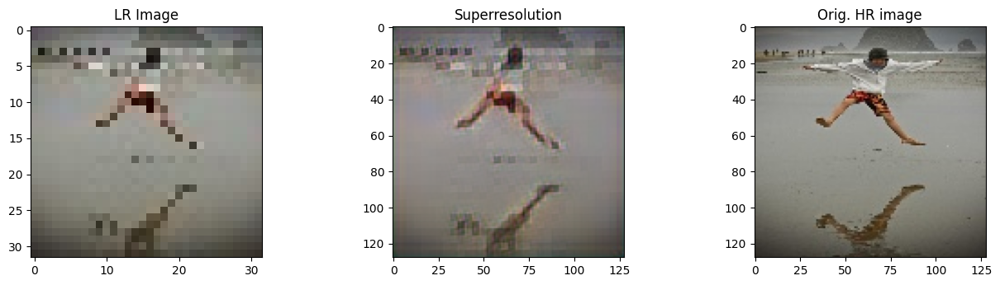

In [ ]:
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])

plt.show()